## Imports

In [ ]:
!pip uninstall -y numpy pandas_ta
!pip install numpy==1.23.5 pandas-ta

!pip install backtesting
!pip install pandas_ta
!pip install hyperopt

Found existing installation: numpy 1.23.5
Uninstalling numpy-1.23.5:
  Successfully uninstalled numpy-1.23.5
Found existing installation: pandas_ta 0.3.14b0
Uninstalling pandas_ta-0.3.14b0:
  Successfully uninstalled pandas_ta-0.3.14b0
  Using cached numpy-1.23.5-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (2.3 kB)
  Using cached pandas_ta-0.3.14b0-py3-none-any.whl
Using cached numpy-1.23.5-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (17.1 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
blosc2 3.2.1 requires numpy>=1.26, but you have numpy 1.23.5 which is incompatible.
jaxlib 0.5.1 requires numpy>=1.25, but you have numpy 1.23.5 which is incompatible.
chex 0.1.89 requires numpy>=1.24.1, but you have numpy 1.23.5 which is incompatible.
pymc 5.21.2 requires numpy>=1.25.0, but you have numpy 1.23.5 which is incompatible.


In [ ]:
# !pip install pandas_ta

In [ ]:
import pandas as pd
import numpy as np
import pandas_ta as ta
from backtesting import Backtest, Strategy

### Import data (signals)

In [ ]:
import pandas as pd

df1 = pd.read_csv('tradingview_signals_first.csv')
df2 = pd.read_csv('tradingview_signals.csv')
df3 = pd.read_csv('tradingview_signals_server.csv')


df = pd.concat([df1, df2, df3], ignore_index=True)

df = df.sort_values(by='utc_time')
df.to_csv('tradingview_signals_merged.csv', index=False)
df.info()
df

<class 'pandas.core.frame.DataFrame'>
Index: 184643 entries, 0 to 184642
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   #               184643 non-null  int64  
 1   id              184643 non-null  int64  
 2   symbol          184643 non-null  object 
 3   timeframe       184643 non-null  object 
 4   signal          184643 non-null  object 
 5   entry_price     184643 non-null  float64
 6   unix_timestamp  184643 non-null  int64  
 7   utc_time        184643 non-null  object 
 8   local_time      184643 non-null  object 
 9   atr             66586 non-null   float64
dtypes: float64(2), int64(3), object(5)
memory usage: 15.5+ MB


,#,id,symbol,timeframe,signal,entry_price,unix_timestamp,utc_time,local_time,atr
0,1,27,MASKUSDT,1h,STRONG_BUY,2.263938,1740502902,2025-02-26 00:01:42.899724,2025-02-26 00:01:42.899724,NaN
1,2,28,ETHUSDT,1h,SELL,2420.460000,1740502930,2025-02-26 00:02:10.098242,2025-02-26 00:02:10.098242,NaN
2,3,29,COWUSDT,1h,STRONG_BUY,0.444927,1740502967,2025-02-26 00:02:47.768526,2025-02-26 00:02:47.768526,NaN
3,4,30,BTCUSDT,1h,SELL,87557.663770,1740502983,2025-02-26 00:03:03.139575,2025-02-26 00:03:03.139575,NaN
4,5,31,PENGUUSDT,15m,STRONG_BUY,0.008166,1740504607,2025-02-26 00:30:07.400803,2025-02-26 00:30:07.400803,NaN
...,...,...,...,...,...,...,...,...,...,...
184637,183186,183186,SUSDT,30m,STRONG_BUY,0.504500,1744450226,2025-04-12 09:30:26.000000,2025-04-12 16:30:26.000000,0.006757
184639,183188,183188,SHELLUSDT,30m,STRONG_BUY,0.138005,1744450226,2025-04-12 09:30:26.000000,2025-04-12 16:30:26.000000,0.002000
184641,183190,183190,NILUSDT,30m,STRONG_BUY,0.435236,1744450227,2025-04-12 09:30:27.000000,2025-04-12 16:30:27.000000,0.011757
184640,183189,183189,EPICUSDT,30m,STRONG_BUY,1.378100,1744450227,2025-04-12 09:30:27.000000,2025-04-12 16:30:27.000000,0.022450


### Import data (klines)

In [ ]:
import pandas as pd
import numpy as np

interval = "4h"
klines_df = pd.read_csv(f"klines_data_{interval}.csv")
# signals_df = pd.read_csv("tradingview_signals_server.csv")
signals_df = df.copy()

signals_df["utc_time"] = pd.to_datetime(signals_df["unix_timestamp"], unit="s", utc=True).dt.floor("H")

print(signals_df[["symbol", "utc_time", "signal"]].head())


print('klines_df.shape', klines_df.shape)
klines_df.info()

      symbol                  utc_time      signal
0   MASKUSDT 2025-02-25 17:00:00+00:00  STRONG_BUY
1    ETHUSDT 2025-02-25 17:00:00+00:00        SELL
2    COWUSDT 2025-02-25 17:00:00+00:00  STRONG_BUY
3    BTCUSDT 2025-02-25 17:00:00+00:00        SELL
4  PENGUUSDT 2025-02-25 17:00:00+00:00  STRONG_BUY
klines_df.shape (94274, 7)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 94274 entries, 0 to 94273
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    94274 non-null  object 
 1   Open    94274 non-null  float64
 2   High    94274 non-null  float64
 3   Low     94274 non-null  float64
 4   Close   94274 non-null  float64
 5   Volume  94274 non-null  float64
 6   Symbol  94274 non-null  object 
dtypes: float64(5), object(2)
memory usage: 5.0+ MB


<ipython-input-59-bfd1b83a4b44>:9: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  signals_df["utc_time"] = pd.to_datetime(signals_df["unix_timestamp"], unit="s", utc=True).dt.floor("H")


In [ ]:
print('signals_df.shape', signals_df.shape)
signals_df.info()

signals_df.shape (184643, 10)
<class 'pandas.core.frame.DataFrame'>
Index: 184643 entries, 0 to 184642
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype              
---  ------          --------------   -----              
 0   #               184643 non-null  int64              
 1   id              184643 non-null  int64              
 2   symbol          184643 non-null  object             
 3   timeframe       184643 non-null  object             
 4   signal          184643 non-null  object             
 5   entry_price     184643 non-null  float64            
 6   unix_timestamp  184643 non-null  int64              
 7   utc_time        184643 non-null  datetime64[ns, UTC]
 8   local_time      184643 non-null  object             
 9   atr             66586 non-null   float64            
dtypes: datetime64[ns, UTC](1), float64(2), int64(3), object(4)
memory usage: 15.5+ MB


In [ ]:
klines_df['Date'] = pd.to_datetime(klines_df['Date'])
signals_df['utc_time'] = pd.to_datetime(signals_df['utc_time'])

signals_df = signals_df[signals_df["timeframe"] == f"{interval}"]

## Hyperopt_by_month

In [ ]:
# !pip install backtesting
# !pip install pandas_ta
# !pip install hyperopt

In [ ]:
import pandas as pd
from datetime import datetime
from hyperopt import fmin, tpe, hp, Trials
import backtesting
from dateutil.relativedelta import relativedelta
import traceback

def generate_monthly_intervals(start_date, end_date):
    start = datetime.strptime(start_date, "%Y-%m")
    end = datetime.strptime(end_date, "%Y-%m")
    intervals = []
    while start <= end:
        next_month = start + relativedelta(months=1)
        intervals.append((start.strftime("%Y-%m"), next_month.strftime("%Y-%m")))
        start = next_month
    return intervals

def full_period_backtest(strategy, data, initial_capital=1_000_000):
    data.index = pd.to_datetime(data.index).tz_localize(None)
    test = backtesting.Backtest(data, strategy, cash=initial_capital, commission=0.0005)
    res = test.run()
    trades = res._trades.copy()
    # print(res)
    return trades, res

from datetime import datetime
from dateutil.relativedelta import relativedelta
import pandas as pd

def analyze_monthly_results(trades, intervals, initial_capital, equity_curve):
    trades['ExitTime'] = pd.to_datetime(trades['ExitTime']).dt.tz_localize(None)
    trades['Close Time'] = pd.to_datetime(trades['ExitTime'])
    trades.set_index('Close Time', inplace=True)
    trades['Trade Duration'] = (trades['ExitTime'] - trades['EntryTime']).dt.total_seconds()

    monthly_results = {}
    total_pnl = 0
    profit_months = 0
    loss_months = 0
    total_trade_duration = 0
    total_trades = len(trades)

    capital = initial_capital  # Начальный капитал
    last_interval = intervals[-1]  # Последний месяц

    for start, end in intervals:
        start_date = datetime.strptime(start, "%Y-%m")
        end_date = datetime.strptime(end, "%Y-%m") + relativedelta(months=1, days=-1, hours=23, minutes=59, seconds=59)

        monthly_trades = trades[(trades.index >= start_date) & (trades.index <= end_date)]

        if monthly_trades.empty:
            monthly_results[start] = (0.0, 0)
            continue

        # PnL за месяц
        monthly_pnl = monthly_trades['PnL'].sum()
        capital += monthly_pnl  # Обновляем капитал только на PnL

        # Если это последний месяц, учитываем открытые позиции
        if (start, end) == last_interval and not equity_curve.empty:
            last_equity = equity_curve['Equity'].iloc[-1]  # Финальная Equity
            open_pnl = last_equity - capital  # Открытые позиции
            capital += open_pnl  # Учитываем их в капитале

        # Итоговый процент профита за месяц
        prev_capital = capital - monthly_pnl  # Капитал до учета текущего месяца
        monthly_pnl_percent = ((capital - prev_capital) / prev_capital) * 100 if prev_capital != 0 else 0

        # Средняя длительность сделки (в часах)
        avg_trade_duration = monthly_trades['Trade Duration'].mean() / 3600 if len(monthly_trades) > 0 else 0

        monthly_results[start] = (round(monthly_pnl_percent, 8), round(avg_trade_duration, 2))

        total_pnl += monthly_pnl
        total_trade_duration += monthly_trades['Trade Duration'].sum()

        if monthly_pnl_percent > 0:
            profit_months += 1
        else:
            loss_months += 1

    avg_trade_duration_total = (total_trade_duration / total_trades) / 3600 if total_trades > 0 else 0
    total_months = profit_months + loss_months
    profit_month_ratio = (profit_months / total_months * 100) if total_months > 0 else 0

    # Итоговый Return [%]
    total_return = ((capital - initial_capital) / initial_capital) * 100

    return total_return, profit_months, loss_months, monthly_results, avg_trade_duration_total, profit_month_ratio



def generate_search_space(params_to_optimize):
    space = {}
    for param, settings in params_to_optimize.items():
        if settings['type'] == 'quniform':
            space[param] = hp.quniform(param, settings['range'][0], settings['range'][1], settings.get('q', 1))
        elif settings['type'] == 'uniform':
            space[param] = hp.uniform(param, settings['range'][0], settings['range'][1])
        else:
            raise ValueError(f"Неизвестный тип параметра: {settings['type']}")
    return space

def optimize_strategy(data, symbol, interval, start_date, end_date, shared_folder_path, max_evals, params_to_optimize, fixed_params, strategy):
    intervals = generate_monthly_intervals(start_date, end_date)
    trials = Trials()
    space = generate_search_space(params_to_optimize)
    results = []

    print(f"Общее количество строк в загруженных данных: {len(data)}")
    print(f"Диапазон дат: {data.index.min()} - {data.index.max()}")
    print(f"Оптимизация для {symbol} ({interval}) с {start_date} по {end_date} началась...\n")

    def objective(params):
        for key, value in fixed_params.items():
            setattr(strategy, key, value)

        for key, value in params.items():
            setattr(strategy, key, int(value) if 'length' in key else value)

        print(f"Параметры: {params}, {fixed_params}")

        try:
            trades, res = full_period_backtest(strategy, data, 1_000_000)

            total_pnl, profit_months, loss_months, monthly_results, avg_trade_duration, profit_month_ratio = analyze_monthly_results(
                trades, intervals, 1_000_000, res._equity_curve
            )

            print(f"Общий профит: {total_pnl:.2f}%, Профитные месяцы: {profit_months}, Убыточные месяцы: {loss_months}, Процент профитных месяцев: {profit_month_ratio:.2f}%")
            print(f"Результаты по месяцам: {[(month, pnl) for month, (pnl, _) in monthly_results.items()]}\n")

            row = {
                'symbol': symbol,
                'interval': interval,
                **{key: fixed_params.get(key, None) for key in fixed_params},
                **{key: (int(value) if 'length' in key else value) for key, value in params.items()},
                'strategy': strategy.__name__,
                'total_pnl%': total_pnl,
                'avg_trade_duration_hours': avg_trade_duration,
                'profit_month_count': profit_months,
                'loss_month_count': loss_months,
                'profit_month_ratio%': profit_month_ratio
            }

            for month, (pnl, _) in monthly_results.items():
                row[month] = pnl

            results.append(row)
            return {'loss': -total_pnl, 'status': 'ok', 'params': params}

        except Exception as e:
            print("Ошибка в objective:", e)
            print(traceback.format_exc())  # Логирование полной трассировки ошибки
            return {'loss': float('inf'), 'status': 'fail', 'params': params}

    try:
        fmin(objective, space, algo=tpe.suggest, max_evals=max_evals, trials=trials)
    except Exception as e:
        print("Ошибка при выполнении fmin:", e)
        print(traceback.format_exc())
        return None

    results_df = pd.DataFrame(results)
    save_results_to_csv(results_df, shared_folder_path, "hyperopt_optimization_results.csv")

    if trials.trials:
        best_trial = min(trials.trials, key=lambda x: x['result']['loss'])
        best_params = best_trial['result']['params']
        best_loss = best_trial['result']['loss']
        return best_params, -best_loss
    else:
        print("Не удалось найти лучшие параметры.")
        return None


# best_params, total_pnl = optimize_strategy(
#     data=df,
#     symbol=symbol,
#     interval=interval,
#     start_date=start_date,
#     end_date=end_date,
#     max_evals=max_evals,
#     shared_folder_path=shared_folder_path,
#     params_to_optimize=params_to_optimize,
#     fixed_params=fixed_params
# )

# # Настройка стратегии с оптимизированными параметрами
# SlopingStrategy.window_length = fixed_params.get('window_length') or int(best_params['window_length'])
# SlopingStrategy.min_space = fixed_params.get('min_space') or int(best_params['min_space'])
# SlopingStrategy.sloping_atr_length = fixed_params.get('sloping_atr_length') or int(best_params['sloping_atr_length'])
# SlopingStrategy.take_profit_multiplier = fixed_params.get('take_profit_multiplier') or best_params['take_profit_multiplier']
# SlopingStrategy.stop_loss_multiplier = fixed_params.get('stop_loss_multiplier') or best_params['stop_loss_multiplier']

# print("\nНастройка стратегии завершена.")

# # Тестируем стратегию
# test = backtesting.Backtest(data=df, strategy=SlopingStrategy, cash=1_000_000, commission=0.0005)
# res = test.run()

# print(symbol)
# print()
# print("Результаты с оптимизированными параметрами:", res)
# print('Window length', SlopingStrategy.window_length)
# print('Min space', SlopingStrategy.min_space)
# print('Sloping atr length', SlopingStrategy.sloping_atr_length)
# print('Take profit multiplier', SlopingStrategy.take_profit_multiplier)
# print('Stop loss multiplier', SlopingStrategy.stop_loss_multiplier)

## Strategy

### Basic

In [ ]:
import pandas as pd
import numpy as np
import pandas_ta as ta
from backtesting import Backtest, Strategy

trade_log = []
class SignalStrategy(Strategy):
    stop_loss_multiplier = 0.4
    take_profit_multiplier = 1.2
    signals_df = None
    symbol = None

    def init(self):
        """Load trading signals and ATR indicator"""
        self.signals = self.signals_df[self.signals_df["symbol"] == self.symbol]
        self.used_signals = set()

        def atr_indicator(h, l, c):
            """Calculate ATR (Average True Range)"""
            try:
                atr_values = ta.atr(pd.Series(h), pd.Series(l), pd.Series(c), length=14)
                return atr_values.fillna(0).to_numpy() if atr_values is not None else np.zeros(len(h))
            except Exception as e:
                print(f"Error calculating ATR: {e}")
                return np.zeros(len(h))

        self.atr = self.I(atr_indicator, self.data.High, self.data.Low, self.data.Close)

    def next(self):
        """Process signals and open trades accordingly"""
        current_time = self.data.index[-1]
        current_price = self.data.Close[-1]
        current_atr = self.atr[-1]

        if current_atr == 0 or pd.isna(current_atr):
            return

        for _, signal in self.signals.iterrows():
            signal_time = signal['utc_time']

            if signal_time in self.used_signals:
                continue

            if signal_time in self.data.index:
                self.used_signals.add(signal_time)

                if signal['signal'] == "STRONG_BUY" and not self.position:
                    stop_loss = current_price - (self.stop_loss_multiplier * current_atr)
                    take_profit = current_price + (self.take_profit_multiplier * current_atr)

                    if stop_loss < current_price < take_profit:
                        print(f"🚀 LONG {self.symbol} | {current_time} | Price: {current_price} | SL: {stop_loss:.4f} | TP: {take_profit:.4f}")
                        self.buy(sl=stop_loss, tp=take_profit)

                elif signal['signal'] == "STRONG_SELL" and not self.position:
                    stop_loss = current_price + (self.stop_loss_multiplier * current_atr)
                    take_profit = current_price - (self.take_profit_multiplier * current_atr)

                    if take_profit < current_price < stop_loss:
                        print(f"🚨 SHORT {self.symbol} | {current_time} | Price: {current_price} | SL: {stop_loss:.4f} | TP: {take_profit:.4f}")
                        self.sell(sl=stop_loss, tp=take_profit)

    def notify_trade(self, trade):
        """Log trade results when a trade is closed"""
        if trade.is_closed:
            trade_log.append({
                "Symbol": self.symbol,
                "Entry Time": trade.entry_time,
                "Exit Time": trade.exit_time,
                "Entry Price": trade.entry_price,
                "Exit Price": trade.exit_price,
                "Return [%]": trade.pl_pct * 100,
            })


### Basic + BTC filter

In [ ]:
import pandas as pd
import numpy as np
import pandas_ta as ta
from backtesting import Backtest, Strategy


trade_log = []

class SignalStrategyBTC(Strategy):
    stop_loss_multiplier = 0.45
    take_profit_multiplier = 2.25
    signals_df = None
    btc_signals_df = None
    symbol = None

    def init(self):
        """Load trading signals and ATR indicator"""
        self.signals = self.signals_df[self.signals_df["symbol"] == self.symbol].copy()
        self.used_signals = set()

        # Обрабатываем BTC сигналы
        self.btc_signals = self.signals_df[self.signals_df["symbol"] == "BTCUSDT"].copy()
        if not self.btc_signals.empty:
            self.btc_signals["utc_time"] = pd.to_datetime(self.btc_signals["utc_time"]).dt.floor("min")
        else:
            self.btc_signals = None  # Отключаем проверку, если данных нет
            # print("⚠️ Нет сигналов BTCUSDT! Проверка отключена.")

        self.signals["utc_time"] = pd.to_datetime(self.signals["utc_time"]).dt.floor("min")

        # ATR Indicator
        self.atr = self.I(self.atr_indicator, self.data.High, self.data.Low, self.data.Close)

    def atr_indicator(self, h, l, c):
        """Calculate ATR (Average True Range)"""
        try:
            atr_values = ta.atr(pd.Series(h), pd.Series(l), pd.Series(c), length=14)
            return atr_values.fillna(0).to_numpy() if atr_values is not None else np.zeros(len(h))
        except Exception as e:
            print(f"Error calculating ATR: {e}")
            return np.zeros(len(h))


    def next(self):
        """Обрабатываем сигналы, если они соответствуют таймфрейму"""
        current_time = self.data.index[-1]  # Время текущей свечи
        current_price = self.data.Close[-1]
        current_atr = self.atr[-1]

        if current_atr == 0 or pd.isna(current_atr):
            return


        # if self.position:
        #     return

        # Получаем BTC сигнал, если он есть
        btc_signal = None
        if not self.position and self.btc_signals is not None:
            btc_row = self.btc_signals[(self.btc_signals["utc_time"] == current_time) &
                                      (self.btc_signals["timeframe"] == interval)]
            if not btc_row.empty:
                btc_signal = btc_row.iloc[0]["signal"]

        # print(f"[{current_time}] 🔍 BTC сигнал: {btc_signal if btc_signal else 'Нет сигнала'}")

        # Фильтруем сигналы по `utc_time` и `timeframe == interval`
        relevant_signals = self.signals[(self.signals["utc_time"] == current_time) &
                                        (self.signals["timeframe"] == interval)]

        if relevant_signals.empty:
            # print(f"[{current_time}] ⏳ Нет сигналов {self.symbol} на интервале {interval}")
            return  # Пропускаем, если нет сигналов в нужном интервале

        for _, signal in relevant_signals.iterrows():
            if signal["utc_time"] in self.used_signals:
                continue

            self.used_signals.add(signal["utc_time"])

            # Убеждаемся, что BTC сигнал тоже соответствует интервалу
            if btc_signal is None:
                # print(f"[{current_time}] ❌ Нет BTC сигнала, пропускаем {self.symbol}")
                continue


            if (btc_signal in ["BUY", "STRONG_BUY", "NEUTRAL"] and signal["signal"] == "STRONG_BUY"):
                stop_loss = current_price - (self.stop_loss_multiplier * current_atr)
                take_profit = current_price + (self.take_profit_multiplier * current_atr)


                print(f"🚀 LONG {self.symbol} | {current_time} | BTC: {btc_signal} | Price: {current_price} | SL: {stop_loss:.4f} | TP: {take_profit:.4f}")
                self.buy(sl=stop_loss, tp=take_profit)

            elif (btc_signal in ["SELL", "STRONG_SELL", "NEUTRAL"] and signal["signal"] == "STRONG_SELL"):
                stop_loss = current_price + (self.stop_loss_multiplier * current_atr)
                take_profit = current_price - (self.take_profit_multiplier * current_atr)


                print(f"🚨 SHORT {self.symbol} | {current_time} | BTC: {btc_signal} | Price: {current_price} | SL: {stop_loss:.4f} | TP: {take_profit:.4f}")
                self.sell(sl=stop_loss, tp=take_profit)




    def notify_trade(self, trade):
        """Log trade results when a trade is closed"""
        if trade.is_closed:
            trade_log.append({
                "symbol": self.symbol,
                "entry_time": trade.entry_time,
                "exit_time": trade.exit_time,
                "entry_price": trade.entry_price,
                "exit_price": trade.exit_price,
                "return [%]": trade.pl_pct * 100,
            })

### BTC filter + 2 takes

In [ ]:
class SignalStrategyBTCTwoTakes(Strategy):
    stop_loss_multiplier = 0.45
    take_profit_multiplier = 5
    btc_signals_df = None
    symbol = None
    tp1_ratio = 0.5
    close_portion = 0.05

    def init(self):
        self.signals = self.signals_df[self.signals_df["symbol"] == self.symbol].copy()
        self.used_signals = set()
        self.btc_signals = self.signals_df[self.signals_df["symbol"] == "BTCUSDT"].copy()
        self.btc_signals["utc_time"] = pd.to_datetime(self.btc_signals["utc_time"]).dt.floor("min")
        self.signals["utc_time"] = pd.to_datetime(self.signals["utc_time"]).dt.floor("min")
        self.atr = self.I(self.atr_indicator, self.data.High, self.data.Low, self.data.Close)

        self.active_trade = None

        # Статистика
        self.results = {
            "tp2_hit": 0,
            "tp1_only_then_sl": 0,
            "sl_before_tp1": 0
        }

    def atr_indicator(self, h, l, c):
        try:
            atr_values = ta.atr(pd.Series(h), pd.Series(l), pd.Series(c), length=14)
            return atr_values.fillna(0).to_numpy()
        except:
            return np.zeros(len(h))

    def next(self):
        current_time = self.data.index[-1]
        price = self.data.Close[-1]
        atr = self.atr[-1]

        if atr == 0 or pd.isna(atr):
            return

        # Управление уже открытой сделкой
        if self.active_trade:
            direction = self.active_trade['direction']
            entry = self.active_trade['entry']
            tp1 = self.active_trade['tp1']
            tp2 = self.active_trade['tp2']
            sl = self.active_trade['sl']
            moved_to_be = self.active_trade['moved_to_be']

            if direction == "long":
                if not moved_to_be and price >= tp1:
                    self.active_trade['moved_to_be'] = True
                    self.position.close(portion=self.close_portion)
                    self.active_trade['sl'] = entry * 1.01
                    print(f"✅ TP1 hit {tp1}! Moved SL to BE: {self.active_trade['sl']:.8f}")
                elif moved_to_be and price >= tp2:
                    self.results["tp2_hit"] += 1
                    print(f"🎯 TP2 hit {tp2}! Closing remaining.")
                    self.position.close()
                    self.active_trade = None
                elif price <= sl:
                    if moved_to_be:
                        self.results["tp1_only_then_sl"] += 1
                        print(f"🛑 SL after TP1 (BE+)! SL: {sl}")
                    else:
                        self.results["sl_before_tp1"] += 1
                        print(f"🛑 SL before TP1! SL: {sl}")
                    self.position.close()
                    self.active_trade = None

            elif direction == "short":
                if not moved_to_be and price <= tp1:
                    self.active_trade['moved_to_be'] = True
                    self.position.close(portion=self.close_portion)
                    self.active_trade['sl'] = entry * 0.99
                    print(f"✅ TP1 hit {tp1}! Moved SL to BE: {self.active_trade['sl']:.8f}")
                elif moved_to_be and price <= tp2:
                    self.results["tp2_hit"] += 1
                    print(f"🎯 TP2 hit {tp2}! Closing remaining.")
                    self.position.close()
                    self.active_trade = None
                elif price >= sl:
                    if moved_to_be:
                        self.results["tp1_only_then_sl"] += 1
                        print(f"🛑 SL after TP1 (BE+)! SL: {sl}")
                    else:
                        self.results["sl_before_tp1"] += 1
                        print(f"🛑 SL before TP1! SL: {sl}")
                    self.position.close()
                    self.active_trade = None

            return

        # Ждём завершения сделки
        if self.position:
            return

        # Получение сигнала по BTC
        btc_signal = None
        if self.btc_signals is not None:
            btc_row = self.btc_signals[(self.btc_signals["utc_time"] == current_time) &
                                       (self.btc_signals["timeframe"] == interval)]
            if not btc_row.empty:
                btc_signal = btc_row.iloc[0]["signal"]

        relevant_signals = self.signals[(self.signals["utc_time"] == current_time) &
                                        (self.signals["timeframe"] == interval)]

        for _, signal in relevant_signals.iterrows():
            if signal["utc_time"] in self.used_signals:
                continue
            self.used_signals.add(signal["utc_time"])

            if signal["signal"] == "STRONG_BUY" and btc_signal in ["BUY", "STRONG_BUY", "NEUTRAL"]:
                sl = price - self.stop_loss_multiplier * atr
                tp1 = price + self.tp1_ratio * self.take_profit_multiplier * atr
                tp2 = price + self.take_profit_multiplier * atr
                self.buy()
                self.active_trade = {
                    "direction": "long",
                    "entry": price,
                    "sl": sl,
                    "tp1": tp1,
                    "tp2": tp2,
                    "moved_to_be": False
                }
                print(f"🚀 LONG {self.symbol} | {current_time} | Price: {price} | SL: {sl}, TP1: {tp1}, TP2: {tp2}")

            elif signal["signal"] == "STRONG_SELL" and btc_signal in ["SELL", "STRONG_SELL", "NEUTRAL"]:
                sl = price + self.stop_loss_multiplier * atr
                tp1 = price - self.tp1_ratio * self.take_profit_multiplier * atr
                tp2 = price - self.take_profit_multiplier * atr
                self.sell()
                self.active_trade = {
                    "direction": "short",
                    "entry": price,
                    "sl": sl,
                    "tp1": tp1,
                    "tp2": tp2,
                    "moved_to_be": False
                }
                print(f"🚨 SHORT {self.symbol} | {current_time} | Price: {price} | SL: {sl}, TP1: {tp1}, TP2: {tp2}")

    def report(self):
        print("\n📊 Deal Outcome Stats:")
        print(f"  ✅ TP2 hit: {self.results['tp2_hit']}")
        print(f"  ⚠️ TP1 only, then SL: {self.results['tp1_only_then_sl']}")
        print(f"  ❌ SL before TP1: {self.results['sl_before_tp1']}")



In [ ]:
class SignalStrategyBTCTwoTakes(Strategy):
    stop_loss_multiplier = 0.45
    take_profit_multiplier = 5
    btc_signals_df = None
    symbol = None
    tp1_ratio = 0.5
    close_portion = 0.05

    def init(self):
        self.signals = self.signals_df[self.signals_df["symbol"] == self.symbol].copy()
        self.used_signals = set()
        self.btc_signals = self.signals_df[self.signals_df["symbol"] == "BTCUSDT"].copy()
        self.btc_signals["utc_time"] = pd.to_datetime(self.btc_signals["utc_time"]).dt.floor("min")
        self.signals["utc_time"] = pd.to_datetime(self.signals["utc_time"]).dt.floor("min")
        self.atr = self.I(self.atr_indicator, self.data.High, self.data.Low, self.data.Close)

        # Состояние текущей сделки
        self.active_trade = None

    def atr_indicator(self, h, l, c):
        try:
            atr_values = ta.atr(pd.Series(h), pd.Series(l), pd.Series(c), length=14)
            return atr_values.fillna(0).to_numpy()
        except:
            return np.zeros(len(h))

    def next(self):
        current_time = self.data.index[-1]
        price = self.data.Close[-1]
        atr = self.atr[-1]

        if atr == 0 or pd.isna(atr):
            return

        # Управление уже открытой сделкой
        if self.active_trade:
            direction = self.active_trade['direction']
            entry = self.active_trade['entry']
            tp1 = self.active_trade['tp1']
            tp2 = self.active_trade['tp2']
            sl = self.active_trade['sl']
            size_left = self.active_trade['size_left']
            moved_to_be = self.active_trade['moved_to_be']

            # LONG логика
            if direction == "long":
                if not moved_to_be and price >= tp1:
                    self.active_trade['moved_to_be'] = True
                    # self.active_trade['size_left'] = 0.3 # Оставляем 50% сделки
                    self.position.close(portion=self.close_portion)
                    self.active_trade['sl'] = entry * 1.01  # Перенос в бу +1%
                    print(f"✅ TP1 hit {tp1}! Moved SL to BE: {self.active_trade['sl']:.8f}")
                elif moved_to_be and price >= tp2:
                    print(f"🎯 TP2 hit {tp2}! Closing remaining.")
                    self.position.close()
                    self.active_trade = None
                elif price <= sl:
                    print(f"🛑 SL hit! Closing. SL: {sl}")
                    self.position.close()
                    self.active_trade = None

            # SHORT логика
            elif direction == "short":
                if not moved_to_be and price <= tp1:
                    self.active_trade['moved_to_be'] = True
                    # self.active_trade['size_left'] = 0.3
                    self.position.close(portion=self.close_portion)
                    self.active_trade['sl'] = entry * 0.99
                    print(f"✅ TP1 hit {tp1}! Moved SL to BE: {self.active_trade['sl']:.8f}")
                elif moved_to_be and price <= tp2:
                    print(f"🎯 TP2 hit {tp2}! Closing remaining.")
                    self.position.close()
                    self.active_trade = None
                elif price >= sl:
                    print(f"🛑 SL hit! Closing. SL: {sl}")
                    self.position.close()
                    self.active_trade = None

            return  # Ждём завершения активной сделки

        # Новый сигнал
        if self.position:  # Ждём завершения старой
            return

        btc_signal = None
        if self.btc_signals is not None:
            btc_row = self.btc_signals[(self.btc_signals["utc_time"] == current_time) &
                                       (self.btc_signals["timeframe"] == interval)]
            if not btc_row.empty:
                btc_signal = btc_row.iloc[0]["signal"]

        relevant_signals = self.signals[(self.signals["utc_time"] == current_time) &
                                        (self.signals["timeframe"] == interval)]

        for _, signal in relevant_signals.iterrows():
            if signal["utc_time"] in self.used_signals:
                continue
            self.used_signals.add(signal["utc_time"])

            if signal["signal"] == "STRONG_BUY" and btc_signal in ["BUY", "STRONG_BUY", "NEUTRAL"]:
                sl = price - self.stop_loss_multiplier * atr
                tp1 = price + self.tp1_ratio * self.take_profit_multiplier * atr
                tp2 = price + self.take_profit_multiplier * atr
                self.buy()
                self.active_trade = {
                    "direction": "long",
                    "entry": price,
                    "sl": sl,
                    "tp1": tp1,
                    "tp2": tp2,
                    "size_left": 1.0,
                    "moved_to_be": False
                }
                print(f"🚀 LONG {self.symbol} | {current_time} | Price: {price} | SL: {sl}, TP1: {tp1}, TP2: {tp2}")

            elif signal["signal"] == "STRONG_SELL" and btc_signal in ["SELL", "STRONG_SELL", "NEUTRAL"]:
                sl = price + self.stop_loss_multiplier * atr
                tp1 = price - self.tp1_ratio * self.take_profit_multiplier * atr
                tp2 = price - self.take_profit_multiplier * atr
                self.sell()
                self.active_trade = {
                    "direction": "short",
                    "entry": price,
                    "sl": sl,
                    "tp1": tp1,
                    "tp2": tp2,
                    "size_left": 1.0,
                    "moved_to_be": False
                }
                print(f"🚨 SHORT {self.symbol} | {current_time} | Price: {price} | SL: {sl}, TP1: {tp1}, TP2: {tp2}")


## Backtest

### Backtest tradingview Basic

In [ ]:
successful_symbols = ['TSTUSDT', 'TURBOUSDT', 'UMAUSDT', 'LINAUSDT', 'ACEUSDT',
       'CHRUSDT', 'METISUSDT', 'IOUSDT', 'HOTUSDT', 'STRKUSDT',
       'MBOXUSDT', 'NMRUSDT', 'GLMRUSDT', 'NKNUSDT', 'BBUSDT',
       'CHESSUSDT', 'COMBOUSDT', 'SHELLUSDT', 'PHBUSDT', 'SYNUSDT',
       'SCRUSDT', 'IMXUSDT', 'RDNTUSDT', 'ALICEUSDT', 'LEVERUSDT',
       'ALGOUSDT', 'AUCTIONUSDT', 'ICPUSDT', 'MAGICUSDT', 'PENGUUSDT',
       'CFXUSDT', 'ZROUSDT', 'DOGSUSDT', 'FLOWUSDT', 'HIFIUSDT',
       'ONTUSDT', 'TUSDT', 'NEOUSDT', 'LOKAUSDT', 'THEUSDT', 'SAGAUSDT',
       'JASMYUSDT', '1MBABYDOGEUSDT', 'STGUSDT', 'HFTUSDT', 'OMNIUSDT',
       'WAXPUSDT', 'NULSUSDT', 'GASUSDT', 'GMXUSDT', 'CELOUSDT',
       'ACXUSDT']

In [ ]:
import pandas as pd
import numpy as np
import pandas_ta as ta
from backtesting import Backtest, Strategy


strategy = SignalStrategy
results_list = []
all_trade_logs = []

# for symbol in successful_symbols:
for symbol in klines_df["Symbol"].unique():
    print(f"🔍 Testing {symbol}...")

    # Фильтрация данных по текущему символу
    data = klines_df[klines_df["Symbol"] == symbol].copy()

    # Check if data is empty before proceeding
    if data.empty:
        print(f"⚠️ Data for symbol {symbol} is empty, skipping...")
        continue  # Skip to the next symbol if data is empty

    data['Date'] = pd.to_datetime(data['Date'])
    data.set_index("Date", inplace=True)

    if not isinstance(data.index, pd.DatetimeIndex):
        data.index = pd.to_datetime(data.index)

    data.drop(columns=["Symbol"], inplace=True)


    symbol_signals = signals_df[(signals_df["symbol"] == symbol) & (signals_df["timeframe"] == f"{interval}")]
    unique_signals_count = symbol_signals["utc_time"].nunique()

    if symbol_signals.empty:
        print(f"⚠️ No signals for {symbol}, skipping...")
        continue

    print(f"📊 Found {len(symbol_signals)} signals ({unique_signals_count} unique) for {symbol}")


    strategy.signals_df = signals_df
    strategy.symbol = symbol


    bt = Backtest(data, strategy, cash=1_000_000, commission=0.0005)
    stats = bt.run()

    # Initialize long_count, short_count, etc. to 0 before the if condition
    long_count = 0
    short_count = 0
    long_return = 0
    short_return = 0
    long_winrate = 0
    short_winrate = 0

    if stats["_trades"] is not None and not stats["_trades"].empty:
        trade_log = stats["_trades"].copy()

        if "ReturnPct" in trade_log.columns:
            trade_log["Win"] = (trade_log["ReturnPct"] > 0).astype(int)

            for idx, trade in trade_log.iterrows():
                all_trade_logs.append({
                    "symbol": symbol,
                    "EntryBar": trade["EntryBar"],
                    "ExitBar": trade["ExitBar"],
                    "EntryPrice": trade["EntryPrice"],
                    "ExitPrice": trade["ExitPrice"],
                    "Size": trade["Size"],
                    "PnL": trade["PnL"],
                    "ReturnPct": trade["ReturnPct"],
                    "EntryTime": trade["EntryTime"],
                    "ExitTime": trade["ExitTime"],
                    "Duration": trade["Duration"]
                })


            longs = trade_log[trade_log["Size"] > 0]
            shorts = trade_log[trade_log["Size"] < 0]

            long_count = len(longs)
            short_count = len(shorts)

            long_return = longs["ReturnPct"].sum() if not longs.empty else 0
            short_return = shorts["ReturnPct"].sum() if not shorts.empty else 0

            long_winrate = longs["Win"].mean() * 100 if not longs.empty else 0
            short_winrate = shorts["Win"].mean() * 100 if not shorts.empty else 0
        else:
            print(f"⚠️ Warning: 'ReturnPct' column not found in trades for {symbol}")
            # The variables are already initialized to 0 above



    results = {
        "symbol": symbol,
        "timeframe": interval,
        "start_date": data.index.min(),
        "end_date": data.index.max(),
        'stop_loss_multiplier': strategy.stop_loss_multiplier,
        'take_profit_multiplier': strategy.take_profit_multiplier,
        "Total Trades": stats["# Trades"],
        "Win Rate": stats["Win Rate [%]"],
        "return [%]": stats["Return [%]"],
        "long_trades": long_count,
        "short_trades": short_count,
        "long_return [%]": long_return,
        "short_return [%]": short_return,
        "long_win_rate [%]": long_winrate,
        "short_win_rate [%]": short_winrate,
    }
    results_list.append(results)

    print(f"✅ {symbol} — Return: {results['return [%]']:.2f}%, Trades: {results['Total Trades']}, "
          f"Win Rate: {results['Win Rate']:.2f}%, Longs: {long_count}, Shorts: {short_count}, "
          f"Long Return: {long_return:.2f}%, Short Return: {short_return:.2f}%, "
          f"Long Win Rate: {long_winrate:.2f}%, Short Win Rate: {short_winrate:.2f}%\n")


results_df = pd.DataFrame(results_list)
results_df.to_csv(f"backtest_results_{interval}_Basic.csv", index=False)


if all_trade_logs:
    trades_df = pd.DataFrame(all_trade_logs)
    trades_df.to_csv("all_trades_df.csv", index=False)


print("Backtest completed! Results saved in backtest_results.csv")
print("All trade log saved in all_trade_log.csv")

display(results_df)

🔍 Testing BNBUSDT...
📊 Found 43 signals (43 unique) for BNBUSDT


Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BNBUSDT | 2025-03-03 20:00:00+00:00 | Price: 576.1 | SL: 581.7647 | TP: 559.1060
🚨 SHORT BNBUSDT | 2025-03-04 04:00:00+00:00 | Price: 564.91 | SL: 570.9391 | TP: 546.8226
🚨 SHORT BNBUSDT | 2025-03-09 00:00:00+00:00 | Price: 588.42 | SL: 592.2354 | TP: 576.9738
🚨 SHORT BNBUSDT | 2025-03-09 12:00:00+00:00 | Price: 566.73 | SL: 570.5686 | TP: 555.2141
🚨 SHORT BNBUSDT | 2025-03-10 00:00:00+00:00 | Price: 560.65 | SL: 564.9555 | TP: 547.7336
🚨 SHORT BNBUSDT | 2025-03-10 16:00:00+00:00 | Price: 537.74 | SL: 542.9987 | TP: 521.9640
🚨 SHORT BNBUSDT | 2025-03-11 00:00:00+00:00 | Price: 533.22 | SL: 538.9426 | TP: 516.0521
🚀 LONG BNBUSDT | 2025-03-17 04:00:00+00:00 | Price: 629.83 | SL: 625.0569 | TP: 644.1492
🚀 LONG BNBUSDT | 2025-03-17 20:00:00+00:00 | Price: 631.69 | SL: 627.0359 | TP: 645.6523
🚀 LONG BNBUSDT | 2025-03-18 08:00:00+00:00 | Price: 631.22 | SL: 626.4461 | TP: 645.5416
🚀 LONG BNBUSDT | 2025-03-18 12:00:00+00:00 | Price: 627.52 | SL: 622.7300 | TP: 641.8901
🚀 LONG BNBUSDT 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BTCUSDT | 2025-02-26 12:00:00+00:00 | Price: 87567.53 | SL: 88268.7583 | TP: 85463.8450
🚨 SHORT BTCUSDT | 2025-02-26 16:00:00+00:00 | Price: 83856.99 | SL: 84643.4574 | TP: 81497.5879
🚨 SHORT BTCUSDT | 2025-02-28 04:00:00+00:00 | Price: 79204.59 | SL: 80102.1520 | TP: 76511.9039
🚨 SHORT BTCUSDT | 2025-03-03 20:00:00+00:00 | Price: 86220.61 | SL: 87220.2680 | TP: 83221.6360
🚨 SHORT BTCUSDT | 2025-03-04 04:00:00+00:00 | Price: 83186.4 | SL: 84204.9557 | TP: 80130.7328
🚨 SHORT BTCUSDT | 2025-03-07 20:00:00+00:00 | Price: 86801.75 | SL: 87851.5810 | TP: 83652.2569
🚨 SHORT BTCUSDT | 2025-03-09 12:00:00+00:00 | Price: 83080.41 | SL: 83805.5275 | TP: 80905.0575
🚨 SHORT BTCUSDT | 2025-03-09 20:00:00+00:00 | Price: 80734.37 | SL: 81501.4965 | TP: 78432.9905
🚨 SHORT BTCUSDT | 2025-03-10 00:00:00+00:00 | Price: 82047.49 | SL: 82837.1639 | TP: 79678.4683
🚨 SHORT BTCUSDT | 2025-03-10 16:00:00+00:00 | Price: 79060.84 | SL: 79941.6117 | TP: 76418.5248
🚨 SHORT BTCUSDT | 2025-03-13 20:00:00+00:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ETHUSDT | 2025-02-26 16:00:00+00:00 | Price: 2296.29 | SL: 2329.0783 | TP: 2197.9252
🚨 SHORT ETHUSDT | 2025-03-03 20:00:00+00:00 | Price: 2149.01 | SL: 2187.0244 | TP: 2034.9668
🚨 SHORT ETHUSDT | 2025-03-04 04:00:00+00:00 | Price: 2080.41 | SL: 2119.0919 | TP: 1964.3644
🚨 SHORT ETHUSDT | 2025-03-07 04:00:00+00:00 | Price: 2192.41 | SL: 2223.1842 | TP: 2100.0873
🚨 SHORT ETHUSDT | 2025-03-07 20:00:00+00:00 | Price: 2141.6 | SL: 2171.5492 | TP: 2051.7525
🚨 SHORT ETHUSDT | 2025-03-09 12:00:00+00:00 | Price: 2097.03 | SL: 2120.7249 | TP: 2025.9452
🚨 SHORT ETHUSDT | 2025-03-09 16:00:00+00:00 | Price: 2040.47 | SL: 2065.6543 | TP: 1964.9171
🚨 SHORT ETHUSDT | 2025-03-10 00:00:00+00:00 | Price: 2057.89 | SL: 2083.5502 | TP: 1980.9093
🚨 SHORT ETHUSDT | 2025-03-10 16:00:00+00:00 | Price: 1869.3 | SL: 1901.3707 | TP: 1773.0878
🚨 SHORT ETHUSDT | 2025-03-11 00:00:00+00:00 | Price: 1849.78 | SL: 1882.9362 | TP: 1750.3114
🚨 SHORT ETHUSDT | 2025-03-12 00:00:00+00:00 | Price: 1868.9 | SL: 1899.7

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CAKEUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.897 | SL: 1.9302 | TP: 1.7974
🚨 SHORT CAKEUSDT | 2025-03-03 04:00:00+00:00 | Price: 1.875 | SL: 1.9096 | TP: 1.7713
🚨 SHORT CAKEUSDT | 2025-03-03 16:00:00+00:00 | Price: 1.738 | SL: 1.7725 | TP: 1.6344
🚨 SHORT CAKEUSDT | 2025-03-06 20:00:00+00:00 | Price: 1.743 | SL: 1.7654 | TP: 1.6759
🚨 SHORT CAKEUSDT | 2025-03-07 04:00:00+00:00 | Price: 1.732 | SL: 1.7544 | TP: 1.6649
🚨 SHORT CAKEUSDT | 2025-03-08 00:00:00+00:00 | Price: 1.73 | SL: 1.7511 | TP: 1.6668
🚨 SHORT CAKEUSDT | 2025-03-09 04:00:00+00:00 | Price: 1.68 | SL: 1.6979 | TP: 1.6264
🚨 SHORT CAKEUSDT | 2025-03-09 12:00:00+00:00 | Price: 1.602 | SL: 1.6204 | TP: 1.5467
🚨 SHORT CAKEUSDT | 2025-03-09 20:00:00+00:00 | Price: 1.522 | SL: 1.5424 | TP: 1.4608
🚨 SHORT CAKEUSDT | 2025-03-10 00:00:00+00:00 | Price: 1.545 | SL: 1.5656 | TP: 1.4833
🚨 SHORT CAKEUSDT | 2025-03-10 16:00:00+00:00 | Price: 1.493 | SL: 1.5162 | TP: 1.4234
🚨 SHORT CAKEUSDT | 2025-03-11 00:00:00+00:00 | Price: 1.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SCUSDT | 2025-02-26 08:00:00+00:00 | Price: 0.003709 | SL: 0.0038 | TP: 0.0036
🚨 SHORT SCUSDT | 2025-02-26 16:00:00+00:00 | Price: 0.00355 | SL: 0.0036 | TP: 0.0034
🚨 SHORT SCUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.003498 | SL: 0.0035 | TP: 0.0034
🚨 SHORT SCUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.003399 | SL: 0.0034 | TP: 0.0033
🚨 SHORT SCUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.003396 | SL: 0.0034 | TP: 0.0033
🚨 SHORT SCUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.003515 | SL: 0.0036 | TP: 0.0034
🚨 SHORT SCUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.003511 | SL: 0.0036 | TP: 0.0034
🚨 SHORT SCUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.003426 | SL: 0.0035 | TP: 0.0033
🚨 SHORT SCUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.00337 | SL: 0.0034 | TP: 0.0032
🚨 SHORT SCUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.003215 | SL: 0.0032 | TP: 0.0031
🚨 SHORT SCUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.003169 | SL: 0.0032 | TP: 0.0031
🚨 SHORT SCUSDT | 2025-03-11 00:00:00+00:00 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG PROMUSDT | 2025-02-26 04:00:00+00:00 | Price: 6.8 | SL: 6.7040 | TP: 7.0880
🚀 LONG PROMUSDT | 2025-03-02 00:00:00+00:00 | Price: 6.391 | SL: 6.3128 | TP: 6.6257
🚀 LONG PROMUSDT | 2025-03-02 20:00:00+00:00 | Price: 6.572 | SL: 6.4962 | TP: 6.7995
🚀 LONG PROMUSDT | 2025-03-03 04:00:00+00:00 | Price: 6.685 | SL: 6.6097 | TP: 6.9108
🚀 LONG PROMUSDT | 2025-03-05 12:00:00+00:00 | Price: 6.7 | SL: 6.6217 | TP: 6.9350
🚀 LONG PROMUSDT | 2025-03-05 16:00:00+00:00 | Price: 6.595 | SL: 6.5185 | TP: 6.8244
🚀 LONG PROMUSDT | 2025-03-06 00:00:00+00:00 | Price: 6.727 | SL: 6.6422 | TP: 6.9813
🚨 SHORT PROMUSDT | 2025-03-10 00:00:00+00:00 | Price: 5.847 | SL: 5.9184 | TP: 5.6327
🚨 SHORT PROMUSDT | 2025-03-10 04:00:00+00:00 | Price: 5.937 | SL: 6.0125 | TP: 5.7106
🚨 SHORT PROMUSDT | 2025-03-12 12:00:00+00:00 | Price: 5.893 | SL: 5.9634 | TP: 5.6819
🚨 SHORT PROMUSDT | 2025-03-17 16:00:00+00:00 | Price: 6.062 | SL: 6.1071 | TP: 5.9266
🚨 SHORT PROMUSDT | 2025-03-18 08:00:00+00:00 | Price: 6.035 | SL:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.5436 | SL: 0.5563 | TP: 0.5055
🚨 SHORT SUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.5196 | SL: 0.5323 | TP: 0.4814
🚨 SHORT SUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.5401 | SL: 0.5525 | TP: 0.5029
🚨 SHORT SUSDT | 2025-03-07 16:00:00+00:00 | Price: 0.5214 | SL: 0.5329 | TP: 0.4869
🚨 SHORT SUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.4618 | SL: 0.4709 | TP: 0.4345
🚨 SHORT SUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.4376 | SL: 0.4471 | TP: 0.4091
🚨 SHORT SUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.4504 | SL: 0.4599 | TP: 0.4220
🚨 SHORT SUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.4304 | SL: 0.4403 | TP: 0.4006
🚨 SHORT SUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.4141 | SL: 0.4233 | TP: 0.3865
🚨 SHORT SUSDT | 2025-03-18 00:00:00+00:00 | Price: 0.4761 | SL: 0.4843 | TP: 0.4515
🚨 SHORT SUSDT | 2025-03-21 12:00:00+00:00 | Price: 0.4895 | SL: 0.4967 | TP: 0.4679
🚀 LONG SUSDT | 2025-03-25 12:00:00+00:00 | Price: 0.6123 | SL: 0.6037 | TP: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG TNSRUSDT | 2025-02-26 04:00:00+00:00 | Price: 0.493 | SL: 0.4842 | TP: 0.5194
🚀 LONG TNSRUSDT | 2025-02-26 08:00:00+00:00 | Price: 0.4801 | SL: 0.4714 | TP: 0.5061
🚀 LONG TNSRUSDT | 2025-03-01 20:00:00+00:00 | Price: 0.5242 | SL: 0.5151 | TP: 0.5514
🚀 LONG TNSRUSDT | 2025-03-02 00:00:00+00:00 | Price: 0.4993 | SL: 0.4901 | TP: 0.5268
🚀 LONG TNSRUSDT | 2025-03-02 16:00:00+00:00 | Price: 0.5355 | SL: 0.5264 | TP: 0.5627
🚀 LONG TNSRUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.5249 | SL: 0.5161 | TP: 0.5513
🚨 SHORT TNSRUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.4134 | SL: 0.4230 | TP: 0.3845
🚨 SHORT TNSRUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.4305 | SL: 0.4392 | TP: 0.4043
🚨 SHORT TNSRUSDT | 2025-03-10 04:00:00+00:00 | Price: 0.3141 | SL: 0.3238 | TP: 0.2851
🚨 SHORT TNSRUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.3139 | SL: 0.3236 | TP: 0.2849
🚨 SHORT TNSRUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.2737 | SL: 0.2817 | TP: 0.2498
🚨 SHORT TNSRUSDT | 2025-03-18 16:00:00+00:00 | Pri

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG VANAUSDT | 2025-02-26 16:00:00+00:00 | Price: 8.369 | SL: 8.0618 | TP: 9.2907
🚨 SHORT VANAUSDT | 2025-03-03 20:00:00+00:00 | Price: 6.574 | SL: 6.7976 | TP: 5.9032
🚨 SHORT VANAUSDT | 2025-03-05 16:00:00+00:00 | Price: 6.159 | SL: 6.3336 | TP: 5.6352
🚨 SHORT VANAUSDT | 2025-03-06 20:00:00+00:00 | Price: 5.993 | SL: 6.1302 | TP: 5.5815
🚨 SHORT VANAUSDT | 2025-03-08 00:00:00+00:00 | Price: 5.932 | SL: 6.0509 | TP: 5.5753
🚨 SHORT VANAUSDT | 2025-03-09 16:00:00+00:00 | Price: 5.368 | SL: 5.4838 | TP: 5.0206
🚨 SHORT VANAUSDT | 2025-03-10 00:00:00+00:00 | Price: 5.238 | SL: 5.3532 | TP: 4.8924
🚨 SHORT VANAUSDT | 2025-03-11 00:00:00+00:00 | Price: 4.805 | SL: 4.9287 | TP: 4.4340
🚀 LONG VANAUSDT | 2025-03-17 00:00:00+00:00 | Price: 6.84 | SL: 6.7045 | TP: 7.2466
🚀 LONG VANAUSDT | 2025-03-17 04:00:00+00:00 | Price: 6.956 | SL: 6.8179 | TP: 7.3703
🚨 SHORT VANAUSDT | 2025-03-19 08:00:00+00:00 | Price: 5.693 | SL: 5.8030 | TP: 5.3631
🚀 LONG VANAUSDT | 2025-03-20 16:00:00+00:00 | Price: 6.374

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TSTUSDT | 2025-03-02 16:00:00+00:00 | Price: 0.0894 | SL: 0.0919 | TP: 0.0819
🚨 SHORT TSTUSDT | 2025-03-03 04:00:00+00:00 | Price: 0.0818 | SL: 0.0842 | TP: 0.0747
🚨 SHORT TSTUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.0738 | SL: 0.0761 | TP: 0.0670
🚨 SHORT TSTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0697 | SL: 0.0719 | TP: 0.0631
🚨 SHORT TSTUSDT | 2025-03-05 08:00:00+00:00 | Price: 0.0723 | SL: 0.0743 | TP: 0.0663
🚨 SHORT TSTUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.0666 | SL: 0.0682 | TP: 0.0617
🚨 SHORT TSTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0713 | SL: 0.0730 | TP: 0.0663
🚨 SHORT TSTUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.0635 | SL: 0.0652 | TP: 0.0584
🚨 SHORT TSTUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.0628 | SL: 0.0644 | TP: 0.0581
🚨 SHORT TSTUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.0613 | SL: 0.0629 | TP: 0.0565
🚨 SHORT TSTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0569 | SL: 0.0585 | TP: 0.0522
🚨 SHORT TSTUSDT | 2025-03-11 04:00:00+00:00 | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT 1000CHEEMSUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.000899 | SL: 0.0009 | TP: 0.0008
🚨 SHORT 1000CHEEMSUSDT | 2025-02-26 16:00:00+00:00 | Price: 0.000851 | SL: 0.0009 | TP: 0.0008
🚨 SHORT 1000CHEEMSUSDT | 2025-03-01 20:00:00+00:00 | Price: 0.00081 | SL: 0.0008 | TP: 0.0008
🚨 SHORT 1000CHEEMSUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.000787 | SL: 0.0008 | TP: 0.0007
🚀 LONG 1000CHEEMSUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.000876 | SL: 0.0009 | TP: 0.0009
🚀 LONG 1000CHEEMSUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.000872 | SL: 0.0009 | TP: 0.0009
🚨 SHORT 1000CHEEMSUSDT | 2025-03-07 16:00:00+00:00 | Price: 0.000952 | SL: 0.0010 | TP: 0.0009
🚀 LONG 1000CHEEMSUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.000922 | SL: 0.0009 | TP: 0.0010
🚀 LONG 1000CHEEMSUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.000925 | SL: 0.0009 | TP: 0.0010
🚀 LONG 1000CHEEMSUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.000913 | SL: 0.0009 | TP: 0.0010
🚀 LONG 1000CHEEMSUSDT | 2025-03-13 20:00:00+00:00 | Pric

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CETUSUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1082 | SL: 0.1107 | TP: 0.1008
🚀 LONG CETUSUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1311 | SL: 0.1289 | TP: 0.1376
🚨 SHORT CETUSUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1047 | SL: 0.1071 | TP: 0.0975
🚨 SHORT CETUSUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0991 | SL: 0.1016 | TP: 0.0915
🚨 SHORT CETUSUSDT | 2025-03-08 08:00:00+00:00 | Price: 0.104 | SL: 0.1061 | TP: 0.0977
🚨 SHORT CETUSUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.1027 | SL: 0.1048 | TP: 0.0965
🚨 SHORT CETUSUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0945 | SL: 0.0964 | TP: 0.0889
🚨 SHORT CETUSUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0868 | SL: 0.0889 | TP: 0.0805
🚨 SHORT CETUSUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0849 | SL: 0.0870 | TP: 0.0786
🚨 SHORT CETUSUSDT | 2025-03-13 20:00:00+00:00 | Price: 0.0904 | SL: 0.0922 | TP: 0.0851
🚨 SHORT CETUSUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.0943 | SL: 0.0956 | TP: 0.0904
🚀 LONG CETUSUSDT | 2025-03-24 12:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MEMEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.00351 | SL: 0.0036 | TP: 0.0033
🚨 SHORT MEMEUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.00329 | SL: 0.0034 | TP: 0.0031
🚨 SHORT MEMEUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.00312 | SL: 0.0032 | TP: 0.0029
🚨 SHORT MEMEUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.00318 | SL: 0.0033 | TP: 0.0030
🚨 SHORT MEMEUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.00312 | SL: 0.0032 | TP: 0.0029
🚨 SHORT MEMEUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.002994 | SL: 0.0031 | TP: 0.0028
🚨 SHORT MEMEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.00292 | SL: 0.0030 | TP: 0.0028
🚨 SHORT MEMEUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.002837 | SL: 0.0029 | TP: 0.0027
🚨 SHORT MEMEUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.002645 | SL: 0.0027 | TP: 0.0025
🚨 SHORT MEMEUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.002505 | SL: 0.0026 | TP: 0.0024
🚨 SHORT MEMEUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.002411 | SL: 0.0025 | TP: 0.0023
🚨 SHORT MEMEUSDT | 2025-03-

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT KNCUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.3695 | SL: 0.3744 | TP: 0.3549
🚀 LONG KNCUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.4228 | SL: 0.4186 | TP: 0.4354
🚨 SHORT KNCUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.365 | SL: 0.3702 | TP: 0.3495
🚨 SHORT KNCUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.3483 | SL: 0.3538 | TP: 0.3317
🚨 SHORT KNCUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.35 | SL: 0.3554 | TP: 0.3339
🚨 SHORT KNCUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.3607 | SL: 0.3650 | TP: 0.3477
🚨 SHORT KNCUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.3437 | SL: 0.3473 | TP: 0.3328
🚨 SHORT KNCUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.3339 | SL: 0.3378 | TP: 0.3221
🚨 SHORT KNCUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.3272 | SL: 0.3312 | TP: 0.3152
🚨 SHORT KNCUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.3157 | SL: 0.3205 | TP: 0.3013
🚨 SHORT KNCUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.3111 | SL: 0.3161 | TP: 0.2962
🚨 SHORT KNCUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.353

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG ZECUSDT | 2025-03-01 20:00:00+00:00 | Price: 37.81 | SL: 37.3515 | TP: 39.1856
🚀 LONG ZECUSDT | 2025-03-02 08:00:00+00:00 | Price: 39.86 | SL: 39.3990 | TP: 41.2430
🚀 LONG ZECUSDT | 2025-03-02 20:00:00+00:00 | Price: 41.27 | SL: 40.7202 | TP: 42.9194
🚨 SHORT ZECUSDT | 2025-03-04 04:00:00+00:00 | Price: 34.99 | SL: 35.6005 | TP: 33.1586
🚨 SHORT ZECUSDT | 2025-03-06 12:00:00+00:00 | Price: 35.41 | SL: 35.9021 | TP: 33.9336
🚨 SHORT ZECUSDT | 2025-03-06 16:00:00+00:00 | Price: 33.92 | SL: 34.4227 | TP: 32.4118
🚨 SHORT ZECUSDT | 2025-03-06 20:00:00+00:00 | Price: 34.11 | SL: 34.5945 | TP: 32.6566
🚨 SHORT ZECUSDT | 2025-03-08 00:00:00+00:00 | Price: 32.9 | SL: 33.3534 | TP: 31.5397
🚨 SHORT ZECUSDT | 2025-03-09 04:00:00+00:00 | Price: 31.67 | SL: 32.0487 | TP: 30.5340
🚨 SHORT ZECUSDT | 2025-03-09 20:00:00+00:00 | Price: 29.84 | SL: 30.2475 | TP: 28.6174
🚨 SHORT ZECUSDT | 2025-03-10 16:00:00+00:00 | Price: 29.59 | SL: 30.0692 | TP: 28.1523
🚨 SHORT ZECUSDT | 2025-03-11 00:00:00+00:00 | P

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT IOTAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1865 | SL: 0.1898 | TP: 0.1766
🚀 LONG IOTAUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.264 | SL: 0.2581 | TP: 0.2816
🚀 LONG IOTAUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.2481 | SL: 0.2421 | TP: 0.2661
🚨 SHORT IOTAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.2031 | SL: 0.2088 | TP: 0.1859
🚨 SHORT IOTAUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2115 | SL: 0.2158 | TP: 0.1986
🚨 SHORT IOTAUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.2054 | SL: 0.2098 | TP: 0.1921
🚨 SHORT IOTAUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2126 | SL: 0.2170 | TP: 0.1995
🚨 SHORT IOTAUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2039 | SL: 0.2080 | TP: 0.1916
🚨 SHORT IOTAUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.1934 | SL: 0.1967 | TP: 0.1836
🚨 SHORT IOTAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1814 | SL: 0.1847 | TP: 0.1716
🚨 SHORT IOTAUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.187 | SL: 0.1904 | TP: 0.1769
🚨 SHORT IOTAUSDT | 2025-03-10 16:00:00+00:00 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TURBOUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.003056 | SL: 0.0031 | TP: 0.0029
🚨 SHORT TURBOUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.003048 | SL: 0.0031 | TP: 0.0028
🚨 SHORT TURBOUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.002913 | SL: 0.0030 | TP: 0.0027
🚨 SHORT TURBOUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.002691 | SL: 0.0028 | TP: 0.0025
🚨 SHORT TURBOUSDT | 2025-03-05 20:00:00+00:00 | Price: 0.002749 | SL: 0.0028 | TP: 0.0026
🚨 SHORT TURBOUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.002669 | SL: 0.0027 | TP: 0.0025
🚨 SHORT TURBOUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.002634 | SL: 0.0027 | TP: 0.0025
🚨 SHORT TURBOUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.002586 | SL: 0.0026 | TP: 0.0024
🚨 SHORT TURBOUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.002476 | SL: 0.0025 | TP: 0.0023
🚨 SHORT TURBOUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.002195 | SL: 0.0022 | TP: 0.0020
🚨 SHORT TURBOUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.00208 | SL: 0.0021 | TP: 0.0019
🚨 SHORT TUR

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SXPUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2068 | SL: 0.2098 | TP: 0.1979
🚨 SHORT SXPUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.2195 | SL: 0.2217 | TP: 0.2128
🚀 LONG SXPUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.2367 | SL: 0.2342 | TP: 0.2443
🚨 SHORT SXPUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2057 | SL: 0.2087 | TP: 0.1968
🚨 SHORT SXPUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1974 | SL: 0.2006 | TP: 0.1877
🚨 SHORT SXPUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1986 | SL: 0.2017 | TP: 0.1892
🚨 SHORT SXPUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.206 | SL: 0.2085 | TP: 0.1985
🚨 SHORT SXPUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2056 | SL: 0.2081 | TP: 0.1980
🚨 SHORT SXPUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2033 | SL: 0.2058 | TP: 0.1958
🚨 SHORT SXPUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.1968 | SL: 0.1990 | TP: 0.1903
🚨 SHORT SXPUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1889 | SL: 0.1911 | TP: 0.1824
🚨 SHORT SXPUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BIOUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.1067 | SL: 0.1096 | TP: 0.0980
🚨 SHORT BIOUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0944 | SL: 0.0974 | TP: 0.0853
🚨 SHORT BIOUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0955 | SL: 0.0984 | TP: 0.0867
🚨 SHORT BIOUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0993 | SL: 0.1014 | TP: 0.0930
🚨 SHORT BIOUSDT | 2025-03-08 08:00:00+00:00 | Price: 0.0938 | SL: 0.0958 | TP: 0.0877
🚨 SHORT BIOUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.0902 | SL: 0.0919 | TP: 0.0851
🚨 SHORT BIOUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0857 | SL: 0.0874 | TP: 0.0805
🚨 SHORT BIOUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0826 | SL: 0.0844 | TP: 0.0771
🚨 SHORT BIOUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0817 | SL: 0.0838 | TP: 0.0754
🚨 SHORT BIOUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.0826 | SL: 0.0845 | TP: 0.0769
🚨 SHORT BIOUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.0853 | SL: 0.0869 | TP: 0.0804
🚨 SHORT BIOUSDT | 2025-03-13 20:00:00+00:00 | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT NOTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.002622 | SL: 0.0027 | TP: 0.0025
🚨 SHORT NOTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.002668 | SL: 0.0027 | TP: 0.0025
🚨 SHORT NOTUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.002579 | SL: 0.0026 | TP: 0.0024
🚨 SHORT NOTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.002714 | SL: 0.0028 | TP: 0.0025
🚨 SHORT NOTUSDT | 2025-03-05 08:00:00+00:00 | Price: 0.002568 | SL: 0.0026 | TP: 0.0024
🚨 SHORT NOTUSDT | 2025-03-06 04:00:00+00:00 | Price: 0.002648 | SL: 0.0027 | TP: 0.0025
🚨 SHORT NOTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.002575 | SL: 0.0026 | TP: 0.0024
🚨 SHORT NOTUSDT | 2025-03-07 08:00:00+00:00 | Price: 0.00242 | SL: 0.0025 | TP: 0.0023
🚨 SHORT NOTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.002355 | SL: 0.0024 | TP: 0.0022
🚨 SHORT NOTUSDT | 2025-03-08 08:00:00+00:00 | Price: 0.002274 | SL: 0.0023 | TP: 0.0021
🚨 SHORT NOTUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.002056 | SL: 0.0021 | TP: 0.0019
🚨 SHORT NOTUSDT | 2025-03-13 20:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CRVUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.4223 | SL: 0.4297 | TP: 0.4002
🚨 SHORT CRVUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.433 | SL: 0.4387 | TP: 0.4160
🚀 LONG CRVUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.5007 | SL: 0.4931 | TP: 0.5236
🚨 SHORT CRVUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.4135 | SL: 0.4232 | TP: 0.3844
🚨 SHORT CRVUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.396 | SL: 0.4057 | TP: 0.3668
🚨 SHORT CRVUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.4197 | SL: 0.4274 | TP: 0.3967
🚨 SHORT CRVUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.4243 | SL: 0.4322 | TP: 0.4006
🚨 SHORT CRVUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.4147 | SL: 0.4217 | TP: 0.3936
🚨 SHORT CRVUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.3938 | SL: 0.4010 | TP: 0.3722
🚨 SHORT CRVUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.37 | SL: 0.3773 | TP: 0.3482
🚀 LONG CRVUSDT | 2025-03-17 08:00:00+00:00 | Price: 0.4379 | SL: 0.4324 | TP: 0.4545
🚀 LONG CRVUSDT | 2025-03-19 12:00:00+00:00 | Price: 0.4717 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CGPTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1233 | SL: 0.1258 | TP: 0.1159
🚨 SHORT CGPTUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.1294 | SL: 0.1314 | TP: 0.1235
🚨 SHORT CGPTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1204 | SL: 0.1229 | TP: 0.1128
🚨 SHORT CGPTUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.115 | SL: 0.1176 | TP: 0.1071
🚨 SHORT CGPTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1136 | SL: 0.1162 | TP: 0.1059
🚨 SHORT CGPTUSDT | 2025-03-04 12:00:00+00:00 | Price: 0.1134 | SL: 0.1160 | TP: 0.1057
🚨 SHORT CGPTUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1161 | SL: 0.1185 | TP: 0.1089
🚨 SHORT CGPTUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.1093 | SL: 0.1114 | TP: 0.1030
🚨 SHORT CGPTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1068 | SL: 0.1087 | TP: 0.1011
🚨 SHORT CGPTUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.104 | SL: 0.1057 | TP: 0.0988
🚨 SHORT CGPTUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.0999 | SL: 0.1015 | TP: 0.0952
🚨 SHORT CGPTUSDT | 2025-03-09 12:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG IOTXUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.02084 | SL: 0.0205 | TP: 0.0217
🚨 SHORT IOTXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.01691 | SL: 0.0172 | TP: 0.0159
🚨 SHORT IOTXUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.01626 | SL: 0.0166 | TP: 0.0152
🚨 SHORT IOTXUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.01641 | SL: 0.0167 | TP: 0.0157
🚨 SHORT IOTXUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.01611 | SL: 0.0164 | TP: 0.0153
🚨 SHORT IOTXUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.01599 | SL: 0.0162 | TP: 0.0153
🚨 SHORT IOTXUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0151 | SL: 0.0153 | TP: 0.0145
🚨 SHORT IOTXUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.01654 | SL: 0.0168 | TP: 0.0157
🚀 LONG IOTXUSDT | 2025-03-14 12:00:00+00:00 | Price: 0.0177 | SL: 0.0175 | TP: 0.0183
🚀 LONG IOTXUSDT | 2025-03-24 04:00:00+00:00 | Price: 0.01803 | SL: 0.0179 | TP: 0.0184
🚀 LONG IOTXUSDT | 2025-03-26 08:00:00+00:00 | Price: 0.01895 | SL: 0.0188 | TP: 0.0194
🚀 LONG IOTXUSDT | 2025-03-27 00:00:00+

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ORCAUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.643 | SL: 1.6736 | TP: 1.5511
🚨 SHORT ORCAUSDT | 2025-03-02 08:00:00+00:00 | Price: 1.753 | SL: 1.7766 | TP: 1.6822
🚨 SHORT ORCAUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.686 | SL: 1.7191 | TP: 1.5866
🚨 SHORT ORCAUSDT | 2025-03-04 04:00:00+00:00 | Price: 1.627 | SL: 1.6606 | TP: 1.5263
🚨 SHORT ORCAUSDT | 2025-03-05 16:00:00+00:00 | Price: 1.712 | SL: 1.7430 | TP: 1.6189
🚨 SHORT ORCAUSDT | 2025-03-06 20:00:00+00:00 | Price: 1.69 | SL: 1.7170 | TP: 1.6091
🚨 SHORT ORCAUSDT | 2025-03-08 16:00:00+00:00 | Price: 1.692 | SL: 1.7184 | TP: 1.6128
🚨 SHORT ORCAUSDT | 2025-03-09 12:00:00+00:00 | Price: 1.583 | SL: 1.6067 | TP: 1.5119
🚨 SHORT ORCAUSDT | 2025-03-09 20:00:00+00:00 | Price: 1.517 | SL: 1.5412 | TP: 1.4443
🚨 SHORT ORCAUSDT | 2025-03-10 00:00:00+00:00 | Price: 1.539 | SL: 1.5629 | TP: 1.4673
🚨 SHORT ORCAUSDT | 2025-03-10 16:00:00+00:00 | Price: 1.472 | SL: 1.4979 | TP: 1.3942
🚨 SHORT ORCAUSDT | 2025-03-11 00:00:00+00:00 | Price: 1

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.07508 | SL: 0.0765 | TP: 0.0709
🚨 SHORT DUSDT | 2025-03-03 08:00:00+00:00 | Price: 0.07604 | SL: 0.0771 | TP: 0.0728
🚨 SHORT DUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.06686 | SL: 0.0681 | TP: 0.0632
🚨 SHORT DUSDT | 2025-03-05 12:00:00+00:00 | Price: 0.06502 | SL: 0.0665 | TP: 0.0605
🚨 SHORT DUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.06361 | SL: 0.0648 | TP: 0.0601
🚨 SHORT DUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.06235 | SL: 0.0635 | TP: 0.0589
🚨 SHORT DUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.05385 | SL: 0.0552 | TP: 0.0499
🚨 SHORT DUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.05428 | SL: 0.0556 | TP: 0.0503
🚨 SHORT DUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.05491 | SL: 0.0560 | TP: 0.0515
🚨 SHORT DUSDT | 2025-03-13 20:00:00+00:00 | Price: 0.05693 | SL: 0.0579 | TP: 0.0541
🚨 SHORT DUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.0566 | SL: 0.0574 | TP: 0.0543
🚨 SHORT DUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.05796 | SL: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT WLDUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.03 | SL: 1.0500 | TP: 0.9700
🚨 SHORT WLDUSDT | 2025-03-02 08:00:00+00:00 | Price: 1.103 | SL: 1.1196 | TP: 1.0531
🚨 SHORT WLDUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.048 | SL: 1.0706 | TP: 0.9801
🚨 SHORT WLDUSDT | 2025-03-04 00:00:00+00:00 | Price: 1.004 | SL: 1.0278 | TP: 0.9327
🚨 SHORT WLDUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.986 | SL: 1.0081 | TP: 0.9197
🚨 SHORT WLDUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.96 | SL: 0.9786 | TP: 0.9041
🚨 SHORT WLDUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.942 | SL: 0.9614 | TP: 0.8837
🚨 SHORT WLDUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.929 | SL: 0.9470 | TP: 0.8750
🚨 SHORT WLDUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.915 | SL: 0.9329 | TP: 0.8613
🚨 SHORT WLDUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.831 | SL: 0.8471 | TP: 0.7828
🚨 SHORT WLDUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.797 | SL: 0.8135 | TP: 0.7476
🚨 SHORT WLDUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.753 | SL: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT UMAUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.42 | SL: 1.4454 | TP: 1.3437
🚨 SHORT UMAUSDT | 2025-03-03 16:00:00+00:00 | Price: 1.356 | SL: 1.3791 | TP: 1.2866
🚨 SHORT UMAUSDT | 2025-03-04 00:00:00+00:00 | Price: 1.305 | SL: 1.3297 | TP: 1.2310
🚨 SHORT UMAUSDT | 2025-03-06 20:00:00+00:00 | Price: 1.344 | SL: 1.3630 | TP: 1.2870
🚨 SHORT UMAUSDT | 2025-03-08 00:00:00+00:00 | Price: 1.308 | SL: 1.3264 | TP: 1.2527
🚨 SHORT UMAUSDT | 2025-03-09 04:00:00+00:00 | Price: 1.235 | SL: 1.2508 | TP: 1.1876
🚨 SHORT UMAUSDT | 2025-03-09 12:00:00+00:00 | Price: 1.187 | SL: 1.2027 | TP: 1.1399
🚨 SHORT UMAUSDT | 2025-03-09 16:00:00+00:00 | Price: 1.135 | SL: 1.1522 | TP: 1.0834
🚨 SHORT UMAUSDT | 2025-03-09 20:00:00+00:00 | Price: 1.124 | SL: 1.1409 | TP: 1.0732
🚨 SHORT UMAUSDT | 2025-03-10 16:00:00+00:00 | Price: 1.106 | SL: 1.1262 | TP: 1.0454
🚨 SHORT UMAUSDT | 2025-03-12 16:00:00+00:00 | Price: 1.167 | SL: 1.1911 | TP: 1.0948
🚀 LONG UMAUSDT | 2025-03-26 08:00:00+00:00 | Price: 1.43 | SL: 1.4

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SYSUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0577 | SL: 0.0586 | TP: 0.0550
🚨 SHORT SYSUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0559 | SL: 0.0568 | TP: 0.0533
🚨 SHORT SYSUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0514 | SL: 0.0524 | TP: 0.0484
🚨 SHORT SYSUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0515 | SL: 0.0525 | TP: 0.0486
🚨 SHORT SYSUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0526 | SL: 0.0534 | TP: 0.0503
🚨 SHORT SYSUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.0519 | SL: 0.0527 | TP: 0.0495
🚨 SHORT SYSUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0511 | SL: 0.0519 | TP: 0.0488
🚨 SHORT SYSUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0467 | SL: 0.0474 | TP: 0.0447
🚨 SHORT SYSUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0446 | SL: 0.0453 | TP: 0.0424
🚨 SHORT SYSUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0416 | SL: 0.0424 | TP: 0.0391
🚨 SHORT SYSUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0411 | SL: 0.0420 | TP: 0.0385
🚨 SHORT SYSUSDT | 2025-03-18 16:00:00+00:00 | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LISTAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2211 | SL: 0.2253 | TP: 0.2086
🚨 SHORT LISTAUSDT | 2025-03-03 12:00:00+00:00 | Price: 0.2234 | SL: 0.2272 | TP: 0.2121
🚨 SHORT LISTAUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.2125 | SL: 0.2164 | TP: 0.2007
🚨 SHORT LISTAUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1891 | SL: 0.1935 | TP: 0.1760
🚨 SHORT LISTAUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.185 | SL: 0.1883 | TP: 0.1750
🚨 SHORT LISTAUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.185 | SL: 0.1881 | TP: 0.1758
🚨 SHORT LISTAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1672 | SL: 0.1698 | TP: 0.1594
🚨 SHORT LISTAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1617 | SL: 0.1645 | TP: 0.1534
🚨 SHORT LISTAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.164 | SL: 0.1674 | TP: 0.1538
🚨 SHORT LISTAUSDT | 2025-03-15 12:00:00+00:00 | Price: 0.1696 | SL: 0.1725 | TP: 0.1610
🚨 SHORT LISTAUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.1665 | SL: 0.1693 | TP: 0.1582
🚨 SHORT LISTAUSDT | 2025-03-16 20:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT EIGENUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.423 | SL: 1.4579 | TP: 1.3184
🚨 SHORT EIGENUSDT | 2025-03-04 00:00:00+00:00 | Price: 1.336 | SL: 1.3734 | TP: 1.2238
🚨 SHORT EIGENUSDT | 2025-03-06 20:00:00+00:00 | Price: 1.387 | SL: 1.4155 | TP: 1.3016
🚨 SHORT EIGENUSDT | 2025-03-08 00:00:00+00:00 | Price: 1.305 | SL: 1.3328 | TP: 1.2216
🚨 SHORT EIGENUSDT | 2025-03-09 12:00:00+00:00 | Price: 1.197 | SL: 1.2206 | TP: 1.1263
🚨 SHORT EIGENUSDT | 2025-03-09 16:00:00+00:00 | Price: 1.15 | SL: 1.1745 | TP: 1.0764
🚨 SHORT EIGENUSDT | 2025-03-10 16:00:00+00:00 | Price: 1.126 | SL: 1.1520 | TP: 1.0479
🚨 SHORT EIGENUSDT | 2025-03-11 00:00:00+00:00 | Price: 1.053 | SL: 1.0802 | TP: 0.9714
🚨 SHORT EIGENUSDT | 2025-03-11 04:00:00+00:00 | Price: 1.102 | SL: 1.1292 | TP: 1.0203
🚨 SHORT EIGENUSDT | 2025-03-13 08:00:00+00:00 | Price: 1.11 | SL: 1.1331 | TP: 1.0406
🚨 SHORT EIGENUSDT | 2025-03-13 16:00:00+00:00 | Price: 1.024 | SL: 1.0474 | TP: 0.9537
🚨 SHORT EIGENUSDT | 2025-03-13 20:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ZRXUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2736 | SL: 0.2778 | TP: 0.2609
🚀 LONG ZRXUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.3173 | SL: 0.3133 | TP: 0.3292
🚨 SHORT ZRXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2716 | SL: 0.2761 | TP: 0.2581
🚨 SHORT ZRXUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.2603 | SL: 0.2651 | TP: 0.2460
🚨 SHORT ZRXUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.262 | SL: 0.2666 | TP: 0.2482
🚨 SHORT ZRXUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2739 | SL: 0.2777 | TP: 0.2626
🚨 SHORT ZRXUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2752 | SL: 0.2791 | TP: 0.2635
🚨 SHORT ZRXUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2724 | SL: 0.2762 | TP: 0.2610
🚨 SHORT ZRXUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.2596 | SL: 0.2627 | TP: 0.2502
🚨 SHORT ZRXUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.247 | SL: 0.2504 | TP: 0.2369
🚨 SHORT ZRXUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.2362 | SL: 0.2402 | TP: 0.2241
🚨 SHORT ZRXUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.22

Backtest.run:   0%|          | 0/205 [00:00<?, ?bar/s]

🚨 SHORT LINAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.002139 | SL: 0.0022 | TP: 0.0020
🚨 SHORT LINAUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.001939 | SL: 0.0020 | TP: 0.0018
🚨 SHORT LINAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.001931 | SL: 0.0020 | TP: 0.0018
🚨 SHORT LINAUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.002037 | SL: 0.0021 | TP: 0.0019
🚨 SHORT LINAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.001861 | SL: 0.0019 | TP: 0.0018
🚨 SHORT LINAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.001788 | SL: 0.0018 | TP: 0.0017
🚨 SHORT LINAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.001687 | SL: 0.0017 | TP: 0.0016
🚨 SHORT LINAUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.001718 | SL: 0.0018 | TP: 0.0016
🚨 SHORT LINAUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.001807 | SL: 0.0018 | TP: 0.0017
🚨 SHORT LINAUSDT | 2025-03-17 00:00:00+00:00 | Price: 0.001838 | SL: 0.0019 | TP: 0.0018
🚨 SHORT LINAUSDT | 2025-03-18 00:00:00+00:00 | Price: 0.001701 | SL: 0.0017 | TP: 0.0016
🚨 SHORT LINAUSDT | 20

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG SOLVUSDT | 2025-03-02 16:00:00+00:00 | Price: 0.0429 | SL: 0.0419 | TP: 0.0460
🚀 LONG SOLVUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.0422 | SL: 0.0412 | TP: 0.0452
🚀 LONG SOLVUSDT | 2025-03-04 08:00:00+00:00 | Price: 0.0437 | SL: 0.0427 | TP: 0.0468
🚀 LONG SOLVUSDT | 2025-03-04 16:00:00+00:00 | Price: 0.0422 | SL: 0.0411 | TP: 0.0455
🚀 LONG SOLVUSDT | 2025-03-05 12:00:00+00:00 | Price: 0.041 | SL: 0.0398 | TP: 0.0445
🚀 LONG SOLVUSDT | 2025-03-07 08:00:00+00:00 | Price: 0.04405 | SL: 0.0430 | TP: 0.0473
🚀 LONG SOLVUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.04563 | SL: 0.0445 | TP: 0.0489
🚀 LONG SOLVUSDT | 2025-03-13 16:00:00+00:00 | Price: 0.04445 | SL: 0.0430 | TP: 0.0488
🚨 SHORT SOLVUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.03735 | SL: 0.0380 | TP: 0.0354
🚨 SHORT SOLVUSDT | 2025-03-20 12:00:00+00:00 | Price: 0.03683 | SL: 0.0374 | TP: 0.0351
🚨 SHORT SOLVUSDT | 2025-03-21 08:00:00+00:00 | Price: 0.03512 | SL: 0.0357 | TP: 0.0335
🚨 SHORT SOLVUSDT | 2025-03-21 12:00:00+00:00 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MEUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.296 | SL: 1.3184 | TP: 1.2287
🚨 SHORT MEUSDT | 2025-03-03 08:00:00+00:00 | Price: 1.321 | SL: 1.3390 | TP: 1.2671
🚨 SHORT MEUSDT | 2025-03-03 16:00:00+00:00 | Price: 1.194 | SL: 1.2144 | TP: 1.1329
🚨 SHORT MEUSDT | 2025-03-04 00:00:00+00:00 | Price: 1.116 | SL: 1.1374 | TP: 1.0518
🚨 SHORT MEUSDT | 2025-03-04 04:00:00+00:00 | Price: 1.126 | SL: 1.1466 | TP: 1.0642
🚨 SHORT MEUSDT | 2025-03-06 20:00:00+00:00 | Price: 1.156 | SL: 1.1724 | TP: 1.1067
🚨 SHORT MEUSDT | 2025-03-08 00:00:00+00:00 | Price: 1.157 | SL: 1.1732 | TP: 1.1084
🚨 SHORT MEUSDT | 2025-03-09 04:00:00+00:00 | Price: 1.109 | SL: 1.1225 | TP: 1.0686
🚨 SHORT MEUSDT | 2025-03-09 16:00:00+00:00 | Price: 1.027 | SL: 1.0422 | TP: 0.9814
🚨 SHORT MEUSDT | 2025-03-11 00:00:00+00:00 | Price: 1.004 | SL: 1.0245 | TP: 0.9426
🚨 SHORT MEUSDT | 2025-03-11 04:00:00+00:00 | Price: 1.007 | SL: 1.0269 | TP: 0.9472
🚨 SHORT MEUSDT | 2025-03-16 20:00:00+00:00 | Price: 1.064 | SL: 1.0755 | TP:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DEGOUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.392 | SL: 1.4193 | TP: 1.3100
🚨 SHORT DEGOUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.51 | SL: 1.5391 | TP: 1.4228
🚨 SHORT DEGOUSDT | 2025-03-04 04:00:00+00:00 | Price: 1.499 | SL: 1.5294 | TP: 1.4078
🚨 SHORT DEGOUSDT | 2025-03-06 16:00:00+00:00 | Price: 1.581 | SL: 1.6086 | TP: 1.4981
🚀 LONG DEGOUSDT | 2025-03-07 08:00:00+00:00 | Price: 1.977 | SL: 1.9334 | TP: 2.1079
🚀 LONG DEGOUSDT | 2025-03-07 12:00:00+00:00 | Price: 1.943 | SL: 1.8993 | TP: 2.0740
🚀 LONG DEGOUSDT | 2025-03-08 12:00:00+00:00 | Price: 2.021 | SL: 1.9752 | TP: 2.1584
🚀 LONG DEGOUSDT | 2025-03-08 16:00:00+00:00 | Price: 2.015 | SL: 1.9690 | TP: 2.1531
🚀 LONG DEGOUSDT | 2025-03-09 12:00:00+00:00 | Price: 2.096 | SL: 2.0532 | TP: 2.2243
🚀 LONG DEGOUSDT | 2025-03-09 16:00:00+00:00 | Price: 2.033 | SL: 1.9909 | TP: 2.1592
🚀 LONG DEGOUSDT | 2025-03-11 12:00:00+00:00 | Price: 2.161 | SL: 2.1168 | TP: 2.2935
🚀 LONG DEGOUSDT | 2025-03-17 08:00:00+00:00 | Price: 1.981 | S

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LRCUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.1127 | SL: 0.1146 | TP: 0.1070
🚨 SHORT LRCUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1134 | SL: 0.1152 | TP: 0.1079
🚨 SHORT LRCUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1078 | SL: 0.1097 | TP: 0.1020
🚨 SHORT LRCUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1145 | SL: 0.1163 | TP: 0.1090
🚨 SHORT LRCUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1124 | SL: 0.1140 | TP: 0.1077
🚨 SHORT LRCUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.11 | SL: 0.1115 | TP: 0.1054
🚨 SHORT LRCUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.1064 | SL: 0.1077 | TP: 0.1025
🚨 SHORT LRCUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.1015 | SL: 0.1028 | TP: 0.0975
🚨 SHORT LRCUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.1021 | SL: 0.1040 | TP: 0.0965
🚨 SHORT LRCUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.104 | SL: 0.1055 | TP: 0.0994
🚨 SHORT LRCUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.1029 | SL: 0.1038 | TP: 0.1001
🚨 SHORT LRCUSDT | 2025-03-18 08:00:00+00:00 | Price: 0.10

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MOVRUSDT | 2025-02-28 04:00:00+00:00 | Price: 6.856 | SL: 6.9732 | TP: 6.5044
🚨 SHORT MOVRUSDT | 2025-03-03 16:00:00+00:00 | Price: 6.601 | SL: 6.7132 | TP: 6.2644
🚨 SHORT MOVRUSDT | 2025-03-04 04:00:00+00:00 | Price: 6.362 | SL: 6.4767 | TP: 6.0180
🚨 SHORT MOVRUSDT | 2025-03-06 20:00:00+00:00 | Price: 6.577 | SL: 6.6858 | TP: 6.2507
🚨 SHORT MOVRUSDT | 2025-03-08 00:00:00+00:00 | Price: 6.581 | SL: 6.6874 | TP: 6.2617
🚨 SHORT MOVRUSDT | 2025-03-09 04:00:00+00:00 | Price: 6.326 | SL: 6.4123 | TP: 6.0670
🚨 SHORT MOVRUSDT | 2025-03-09 12:00:00+00:00 | Price: 6.02 | SL: 6.1062 | TP: 5.7613
🚨 SHORT MOVRUSDT | 2025-03-09 16:00:00+00:00 | Price: 5.824 | SL: 5.9158 | TP: 5.5487
🚨 SHORT MOVRUSDT | 2025-03-10 16:00:00+00:00 | Price: 5.489 | SL: 5.5928 | TP: 5.1776
🚨 SHORT MOVRUSDT | 2025-03-11 00:00:00+00:00 | Price: 5.189 | SL: 5.2995 | TP: 4.8576
🚨 SHORT MOVRUSDT | 2025-03-11 04:00:00+00:00 | Price: 5.303 | SL: 5.4113 | TP: 4.9782
🚀 LONG MOVRUSDT | 2025-03-24 16:00:00+00:00 | Price: 6.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DIAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.4502 | SL: 0.4582 | TP: 0.4263
🚀 LONG DIAUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.5202 | SL: 0.5138 | TP: 0.5394
🚀 LONG DIAUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.5053 | SL: 0.4988 | TP: 0.5248
🚨 SHORT DIAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.4531 | SL: 0.4604 | TP: 0.4313
🚨 SHORT DIAUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.426 | SL: 0.4339 | TP: 0.4024
🚨 SHORT DIAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.4268 | SL: 0.4344 | TP: 0.4039
🚨 SHORT DIAUSDT | 2025-03-08 08:00:00+00:00 | Price: 0.4433 | SL: 0.4498 | TP: 0.4238
🚨 SHORT DIAUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.4378 | SL: 0.4437 | TP: 0.4202
🚨 SHORT DIAUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.4432 | SL: 0.4489 | TP: 0.4262
🚨 SHORT DIAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.4238 | SL: 0.4295 | TP: 0.4066
🚨 SHORT DIAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.398 | SL: 0.4044 | TP: 0.3787
🚨 SHORT DIAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.371

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ARPAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0321 | SL: 0.0326 | TP: 0.0307
🚨 SHORT ARPAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0311 | SL: 0.0316 | TP: 0.0297
🚨 SHORT ARPAUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.02978 | SL: 0.0303 | TP: 0.0282
🚨 SHORT ARPAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.03012 | SL: 0.0306 | TP: 0.0286
🚨 SHORT ARPAUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.03112 | SL: 0.0316 | TP: 0.0297
🚨 SHORT ARPAUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.03029 | SL: 0.0307 | TP: 0.0291
🚨 SHORT ARPAUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.02976 | SL: 0.0302 | TP: 0.0285
🚨 SHORT ARPAUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.02966 | SL: 0.0301 | TP: 0.0285
🚨 SHORT ARPAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.02776 | SL: 0.0281 | TP: 0.0267
🚨 SHORT ARPAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0265 | SL: 0.0269 | TP: 0.0253
🚨 SHORT ARPAUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.02627 | SL: 0.0267 | TP: 0.0251
🚨 SHORT ARPAUSDT | 2025-03-10 16:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LUMIAUSDT | 2025-02-26 08:00:00+00:00 | Price: 0.403 | SL: 0.4125 | TP: 0.3745
🚨 SHORT LUMIAUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.412 | SL: 0.4215 | TP: 0.3834
🚨 SHORT LUMIAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.403 | SL: 0.4112 | TP: 0.3783
🚨 SHORT LUMIAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.398 | SL: 0.4067 | TP: 0.3720
🚨 SHORT LUMIAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.39 | SL: 0.3992 | TP: 0.3624
🚨 SHORT LUMIAUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.421 | SL: 0.4292 | TP: 0.3965
🚨 SHORT LUMIAUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.42 | SL: 0.4279 | TP: 0.3963
🚨 SHORT LUMIAUSDT | 2025-03-10 04:00:00+00:00 | Price: 0.426 | SL: 0.4335 | TP: 0.4034
🚨 SHORT LUMIAUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.416 | SL: 0.4241 | TP: 0.3916
🚨 SHORT LUMIAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.427 | SL: 0.4354 | TP: 0.4019
🚨 SHORT LUMIAUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.43 | SL: 0.4359 | TP: 0.4124
🚨 SHORT LUMIAUSDT | 2025-03-18 16:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SSVUSDT | 2025-02-28 04:00:00+00:00 | Price: 10.12 | SL: 10.3324 | TP: 9.4827
🚨 SHORT SSVUSDT | 2025-03-02 04:00:00+00:00 | Price: 10.23 | SL: 10.3928 | TP: 9.7416
🚨 SHORT SSVUSDT | 2025-03-02 08:00:00+00:00 | Price: 10.36 | SL: 10.5188 | TP: 9.8836
🚨 SHORT SSVUSDT | 2025-03-03 16:00:00+00:00 | Price: 9.92 | SL: 10.1454 | TP: 9.2438
🚨 SHORT SSVUSDT | 2025-03-04 00:00:00+00:00 | Price: 9.22 | SL: 9.4612 | TP: 8.4964
🚨 SHORT SSVUSDT | 2025-03-04 04:00:00+00:00 | Price: 9.25 | SL: 9.4819 | TP: 8.5544
🚨 SHORT SSVUSDT | 2025-03-05 16:00:00+00:00 | Price: 9.54 | SL: 9.7509 | TP: 8.9073
🚨 SHORT SSVUSDT | 2025-03-06 20:00:00+00:00 | Price: 9.44 | SL: 9.6107 | TP: 8.9279
🚨 SHORT SSVUSDT | 2025-03-07 04:00:00+00:00 | Price: 9.33 | SL: 9.5012 | TP: 8.8164
🚨 SHORT SSVUSDT | 2025-03-08 00:00:00+00:00 | Price: 9.09 | SL: 9.2497 | TP: 8.6110
🚨 SHORT SSVUSDT | 2025-03-09 08:00:00+00:00 | Price: 8.55 | SL: 8.6835 | TP: 8.1494
🚨 SHORT SSVUSDT | 2025-03-09 20:00:00+00:00 | Price: 7.74 | SL: 7.885

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT NEIROUSDT | 2025-03-03 04:00:00+00:00 | Price: 0.00036038 | SL: 0.0004 | TP: 0.0003
🚨 SHORT NEIROUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.00031804 | SL: 0.0003 | TP: 0.0003
🚨 SHORT NEIROUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.00029932 | SL: 0.0003 | TP: 0.0003
🚨 SHORT NEIROUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.00029948 | SL: 0.0003 | TP: 0.0003
🚨 SHORT NEIROUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.00028533 | SL: 0.0003 | TP: 0.0003
🚨 SHORT NEIROUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.00029122 | SL: 0.0003 | TP: 0.0003
🚨 SHORT NEIROUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.00025515 | SL: 0.0003 | TP: 0.0002
🚨 SHORT NEIROUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.00024034 | SL: 0.0002 | TP: 0.0002
🚨 SHORT NEIROUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.00024696 | SL: 0.0003 | TP: 0.0002
🚨 SHORT NEIROUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.0002351 | SL: 0.0002 | TP: 0.0002
🚨 SHORT NEIROUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.00025638 | SL: 0.0003 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ACEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.889 | SL: 0.9038 | TP: 0.8445
🚀 LONG ACEUSDT | 2025-03-02 20:00:00+00:00 | Price: 1.038 | SL: 1.0244 | TP: 1.0788
🚨 SHORT ACEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.845 | SL: 0.8617 | TP: 0.7949
🚨 SHORT ACEUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.791 | SL: 0.8091 | TP: 0.7368
🚨 SHORT ACEUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.772 | SL: 0.7858 | TP: 0.7307
🚨 SHORT ACEUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.765 | SL: 0.7793 | TP: 0.7222
🚨 SHORT ACEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.771 | SL: 0.7842 | TP: 0.7314
🚨 SHORT ACEUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.745 | SL: 0.7579 | TP: 0.7064
🚨 SHORT ACEUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.692 | SL: 0.7038 | TP: 0.6565
🚨 SHORT ACEUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.655 | SL: 0.6676 | TP: 0.6172
🚨 SHORT ACEUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.625 | SL: 0.6394 | TP: 0.5817
🚨 SHORT ACEUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.662 | SL: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT PEOPLEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.01945 | SL: 0.0198 | TP: 0.0183
🚀 LONG PEOPLEUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.02352 | SL: 0.0231 | TP: 0.0247
🚀 LONG PEOPLEUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.02245 | SL: 0.0220 | TP: 0.0237
🚨 SHORT PEOPLEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.01955 | SL: 0.0200 | TP: 0.0182
🚨 SHORT PEOPLEUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.01845 | SL: 0.0189 | TP: 0.0170
🚨 SHORT PEOPLEUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.01888 | SL: 0.0193 | TP: 0.0175
🚨 SHORT PEOPLEUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.01777 | SL: 0.0181 | TP: 0.0167
🚨 SHORT PEOPLEUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.01765 | SL: 0.0180 | TP: 0.0166
🚨 SHORT PEOPLEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.01746 | SL: 0.0178 | TP: 0.0164
🚨 SHORT PEOPLEUSDT | 2025-03-08 08:00:00+00:00 | Price: 0.01659 | SL: 0.0169 | TP: 0.0156
🚨 SHORT PEOPLEUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.0157 | SL: 0.0160 | TP: 0.0148
🚨 SHORT PEOPL

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CHRUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.1213 | SL: 0.1231 | TP: 0.1159
🚨 SHORT CHRUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1094 | SL: 0.1113 | TP: 0.1037
🚀 LONG CHRUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1318 | SL: 0.1300 | TP: 0.1373
🚨 SHORT CHRUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1115 | SL: 0.1136 | TP: 0.1053
🚨 SHORT CHRUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1055 | SL: 0.1077 | TP: 0.0989
🚨 SHORT CHRUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1053 | SL: 0.1074 | TP: 0.0989
🚨 SHORT CHRUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1124 | SL: 0.1144 | TP: 0.1064
🚨 SHORT CHRUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1096 | SL: 0.1114 | TP: 0.1043
🚨 SHORT CHRUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.1097 | SL: 0.1115 | TP: 0.1043
🚨 SHORT CHRUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1082 | SL: 0.1099 | TP: 0.1030
🚨 SHORT CHRUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.1028 | SL: 0.1043 | TP: 0.0984
🚨 SHORT CHRUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ARKUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.3803 | SL: 0.3868 | TP: 0.3609
🚨 SHORT ARKUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.3965 | SL: 0.4009 | TP: 0.3834
🚨 SHORT ARKUSDT | 2025-03-03 12:00:00+00:00 | Price: 0.3849 | SL: 0.3901 | TP: 0.3693
🚨 SHORT ARKUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.349 | SL: 0.3550 | TP: 0.3310
🚨 SHORT ARKUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.3316 | SL: 0.3379 | TP: 0.3126
🚨 SHORT ARKUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.336 | SL: 0.3421 | TP: 0.3177
🚨 SHORT ARKUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.3549 | SL: 0.3608 | TP: 0.3373
🚨 SHORT ARKUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.3531 | SL: 0.3579 | TP: 0.3387
🚨 SHORT ARKUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.3325 | SL: 0.3373 | TP: 0.3181
🚨 SHORT ARKUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.3224 | SL: 0.3275 | TP: 0.3072
🚨 SHORT ARKUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.3161 | SL: 0.3217 | TP: 0.2992
🚨 SHORT ARKUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.3

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT METISUSDT | 2025-02-28 04:00:00+00:00 | Price: 21.32 | SL: 21.8089 | TP: 19.8532
🚨 SHORT METISUSDT | 2025-03-03 20:00:00+00:00 | Price: 20.87 | SL: 21.2996 | TP: 19.5812
🚨 SHORT METISUSDT | 2025-03-04 04:00:00+00:00 | Price: 19.46 | SL: 19.9006 | TP: 18.1382
🚨 SHORT METISUSDT | 2025-03-05 12:00:00+00:00 | Price: 19.92 | SL: 20.3210 | TP: 18.7170
🚨 SHORT METISUSDT | 2025-03-05 16:00:00+00:00 | Price: 20.37 | SL: 20.7620 | TP: 19.1939
🚨 SHORT METISUSDT | 2025-03-07 04:00:00+00:00 | Price: 19.99 | SL: 20.3138 | TP: 19.0187
🚨 SHORT METISUSDT | 2025-03-08 00:00:00+00:00 | Price: 19.33 | SL: 19.6359 | TP: 18.4122
🚨 SHORT METISUSDT | 2025-03-09 12:00:00+00:00 | Price: 18.3 | SL: 18.5570 | TP: 17.5291
🚨 SHORT METISUSDT | 2025-03-09 16:00:00+00:00 | Price: 17.36 | SL: 17.6386 | TP: 16.5241
🚨 SHORT METISUSDT | 2025-03-10 16:00:00+00:00 | Price: 15.42 | SL: 15.7623 | TP: 14.3932
🚨 SHORT METISUSDT | 2025-03-11 00:00:00+00:00 | Price: 15.4 | SL: 15.7486 | TP: 14.3541
🚨 SHORT METISUSDT | 202

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DYMUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.407 | SL: 0.4148 | TP: 0.3836
🚨 SHORT DYMUSDT | 2025-03-02 04:00:00+00:00 | Price: 0.416 | SL: 0.4226 | TP: 0.3962
🚨 SHORT DYMUSDT | 2025-03-03 08:00:00+00:00 | Price: 0.421 | SL: 0.4284 | TP: 0.3988
🚨 SHORT DYMUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.366 | SL: 0.3742 | TP: 0.3415
🚨 SHORT DYMUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.358 | SL: 0.3654 | TP: 0.3357
🚨 SHORT DYMUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.349 | SL: 0.3554 | TP: 0.3299
🚨 SHORT DYMUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.346 | SL: 0.3527 | TP: 0.3260
🚨 SHORT DYMUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.331 | SL: 0.3360 | TP: 0.3161
🚨 SHORT DYMUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.316 | SL: 0.3213 | TP: 0.3001
🚨 SHORT DYMUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.302 | SL: 0.3077 | TP: 0.2850
🚨 SHORT DYMUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.301 | SL: 0.3066 | TP: 0.2841
🚨 SHORT DYMUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.306 | SL: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT IOUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.133 | SL: 1.1550 | TP: 1.0669
🚨 SHORT IOUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.137 | SL: 1.1610 | TP: 1.0651
🚨 SHORT IOUSDT | 2025-03-04 00:00:00+00:00 | Price: 1.074 | SL: 1.0996 | TP: 0.9972
🚨 SHORT IOUSDT | 2025-03-04 04:00:00+00:00 | Price: 1.079 | SL: 1.1039 | TP: 1.0043
🚨 SHORT IOUSDT | 2025-03-05 16:00:00+00:00 | Price: 1.07 | SL: 1.0924 | TP: 1.0028
🚨 SHORT IOUSDT | 2025-03-06 16:00:00+00:00 | Price: 1.026 | SL: 1.0462 | TP: 0.9653
🚨 SHORT IOUSDT | 2025-03-06 20:00:00+00:00 | Price: 1.034 | SL: 1.0539 | TP: 0.9744
🚨 SHORT IOUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.996 | SL: 1.0172 | TP: 0.9324
🚨 SHORT IOUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.986 | SL: 1.0056 | TP: 0.9272
🚨 SHORT IOUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.905 | SL: 0.9205 | TP: 0.8585
🚨 SHORT IOUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.824 | SL: 0.8406 | TP: 0.7741
🚨 SHORT IOUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.814 | SL: 0.8306 | TP: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG DFUSDT | 2025-02-26 04:00:00+00:00 | Price: 0.08307 | SL: 0.0820 | TP: 0.0862
🚨 SHORT DFUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.07438 | SL: 0.0753 | TP: 0.0717
🚨 SHORT DFUSDT | 2025-03-02 12:00:00+00:00 | Price: 0.07505 | SL: 0.0759 | TP: 0.0724
🚨 SHORT DFUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.07327 | SL: 0.0742 | TP: 0.0705
🚨 SHORT DFUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.07397 | SL: 0.0749 | TP: 0.0711
🚀 LONG DFUSDT | 2025-03-06 04:00:00+00:00 | Price: 0.0738 | SL: 0.0718 | TP: 0.0798
🚨 SHORT DFUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.07348 | SL: 0.0759 | TP: 0.0663
🚨 SHORT DFUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.07301 | SL: 0.0751 | TP: 0.0668
🚀 LONG DFUSDT | 2025-03-12 16:00:00+00:00 | Price: 0.08595 | SL: 0.0846 | TP: 0.0900
🚀 LONG DFUSDT | 2025-03-14 12:00:00+00:00 | Price: 0.09014 | SL: 0.0890 | TP: 0.0937
🚀 LONG DFUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.08605 | SL: 0.0848 | TP: 0.0897
🚀 LONG DFUSDT | 2025-03-17 04:00:00+00:00 | Price: 0.09772 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT HOTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.001321 | SL: 0.0013 | TP: 0.0013
🚨 SHORT HOTUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.001378 | SL: 0.0014 | TP: 0.0013
🚨 SHORT HOTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.001292 | SL: 0.0013 | TP: 0.0012
🚨 SHORT HOTUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.001217 | SL: 0.0012 | TP: 0.0011
🚨 SHORT HOTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.001256 | SL: 0.0013 | TP: 0.0012
🚨 SHORT HOTUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.001281 | SL: 0.0013 | TP: 0.0012
🚨 SHORT HOTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.001285 | SL: 0.0013 | TP: 0.0012
🚨 SHORT HOTUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.001285 | SL: 0.0013 | TP: 0.0012
🚨 SHORT HOTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.001263 | SL: 0.0013 | TP: 0.0012
🚨 SHORT HOTUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.001202 | SL: 0.0012 | TP: 0.0012
🚨 SHORT HOTUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.001155 | SL: 0.0012 | TP: 0.0011
🚨 SHORT HOTUSDT | 2025-03-09 20:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT COOKIEUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.1915 | SL: 0.1960 | TP: 0.1781
🚨 SHORT COOKIEUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.1905 | SL: 0.1959 | TP: 0.1743
🚨 SHORT COOKIEUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1783 | SL: 0.1838 | TP: 0.1619
🚨 SHORT COOKIEUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1773 | SL: 0.1826 | TP: 0.1614
🚨 SHORT COOKIEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1772 | SL: 0.1813 | TP: 0.1648
🚨 SHORT COOKIEUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1591 | SL: 0.1625 | TP: 0.1488
🚨 SHORT COOKIEUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1576 | SL: 0.1622 | TP: 0.1437
🚨 SHORT COOKIEUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.1583 | SL: 0.1627 | TP: 0.1452
🚨 SHORT COOKIEUSDT | 2025-03-13 20:00:00+00:00 | Price: 0.1503 | SL: 0.1545 | TP: 0.1378
🚨 SHORT COOKIEUSDT | 2025-03-15 00:00:00+00:00 | Price: 0.149 | SL: 0.1523 | TP: 0.1391
🚨 SHORT COOKIEUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.1438 | SL: 0.1466 | TP: 0.1353
🚨 SHORT COOKIEUSDT | 2

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LSKUSDT | 2025-03-02 12:00:00+00:00 | Price: 0.644 | SL: 0.6517 | TP: 0.6209
🚨 SHORT LSKUSDT | 2025-03-02 16:00:00+00:00 | Price: 0.689 | SL: 0.6975 | TP: 0.6635
🚨 SHORT LSKUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.609 | SL: 0.6184 | TP: 0.5809
🚨 SHORT LSKUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.589 | SL: 0.5985 | TP: 0.5605
🚨 SHORT LSKUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.604 | SL: 0.6114 | TP: 0.5817
🚨 SHORT LSKUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.6 | SL: 0.6064 | TP: 0.5809
🚨 SHORT LSKUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.574 | SL: 0.5802 | TP: 0.5553
🚨 SHORT LSKUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.559 | SL: 0.5657 | TP: 0.5388
🚨 SHORT LSKUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.523 | SL: 0.5315 | TP: 0.4976
🚨 SHORT LSKUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.533 | SL: 0.5413 | TP: 0.5082
🚨 SHORT LSKUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.558 | SL: 0.5623 | TP: 0.5452
🚨 SHORT LSKUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.553 | SL: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT PHAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1434 | SL: 0.1459 | TP: 0.1360
🚨 SHORT PHAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1343 | SL: 0.1368 | TP: 0.1268
🚨 SHORT PHAUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.128 | SL: 0.1307 | TP: 0.1199
🚨 SHORT PHAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1261 | SL: 0.1287 | TP: 0.1182
🚨 SHORT PHAUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1337 | SL: 0.1362 | TP: 0.1261
🚨 SHORT PHAUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1303 | SL: 0.1324 | TP: 0.1239
🚨 SHORT PHAUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.1284 | SL: 0.1306 | TP: 0.1218
🚨 SHORT PHAUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.131 | SL: 0.1331 | TP: 0.1246
🚨 SHORT PHAUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1279 | SL: 0.1301 | TP: 0.1213
🚨 SHORT PHAUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.1235 | SL: 0.1254 | TP: 0.1179
🚨 SHORT PHAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1153 | SL: 0.1172 | TP: 0.1095
🚨 SHORT PHAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MAVUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0742 | SL: 0.0755 | TP: 0.0702
🚨 SHORT MAVUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0729 | SL: 0.0743 | TP: 0.0688
🚨 SHORT MAVUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0694 | SL: 0.0709 | TP: 0.0650
🚨 SHORT MAVUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.07 | SL: 0.0715 | TP: 0.0656
🚨 SHORT MAVUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.06769 | SL: 0.0691 | TP: 0.0636
🚨 SHORT MAVUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.06315 | SL: 0.0646 | TP: 0.0587
🚨 SHORT MAVUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.0644 | SL: 0.0659 | TP: 0.0600
🚨 SHORT MAVUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.06415 | SL: 0.0655 | TP: 0.0602
🚀 LONG MAVUSDT | 2025-03-17 12:00:00+00:00 | Price: 0.07869 | SL: 0.0776 | TP: 0.0819
🚀 LONG MAVUSDT | 2025-03-24 08:00:00+00:00 | Price: 0.08089 | SL: 0.0799 | TP: 0.0838
🚀 LONG MAVUSDT | 2025-03-24 12:00:00+00:00 | Price: 0.08311 | SL: 0.0821 | TP: 0.0860
🚀 LONG MAVUSDT | 2025-03-26 12:00:00+00:00 | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT STRKUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2004 | SL: 0.2038 | TP: 0.1903
🚨 SHORT STRKUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1863 | SL: 0.1901 | TP: 0.1749
🚨 SHORT STRKUSDT | 2025-03-04 16:00:00+00:00 | Price: 0.1837 | SL: 0.1878 | TP: 0.1713
🚨 SHORT STRKUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.1856 | SL: 0.1887 | TP: 0.1763
🚨 SHORT STRKUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1831 | SL: 0.1862 | TP: 0.1739
🚨 SHORT STRKUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.1734 | SL: 0.1761 | TP: 0.1654
🚨 SHORT STRKUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1632 | SL: 0.1659 | TP: 0.1551
🚨 SHORT STRKUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1566 | SL: 0.1595 | TP: 0.1479
🚨 SHORT STRKUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.1463 | SL: 0.1495 | TP: 0.1368
🚨 SHORT STRKUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.144 | SL: 0.1472 | TP: 0.1344
🚨 SHORT STRKUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.1499 | SL: 0.1531 | TP: 0.1403
🚨 SHORT STRKUSDT | 2025-03-18 16:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT STRAXUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.04471 | SL: 0.0457 | TP: 0.0416
🚨 SHORT STRAXUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.04465 | SL: 0.0455 | TP: 0.0420
🚨 SHORT STRAXUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.0446 | SL: 0.0453 | TP: 0.0425
🚨 SHORT STRAXUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.04434 | SL: 0.0450 | TP: 0.0424
🚨 SHORT STRAXUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.04231 | SL: 0.0429 | TP: 0.0407
🚨 SHORT STRAXUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.04152 | SL: 0.0421 | TP: 0.0398
🚨 SHORT STRAXUSDT | 2025-03-10 12:00:00+00:00 | Price: 0.041 | SL: 0.0416 | TP: 0.0392
🚨 SHORT STRAXUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.03995 | SL: 0.0406 | TP: 0.0381
🚨 SHORT STRAXUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.03949 | SL: 0.0401 | TP: 0.0375
🚨 SHORT STRAXUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.03977 | SL: 0.0404 | TP: 0.0378
🚀 LONG STRAXUSDT | 2025-03-19 04:00:00+00:00 | Price: 0.04421 | SL: 0.0435 | TP: 0.0464
🚨 SHORT STRAXUSDT | 2025-

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT PERPUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.4137 | SL: 0.4210 | TP: 0.3919
🚨 SHORT PERPUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.423 | SL: 0.4285 | TP: 0.4064
🚨 SHORT PERPUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.4085 | SL: 0.4157 | TP: 0.3868
🚨 SHORT PERPUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.3786 | SL: 0.3863 | TP: 0.3554
🚨 SHORT PERPUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.402 | SL: 0.4091 | TP: 0.3808
🚨 SHORT PERPUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.3924 | SL: 0.3985 | TP: 0.3741
🚨 SHORT PERPUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.3741 | SL: 0.3793 | TP: 0.3585
🚨 SHORT PERPUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.3483 | SL: 0.3540 | TP: 0.3311
🚨 SHORT PERPUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.3327 | SL: 0.3393 | TP: 0.3130
🚨 SHORT PERPUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.3247 | SL: 0.3314 | TP: 0.3047
🚨 SHORT PERPUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.3349 | SL: 0.3415 | TP: 0.3151
🚨 SHORT PERPUSDT | 2025-03-13 20:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ZILUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.01274 | SL: 0.0129 | TP: 0.0122
🚀 LONG ZILUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.01485 | SL: 0.0147 | TP: 0.0154
🚨 SHORT ZILUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.01279 | SL: 0.0130 | TP: 0.0122
🚨 SHORT ZILUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.01229 | SL: 0.0125 | TP: 0.0117
🚨 SHORT ZILUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.01246 | SL: 0.0127 | TP: 0.0118
🚨 SHORT ZILUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.01282 | SL: 0.0130 | TP: 0.0123
🚨 SHORT ZILUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.01294 | SL: 0.0131 | TP: 0.0124
🚨 SHORT ZILUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.01241 | SL: 0.0125 | TP: 0.0120
🚨 SHORT ZILUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.01195 | SL: 0.0121 | TP: 0.0115
🚨 SHORT ZILUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.01167 | SL: 0.0118 | TP: 0.0112
🚨 SHORT ZILUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.01142 | SL: 0.0116 | TP: 0.0108
🚨 SHORT ZILUSDT | 2025-03-11 04:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT STXUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.775 | SL: 0.7898 | TP: 0.7305
🚨 SHORT STXUSDT | 2025-03-02 04:00:00+00:00 | Price: 0.795 | SL: 0.8063 | TP: 0.7611
🚨 SHORT STXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.728 | SL: 0.7422 | TP: 0.6855
🚨 SHORT STXUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.683 | SL: 0.6980 | TP: 0.6380
🚨 SHORT STXUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.68 | SL: 0.6945 | TP: 0.6365
🚨 SHORT STXUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.723 | SL: 0.7351 | TP: 0.6866
🚨 SHORT STXUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.7 | SL: 0.7123 | TP: 0.6632
🚨 SHORT STXUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.655 | SL: 0.6649 | TP: 0.6254
🚨 SHORT STXUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.631 | SL: 0.6413 | TP: 0.6000
🚨 SHORT STXUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.593 | SL: 0.6048 | TP: 0.5576
🚨 SHORT STXUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.579 | SL: 0.5909 | TP: 0.5433
🚨 SHORT STXUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.595 | SL: 0.6

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT GMTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0562 | SL: 0.0572 | TP: 0.0533
🚨 SHORT GMTUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.0521 | SL: 0.0532 | TP: 0.0489
🚨 SHORT GMTUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.0532 | SL: 0.0542 | TP: 0.0502
🚨 SHORT GMTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0525 | SL: 0.0533 | TP: 0.0500
🚨 SHORT GMTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0523 | SL: 0.0531 | TP: 0.0498
🚨 SHORT GMTUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.0497 | SL: 0.0504 | TP: 0.0476
🚨 SHORT GMTUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0438 | SL: 0.0448 | TP: 0.0409
🚨 SHORT GMTUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.0452 | SL: 0.0462 | TP: 0.0423
🚨 SHORT GMTUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.0473 | SL: 0.0479 | TP: 0.0456
🚨 SHORT GMTUSDT | 2025-03-17 00:00:00+00:00 | Price: 0.0494 | SL: 0.0500 | TP: 0.0476
🚨 SHORT GMTUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.0492 | SL: 0.0498 | TP: 0.0474
🚀 LONG GMTUSDT | 2025-03-27 00:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ACHUSDT | 2025-03-02 04:00:00+00:00 | Price: 0.02939 | SL: 0.0298 | TP: 0.0281
🚨 SHORT ACHUSDT | 2025-03-02 16:00:00+00:00 | Price: 0.03099 | SL: 0.0315 | TP: 0.0296
🚨 SHORT ACHUSDT | 2025-03-03 04:00:00+00:00 | Price: 0.02915 | SL: 0.0296 | TP: 0.0277
🚨 SHORT ACHUSDT | 2025-03-03 12:00:00+00:00 | Price: 0.02778 | SL: 0.0283 | TP: 0.0263
🚨 SHORT ACHUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.02645 | SL: 0.0269 | TP: 0.0250
🚨 SHORT ACHUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.02608 | SL: 0.0266 | TP: 0.0246
🚨 SHORT ACHUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.02456 | SL: 0.0250 | TP: 0.0232
🚨 SHORT ACHUSDT | 2025-03-08 08:00:00+00:00 | Price: 0.02456 | SL: 0.0250 | TP: 0.0233
🚨 SHORT ACHUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.02386 | SL: 0.0242 | TP: 0.0227
🚨 SHORT ACHUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.02236 | SL: 0.0228 | TP: 0.0212
🚨 SHORT ACHUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.02209 | SL: 0.0225 | TP: 0.0207
🚨 SHORT ACHUSDT | 2025-03-11 00:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ENAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.3884 | SL: 0.3969 | TP: 0.3629
🚨 SHORT ENAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.3638 | SL: 0.3734 | TP: 0.3350
🚨 SHORT ENAUSDT | 2025-03-06 00:00:00+00:00 | Price: 0.3879 | SL: 0.3980 | TP: 0.3577
🚀 LONG ENAUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.4573 | SL: 0.4474 | TP: 0.4870
🚨 SHORT ENAUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.4161 | SL: 0.4264 | TP: 0.3853
🚨 SHORT ENAUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.3731 | SL: 0.3834 | TP: 0.3422
🚨 SHORT ENAUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.3725 | SL: 0.3811 | TP: 0.3466
🚨 SHORT ENAUSDT | 2025-03-13 16:00:00+00:00 | Price: 0.3375 | SL: 0.3461 | TP: 0.3118
🚨 SHORT ENAUSDT | 2025-03-18 12:00:00+00:00 | Price: 0.359 | SL: 0.3644 | TP: 0.3429
🚨 SHORT ENAUSDT | 2025-03-21 12:00:00+00:00 | Price: 0.3583 | SL: 0.3634 | TP: 0.3431
🚨 SHORT ENAUSDT | 2025-03-21 16:00:00+00:00 | Price: 0.3598 | SL: 0.3647 | TP: 0.3451
🚀 LONG ENAUSDT | 2025-03-26 08:00:00+00:00 | Price: 0.42

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG HMSTRUSDT | 2025-03-02 16:00:00+00:00 | Price: 0.002097 | SL: 0.0021 | TP: 0.0022
🚀 LONG HMSTRUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.002081 | SL: 0.0020 | TP: 0.0022
🚀 LONG HMSTRUSDT | 2025-03-04 12:00:00+00:00 | Price: 0.002146 | SL: 0.0021 | TP: 0.0023
🚀 LONG HMSTRUSDT | 2025-03-04 16:00:00+00:00 | Price: 0.002092 | SL: 0.0021 | TP: 0.0022
🚀 LONG HMSTRUSDT | 2025-03-05 12:00:00+00:00 | Price: 0.002158 | SL: 0.0021 | TP: 0.0023
🚀 LONG HMSTRUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.002132 | SL: 0.0021 | TP: 0.0022
🚀 LONG HMSTRUSDT | 2025-03-06 08:00:00+00:00 | Price: 0.002165 | SL: 0.0021 | TP: 0.0023
🚀 LONG HMSTRUSDT | 2025-03-06 12:00:00+00:00 | Price: 0.002154 | SL: 0.0021 | TP: 0.0023
🚀 LONG HMSTRUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.002128 | SL: 0.0021 | TP: 0.0022
🚀 LONG HMSTRUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.002129 | SL: 0.0021 | TP: 0.0022
🚀 LONG HMSTRUSDT | 2025-03-12 08:00:00+00:00 | Price: 0.002201 | SL: 0.0022 | TP: 0.0023
🚀 LONG HMSTRUSDT | 20

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT PYTHUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1924 | SL: 0.1963 | TP: 0.1808
🚨 SHORT PYTHUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.2029 | SL: 0.2057 | TP: 0.1944
🚀 LONG PYTHUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.2212 | SL: 0.2180 | TP: 0.2307
🚀 LONG PYTHUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.2114 | SL: 0.2081 | TP: 0.2212
🚨 SHORT PYTHUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1831 | SL: 0.1867 | TP: 0.1724
🚨 SHORT PYTHUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1752 | SL: 0.1789 | TP: 0.1640
🚨 SHORT PYTHUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1742 | SL: 0.1778 | TP: 0.1633
🚨 SHORT PYTHUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1848 | SL: 0.1882 | TP: 0.1746
🚨 SHORT PYTHUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1809 | SL: 0.1840 | TP: 0.1715
🚨 SHORT PYTHUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.1798 | SL: 0.1829 | TP: 0.1704
🚨 SHORT PYTHUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1699 | SL: 0.1729 | TP: 0.1608
🚨 SHORT PYTHUSDT | 2025-03-09 12:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG OMUSDT | 2025-03-02 16:00:00+00:00 | Price: 7.7696 | SL: 7.6610 | TP: 8.0953
🚨 SHORT OMUSDT | 2025-03-07 00:00:00+00:00 | Price: 6.7156 | SL: 6.8265 | TP: 6.3828
🚨 SHORT OMUSDT | 2025-03-09 16:00:00+00:00 | Price: 6.2651 | SL: 6.3603 | TP: 5.9795
🚨 SHORT OMUSDT | 2025-03-10 16:00:00+00:00 | Price: 6.2968 | SL: 6.3995 | TP: 5.9886
🚀 LONG OMUSDT | 2025-03-17 20:00:00+00:00 | Price: 7.0006 | SL: 6.9428 | TP: 7.1741
🚀 LONG OMUSDT | 2025-03-19 00:00:00+00:00 | Price: 7.038 | SL: 6.9764 | TP: 7.2227
🚨 SHORT OMUSDT | 2025-03-20 16:00:00+00:00 | Price: 6.6726 | SL: 6.7425 | TP: 6.4628
🚨 SHORT OMUSDT | 2025-03-21 16:00:00+00:00 | Price: 6.2948 | SL: 6.3572 | TP: 6.1075
🚨 SHORT OMUSDT | 2025-03-22 08:00:00+00:00 | Price: 6.3783 | SL: 6.4403 | TP: 6.1923
🚨 SHORT OMUSDT | 2025-03-22 12:00:00+00:00 | Price: 6.2899 | SL: 6.3531 | TP: 6.1004
🚨 SHORT OMUSDT | 2025-03-22 16:00:00+00:00 | Price: 6.3094 | SL: 6.3718 | TP: 6.1221
🚨 SHORT OMUSDT | 2025-03-22 20:00:00+00:00 | Price: 6.2752 | SL: 6.33

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RAYUSDT | 2025-03-05 16:00:00+00:00 | Price: 2.157 | SL: 2.2122 | TP: 1.9915
🚨 SHORT RAYUSDT | 2025-03-06 16:00:00+00:00 | Price: 2.056 | SL: 2.1063 | TP: 1.9052
🚨 SHORT RAYUSDT | 2025-03-07 04:00:00+00:00 | Price: 2.108 | SL: 2.1556 | TP: 1.9653
🚨 SHORT RAYUSDT | 2025-03-08 00:00:00+00:00 | Price: 2.015 | SL: 2.0640 | TP: 1.8679
🚨 SHORT RAYUSDT | 2025-03-08 08:00:00+00:00 | Price: 1.89 | SL: 1.9381 | TP: 1.7458
🚨 SHORT RAYUSDT | 2025-03-09 16:00:00+00:00 | Price: 1.692 | SL: 1.7318 | TP: 1.5726
🚨 SHORT RAYUSDT | 2025-03-10 16:00:00+00:00 | Price: 1.568 | SL: 1.6091 | TP: 1.4446
🚨 SHORT RAYUSDT | 2025-03-12 00:00:00+00:00 | Price: 1.492 | SL: 1.5298 | TP: 1.3785
🚨 SHORT RAYUSDT | 2025-03-13 20:00:00+00:00 | Price: 1.495 | SL: 1.5277 | TP: 1.3969
🚨 SHORT RAYUSDT | 2025-03-17 00:00:00+00:00 | Price: 1.621 | SL: 1.6508 | TP: 1.5317
🚨 SHORT RAYUSDT | 2025-03-18 16:00:00+00:00 | Price: 1.613 | SL: 1.6419 | TP: 1.5264
🚀 LONG RAYUSDT | 2025-03-25 16:00:00+00:00 | Price: 1.966 | SL: 1.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT VANRYUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0399 | SL: 0.0406 | TP: 0.0378
🚨 SHORT VANRYUSDT | 2025-03-03 08:00:00+00:00 | Price: 0.0393 | SL: 0.0400 | TP: 0.0373
🚨 SHORT VANRYUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0344 | SL: 0.0351 | TP: 0.0322
🚨 SHORT VANRYUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0318 | SL: 0.0326 | TP: 0.0294
🚨 SHORT VANRYUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0331 | SL: 0.0337 | TP: 0.0312
🚨 SHORT VANRYUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0315 | SL: 0.0321 | TP: 0.0297
🚨 SHORT VANRYUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.0293 | SL: 0.0299 | TP: 0.0276
🚨 SHORT VANRYUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.0299 | SL: 0.0305 | TP: 0.0282
🚨 SHORT VANRYUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0277 | SL: 0.0282 | TP: 0.0261
🚨 SHORT VANRYUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0264 | SL: 0.0270 | TP: 0.0247
🚨 SHORT VANRYUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.0259 | SL: 0.0265 | TP: 0.0242
🚨 SHORT VANRYUSDT | 2025-03-10 1

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT GUSDT | 2025-03-03 08:00:00+00:00 | Price: 0.0192 | SL: 0.0195 | TP: 0.0183
🚨 SHORT GUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.0176 | SL: 0.0179 | TP: 0.0167
🚨 SHORT GUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0164 | SL: 0.0167 | TP: 0.0154
🚨 SHORT GUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.01659 | SL: 0.0169 | TP: 0.0157
🚨 SHORT GUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.01718 | SL: 0.0175 | TP: 0.0163
🚨 SHORT GUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.01684 | SL: 0.0171 | TP: 0.0161
🚨 SHORT GUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.01655 | SL: 0.0168 | TP: 0.0158
🚨 SHORT GUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.01681 | SL: 0.0171 | TP: 0.0161
🚨 SHORT GUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.01658 | SL: 0.0168 | TP: 0.0159
🚨 SHORT GUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.01596 | SL: 0.0161 | TP: 0.0154
🚨 SHORT GUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.01513 | SL: 0.0153 | TP: 0.0146
🚨 SHORT GUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.01442 | SL: 0.0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CATIUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.1484 | SL: 0.1520 | TP: 0.1377
🚨 SHORT CATIUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.143 | SL: 0.1456 | TP: 0.1351
🚨 SHORT CATIUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1461 | SL: 0.1487 | TP: 0.1383
🚨 SHORT CATIUSDT | 2025-03-06 04:00:00+00:00 | Price: 0.1517 | SL: 0.1541 | TP: 0.1446
🚨 SHORT CATIUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1493 | SL: 0.1516 | TP: 0.1425
🚨 SHORT CATIUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.1536 | SL: 0.1560 | TP: 0.1464
🚨 SHORT CATIUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1511 | SL: 0.1535 | TP: 0.1438
🚨 SHORT CATIUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.1454 | SL: 0.1477 | TP: 0.1385
🚨 SHORT CATIUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.1458 | SL: 0.1480 | TP: 0.1392
🚨 SHORT CATIUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1549 | SL: 0.1575 | TP: 0.1470
🚨 SHORT CATIUSDT | 2025-03-11 12:00:00+00:00 | Price: 0.1498 | SL: 0.1525 | TP: 0.1418
🚨 SHORT CATIUSDT | 2025-03-13 20:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CTSIUSDT | 2025-02-26 04:00:00+00:00 | Price: 0.0898 | SL: 0.0913 | TP: 0.0853
🚨 SHORT CTSIUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.0902 | SL: 0.0917 | TP: 0.0856
🚨 SHORT CTSIUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0825 | SL: 0.0839 | TP: 0.0783
🚨 SHORT CTSIUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0796 | SL: 0.0811 | TP: 0.0751
🚨 SHORT CTSIUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0817 | SL: 0.0829 | TP: 0.0782
🚨 SHORT CTSIUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0803 | SL: 0.0815 | TP: 0.0767
🚨 SHORT CTSIUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.076 | SL: 0.0770 | TP: 0.0730
🚨 SHORT CTSIUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.074 | SL: 0.0751 | TP: 0.0708
🚨 SHORT CTSIUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0703 | SL: 0.0714 | TP: 0.0669
🚨 SHORT CTSIUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.0704 | SL: 0.0715 | TP: 0.0671
🚨 SHORT CTSIUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0679 | SL: 0.0692 | TP: 0.0641
🚨 SHORT CTSIUSDT | 2025-03-11 00:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ETCUSDT | 2025-02-28 04:00:00+00:00 | Price: 17.99 | SL: 18.2238 | TP: 17.2886
🚨 SHORT ETCUSDT | 2025-03-03 20:00:00+00:00 | Price: 18.7 | SL: 18.9643 | TP: 17.9070
🚨 SHORT ETCUSDT | 2025-03-04 00:00:00+00:00 | Price: 18.21 | SL: 18.4885 | TP: 17.3746
🚨 SHORT ETCUSDT | 2025-03-04 04:00:00+00:00 | Price: 18.37 | SL: 18.6445 | TP: 17.5464
🚀 LONG ETCUSDT | 2025-03-07 08:00:00+00:00 | Price: 20.9 | SL: 20.6455 | TP: 21.6636
🚀 LONG ETCUSDT | 2025-03-07 16:00:00+00:00 | Price: 20.89 | SL: 20.6309 | TP: 21.6672
🚨 SHORT ETCUSDT | 2025-03-09 12:00:00+00:00 | Price: 18.76 | SL: 19.0001 | TP: 18.0398
🚨 SHORT ETCUSDT | 2025-03-09 16:00:00+00:00 | Price: 18.06 | SL: 18.3155 | TP: 17.2935
🚨 SHORT ETCUSDT | 2025-03-10 12:00:00+00:00 | Price: 17.88 | SL: 18.1446 | TP: 17.0861
🚨 SHORT ETCUSDT | 2025-03-10 16:00:00+00:00 | Price: 17.18 | SL: 17.4606 | TP: 16.3382
🚨 SHORT ETCUSDT | 2025-03-11 00:00:00+00:00 | Price: 16.89 | SL: 17.1772 | TP: 16.0285
🚨 SHORT ETCUSDT | 2025-03-16 12:00:00+00:00 | P

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MBOXUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1056 | SL: 0.1075 | TP: 0.1000
🚨 SHORT MBOXUSDT | 2025-03-03 12:00:00+00:00 | Price: 0.1099 | SL: 0.1116 | TP: 0.1049
🚨 SHORT MBOXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1007 | SL: 0.1025 | TP: 0.0953
🚨 SHORT MBOXUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0954 | SL: 0.0974 | TP: 0.0895
🚨 SHORT MBOXUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.096 | SL: 0.0979 | TP: 0.0903
🚨 SHORT MBOXUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0959 | SL: 0.0974 | TP: 0.0914
🚨 SHORT MBOXUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.095 | SL: 0.0966 | TP: 0.0903
🚨 SHORT MBOXUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0962 | SL: 0.0976 | TP: 0.0920
🚨 SHORT MBOXUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.0925 | SL: 0.0937 | TP: 0.0888
🚨 SHORT MBOXUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0889 | SL: 0.0901 | TP: 0.0852
🚨 SHORT MBOXUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.085 | SL: 0.0863 | TP: 0.0811
🚨 SHORT MBOXUSDT | 2025-03-10 16:00:00+00:00 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG QNTUSDT | 2025-03-02 20:00:00+00:00 | Price: 98.3 | SL: 97.0452 | TP: 102.0645
🚀 LONG QNTUSDT | 2025-03-03 00:00:00+00:00 | Price: 96.0 | SL: 94.7143 | TP: 99.8572
🚨 SHORT QNTUSDT | 2025-03-03 12:00:00+00:00 | Price: 91.8 | SL: 93.0894 | TP: 87.9319
🚨 SHORT QNTUSDT | 2025-03-03 16:00:00+00:00 | Price: 87.2 | SL: 88.5697 | TP: 83.0909
🚨 SHORT QNTUSDT | 2025-03-06 04:00:00+00:00 | Price: 85.5 | SL: 86.7252 | TP: 81.8244
🚨 SHORT QNTUSDT | 2025-03-07 04:00:00+00:00 | Price: 82.8 | SL: 83.9812 | TP: 79.2564
🚨 SHORT QNTUSDT | 2025-03-08 04:00:00+00:00 | Price: 78.1 | SL: 79.2352 | TP: 74.6944
🚨 SHORT QNTUSDT | 2025-03-09 12:00:00+00:00 | Price: 77.8 | SL: 79.0084 | TP: 74.1747
🚨 SHORT QNTUSDT | 2025-03-10 16:00:00+00:00 | Price: 71.8 | SL: 73.0602 | TP: 68.0194
🚨 SHORT QNTUSDT | 2025-03-11 00:00:00+00:00 | Price: 72.0 | SL: 73.2901 | TP: 68.1298
🚨 SHORT QNTUSDT | 2025-03-13 20:00:00+00:00 | Price: 75.1 | SL: 76.1463 | TP: 71.9612
🚨 SHORT QNTUSDT | 2025-03-18 04:00:00+00:00 | Price: 75

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT NMRUSDT | 2025-02-26 16:00:00+00:00 | Price: 9.74 | SL: 9.9268 | TP: 9.1796
🚨 SHORT NMRUSDT | 2025-03-03 16:00:00+00:00 | Price: 9.16 | SL: 9.3217 | TP: 8.6750
🚨 SHORT NMRUSDT | 2025-03-03 20:00:00+00:00 | Price: 8.75 | SL: 8.9243 | TP: 8.2272
🚨 SHORT NMRUSDT | 2025-03-04 00:00:00+00:00 | Price: 8.47 | SL: 8.6505 | TP: 7.9286
🚨 SHORT NMRUSDT | 2025-03-08 00:00:00+00:00 | Price: 9.0 | SL: 9.1323 | TP: 8.6030
🚨 SHORT NMRUSDT | 2025-03-09 08:00:00+00:00 | Price: 8.46 | SL: 8.5702 | TP: 8.1293
🚨 SHORT NMRUSDT | 2025-03-09 20:00:00+00:00 | Price: 8.03 | SL: 8.1459 | TP: 7.6823
🚨 SHORT NMRUSDT | 2025-03-10 16:00:00+00:00 | Price: 7.78 | SL: 7.9154 | TP: 7.3739
🚨 SHORT NMRUSDT | 2025-03-11 00:00:00+00:00 | Price: 7.6 | SL: 7.7384 | TP: 7.1848
🚨 SHORT NMRUSDT | 2025-03-11 04:00:00+00:00 | Price: 7.78 | SL: 7.9159 | TP: 7.3722
🚀 LONG NMRUSDT | 2025-03-17 20:00:00+00:00 | Price: 10.9 | SL: 10.6756 | TP: 11.5731
🚨 SHORT NMRUSDT | 2025-03-26 20:00:00+00:00 | Price: 8.91 | SL: 8.9926 | TP: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RIFUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0463 | SL: 0.0470 | TP: 0.0443
🚨 SHORT RIFUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0439 | SL: 0.0446 | TP: 0.0417
🚨 SHORT RIFUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0437 | SL: 0.0444 | TP: 0.0416
🚨 SHORT RIFUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.0453 | SL: 0.0459 | TP: 0.0435
🚨 SHORT RIFUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0426 | SL: 0.0431 | TP: 0.0410
🚨 SHORT RIFUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.0401 | SL: 0.0407 | TP: 0.0384
🚨 SHORT RIFUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.0406 | SL: 0.0412 | TP: 0.0389
🚨 SHORT RIFUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.039 | SL: 0.0396 | TP: 0.0371
🚨 SHORT RIFUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0383 | SL: 0.0389 | TP: 0.0364
🚨 SHORT RIFUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.0392 | SL: 0.0398 | TP: 0.0373
🚨 SHORT RIFUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.041 | SL: 0.0413 | TP: 0.0400
🚀 LONG RIFUSDT | 2025-03-24 12:00:00+00:00 | Price: 0.04

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT GLMRUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1113 | SL: 0.1129 | TP: 0.1064
🚨 SHORT GLMRUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.1161 | SL: 0.1173 | TP: 0.1124
🚀 LONG GLMRUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1285 | SL: 0.1270 | TP: 0.1330
🚨 SHORT GLMRUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1115 | SL: 0.1132 | TP: 0.1065
🚨 SHORT GLMRUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1058 | SL: 0.1076 | TP: 0.1004
🚨 SHORT GLMRUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1063 | SL: 0.1080 | TP: 0.1011
🚨 SHORT GLMRUSDT | 2025-03-04 16:00:00+00:00 | Price: 0.1016 | SL: 0.1037 | TP: 0.0952
🚨 SHORT GLMRUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1059 | SL: 0.1078 | TP: 0.1003
🚨 SHORT GLMRUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1017 | SL: 0.1033 | TP: 0.0970
🚨 SHORT GLMRUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.0996 | SL: 0.1012 | TP: 0.0947
🚨 SHORT GLMRUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.1016 | SL: 0.1032 | TP: 0.0968
🚨 SHORT GLMRUSDT | 2025-03-08 00:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT GTCUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.406 | SL: 0.4128 | TP: 0.3856
🚀 LONG GTCUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.482 | SL: 0.4756 | TP: 0.5011
🚀 LONG GTCUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.469 | SL: 0.4625 | TP: 0.4885
🚨 SHORT GTCUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.393 | SL: 0.4008 | TP: 0.3697
🚨 SHORT GTCUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.379 | SL: 0.3871 | TP: 0.3546
🚨 SHORT GTCUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.38 | SL: 0.3879 | TP: 0.3564
🚨 SHORT GTCUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.389 | SL: 0.3952 | TP: 0.3703
🚨 SHORT GTCUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.379 | SL: 0.3855 | TP: 0.3594
🚨 SHORT GTCUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.384 | SL: 0.3903 | TP: 0.3652
🚨 SHORT GTCUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.378 | SL: 0.3842 | TP: 0.3594
🚨 SHORT GTCUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.362 | SL: 0.3673 | TP: 0.3462
🚨 SHORT GTCUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.349 | SL: 0.3

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SNXUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.834 | SL: 0.8496 | TP: 0.7872
🚨 SHORT SNXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.897 | SL: 0.9133 | TP: 0.8482
🚨 SHORT SNXUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.841 | SL: 0.8586 | TP: 0.7881
🚨 SHORT SNXUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.868 | SL: 0.8854 | TP: 0.8158
🚨 SHORT SNXUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.889 | SL: 0.9039 | TP: 0.8443
🚨 SHORT SNXUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.886 | SL: 0.9007 | TP: 0.8420
🚨 SHORT SNXUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.875 | SL: 0.8880 | TP: 0.8359
🚨 SHORT SNXUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.839 | SL: 0.8520 | TP: 0.8000
🚨 SHORT SNXUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.831 | SL: 0.8442 | TP: 0.7913
🚨 SHORT SNXUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.84 | SL: 0.8537 | TP: 0.7989
🚨 SHORT SNXUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.817 | SL: 0.8335 | TP: 0.7674
🚨 SHORT SNXUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.772 | SL: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG COTIUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.09039 | SL: 0.0888 | TP: 0.0951
🚀 LONG COTIUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.09063 | SL: 0.0889 | TP: 0.0957
🚀 LONG COTIUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.08278 | SL: 0.0810 | TP: 0.0883
🚨 SHORT COTIUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.0732 | SL: 0.0749 | TP: 0.0681
🚨 SHORT COTIUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.07334 | SL: 0.0750 | TP: 0.0684
🚨 SHORT COTIUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.07193 | SL: 0.0736 | TP: 0.0669
🚨 SHORT COTIUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.07351 | SL: 0.0751 | TP: 0.0687
🚨 SHORT COTIUSDT | 2025-03-07 20:00:00+00:00 | Price: 0.0716 | SL: 0.0731 | TP: 0.0671
🚨 SHORT COTIUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0729 | SL: 0.0744 | TP: 0.0684
🚨 SHORT COTIUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.06663 | SL: 0.0679 | TP: 0.0629
🚨 SHORT COTIUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.06423 | SL: 0.0655 | TP: 0.0603
🚨 SHORT COTIUSDT | 2025-03-10 16:00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT PIXELUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0508 | SL: 0.0518 | TP: 0.0479
🚨 SHORT PIXELUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.0542 | SL: 0.0549 | TP: 0.0520
🚨 SHORT PIXELUSDT | 2025-03-03 12:00:00+00:00 | Price: 0.0532 | SL: 0.0541 | TP: 0.0506
🚨 SHORT PIXELUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0484 | SL: 0.0493 | TP: 0.0456
🚨 SHORT PIXELUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0456 | SL: 0.0467 | TP: 0.0424
🚨 SHORT PIXELUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0458 | SL: 0.0468 | TP: 0.0427
🚨 SHORT PIXELUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.048 | SL: 0.0490 | TP: 0.0451
🚨 SHORT PIXELUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.04672 | SL: 0.0475 | TP: 0.0443
🚨 SHORT PIXELUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.04593 | SL: 0.0467 | TP: 0.0436
🚨 SHORT PIXELUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.04275 | SL: 0.0434 | TP: 0.0407
🚨 SHORT PIXELUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.04085 | SL: 0.0415 | TP: 0.0388
🚨 SHORT PIXELUSDT | 2025-03-0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MINAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.294 | SL: 0.2986 | TP: 0.2802
🚨 SHORT MINAUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.2917 | SL: 0.2968 | TP: 0.2763
🚨 SHORT MINAUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.2779 | SL: 0.2833 | TP: 0.2617
🚨 SHORT MINAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.2794 | SL: 0.2846 | TP: 0.2637
🚨 SHORT MINAUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.2974 | SL: 0.3022 | TP: 0.2831
🚨 SHORT MINAUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2915 | SL: 0.2956 | TP: 0.2791
🚨 SHORT MINAUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2929 | SL: 0.2971 | TP: 0.2802
🚨 SHORT MINAUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2894 | SL: 0.2935 | TP: 0.2771
🚨 SHORT MINAUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.2809 | SL: 0.2842 | TP: 0.2709
🚨 SHORT MINAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.2685 | SL: 0.2719 | TP: 0.2583
🚨 SHORT MINAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.2593 | SL: 0.2630 | TP: 0.2482
🚨 SHORT MINAUSDT | 2025-03-10 16:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ALTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.03925 | SL: 0.0400 | TP: 0.0370
🚨 SHORT ALTUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0373 | SL: 0.0381 | TP: 0.0349
🚨 SHORT ALTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.03744 | SL: 0.0382 | TP: 0.0351
🚨 SHORT ALTUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.03843 | SL: 0.0391 | TP: 0.0363
🚨 SHORT ALTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.03768 | SL: 0.0383 | TP: 0.0358
🚨 SHORT ALTUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.03771 | SL: 0.0383 | TP: 0.0359
🚨 SHORT ALTUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.03718 | SL: 0.0377 | TP: 0.0356
🚨 SHORT ALTUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.03478 | SL: 0.0353 | TP: 0.0332
🚨 SHORT ALTUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.03285 | SL: 0.0334 | TP: 0.0311
🚨 SHORT ALTUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.03379 | SL: 0.0344 | TP: 0.0320
🚨 SHORT ALTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.03229 | SL: 0.0330 | TP: 0.0302
🚨 SHORT ALTUSDT | 2025-03-11 04:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT OPUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.056 | SL: 1.0743 | TP: 1.0010
🚀 LONG OPUSDT | 2025-03-02 20:00:00+00:00 | Price: 1.169 | SL: 1.1522 | TP: 1.2193
🚀 LONG OPUSDT | 2025-03-03 00:00:00+00:00 | Price: 1.126 | SL: 1.1086 | TP: 1.1781
🚨 SHORT OPUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.994 | SL: 1.0130 | TP: 0.9370
🚨 SHORT OPUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.955 | SL: 0.9750 | TP: 0.8949
🚨 SHORT OPUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.954 | SL: 0.9707 | TP: 0.9040
🚨 SHORT OPUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.947 | SL: 0.9625 | TP: 0.9006
🚨 SHORT OPUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.876 | SL: 0.8887 | TP: 0.8378
🚨 SHORT OPUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.791 | SL: 0.8075 | TP: 0.7415
🚨 SHORT OPUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.829 | SL: 0.8457 | TP: 0.7789
🚨 SHORT OPUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.831 | SL: 0.8413 | TP: 0.8000
🚨 SHORT OPUSDT | 2025-03-18 20:00:00+00:00 | Price: 0.874 | SL: 0.8839 | TP: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT GRTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1126 | SL: 0.1145 | TP: 0.1069
🚨 SHORT GRTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1091 | SL: 0.1110 | TP: 0.1034
🚨 SHORT GRTUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1036 | SL: 0.1056 | TP: 0.0975
🚨 SHORT GRTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1042 | SL: 0.1062 | TP: 0.0983
🚨 SHORT GRTUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1096 | SL: 0.1115 | TP: 0.1040
🚨 SHORT GRTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1074 | SL: 0.1091 | TP: 0.1024
🚨 SHORT GRTUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.107 | SL: 0.1087 | TP: 0.1019
🚨 SHORT GRTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1032 | SL: 0.1048 | TP: 0.0983
🚨 SHORT GRTUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.0966 | SL: 0.0980 | TP: 0.0925
🚨 SHORT GRTUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0914 | SL: 0.0928 | TP: 0.0872
🚨 SHORT GRTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0867 | SL: 0.0883 | TP: 0.0818
🚨 SHORT GRTUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG NKNUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.0602 | SL: 0.0595 | TP: 0.0624
🚨 SHORT NKNUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0514 | SL: 0.0522 | TP: 0.0489
🚨 SHORT NKNUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0492 | SL: 0.0501 | TP: 0.0466
🚨 SHORT NKNUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.0522 | SL: 0.0530 | TP: 0.0498
🚨 SHORT NKNUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0511 | SL: 0.0518 | TP: 0.0489
🚨 SHORT NKNUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.0507 | SL: 0.0514 | TP: 0.0485
🚨 SHORT NKNUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0493 | SL: 0.0500 | TP: 0.0471
🚨 SHORT NKNUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.0487 | SL: 0.0494 | TP: 0.0465
🚨 SHORT NKNUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0459 | SL: 0.0465 | TP: 0.0440
🚨 SHORT NKNUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.0444 | SL: 0.0450 | TP: 0.0425
🚨 SHORT NKNUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0427 | SL: 0.0434 | TP: 0.0405
🚨 SHORT NKNUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG ALPACAUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.123 | SL: 0.1207 | TP: 0.1299
🚨 SHORT ALPACAUSDT | 2025-03-03 04:00:00+00:00 | Price: 0.108 | SL: 0.1108 | TP: 0.0996
🚨 SHORT ALPACAUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0912 | SL: 0.0940 | TP: 0.0828
🚨 SHORT ALPACAUSDT | 2025-03-04 08:00:00+00:00 | Price: 0.0773 | SL: 0.0805 | TP: 0.0678
🚨 SHORT ALPACAUSDT | 2025-03-06 04:00:00+00:00 | Price: 0.0713 | SL: 0.0735 | TP: 0.0647
🚨 SHORT ALPACAUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0685 | SL: 0.0704 | TP: 0.0627
🚨 SHORT ALPACAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0573 | SL: 0.0589 | TP: 0.0525
🚨 SHORT ALPACAUSDT | 2025-03-15 00:00:00+00:00 | Price: 0.0704 | SL: 0.0725 | TP: 0.0642
🚨 SHORT ALPACAUSDT | 2025-03-17 16:00:00+00:00 | Price: 0.068 | SL: 0.0694 | TP: 0.0638
🚨 SHORT ALPACAUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.0619 | SL: 0.0632 | TP: 0.0581
🚨 SHORT ALPACAUSDT | 2025-03-18 20:00:00+00:00 | Price: 0.0671 | SL: 0.0684 | TP: 0.0632
🚨 SHORT ALPACAUSDT | 2025

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG WIFUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.761 | SL: 0.7459 | TP: 0.8064
🚨 SHORT WIFUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.605 | SL: 0.6221 | TP: 0.5537
🚨 SHORT WIFUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.571 | SL: 0.5840 | TP: 0.5320
🚨 SHORT WIFUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.557 | SL: 0.5707 | TP: 0.5158
🚨 SHORT WIFUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.522 | SL: 0.5350 | TP: 0.4831
🚨 SHORT WIFUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.514 | SL: 0.5253 | TP: 0.4800
🚨 SHORT WIFUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.486 | SL: 0.4977 | TP: 0.4510
🚨 SHORT WIFUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.449 | SL: 0.4610 | TP: 0.4130
🚨 SHORT WIFUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.447 | SL: 0.4589 | TP: 0.4113
🚨 SHORT WIFUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.433 | SL: 0.4452 | TP: 0.3964
🚨 SHORT WIFUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.445 | SL: 0.4569 | TP: 0.4093
🚨 SHORT WIFUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.436 | SL: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DYDXUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.6627 | SL: 0.6737 | TP: 0.6298
🚨 SHORT DYDXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.6613 | SL: 0.6729 | TP: 0.6265
🚨 SHORT DYDXUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.6231 | SL: 0.6354 | TP: 0.5862
🚨 SHORT DYDXUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.653 | SL: 0.6649 | TP: 0.6173
🚨 SHORT DYDXUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.6342 | SL: 0.6425 | TP: 0.6093
🚨 SHORT DYDXUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.6004 | SL: 0.6088 | TP: 0.5751
🚨 SHORT DYDXUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.5721 | SL: 0.5811 | TP: 0.5451
🚨 SHORT DYDXUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.551 | SL: 0.5618 | TP: 0.5187
🚨 SHORT DYDXUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.5362 | SL: 0.5474 | TP: 0.5027
🚨 SHORT DYDXUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.552 | SL: 0.5630 | TP: 0.5191
🚨 SHORT DYDXUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.6236 | SL: 0.6304 | TP: 0.6032
🚀 LONG DYDXUSDT | 2025-03-24 12:00:00+00:00 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT AIUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2236 | SL: 0.2276 | TP: 0.2115
🚨 SHORT AIUSDT | 2025-03-03 12:00:00+00:00 | Price: 0.2324 | SL: 0.2362 | TP: 0.2211
🚨 SHORT AIUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2121 | SL: 0.2162 | TP: 0.1997
🚨 SHORT AIUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.2007 | SL: 0.2051 | TP: 0.1874
🚨 SHORT AIUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.2034 | SL: 0.2077 | TP: 0.1904
🚨 SHORT AIUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2044 | SL: 0.2079 | TP: 0.1938
🚨 SHORT AIUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.2023 | SL: 0.2060 | TP: 0.1913
🚨 SHORT AIUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2052 | SL: 0.2087 | TP: 0.1948
🚨 SHORT AIUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.1982 | SL: 0.2015 | TP: 0.1883
🚨 SHORT AIUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1806 | SL: 0.1837 | TP: 0.1712
🚨 SHORT AIUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.1751 | SL: 0.1783 | TP: 0.1654
🚨 SHORT AIUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.1724 | SL: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SCRTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2127 | SL: 0.2160 | TP: 0.2029
🚨 SHORT SCRTUSDT | 2025-03-02 04:00:00+00:00 | Price: 0.2126 | SL: 0.2155 | TP: 0.2040
🚨 SHORT SCRTUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.2151 | SL: 0.2179 | TP: 0.2068
🚨 SHORT SCRTUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.207 | SL: 0.2105 | TP: 0.1966
🚨 SHORT SCRTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2034 | SL: 0.2063 | TP: 0.1946
🚨 SHORT SCRTUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.2001 | SL: 0.2032 | TP: 0.1909
🚨 SHORT SCRTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.201 | SL: 0.2039 | TP: 0.1924
🚨 SHORT SCRTUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1903 | SL: 0.1927 | TP: 0.1831
🚨 SHORT SCRTUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1852 | SL: 0.1878 | TP: 0.1775
🚨 SHORT SCRTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.1817 | SL: 0.1846 | TP: 0.1730
🚨 SHORT SCRTUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1684 | SL: 0.1714 | TP: 0.1593
🚨 SHORT SCRTUSDT | 2025-03-11 04:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT HOOKUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1712 | SL: 0.1741 | TP: 0.1625
🚀 LONG HOOKUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.2205 | SL: 0.2171 | TP: 0.2307
🚨 SHORT HOOKUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1878 | SL: 0.1914 | TP: 0.1771
🚨 SHORT HOOKUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1752 | SL: 0.1790 | TP: 0.1637
🚨 SHORT HOOKUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1744 | SL: 0.1776 | TP: 0.1649
🚨 SHORT HOOKUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1673 | SL: 0.1700 | TP: 0.1591
🚨 SHORT HOOKUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.1642 | SL: 0.1671 | TP: 0.1555
🚨 SHORT HOOKUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.163 | SL: 0.1656 | TP: 0.1552
🚨 SHORT HOOKUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.1566 | SL: 0.1589 | TP: 0.1496
🚨 SHORT HOOKUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1428 | SL: 0.1452 | TP: 0.1357
🚨 SHORT HOOKUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1385 | SL: 0.1410 | TP: 0.1310
🚨 SHORT HOOKUSDT | 2025-03-10 16:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MDTUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.02829 | SL: 0.0288 | TP: 0.0267
🚨 SHORT MDTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.02723 | SL: 0.0277 | TP: 0.0258
🚨 SHORT MDTUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.02769 | SL: 0.0282 | TP: 0.0263
🚨 SHORT MDTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.02727 | SL: 0.0277 | TP: 0.0260
🚨 SHORT MDTUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.02622 | SL: 0.0266 | TP: 0.0251
🚨 SHORT MDTUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.02508 | SL: 0.0255 | TP: 0.0239
🚨 SHORT MDTUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.02517 | SL: 0.0256 | TP: 0.0240
🚨 SHORT MDTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.02377 | SL: 0.0242 | TP: 0.0225
🚨 SHORT MDTUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.02391 | SL: 0.0244 | TP: 0.0226
🚀 LONG MDTUSDT | 2025-03-13 16:00:00+00:00 | Price: 0.03549 | SL: 0.0347 | TP: 0.0379
🚀 LONG MDTUSDT | 2025-03-13 20:00:00+00:00 | Price: 0.03222 | SL: 0.0313 | TP: 0.0349
🚨 SHORT MDTUSDT | 2025-03-18 16:00:00+00:00 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT POLUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2597 | SL: 0.2636 | TP: 0.2481
🚨 SHORT POLUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.2517 | SL: 0.2561 | TP: 0.2386
🚨 SHORT POLUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.255 | SL: 0.2592 | TP: 0.2423
🚨 SHORT POLUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.2443 | SL: 0.2489 | TP: 0.2305
🚨 SHORT POLUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.2551 | SL: 0.2592 | TP: 0.2429
🚨 SHORT POLUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2495 | SL: 0.2530 | TP: 0.2391
🚨 SHORT POLUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2473 | SL: 0.2509 | TP: 0.2366
🚨 SHORT POLUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2404 | SL: 0.2437 | TP: 0.2304
🚨 SHORT POLUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.2327 | SL: 0.2354 | TP: 0.2245
🚨 SHORT POLUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.2251 | SL: 0.2281 | TP: 0.2162
🚨 SHORT POLUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.2292 | SL: 0.2322 | TP: 0.2202
🚨 SHORT POLUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MANTAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.338 | SL: 0.3443 | TP: 0.3192
🚨 SHORT MANTAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.329 | SL: 0.3361 | TP: 0.3078
🚨 SHORT MANTAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.307 | SL: 0.3144 | TP: 0.2849
🚨 SHORT MANTAUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.314 | SL: 0.3206 | TP: 0.2941
🚨 SHORT MANTAUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.294 | SL: 0.2997 | TP: 0.2768
🚨 SHORT MANTAUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.288 | SL: 0.2940 | TP: 0.2701
🚨 SHORT MANTAUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.285 | SL: 0.2905 | TP: 0.2685
🚨 SHORT MANTAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.26 | SL: 0.2647 | TP: 0.2459
🚨 SHORT MANTAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.248 | SL: 0.2530 | TP: 0.2329
🚨 SHORT MANTAUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.242 | SL: 0.2474 | TP: 0.2257
🚨 SHORT MANTAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.227 | SL: 0.2327 | TP: 0.2098
🚨 SHORT MANTAUSDT | 2025-03-11 04:00:00+00:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TAOUSDT | 2025-03-02 16:00:00+00:00 | Price: 355.9 | SL: 362.6395 | TP: 335.6814
🚨 SHORT TAOUSDT | 2025-03-03 16:00:00+00:00 | Price: 299.1 | SL: 306.0293 | TP: 278.3121
🚨 SHORT TAOUSDT | 2025-03-06 12:00:00+00:00 | Price: 289.1 | SL: 295.2968 | TP: 270.5097
🚨 SHORT TAOUSDT | 2025-03-08 12:00:00+00:00 | Price: 270.2 | SL: 275.3997 | TP: 254.6010
🚨 SHORT TAOUSDT | 2025-03-09 04:00:00+00:00 | Price: 271.5 | SL: 276.5283 | TP: 256.4151
🚨 SHORT TAOUSDT | 2025-03-09 16:00:00+00:00 | Price: 247.6 | SL: 252.8542 | TP: 231.8373
🚨 SHORT TAOUSDT | 2025-03-10 00:00:00+00:00 | Price: 252.3 | SL: 257.6613 | TP: 236.2160
🚨 SHORT TAOUSDT | 2025-03-11 00:00:00+00:00 | Price: 228.2 | SL: 233.9262 | TP: 211.0213
🚨 SHORT TAOUSDT | 2025-03-13 16:00:00+00:00 | Price: 238.8 | SL: 244.3360 | TP: 222.1920
🚨 SHORT TAOUSDT | 2025-03-16 20:00:00+00:00 | Price: 240.7 | SL: 244.7521 | TP: 228.5438
🚨 SHORT TAOUSDT | 2025-03-18 08:00:00+00:00 | Price: 244.8 | SL: 248.3707 | TP: 234.0879
🚨 SHORT TAOUSDT | 202

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RPLUSDT | 2025-02-28 04:00:00+00:00 | Price: 6.16 | SL: 6.2564 | TP: 5.8707
🚨 SHORT RPLUSDT | 2025-03-03 08:00:00+00:00 | Price: 6.17 | SL: 6.2621 | TP: 5.8937
🚨 SHORT RPLUSDT | 2025-03-03 16:00:00+00:00 | Price: 5.71 | SL: 5.8073 | TP: 5.4180
🚨 SHORT RPLUSDT | 2025-03-04 00:00:00+00:00 | Price: 5.49 | SL: 5.5936 | TP: 5.1792
🚨 SHORT RPLUSDT | 2025-03-07 04:00:00+00:00 | Price: 5.86 | SL: 5.9439 | TP: 5.6082
🚨 SHORT RPLUSDT | 2025-03-08 00:00:00+00:00 | Price: 5.76 | SL: 5.8412 | TP: 5.5163
🚨 SHORT RPLUSDT | 2025-03-09 08:00:00+00:00 | Price: 5.52 | SL: 5.5874 | TP: 5.3179
🚨 SHORT RPLUSDT | 2025-03-09 12:00:00+00:00 | Price: 5.43 | SL: 5.4991 | TP: 5.2226
🚨 SHORT RPLUSDT | 2025-03-09 16:00:00+00:00 | Price: 5.15 | SL: 5.2259 | TP: 4.9223
🚨 SHORT RPLUSDT | 2025-03-10 16:00:00+00:00 | Price: 4.87 | SL: 4.9592 | TP: 4.6023
🚨 SHORT RPLUSDT | 2025-03-11 00:00:00+00:00 | Price: 4.75 | SL: 4.8456 | TP: 4.4631
🚨 SHORT RPLUSDT | 2025-03-11 04:00:00+00:00 | Price: 4.92 | SL: 5.0151 | TP:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CKBUSDT | 2025-02-26 08:00:00+00:00 | Price: 0.005749 | SL: 0.0058 | TP: 0.0055
🚨 SHORT CKBUSDT | 2025-02-26 16:00:00+00:00 | Price: 0.005546 | SL: 0.0056 | TP: 0.0053
🚨 SHORT CKBUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.00598 | SL: 0.0061 | TP: 0.0056
🚨 SHORT CKBUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.00564 | SL: 0.0058 | TP: 0.0052
🚨 SHORT CKBUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.005827 | SL: 0.0060 | TP: 0.0054
🚨 SHORT CKBUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.005803 | SL: 0.0059 | TP: 0.0055
🚨 SHORT CKBUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.00565 | SL: 0.0057 | TP: 0.0054
🚨 SHORT CKBUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.005722 | SL: 0.0058 | TP: 0.0054
🚨 SHORT CKBUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.005628 | SL: 0.0057 | TP: 0.0054
🚨 SHORT CKBUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.005373 | SL: 0.0054 | TP: 0.0052
🚨 SHORT CKBUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.005056 | SL: 0.0051 | TP: 0.0048
🚨 SHORT CKBUSDT | 2025-03-09 16:00:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TRBUSDT | 2025-02-28 04:00:00+00:00 | Price: 33.61 | SL: 34.2018 | TP: 31.8345
🚨 SHORT TRBUSDT | 2025-03-03 20:00:00+00:00 | Price: 33.69 | SL: 34.2501 | TP: 32.0098
🚨 SHORT TRBUSDT | 2025-03-04 04:00:00+00:00 | Price: 32.02 | SL: 32.6289 | TP: 30.1933
🚨 SHORT TRBUSDT | 2025-03-06 20:00:00+00:00 | Price: 31.16 | SL: 31.6354 | TP: 29.7337
🚨 SHORT TRBUSDT | 2025-03-07 00:00:00+00:00 | Price: 31.14 | SL: 31.6453 | TP: 29.6242
🚨 SHORT TRBUSDT | 2025-03-08 12:00:00+00:00 | Price: 29.8 | SL: 30.2490 | TP: 28.4530
🚨 SHORT TRBUSDT | 2025-03-09 12:00:00+00:00 | Price: 27.86 | SL: 28.2754 | TP: 26.6137
🚨 SHORT TRBUSDT | 2025-03-09 16:00:00+00:00 | Price: 26.64 | SL: 27.0969 | TP: 25.2692
🚨 SHORT TRBUSDT | 2025-03-09 20:00:00+00:00 | Price: 26.48 | SL: 26.9374 | TP: 25.1077
🚨 SHORT TRBUSDT | 2025-03-11 00:00:00+00:00 | Price: 25.18 | SL: 25.7488 | TP: 23.4736
🚨 SHORT TRBUSDT | 2025-03-11 04:00:00+00:00 | Price: 25.91 | SL: 26.4716 | TP: 24.2252
🚨 SHORT TRBUSDT | 2025-03-16 20:00:00+00:00 

Backtest.run:   0%|          | 0/145 [00:00<?, ?bar/s]

🚀 LONG BNXUSDT | 2025-02-26 16:00:00+00:00 | Price: 1.2496 | SL: 1.2218 | TP: 1.3329
🚨 SHORT BNXUSDT | 2025-03-06 08:00:00+00:00 | Price: 0.7354 | SL: 0.7547 | TP: 0.6776
🚨 SHORT BNXUSDT | 2025-03-07 08:00:00+00:00 | Price: 0.7211 | SL: 0.7398 | TP: 0.6649
🚀 LONG BNXUSDT | 2025-03-07 20:00:00+00:00 | Price: 0.9635 | SL: 0.9345 | TP: 1.0505
🚀 LONG BNXUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.9946 | SL: 0.9659 | TP: 1.0806
🚀 LONG BNXUSDT | 2025-03-09 20:00:00+00:00 | Price: 1.0137 | SL: 0.9880 | TP: 1.0908
🚀 LONG BNXUSDT | 2025-03-11 04:00:00+00:00 | Price: 1.0187 | SL: 0.9968 | TP: 1.0844
🚀 LONG BNXUSDT | 2025-03-12 00:00:00+00:00 | Price: 1.0571 | SL: 1.0200 | TP: 1.1683
🚨 SHORT BNXUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.8708 | SL: 0.9027 | TP: 0.7752
🚀 LONG BNXUSDT | 2025-03-15 04:00:00+00:00 | Price: 1.0372 | SL: 1.0076 | TP: 1.1261
🚀 LONG BNXUSDT | 2025-03-16 12:00:00+00:00 | Price: 1.4906 | SL: 1.4530 | TP: 1.6033
🚀 LONG BNXUSDT | 2025-03-17 04:00:00+00:00 | Price: 1.8133 | S

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT FLMUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0358 | SL: 0.0364 | TP: 0.0341
🚨 SHORT FLMUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0359 | SL: 0.0365 | TP: 0.0341
🚨 SHORT FLMUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0337 | SL: 0.0344 | TP: 0.0317
🚨 SHORT FLMUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0342 | SL: 0.0348 | TP: 0.0323
🚨 SHORT FLMUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.0351 | SL: 0.0357 | TP: 0.0333
🚨 SHORT FLMUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0347 | SL: 0.0352 | TP: 0.0332
🚨 SHORT FLMUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.0333 | SL: 0.0337 | TP: 0.0321
🚨 SHORT FLMUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0313 | SL: 0.0318 | TP: 0.0299
🚨 SHORT FLMUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.0309 | SL: 0.0314 | TP: 0.0295
🚨 SHORT FLMUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.0315 | SL: 0.0320 | TP: 0.0301
🚨 SHORT FLMUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0294 | SL: 0.0299 | TP: 0.0278
🚨 SHORT FLMUSDT | 2025-03-11 00:00:00+00:00 | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BBUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1541 | SL: 0.1572 | TP: 0.1449
🚀 LONG BBUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1752 | SL: 0.1725 | TP: 0.1834
🚨 SHORT BBUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1454 | SL: 0.1485 | TP: 0.1362
🚨 SHORT BBUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1357 | SL: 0.1391 | TP: 0.1256
🚨 SHORT BBUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1402 | SL: 0.1428 | TP: 0.1323
🚨 SHORT BBUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1343 | SL: 0.1368 | TP: 0.1269
🚨 SHORT BBUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.1247 | SL: 0.1268 | TP: 0.1184
🚨 SHORT BBUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1143 | SL: 0.1166 | TP: 0.1074
🚨 SHORT BBUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1053 | SL: 0.1080 | TP: 0.0971
🚨 SHORT BBUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.1074 | SL: 0.1100 | TP: 0.0997
🚨 SHORT BBUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.1178 | SL: 0.1194 | TP: 0.1130
🚨 SHORT BBUSDT | 2025-03-21 12:00:00+00:00 | Price: 0.1214 | SL: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT XVSUSDT | 2025-02-28 04:00:00+00:00 | Price: 7.0 | SL: 7.1302 | TP: 6.6093
🚨 SHORT XVSUSDT | 2025-03-01 20:00:00+00:00 | Price: 7.09 | SL: 7.2093 | TP: 6.7322
🚨 SHORT XVSUSDT | 2025-03-02 12:00:00+00:00 | Price: 7.34 | SL: 7.4552 | TP: 6.9943
🚀 LONG XVSUSDT | 2025-03-02 20:00:00+00:00 | Price: 7.61 | SL: 7.4794 | TP: 8.0018
🚨 SHORT XVSUSDT | 2025-03-03 04:00:00+00:00 | Price: 6.94 | SL: 7.0932 | TP: 6.4805
🚨 SHORT XVSUSDT | 2025-03-04 00:00:00+00:00 | Price: 6.03 | SL: 6.1870 | TP: 5.5590
🚨 SHORT XVSUSDT | 2025-03-06 16:00:00+00:00 | Price: 6.09 | SL: 6.1876 | TP: 5.7972
🚨 SHORT XVSUSDT | 2025-03-06 20:00:00+00:00 | Price: 6.17 | SL: 6.2643 | TP: 5.8870
🚨 SHORT XVSUSDT | 2025-03-08 00:00:00+00:00 | Price: 6.19 | SL: 6.2761 | TP: 5.9316
🚨 SHORT XVSUSDT | 2025-03-08 12:00:00+00:00 | Price: 5.79 | SL: 5.8809 | TP: 5.5173
🚨 SHORT XVSUSDT | 2025-03-09 08:00:00+00:00 | Price: 5.82 | SL: 5.8966 | TP: 5.5901
🚨 SHORT XVSUSDT | 2025-03-09 16:00:00+00:00 | Price: 5.53 | SL: 5.6115 | TP: 5

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG DUSKUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1343 | SL: 0.1325 | TP: 0.1397
🚨 SHORT DUSKUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1124 | SL: 0.1144 | TP: 0.1064
🚨 SHORT DUSKUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1076 | SL: 0.1098 | TP: 0.1011
🚨 SHORT DUSKUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1066 | SL: 0.1087 | TP: 0.1002
🚨 SHORT DUSKUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1138 | SL: 0.1158 | TP: 0.1079
🚨 SHORT DUSKUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.1112 | SL: 0.1129 | TP: 0.1060
🚨 SHORT DUSKUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1098 | SL: 0.1115 | TP: 0.1047
🚨 SHORT DUSKUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.1043 | SL: 0.1057 | TP: 0.1000
🚨 SHORT DUSKUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0962 | SL: 0.0978 | TP: 0.0914
🚨 SHORT DUSKUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.0961 | SL: 0.0977 | TP: 0.0914
🚨 SHORT DUSKUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0918 | SL: 0.0937 | TP: 0.0862
🚨 SHORT DUSKUSDT | 2025-03-11 00:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT NEARUSDT | 2025-02-28 04:00:00+00:00 | Price: 2.814 | SL: 2.8650 | TP: 2.6610
🚀 LONG NEARUSDT | 2025-03-02 20:00:00+00:00 | Price: 3.554 | SL: 3.5035 | TP: 3.7055
🚀 LONG NEARUSDT | 2025-03-03 00:00:00+00:00 | Price: 3.397 | SL: 3.3446 | TP: 3.5542
🚨 SHORT NEARUSDT | 2025-03-03 20:00:00+00:00 | Price: 2.972 | SL: 3.0300 | TP: 2.7979
🚨 SHORT NEARUSDT | 2025-03-04 00:00:00+00:00 | Price: 2.808 | SL: 2.8675 | TP: 2.6295
🚨 SHORT NEARUSDT | 2025-03-04 04:00:00+00:00 | Price: 2.821 | SL: 2.8783 | TP: 2.6490
🚨 SHORT NEARUSDT | 2025-03-05 16:00:00+00:00 | Price: 2.964 | SL: 3.0195 | TP: 2.7974
🚨 SHORT NEARUSDT | 2025-03-08 00:00:00+00:00 | Price: 2.918 | SL: 2.9726 | TP: 2.7541
🚨 SHORT NEARUSDT | 2025-03-09 12:00:00+00:00 | Price: 2.72 | SL: 2.7631 | TP: 2.5906
🚨 SHORT NEARUSDT | 2025-03-09 20:00:00+00:00 | Price: 2.553 | SL: 2.5983 | TP: 2.4172
🚨 SHORT NEARUSDT | 2025-03-10 00:00:00+00:00 | Price: 2.558 | SL: 2.6028 | TP: 2.4235
🚨 SHORT NEARUSDT | 2025-03-10 16:00:00+00:00 | Price: 2.3

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CHESSUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1033 | SL: 0.1050 | TP: 0.0981
🚨 SHORT CHESSUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.103 | SL: 0.1048 | TP: 0.0977
🚨 SHORT CHESSUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0982 | SL: 0.1001 | TP: 0.0925
🚨 SHORT CHESSUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0986 | SL: 0.1004 | TP: 0.0931
🚨 SHORT CHESSUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1009 | SL: 0.1026 | TP: 0.0957
🚨 SHORT CHESSUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.0959 | SL: 0.0974 | TP: 0.0913
🚨 SHORT CHESSUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0969 | SL: 0.0984 | TP: 0.0924
🚨 SHORT CHESSUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.096 | SL: 0.0976 | TP: 0.0913
🚨 SHORT CHESSUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0969 | SL: 0.0983 | TP: 0.0926
🚨 SHORT CHESSUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.0942 | SL: 0.0954 | TP: 0.0905
🚨 SHORT CHESSUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0888 | SL: 0.0901 | TP: 0.0849
🚨 SHORT CHESSUSDT | 2025-03-09 16:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT IDUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2564 | SL: 0.2608 | TP: 0.2432
🚨 SHORT IDUSDT | 2025-03-01 20:00:00+00:00 | Price: 0.2656 | SL: 0.2692 | TP: 0.2549
🚨 SHORT IDUSDT | 2025-03-03 12:00:00+00:00 | Price: 0.2622 | SL: 0.2660 | TP: 0.2508
🚨 SHORT IDUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2441 | SL: 0.2483 | TP: 0.2316
🚨 SHORT IDUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.2314 | SL: 0.2357 | TP: 0.2184
🚨 SHORT IDUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.2453 | SL: 0.2492 | TP: 0.2335
🚨 SHORT IDUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2406 | SL: 0.2440 | TP: 0.2304
🚨 SHORT IDUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2421 | SL: 0.2456 | TP: 0.2317
🚨 SHORT IDUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2368 | SL: 0.2402 | TP: 0.2267
🚨 SHORT IDUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.2264 | SL: 0.2292 | TP: 0.2180
🚨 SHORT IDUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.2082 | SL: 0.2113 | TP: 0.1988
🚨 SHORT IDUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.1928 | SL: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RAREUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0578 | SL: 0.0588 | TP: 0.0549
🚨 SHORT RAREUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.0582 | SL: 0.0590 | TP: 0.0559
🚨 SHORT RAREUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.0521 | SL: 0.0531 | TP: 0.0492
🚨 SHORT RAREUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0498 | SL: 0.0508 | TP: 0.0468
🚨 SHORT RAREUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.0503 | SL: 0.0512 | TP: 0.0476
🚨 SHORT RAREUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0493 | SL: 0.0501 | TP: 0.0470
🚨 SHORT RAREUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.0486 | SL: 0.0494 | TP: 0.0461
🚨 SHORT RAREUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0489 | SL: 0.0497 | TP: 0.0466
🚨 SHORT RAREUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.0473 | SL: 0.0479 | TP: 0.0454
🚀 LONG RAREUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0767 | SL: 0.0746 | TP: 0.0830
🚀 LONG RAREUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.07 | SL: 0.0677 | TP: 0.0768
🚀 LONG RAREUSDT | 2025-03-10 08:00:00+00:00 | P

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ROSEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.03671 | SL: 0.0373 | TP: 0.0348
🚨 SHORT ROSEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.03659 | SL: 0.0373 | TP: 0.0346
🚨 SHORT ROSEUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.03455 | SL: 0.0352 | TP: 0.0325
🚨 SHORT ROSEUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.03665 | SL: 0.0373 | TP: 0.0346
🚨 SHORT ROSEUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.03592 | SL: 0.0365 | TP: 0.0342
🚨 SHORT ROSEUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.03643 | SL: 0.0370 | TP: 0.0346
🚨 SHORT ROSEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.03547 | SL: 0.0361 | TP: 0.0337
🚨 SHORT ROSEUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.0336 | SL: 0.0341 | TP: 0.0322
🚨 SHORT ROSEUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.03161 | SL: 0.0321 | TP: 0.0301
🚨 SHORT ROSEUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.03206 | SL: 0.0326 | TP: 0.0305
🚨 SHORT ROSEUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.02961 | SL: 0.0302 | TP: 0.0278
🚨 SHORT ROSEUSDT | 2025-03-11 00:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT PORTALUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1273 | SL: 0.1295 | TP: 0.1206
🚨 SHORT PORTALUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.1306 | SL: 0.1324 | TP: 0.1252
🚨 SHORT PORTALUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.1195 | SL: 0.1218 | TP: 0.1127
🚨 SHORT PORTALUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1133 | SL: 0.1157 | TP: 0.1062
🚨 SHORT PORTALUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1128 | SL: 0.1151 | TP: 0.1058
🚨 SHORT PORTALUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1165 | SL: 0.1188 | TP: 0.1097
🚨 SHORT PORTALUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.1119 | SL: 0.1139 | TP: 0.1060
🚨 SHORT PORTALUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1115 | SL: 0.1134 | TP: 0.1059
🚨 SHORT PORTALUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.1044 | SL: 0.1060 | TP: 0.0997
🚨 SHORT PORTALUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0966 | SL: 0.0983 | TP: 0.0915
🚨 SHORT PORTALUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.091 | SL: 0.0930 | TP: 0.0851
🚨 SHORT PORTALUSDT | 2

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT C98USDT | 2025-02-28 04:00:00+00:00 | Price: 0.0811 | SL: 0.0824 | TP: 0.0771
🚨 SHORT C98USDT | 2025-03-02 08:00:00+00:00 | Price: 0.0843 | SL: 0.0853 | TP: 0.0813
🚨 SHORT C98USDT | 2025-03-03 16:00:00+00:00 | Price: 0.0786 | SL: 0.0800 | TP: 0.0745
🚨 SHORT C98USDT | 2025-03-04 00:00:00+00:00 | Price: 0.0744 | SL: 0.0759 | TP: 0.0700
🚨 SHORT C98USDT | 2025-03-04 04:00:00+00:00 | Price: 0.0748 | SL: 0.0762 | TP: 0.0705
🚨 SHORT C98USDT | 2025-03-05 12:00:00+00:00 | Price: 0.0716 | SL: 0.0730 | TP: 0.0673
🚨 SHORT C98USDT | 2025-03-05 16:00:00+00:00 | Price: 0.0745 | SL: 0.0760 | TP: 0.0701
🚨 SHORT C98USDT | 2025-03-06 20:00:00+00:00 | Price: 0.074 | SL: 0.0753 | TP: 0.0702
🚨 SHORT C98USDT | 2025-03-08 00:00:00+00:00 | Price: 0.0729 | SL: 0.0741 | TP: 0.0693
🚨 SHORT C98USDT | 2025-03-09 12:00:00+00:00 | Price: 0.0697 | SL: 0.0707 | TP: 0.0667
🚨 SHORT C98USDT | 2025-03-09 16:00:00+00:00 | Price: 0.0647 | SL: 0.0658 | TP: 0.0613
🚨 SHORT C98USDT | 2025-03-10 16:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ALPHAUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.0446 | SL: 0.0452 | TP: 0.0429
🚨 SHORT ALPHAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0412 | SL: 0.0419 | TP: 0.0390
🚨 SHORT ALPHAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0396 | SL: 0.0404 | TP: 0.0373
🚨 SHORT ALPHAUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.0412 | SL: 0.0419 | TP: 0.0391
🚨 SHORT ALPHAUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.0403 | SL: 0.0412 | TP: 0.0377
🚨 SHORT ALPHAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0367 | SL: 0.0375 | TP: 0.0343
🚨 SHORT ALPHAUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0363 | SL: 0.0371 | TP: 0.0339
🚨 SHORT ALPHAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0358 | SL: 0.0366 | TP: 0.0333
🚨 SHORT ALPHAUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.0367 | SL: 0.0375 | TP: 0.0343
🚨 SHORT ALPHAUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.0379 | SL: 0.0383 | TP: 0.0367
🚨 SHORT ALPHAUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.0376 | SL: 0.0380 | TP: 0.0364
🚨 SHORT ALPHAUSDT | 2025-03-18 1

Backtest.run:   0%|          | 0/205 [00:00<?, ?bar/s]

🚨 SHORT COMBOUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2699 | SL: 0.2741 | TP: 0.2572
🚀 LONG COMBOUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.3092 | SL: 0.3055 | TP: 0.3204
🚀 LONG COMBOUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.2973 | SL: 0.2934 | TP: 0.3089
🚨 SHORT COMBOUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2652 | SL: 0.2697 | TP: 0.2518
🚨 SHORT COMBOUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.2531 | SL: 0.2578 | TP: 0.2389
🚨 SHORT COMBOUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.2544 | SL: 0.2590 | TP: 0.2407
🚨 SHORT COMBOUSDT | 2025-03-04 12:00:00+00:00 | Price: 0.2062 | SL: 0.2119 | TP: 0.1892
🚨 SHORT COMBOUSDT | 2025-03-04 16:00:00+00:00 | Price: 0.2014 | SL: 0.2073 | TP: 0.1838
🚨 SHORT COMBOUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.1728 | SL: 0.1758 | TP: 0.1639
🚨 SHORT COMBOUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1591 | SL: 0.1621 | TP: 0.1500
🚨 SHORT COMBOUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.1502 | SL: 0.1534 | TP: 0.1406
🚨 SHORT COMBOUSDT | 2025-03-18 04:

Backtest.run:   0%|          | 0/235 [00:00<?, ?bar/s]

🚨 SHORT SHELLUSDT | 2025-03-02 00:00:00+00:00 | Price: 0.5102 | SL: 0.5309 | TP: 0.4482
🚨 SHORT SHELLUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.4655 | SL: 0.4824 | TP: 0.4148
🚨 SHORT SHELLUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.4196 | SL: 0.4347 | TP: 0.3743
🚨 SHORT SHELLUSDT | 2025-03-05 12:00:00+00:00 | Price: 0.3317 | SL: 0.3446 | TP: 0.2931
🚀 LONG SHELLUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.3383 | SL: 0.3298 | TP: 0.3638
🚀 LONG SHELLUSDT | 2025-03-18 20:00:00+00:00 | Price: 0.3299 | SL: 0.3216 | TP: 0.3547
🚨 SHORT SHELLUSDT | 2025-03-21 08:00:00+00:00 | Price: 0.29 | SL: 0.2954 | TP: 0.2737
🚨 SHORT SHELLUSDT | 2025-03-21 20:00:00+00:00 | Price: 0.2853 | SL: 0.2904 | TP: 0.2701
🚨 SHORT SHELLUSDT | 2025-03-23 00:00:00+00:00 | Price: 0.2826 | SL: 0.2871 | TP: 0.2690
🚨 SHORT SHELLUSDT | 2025-03-23 16:00:00+00:00 | Price: 0.2725 | SL: 0.2768 | TP: 0.2597
🚨 SHORT SHELLUSDT | 2025-03-25 04:00:00+00:00 | Price: 0.2742 | SL: 0.2782 | TP: 0.2622
🚨 SHORT SHELLUSDT | 2025-03-26 16:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG HBARUSDT | 2025-03-01 20:00:00+00:00 | Price: 0.25265 | SL: 0.2480 | TP: 0.2667
🚀 LONG HBARUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.26416 | SL: 0.2588 | TP: 0.2803
🚀 LONG HBARUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.26188 | SL: 0.2561 | TP: 0.2793
🚀 LONG HBARUSDT | 2025-03-05 08:00:00+00:00 | Price: 0.25444 | SL: 0.2487 | TP: 0.2717
🚀 LONG HBARUSDT | 2025-03-05 12:00:00+00:00 | Price: 0.24633 | SL: 0.2407 | TP: 0.2633
🚀 LONG HBARUSDT | 2025-03-07 08:00:00+00:00 | Price: 0.25228 | SL: 0.2475 | TP: 0.2667
🚨 SHORT HBARUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.20918 | SL: 0.2130 | TP: 0.1978
🚨 SHORT HBARUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.20909 | SL: 0.2131 | TP: 0.1972
🚨 SHORT HBARUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.19336 | SL: 0.1976 | TP: 0.1805
🚨 SHORT HBARUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1886 | SL: 0.1929 | TP: 0.1758
🚨 SHORT HBARUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.19958 | SL: 0.2033 | TP: 0.1884
🚨 SHORT HBARUSDT | 2025-03-13 20:00:00+

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LINKUSDT | 2025-02-28 04:00:00+00:00 | Price: 13.67 | SL: 13.9234 | TP: 12.9097
🚨 SHORT LINKUSDT | 2025-03-03 20:00:00+00:00 | Price: 14.46 | SL: 14.7587 | TP: 13.5638
🚨 SHORT LINKUSDT | 2025-03-04 00:00:00+00:00 | Price: 13.77 | SL: 14.0815 | TP: 12.8354
🚨 SHORT LINKUSDT | 2025-03-04 04:00:00+00:00 | Price: 13.8 | SL: 14.1000 | TP: 12.8999
🚨 SHORT LINKUSDT | 2025-03-08 12:00:00+00:00 | Price: 15.31 | SL: 15.5966 | TP: 14.4501
🚨 SHORT LINKUSDT | 2025-03-09 12:00:00+00:00 | Price: 14.3 | SL: 14.5415 | TP: 13.5755
🚨 SHORT LINKUSDT | 2025-03-10 12:00:00+00:00 | Price: 13.48 | SL: 13.7344 | TP: 12.7167
🚨 SHORT LINKUSDT | 2025-03-10 16:00:00+00:00 | Price: 12.81 | SL: 13.0789 | TP: 12.0034
🚨 SHORT LINKUSDT | 2025-03-11 00:00:00+00:00 | Price: 12.44 | SL: 12.7110 | TP: 11.6271
🚨 SHORT LINKUSDT | 2025-03-16 20:00:00+00:00 | Price: 13.37 | SL: 13.5479 | TP: 12.8364
🚨 SHORT LINKUSDT | 2025-03-18 16:00:00+00:00 | Price: 13.71 | SL: 13.8748 | TP: 13.2155
🚨 SHORT LINKUSDT | 2025-03-21 16:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT PHBUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.696 | SL: 0.7095 | TP: 0.6556
🚨 SHORT PHBUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.661 | SL: 0.6755 | TP: 0.6176
🚨 SHORT PHBUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.652 | SL: 0.6662 | TP: 0.6094
🚨 SHORT PHBUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.672 | SL: 0.6833 | TP: 0.6380
🚨 SHORT PHBUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.668 | SL: 0.6790 | TP: 0.6351
🚨 SHORT PHBUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.632 | SL: 0.6416 | TP: 0.6033
🚨 SHORT PHBUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.605 | SL: 0.6149 | TP: 0.5753
🚨 SHORT PHBUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.569 | SL: 0.5801 | TP: 0.5356
🚨 SHORT PHBUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.551 | SL: 0.5631 | TP: 0.5147
🚨 SHORT PHBUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.52 | SL: 0.5325 | TP: 0.4826
🚨 SHORT PHBUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.541 | SL: 0.5534 | TP: 0.5037
🚨 SHORT PHBUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.567 | SL: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CVXUSDT | 2025-02-28 04:00:00+00:00 | Price: 2.085 | SL: 2.1291 | TP: 1.9528
🚀 LONG CVXUSDT | 2025-03-02 20:00:00+00:00 | Price: 2.543 | SL: 2.5037 | TP: 2.6608
🚨 SHORT CVXUSDT | 2025-03-03 20:00:00+00:00 | Price: 2.097 | SL: 2.1426 | TP: 1.9603
🚨 SHORT CVXUSDT | 2025-03-04 00:00:00+00:00 | Price: 2.006 | SL: 2.0527 | TP: 1.8658
🚨 SHORT CVXUSDT | 2025-03-06 20:00:00+00:00 | Price: 2.142 | SL: 2.1807 | TP: 2.0260
🚀 LONG CVXUSDT | 2025-03-08 20:00:00+00:00 | Price: 2.382 | SL: 2.3407 | TP: 2.5058
🚨 SHORT CVXUSDT | 2025-03-09 12:00:00+00:00 | Price: 2.022 | SL: 2.0661 | TP: 1.8898
🚨 SHORT CVXUSDT | 2025-03-10 16:00:00+00:00 | Price: 1.754 | SL: 1.8018 | TP: 1.6107
🚨 SHORT CVXUSDT | 2025-03-12 00:00:00+00:00 | Price: 1.755 | SL: 1.7984 | TP: 1.6249
🚨 SHORT CVXUSDT | 2025-03-20 16:00:00+00:00 | Price: 2.001 | SL: 2.0256 | TP: 1.9271
🚀 LONG CVXUSDT | 2025-03-23 16:00:00+00:00 | Price: 2.173 | SL: 2.1468 | TP: 2.2515
🚀 LONG CVXUSDT | 2025-03-24 04:00:00+00:00 | Price: 2.245 | SL: 2.21

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BANDUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.903 | SL: 0.9191 | TP: 0.8548
🚀 LONG BANDUSDT | 2025-03-02 20:00:00+00:00 | Price: 1.05 | SL: 1.0355 | TP: 1.0935
🚀 LONG BANDUSDT | 2025-03-03 00:00:00+00:00 | Price: 1.032 | SL: 1.0174 | TP: 1.0757
🚨 SHORT BANDUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.912 | SL: 0.9287 | TP: 0.8620
🚨 SHORT BANDUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.878 | SL: 0.8949 | TP: 0.8273
🚨 SHORT BANDUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.907 | SL: 0.9225 | TP: 0.8605
🚨 SHORT BANDUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.897 | SL: 0.9105 | TP: 0.8565
🚨 SHORT BANDUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.896 | SL: 0.9097 | TP: 0.8548
🚨 SHORT BANDUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.887 | SL: 0.9009 | TP: 0.8454
🚨 SHORT BANDUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.764 | SL: 0.7767 | TP: 0.7260
🚨 SHORT BANDUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.763 | SL: 0.7756 | TP: 0.7253
🚨 SHORT BANDUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.7

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DENTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.000796 | SL: 0.0008 | TP: 0.0008
🚀 LONG DENTUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.000939 | SL: 0.0009 | TP: 0.0010
🚨 SHORT DENTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.00083 | SL: 0.0008 | TP: 0.0008
🚨 SHORT DENTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.00079 | SL: 0.0008 | TP: 0.0007
🚨 SHORT DENTUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.000811 | SL: 0.0008 | TP: 0.0008
🚨 SHORT DENTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.00081 | SL: 0.0008 | TP: 0.0008
🚨 SHORT DENTUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.00081 | SL: 0.0008 | TP: 0.0008
🚨 SHORT DENTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.000799 | SL: 0.0008 | TP: 0.0008
🚨 SHORT DENTUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.00075 | SL: 0.0008 | TP: 0.0007
🚨 SHORT DENTUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.000714 | SL: 0.0007 | TP: 0.0007
🚨 SHORT DENTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.000696 | SL: 0.0007 | TP: 0.0007
🚨 SHORT DENTUSDT | 2025-03-

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG SNTUSDT | 2025-03-03 04:00:00+00:00 | Price: 0.03444 | SL: 0.0336 | TP: 0.0370
🚨 SHORT SNTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.02752 | SL: 0.0285 | TP: 0.0246
🚨 SHORT SNTUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.02707 | SL: 0.0276 | TP: 0.0253
🚨 SHORT SNTUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.02521 | SL: 0.0256 | TP: 0.0242
🚨 SHORT SNTUSDT | 2025-03-10 12:00:00+00:00 | Price: 0.02439 | SL: 0.0247 | TP: 0.0233
🚨 SHORT SNTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.02364 | SL: 0.0240 | TP: 0.0225
🚨 SHORT SNTUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.02325 | SL: 0.0236 | TP: 0.0221
🚨 SHORT SNTUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.02313 | SL: 0.0235 | TP: 0.0221
🚨 SHORT SNTUSDT | 2025-03-12 16:00:00+00:00 | Price: 0.02377 | SL: 0.0241 | TP: 0.0228
🚨 SHORT SNTUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.024 | SL: 0.0243 | TP: 0.0231
🚨 SHORT SNTUSDT | 2025-03-14 00:00:00+00:00 | Price: 0.02379 | SL: 0.0241 | TP: 0.0229
🚨 SHORT SNTUSDT | 2025-03-16 12:00:00+00:00 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG MKRUSDT | 2025-03-01 20:00:00+00:00 | Price: 1647.0 | SL: 1611.9899 | TP: 1752.0302
🚨 SHORT MKRUSDT | 2025-03-06 16:00:00+00:00 | Price: 1289.0 | SL: 1314.9562 | TP: 1211.1313
🚨 SHORT MKRUSDT | 2025-03-10 00:00:00+00:00 | Price: 1199.0 | SL: 1221.0349 | TP: 1132.8954
🚨 SHORT MKRUSDT | 2025-03-10 16:00:00+00:00 | Price: 1093.0 | SL: 1118.0299 | TP: 1017.9102
🚨 SHORT MKRUSDT | 2025-03-12 00:00:00+00:00 | Price: 1081.0 | SL: 1103.7798 | TP: 1012.6606
🚨 SHORT MKRUSDT | 2025-03-12 08:00:00+00:00 | Price: 1097.0 | SL: 1118.9742 | TP: 1031.0774
🚨 SHORT MKRUSDT | 2025-03-12 16:00:00+00:00 | Price: 1133.0 | SL: 1156.4801 | TP: 1062.5596
🚀 LONG MKRUSDT | 2025-03-19 00:00:00+00:00 | Price: 1293.0 | SL: 1277.2619 | TP: 1340.2143
🚀 LONG MKRUSDT | 2025-03-19 04:00:00+00:00 | Price: 1276.0 | SL: 1259.5860 | TP: 1325.2419
🚀 LONG MKRUSDT | 2025-03-19 12:00:00+00:00 | Price: 1314.0 | SL: 1297.0941 | TP: 1364.7178
🚀 LONG MKRUSDT | 2025-03-25 20:00:00+00:00 | Price: 1294.0 | SL: 1284.3820 | TP: 132

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT AAVEUSDT | 2025-03-03 20:00:00+00:00 | Price: 180.91 | SL: 184.8453 | TP: 169.1040
🚨 SHORT AAVEUSDT | 2025-03-04 00:00:00+00:00 | Price: 171.94 | SL: 176.0311 | TP: 159.6668
🚨 SHORT AAVEUSDT | 2025-03-08 00:00:00+00:00 | Price: 193.92 | SL: 197.7405 | TP: 182.4584
🚨 SHORT AAVEUSDT | 2025-03-09 12:00:00+00:00 | Price: 190.79 | SL: 194.0768 | TP: 180.9297
🚨 SHORT AAVEUSDT | 2025-03-09 20:00:00+00:00 | Price: 178.6 | SL: 182.0462 | TP: 168.2614
🚨 SHORT AAVEUSDT | 2025-03-10 00:00:00+00:00 | Price: 189.28 | SL: 192.8759 | TP: 178.4924
🚨 SHORT AAVEUSDT | 2025-03-10 16:00:00+00:00 | Price: 183.38 | SL: 187.3136 | TP: 171.5792
🚨 SHORT AAVEUSDT | 2025-03-11 00:00:00+00:00 | Price: 174.08 | SL: 178.1067 | TP: 162.0000
🚨 SHORT AAVEUSDT | 2025-03-11 04:00:00+00:00 | Price: 182.29 | SL: 186.3396 | TP: 170.1411
🚨 SHORT AAVEUSDT | 2025-03-12 08:00:00+00:00 | Price: 173.73 | SL: 177.5801 | TP: 162.1798
🚨 SHORT AAVEUSDT | 2025-03-13 20:00:00+00:00 | Price: 162.81 | SL: 166.1361 | TP: 152.8317


Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RUNEUSDT | 2025-03-01 20:00:00+00:00 | Price: 1.246 | SL: 1.2749 | TP: 1.1592
🚨 SHORT RUNEUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.274 | SL: 1.3011 | TP: 1.1926
🚨 SHORT RUNEUSDT | 2025-03-04 04:00:00+00:00 | Price: 1.179 | SL: 1.2070 | TP: 1.0951
🚨 SHORT RUNEUSDT | 2025-03-06 20:00:00+00:00 | Price: 1.236 | SL: 1.2576 | TP: 1.1713
🚨 SHORT RUNEUSDT | 2025-03-08 08:00:00+00:00 | Price: 1.163 | SL: 1.1842 | TP: 1.0995
🚨 SHORT RUNEUSDT | 2025-03-09 12:00:00+00:00 | Price: 1.217 | SL: 1.2389 | TP: 1.1513
🚨 SHORT RUNEUSDT | 2025-03-10 08:00:00+00:00 | Price: 1.102 | SL: 1.1284 | TP: 1.0229
🚨 SHORT RUNEUSDT | 2025-03-10 16:00:00+00:00 | Price: 1.035 | SL: 1.0614 | TP: 0.9558
🚨 SHORT RUNEUSDT | 2025-03-16 20:00:00+00:00 | Price: 1.13 | SL: 1.1460 | TP: 1.0819
🚨 SHORT RUNEUSDT | 2025-03-17 00:00:00+00:00 | Price: 1.146 | SL: 1.1623 | TP: 1.0971
🚨 SHORT RUNEUSDT | 2025-03-18 16:00:00+00:00 | Price: 1.171 | SL: 1.1858 | TP: 1.1266
🚀 LONG RUNEUSDT | 2025-03-23 12:00:00+00:00 | Price: 1.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ARUSDT | 2025-02-28 04:00:00+00:00 | Price: 7.64 | SL: 7.7893 | TP: 7.1922
🚨 SHORT ARUSDT | 2025-03-04 00:00:00+00:00 | Price: 7.06 | SL: 7.2204 | TP: 6.5787
🚨 SHORT ARUSDT | 2025-03-04 04:00:00+00:00 | Price: 7.08 | SL: 7.2352 | TP: 6.6144
🚨 SHORT ARUSDT | 2025-03-05 16:00:00+00:00 | Price: 7.62 | SL: 7.7660 | TP: 7.1821
🚨 SHORT ARUSDT | 2025-03-06 20:00:00+00:00 | Price: 7.26 | SL: 7.3837 | TP: 6.8889
🚨 SHORT ARUSDT | 2025-03-08 00:00:00+00:00 | Price: 7.08 | SL: 7.1950 | TP: 6.7350
🚨 SHORT ARUSDT | 2025-03-09 04:00:00+00:00 | Price: 7.02 | SL: 7.1173 | TP: 6.7281
🚨 SHORT ARUSDT | 2025-03-09 12:00:00+00:00 | Price: 6.57 | SL: 6.6718 | TP: 6.2645
🚨 SHORT ARUSDT | 2025-03-09 20:00:00+00:00 | Price: 6.37 | SL: 6.4763 | TP: 6.0512
🚨 SHORT ARUSDT | 2025-03-10 16:00:00+00:00 | Price: 5.73 | SL: 5.8571 | TP: 5.3486
🚨 SHORT ARUSDT | 2025-03-11 00:00:00+00:00 | Price: 5.73 | SL: 5.8617 | TP: 5.3349
🚨 SHORT ARUSDT | 2025-03-21 12:00:00+00:00 | Price: 6.65 | SL: 6.7263 | TP: 6.4210
🚀 LO

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ICXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1112 | SL: 0.1127 | TP: 0.1068
🚨 SHORT ICXUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1071 | SL: 0.1087 | TP: 0.1023
🚨 SHORT ICXUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1071 | SL: 0.1086 | TP: 0.1025
🚨 SHORT ICXUSDT | 2025-03-05 08:00:00+00:00 | Price: 0.1108 | SL: 0.1123 | TP: 0.1063
🚨 SHORT ICXUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1123 | SL: 0.1138 | TP: 0.1078
🚨 SHORT ICXUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.1111 | SL: 0.1124 | TP: 0.1071
🚨 SHORT ICXUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1091 | SL: 0.1104 | TP: 0.1053
🚨 SHORT ICXUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.1051 | SL: 0.1062 | TP: 0.1019
🚨 SHORT ICXUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1021 | SL: 0.1061 | TP: 0.0901
🚨 SHORT ICXUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.093 | SL: 0.0960 | TP: 0.0839
🚨 SHORT ICXUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.0996 | SL: 0.1006 | TP: 0.0967
🚨 SHORT ICXUSDT | 2025-03-20 12:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CTKUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.4069 | SL: 0.4131 | TP: 0.3884
🚨 SHORT CTKUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.3958 | SL: 0.4023 | TP: 0.3763
🚨 SHORT CTKUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.3799 | SL: 0.3868 | TP: 0.3591
🚨 SHORT CTKUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.3973 | SL: 0.4043 | TP: 0.3763
🚨 SHORT CTKUSDT | 2025-03-04 16:00:00+00:00 | Price: 0.369 | SL: 0.3769 | TP: 0.3452
🚨 SHORT CTKUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.3725 | SL: 0.3795 | TP: 0.3516
🚨 SHORT CTKUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.3685 | SL: 0.3747 | TP: 0.3499
🚨 SHORT CTKUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.3879 | SL: 0.3947 | TP: 0.3676
🚨 SHORT CTKUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.3754 | SL: 0.3817 | TP: 0.3566
🚨 SHORT CTKUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.3599 | SL: 0.3665 | TP: 0.3401
🚨 SHORT CTKUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.3461 | SL: 0.3528 | TP: 0.3260
🚨 SHORT CTKUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ENJUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1058 | SL: 0.1075 | TP: 0.1008
🚨 SHORT ENJUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.1112 | SL: 0.1125 | TP: 0.1073
🚀 LONG ENJUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.121 | SL: 0.1195 | TP: 0.1255
🚨 SHORT ENJUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1026 | SL: 0.1043 | TP: 0.0974
🚨 SHORT ENJUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0976 | SL: 0.0995 | TP: 0.0920
🚨 SHORT ENJUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0983 | SL: 0.1001 | TP: 0.0929
🚨 SHORT ENJUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1046 | SL: 0.1063 | TP: 0.0994
🚨 SHORT ENJUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1011 | SL: 0.1026 | TP: 0.0965
🚨 SHORT ENJUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.1007 | SL: 0.1023 | TP: 0.0959
🚨 SHORT ENJUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1013 | SL: 0.1028 | TP: 0.0967
🚨 SHORT ENJUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.0958 | SL: 0.0971 | TP: 0.0919
🚨 SHORT ENJUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LQTYUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.793 | SL: 0.8060 | TP: 0.7541
🚨 SHORT LQTYUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.776 | SL: 0.7904 | TP: 0.7327
🚨 SHORT LQTYUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.734 | SL: 0.7495 | TP: 0.6876
🚨 SHORT LQTYUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.741 | SL: 0.7561 | TP: 0.6957
🚨 SHORT LQTYUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.778 | SL: 0.7920 | TP: 0.7359
🚨 SHORT LQTYUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.759 | SL: 0.7720 | TP: 0.7201
🚨 SHORT LQTYUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.701 | SL: 0.7138 | TP: 0.6627
🚨 SHORT LQTYUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.732 | SL: 0.7450 | TP: 0.6929
🚨 SHORT LQTYUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.683 | SL: 0.6974 | TP: 0.6399
🚨 SHORT LQTYUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.672 | SL: 0.6863 | TP: 0.6292
🚨 SHORT LQTYUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.684 | SL: 0.6976 | TP: 0.6433
🚨 SHORT LQTYUSDT | 2025-03-13 20:00:00+00:00 | Price: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT KSMUSDT | 2025-02-28 04:00:00+00:00 | Price: 18.32 | SL: 18.6611 | TP: 17.2968
🚨 SHORT KSMUSDT | 2025-03-02 04:00:00+00:00 | Price: 18.99 | SL: 19.2420 | TP: 18.2340
🚨 SHORT KSMUSDT | 2025-03-02 08:00:00+00:00 | Price: 19.12 | SL: 19.3632 | TP: 18.3903
🚀 LONG KSMUSDT | 2025-03-02 20:00:00+00:00 | Price: 21.07 | SL: 20.7875 | TP: 21.9176
🚀 LONG KSMUSDT | 2025-03-03 00:00:00+00:00 | Price: 20.11 | SL: 19.8093 | TP: 21.0120
🚨 SHORT KSMUSDT | 2025-03-03 20:00:00+00:00 | Price: 17.96 | SL: 18.2814 | TP: 16.9957
🚨 SHORT KSMUSDT | 2025-03-04 00:00:00+00:00 | Price: 17.11 | SL: 17.4501 | TP: 16.0897
🚨 SHORT KSMUSDT | 2025-03-04 04:00:00+00:00 | Price: 17.26 | SL: 17.5917 | TP: 16.2649
🚨 SHORT KSMUSDT | 2025-03-06 20:00:00+00:00 | Price: 18.19 | SL: 18.4569 | TP: 17.3894
🚨 SHORT KSMUSDT | 2025-03-08 00:00:00+00:00 | Price: 17.72 | SL: 17.9886 | TP: 16.9142
🚨 SHORT KSMUSDT | 2025-03-09 08:00:00+00:00 | Price: 17.15 | SL: 17.3712 | TP: 16.4863
🚨 SHORT KSMUSDT | 2025-03-09 16:00:00+00:00 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT FIDAUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.116 | SL: 0.1175 | TP: 0.1115
🚨 SHORT FIDAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1161 | SL: 0.1186 | TP: 0.1087
🚨 SHORT FIDAUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.111 | SL: 0.1136 | TP: 0.1032
🚨 SHORT FIDAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1114 | SL: 0.1139 | TP: 0.1039
🚨 SHORT FIDAUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1176 | SL: 0.1196 | TP: 0.1116
🚨 SHORT FIDAUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.1157 | SL: 0.1178 | TP: 0.1095
🚨 SHORT FIDAUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1138 | SL: 0.1158 | TP: 0.1079
🚨 SHORT FIDAUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.1088 | SL: 0.1104 | TP: 0.1040
🚨 SHORT FIDAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.103 | SL: 0.1047 | TP: 0.0978
🚨 SHORT FIDAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.102 | SL: 0.1038 | TP: 0.0966
🚨 SHORT FIDAUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.1008 | SL: 0.1026 | TP: 0.0954
🚨 SHORT FIDAUSDT | 2025-03-16 12:00:00+00:00 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT XAIUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0822 | SL: 0.0837 | TP: 0.0777
🚨 SHORT XAIUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.0788 | SL: 0.0804 | TP: 0.0740
🚨 SHORT XAIUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0734 | SL: 0.0751 | TP: 0.0682
🚨 SHORT XAIUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0747 | SL: 0.0764 | TP: 0.0696
🚨 SHORT XAIUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0749 | SL: 0.0762 | TP: 0.0709
🚨 SHORT XAIUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.0701 | SL: 0.0712 | TP: 0.0668
🚨 SHORT XAIUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0644 | SL: 0.0656 | TP: 0.0607
🚨 SHORT XAIUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0619 | SL: 0.0633 | TP: 0.0578
🚨 SHORT XAIUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0601 | SL: 0.0615 | TP: 0.0558
🚨 SHORT XAIUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.0619 | SL: 0.0633 | TP: 0.0577
🚨 SHORT XAIUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.0638 | SL: 0.0646 | TP: 0.0613
🚨 SHORT XAIUSDT | 2025-03-21 12:00:00+00:00 | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SYNUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2818 | SL: 0.2870 | TP: 0.2662
🚨 SHORT SYNUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2697 | SL: 0.2745 | TP: 0.2554
🚨 SHORT SYNUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.2515 | SL: 0.2566 | TP: 0.2361
🚨 SHORT SYNUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.2544 | SL: 0.2595 | TP: 0.2391
🚨 SHORT SYNUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.2552 | SL: 0.2601 | TP: 0.2406
🚨 SHORT SYNUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2476 | SL: 0.2518 | TP: 0.2350
🚨 SHORT SYNUSDT | 2025-03-07 16:00:00+00:00 | Price: 0.237 | SL: 0.2413 | TP: 0.2242
🚨 SHORT SYNUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2233 | SL: 0.2276 | TP: 0.2104
🚨 SHORT SYNUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.2062 | SL: 0.2100 | TP: 0.1948
🚨 SHORT SYNUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1904 | SL: 0.1942 | TP: 0.1790
🚨 SHORT SYNUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1719 | SL: 0.1762 | TP: 0.1589
🚨 SHORT SYNUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RVNUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.01246 | SL: 0.0126 | TP: 0.0119
🚀 LONG RVNUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.01486 | SL: 0.0147 | TP: 0.0154
🚀 LONG RVNUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.01425 | SL: 0.0141 | TP: 0.0148
🚨 SHORT RVNUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.01254 | SL: 0.0127 | TP: 0.0119
🚨 SHORT RVNUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.01208 | SL: 0.0123 | TP: 0.0114
🚨 SHORT RVNUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.01218 | SL: 0.0124 | TP: 0.0116
🚨 SHORT RVNUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.01272 | SL: 0.0129 | TP: 0.0122
🚨 SHORT RVNUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.01281 | SL: 0.0130 | TP: 0.0123
🚨 SHORT RVNUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.01266 | SL: 0.0128 | TP: 0.0121
🚨 SHORT RVNUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.01211 | SL: 0.0123 | TP: 0.0117
🚨 SHORT RVNUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.01137 | SL: 0.0115 | TP: 0.0109
🚨 SHORT RVNUSDT | 2025-03-10 00:00:00+00:00 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ONEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.01331 | SL: 0.0136 | TP: 0.0126
🚀 LONG ONEUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.0161 | SL: 0.0159 | TP: 0.0168
🚀 LONG ONEUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.01546 | SL: 0.0152 | TP: 0.0162
🚨 SHORT ONEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.01349 | SL: 0.0137 | TP: 0.0127
🚨 SHORT ONEUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.01286 | SL: 0.0131 | TP: 0.0121
🚨 SHORT ONEUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.01345 | SL: 0.0137 | TP: 0.0127
🚨 SHORT ONEUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.01333 | SL: 0.0136 | TP: 0.0126
🚨 SHORT ONEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.01295 | SL: 0.0132 | TP: 0.0123
🚨 SHORT ONEUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.01213 | SL: 0.0123 | TP: 0.0116
🚨 SHORT ONEUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0116 | SL: 0.0118 | TP: 0.0110
🚨 SHORT ONEUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0104 | SL: 0.0106 | TP: 0.0097
🚨 SHORT ONEUSDT | 2025-03-12 00:00:00+00:00 | Pr

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT XTZUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.706 | SL: 0.7160 | TP: 0.6760
🚨 SHORT XTZUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.742 | SL: 0.7534 | TP: 0.7077
🚨 SHORT XTZUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.717 | SL: 0.7286 | TP: 0.6822
🚨 SHORT XTZUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.747 | SL: 0.7565 | TP: 0.7185
🚨 SHORT XTZUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.718 | SL: 0.7260 | TP: 0.6941
🚨 SHORT XTZUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.692 | SL: 0.7004 | TP: 0.6669
🚨 SHORT XTZUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.658 | SL: 0.6682 | TP: 0.6275
🚨 SHORT XTZUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.644 | SL: 0.6546 | TP: 0.6121
🚨 SHORT XTZUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.681 | SL: 0.6866 | TP: 0.6643
🚨 SHORT XTZUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.689 | SL: 0.6945 | TP: 0.6726
🚨 SHORT XTZUSDT | 2025-03-18 20:00:00+00:00 | Price: 0.709 | SL: 0.7147 | TP: 0.6919
🚨 SHORT XTZUSDT | 2025-03-21 08:00:00+00:00 | Price: 0.692 | SL: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG VIDTUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.02054 | SL: 0.0203 | TP: 0.0214
🚀 LONG VIDTUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.01982 | SL: 0.0195 | TP: 0.0207
🚨 SHORT VIDTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.01703 | SL: 0.0174 | TP: 0.0160
🚨 SHORT VIDTUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.01637 | SL: 0.0167 | TP: 0.0153
🚨 SHORT VIDTUSDT | 2025-03-04 12:00:00+00:00 | Price: 0.01279 | SL: 0.0132 | TP: 0.0115
🚨 SHORT VIDTUSDT | 2025-03-06 00:00:00+00:00 | Price: 0.01213 | SL: 0.0125 | TP: 0.0111
🚨 SHORT VIDTUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.01143 | SL: 0.0117 | TP: 0.0105
🚨 SHORT VIDTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.01109 | SL: 0.0113 | TP: 0.0103
🚨 SHORT VIDTUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.01091 | SL: 0.0112 | TP: 0.0101
🚨 SHORT VIDTUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.00919 | SL: 0.0094 | TP: 0.0085
🚨 SHORT VIDTUSDT | 2025-03-16 04:00:00+00:00 | Price: 0.01108 | SL: 0.0113 | TP: 0.0105
🚨 SHORT VIDTUSDT | 2025-03-16 12:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT HIGHUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.815 | SL: 0.8281 | TP: 0.7757
🚨 SHORT HIGHUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.763 | SL: 0.7761 | TP: 0.7236
🚨 SHORT HIGHUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.729 | SL: 0.7433 | TP: 0.6862
🚨 SHORT HIGHUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.745 | SL: 0.7589 | TP: 0.7033
🚨 SHORT HIGHUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.75 | SL: 0.7623 | TP: 0.7131
🚨 SHORT HIGHUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.742 | SL: 0.7526 | TP: 0.7103
🚨 SHORT HIGHUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.73 | SL: 0.7412 | TP: 0.6963
🚨 SHORT HIGHUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.732 | SL: 0.7423 | TP: 0.7010
🚨 SHORT HIGHUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.709 | SL: 0.7179 | TP: 0.6823
🚨 SHORT HIGHUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.658 | SL: 0.6676 | TP: 0.6292
🚨 SHORT HIGHUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.624 | SL: 0.6347 | TP: 0.5919
🚨 SHORT HIGHUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT HEIUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.5343 | SL: 0.5450 | TP: 0.5021
🚨 SHORT HEIUSDT | 2025-03-02 16:00:00+00:00 | Price: 0.5488 | SL: 0.5576 | TP: 0.5224
🚨 SHORT HEIUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.4988 | SL: 0.5085 | TP: 0.4696
🚨 SHORT HEIUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.4676 | SL: 0.4780 | TP: 0.4364
🚨 SHORT HEIUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.4638 | SL: 0.4740 | TP: 0.4333
🚨 SHORT HEIUSDT | 2025-03-06 12:00:00+00:00 | Price: 0.4781 | SL: 0.4863 | TP: 0.4536
🚨 SHORT HEIUSDT | 2025-03-08 08:00:00+00:00 | Price: 0.4658 | SL: 0.4741 | TP: 0.4410
🚨 SHORT HEIUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.4502 | SL: 0.4572 | TP: 0.4291
🚨 SHORT HEIUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.4213 | SL: 0.4288 | TP: 0.3987
🚨 SHORT HEIUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.4295 | SL: 0.4369 | TP: 0.4072
🚨 SHORT HEIUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.4127 | SL: 0.4207 | TP: 0.3887
🚨 SHORT HEIUSDT | 2025-03-11 00:00:00+00:00 | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG DEXEUSDT | 2025-02-26 04:00:00+00:00 | Price: 20.362 | SL: 20.1227 | TP: 21.0799
🚨 SHORT DEXEUSDT | 2025-03-02 04:00:00+00:00 | Price: 18.083 | SL: 18.2807 | TP: 17.4900
🚨 SHORT DEXEUSDT | 2025-03-04 00:00:00+00:00 | Price: 17.862 | SL: 18.0571 | TP: 17.2768
🚀 LONG DEXEUSDT | 2025-03-06 04:00:00+00:00 | Price: 18.371 | SL: 18.1515 | TP: 19.0294
🚨 SHORT DEXEUSDT | 2025-03-06 12:00:00+00:00 | Price: 18.31 | SL: 18.5226 | TP: 17.6721
🚀 LONG DEXEUSDT | 2025-03-08 16:00:00+00:00 | Price: 18.909 | SL: 18.7431 | TP: 19.4068
🚨 SHORT DEXEUSDT | 2025-03-09 12:00:00+00:00 | Price: 18.388 | SL: 18.5519 | TP: 17.8963
🚨 SHORT DEXEUSDT | 2025-03-09 20:00:00+00:00 | Price: 17.772 | SL: 17.9392 | TP: 17.2705
🚨 SHORT DEXEUSDT | 2025-03-10 00:00:00+00:00 | Price: 17.43 | SL: 17.6051 | TP: 16.9046
🚨 SHORT DEXEUSDT | 2025-03-10 04:00:00+00:00 | Price: 17.364 | SL: 17.5381 | TP: 16.8416
🚨 SHORT DEXEUSDT | 2025-03-10 08:00:00+00:00 | Price: 17.584 | SL: 17.7568 | TP: 17.0657
🚨 SHORT DEXEUSDT | 2025-03

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT 1000CATUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0094 | SL: 0.0096 | TP: 0.0088
🚨 SHORT 1000CATUSDT | 2025-03-03 08:00:00+00:00 | Price: 0.00983 | SL: 0.0100 | TP: 0.0093
🚨 SHORT 1000CATUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.00856 | SL: 0.0088 | TP: 0.0079
🚨 SHORT 1000CATUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.00815 | SL: 0.0084 | TP: 0.0075
🚨 SHORT 1000CATUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.00796 | SL: 0.0081 | TP: 0.0075
🚨 SHORT 1000CATUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.00806 | SL: 0.0082 | TP: 0.0076
🚨 SHORT 1000CATUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.00767 | SL: 0.0078 | TP: 0.0073
🚨 SHORT 1000CATUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.00714 | SL: 0.0073 | TP: 0.0068
🚨 SHORT 1000CATUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.00697 | SL: 0.0071 | TP: 0.0066
🚨 SHORT 1000CATUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.00689 | SL: 0.0070 | TP: 0.0064
🚨 SHORT 1000CATUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.00664 | SL: 0.0068 | TP: 0.0062


Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SKLUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.032 | SL: 0.0324 | TP: 0.0307
🚨 SHORT SKLUSDT | 2025-03-05 12:00:00+00:00 | Price: 0.02858 | SL: 0.0291 | TP: 0.0272
🚨 SHORT SKLUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.02919 | SL: 0.0297 | TP: 0.0278
🚨 SHORT SKLUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.02906 | SL: 0.0295 | TP: 0.0278
🚨 SHORT SKLUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.02848 | SL: 0.0289 | TP: 0.0271
🚨 SHORT SKLUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.02808 | SL: 0.0285 | TP: 0.0268
🚨 SHORT SKLUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.02688 | SL: 0.0272 | TP: 0.0258
🚨 SHORT SKLUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.02515 | SL: 0.0255 | TP: 0.0240
🚨 SHORT SKLUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.02436 | SL: 0.0248 | TP: 0.0229
🚨 SHORT SKLUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.02406 | SL: 0.0246 | TP: 0.0226
🚨 SHORT SKLUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.02512 | SL: 0.0256 | TP: 0.0236
🚨 SHORT SKLUSDT | 2025-03-12 00:00:00+00:00 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT KDAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.4726 | SL: 0.4810 | TP: 0.4474
🚨 SHORT KDAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.4914 | SL: 0.5016 | TP: 0.4609
🚨 SHORT KDAUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.464 | SL: 0.4747 | TP: 0.4318
🚨 SHORT KDAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.4646 | SL: 0.4750 | TP: 0.4335
🚨 SHORT KDAUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.4899 | SL: 0.4988 | TP: 0.4632
🚨 SHORT KDAUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.4871 | SL: 0.4960 | TP: 0.4605
🚨 SHORT KDAUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.4815 | SL: 0.4899 | TP: 0.4562
🚨 SHORT KDAUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.4582 | SL: 0.4649 | TP: 0.4381
🚨 SHORT KDAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.4268 | SL: 0.4339 | TP: 0.4056
🚨 SHORT KDAUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.398 | SL: 0.4061 | TP: 0.3736
🚨 SHORT KDAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.3891 | SL: 0.3974 | TP: 0.3641
🚨 SHORT KDAUSDT | 2025-03-21 12:00:00+00:00 | Price: 0.4

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG ACTUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.2446 | SL: 0.2390 | TP: 0.2613
🚀 LONG ACTUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.2098 | SL: 0.2039 | TP: 0.2275
🚨 SHORT ACTUSDT | 2025-03-03 12:00:00+00:00 | Price: 0.193 | SL: 0.1985 | TP: 0.1765
🚨 SHORT ACTUSDT | 2025-03-04 16:00:00+00:00 | Price: 0.1962 | SL: 0.2007 | TP: 0.1827
🚨 SHORT ACTUSDT | 2025-03-13 20:00:00+00:00 | Price: 0.1928 | SL: 0.1944 | TP: 0.1881
🚨 SHORT ACTUSDT | 2025-03-15 08:00:00+00:00 | Price: 0.1931 | SL: 0.1944 | TP: 0.1892
🚨 SHORT ACTUSDT | 2025-03-16 08:00:00+00:00 | Price: 0.1925 | SL: 0.1936 | TP: 0.1893
🚨 SHORT ACTUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.191 | SL: 0.1920 | TP: 0.1879
🚨 SHORT ACTUSDT | 2025-03-18 04:00:00+00:00 | Price: 0.1885 | SL: 0.1895 | TP: 0.1856
🚨 SHORT ACTUSDT | 2025-03-22 00:00:00+00:00 | Price: 0.1898 | SL: 0.1904 | TP: 0.1880
🚀 LONG ACTUSDT | 2025-03-25 00:00:00+00:00 | Price: 0.1926 | SL: 0.1915 | TP: 0.1959
🚀 LONG ACTUSDT | 2025-03-26 12:00:00+00:00 | Price: 0.1933 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT VOXELUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0932 | SL: 0.0947 | TP: 0.0887
🚨 SHORT VOXELUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0919 | SL: 0.0935 | TP: 0.0872
🚨 SHORT VOXELUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0875 | SL: 0.0892 | TP: 0.0825
🚨 SHORT VOXELUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0876 | SL: 0.0892 | TP: 0.0828
🚨 SHORT VOXELUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.088 | SL: 0.0895 | TP: 0.0836
🚨 SHORT VOXELUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0861 | SL: 0.0873 | TP: 0.0824
🚨 SHORT VOXELUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.0844 | SL: 0.0857 | TP: 0.0805
🚨 SHORT VOXELUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0839 | SL: 0.0852 | TP: 0.0801
🚨 SHORT VOXELUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.0824 | SL: 0.0837 | TP: 0.0786
🚨 SHORT VOXELUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.077 | SL: 0.0781 | TP: 0.0737
🚨 SHORT VOXELUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0734 | SL: 0.0746 | TP: 0.0698
🚨 SHORT VOXELUSDT | 2025-03-11 00:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT NFPUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1068 | SL: 0.1086 | TP: 0.1013
🚨 SHORT NFPUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.1116 | SL: 0.1131 | TP: 0.1072
🚨 SHORT NFPUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1001 | SL: 0.1020 | TP: 0.0943
🚨 SHORT NFPUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0933 | SL: 0.0954 | TP: 0.0870
🚨 SHORT NFPUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.094 | SL: 0.0960 | TP: 0.0879
🚨 SHORT NFPUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.0959 | SL: 0.0974 | TP: 0.0913
🚨 SHORT NFPUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0953 | SL: 0.0968 | TP: 0.0908
🚨 SHORT NFPUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.0903 | SL: 0.0916 | TP: 0.0863
🚨 SHORT NFPUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0855 | SL: 0.0869 | TP: 0.0813
🚨 SHORT NFPUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.083 | SL: 0.0845 | TP: 0.0786
🚨 SHORT NFPUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0775 | SL: 0.0792 | TP: 0.0724
🚨 SHORT NFPUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BICOUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1469 | SL: 0.1493 | TP: 0.1396
🚨 SHORT BICOUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.1552 | SL: 0.1570 | TP: 0.1497
🚀 LONG BICOUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1723 | SL: 0.1702 | TP: 0.1787
🚨 SHORT BICOUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1443 | SL: 0.1468 | TP: 0.1368
🚨 SHORT BICOUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.134 | SL: 0.1368 | TP: 0.1257
🚨 SHORT BICOUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.136 | SL: 0.1387 | TP: 0.1279
🚨 SHORT BICOUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1383 | SL: 0.1408 | TP: 0.1308
🚨 SHORT BICOUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.1315 | SL: 0.1337 | TP: 0.1250
🚨 SHORT BICOUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.133 | SL: 0.1351 | TP: 0.1267
🚨 SHORT BICOUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.1313 | SL: 0.1335 | TP: 0.1246
🚨 SHORT BICOUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.131 | SL: 0.1331 | TP: 0.1248
🚨 SHORT BICOUSDT | 2025-03-09 08:00:00+00:00 | P

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT XVGUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.005169 | SL: 0.0053 | TP: 0.0049
🚨 SHORT XVGUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.005469 | SL: 0.0056 | TP: 0.0051
🚨 SHORT XVGUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.005135 | SL: 0.0053 | TP: 0.0048
🚨 SHORT XVGUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.00548 | SL: 0.0056 | TP: 0.0051
🚨 SHORT XVGUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.005287 | SL: 0.0054 | TP: 0.0050
🚨 SHORT XVGUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.005264 | SL: 0.0054 | TP: 0.0050
🚨 SHORT XVGUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0053 | SL: 0.0054 | TP: 0.0050
🚨 SHORT XVGUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.005044 | SL: 0.0051 | TP: 0.0048
🚨 SHORT XVGUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.004814 | SL: 0.0049 | TP: 0.0046
🚨 SHORT XVGUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.004698 | SL: 0.0048 | TP: 0.0044
🚨 SHORT XVGUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.004465 | SL: 0.0046 | TP: 0.0042
🚨 SHORT XVGUSDT | 2025-03-11 00:00:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SCRUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.585 | SL: 0.5948 | TP: 0.5557
🚨 SHORT SCRUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.539 | SL: 0.5486 | TP: 0.5103
🚨 SHORT SCRUSDT | 2025-03-03 12:00:00+00:00 | Price: 0.533 | SL: 0.5415 | TP: 0.5074
🚨 SHORT SCRUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.495 | SL: 0.5044 | TP: 0.4669
🚨 SHORT SCRUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.499 | SL: 0.5083 | TP: 0.4710
🚨 SHORT SCRUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.462 | SL: 0.4718 | TP: 0.4327
🚨 SHORT SCRUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.465 | SL: 0.4741 | TP: 0.4377
🚨 SHORT SCRUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.433 | SL: 0.4413 | TP: 0.4080
🚨 SHORT SCRUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.426 | SL: 0.4342 | TP: 0.4015
🚨 SHORT SCRUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.392 | SL: 0.3994 | TP: 0.3697
🚨 SHORT SCRUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.375 | SL: 0.3827 | TP: 0.3519
🚨 SHORT SCRUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.373 | SL: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG KAVAUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.4553 | SL: 0.4503 | TP: 0.4702
🚀 LONG KAVAUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.4434 | SL: 0.4383 | TP: 0.4586
🚨 SHORT KAVAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.4052 | SL: 0.4106 | TP: 0.3889
🚨 SHORT KAVAUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.4002 | SL: 0.4058 | TP: 0.3835
🚀 LONG KAVAUSDT | 2025-03-05 20:00:00+00:00 | Price: 0.4491 | SL: 0.4434 | TP: 0.4661
🚨 SHORT KAVAUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.4161 | SL: 0.4215 | TP: 0.3998
🚨 SHORT KAVAUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.414 | SL: 0.4183 | TP: 0.4011
🚨 SHORT KAVAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.4212 | SL: 0.4253 | TP: 0.4090
🚨 SHORT KAVAUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.4145 | SL: 0.4187 | TP: 0.4019
🚨 SHORT KAVAUSDT | 2025-03-10 12:00:00+00:00 | Price: 0.4041 | SL: 0.4083 | TP: 0.3914
🚀 LONG KAVAUSDT | 2025-03-14 04:00:00+00:00 | Price: 0.4588 | SL: 0.4527 | TP: 0.4771
🚀 LONG KAVAUSDT | 2025-03-14 08:00:00+00:00 | Pr

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT GALAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.01807 | SL: 0.0184 | TP: 0.0171
🚨 SHORT GALAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0184 | SL: 0.0188 | TP: 0.0173
🚨 SHORT GALAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.01765 | SL: 0.0180 | TP: 0.0165
🚨 SHORT GALAUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.01853 | SL: 0.0189 | TP: 0.0175
🚨 SHORT GALAUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.01803 | SL: 0.0184 | TP: 0.0171
🚨 SHORT GALAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.01647 | SL: 0.0167 | TP: 0.0157
🚨 SHORT GALAUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.01587 | SL: 0.0162 | TP: 0.0150
🚨 SHORT GALAUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.01709 | SL: 0.0174 | TP: 0.0162
🚨 SHORT GALAUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.01552 | SL: 0.0158 | TP: 0.0145
🚨 SHORT GALAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0148 | SL: 0.0151 | TP: 0.0138
🚨 SHORT GALAUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.01521 | SL: 0.0155 | TP: 0.0142
🚨 SHORT GALAUSDT | 2025-03-18 16:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT WUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.117 | SL: 0.1194 | TP: 0.1099
🚨 SHORT WUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1087 | SL: 0.1112 | TP: 0.1012
🚨 SHORT WUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1108 | SL: 0.1130 | TP: 0.1042
🚨 SHORT WUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1053 | SL: 0.1072 | TP: 0.0995
🚨 SHORT WUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.1033 | SL: 0.1053 | TP: 0.0973
🚨 SHORT WUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0997 | SL: 0.1015 | TP: 0.0943
🚨 SHORT WUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0938 | SL: 0.0953 | TP: 0.0892
🚨 SHORT WUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.0876 | SL: 0.0893 | TP: 0.0826
🚨 SHORT WUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.0894 | SL: 0.0911 | TP: 0.0844
🚨 SHORT WUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0817 | SL: 0.0839 | TP: 0.0752
🚨 SHORT WUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.0834 | SL: 0.0854 | TP: 0.0774
🚨 SHORT WUSDT | 2025-03-14 00:00:00+00:00 | Price: 0.0851 | SL: 0.0867 | TP: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ONGUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2335 | SL: 0.2366 | TP: 0.2243
🚨 SHORT ONGUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2298 | SL: 0.2330 | TP: 0.2203
🚨 SHORT ONGUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.226 | SL: 0.2293 | TP: 0.2161
🚨 SHORT ONGUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.2357 | SL: 0.2386 | TP: 0.2269
🚨 SHORT ONGUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2312 | SL: 0.2338 | TP: 0.2235
🚨 SHORT ONGUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2324 | SL: 0.2351 | TP: 0.2244
🚨 SHORT ONGUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2286 | SL: 0.2313 | TP: 0.2206
🚨 SHORT ONGUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.2263 | SL: 0.2289 | TP: 0.2185
🚨 SHORT ONGUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.2252 | SL: 0.2274 | TP: 0.2186
🚨 SHORT ONGUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.2152 | SL: 0.2174 | TP: 0.2085
🚨 SHORT ONGUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.2029 | SL: 0.2054 | TP: 0.1954
🚨 SHORT ONGUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG AGLDUSDT | 2025-03-02 20:00:00+00:00 | Price: 1.401 | SL: 1.3803 | TP: 1.4631
🚨 SHORT AGLDUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.205 | SL: 1.2269 | TP: 1.1392
🚨 SHORT AGLDUSDT | 2025-03-06 20:00:00+00:00 | Price: 1.237 | SL: 1.2559 | TP: 1.1803
🚨 SHORT AGLDUSDT | 2025-03-08 00:00:00+00:00 | Price: 1.211 | SL: 1.2308 | TP: 1.1515
🚨 SHORT AGLDUSDT | 2025-03-09 04:00:00+00:00 | Price: 1.162 | SL: 1.1778 | TP: 1.1146
🚨 SHORT AGLDUSDT | 2025-03-09 12:00:00+00:00 | Price: 1.084 | SL: 1.1006 | TP: 1.0341
🚨 SHORT AGLDUSDT | 2025-03-09 20:00:00+00:00 | Price: 1.036 | SL: 1.0532 | TP: 0.9844
🚨 SHORT AGLDUSDT | 2025-03-10 00:00:00+00:00 | Price: 1.11 | SL: 1.1285 | TP: 1.0546
🚨 SHORT AGLDUSDT | 2025-03-10 12:00:00+00:00 | Price: 1.032 | SL: 1.0524 | TP: 0.9708
🚨 SHORT AGLDUSDT | 2025-03-11 00:00:00+00:00 | Price: 1.003 | SL: 1.0246 | TP: 0.9383
🚨 SHORT AGLDUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.98 | SL: 0.9964 | TP: 0.9307
🚨 SHORT AGLDUSDT | 2025-03-13 16:00:00+00:00 | Price: 0.9

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ASTRUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0358 | SL: 0.0364 | TP: 0.0339
🚨 SHORT ASTRUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.034 | SL: 0.0345 | TP: 0.0324
🚨 SHORT ASTRUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0326 | SL: 0.0332 | TP: 0.0309
🚨 SHORT ASTRUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0328 | SL: 0.0333 | TP: 0.0312
🚨 SHORT ASTRUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.03347 | SL: 0.0339 | TP: 0.0322
🚨 SHORT ASTRUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.03311 | SL: 0.0336 | TP: 0.0318
🚨 SHORT ASTRUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.03313 | SL: 0.0335 | TP: 0.0319
🚨 SHORT ASTRUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.03189 | SL: 0.0322 | TP: 0.0309
🚨 SHORT ASTRUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.03029 | SL: 0.0307 | TP: 0.0292
🚨 SHORT ASTRUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.03198 | SL: 0.0324 | TP: 0.0308
🚨 SHORT ASTRUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.02972 | SL: 0.0302 | TP: 0.0283
🚨 SHORT ASTRUSDT | 2025-03-11 00:00:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TLMUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.00627 | SL: 0.0064 | TP: 0.0060
🚨 SHORT TLMUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.00618 | SL: 0.0063 | TP: 0.0059
🚨 SHORT TLMUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0059 | SL: 0.0060 | TP: 0.0056
🚨 SHORT TLMUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.00589 | SL: 0.0060 | TP: 0.0056
🚨 SHORT TLMUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.00618 | SL: 0.0063 | TP: 0.0059
🚨 SHORT TLMUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.00607 | SL: 0.0062 | TP: 0.0058
🚨 SHORT TLMUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.00597 | SL: 0.0061 | TP: 0.0057
🚨 SHORT TLMUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.00591 | SL: 0.0060 | TP: 0.0057
🚨 SHORT TLMUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.00562 | SL: 0.0057 | TP: 0.0054
🚨 SHORT TLMUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.00533 | SL: 0.0054 | TP: 0.0051
🚨 SHORT TLMUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.00511 | SL: 0.0052 | TP: 0.0048
🚨 SHORT TLMUSDT | 2025-03-11 00:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DASHUSDT | 2025-02-28 04:00:00+00:00 | Price: 24.39 | SL: 24.7567 | TP: 23.2898
🚨 SHORT DASHUSDT | 2025-03-02 08:00:00+00:00 | Price: 25.68 | SL: 25.9721 | TP: 24.8038
🚨 SHORT DASHUSDT | 2025-03-03 20:00:00+00:00 | Price: 24.06 | SL: 24.4350 | TP: 22.9349
🚨 SHORT DASHUSDT | 2025-03-04 04:00:00+00:00 | Price: 23.45 | SL: 23.8298 | TP: 22.3107
🚨 SHORT DASHUSDT | 2025-03-06 20:00:00+00:00 | Price: 24.41 | SL: 24.7104 | TP: 23.5089
🚨 SHORT DASHUSDT | 2025-03-07 04:00:00+00:00 | Price: 24.4 | SL: 24.7058 | TP: 23.4825
🚨 SHORT DASHUSDT | 2025-03-08 04:00:00+00:00 | Price: 24.11 | SL: 24.3955 | TP: 23.2535
🚨 SHORT DASHUSDT | 2025-03-09 00:00:00+00:00 | Price: 23.99 | SL: 24.2473 | TP: 23.2181
🚨 SHORT DASHUSDT | 2025-03-09 08:00:00+00:00 | Price: 23.3 | SL: 23.5508 | TP: 22.5476
🚨 SHORT DASHUSDT | 2025-03-09 20:00:00+00:00 | Price: 21.99 | SL: 22.2598 | TP: 21.1805
🚨 SHORT DASHUSDT | 2025-03-10 00:00:00+00:00 | Price: 22.23 | SL: 22.4986 | TP: 21.4243
🚨 SHORT DASHUSDT | 2025-03-10 16:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT OXTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0841 | SL: 0.0856 | TP: 0.0797
🚨 SHORT OXTUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.0868 | SL: 0.0879 | TP: 0.0835
🚨 SHORT OXTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0833 | SL: 0.0847 | TP: 0.0792
🚨 SHORT OXTUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0782 | SL: 0.0797 | TP: 0.0738
🚨 SHORT OXTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0787 | SL: 0.0801 | TP: 0.0744
🚨 SHORT OXTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0801 | SL: 0.0813 | TP: 0.0766
🚨 SHORT OXTUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.0813 | SL: 0.0825 | TP: 0.0778
🚨 SHORT OXTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0809 | SL: 0.0820 | TP: 0.0776
🚨 SHORT OXTUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.0772 | SL: 0.0781 | TP: 0.0744
🚨 SHORT OXTUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0737 | SL: 0.0747 | TP: 0.0707
🚨 SHORT OXTUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.073 | SL: 0.0740 | TP: 0.0700
🚨 SHORT OXTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT IMXUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.655 | SL: 0.6666 | TP: 0.6203
🚨 SHORT IMXUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.696 | SL: 0.7049 | TP: 0.6694
🚀 LONG IMXUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.751 | SL: 0.7414 | TP: 0.7799
🚨 SHORT IMXUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.638 | SL: 0.6492 | TP: 0.6044
🚨 SHORT IMXUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.61 | SL: 0.6213 | TP: 0.5761
🚨 SHORT IMXUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.624 | SL: 0.6332 | TP: 0.5965
🚨 SHORT IMXUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.621 | SL: 0.6301 | TP: 0.5938
🚨 SHORT IMXUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.597 | SL: 0.6057 | TP: 0.5708
🚨 SHORT IMXUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.553 | SL: 0.5602 | TP: 0.5313
🚨 SHORT IMXUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.517 | SL: 0.5247 | TP: 0.4938
🚨 SHORT IMXUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.505 | SL: 0.5141 | TP: 0.4778
🚨 SHORT IMXUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.482 | SL: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BALUSDT | 2025-02-26 16:00:00+00:00 | Price: 1.713 | SL: 1.7406 | TP: 1.6301
🚨 SHORT BALUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.62 | SL: 1.6466 | TP: 1.5401
🚨 SHORT BALUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.627 | SL: 1.6556 | TP: 1.5413
🚨 SHORT BALUSDT | 2025-03-04 04:00:00+00:00 | Price: 1.566 | SL: 1.5956 | TP: 1.4772
🚨 SHORT BALUSDT | 2025-03-07 04:00:00+00:00 | Price: 1.638 | SL: 1.6625 | TP: 1.5644
🚨 SHORT BALUSDT | 2025-03-08 00:00:00+00:00 | Price: 1.61 | SL: 1.6333 | TP: 1.5400
🚨 SHORT BALUSDT | 2025-03-09 12:00:00+00:00 | Price: 1.551 | SL: 1.5704 | TP: 1.4928
🚨 SHORT BALUSDT | 2025-03-09 16:00:00+00:00 | Price: 1.507 | SL: 1.5276 | TP: 1.4451
🚨 SHORT BALUSDT | 2025-03-12 00:00:00+00:00 | Price: 1.405 | SL: 1.4297 | TP: 1.3309
🚨 SHORT BALUSDT | 2025-03-12 16:00:00+00:00 | Price: 1.422 | SL: 1.4461 | TP: 1.3496
🚨 SHORT BALUSDT | 2025-03-13 08:00:00+00:00 | Price: 1.435 | SL: 1.4566 | TP: 1.3702
🚨 SHORT BALUSDT | 2025-03-16 12:00:00+00:00 | Price: 1.408 | SL: 1.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT COSUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.00432 | SL: 0.0044 | TP: 0.0041
🚨 SHORT COSUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.004141 | SL: 0.0042 | TP: 0.0039
🚨 SHORT COSUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.003979 | SL: 0.0041 | TP: 0.0038
🚨 SHORT COSUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.003965 | SL: 0.0040 | TP: 0.0038
🚨 SHORT COSUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.004076 | SL: 0.0041 | TP: 0.0039
🚨 SHORT COSUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.004156 | SL: 0.0042 | TP: 0.0040
🚨 SHORT COSUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.003755 | SL: 0.0038 | TP: 0.0036
🚨 SHORT COSUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.003636 | SL: 0.0037 | TP: 0.0035
🚨 SHORT COSUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.003577 | SL: 0.0036 | TP: 0.0034
🚨 SHORT COSUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.004069 | SL: 0.0041 | TP: 0.0040
🚨 SHORT COSUSDT | 2025-03-21 16:00:00+00:00 | Price: 0.004038 | SL: 0.0041 | TP: 0.0039
🚨 SHORT COSUSDT | 2025-03-26 04:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RDNTUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.0294 | SL: 0.0299 | TP: 0.0279
🚨 SHORT RDNTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0281 | SL: 0.0286 | TP: 0.0265
🚨 SHORT RDNTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.027 | SL: 0.0275 | TP: 0.0254
🚨 SHORT RDNTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0264 | SL: 0.0269 | TP: 0.0248
🚨 SHORT RDNTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.02761 | SL: 0.0280 | TP: 0.0263
🚨 SHORT RDNTUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.0263 | SL: 0.0267 | TP: 0.0252
🚨 SHORT RDNTUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.02467 | SL: 0.0251 | TP: 0.0235
🚨 SHORT RDNTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.02373 | SL: 0.0242 | TP: 0.0224
🚨 SHORT RDNTUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.02236 | SL: 0.0228 | TP: 0.0209
🚨 SHORT RDNTUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.02316 | SL: 0.0236 | TP: 0.0218
🚀 LONG RDNTUSDT | 2025-03-19 00:00:00+00:00 | Price: 0.02696 | SL: 0.0265 | TP: 0.0284
🚀 LONG RDNTUSDT | 2025-03-26 08:00:00+0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ANIMEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0238 | SL: 0.0244 | TP: 0.0220
🚨 SHORT ANIMEUSDT | 2025-03-03 08:00:00+00:00 | Price: 0.0236 | SL: 0.0240 | TP: 0.0223
🚨 SHORT ANIMEUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.0215 | SL: 0.0220 | TP: 0.0201
🚨 SHORT ANIMEUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.02 | SL: 0.0205 | TP: 0.0186
🚨 SHORT ANIMEUSDT | 2025-03-05 12:00:00+00:00 | Price: 0.02 | SL: 0.0204 | TP: 0.0188
🚨 SHORT ANIMEUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.0203 | SL: 0.0207 | TP: 0.0191
🚨 SHORT ANIMEUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.01971 | SL: 0.0200 | TP: 0.0187
🚨 SHORT ANIMEUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.01967 | SL: 0.0200 | TP: 0.0187
🚨 SHORT ANIMEUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.01905 | SL: 0.0194 | TP: 0.0180
🚨 SHORT ANIMEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.01967 | SL: 0.0200 | TP: 0.0187
🚨 SHORT ANIMEUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.01948 | SL: 0.0198 | TP: 0.0186
🚨 SHORT ANIMEUSDT | 2025-03-09 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SFPUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.5989 | SL: 0.6042 | TP: 0.5830
🚨 SHORT SFPUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.6113 | SL: 0.6155 | TP: 0.5986
🚨 SHORT SFPUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.5829 | SL: 0.5887 | TP: 0.5656
🚨 SHORT SFPUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.5679 | SL: 0.5739 | TP: 0.5499
🚨 SHORT SFPUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.5706 | SL: 0.5764 | TP: 0.5532
🚨 SHORT SFPUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.5786 | SL: 0.5834 | TP: 0.5643
🚨 SHORT SFPUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.5729 | SL: 0.5769 | TP: 0.5609
🚨 SHORT SFPUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.5735 | SL: 0.5774 | TP: 0.5617
🚨 SHORT SFPUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.5596 | SL: 0.5636 | TP: 0.5477
🚨 SHORT SFPUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.5382 | SL: 0.5424 | TP: 0.5256
🚨 SHORT SFPUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.543 | SL: 0.5472 | TP: 0.5304
🚨 SHORT SFPUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ALICEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.605 | SL: 0.6149 | TP: 0.5752
🚨 SHORT ALICEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.594 | SL: 0.6046 | TP: 0.5623
🚨 SHORT ALICEUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.569 | SL: 0.5802 | TP: 0.5354
🚨 SHORT ALICEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.58 | SL: 0.5887 | TP: 0.5539
🚨 SHORT ALICEUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.534 | SL: 0.5414 | TP: 0.5118
🚨 SHORT ALICEUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.512 | SL: 0.5199 | TP: 0.4882
🚨 SHORT ALICEUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.492 | SL: 0.5011 | TP: 0.4647
🚨 SHORT ALICEUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.479 | SL: 0.4887 | TP: 0.4500
🚨 SHORT ALICEUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.489 | SL: 0.4985 | TP: 0.4605
🚨 SHORT ALICEUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.528 | SL: 0.5334 | TP: 0.5117
🚨 SHORT ALICEUSDT | 2025-03-18 20:00:00+00:00 | Price: 0.542 | SL: 0.5478 | TP: 0.5246
🚨 SHORT ALICEUSDT | 2025-03-20 12:00:00+00:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT STORJUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.3127 | SL: 0.3176 | TP: 0.2980
🚨 SHORT STORJUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2999 | SL: 0.3045 | TP: 0.2860
🚨 SHORT STORJUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.2908 | SL: 0.2957 | TP: 0.2760
🚨 SHORT STORJUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.3032 | SL: 0.3074 | TP: 0.2907
🚨 SHORT STORJUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.301 | SL: 0.3050 | TP: 0.2891
🚨 SHORT STORJUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.2861 | SL: 0.2894 | TP: 0.2761
🚨 SHORT STORJUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.2693 | SL: 0.2729 | TP: 0.2584
🚨 SHORT STORJUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.2661 | SL: 0.2697 | TP: 0.2552
🚨 SHORT STORJUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.2638 | SL: 0.2682 | TP: 0.2506
🚨 SHORT STORJUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.2615 | SL: 0.2660 | TP: 0.2480
🚨 SHORT STORJUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.2814 | SL: 0.2843 | TP: 0.2727
🚀 LONG STORJUSDT | 2025-03-19 04:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SANTOSUSDT | 2025-02-28 04:00:00+00:00 | Price: 2.267 | SL: 2.2935 | TP: 2.1874
🚨 SHORT SANTOSUSDT | 2025-03-02 08:00:00+00:00 | Price: 2.345 | SL: 2.3665 | TP: 2.2804
🚀 LONG SANTOSUSDT | 2025-03-02 20:00:00+00:00 | Price: 2.503 | SL: 2.4788 | TP: 2.5756
🚀 LONG SANTOSUSDT | 2025-03-05 12:00:00+00:00 | Price: 2.483 | SL: 2.4449 | TP: 2.5974
🚨 SHORT SANTOSUSDT | 2025-03-06 20:00:00+00:00 | Price: 2.441 | SL: 2.4720 | TP: 2.3479
🚨 SHORT SANTOSUSDT | 2025-03-07 04:00:00+00:00 | Price: 2.432 | SL: 2.4635 | TP: 2.3376
🚨 SHORT SANTOSUSDT | 2025-03-08 00:00:00+00:00 | Price: 2.369 | SL: 2.4001 | TP: 2.2758
🚨 SHORT SANTOSUSDT | 2025-03-09 20:00:00+00:00 | Price: 2.332 | SL: 2.3671 | TP: 2.2267
🚀 LONG SANTOSUSDT | 2025-03-10 12:00:00+00:00 | Price: 2.406 | SL: 2.3709 | TP: 2.5112
🚨 SHORT SANTOSUSDT | 2025-03-11 00:00:00+00:00 | Price: 2.473 | SL: 2.5098 | TP: 2.3626
🚀 LONG SANTOSUSDT | 2025-03-11 12:00:00+00:00 | Price: 2.513 | SL: 2.4748 | TP: 2.6277
🚀 LONG SANTOSUSDT | 2025-03-14 04:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BATUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1575 | SL: 0.1597 | TP: 0.1509
🚨 SHORT BATUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1567 | SL: 0.1591 | TP: 0.1495
🚨 SHORT BATUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1494 | SL: 0.1519 | TP: 0.1420
🚨 SHORT BATUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.1582 | SL: 0.1602 | TP: 0.1521
🚨 SHORT BATUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.1522 | SL: 0.1540 | TP: 0.1469
🚨 SHORT BATUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.1475 | SL: 0.1493 | TP: 0.1422
🚨 SHORT BATUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.15 | SL: 0.1518 | TP: 0.1446
🚨 SHORT BATUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1406 | SL: 0.1430 | TP: 0.1334
🚨 SHORT BATUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.142 | SL: 0.1443 | TP: 0.1352
🚨 SHORT BATUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.1476 | SL: 0.1496 | TP: 0.1415
🚨 SHORT BATUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.146 | SL: 0.1473 | TP: 0.1421
🚨 SHORT BATUSDT | 2025-03-17 00:00:00+00:00 | Price: 0.146

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT EDUUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2156 | SL: 0.2192 | TP: 0.2048
🚨 SHORT EDUUSDT | 2025-03-03 12:00:00+00:00 | Price: 0.2187 | SL: 0.2219 | TP: 0.2091
🚨 SHORT EDUUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1964 | SL: 0.2000 | TP: 0.1855
🚨 SHORT EDUUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1847 | SL: 0.1886 | TP: 0.1730
🚨 SHORT EDUUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1912 | SL: 0.1947 | TP: 0.1807
🚨 SHORT EDUUSDT | 2025-03-06 12:00:00+00:00 | Price: 0.1823 | SL: 0.1854 | TP: 0.1731
🚨 SHORT EDUUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1767 | SL: 0.1797 | TP: 0.1678
🚨 SHORT EDUUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1572 | SL: 0.1597 | TP: 0.1498
🚨 SHORT EDUUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1506 | SL: 0.1533 | TP: 0.1426
🚨 SHORT EDUUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1473 | SL: 0.1505 | TP: 0.1378
🚨 SHORT EDUUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.1496 | SL: 0.1527 | TP: 0.1403
🚨 SHORT EDUUSDT | 2025-03-18 04:00:00+00:00 | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CVCUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1081 | SL: 0.1101 | TP: 0.1022
🚨 SHORT CVCUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1063 | SL: 0.1078 | TP: 0.1017
🚨 SHORT CVCUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1024 | SL: 0.1040 | TP: 0.0975
🚨 SHORT CVCUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1039 | SL: 0.1055 | TP: 0.0991
🚨 SHORT CVCUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1074 | SL: 0.1088 | TP: 0.1031
🚨 SHORT CVCUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1059 | SL: 0.1071 | TP: 0.1022
🚨 SHORT CVCUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.1049 | SL: 0.1062 | TP: 0.1010
🚨 SHORT CVCUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.1039 | SL: 0.1050 | TP: 0.1005
🚨 SHORT CVCUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.1011 | SL: 0.1023 | TP: 0.0976
🚨 SHORT CVCUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0993 | SL: 0.1005 | TP: 0.0957
🚨 SHORT CVCUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.0958 | SL: 0.0970 | TP: 0.0921
🚨 SHORT CVCUSDT | 2025-03-10 00:00:00+00:00 | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT IDEXUSDT | 2025-03-02 04:00:00+00:00 | Price: 0.03293 | SL: 0.0333 | TP: 0.0317
🚨 SHORT IDEXUSDT | 2025-03-03 12:00:00+00:00 | Price: 0.03262 | SL: 0.0330 | TP: 0.0314
🚨 SHORT IDEXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.03016 | SL: 0.0306 | TP: 0.0288
🚨 SHORT IDEXUSDT | 2025-03-05 08:00:00+00:00 | Price: 0.03098 | SL: 0.0314 | TP: 0.0296
🚨 SHORT IDEXUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.03072 | SL: 0.0313 | TP: 0.0291
🚨 SHORT IDEXUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.02993 | SL: 0.0304 | TP: 0.0285
🚨 SHORT IDEXUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.03081 | SL: 0.0313 | TP: 0.0293
🚨 SHORT IDEXUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0282 | SL: 0.0288 | TP: 0.0265
🚨 SHORT IDEXUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.02693 | SL: 0.0275 | TP: 0.0253
🚨 SHORT IDEXUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.02702 | SL: 0.0276 | TP: 0.0253
🚨 SHORT IDEXUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.0289 | SL: 0.0292 | TP: 0.0280
🚨 SHORT IDEXUSDT | 2025-03-16 20:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT KAIAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1176 | SL: 0.1192 | TP: 0.1129
🚨 SHORT KAIAUSDT | 2025-03-01 20:00:00+00:00 | Price: 0.12 | SL: 0.1213 | TP: 0.1161
🚨 SHORT KAIAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1152 | SL: 0.1167 | TP: 0.1106
🚨 SHORT KAIAUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1169 | SL: 0.1182 | TP: 0.1130
🚨 SHORT KAIAUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.1129 | SL: 0.1139 | TP: 0.1098
🚨 SHORT KAIAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1093 | SL: 0.1104 | TP: 0.1060
🚨 SHORT KAIAUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.1007 | SL: 0.1021 | TP: 0.0966
🚨 SHORT KAIAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0988 | SL: 0.1002 | TP: 0.0946
🚨 SHORT KAIAUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.1078 | SL: 0.1086 | TP: 0.1053
🚨 SHORT KAIAUSDT | 2025-03-17 20:00:00+00:00 | Price: 0.1088 | SL: 0.1096 | TP: 0.1064
🚨 SHORT KAIAUSDT | 2025-03-18 04:00:00+00:00 | Price: 0.1066 | SL: 0.1074 | TP: 0.1042
🚨 SHORT KAIAUSDT | 2025-03-18 12:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG BERAUSDT | 2025-02-26 04:00:00+00:00 | Price: 6.934 | SL: 6.7764 | TP: 7.4069
🚀 LONG BERAUSDT | 2025-02-26 16:00:00+00:00 | Price: 7.301 | SL: 7.1068 | TP: 7.8836
🚀 LONG BERAUSDT | 2025-03-01 20:00:00+00:00 | Price: 8.267 | SL: 8.0875 | TP: 8.8054
🚀 LONG BERAUSDT | 2025-03-02 00:00:00+00:00 | Price: 8.279 | SL: 8.1059 | TP: 8.7984
🚀 LONG BERAUSDT | 2025-03-02 20:00:00+00:00 | Price: 8.546 | SL: 8.3608 | TP: 9.1015
🚀 LONG BERAUSDT | 2025-03-03 00:00:00+00:00 | Price: 8.177 | SL: 7.9926 | TP: 8.7302
🚨 SHORT BERAUSDT | 2025-03-03 20:00:00+00:00 | Price: 6.815 | SL: 6.9958 | TP: 6.2726
🚨 SHORT BERAUSDT | 2025-03-04 04:00:00+00:00 | Price: 6.271 | SL: 6.4503 | TP: 5.7331
🚨 SHORT BERAUSDT | 2025-03-05 16:00:00+00:00 | Price: 6.739 | SL: 6.9119 | TP: 6.2204
🚨 SHORT BERAUSDT | 2025-03-07 04:00:00+00:00 | Price: 6.678 | SL: 6.8222 | TP: 6.2455
🚨 SHORT BERAUSDT | 2025-03-09 04:00:00+00:00 | Price: 6.527 | SL: 6.6333 | TP: 6.2080
🚨 SHORT BERAUSDT | 2025-03-09 12:00:00+00:00 | Price: 6.061 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT XLMUSDT | 2025-02-26 08:00:00+00:00 | Price: 0.2932 | SL: 0.2978 | TP: 0.2794
🚨 SHORT XLMUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2579 | SL: 0.2624 | TP: 0.2443
🚀 LONG XLMUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.3511 | SL: 0.3452 | TP: 0.3689
🚀 LONG XLMUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.3458 | SL: 0.3397 | TP: 0.3640
🚨 SHORT XLMUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.2995 | SL: 0.3051 | TP: 0.2826
🚨 SHORT XLMUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2923 | SL: 0.2970 | TP: 0.2782
🚨 SHORT XLMUSDT | 2025-03-07 16:00:00+00:00 | Price: 0.2915 | SL: 0.2962 | TP: 0.2774
🚨 SHORT XLMUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2795 | SL: 0.2841 | TP: 0.2656
🚨 SHORT XLMUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.2672 | SL: 0.2708 | TP: 0.2563
🚨 SHORT XLMUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.2679 | SL: 0.2716 | TP: 0.2569
🚨 SHORT XLMUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.2709 | SL: 0.2747 | TP: 0.2594
🚨 SHORT XLMUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.2

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG STPTUSDT | 2025-02-26 04:00:00+00:00 | Price: 0.11323 | SL: 0.1102 | TP: 0.1224
🚨 SHORT STPTUSDT | 2025-03-04 12:00:00+00:00 | Price: 0.07781 | SL: 0.0807 | TP: 0.0691
🚨 SHORT STPTUSDT | 2025-03-04 16:00:00+00:00 | Price: 0.08059 | SL: 0.0835 | TP: 0.0720
🚨 SHORT STPTUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.0783 | SL: 0.0807 | TP: 0.0710
🚨 SHORT STPTUSDT | 2025-03-06 12:00:00+00:00 | Price: 0.07615 | SL: 0.0782 | TP: 0.0700
🚨 SHORT STPTUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.07208 | SL: 0.0740 | TP: 0.0663
🚨 SHORT STPTUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.07354 | SL: 0.0752 | TP: 0.0685
🚨 SHORT STPTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.06238 | SL: 0.0640 | TP: 0.0574
🚨 SHORT STPTUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.06031 | SL: 0.0619 | TP: 0.0555
🚨 SHORT STPTUSDT | 2025-03-12 16:00:00+00:00 | Price: 0.06105 | SL: 0.0623 | TP: 0.0572
🚨 SHORT STPTUSDT | 2025-03-13 16:00:00+00:00 | Price: 0.05625 | SL: 0.0573 | TP: 0.0530
🚨 SHORT STPTUSDT | 2025-03-15 04:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT APEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.593 | SL: 0.6037 | TP: 0.5608
🚨 SHORT APEUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.565 | SL: 0.5765 | TP: 0.5306
🚨 SHORT APEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.57 | SL: 0.5820 | TP: 0.5340
🚨 SHORT APEUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.57 | SL: 0.5814 | TP: 0.5358
🚨 SHORT APEUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.5613 | SL: 0.5712 | TP: 0.5316
🚨 SHORT APEUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.5554 | SL: 0.5657 | TP: 0.5246
🚨 SHORT APEUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.5671 | SL: 0.5771 | TP: 0.5372
🚨 SHORT APEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.5533 | SL: 0.5630 | TP: 0.5242
🚨 SHORT APEUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.5245 | SL: 0.5325 | TP: 0.5006
🚨 SHORT APEUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.4781 | SL: 0.4870 | TP: 0.4513
🚨 SHORT APEUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.473 | SL: 0.4834 | TP: 0.4418
🚨 SHORT APEUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.4588 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LEVERUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.001137 | SL: 0.0012 | TP: 0.0011
🚨 SHORT LEVERUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.001127 | SL: 0.0011 | TP: 0.0011
🚨 SHORT LEVERUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.001075 | SL: 0.0011 | TP: 0.0010
🚨 SHORT LEVERUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.001081 | SL: 0.0011 | TP: 0.0010
🚨 SHORT LEVERUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.001068 | SL: 0.0011 | TP: 0.0010
🚨 SHORT LEVERUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.001049 | SL: 0.0011 | TP: 0.0010
🚨 SHORT LEVERUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.001038 | SL: 0.0011 | TP: 0.0010
🚨 SHORT LEVERUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.00099 | SL: 0.0010 | TP: 0.0010
🚨 SHORT LEVERUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.000916 | SL: 0.0009 | TP: 0.0009
🚨 SHORT LEVERUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.000886 | SL: 0.0009 | TP: 0.0008
🚨 SHORT LEVERUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.000866 | SL: 0.0009 | TP: 0.0008
🚨 SHORT LEV

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ATOMUSDT | 2025-02-28 04:00:00+00:00 | Price: 4.277 | SL: 4.3385 | TP: 4.0924
🚨 SHORT ATOMUSDT | 2025-03-03 20:00:00+00:00 | Price: 4.226 | SL: 4.2942 | TP: 4.0214
🚨 SHORT ATOMUSDT | 2025-03-04 04:00:00+00:00 | Price: 4.104 | SL: 4.1725 | TP: 3.8984
🚨 SHORT ATOMUSDT | 2025-03-05 16:00:00+00:00 | Price: 4.303 | SL: 4.3662 | TP: 4.1134
🚨 SHORT ATOMUSDT | 2025-03-07 04:00:00+00:00 | Price: 4.326 | SL: 4.3821 | TP: 4.1578
🚨 SHORT ATOMUSDT | 2025-03-08 00:00:00+00:00 | Price: 4.224 | SL: 4.2803 | TP: 4.0551
🚨 SHORT ATOMUSDT | 2025-03-10 08:00:00+00:00 | Price: 4.015 | SL: 4.0645 | TP: 3.8666
🚨 SHORT ATOMUSDT | 2025-03-10 16:00:00+00:00 | Price: 3.711 | SL: 3.7684 | TP: 3.5387
🚨 SHORT ATOMUSDT | 2025-03-11 00:00:00+00:00 | Price: 3.545 | SL: 3.6049 | TP: 3.3652
🚨 SHORT ATOMUSDT | 2025-03-11 04:00:00+00:00 | Price: 3.592 | SL: 3.6506 | TP: 3.4163
🚀 LONG ATOMUSDT | 2025-03-16 20:00:00+00:00 | Price: 4.614 | SL: 4.5655 | TP: 4.7596
🚀 LONG ATOMUSDT | 2025-03-17 04:00:00+00:00 | Price: 4.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BSWUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0399 | SL: 0.0407 | TP: 0.0376
🚨 SHORT BSWUSDT | 2025-03-02 00:00:00+00:00 | Price: 0.0407 | SL: 0.0413 | TP: 0.0389
🚨 SHORT BSWUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.0382 | SL: 0.0389 | TP: 0.0362
🚨 SHORT BSWUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0353 | SL: 0.0360 | TP: 0.0331
🚨 SHORT BSWUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0355 | SL: 0.0362 | TP: 0.0334
🚨 SHORT BSWUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0359 | SL: 0.0364 | TP: 0.0343
🚨 SHORT BSWUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.0355 | SL: 0.0361 | TP: 0.0338
🚨 SHORT BSWUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.0361 | SL: 0.0366 | TP: 0.0345
🚨 SHORT BSWUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0362 | SL: 0.0367 | TP: 0.0346
🚨 SHORT BSWUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0326 | SL: 0.0332 | TP: 0.0308
🚨 SHORT BSWUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.0326 | SL: 0.0332 | TP: 0.0308
🚨 SHORT BSWUSDT | 2025-03-10 16:00:00+00:00 | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG GLMUSDT | 2025-03-02 00:00:00+00:00 | Price: 0.3424 | SL: 0.3357 | TP: 0.3626
🚀 LONG GLMUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.3375 | SL: 0.3316 | TP: 0.3553
🚨 SHORT GLMUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.3034 | SL: 0.3081 | TP: 0.2893
🚨 SHORT GLMUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.2903 | SL: 0.2940 | TP: 0.2793
🚨 SHORT GLMUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.2671 | SL: 0.2709 | TP: 0.2556
🚨 SHORT GLMUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.2654 | SL: 0.2699 | TP: 0.2520
🚨 SHORT GLMUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.2629 | SL: 0.2676 | TP: 0.2489
🚨 SHORT GLMUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.2638 | SL: 0.2683 | TP: 0.2502
🚨 SHORT GLMUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.283 | SL: 0.2870 | TP: 0.2709
🚨 SHORT GLMUSDT | 2025-03-18 12:00:00+00:00 | Price: 0.2806 | SL: 0.2848 | TP: 0.2679
🚨 SHORT GLMUSDT | 2025-03-19 08:00:00+00:00 | Price: 0.2868 | SL: 0.2907 | TP: 0.2751
🚨 SHORT GLMUSDT | 2025-03-20 04:00:00+00:00 | Price: 0.28

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG TIAUSDT | 2025-02-26 04:00:00+00:00 | Price: 3.893 | SL: 3.8201 | TP: 4.1116
🚀 LONG TIAUSDT | 2025-03-02 00:00:00+00:00 | Price: 4.198 | SL: 4.1297 | TP: 4.4029
🚀 LONG TIAUSDT | 2025-03-02 04:00:00+00:00 | Price: 4.146 | SL: 4.0796 | TP: 4.3452
🚀 LONG TIAUSDT | 2025-03-02 20:00:00+00:00 | Price: 4.154 | SL: 4.0814 | TP: 4.3718
🚨 SHORT TIAUSDT | 2025-03-03 20:00:00+00:00 | Price: 3.419 | SL: 3.4962 | TP: 3.1875
🚨 SHORT TIAUSDT | 2025-03-05 08:00:00+00:00 | Price: 3.372 | SL: 3.4486 | TP: 3.1421
🚨 SHORT TIAUSDT | 2025-03-06 20:00:00+00:00 | Price: 3.173 | SL: 3.2349 | TP: 2.9872
🚨 SHORT TIAUSDT | 2025-03-08 00:00:00+00:00 | Price: 3.192 | SL: 3.2477 | TP: 3.0250
🚨 SHORT TIAUSDT | 2025-03-09 16:00:00+00:00 | Price: 3.119 | SL: 3.1663 | TP: 2.9770
🚨 SHORT TIAUSDT | 2025-03-11 00:00:00+00:00 | Price: 2.796 | SL: 2.8563 | TP: 2.6152
🚀 LONG TIAUSDT | 2025-03-14 00:00:00+00:00 | Price: 3.624 | SL: 3.5634 | TP: 3.8058
🚀 LONG TIAUSDT | 2025-03-14 16:00:00+00:00 | Price: 3.577 | SL: 3.5205

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ALGOUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2171 | SL: 0.2210 | TP: 0.2055
🚀 LONG ALGOUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.291 | SL: 0.2857 | TP: 0.3069
🚨 SHORT ALGOUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2381 | SL: 0.2438 | TP: 0.2210
🚨 SHORT ALGOUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.2279 | SL: 0.2335 | TP: 0.2110
🚨 SHORT ALGOUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.2362 | SL: 0.2408 | TP: 0.2224
🚨 SHORT ALGOUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2411 | SL: 0.2456 | TP: 0.2276
🚨 SHORT ALGOUSDT | 2025-03-07 16:00:00+00:00 | Price: 0.2428 | SL: 0.2472 | TP: 0.2296
🚨 SHORT ALGOUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2305 | SL: 0.2348 | TP: 0.2175
🚨 SHORT ALGOUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.2301 | SL: 0.2343 | TP: 0.2175
🚨 SHORT ALGOUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.2104 | SL: 0.2139 | TP: 0.2000
🚨 SHORT ALGOUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.2012 | SL: 0.2048 | TP: 0.1905
🚨 SHORT ALGOUSDT | 2025-03-10 00:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT FILUSDT | 2025-02-28 04:00:00+00:00 | Price: 3.042 | SL: 3.0901 | TP: 2.8978
🚨 SHORT FILUSDT | 2025-03-03 20:00:00+00:00 | Price: 3.071 | SL: 3.1237 | TP: 2.9130
🚨 SHORT FILUSDT | 2025-03-04 04:00:00+00:00 | Price: 2.982 | SL: 3.0361 | TP: 2.8197
🚨 SHORT FILUSDT | 2025-03-05 16:00:00+00:00 | Price: 3.123 | SL: 3.1726 | TP: 2.9741
🚨 SHORT FILUSDT | 2025-03-07 04:00:00+00:00 | Price: 3.104 | SL: 3.1481 | TP: 2.9718
🚨 SHORT FILUSDT | 2025-03-08 12:00:00+00:00 | Price: 3.069 | SL: 3.1091 | TP: 2.9486
🚨 SHORT FILUSDT | 2025-03-09 04:00:00+00:00 | Price: 3.06 | SL: 3.0966 | TP: 2.9503
🚨 SHORT FILUSDT | 2025-03-09 08:00:00+00:00 | Price: 2.966 | SL: 3.0037 | TP: 2.8530
🚨 SHORT FILUSDT | 2025-03-09 20:00:00+00:00 | Price: 2.787 | SL: 2.8272 | TP: 2.6664
🚨 SHORT FILUSDT | 2025-03-10 08:00:00+00:00 | Price: 2.936 | SL: 2.9764 | TP: 2.8148
🚨 SHORT FILUSDT | 2025-03-10 16:00:00+00:00 | Price: 2.69 | SL: 2.7364 | TP: 2.5507
🚨 SHORT FILUSDT | 2025-03-11 00:00:00+00:00 | Price: 2.62 | SL: 2.6

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT JUPUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.6864 | SL: 0.6979 | TP: 0.6518
🚀 LONG JUPUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.8357 | SL: 0.8235 | TP: 0.8723
🚨 SHORT JUPUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.6811 | SL: 0.6953 | TP: 0.6385
🚨 SHORT JUPUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.6394 | SL: 0.6540 | TP: 0.5956
🚨 SHORT JUPUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.6405 | SL: 0.6546 | TP: 0.5981
🚨 SHORT JUPUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.6326 | SL: 0.6452 | TP: 0.5948
🚨 SHORT JUPUSDT | 2025-03-06 04:00:00+00:00 | Price: 0.6316 | SL: 0.6431 | TP: 0.5970
🚨 SHORT JUPUSDT | 2025-03-06 08:00:00+00:00 | Price: 0.64 | SL: 0.6513 | TP: 0.6062
🚨 SHORT JUPUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.6098 | SL: 0.6206 | TP: 0.5774
🚨 SHORT JUPUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.593 | SL: 0.6045 | TP: 0.5585
🚨 SHORT JUPUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.6079 | SL: 0.6191 | TP: 0.5742
🚨 SHORT JUPUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.570

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MANAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2726 | SL: 0.2768 | TP: 0.2601
🚨 SHORT MANAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2726 | SL: 0.2773 | TP: 0.2584
🚨 SHORT MANAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.2668 | SL: 0.2716 | TP: 0.2524
🚨 SHORT MANAUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2875 | SL: 0.2916 | TP: 0.2752
🚨 SHORT MANAUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.2797 | SL: 0.2838 | TP: 0.2675
🚨 SHORT MANAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.2646 | SL: 0.2681 | TP: 0.2540
🚨 SHORT MANAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.2596 | SL: 0.2633 | TP: 0.2485
🚨 SHORT MANAUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.2552 | SL: 0.2593 | TP: 0.2429
🚨 SHORT MANAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.2476 | SL: 0.2519 | TP: 0.2347
🚨 SHORT MANAUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.2521 | SL: 0.2563 | TP: 0.2395
🚨 SHORT MANAUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.2641 | SL: 0.2668 | TP: 0.2559
🚨 SHORT MANAUSDT | 2025-03-16 20:00:00+00:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG REZUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.0211 | SL: 0.0206 | TP: 0.0226
🚨 SHORT REZUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.01815 | SL: 0.0186 | TP: 0.0168
🚨 SHORT REZUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.02366 | SL: 0.0243 | TP: 0.0217
🚀 LONG REZUSDT | 2025-03-05 20:00:00+00:00 | Price: 0.02207 | SL: 0.0214 | TP: 0.0242
🚀 LONG REZUSDT | 2025-03-06 08:00:00+00:00 | Price: 0.02166 | SL: 0.0209 | TP: 0.0239
🚀 LONG REZUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.02922 | SL: 0.0281 | TP: 0.0326
🚀 LONG REZUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.03196 | SL: 0.0308 | TP: 0.0355
🚀 LONG REZUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.02894 | SL: 0.0277 | TP: 0.0327
🚀 LONG REZUSDT | 2025-03-07 12:00:00+00:00 | Price: 0.02848 | SL: 0.0272 | TP: 0.0324
🚀 LONG REZUSDT | 2025-03-07 16:00:00+00:00 | Price: 0.02771 | SL: 0.0264 | TP: 0.0317
🚀 LONG REZUSDT | 2025-03-08 08:00:00+00:00 | Price: 0.02464 | SL: 0.0234 | TP: 0.0285
🚀 LONG REZUSDT | 2025-03-09 16:00:00+00:00 | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG LAYERUSDT | 2025-03-02 00:00:00+00:00 | Price: 0.8267 | SL: 0.8104 | TP: 0.8755
🚀 LONG LAYERUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.8688 | SL: 0.8522 | TP: 0.9185
🚀 LONG LAYERUSDT | 2025-03-03 08:00:00+00:00 | Price: 0.9603 | SL: 0.9422 | TP: 1.0145
🚀 LONG LAYERUSDT | 2025-03-03 12:00:00+00:00 | Price: 1.0699 | SL: 1.0482 | TP: 1.1351
🚀 LONG LAYERUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.9937 | SL: 0.9707 | TP: 1.0627
🚀 LONG LAYERUSDT | 2025-03-06 00:00:00+00:00 | Price: 0.9949 | SL: 0.9665 | TP: 1.0802
🚨 SHORT LAYERUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.8009 | SL: 0.8287 | TP: 0.7175
🚀 LONG LAYERUSDT | 2025-03-10 12:00:00+00:00 | Price: 0.8646 | SL: 0.8453 | TP: 0.9226
🚀 LONG LAYERUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.8636 | SL: 0.8435 | TP: 0.9238
🚀 LONG LAYERUSDT | 2025-03-13 16:00:00+00:00 | Price: 1.1759 | SL: 1.1468 | TP: 1.2631
🚀 LONG LAYERUSDT | 2025-03-15 00:00:00+00:00 | Price: 1.1743 | SL: 1.1425 | TP: 1.2698
🚀 LONG LAYERUSDT | 2025-03-16 08:00:00+00:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ZENUSDT | 2025-03-02 08:00:00+00:00 | Price: 13.05 | SL: 13.2723 | TP: 12.3830
🚨 SHORT ZENUSDT | 2025-03-03 16:00:00+00:00 | Price: 11.6 | SL: 11.8757 | TP: 10.7728
🚨 SHORT ZENUSDT | 2025-03-03 20:00:00+00:00 | Price: 11.7 | SL: 11.9746 | TP: 10.8762
🚨 SHORT ZENUSDT | 2025-03-05 16:00:00+00:00 | Price: 11.35 | SL: 11.5888 | TP: 10.6335
🚨 SHORT ZENUSDT | 2025-03-06 20:00:00+00:00 | Price: 10.85 | SL: 11.0533 | TP: 10.2402
🚨 SHORT ZENUSDT | 2025-03-08 00:00:00+00:00 | Price: 10.57 | SL: 10.7684 | TP: 9.9748
🚨 SHORT ZENUSDT | 2025-03-09 12:00:00+00:00 | Price: 9.73 | SL: 9.9025 | TP: 9.2125
🚨 SHORT ZENUSDT | 2025-03-09 16:00:00+00:00 | Price: 9.31 | SL: 9.4959 | TP: 8.7523
🚨 SHORT ZENUSDT | 2025-03-10 16:00:00+00:00 | Price: 8.37 | SL: 8.5783 | TP: 7.7452
🚨 SHORT ZENUSDT | 2025-03-11 00:00:00+00:00 | Price: 8.12 | SL: 8.3308 | TP: 7.4876
🚨 SHORT ZENUSDT | 2025-03-16 12:00:00+00:00 | Price: 8.96 | SL: 9.0836 | TP: 8.5891
🚨 SHORT ZENUSDT | 2025-03-16 20:00:00+00:00 | Price: 9.23 | S

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ORDIUSDT | 2025-02-28 04:00:00+00:00 | Price: 11.45 | SL: 11.6963 | TP: 10.7112
🚨 SHORT ORDIUSDT | 2025-03-03 20:00:00+00:00 | Price: 11.09 | SL: 11.3748 | TP: 10.2355
🚨 SHORT ORDIUSDT | 2025-03-06 20:00:00+00:00 | Price: 10.32 | SL: 10.5342 | TP: 9.6773
🚨 SHORT ORDIUSDT | 2025-03-07 08:00:00+00:00 | Price: 9.7 | SL: 9.9275 | TP: 9.0174
🚨 SHORT ORDIUSDT | 2025-03-08 12:00:00+00:00 | Price: 8.99 | SL: 9.1958 | TP: 8.3725
🚨 SHORT ORDIUSDT | 2025-03-08 16:00:00+00:00 | Price: 9.1 | SL: 9.3054 | TP: 8.4837
🚨 SHORT ORDIUSDT | 2025-03-09 16:00:00+00:00 | Price: 8.04 | SL: 8.2567 | TP: 7.3898
🚨 SHORT ORDIUSDT | 2025-03-10 00:00:00+00:00 | Price: 8.11 | SL: 8.3178 | TP: 7.4867
🚨 SHORT ORDIUSDT | 2025-03-12 00:00:00+00:00 | Price: 8.26 | SL: 8.4732 | TP: 7.6204
🚨 SHORT ORDIUSDT | 2025-03-18 16:00:00+00:00 | Price: 8.97 | SL: 9.0962 | TP: 8.5914
🚀 LONG ORDIUSDT | 2025-03-23 12:00:00+00:00 | Price: 9.87 | SL: 9.7503 | TP: 10.2292
🚨 SHORT ORDIUSDT | 2025-03-29 08:00:00+00:00 | Price: 8.38 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BEAMXUSDT | 2025-03-02 12:00:00+00:00 | Price: 0.00807 | SL: 0.0082 | TP: 0.0077
🚨 SHORT BEAMXUSDT | 2025-03-02 16:00:00+00:00 | Price: 0.00891 | SL: 0.0090 | TP: 0.0085
🚨 SHORT BEAMXUSDT | 2025-03-03 12:00:00+00:00 | Price: 0.00804 | SL: 0.0082 | TP: 0.0076
🚨 SHORT BEAMXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.00719 | SL: 0.0073 | TP: 0.0067
🚨 SHORT BEAMXUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.00681 | SL: 0.0070 | TP: 0.0063
🚨 SHORT BEAMXUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.00669 | SL: 0.0068 | TP: 0.0062
🚨 SHORT BEAMXUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.00674 | SL: 0.0069 | TP: 0.0064
🚨 SHORT BEAMXUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.00664 | SL: 0.0068 | TP: 0.0063
🚨 SHORT BEAMXUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.00655 | SL: 0.0067 | TP: 0.0062
🚨 SHORT BEAMXUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0061 | SL: 0.0062 | TP: 0.0058
🚨 SHORT BEAMXUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.00583 | SL: 0.0059 | TP: 0.0055
🚨 SHORT BEAMXUSDT | 20

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT HIVEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2633 | SL: 0.2675 | TP: 0.2508
🚨 SHORT HIVEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2695 | SL: 0.2742 | TP: 0.2553
🚨 SHORT HIVEUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2633 | SL: 0.2668 | TP: 0.2529
🚨 SHORT HIVEUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2652 | SL: 0.2688 | TP: 0.2543
🚨 SHORT HIVEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2628 | SL: 0.2663 | TP: 0.2522
🚨 SHORT HIVEUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.2574 | SL: 0.2605 | TP: 0.2481
🚨 SHORT HIVEUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.2436 | SL: 0.2467 | TP: 0.2342
🚨 SHORT HIVEUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.2301 | SL: 0.2335 | TP: 0.2199
🚨 SHORT HIVEUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.2328 | SL: 0.2362 | TP: 0.2226
🚨 SHORT HIVEUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.2236 | SL: 0.2274 | TP: 0.2122
🚨 SHORT HIVEUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.2219 | SL: 0.2260 | TP: 0.2096
🚨 SHORT HIVEUSDT | 2025-03-16 12:00:00+00:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG AUCTIONUSDT | 2025-02-26 04:00:00+00:00 | Price: 16.77 | SL: 16.4251 | TP: 17.8047
🚀 LONG AUCTIONUSDT | 2025-03-03 12:00:00+00:00 | Price: 13.35 | SL: 13.0575 | TP: 14.2276
🚨 SHORT AUCTIONUSDT | 2025-03-04 04:00:00+00:00 | Price: 11.63 | SL: 11.9189 | TP: 10.7632
🚨 SHORT AUCTIONUSDT | 2025-03-06 04:00:00+00:00 | Price: 11.5 | SL: 11.7039 | TP: 10.8883
🚨 SHORT AUCTIONUSDT | 2025-03-06 08:00:00+00:00 | Price: 11.65 | SL: 11.8482 | TP: 11.0555
🚀 LONG AUCTIONUSDT | 2025-03-07 08:00:00+00:00 | Price: 14.2 | SL: 13.9486 | TP: 14.9542
🚀 LONG AUCTIONUSDT | 2025-03-07 12:00:00+00:00 | Price: 15.09 | SL: 14.8068 | TP: 15.9397
🚀 LONG AUCTIONUSDT | 2025-03-07 16:00:00+00:00 | Price: 16.23 | SL: 15.9247 | TP: 17.1460
🚀 LONG AUCTIONUSDT | 2025-03-07 20:00:00+00:00 | Price: 15.26 | SL: 14.9393 | TP: 16.2221
🚀 LONG AUCTIONUSDT | 2025-03-08 08:00:00+00:00 | Price: 15.38 | SL: 15.0094 | TP: 16.4917
🚀 LONG AUCTIONUSDT | 2025-03-08 16:00:00+00:00 | Price: 16.24 | SL: 15.8703 | TP: 17.3490
🚀 LONG AU

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT AXLUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.3927 | SL: 0.4000 | TP: 0.3707
🚨 SHORT AXLUSDT | 2025-03-02 04:00:00+00:00 | Price: 0.4077 | SL: 0.4133 | TP: 0.3909
🚨 SHORT AXLUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.4137 | SL: 0.4192 | TP: 0.3973
🚨 SHORT AXLUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.3838 | SL: 0.3908 | TP: 0.3628
🚨 SHORT AXLUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.3641 | SL: 0.3717 | TP: 0.3413
🚨 SHORT AXLUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.3629 | SL: 0.3702 | TP: 0.3409
🚨 SHORT AXLUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.3976 | SL: 0.4062 | TP: 0.3718
🚨 SHORT AXLUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.3921 | SL: 0.4001 | TP: 0.3682
🚨 SHORT AXLUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.3835 | SL: 0.3907 | TP: 0.3618
🚨 SHORT AXLUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.3621 | SL: 0.3692 | TP: 0.3408
🚨 SHORT AXLUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.3755 | SL: 0.3828 | TP: 0.3537
🚨 SHORT AXLUSDT | 2025-03-11 00:00:00+00:00 | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MASKUSDT | 2025-02-28 04:00:00+00:00 | Price: 2.185 | SL: 2.2029 | TP: 2.1314
🚨 SHORT MASKUSDT | 2025-03-02 08:00:00+00:00 | Price: 2.197 | SL: 2.2082 | TP: 2.1635
🚀 LONG MASKUSDT | 2025-03-02 20:00:00+00:00 | Price: 2.295 | SL: 2.2811 | TP: 2.3367
🚀 LONG MASKUSDT | 2025-03-03 00:00:00+00:00 | Price: 2.24 | SL: 2.2249 | TP: 2.2852
🚨 SHORT MASKUSDT | 2025-03-03 20:00:00+00:00 | Price: 2.185 | SL: 2.1998 | TP: 2.1406
🚨 SHORT MASKUSDT | 2025-03-05 16:00:00+00:00 | Price: 2.201 | SL: 2.2129 | TP: 2.1653
🚨 SHORT MASKUSDT | 2025-03-06 20:00:00+00:00 | Price: 2.191 | SL: 2.2006 | TP: 2.1621
🚨 SHORT MASKUSDT | 2025-03-08 00:00:00+00:00 | Price: 2.191 | SL: 2.1995 | TP: 2.1656
🚨 SHORT MASKUSDT | 2025-03-08 20:00:00+00:00 | Price: 2.191 | SL: 2.1987 | TP: 2.1680
🚨 SHORT MASKUSDT | 2025-03-09 20:00:00+00:00 | Price: 2.173 | SL: 2.1797 | TP: 2.1528
🚨 SHORT MASKUSDT | 2025-03-11 04:00:00+00:00 | Price: 2.169 | SL: 2.1754 | TP: 2.1497
🚨 SHORT MASKUSDT | 2025-03-16 12:00:00+00:00 | Price: 2.1

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG KAITOUSDT | 2025-02-26 08:00:00+00:00 | Price: 1.9919 | SL: 1.9214 | TP: 2.2034
🚀 LONG KAITOUSDT | 2025-02-26 12:00:00+00:00 | Price: 2.3249 | SL: 2.2433 | TP: 2.5696
🚀 LONG KAITOUSDT | 2025-02-26 16:00:00+00:00 | Price: 2.3594 | SL: 2.2768 | TP: 2.6073
🚨 SHORT KAITOUSDT | 2025-03-04 00:00:00+00:00 | Price: 1.558 | SL: 1.6316 | TP: 1.3373
🚨 SHORT KAITOUSDT | 2025-03-04 04:00:00+00:00 | Price: 1.5236 | SL: 1.5956 | TP: 1.3077
🚨 SHORT KAITOUSDT | 2025-03-09 04:00:00+00:00 | Price: 1.5906 | SL: 1.6337 | TP: 1.4613
🚨 SHORT KAITOUSDT | 2025-03-10 00:00:00+00:00 | Price: 1.4711 | SL: 1.5094 | TP: 1.3561
🚨 SHORT KAITOUSDT | 2025-03-16 12:00:00+00:00 | Price: 1.402 | SL: 1.4290 | TP: 1.3209
🚨 SHORT KAITOUSDT | 2025-03-17 16:00:00+00:00 | Price: 1.4259 | SL: 1.4492 | TP: 1.3561
🚨 SHORT KAITOUSDT | 2025-03-18 04:00:00+00:00 | Price: 1.3405 | SL: 1.3635 | TP: 1.2715
🚨 SHORT KAITOUSDT | 2025-03-20 16:00:00+00:00 | Price: 1.3728 | SL: 1.3913 | TP: 1.3173
🚨 SHORT KAITOUSDT | 2025-03-22 00:00:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG YFIUSDT | 2025-03-03 00:00:00+00:00 | Price: 5782.0 | SL: 5708.2012 | TP: 6003.3963
🚨 SHORT YFIUSDT | 2025-03-03 20:00:00+00:00 | Price: 5356.0 | SL: 5438.5359 | TP: 5108.3922
🚨 SHORT YFIUSDT | 2025-03-05 16:00:00+00:00 | Price: 5499.0 | SL: 5574.6253 | TP: 5272.1240
🚨 SHORT YFIUSDT | 2025-03-06 20:00:00+00:00 | Price: 5394.0 | SL: 5462.0481 | TP: 5189.8556
🚨 SHORT YFIUSDT | 2025-03-08 00:00:00+00:00 | Price: 5342.0 | SL: 5409.4671 | TP: 5139.5986
🚨 SHORT YFIUSDT | 2025-03-09 12:00:00+00:00 | Price: 5075.0 | SL: 5128.6565 | TP: 4914.0306
🚨 SHORT YFIUSDT | 2025-03-09 20:00:00+00:00 | Price: 4930.0 | SL: 4985.2745 | TP: 4764.1765
🚨 SHORT YFIUSDT | 2025-03-10 00:00:00+00:00 | Price: 5138.0 | SL: 5198.2158 | TP: 4957.3527
🚨 SHORT YFIUSDT | 2025-03-10 08:00:00+00:00 | Price: 5201.0 | SL: 5262.8095 | TP: 5015.5714
🚨 SHORT YFIUSDT | 2025-03-10 16:00:00+00:00 | Price: 4936.0 | SL: 5003.1735 | TP: 4734.4796
🚨 SHORT YFIUSDT | 2025-03-11 00:00:00+00:00 | Price: 4891.0 | SL: 4959.9821 | TP:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT AIXBTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1831 | SL: 0.1884 | TP: 0.1673
🚨 SHORT AIXBTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1787 | SL: 0.1844 | TP: 0.1615
🚨 SHORT AIXBTUSDT | 2025-03-04 12:00:00+00:00 | Price: 0.1674 | SL: 0.1728 | TP: 0.1512
🚨 SHORT AIXBTUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1586 | SL: 0.1634 | TP: 0.1442
🚨 SHORT AIXBTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1386 | SL: 0.1428 | TP: 0.1261
🚨 SHORT AIXBTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1351 | SL: 0.1389 | TP: 0.1237
🚨 SHORT AIXBTUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.1258 | SL: 0.1293 | TP: 0.1153
🚨 SHORT AIXBTUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1116 | SL: 0.1148 | TP: 0.1020
🚨 SHORT AIXBTUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.1063 | SL: 0.1095 | TP: 0.0968
🚨 SHORT AIXBTUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.1004 | SL: 0.1033 | TP: 0.0916
🚨 SHORT AIXBTUSDT | 2025-03-18 04:00:00+00:00 | Price: 0.0989 | SL: 0.1018 | TP: 0.0903
🚀 LONG AIXBTUSDT | 2025-03-26 12

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG LTCUSDT | 2025-03-02 20:00:00+00:00 | Price: 127.89 | SL: 125.9127 | TP: 133.8220
🚀 LONG LTCUSDT | 2025-03-03 00:00:00+00:00 | Price: 124.73 | SL: 122.7005 | TP: 130.8186
🚨 SHORT LTCUSDT | 2025-03-03 12:00:00+00:00 | Price: 113.72 | SL: 115.8525 | TP: 107.3226
🚨 SHORT LTCUSDT | 2025-03-03 16:00:00+00:00 | Price: 107.63 | SL: 109.8608 | TP: 100.9376
🚨 SHORT LTCUSDT | 2025-03-03 20:00:00+00:00 | Price: 109.89 | SL: 112.0836 | TP: 103.3092
🚨 SHORT LTCUSDT | 2025-03-04 08:00:00+00:00 | Price: 102.75 | SL: 105.0006 | TP: 95.9983
🚨 SHORT LTCUSDT | 2025-03-05 08:00:00+00:00 | Price: 103.84 | SL: 106.0142 | TP: 97.3175
🚨 SHORT LTCUSDT | 2025-03-07 04:00:00+00:00 | Price: 102.7 | SL: 104.4839 | TP: 97.3484
🚨 SHORT LTCUSDT | 2025-03-09 00:00:00+00:00 | Price: 101.4 | SL: 102.8224 | TP: 97.1327
🚨 SHORT LTCUSDT | 2025-03-09 20:00:00+00:00 | Price: 94.62 | SL: 96.0666 | TP: 90.2801
🚨 SHORT LTCUSDT | 2025-03-10 00:00:00+00:00 | Price: 95.51 | SL: 96.9536 | TP: 91.1793
🚨 SHORT LTCUSDT | 2025-0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG 1000SATSUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.0001386 | SL: 0.0001 | TP: 0.0001
🚀 LONG 1000SATSUSDT | 2025-02-26 16:00:00+00:00 | Price: 0.000138 | SL: 0.0001 | TP: 0.0001
🚨 SHORT 1000SATSUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0001249 | SL: 0.0001 | TP: 0.0001
🚀 LONG 1000SATSUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.0001344 | SL: 0.0001 | TP: 0.0001
🚀 LONG 1000SATSUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.0001299 | SL: 0.0001 | TP: 0.0001
🚨 SHORT 1000SATSUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.0001234 | SL: 0.0001 | TP: 0.0001
🚨 SHORT 1000SATSUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.000123 | SL: 0.0001 | TP: 0.0001
🚨 SHORT 1000SATSUSDT | 2025-03-15 12:00:00+00:00 | Price: 0.0001224 | SL: 0.0001 | TP: 0.0001
🚨 SHORT 1000SATSUSDT | 2025-03-16 04:00:00+00:00 | Price: 0.0001223 | SL: 0.0001 | TP: 0.0001
🚨 SHORT 1000SATSUSDT | 2025-03-18 08:00:00+00:00 | Price: 0.0001211 | SL: 0.0001 | TP: 0.0001
🚨 SHORT 1000SATSUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.000121

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT REIUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.03082 | SL: 0.0313 | TP: 0.0294
🚨 SHORT REIUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.03259 | SL: 0.0330 | TP: 0.0314
🚀 LONG REIUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.0359 | SL: 0.0355 | TP: 0.0372
🚨 SHORT REIUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.02898 | SL: 0.0295 | TP: 0.0273
🚨 SHORT REIUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.02944 | SL: 0.0299 | TP: 0.0280
🚨 SHORT REIUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.02902 | SL: 0.0295 | TP: 0.0277
🚨 SHORT REIUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.02853 | SL: 0.0290 | TP: 0.0272
🚨 SHORT REIUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.02842 | SL: 0.0288 | TP: 0.0271
🚨 SHORT REIUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.02642 | SL: 0.0268 | TP: 0.0253
🚨 SHORT REIUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0252 | SL: 0.0256 | TP: 0.0240
🚨 SHORT REIUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.02427 | SL: 0.0247 | TP: 0.0229
🚨 SHORT REIUSDT | 2025-03-11 00:00:00+00:00 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT COMPUSDT | 2025-03-03 20:00:00+00:00 | Price: 46.85 | SL: 47.5978 | TP: 44.6065
🚨 SHORT COMPUSDT | 2025-03-04 00:00:00+00:00 | Price: 44.26 | SL: 45.0809 | TP: 41.7972
🚨 SHORT COMPUSDT | 2025-03-04 04:00:00+00:00 | Price: 44.59 | SL: 45.3846 | TP: 42.2062
🚨 SHORT COMPUSDT | 2025-03-08 08:00:00+00:00 | Price: 48.9 | SL: 49.6398 | TP: 46.6805
🚨 SHORT COMPUSDT | 2025-03-09 00:00:00+00:00 | Price: 48.33 | SL: 48.9988 | TP: 46.3237
🚨 SHORT COMPUSDT | 2025-03-09 12:00:00+00:00 | Price: 45.08 | SL: 45.7408 | TP: 43.0976
🚨 SHORT COMPUSDT | 2025-03-09 20:00:00+00:00 | Price: 43.25 | SL: 43.9202 | TP: 41.2395
🚨 SHORT COMPUSDT | 2025-03-10 16:00:00+00:00 | Price: 42.24 | SL: 42.9986 | TP: 39.9643
🚨 SHORT COMPUSDT | 2025-03-11 00:00:00+00:00 | Price: 39.93 | SL: 40.7351 | TP: 37.5147
🚨 SHORT COMPUSDT | 2025-03-12 00:00:00+00:00 | Price: 39.8 | SL: 40.5385 | TP: 37.5844
🚨 SHORT COMPUSDT | 2025-03-12 08:00:00+00:00 | Price: 41.27 | SL: 41.9850 | TP: 39.1249
🚨 SHORT COMPUSDT | 2025-03-13 08:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ICPUSDT | 2025-02-28 04:00:00+00:00 | Price: 6.132 | SL: 6.2268 | TP: 5.8476
🚀 LONG ICPUSDT | 2025-03-03 00:00:00+00:00 | Price: 7.051 | SL: 6.9614 | TP: 7.3199
🚨 SHORT ICPUSDT | 2025-03-03 20:00:00+00:00 | Price: 6.173 | SL: 6.2727 | TP: 5.8738
🚨 SHORT ICPUSDT | 2025-03-04 04:00:00+00:00 | Price: 5.93 | SL: 6.0318 | TP: 5.6245
🚨 SHORT ICPUSDT | 2025-03-05 16:00:00+00:00 | Price: 6.209 | SL: 6.3045 | TP: 5.9224
🚨 SHORT ICPUSDT | 2025-03-06 20:00:00+00:00 | Price: 6.193 | SL: 6.2792 | TP: 5.9343
🚨 SHORT ICPUSDT | 2025-03-08 00:00:00+00:00 | Price: 6.016 | SL: 6.1030 | TP: 5.7550
🚨 SHORT ICPUSDT | 2025-03-09 08:00:00+00:00 | Price: 5.779 | SL: 5.8480 | TP: 5.5720
🚨 SHORT ICPUSDT | 2025-03-09 20:00:00+00:00 | Price: 5.427 | SL: 5.5023 | TP: 5.2012
🚨 SHORT ICPUSDT | 2025-03-10 00:00:00+00:00 | Price: 5.555 | SL: 5.6321 | TP: 5.3237
🚨 SHORT ICPUSDT | 2025-03-10 08:00:00+00:00 | Price: 5.703 | SL: 5.7795 | TP: 5.4735
🚨 SHORT ICPUSDT | 2025-03-10 16:00:00+00:00 | Price: 5.225 | SL: 5.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT JTOUSDT | 2025-02-28 04:00:00+00:00 | Price: 2.285 | SL: 2.3250 | TP: 2.1649
🚀 LONG JTOUSDT | 2025-03-02 20:00:00+00:00 | Price: 2.778 | SL: 2.7375 | TP: 2.8996
🚀 LONG JTOUSDT | 2025-03-03 00:00:00+00:00 | Price: 2.673 | SL: 2.6311 | TP: 2.7988
🚨 SHORT JTOUSDT | 2025-03-03 20:00:00+00:00 | Price: 2.343 | SL: 2.3888 | TP: 2.2056
🚨 SHORT JTOUSDT | 2025-03-04 00:00:00+00:00 | Price: 2.184 | SL: 2.2329 | TP: 2.0373
🚨 SHORT JTOUSDT | 2025-03-08 00:00:00+00:00 | Price: 2.492 | SL: 2.5422 | TP: 2.3413
🚨 SHORT JTOUSDT | 2025-03-08 08:00:00+00:00 | Price: 2.334 | SL: 2.3827 | TP: 2.1879
🚨 SHORT JTOUSDT | 2025-03-09 12:00:00+00:00 | Price: 2.263 | SL: 2.3031 | TP: 2.1427
🚨 SHORT JTOUSDT | 2025-03-09 16:00:00+00:00 | Price: 2.189 | SL: 2.2306 | TP: 2.0641
🚨 SHORT JTOUSDT | 2025-03-10 16:00:00+00:00 | Price: 2.194 | SL: 2.2377 | TP: 2.0629
🚨 SHORT JTOUSDT | 2025-03-11 00:00:00+00:00 | Price: 2.114 | SL: 2.1592 | TP: 1.9785
🚨 SHORT JTOUSDT | 2025-03-12 00:00:00+00:00 | Price: 2.08 | SL: 2.1

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MAGICUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1936 | SL: 0.1971 | TP: 0.1832
🚨 SHORT MAGICUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.1897 | SL: 0.1936 | TP: 0.1781
🚨 SHORT MAGICUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1791 | SL: 0.1832 | TP: 0.1669
🚨 SHORT MAGICUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1789 | SL: 0.1828 | TP: 0.1671
🚨 SHORT MAGICUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1782 | SL: 0.1819 | TP: 0.1670
🚨 SHORT MAGICUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.17 | SL: 0.1733 | TP: 0.1602
🚨 SHORT MAGICUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1721 | SL: 0.1753 | TP: 0.1626
🚨 SHORT MAGICUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.1678 | SL: 0.1711 | TP: 0.1578
🚨 SHORT MAGICUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1647 | SL: 0.1678 | TP: 0.1554
🚨 SHORT MAGICUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.1567 | SL: 0.1592 | TP: 0.1491
🚨 SHORT MAGICUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1468 | SL: 0.1494 | TP: 0.1390
🚨 SHORT MAGICUSDT | 2025-03-09 16:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT GHSTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.469 | SL: 0.4759 | TP: 0.4484
🚨 SHORT GHSTUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.506 | SL: 0.5120 | TP: 0.4879
🚨 SHORT GHSTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.469 | SL: 0.4765 | TP: 0.4465
🚨 SHORT GHSTUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.45 | SL: 0.4580 | TP: 0.4260
🚨 SHORT GHSTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.449 | SL: 0.4568 | TP: 0.4257
🚨 SHORT GHSTUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.463 | SL: 0.4706 | TP: 0.4402
🚨 SHORT GHSTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.448 | SL: 0.4547 | TP: 0.4280
🚨 SHORT GHSTUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.442 | SL: 0.4490 | TP: 0.4211
🚨 SHORT GHSTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.444 | SL: 0.4506 | TP: 0.4243
🚨 SHORT GHSTUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.407 | SL: 0.4126 | TP: 0.3902
🚨 SHORT GHSTUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.39 | SL: 0.3961 | TP: 0.3716
🚨 SHORT GHSTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SUNUSDT | 2025-02-26 16:00:00+00:00 | Price: 0.01695 | SL: 0.0171 | TP: 0.0164
🚨 SHORT SUNUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.01646 | SL: 0.0166 | TP: 0.0159
🚨 SHORT SUNUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.01676 | SL: 0.0169 | TP: 0.0163
🚨 SHORT SUNUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.0175 | SL: 0.0176 | TP: 0.0171
🚨 SHORT SUNUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.0173 | SL: 0.0174 | TP: 0.0170
🚨 SHORT SUNUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.01647 | SL: 0.0166 | TP: 0.0161
🚨 SHORT SUNUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.01661 | SL: 0.0167 | TP: 0.0163
🚨 SHORT SUNUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.01627 | SL: 0.0164 | TP: 0.0159
🚨 SHORT SUNUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.01611 | SL: 0.0162 | TP: 0.0157
🚨 SHORT SUNUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.01589 | SL: 0.0160 | TP: 0.0155
🚨 SHORT SUNUSDT | 2025-03-12 16:00:00+00:00 | Price: 0.01605 | SL: 0.0162 | TP: 0.0157
🚨 SHORT SUNUSDT | 2025-03-16 08:00:00+00:00 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT AEVOUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1388 | SL: 0.1418 | TP: 0.1299
🚨 SHORT AEVOUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.138 | SL: 0.1412 | TP: 0.1285
🚨 SHORT AEVOUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1299 | SL: 0.1333 | TP: 0.1196
🚨 SHORT AEVOUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1312 | SL: 0.1345 | TP: 0.1212
🚨 SHORT AEVOUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1372 | SL: 0.1402 | TP: 0.1282
🚨 SHORT AEVOUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.1307 | SL: 0.1333 | TP: 0.1229
🚨 SHORT AEVOUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1288 | SL: 0.1312 | TP: 0.1217
🚨 SHORT AEVOUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.1211 | SL: 0.1231 | TP: 0.1152
🚨 SHORT AEVOUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1112 | SL: 0.1134 | TP: 0.1046
🚨 SHORT AEVOUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.1089 | SL: 0.1114 | TP: 0.1014
🚨 SHORT AEVOUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1053 | SL: 0.1079 | TP: 0.0975
🚨 SHORT AEVOUSDT | 2025-03-11 04:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT PENDLEUSDT | 2025-02-26 12:00:00+00:00 | Price: 2.855 | SL: 2.9049 | TP: 2.7052
🚨 SHORT PENDLEUSDT | 2025-02-26 16:00:00+00:00 | Price: 2.696 | SL: 2.7482 | TP: 2.5393
🚨 SHORT PENDLEUSDT | 2025-02-28 04:00:00+00:00 | Price: 2.692 | SL: 2.7476 | TP: 2.5252
🚨 SHORT PENDLEUSDT | 2025-03-02 04:00:00+00:00 | Price: 2.798 | SL: 2.8410 | TP: 2.6689
🚨 SHORT PENDLEUSDT | 2025-03-02 08:00:00+00:00 | Price: 2.817 | SL: 2.8587 | TP: 2.6919
🚨 SHORT PENDLEUSDT | 2025-03-03 16:00:00+00:00 | Price: 2.455 | SL: 2.5090 | TP: 2.2931
🚨 SHORT PENDLEUSDT | 2025-03-03 20:00:00+00:00 | Price: 2.467 | SL: 2.5194 | TP: 2.3098
🚨 SHORT PENDLEUSDT | 2025-03-06 20:00:00+00:00 | Price: 2.444 | SL: 2.4919 | TP: 2.3002
🚨 SHORT PENDLEUSDT | 2025-03-08 00:00:00+00:00 | Price: 2.399 | SL: 2.4453 | TP: 2.2601
🚨 SHORT PENDLEUSDT | 2025-03-09 08:00:00+00:00 | Price: 2.242 | SL: 2.2798 | TP: 2.1286
🚨 SHORT PENDLEUSDT | 2025-03-09 20:00:00+00:00 | Price: 2.063 | SL: 2.1021 | TP: 1.9458
🚨 SHORT PENDLEUSDT | 2025-03-11 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CYBERUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.419 | SL: 1.4446 | TP: 1.3422
🚨 SHORT CYBERUSDT | 2025-03-02 08:00:00+00:00 | Price: 1.524 | SL: 1.5477 | TP: 1.4529
🚨 SHORT CYBERUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.396 | SL: 1.4246 | TP: 1.3102
🚨 SHORT CYBERUSDT | 2025-03-04 00:00:00+00:00 | Price: 1.315 | SL: 1.3453 | TP: 1.2242
🚨 SHORT CYBERUSDT | 2025-03-04 04:00:00+00:00 | Price: 1.34 | SL: 1.3692 | TP: 1.2523
🚨 SHORT CYBERUSDT | 2025-03-06 20:00:00+00:00 | Price: 1.384 | SL: 1.4063 | TP: 1.3172
🚨 SHORT CYBERUSDT | 2025-03-08 00:00:00+00:00 | Price: 1.332 | SL: 1.3541 | TP: 1.2656
🚨 SHORT CYBERUSDT | 2025-03-09 08:00:00+00:00 | Price: 1.272 | SL: 1.2897 | TP: 1.2188
🚨 SHORT CYBERUSDT | 2025-03-09 12:00:00+00:00 | Price: 1.234 | SL: 1.2523 | TP: 1.1790
🚨 SHORT CYBERUSDT | 2025-03-09 16:00:00+00:00 | Price: 1.181 | SL: 1.2009 | TP: 1.1214
🚨 SHORT CYBERUSDT | 2025-03-10 16:00:00+00:00 | Price: 1.142 | SL: 1.1648 | TP: 1.0736
🚨 SHORT CYBERUSDT | 2025-03-11 00:00:00+00:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TRUUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0432 | SL: 0.0440 | TP: 0.0407
🚨 SHORT TRUUSDT | 2025-03-02 04:00:00+00:00 | Price: 0.0438 | SL: 0.0444 | TP: 0.0419
🚨 SHORT TRUUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.0446 | SL: 0.0452 | TP: 0.0427
🚀 LONG TRUUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.0494 | SL: 0.0487 | TP: 0.0516
🚨 SHORT TRUUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0384 | SL: 0.0393 | TP: 0.0358
🚨 SHORT TRUUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0399 | SL: 0.0406 | TP: 0.0379
🚨 SHORT TRUUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.0393 | SL: 0.0400 | TP: 0.0373
🚨 SHORT TRUUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0391 | SL: 0.0397 | TP: 0.0372
🚨 SHORT TRUUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.0376 | SL: 0.0381 | TP: 0.0360
🚨 SHORT TRUUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0352 | SL: 0.0358 | TP: 0.0335
🚨 SHORT TRUUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0344 | SL: 0.0350 | TP: 0.0326
🚨 SHORT TRUUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/205 [00:00<?, ?bar/s]

🚨 SHORT AERGOUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0828 | SL: 0.0840 | TP: 0.0792
🚀 LONG AERGOUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.0952 | SL: 0.0942 | TP: 0.0983
🚨 SHORT AERGOUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0779 | SL: 0.0792 | TP: 0.0739
🚨 SHORT AERGOUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0775 | SL: 0.0788 | TP: 0.0736
🚨 SHORT AERGOUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.0713 | SL: 0.0725 | TP: 0.0678
🚨 SHORT AERGOUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.071 | SL: 0.0721 | TP: 0.0678
🚨 SHORT AERGOUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0651 | SL: 0.0661 | TP: 0.0622
🚨 SHORT AERGOUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.062 | SL: 0.0631 | TP: 0.0586
🚨 SHORT AERGOUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.0631 | SL: 0.0642 | TP: 0.0598
🚨 SHORT AERGOUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.0671 | SL: 0.0678 | TP: 0.0650
🚨 SHORT AERGOUSDT | 2025-03-17 00:00:00+00:00 | Price: 0.0692 | SL: 0.0699 | TP: 0.0670
🚨 SHORT AERGOUSDT | 2025-03-18 04:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RONINUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.911 | SL: 0.9264 | TP: 0.8647
🚨 SHORT RONINUSDT | 2025-03-02 04:00:00+00:00 | Price: 0.946 | SL: 0.9571 | TP: 0.9127
🚨 SHORT RONINUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.952 | SL: 0.9628 | TP: 0.9195
🚨 SHORT RONINUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.914 | SL: 0.9282 | TP: 0.8714
🚨 SHORT RONINUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.885 | SL: 0.9000 | TP: 0.8399
🚨 SHORT RONINUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.897 | SL: 0.9115 | TP: 0.8534
🚨 SHORT RONINUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.91 | SL: 0.9221 | TP: 0.8737
🚨 SHORT RONINUSDT | 2025-03-07 20:00:00+00:00 | Price: 0.893 | SL: 0.9046 | TP: 0.8581
🚨 SHORT RONINUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.854 | SL: 0.8635 | TP: 0.8256
🚨 SHORT RONINUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.804 | SL: 0.8144 | TP: 0.7729
🚨 SHORT RONINUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.785 | SL: 0.7954 | TP: 0.7539
🚨 SHORT RONINUSDT | 2025-03-10 16:00:00+00:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT PENGUUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.007648 | SL: 0.0078 | TP: 0.0072
🚨 SHORT PENGUUSDT | 2025-03-03 08:00:00+00:00 | Price: 0.008337 | SL: 0.0085 | TP: 0.0078
🚨 SHORT PENGUUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.007119 | SL: 0.0073 | TP: 0.0066
🚨 SHORT PENGUUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.006862 | SL: 0.0070 | TP: 0.0063
🚨 SHORT PENGUUSDT | 2025-03-05 08:00:00+00:00 | Price: 0.006555 | SL: 0.0067 | TP: 0.0061
🚨 SHORT PENGUUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.006243 | SL: 0.0064 | TP: 0.0058
🚨 SHORT PENGUUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.006418 | SL: 0.0066 | TP: 0.0060
🚨 SHORT PENGUUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.006209 | SL: 0.0063 | TP: 0.0058
🚨 SHORT PENGUUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.005464 | SL: 0.0056 | TP: 0.0051
🚨 SHORT PENGUUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.005694 | SL: 0.0058 | TP: 0.0053
🚨 SHORT PENGUUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.006005 | SL: 0.0061 | TP: 0.0056
🚨 SHORT PE

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TROYUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.00141 | SL: 0.0014 | TP: 0.0013
🚨 SHORT TROYUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.001443 | SL: 0.0015 | TP: 0.0014
🚨 SHORT TROYUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.001321 | SL: 0.0013 | TP: 0.0013
🚨 SHORT TROYUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.001266 | SL: 0.0013 | TP: 0.0012
🚨 SHORT TROYUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.001284 | SL: 0.0013 | TP: 0.0012
🚨 SHORT TROYUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.001313 | SL: 0.0013 | TP: 0.0013
🚨 SHORT TROYUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.001319 | SL: 0.0013 | TP: 0.0013
🚨 SHORT TROYUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.001146 | SL: 0.0012 | TP: 0.0011
🚨 SHORT TROYUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0011 | SL: 0.0011 | TP: 0.0010
🚨 SHORT TROYUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.001118 | SL: 0.0011 | TP: 0.0010
🚀 LONG TROYUSDT | 2025-03-14 08:00:00+00:00 | Price: 0.001425 | SL: 0.0014 | TP: 0.0016
🚨 SHORT TROYUSDT | 2025-0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG PNUTUSDT | 2025-03-02 12:00:00+00:00 | Price: 0.2368 | SL: 0.2280 | TP: 0.2632
🚨 SHORT PNUTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1978 | SL: 0.2038 | TP: 0.1799
🚨 SHORT PNUTUSDT | 2025-03-07 12:00:00+00:00 | Price: 0.1903 | SL: 0.1960 | TP: 0.1732
🚨 SHORT PNUTUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.1762 | SL: 0.1819 | TP: 0.1592
🚨 SHORT PNUTUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.1808 | SL: 0.1863 | TP: 0.1642
🚨 SHORT PNUTUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1586 | SL: 0.1634 | TP: 0.1442
🚨 SHORT PNUTUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.167 | SL: 0.1714 | TP: 0.1537
🚨 SHORT PNUTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.1583 | SL: 0.1629 | TP: 0.1446
🚨 SHORT PNUTUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1561 | SL: 0.1607 | TP: 0.1423
🚀 LONG PNUTUSDT | 2025-03-14 16:00:00+00:00 | Price: 0.212 | SL: 0.2069 | TP: 0.2272
🚨 SHORT PNUTUSDT | 2025-03-18 12:00:00+00:00 | Price: 0.168 | SL: 0.1711 | TP: 0.1587
🚨 SHORT PNUTUSDT | 2025-03-19 08:00:00+00:00 | P

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BCHUSDT | 2025-02-28 04:00:00+00:00 | Price: 275.3 | SL: 279.1319 | TP: 263.8043
🚀 LONG BCHUSDT | 2025-03-03 16:00:00+00:00 | Price: 325.7 | SL: 320.4532 | TP: 341.4405
🚨 SHORT BCHUSDT | 2025-03-04 04:00:00+00:00 | Price: 307.0 | SL: 312.5465 | TP: 290.3606
🚀 LONG BCHUSDT | 2025-03-05 08:00:00+00:00 | Price: 378.1 | SL: 370.9657 | TP: 399.5030
🚀 LONG BCHUSDT | 2025-03-07 00:00:00+00:00 | Price: 391.2 | SL: 384.1826 | TP: 412.2523
🚨 SHORT BCHUSDT | 2025-03-11 00:00:00+00:00 | Price: 332.6 | SL: 338.5869 | TP: 314.6394
🚨 SHORT BCHUSDT | 2025-03-18 16:00:00+00:00 | Price: 333.1 | SL: 336.1539 | TP: 323.9383
🚨 SHORT BCHUSDT | 2025-03-20 20:00:00+00:00 | Price: 333.8 | SL: 336.5744 | TP: 325.4768
🚨 SHORT BCHUSDT | 2025-03-22 00:00:00+00:00 | Price: 324.9 | SL: 327.4573 | TP: 317.2281
🚀 LONG BCHUSDT | 2025-03-27 00:00:00+00:00 | Price: 338.3 | SL: 335.7200 | TP: 346.0401
🚀 LONG BCHUSDT | 2025-03-27 04:00:00+00:00 | Price: 336.2 | SL: 333.6757 | TP: 343.7730
🚨 SHORT BCHUSDT | 2025-03-

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT AVAUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.5842 | SL: 0.5941 | TP: 0.5545
🚀 LONG AVAUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.6572 | SL: 0.6473 | TP: 0.6868
🚨 SHORT AVAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.5697 | SL: 0.5804 | TP: 0.5377
🚨 SHORT AVAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.5387 | SL: 0.5497 | TP: 0.5056
🚀 LONG AVAUSDT | 2025-03-07 20:00:00+00:00 | Price: 0.6562 | SL: 0.6436 | TP: 0.6940
🚀 LONG AVAUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.702 | SL: 0.6901 | TP: 0.7378
🚀 LONG AVAUSDT | 2025-03-08 20:00:00+00:00 | Price: 0.6997 | SL: 0.6880 | TP: 0.7349
🚀 LONG AVAUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.6758 | SL: 0.6643 | TP: 0.7104
🚀 LONG AVAUSDT | 2025-03-10 12:00:00+00:00 | Price: 0.6855 | SL: 0.6722 | TP: 0.7254
🚨 SHORT AVAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.6085 | SL: 0.6232 | TP: 0.5644
🚀 LONG AVAUSDT | 2025-03-12 08:00:00+00:00 | Price: 0.7162 | SL: 0.6986 | TP: 0.7690
🚀 LONG AVAUSDT | 2025-03-12 16:00:00+00:00 | Price: 0.7053 | S

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT INJUSDT | 2025-02-26 12:00:00+00:00 | Price: 13.34 | SL: 13.5963 | TP: 12.5710
🚨 SHORT INJUSDT | 2025-02-26 16:00:00+00:00 | Price: 12.59 | SL: 12.8550 | TP: 11.7949
🚨 SHORT INJUSDT | 2025-02-28 04:00:00+00:00 | Price: 12.33 | SL: 12.5745 | TP: 11.5965
🚨 SHORT INJUSDT | 2025-03-03 16:00:00+00:00 | Price: 12.19 | SL: 12.4367 | TP: 11.4500
🚨 SHORT INJUSDT | 2025-03-04 00:00:00+00:00 | Price: 11.08 | SL: 11.3457 | TP: 10.2828
🚨 SHORT INJUSDT | 2025-03-08 04:00:00+00:00 | Price: 11.17 | SL: 11.3744 | TP: 10.5567
🚨 SHORT INJUSDT | 2025-03-09 04:00:00+00:00 | Price: 10.94 | SL: 11.1223 | TP: 10.3930
🚨 SHORT INJUSDT | 2025-03-09 20:00:00+00:00 | Price: 9.47 | SL: 9.6627 | TP: 8.8918
🚨 SHORT INJUSDT | 2025-03-10 00:00:00+00:00 | Price: 9.71 | SL: 9.9067 | TP: 9.1200
🚨 SHORT INJUSDT | 2025-03-10 08:00:00+00:00 | Price: 10.27 | SL: 10.4692 | TP: 9.6725
🚨 SHORT INJUSDT | 2025-03-10 16:00:00+00:00 | Price: 9.13 | SL: 9.3543 | TP: 8.4571
🚨 SHORT INJUSDT | 2025-03-11 00:00:00+00:00 | Price: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT COWUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.3411 | SL: 0.3534 | TP: 0.3041
🚨 SHORT COWUSDT | 2025-03-03 04:00:00+00:00 | Price: 0.3315 | SL: 0.3388 | TP: 0.3097
🚨 SHORT COWUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.2934 | SL: 0.3007 | TP: 0.2716
🚨 SHORT COWUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2941 | SL: 0.3003 | TP: 0.2754
🚨 SHORT COWUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2854 | SL: 0.2908 | TP: 0.2692
🚨 SHORT COWUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.2617 | SL: 0.2661 | TP: 0.2486
🚨 SHORT COWUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.2525 | SL: 0.2571 | TP: 0.2387
🚨 SHORT COWUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.2575 | SL: 0.2625 | TP: 0.2424
🚨 SHORT COWUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.2541 | SL: 0.2593 | TP: 0.2386
🚨 SHORT COWUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.2553 | SL: 0.2603 | TP: 0.2402
🚨 SHORT COWUSDT | 2025-03-17 00:00:00+00:00 | Price: 0.2898 | SL: 0.2938 | TP: 0.2778
🚀 LONG COWUSDT | 2025-03-24 12:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ANKRUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0197 | SL: 0.0200 | TP: 0.0188
🚨 SHORT ANKRUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.02073 | SL: 0.0210 | TP: 0.0200
🚀 LONG ANKRUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.0226 | SL: 0.0223 | TP: 0.0234
🚨 SHORT ANKRUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.01939 | SL: 0.0197 | TP: 0.0185
🚨 SHORT ANKRUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.01878 | SL: 0.0191 | TP: 0.0178
🚨 SHORT ANKRUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.01953 | SL: 0.0198 | TP: 0.0187
🚨 SHORT ANKRUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.01904 | SL: 0.0193 | TP: 0.0183
🚨 SHORT ANKRUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.01891 | SL: 0.0192 | TP: 0.0181
🚨 SHORT ANKRUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.01874 | SL: 0.0190 | TP: 0.0180
🚨 SHORT ANKRUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.01773 | SL: 0.0179 | TP: 0.0171
🚨 SHORT ANKRUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.01732 | SL: 0.0175 | TP: 0.0167
🚨 SHORT ANKRUSDT | 2025-03-10 08:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BNTUSDT | 2025-02-26 08:00:00+00:00 | Price: 0.4653 | SL: 0.4721 | TP: 0.4449
🚨 SHORT BNTUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.4701 | SL: 0.4771 | TP: 0.4492
🚨 SHORT BNTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.4164 | SL: 0.4236 | TP: 0.3949
🚨 SHORT BNTUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.4421 | SL: 0.4480 | TP: 0.4245
🚀 LONG BNTUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.4829 | SL: 0.4757 | TP: 0.5045
🚨 SHORT BNTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.4187 | SL: 0.4263 | TP: 0.3959
🚨 SHORT BNTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.4395 | SL: 0.4461 | TP: 0.4198
🚨 SHORT BNTUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.4378 | SL: 0.4435 | TP: 0.4208
🚨 SHORT BNTUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.4135 | SL: 0.4192 | TP: 0.3963
🚨 SHORT BNTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.3778 | SL: 0.3846 | TP: 0.3574
🚨 SHORT BNTUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.3936 | SL: 0.3991 | TP: 0.3771
🚨 SHORT BNTUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ARKMUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.587 | SL: 0.5993 | TP: 0.5501
🚨 SHORT ARKMUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.568 | SL: 0.5800 | TP: 0.5319
🚨 SHORT ARKMUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.533 | SL: 0.5456 | TP: 0.4951
🚨 SHORT ARKMUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.559 | SL: 0.5696 | TP: 0.5273
🚨 SHORT ARKMUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.568 | SL: 0.5784 | TP: 0.5368
🚨 SHORT ARKMUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.534 | SL: 0.5434 | TP: 0.5059
🚨 SHORT ARKMUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.488 | SL: 0.4982 | TP: 0.4574
🚨 SHORT ARKMUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.467 | SL: 0.4783 | TP: 0.4330
🚨 SHORT ARKMUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.453 | SL: 0.4645 | TP: 0.4185
🚨 SHORT ARKMUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.574 | SL: 0.5928 | TP: 0.5176
🚨 SHORT ARKMUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.514 | SL: 0.5282 | TP: 0.4713
🚨 SHORT ARKMUSDT | 2025-03-16 20:00:00+00:00 | Price: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SLPUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.001948 | SL: 0.0020 | TP: 0.0019
🚨 SHORT SLPUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.002052 | SL: 0.0021 | TP: 0.0020
🚨 SHORT SLPUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.001897 | SL: 0.0019 | TP: 0.0018
🚨 SHORT SLPUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.001843 | SL: 0.0019 | TP: 0.0017
🚨 SHORT SLPUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.001879 | SL: 0.0019 | TP: 0.0018
🚨 SHORT SLPUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.001926 | SL: 0.0020 | TP: 0.0018
🚨 SHORT SLPUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.001937 | SL: 0.0020 | TP: 0.0019
🚨 SHORT SLPUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.001919 | SL: 0.0019 | TP: 0.0018
🚨 SHORT SLPUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.001835 | SL: 0.0019 | TP: 0.0018
🚨 SHORT SLPUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.001735 | SL: 0.0018 | TP: 0.0017
🚨 SHORT SLPUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.001634 | SL: 0.0017 | TP: 0.0015
🚨 SHORT SLPUSDT | 2025-03-11 00:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BADGERUSDT | 2025-02-28 04:00:00+00:00 | Price: 3.087 | SL: 3.1317 | TP: 2.9528
🚀 LONG BADGERUSDT | 2025-03-02 20:00:00+00:00 | Price: 3.688 | SL: 3.6426 | TP: 3.8243
🚀 LONG BADGERUSDT | 2025-03-03 00:00:00+00:00 | Price: 3.839 | SL: 3.7891 | TP: 3.9888
🚀 LONG BADGERUSDT | 2025-03-03 04:00:00+00:00 | Price: 3.79 | SL: 3.7392 | TP: 3.9423
🚨 SHORT BADGERUSDT | 2025-03-04 04:00:00+00:00 | Price: 3.002 | SL: 3.0664 | TP: 2.8088
🚨 SHORT BADGERUSDT | 2025-03-04 08:00:00+00:00 | Price: 3.07 | SL: 3.1376 | TP: 2.8671
🚨 SHORT BADGERUSDT | 2025-03-06 00:00:00+00:00 | Price: 3.089 | SL: 3.1446 | TP: 2.9221
🚨 SHORT BADGERUSDT | 2025-03-06 16:00:00+00:00 | Price: 2.903 | SL: 2.9549 | TP: 2.7474
🚨 SHORT BADGERUSDT | 2025-03-06 20:00:00+00:00 | Price: 2.943 | SL: 2.9931 | TP: 2.7926
🚨 SHORT BADGERUSDT | 2025-03-07 04:00:00+00:00 | Price: 3.023 | SL: 3.0737 | TP: 2.8708
🚨 SHORT BADGERUSDT | 2025-03-08 00:00:00+00:00 | Price: 2.985 | SL: 3.0306 | TP: 2.8482
🚨 SHORT BADGERUSDT | 2025-03-09 16:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CFXUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.106 | SL: 0.1076 | TP: 0.1012
🚨 SHORT CFXUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.1121 | SL: 0.1133 | TP: 0.1084
🚀 LONG CFXUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1227 | SL: 0.1213 | TP: 0.1269
🚨 SHORT CFXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1028 | SL: 0.1045 | TP: 0.0977
🚨 SHORT CFXUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0978 | SL: 0.0997 | TP: 0.0922
🚨 SHORT CFXUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0988 | SL: 0.1006 | TP: 0.0933
🚨 SHORT CFXUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1028 | SL: 0.1045 | TP: 0.0976
🚨 SHORT CFXUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1001 | SL: 0.1016 | TP: 0.0957
🚨 SHORT CFXUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.0998 | SL: 0.1013 | TP: 0.0953
🚨 SHORT CFXUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1001 | SL: 0.1016 | TP: 0.0956
🚨 SHORT CFXUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.0966 | SL: 0.0979 | TP: 0.0927
🚨 SHORT CFXUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ZROUSDT | 2025-03-02 08:00:00+00:00 | Price: 2.558 | SL: 2.5923 | TP: 2.4550
🚀 LONG ZROUSDT | 2025-03-02 20:00:00+00:00 | Price: 2.789 | SL: 2.7488 | TP: 2.9097
🚨 SHORT ZROUSDT | 2025-03-03 20:00:00+00:00 | Price: 2.342 | SL: 2.3869 | TP: 2.2073
🚨 SHORT ZROUSDT | 2025-03-04 00:00:00+00:00 | Price: 2.246 | SL: 2.2931 | TP: 2.1047
🚨 SHORT ZROUSDT | 2025-03-04 04:00:00+00:00 | Price: 2.232 | SL: 2.2777 | TP: 2.0949
🚨 SHORT ZROUSDT | 2025-03-05 16:00:00+00:00 | Price: 2.249 | SL: 2.2907 | TP: 2.1240
🚨 SHORT ZROUSDT | 2025-03-06 20:00:00+00:00 | Price: 2.164 | SL: 2.2005 | TP: 2.0544
🚨 SHORT ZROUSDT | 2025-03-07 00:00:00+00:00 | Price: 2.107 | SL: 2.1453 | TP: 1.9920
🚨 SHORT ZROUSDT | 2025-03-08 00:00:00+00:00 | Price: 2.103 | SL: 2.1394 | TP: 1.9937
🚨 SHORT ZROUSDT | 2025-03-09 12:00:00+00:00 | Price: 1.881 | SL: 1.9125 | TP: 1.7864
🚨 SHORT ZROUSDT | 2025-03-09 16:00:00+00:00 | Price: 1.787 | SL: 1.8216 | TP: 1.6831
🚨 SHORT ZROUSDT | 2025-03-10 16:00:00+00:00 | Price: 1.634 | SL: 1

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ENSUSDT | 2025-02-26 08:00:00+00:00 | Price: 22.69 | SL: 23.0634 | TP: 21.5697
🚨 SHORT ENSUSDT | 2025-02-26 16:00:00+00:00 | Price: 21.43 | SL: 21.8196 | TP: 20.2612
🚨 SHORT ENSUSDT | 2025-02-28 04:00:00+00:00 | Price: 19.94 | SL: 20.3157 | TP: 18.8128
🚨 SHORT ENSUSDT | 2025-03-03 20:00:00+00:00 | Price: 20.34 | SL: 20.7341 | TP: 19.1578
🚨 SHORT ENSUSDT | 2025-03-04 04:00:00+00:00 | Price: 19.81 | SL: 20.2224 | TP: 18.5728
🚨 SHORT ENSUSDT | 2025-03-08 00:00:00+00:00 | Price: 20.08 | SL: 20.3826 | TP: 19.1723
🚨 SHORT ENSUSDT | 2025-03-09 04:00:00+00:00 | Price: 19.98 | SL: 20.2617 | TP: 19.1350
🚨 SHORT ENSUSDT | 2025-03-09 12:00:00+00:00 | Price: 18.99 | SL: 19.2727 | TP: 18.1420
🚨 SHORT ENSUSDT | 2025-03-09 16:00:00+00:00 | Price: 18.11 | SL: 18.4171 | TP: 17.1888
🚨 SHORT ENSUSDT | 2025-03-10 00:00:00+00:00 | Price: 18.04 | SL: 18.3613 | TP: 17.0760
🚨 SHORT ENSUSDT | 2025-03-11 00:00:00+00:00 | Price: 16.03 | SL: 16.3996 | TP: 14.9213
🚨 SHORT ENSUSDT | 2025-03-11 04:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DOTUSDT | 2025-02-28 04:00:00+00:00 | Price: 4.538 | SL: 4.6138 | TP: 4.3106
🚨 SHORT DOTUSDT | 2025-03-02 08:00:00+00:00 | Price: 4.636 | SL: 4.6919 | TP: 4.4683
🚨 SHORT DOTUSDT | 2025-03-02 12:00:00+00:00 | Price: 4.75 | SL: 4.8099 | TP: 4.5702
🚀 LONG DOTUSDT | 2025-03-02 20:00:00+00:00 | Price: 5.205 | SL: 5.1370 | TP: 5.4089
🚀 LONG DOTUSDT | 2025-03-03 00:00:00+00:00 | Price: 5.095 | SL: 5.0263 | TP: 5.3012
🚨 SHORT DOTUSDT | 2025-03-03 20:00:00+00:00 | Price: 4.473 | SL: 4.5510 | TP: 4.2390
🚨 SHORT DOTUSDT | 2025-03-04 04:00:00+00:00 | Price: 4.249 | SL: 4.3296 | TP: 4.0071
🚨 SHORT DOTUSDT | 2025-03-05 16:00:00+00:00 | Price: 4.486 | SL: 4.5589 | TP: 4.2674
🚨 SHORT DOTUSDT | 2025-03-06 20:00:00+00:00 | Price: 4.431 | SL: 4.4944 | TP: 4.2409
🚨 SHORT DOTUSDT | 2025-03-08 00:00:00+00:00 | Price: 4.393 | SL: 4.4586 | TP: 4.1961
🚨 SHORT DOTUSDT | 2025-03-09 12:00:00+00:00 | Price: 4.163 | SL: 4.2155 | TP: 4.0054
🚨 SHORT DOTUSDT | 2025-03-09 16:00:00+00:00 | Price: 4.06 | SL: 4.11

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BANANAUSDT | 2025-02-28 04:00:00+00:00 | Price: 16.83 | SL: 17.1782 | TP: 15.7854
🚨 SHORT BANANAUSDT | 2025-03-02 08:00:00+00:00 | Price: 17.64 | SL: 17.8837 | TP: 16.9090
🚨 SHORT BANANAUSDT | 2025-03-03 08:00:00+00:00 | Price: 17.39 | SL: 17.6867 | TP: 16.4998
🚨 SHORT BANANAUSDT | 2025-03-03 20:00:00+00:00 | Price: 15.71 | SL: 16.0335 | TP: 14.7396
🚨 SHORT BANANAUSDT | 2025-03-04 04:00:00+00:00 | Price: 14.77 | SL: 15.1080 | TP: 13.7561
🚨 SHORT BANANAUSDT | 2025-03-06 16:00:00+00:00 | Price: 13.98 | SL: 14.2460 | TP: 13.1819
🚨 SHORT BANANAUSDT | 2025-03-06 20:00:00+00:00 | Price: 14.21 | SL: 14.4690 | TP: 13.4330
🚨 SHORT BANANAUSDT | 2025-03-07 00:00:00+00:00 | Price: 13.95 | SL: 14.2211 | TP: 13.1367
🚨 SHORT BANANAUSDT | 2025-03-08 00:00:00+00:00 | Price: 13.55 | SL: 13.7981 | TP: 12.8057
🚨 SHORT BANANAUSDT | 2025-03-09 12:00:00+00:00 | Price: 12.61 | SL: 12.8186 | TP: 11.9841
🚨 SHORT BANANAUSDT | 2025-03-09 16:00:00+00:00 | Price: 12.0 | SL: 12.2272 | TP: 11.3185
🚨 SHORT BAN

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LDOUSDT | 2025-02-26 08:00:00+00:00 | Price: 1.37 | SL: 1.3975 | TP: 1.2876
🚨 SHORT LDOUSDT | 2025-02-26 16:00:00+00:00 | Price: 1.304 | SL: 1.3327 | TP: 1.2179
🚨 SHORT LDOUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.193 | SL: 1.2200 | TP: 1.1119
🚨 SHORT LDOUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.1 | SL: 1.1258 | TP: 1.0227
🚨 SHORT LDOUSDT | 2025-03-04 00:00:00+00:00 | Price: 1.043 | SL: 1.0703 | TP: 0.9611
🚨 SHORT LDOUSDT | 2025-03-04 04:00:00+00:00 | Price: 1.064 | SL: 1.0905 | TP: 0.9846
🚨 SHORT LDOUSDT | 2025-03-07 16:00:00+00:00 | Price: 1.11 | SL: 1.1310 | TP: 1.0469
🚨 SHORT LDOUSDT | 2025-03-09 00:00:00+00:00 | Price: 1.054 | SL: 1.0718 | TP: 1.0006
🚨 SHORT LDOUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.99 | SL: 1.0075 | TP: 0.9376
🚨 SHORT LDOUSDT | 2025-03-10 00:00:00+00:00 | Price: 1.009 | SL: 1.0266 | TP: 0.9561
🚨 SHORT LDOUSDT | 2025-03-10 08:00:00+00:00 | Price: 1.047 | SL: 1.0647 | TP: 0.9940
🚨 SHORT LDOUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.897 | SL: 0.918

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT API3USDT | 2025-02-28 04:00:00+00:00 | Price: 0.705 | SL: 0.7161 | TP: 0.6718
🚨 SHORT API3USDT | 2025-03-02 08:00:00+00:00 | Price: 0.734 | SL: 0.7424 | TP: 0.7087
🚨 SHORT API3USDT | 2025-03-03 20:00:00+00:00 | Price: 0.67 | SL: 0.6816 | TP: 0.6351
🚨 SHORT API3USDT | 2025-03-04 00:00:00+00:00 | Price: 0.631 | SL: 0.6438 | TP: 0.5925
🚨 SHORT API3USDT | 2025-03-04 04:00:00+00:00 | Price: 0.633 | SL: 0.6455 | TP: 0.5954
🚨 SHORT API3USDT | 2025-03-05 16:00:00+00:00 | Price: 0.674 | SL: 0.6856 | TP: 0.6392
🚨 SHORT API3USDT | 2025-03-06 20:00:00+00:00 | Price: 0.655 | SL: 0.6651 | TP: 0.6247
🚨 SHORT API3USDT | 2025-03-07 04:00:00+00:00 | Price: 0.653 | SL: 0.6633 | TP: 0.6220
🚨 SHORT API3USDT | 2025-03-08 00:00:00+00:00 | Price: 0.636 | SL: 0.6459 | TP: 0.6063
🚨 SHORT API3USDT | 2025-03-09 12:00:00+00:00 | Price: 0.58 | SL: 0.5887 | TP: 0.5538
🚨 SHORT API3USDT | 2025-03-09 16:00:00+00:00 | Price: 0.547 | SL: 0.5565 | TP: 0.5184
🚨 SHORT API3USDT | 2025-03-10 00:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MTLUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.824 | SL: 0.8351 | TP: 0.7907
🚨 SHORT MTLUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.817 | SL: 0.8287 | TP: 0.7818
🚨 SHORT MTLUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.792 | SL: 0.8042 | TP: 0.7554
🚨 SHORT MTLUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.79 | SL: 0.8018 | TP: 0.7545
🚨 SHORT MTLUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.825 | SL: 0.8361 | TP: 0.7918
🚨 SHORT MTLUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.814 | SL: 0.8238 | TP: 0.7847
🚨 SHORT MTLUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.814 | SL: 0.8240 | TP: 0.7839
🚨 SHORT MTLUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.797 | SL: 0.8068 | TP: 0.7675
🚨 SHORT MTLUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.742 | SL: 0.7503 | TP: 0.7170
🚨 SHORT MTLUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.709 | SL: 0.7179 | TP: 0.6824
🚨 SHORT MTLUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.703 | SL: 0.7122 | TP: 0.6753
🚨 SHORT MTLUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.678 | SL: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RADUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.837 | SL: 0.8438 | TP: 0.8165
🚨 SHORT RADUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.788 | SL: 0.7964 | TP: 0.7629
🚨 SHORT RADUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.714 | SL: 0.7243 | TP: 0.6832
🚨 SHORT RADUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.733 | SL: 0.7434 | TP: 0.7017
🚨 SHORT RADUSDT | 2025-03-05 08:00:00+00:00 | Price: 0.75 | SL: 0.7595 | TP: 0.7216
🚨 SHORT RADUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.747 | SL: 0.7547 | TP: 0.7238
🚨 SHORT RADUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.739 | SL: 0.7471 | TP: 0.7146
🚨 SHORT RADUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.734 | SL: 0.7422 | TP: 0.7094
🚨 SHORT RADUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.732 | SL: 0.7394 | TP: 0.7097
🚨 SHORT RADUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.699 | SL: 0.7115 | TP: 0.6616
🚀 LONG RADUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.884 | SL: 0.8531 | TP: 0.9768
🚀 LONG RADUSDT | 2025-03-11 12:00:00+00:00 | Price: 1.037 | SL: 0.9

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT OGNUSDT | 2025-02-26 16:00:00+00:00 | Price: 0.0689 | SL: 0.0701 | TP: 0.0653
🚨 SHORT OGNUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.0695 | SL: 0.0703 | TP: 0.0671
🚀 LONG OGNUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.0768 | SL: 0.0759 | TP: 0.0796
🚨 SHORT OGNUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0666 | SL: 0.0677 | TP: 0.0634
🚨 SHORT OGNUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0636 | SL: 0.0648 | TP: 0.0601
🚨 SHORT OGNUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0638 | SL: 0.0649 | TP: 0.0604
🚨 SHORT OGNUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0662 | SL: 0.0671 | TP: 0.0635
🚨 SHORT OGNUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.0664 | SL: 0.0673 | TP: 0.0636
🚨 SHORT OGNUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0659 | SL: 0.0668 | TP: 0.0632
🚨 SHORT OGNUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0601 | SL: 0.0610 | TP: 0.0573
🚨 SHORT OGNUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0569 | SL: 0.0580 | TP: 0.0536
🚨 SHORT OGNUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DOGSUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0001614 | SL: 0.0002 | TP: 0.0002
🚨 SHORT DOGSUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.000173 | SL: 0.0002 | TP: 0.0002
🚨 SHORT DOGSUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0001618 | SL: 0.0002 | TP: 0.0002
🚨 SHORT DOGSUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0001538 | SL: 0.0002 | TP: 0.0001
🚨 SHORT DOGSUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0001569 | SL: 0.0002 | TP: 0.0001
🚨 SHORT DOGSUSDT | 2025-03-05 08:00:00+00:00 | Price: 0.0001542 | SL: 0.0002 | TP: 0.0001
🚨 SHORT DOGSUSDT | 2025-03-06 08:00:00+00:00 | Price: 0.0001541 | SL: 0.0002 | TP: 0.0001
🚨 SHORT DOGSUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.0001466 | SL: 0.0001 | TP: 0.0001
🚨 SHORT DOGSUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0001494 | SL: 0.0002 | TP: 0.0001
🚨 SHORT DOGSUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.0001458 | SL: 0.0001 | TP: 0.0001
🚨 SHORT DOGSUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0001418 | SL: 0.0001 | TP: 0.0001
🚨 SHORT DOG

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT USUALUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2122 | SL: 0.2160 | TP: 0.2007
🚨 SHORT USUALUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2078 | SL: 0.2124 | TP: 0.1941
🚨 SHORT USUALUSDT | 2025-03-05 08:00:00+00:00 | Price: 0.2008 | SL: 0.2050 | TP: 0.1881
🚨 SHORT USUALUSDT | 2025-03-06 08:00:00+00:00 | Price: 0.1993 | SL: 0.2029 | TP: 0.1885
🚨 SHORT USUALUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.1962 | SL: 0.1997 | TP: 0.1856
🚨 SHORT USUALUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1907 | SL: 0.1940 | TP: 0.1807
🚨 SHORT USUALUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.1851 | SL: 0.1883 | TP: 0.1754
🚨 SHORT USUALUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1741 | SL: 0.1770 | TP: 0.1654
🚨 SHORT USUALUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1714 | SL: 0.1744 | TP: 0.1625
🚨 SHORT USUALUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1678 | SL: 0.1710 | TP: 0.1583
🚨 SHORT USUALUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.1639 | SL: 0.1667 | TP: 0.1554
🚨 SHORT USUALUSDT | 2025-03-14 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG BELUSDT | 2025-02-26 04:00:00+00:00 | Price: 0.9764 | SL: 0.9615 | TP: 1.0210
🚀 LONG BELUSDT | 2025-03-02 12:00:00+00:00 | Price: 1.059 | SL: 1.0456 | TP: 1.0992
🚀 LONG BELUSDT | 2025-03-02 16:00:00+00:00 | Price: 1.0372 | SL: 1.0231 | TP: 1.0794
🚀 LONG BELUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.0274 | SL: 1.0133 | TP: 1.0698
🚨 SHORT BELUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.8742 | SL: 0.8909 | TP: 0.8240
🚨 SHORT BELUSDT | 2025-03-06 08:00:00+00:00 | Price: 0.8535 | SL: 0.8691 | TP: 0.8067
🚨 SHORT BELUSDT | 2025-03-06 12:00:00+00:00 | Price: 0.8456 | SL: 0.8614 | TP: 0.7983
🚨 SHORT BELUSDT | 2025-03-07 12:00:00+00:00 | Price: 0.8072 | SL: 0.8214 | TP: 0.7645
🚨 SHORT BELUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.7852 | SL: 0.7998 | TP: 0.7413
🚨 SHORT BELUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.7387 | SL: 0.7513 | TP: 0.7008
🚨 SHORT BELUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.6613 | SL: 0.6739 | TP: 0.6234
🚨 SHORT BELUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.6925

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SPELLUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0007046 | SL: 0.0007 | TP: 0.0007
🚨 SHORT SPELLUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0006881 | SL: 0.0007 | TP: 0.0007
🚨 SHORT SPELLUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0006456 | SL: 0.0007 | TP: 0.0006
🚨 SHORT SPELLUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0006528 | SL: 0.0007 | TP: 0.0006
🚨 SHORT SPELLUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0006777 | SL: 0.0007 | TP: 0.0006
🚨 SHORT SPELLUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.0006649 | SL: 0.0007 | TP: 0.0006
🚨 SHORT SPELLUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.0006752 | SL: 0.0007 | TP: 0.0006
🚨 SHORT SPELLUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0006521 | SL: 0.0007 | TP: 0.0006
🚨 SHORT SPELLUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0005794 | SL: 0.0006 | TP: 0.0005
🚨 SHORT SPELLUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.0006079 | SL: 0.0006 | TP: 0.0006
🚨 SHORT SPELLUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0005628 | SL: 0.0006 | TP: 0.0005

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT FLOWUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.45 | SL: 0.4562 | TP: 0.4314
🚨 SHORT FLOWUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.447 | SL: 0.4537 | TP: 0.4268
🚨 SHORT FLOWUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.431 | SL: 0.4382 | TP: 0.4095
🚨 SHORT FLOWUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.429 | SL: 0.4359 | TP: 0.4082
🚨 SHORT FLOWUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.454 | SL: 0.4603 | TP: 0.4350
🚨 SHORT FLOWUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.438 | SL: 0.4438 | TP: 0.4206
🚨 SHORT FLOWUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.441 | SL: 0.4469 | TP: 0.4232
🚨 SHORT FLOWUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.435 | SL: 0.4406 | TP: 0.4182
🚨 SHORT FLOWUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.42 | SL: 0.4246 | TP: 0.4062
🚨 SHORT FLOWUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.4 | SL: 0.4049 | TP: 0.3854
🚨 SHORT FLOWUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.384 | SL: 0.3896 | TP: 0.3671
🚨 SHORT FLOWUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.37

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT POLYXUSDT | 2025-02-26 16:00:00+00:00 | Price: 0.1551 | SL: 0.1573 | TP: 0.1485
🚨 SHORT POLYXUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1528 | SL: 0.1551 | TP: 0.1460
🚨 SHORT POLYXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1493 | SL: 0.1516 | TP: 0.1424
🚨 SHORT POLYXUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1438 | SL: 0.1462 | TP: 0.1365
🚨 SHORT POLYXUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1427 | SL: 0.1451 | TP: 0.1356
🚨 SHORT POLYXUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1514 | SL: 0.1537 | TP: 0.1444
🚨 SHORT POLYXUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1483 | SL: 0.1504 | TP: 0.1420
🚨 SHORT POLYXUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.1468 | SL: 0.1490 | TP: 0.1403
🚨 SHORT POLYXUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1442 | SL: 0.1463 | TP: 0.1379
🚨 SHORT POLYXUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1359 | SL: 0.1377 | TP: 0.1306
🚨 SHORT POLYXUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1307 | SL: 0.1326 | TP: 0.1250
🚨 SHORT POLYXUSDT | 2025-03-10 1

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT HIFIUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.3739 | SL: 0.3796 | TP: 0.3568
🚨 SHORT HIFIUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.3691 | SL: 0.3747 | TP: 0.3522
🚨 SHORT HIFIUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.358 | SL: 0.3640 | TP: 0.3400
🚨 SHORT HIFIUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.3552 | SL: 0.3611 | TP: 0.3376
🚨 SHORT HIFIUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.3629 | SL: 0.3675 | TP: 0.3490
🚨 SHORT HIFIUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.3646 | SL: 0.3694 | TP: 0.3503
🚨 SHORT HIFIUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.357 | SL: 0.3617 | TP: 0.3428
🚨 SHORT HIFIUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.3432 | SL: 0.3471 | TP: 0.3315
🚨 SHORT HIFIUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.3177 | SL: 0.3220 | TP: 0.3047
🚨 SHORT HIFIUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.3079 | SL: 0.3130 | TP: 0.2926
🚨 SHORT HIFIUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.3029 | SL: 0.3081 | TP: 0.2872
🚨 SHORT HIFIUSDT | 2025-03-11 04:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ONTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1588 | SL: 0.1609 | TP: 0.1525
🚨 SHORT ONTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1584 | SL: 0.1607 | TP: 0.1515
🚨 SHORT ONTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1532 | SL: 0.1556 | TP: 0.1461
🚨 SHORT ONTUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1597 | SL: 0.1619 | TP: 0.1532
🚨 SHORT ONTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1566 | SL: 0.1584 | TP: 0.1511
🚨 SHORT ONTUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.1577 | SL: 0.1596 | TP: 0.1520
🚨 SHORT ONTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1565 | SL: 0.1584 | TP: 0.1509
🚨 SHORT ONTUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.1501 | SL: 0.1516 | TP: 0.1455
🚨 SHORT ONTUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1421 | SL: 0.1438 | TP: 0.1370
🚨 SHORT ONTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.1356 | SL: 0.1377 | TP: 0.1292
🚨 SHORT ONTUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1325 | SL: 0.1347 | TP: 0.1258
🚨 SHORT ONTUSDT | 2025-03-28 08:00:00+00:00 | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.0193 | SL: 0.0195 | TP: 0.0186
🚨 SHORT TUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.01796 | SL: 0.0182 | TP: 0.0172
🚨 SHORT TUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.01724 | SL: 0.0175 | TP: 0.0164
🚨 SHORT TUSDT | 2025-03-05 08:00:00+00:00 | Price: 0.01764 | SL: 0.0179 | TP: 0.0169
🚨 SHORT TUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.01779 | SL: 0.0180 | TP: 0.0172
🚨 SHORT TUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.01758 | SL: 0.0178 | TP: 0.0169
🚨 SHORT TUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.01689 | SL: 0.0171 | TP: 0.0164
🚨 SHORT TUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.01598 | SL: 0.0162 | TP: 0.0154
🚨 SHORT TUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.01625 | SL: 0.0164 | TP: 0.0157
🚨 SHORT TUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.01582 | SL: 0.0161 | TP: 0.0151
🚨 SHORT TUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.01546 | SL: 0.0157 | TP: 0.0147
🚨 SHORT TUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.01574 | SL: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT QUICKUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.02314 | SL: 0.0235 | TP: 0.0220
🚀 LONG QUICKUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.02716 | SL: 0.0268 | TP: 0.0282
🚨 SHORT QUICKUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.02346 | SL: 0.0239 | TP: 0.0223
🚨 SHORT QUICKUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.02257 | SL: 0.0230 | TP: 0.0213
🚨 SHORT QUICKUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.02351 | SL: 0.0239 | TP: 0.0223
🚨 SHORT QUICKUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.02381 | SL: 0.0241 | TP: 0.0229
🚨 SHORT QUICKUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.02288 | SL: 0.0232 | TP: 0.0220
🚨 SHORT QUICKUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.02494 | SL: 0.0253 | TP: 0.0239
🚀 LONG QUICKUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.02458 | SL: 0.0242 | TP: 0.0256
🚀 LONG QUICKUSDT | 2025-03-10 04:00:00+00:00 | Price: 0.02531 | SL: 0.0249 | TP: 0.0265
🚀 LONG QUICKUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.02819 | SL: 0.0275 | TP: 0.0303
🚀 LONG QUICKUSDT | 2025-0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SANDUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2907 | SL: 0.2955 | TP: 0.2764
🚀 LONG SANDUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.3628 | SL: 0.3581 | TP: 0.3770
🚨 SHORT SANDUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.3011 | SL: 0.3067 | TP: 0.2842
🚨 SHORT SANDUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.2915 | SL: 0.2972 | TP: 0.2743
🚨 SHORT SANDUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.3073 | SL: 0.3118 | TP: 0.2939
🚨 SHORT SANDUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.3045 | SL: 0.3089 | TP: 0.2913
🚨 SHORT SANDUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.2892 | SL: 0.2929 | TP: 0.2781
🚨 SHORT SANDUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.2723 | SL: 0.2762 | TP: 0.2605
🚨 SHORT SANDUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.266 | SL: 0.2705 | TP: 0.2524
🚨 SHORT SANDUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.2624 | SL: 0.2671 | TP: 0.2482
🚨 SHORT SANDUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.2782 | SL: 0.2825 | TP: 0.2653
🚨 SHORT SANDUSDT | 2025-03-16 20:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT THETAUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.075 | SL: 1.0940 | TP: 1.0180
🚨 SHORT THETAUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.087 | SL: 1.1074 | TP: 1.0257
🚨 SHORT THETAUSDT | 2025-03-04 00:00:00+00:00 | Price: 1.015 | SL: 1.0370 | TP: 0.9490
🚨 SHORT THETAUSDT | 2025-03-04 04:00:00+00:00 | Price: 1.018 | SL: 1.0392 | TP: 0.9544
🚨 SHORT THETAUSDT | 2025-03-06 20:00:00+00:00 | Price: 1.06 | SL: 1.0768 | TP: 1.0096
🚨 SHORT THETAUSDT | 2025-03-07 04:00:00+00:00 | Price: 1.064 | SL: 1.0810 | TP: 1.0129
🚨 SHORT THETAUSDT | 2025-03-08 00:00:00+00:00 | Price: 1.037 | SL: 1.0536 | TP: 0.9872
🚨 SHORT THETAUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.993 | SL: 1.0068 | TP: 0.9517
🚨 SHORT THETAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.945 | SL: 0.9586 | TP: 0.9041
🚨 SHORT THETAUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.897 | SL: 0.9116 | TP: 0.8531
🚨 SHORT THETAUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.895 | SL: 0.9096 | TP: 0.8513
🚨 SHORT THETAUSDT | 2025-03-10 16:00:00+00:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT STEEMUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1426 | SL: 0.1445 | TP: 0.1368
🚨 SHORT STEEMUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1424 | SL: 0.1444 | TP: 0.1364
🚨 SHORT STEEMUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1363 | SL: 0.1384 | TP: 0.1299
🚨 SHORT STEEMUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1347 | SL: 0.1368 | TP: 0.1283
🚨 SHORT STEEMUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1421 | SL: 0.1438 | TP: 0.1370
🚨 SHORT STEEMUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1394 | SL: 0.1411 | TP: 0.1343
🚨 SHORT STEEMUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.133 | SL: 0.1345 | TP: 0.1286
🚨 SHORT STEEMUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1261 | SL: 0.1277 | TP: 0.1213
🚨 SHORT STEEMUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.123 | SL: 0.1248 | TP: 0.1175
🚨 SHORT STEEMUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.12 | SL: 0.1219 | TP: 0.1143
🚨 SHORT STEEMUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.1221 | SL: 0.1240 | TP: 0.1165
🚀 LONG STEEMUSDT | 2025-03-19 00:00:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT NEOUSDT | 2025-02-28 04:00:00+00:00 | Price: 8.83 | SL: 8.9611 | TP: 8.4366
🚨 SHORT NEOUSDT | 2025-03-03 20:00:00+00:00 | Price: 8.72 | SL: 8.8668 | TP: 8.2797
🚨 SHORT NEOUSDT | 2025-03-04 00:00:00+00:00 | Price: 8.42 | SL: 8.5732 | TP: 7.9603
🚨 SHORT NEOUSDT | 2025-03-08 00:00:00+00:00 | Price: 8.84 | SL: 8.9566 | TP: 8.4901
🚨 SHORT NEOUSDT | 2025-03-09 08:00:00+00:00 | Price: 8.41 | SL: 8.5051 | TP: 8.1246
🚨 SHORT NEOUSDT | 2025-03-09 20:00:00+00:00 | Price: 7.96 | SL: 8.0614 | TP: 7.6557
🚨 SHORT NEOUSDT | 2025-03-10 00:00:00+00:00 | Price: 8.07 | SL: 8.1725 | TP: 7.7625
🚨 SHORT NEOUSDT | 2025-03-10 16:00:00+00:00 | Price: 7.65 | SL: 7.7719 | TP: 7.2844
🚨 SHORT NEOUSDT | 2025-03-11 00:00:00+00:00 | Price: 7.36 | SL: 7.4880 | TP: 6.9760
🚨 SHORT NEOUSDT | 2025-03-11 04:00:00+00:00 | Price: 7.51 | SL: 7.6354 | TP: 7.1337
🚨 SHORT NEOUSDT | 2025-03-16 12:00:00+00:00 | Price: 7.86 | SL: 7.9314 | TP: 7.6457
🚨 SHORT NEOUSDT | 2025-03-16 20:00:00+00:00 | Price: 7.76 | SL: 7.8332 | TP:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CHZUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0474 | SL: 0.0481 | TP: 0.0454
🚨 SHORT CHZUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.0466 | SL: 0.0473 | TP: 0.0445
🚨 SHORT CHZUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.04823 | SL: 0.0489 | TP: 0.0462
🚨 SHORT CHZUSDT | 2025-03-08 08:00:00+00:00 | Price: 0.04674 | SL: 0.0475 | TP: 0.0445
🚨 SHORT CHZUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.04712 | SL: 0.0478 | TP: 0.0450
🚨 SHORT CHZUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.04591 | SL: 0.0465 | TP: 0.0441
🚨 SHORT CHZUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.04395 | SL: 0.0446 | TP: 0.0421
🚨 SHORT CHZUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.04562 | SL: 0.0462 | TP: 0.0438
🚨 SHORT CHZUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.04201 | SL: 0.0427 | TP: 0.0399
🚨 SHORT CHZUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.04216 | SL: 0.0429 | TP: 0.0399
🚨 SHORT CHZUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.04313 | SL: 0.0438 | TP: 0.0413
🚨 SHORT CHZUSDT | 2025-03-21 12:00:00+00:00 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BOMEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.00172 | SL: 0.0018 | TP: 0.0016
🚨 SHORT BOMEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.001736 | SL: 0.0018 | TP: 0.0016
🚨 SHORT BOMEUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.001674 | SL: 0.0017 | TP: 0.0016
🚨 SHORT BOMEUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.001686 | SL: 0.0017 | TP: 0.0016
🚨 SHORT BOMEUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.001597 | SL: 0.0016 | TP: 0.0015
🚨 SHORT BOMEUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.001589 | SL: 0.0016 | TP: 0.0015
🚨 SHORT BOMEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.001565 | SL: 0.0016 | TP: 0.0015
🚨 SHORT BOMEUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.001483 | SL: 0.0015 | TP: 0.0014
🚨 SHORT BOMEUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.001298 | SL: 0.0013 | TP: 0.0012
🚨 SHORT BOMEUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.001257 | SL: 0.0013 | TP: 0.0012
🚨 SHORT BOMEUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.001276 | SL: 0.0013 | TP: 0.0012
🚨 SHORT BOMEUSDT | 202

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG EGLDUSDT | 2025-03-02 20:00:00+00:00 | Price: 25.49 | SL: 25.1715 | TP: 26.4454
🚀 LONG EGLDUSDT | 2025-03-03 00:00:00+00:00 | Price: 24.72 | SL: 24.3881 | TP: 25.7158
🚨 SHORT EGLDUSDT | 2025-03-04 04:00:00+00:00 | Price: 21.63 | SL: 22.0059 | TP: 20.5023
🚨 SHORT EGLDUSDT | 2025-03-05 16:00:00+00:00 | Price: 21.47 | SL: 21.8241 | TP: 20.4076
🚨 SHORT EGLDUSDT | 2025-03-06 12:00:00+00:00 | Price: 21.1 | SL: 21.4182 | TP: 20.1455
🚨 SHORT EGLDUSDT | 2025-03-07 00:00:00+00:00 | Price: 20.02 | SL: 20.3478 | TP: 19.0366
🚨 SHORT EGLDUSDT | 2025-03-07 04:00:00+00:00 | Price: 20.49 | SL: 20.8095 | TP: 19.5315
🚨 SHORT EGLDUSDT | 2025-03-07 16:00:00+00:00 | Price: 20.71 | SL: 21.0175 | TP: 19.7876
🚨 SHORT EGLDUSDT | 2025-03-08 00:00:00+00:00 | Price: 20.04 | SL: 20.3427 | TP: 19.1320
🚨 SHORT EGLDUSDT | 2025-03-09 12:00:00+00:00 | Price: 18.9 | SL: 19.1402 | TP: 18.1793
🚨 SHORT EGLDUSDT | 2025-03-09 16:00:00+00:00 | Price: 18.42 | SL: 18.6736 | TP: 17.6591
🚨 SHORT EGLDUSDT | 2025-03-10 16:00:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LOKAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1177 | SL: 0.1196 | TP: 0.1121
🚀 LONG LOKAUSDT | 2025-03-02 12:00:00+00:00 | Price: 0.1303 | SL: 0.1285 | TP: 0.1358
🚀 LONG LOKAUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1394 | SL: 0.1375 | TP: 0.1452
🚨 SHORT LOKAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1198 | SL: 0.1219 | TP: 0.1135
🚨 SHORT LOKAUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.116 | SL: 0.1182 | TP: 0.1094
🚨 SHORT LOKAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1171 | SL: 0.1192 | TP: 0.1107
🚨 SHORT LOKAUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1185 | SL: 0.1202 | TP: 0.1134
🚨 SHORT LOKAUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.1167 | SL: 0.1185 | TP: 0.1114
🚨 SHORT LOKAUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.1176 | SL: 0.1193 | TP: 0.1124
🚨 SHORT LOKAUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1207 | SL: 0.1224 | TP: 0.1155
🚨 SHORT LOKAUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.1179 | SL: 0.1195 | TP: 0.1132
🚨 SHORT LOKAUSDT | 2025-03-09 04:00:00+00:00 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DOGEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.18538 | SL: 0.1888 | TP: 0.1751
🚨 SHORT DOGEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.19913 | SL: 0.2032 | TP: 0.1869
🚨 SHORT DOGEUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.19126 | SL: 0.1955 | TP: 0.1785
🚨 SHORT DOGEUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.20397 | SL: 0.2076 | TP: 0.1930
🚨 SHORT DOGEUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.20153 | SL: 0.2049 | TP: 0.1915
🚨 SHORT DOGEUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.20082 | SL: 0.2042 | TP: 0.1907
🚨 SHORT DOGEUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.19641 | SL: 0.1996 | TP: 0.1869
🚨 SHORT DOGEUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.16809 | SL: 0.1710 | TP: 0.1595
🚨 SHORT DOGEUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.17175 | SL: 0.1747 | TP: 0.1629
🚨 SHORT DOGEUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.1575 | SL: 0.1609 | TP: 0.1473
🚨 SHORT DOGEUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1544 | SL: 0.1579 | TP: 0.1440
🚨 SHORT DOGEUSDT | 2025-03-16 12:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT THEUSDT | 2025-03-03 04:00:00+00:00 | Price: 0.5524 | SL: 0.5635 | TP: 0.5191
🚨 SHORT THEUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.4913 | SL: 0.5028 | TP: 0.4569
🚨 SHORT THEUSDT | 2025-03-06 00:00:00+00:00 | Price: 0.4236 | SL: 0.4328 | TP: 0.3960
🚨 SHORT THEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.3973 | SL: 0.4045 | TP: 0.3757
🚨 SHORT THEUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.3305 | SL: 0.3374 | TP: 0.3099
🚨 SHORT THEUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.3235 | SL: 0.3309 | TP: 0.3013
🚨 SHORT THEUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.328 | SL: 0.3352 | TP: 0.3064
🚨 SHORT THEUSDT | 2025-03-20 12:00:00+00:00 | Price: 0.3545 | SL: 0.3614 | TP: 0.3337
🚨 SHORT THEUSDT | 2025-03-21 12:00:00+00:00 | Price: 0.336 | SL: 0.3424 | TP: 0.3167
🚨 SHORT THEUSDT | 2025-03-28 08:00:00+00:00 | Price: 0.3518 | SL: 0.3569 | TP: 0.3365
🚨 SHORT THEUSDT | 2025-03-29 04:00:00+00:00 | Price: 0.3099 | SL: 0.3156 | TP: 0.2929
🚨 SHORT THEUSDT | 2025-03-31 00:00:00+00:00 | Price: 0.2

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TWTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.9282 | SL: 0.9421 | TP: 0.8864
🚀 LONG TWTUSDT | 2025-03-02 12:00:00+00:00 | Price: 1.0354 | SL: 1.0232 | TP: 1.0719
🚀 LONG TWTUSDT | 2025-03-02 20:00:00+00:00 | Price: 1.0738 | SL: 1.0614 | TP: 1.1110
🚀 LONG TWTUSDT | 2025-03-03 00:00:00+00:00 | Price: 1.0512 | SL: 1.0386 | TP: 1.0889
🚨 SHORT TWTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.9809 | SL: 0.9935 | TP: 0.9432
🚀 LONG TWTUSDT | 2025-03-05 08:00:00+00:00 | Price: 1.0525 | SL: 1.0384 | TP: 1.0947
🚀 LONG TWTUSDT | 2025-03-05 12:00:00+00:00 | Price: 1.0352 | SL: 1.0209 | TP: 1.0780
🚀 LONG TWTUSDT | 2025-03-07 16:00:00+00:00 | Price: 1.0182 | SL: 1.0066 | TP: 1.0530
🚨 SHORT TWTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.9912 | SL: 1.0027 | TP: 0.9568
🚨 SHORT TWTUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.9546 | SL: 0.9634 | TP: 0.9283
🚨 SHORT TWTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.8891 | SL: 0.9000 | TP: 0.8565
🚨 SHORT TWTUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.8603 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT VTHOUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.002731 | SL: 0.0028 | TP: 0.0026
🚨 SHORT VTHOUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.002739 | SL: 0.0028 | TP: 0.0026
🚨 SHORT VTHOUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0026 | SL: 0.0027 | TP: 0.0024
🚨 SHORT VTHOUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.002728 | SL: 0.0028 | TP: 0.0026
🚨 SHORT VTHOUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.002666 | SL: 0.0027 | TP: 0.0025
🚨 SHORT VTHOUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.002616 | SL: 0.0027 | TP: 0.0025
🚨 SHORT VTHOUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.002418 | SL: 0.0025 | TP: 0.0023
🚨 SHORT VTHOUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.002347 | SL: 0.0024 | TP: 0.0022
🚨 SHORT VTHOUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.002415 | SL: 0.0025 | TP: 0.0023
🚨 SHORT VTHOUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.002274 | SL: 0.0023 | TP: 0.0021
🚨 SHORT VTHOUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.002325 | SL: 0.0024 | TP: 0.0022
🚀 LONG VTHOUSDT | 2025-

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT USTCUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.01392 | SL: 0.0141 | TP: 0.0132
🚀 LONG USTCUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.01604 | SL: 0.0158 | TP: 0.0167
🚨 SHORT USTCUSDT | 2025-03-03 12:00:00+00:00 | Price: 0.01426 | SL: 0.0145 | TP: 0.0135
🚨 SHORT USTCUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.01341 | SL: 0.0137 | TP: 0.0126
🚨 SHORT USTCUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.01274 | SL: 0.0130 | TP: 0.0119
🚨 SHORT USTCUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.01299 | SL: 0.0132 | TP: 0.0123
🚨 SHORT USTCUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.01242 | SL: 0.0126 | TP: 0.0118
🚨 SHORT USTCUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.01225 | SL: 0.0124 | TP: 0.0117
🚨 SHORT USTCUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.01243 | SL: 0.0126 | TP: 0.0119
🚨 SHORT USTCUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.01193 | SL: 0.0121 | TP: 0.0115
🚨 SHORT USTCUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.01125 | SL: 0.0114 | TP: 0.0108
🚨 SHORT USTCUSDT | 2025-03-09 20:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SUSHIUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.746 | SL: 0.7594 | TP: 0.7058
🚨 SHORT SUSHIUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.733 | SL: 0.7475 | TP: 0.6895
🚨 SHORT SUSHIUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.702 | SL: 0.7175 | TP: 0.6554
🚨 SHORT SUSHIUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.701 | SL: 0.7160 | TP: 0.6559
🚨 SHORT SUSHIUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.702 | SL: 0.7143 | TP: 0.6652
🚨 SHORT SUSHIUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.703 | SL: 0.7148 | TP: 0.6675
🚨 SHORT SUSHIUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.69 | SL: 0.7024 | TP: 0.6529
🚨 SHORT SUSHIUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.697 | SL: 0.7087 | TP: 0.6620
🚨 SHORT SUSHIUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.663 | SL: 0.6737 | TP: 0.6309
🚨 SHORT SUSHIUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.616 | SL: 0.6267 | TP: 0.5839
🚨 SHORT SUSHIUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.587 | SL: 0.5982 | TP: 0.5533
🚨 SHORT SUSHIUSDT | 2025-03-10 16:00:00+00:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG SEIUSDT | 2025-02-26 04:00:00+00:00 | Price: 0.2766 | SL: 0.2705 | TP: 0.2948
🚀 LONG SEIUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.27 | SL: 0.2661 | TP: 0.2817
🚨 SHORT SEIUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2283 | SL: 0.2324 | TP: 0.2160
🚨 SHORT SEIUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.2153 | SL: 0.2197 | TP: 0.2022
🚨 SHORT SEIUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.2162 | SL: 0.2204 | TP: 0.2036
🚨 SHORT SEIUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2226 | SL: 0.2262 | TP: 0.2119
🚨 SHORT SEIUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2234 | SL: 0.2271 | TP: 0.2124
🚨 SHORT SEIUSDT | 2025-03-08 08:00:00+00:00 | Price: 0.2138 | SL: 0.2174 | TP: 0.2030
🚨 SHORT SEIUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.2075 | SL: 0.2108 | TP: 0.1976
🚨 SHORT SEIUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.185 | SL: 0.1887 | TP: 0.1738
🚨 SHORT SEIUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1829 | SL: 0.1866 | TP: 0.1718
🚨 SHORT SEIUSDT | 2025-03-12 16:00:00+00:00 | Price: 0.1854

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT QTUMUSDT | 2025-02-26 08:00:00+00:00 | Price: 2.602 | SL: 2.6405 | TP: 2.4866
🚨 SHORT QTUMUSDT | 2025-02-26 16:00:00+00:00 | Price: 2.486 | SL: 2.5272 | TP: 2.3623
🚨 SHORT QTUMUSDT | 2025-03-03 20:00:00+00:00 | Price: 2.288 | SL: 2.3242 | TP: 2.1794
🚨 SHORT QTUMUSDT | 2025-03-04 00:00:00+00:00 | Price: 2.209 | SL: 2.2474 | TP: 2.0937
🚨 SHORT QTUMUSDT | 2025-03-04 04:00:00+00:00 | Price: 2.213 | SL: 2.2500 | TP: 2.1019
🚨 SHORT QTUMUSDT | 2025-03-06 20:00:00+00:00 | Price: 2.314 | SL: 2.3430 | TP: 2.2269
🚨 SHORT QTUMUSDT | 2025-03-07 04:00:00+00:00 | Price: 2.337 | SL: 2.3696 | TP: 2.2391
🚨 SHORT QTUMUSDT | 2025-03-08 00:00:00+00:00 | Price: 2.291 | SL: 2.3220 | TP: 2.1979
🚨 SHORT QTUMUSDT | 2025-03-09 08:00:00+00:00 | Price: 2.174 | SL: 2.1998 | TP: 2.0967
🚨 SHORT QTUMUSDT | 2025-03-09 20:00:00+00:00 | Price: 2.045 | SL: 2.0728 | TP: 1.9617
🚨 SHORT QTUMUSDT | 2025-03-10 00:00:00+00:00 | Price: 2.088 | SL: 2.1163 | TP: 2.0030
🚨 SHORT QTUMUSDT | 2025-03-10 16:00:00+00:00 | Price: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SAGAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.437 | SL: 0.4477 | TP: 0.4049
🚨 SHORT SAGAUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.4074 | SL: 0.4190 | TP: 0.3725
🚨 SHORT SAGAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.4172 | SL: 0.4284 | TP: 0.3835
🚨 SHORT SAGAUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.4145 | SL: 0.4225 | TP: 0.3904
🚨 SHORT SAGAUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.4071 | SL: 0.4145 | TP: 0.3848
🚨 SHORT SAGAUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.3746 | SL: 0.3808 | TP: 0.3561
🚨 SHORT SAGAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.3544 | SL: 0.3610 | TP: 0.3347
🚨 SHORT SAGAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.3449 | SL: 0.3518 | TP: 0.3241
🚨 SHORT SAGAUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.3365 | SL: 0.3442 | TP: 0.3135
🚨 SHORT SAGAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.3265 | SL: 0.3344 | TP: 0.3027
🚨 SHORT SAGAUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.3334 | SL: 0.3412 | TP: 0.3101
🚨 SHORT SAGAUSDT | 2025-03-13 20:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT UNIUSDT | 2025-03-03 20:00:00+00:00 | Price: 7.126 | SL: 7.2516 | TP: 6.7492
🚨 SHORT UNIUSDT | 2025-03-04 00:00:00+00:00 | Price: 6.787 | SL: 6.9204 | TP: 6.3869
🚨 SHORT UNIUSDT | 2025-03-04 04:00:00+00:00 | Price: 6.767 | SL: 6.8965 | TP: 6.3785
🚨 SHORT UNIUSDT | 2025-03-07 00:00:00+00:00 | Price: 7.058 | SL: 7.1659 | TP: 6.7344
🚨 SHORT UNIUSDT | 2025-03-07 04:00:00+00:00 | Price: 7.19 | SL: 7.2957 | TP: 6.8730
🚨 SHORT UNIUSDT | 2025-03-07 20:00:00+00:00 | Price: 7.07 | SL: 7.1722 | TP: 6.7634
🚨 SHORT UNIUSDT | 2025-03-09 08:00:00+00:00 | Price: 6.897 | SL: 6.9832 | TP: 6.6385
🚨 SHORT UNIUSDT | 2025-03-09 16:00:00+00:00 | Price: 6.511 | SL: 6.6012 | TP: 6.2404
🚨 SHORT UNIUSDT | 2025-03-10 00:00:00+00:00 | Price: 6.587 | SL: 6.6799 | TP: 6.3084
🚨 SHORT UNIUSDT | 2025-03-10 08:00:00+00:00 | Price: 6.783 | SL: 6.8774 | TP: 6.4998
🚨 SHORT UNIUSDT | 2025-03-10 16:00:00+00:00 | Price: 6.007 | SL: 6.1198 | TP: 5.6685
🚨 SHORT UNIUSDT | 2025-03-11 00:00:00+00:00 | Price: 5.711 | SL: 5.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT FTTUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.5607 | SL: 1.5925 | TP: 1.4652
🚨 SHORT FTTUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.5712 | SL: 1.5959 | TP: 1.4971
🚨 SHORT FTTUSDT | 2025-03-04 00:00:00+00:00 | Price: 1.4518 | SL: 1.4790 | TP: 1.3703
🚨 SHORT FTTUSDT | 2025-03-04 04:00:00+00:00 | Price: 1.4335 | SL: 1.4604 | TP: 1.3527
🚨 SHORT FTTUSDT | 2025-03-04 08:00:00+00:00 | Price: 1.456 | SL: 1.4823 | TP: 1.3772
🚨 SHORT FTTUSDT | 2025-03-05 16:00:00+00:00 | Price: 1.5061 | SL: 1.5290 | TP: 1.4375
🚨 SHORT FTTUSDT | 2025-03-07 00:00:00+00:00 | Price: 1.4581 | SL: 1.4774 | TP: 1.4003
🚨 SHORT FTTUSDT | 2025-03-08 00:00:00+00:00 | Price: 1.4247 | SL: 1.4430 | TP: 1.3699
🚨 SHORT FTTUSDT | 2025-03-09 12:00:00+00:00 | Price: 1.2941 | SL: 1.3115 | TP: 1.2418
🚨 SHORT FTTUSDT | 2025-03-09 16:00:00+00:00 | Price: 1.249 | SL: 1.2675 | TP: 1.1934
🚨 SHORT FTTUSDT | 2025-03-09 20:00:00+00:00 | Price: 1.1819 | SL: 1.2017 | TP: 1.1225
🚨 SHORT FTTUSDT | 2025-03-10 00:00:00+00:00 | Price: 1.1

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ARBUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.3899 | SL: 0.3964 | TP: 0.3703
🚀 LONG ARBUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.463 | SL: 0.4571 | TP: 0.4806
🚨 SHORT ARBUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.3918 | SL: 0.3986 | TP: 0.3713
🚨 SHORT ARBUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.376 | SL: 0.3833 | TP: 0.3540
🚨 SHORT ARBUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.3937 | SL: 0.3998 | TP: 0.3753
🚨 SHORT ARBUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.388 | SL: 0.3933 | TP: 0.3720
🚨 SHORT ARBUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.3684 | SL: 0.3737 | TP: 0.3526
🚨 SHORT ARBUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.3551 | SL: 0.3607 | TP: 0.3383
🚨 SHORT ARBUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.3261 | SL: 0.3326 | TP: 0.3066
🚨 SHORT ARBUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.3203 | SL: 0.3271 | TP: 0.3000
🚨 SHORT ARBUSDT | 2025-03-21 12:00:00+00:00 | Price: 0.3606 | SL: 0.3640 | TP: 0.3505
🚨 SHORT ARBUSDT | 2025-03-21 16:00:00+00:00 | Price: 0.363

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RENDERUSDT | 2025-02-28 04:00:00+00:00 | Price: 3.486 | SL: 3.5518 | TP: 3.2887
🚨 SHORT RENDERUSDT | 2025-03-03 20:00:00+00:00 | Price: 3.724 | SL: 3.7980 | TP: 3.5019
🚨 SHORT RENDERUSDT | 2025-03-04 00:00:00+00:00 | Price: 3.572 | SL: 3.6494 | TP: 3.3399
🚀 LONG RENDERUSDT | 2025-03-06 12:00:00+00:00 | Price: 4.064 | SL: 3.9908 | TP: 4.2836
🚨 SHORT RENDERUSDT | 2025-03-07 04:00:00+00:00 | Price: 3.754 | SL: 3.8298 | TP: 3.5265
🚨 SHORT RENDERUSDT | 2025-03-08 00:00:00+00:00 | Price: 3.553 | SL: 3.6251 | TP: 3.3366
🚨 SHORT RENDERUSDT | 2025-03-09 08:00:00+00:00 | Price: 3.33 | SL: 3.3871 | TP: 3.1587
🚨 SHORT RENDERUSDT | 2025-03-09 20:00:00+00:00 | Price: 3.027 | SL: 3.0861 | TP: 2.8497
🚨 SHORT RENDERUSDT | 2025-03-10 00:00:00+00:00 | Price: 3.039 | SL: 3.0976 | TP: 2.8631
🚨 SHORT RENDERUSDT | 2025-03-10 12:00:00+00:00 | Price: 2.912 | SL: 2.9748 | TP: 2.7235
🚨 SHORT RENDERUSDT | 2025-03-10 16:00:00+00:00 | Price: 2.786 | SL: 2.8526 | TP: 2.5863
🚨 SHORT RENDERUSDT | 2025-03-11 00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TRXUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.2295 | SL: 0.2313 | TP: 0.2241
🚨 SHORT TRXUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2196 | SL: 0.2214 | TP: 0.2143
🚨 SHORT TRXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2312 | SL: 0.2331 | TP: 0.2254
🚀 LONG TRXUSDT | 2025-03-05 20:00:00+00:00 | Price: 0.2437 | SL: 0.2421 | TP: 0.2486
🚀 LONG TRXUSDT | 2025-03-07 12:00:00+00:00 | Price: 0.2454 | SL: 0.2439 | TP: 0.2498
🚀 LONG TRXUSDT | 2025-03-08 08:00:00+00:00 | Price: 0.2447 | SL: 0.2432 | TP: 0.2492
🚨 SHORT TRXUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.2321 | SL: 0.2336 | TP: 0.2277
🚨 SHORT TRXUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.2338 | SL: 0.2353 | TP: 0.2293
🚨 SHORT TRXUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.2231 | SL: 0.2248 | TP: 0.2181
🚨 SHORT TRXUSDT | 2025-03-13 20:00:00+00:00 | Price: 0.2253 | SL: 0.2266 | TP: 0.2215
🚨 SHORT TRXUSDT | 2025-03-14 12:00:00+00:00 | Price: 0.2225 | SL: 0.2237 | TP: 0.2189
🚨 SHORT TRXUSDT | 2025-03-15 08:00:00+00:00 | Price: 0.22

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ILVUSDT | 2025-02-28 04:00:00+00:00 | Price: 16.2 | SL: 16.4664 | TP: 15.4007
🚨 SHORT ILVUSDT | 2025-03-03 20:00:00+00:00 | Price: 16.37 | SL: 16.6778 | TP: 15.4467
🚨 SHORT ILVUSDT | 2025-03-04 04:00:00+00:00 | Price: 15.55 | SL: 15.8667 | TP: 14.6000
🚨 SHORT ILVUSDT | 2025-03-05 16:00:00+00:00 | Price: 16.4 | SL: 16.6919 | TP: 15.5243
🚨 SHORT ILVUSDT | 2025-03-06 20:00:00+00:00 | Price: 15.98 | SL: 16.2340 | TP: 15.2179
🚨 SHORT ILVUSDT | 2025-03-08 00:00:00+00:00 | Price: 15.86 | SL: 16.1091 | TP: 15.1128
🚨 SHORT ILVUSDT | 2025-03-09 04:00:00+00:00 | Price: 15.59 | SL: 15.7959 | TP: 14.9722
🚨 SHORT ILVUSDT | 2025-03-09 12:00:00+00:00 | Price: 14.87 | SL: 15.0766 | TP: 14.2502
🚨 SHORT ILVUSDT | 2025-03-09 16:00:00+00:00 | Price: 14.28 | SL: 14.5019 | TP: 13.6144
🚨 SHORT ILVUSDT | 2025-03-09 20:00:00+00:00 | Price: 14.13 | SL: 14.3514 | TP: 13.4657
🚨 SHORT ILVUSDT | 2025-03-10 16:00:00+00:00 | Price: 13.66 | SL: 13.9193 | TP: 12.8820
🚨 SHORT ILVUSDT | 2025-03-11 00:00:00+00:00 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SUPERUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.5292 | SL: 0.5400 | TP: 0.4969
🚨 SHORT SUPERUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.5329 | SL: 0.5446 | TP: 0.4979
🚨 SHORT SUPERUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.5027 | SL: 0.5147 | TP: 0.4667
🚨 SHORT SUPERUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.5631 | SL: 0.5754 | TP: 0.5261
🚨 SHORT SUPERUSDT | 2025-03-07 20:00:00+00:00 | Price: 0.5427 | SL: 0.5543 | TP: 0.5080
🚨 SHORT SUPERUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.5067 | SL: 0.5152 | TP: 0.4811
🚨 SHORT SUPERUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.4793 | SL: 0.4880 | TP: 0.4531
🚨 SHORT SUPERUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.3985 | SL: 0.4089 | TP: 0.3674
🚨 SHORT SUPERUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.3928 | SL: 0.4027 | TP: 0.3632
🚨 SHORT SUPERUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.4425 | SL: 0.4490 | TP: 0.4231
🚨 SHORT SUPERUSDT | 2025-03-21 12:00:00+00:00 | Price: 0.4333 | SL: 0.4388 | TP: 0.4169
🚀 LONG SUPERUSDT | 2025-03-26 00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT JASMYUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.01714 | SL: 0.0175 | TP: 0.0162
🚨 SHORT JASMYUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.01711 | SL: 0.0175 | TP: 0.0161
🚨 SHORT JASMYUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.01628 | SL: 0.0166 | TP: 0.0153
🚨 SHORT JASMYUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.01708 | SL: 0.0174 | TP: 0.0162
🚨 SHORT JASMYUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.01692 | SL: 0.0172 | TP: 0.0160
🚨 SHORT JASMYUSDT | 2025-03-07 12:00:00+00:00 | Price: 0.01693 | SL: 0.0172 | TP: 0.0161
🚨 SHORT JASMYUSDT | 2025-03-07 16:00:00+00:00 | Price: 0.01692 | SL: 0.0172 | TP: 0.0160
🚨 SHORT JASMYUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.0161 | SL: 0.0163 | TP: 0.0154
🚨 SHORT JASMYUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.01529 | SL: 0.0155 | TP: 0.0145
🚨 SHORT JASMYUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.01421 | SL: 0.0145 | TP: 0.0134
🚨 SHORT JASMYUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.01364 | SL: 0.0139 | TP: 0.0128
🚨 SHORT JASMYUSDT | 20

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT 1MBABYDOGEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0013638 | SL: 0.0014 | TP: 0.0013
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0013023 | SL: 0.0013 | TP: 0.0012
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0012609 | SL: 0.0013 | TP: 0.0012
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.0013005 | SL: 0.0013 | TP: 0.0012
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0012843 | SL: 0.0013 | TP: 0.0012
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.001278 | SL: 0.0013 | TP: 0.0012
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.0012279 | SL: 0.0012 | TP: 0.0012
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.0011748 | SL: 0.0012 | TP: 0.0011
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.0011113 | SL: 0.0011 | TP: 0.0011
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.0012266 | SL: 0.0012 | TP: 0.0012
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-10 16:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MOVEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.4183 | SL: 0.4263 | TP: 0.3943
🚨 SHORT MOVEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.422 | SL: 0.4317 | TP: 0.3928
🚨 SHORT MOVEUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.4003 | SL: 0.4105 | TP: 0.3698
🚀 LONG MOVEUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.5258 | SL: 0.5145 | TP: 0.5597
🚀 LONG MOVEUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.5055 | SL: 0.4942 | TP: 0.5394
🚨 SHORT MOVEUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.4614 | SL: 0.4733 | TP: 0.4257
🚀 LONG MOVEUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.5074 | SL: 0.4936 | TP: 0.5487
🚨 SHORT MOVEUSDT | 2025-03-13 16:00:00+00:00 | Price: 0.4412 | SL: 0.4513 | TP: 0.4108
🚨 SHORT MOVEUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.4431 | SL: 0.4504 | TP: 0.4211
🚨 SHORT MOVEUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.4344 | SL: 0.4416 | TP: 0.4128
🚨 SHORT MOVEUSDT | 2025-03-17 16:00:00+00:00 | Price: 0.4508 | SL: 0.4577 | TP: 0.4300
🚨 SHORT MOVEUSDT | 2025-03-18 08:00:00+00:00 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT IOSTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.004338 | SL: 0.0044 | TP: 0.0042
🚨 SHORT IOSTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.004222 | SL: 0.0043 | TP: 0.0040
🚨 SHORT IOSTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.004373 | SL: 0.0044 | TP: 0.0042
🚨 SHORT IOSTUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.004335 | SL: 0.0044 | TP: 0.0042
🚨 SHORT IOSTUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.004292 | SL: 0.0043 | TP: 0.0042
🚨 SHORT IOSTUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.004096 | SL: 0.0041 | TP: 0.0040
🚨 SHORT IOSTUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.004001 | SL: 0.0040 | TP: 0.0039
🚀 LONG IOSTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.00552 | SL: 0.0054 | TP: 0.0059
🚀 LONG IOSTUSDT | 2025-03-11 12:00:00+00:00 | Price: 0.005022 | SL: 0.0048 | TP: 0.0056
🚀 LONG IOSTUSDT | 2025-03-14 12:00:00+00:00 | Price: 0.005496 | SL: 0.0054 | TP: 0.0059
🚨 SHORT IOSTUSDT | 2025-03-18 04:00:00+00:00 | Price: 0.004397 | SL: 0.0045 | TP: 0.0042
🚨 SHORT IOSTUSDT | 2025-0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT VETUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.02584 | SL: 0.0263 | TP: 0.0244
🚨 SHORT VETUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.02694 | SL: 0.0275 | TP: 0.0252
🚨 SHORT VETUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.02881 | SL: 0.0293 | TP: 0.0273
🚨 SHORT VETUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.02771 | SL: 0.0282 | TP: 0.0262
🚨 SHORT VETUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.02469 | SL: 0.0251 | TP: 0.0235
🚨 SHORT VETUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.02501 | SL: 0.0254 | TP: 0.0238
🚨 SHORT VETUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0233 | SL: 0.0237 | TP: 0.0220
🚨 SHORT VETUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.02258 | SL: 0.0230 | TP: 0.0212
🚨 SHORT VETUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.02428 | SL: 0.0246 | TP: 0.0235
🚨 SHORT VETUSDT | 2025-03-18 12:00:00+00:00 | Price: 0.02416 | SL: 0.0244 | TP: 0.0234
🚨 SHORT VETUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.02471 | SL: 0.0250 | TP: 0.0239
🚨 SHORT VETUSDT | 2025-03-22 16:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT JOEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2051 | SL: 0.2088 | TP: 0.1941
🚀 LONG JOEUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.2424 | SL: 0.2390 | TP: 0.2526
🚀 LONG JOEUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.2375 | SL: 0.2340 | TP: 0.2479
🚨 SHORT JOEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2 | SL: 0.2040 | TP: 0.1881
🚨 SHORT JOEUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1927 | SL: 0.1968 | TP: 0.1803
🚨 SHORT JOEUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1946 | SL: 0.1986 | TP: 0.1826
🚨 SHORT JOEUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.1955 | SL: 0.1989 | TP: 0.1852
🚨 SHORT JOEUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.1981 | SL: 0.2015 | TP: 0.1880
🚨 SHORT JOEUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.1955 | SL: 0.1985 | TP: 0.1866
🚨 SHORT JOEUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1837 | SL: 0.1868 | TP: 0.1744
🚨 SHORT JOEUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1752 | SL: 0.1785 | TP: 0.1652
🚨 SHORT JOEUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.1649

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT YGGUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2135 | SL: 0.2170 | TP: 0.2031
🚀 LONG YGGUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.2888 | SL: 0.2821 | TP: 0.3088
🚀 LONG YGGUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.2737 | SL: 0.2668 | TP: 0.2944
🚨 SHORT YGGUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2321 | SL: 0.2394 | TP: 0.2102
🚨 SHORT YGGUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.2239 | SL: 0.2296 | TP: 0.2069
🚨 SHORT YGGUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.2076 | SL: 0.2122 | TP: 0.1939
🚨 SHORT YGGUSDT | 2025-03-07 16:00:00+00:00 | Price: 0.2138 | SL: 0.2179 | TP: 0.2016
🚨 SHORT YGGUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.206 | SL: 0.2094 | TP: 0.1958
🚨 SHORT YGGUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.1946 | SL: 0.1977 | TP: 0.1853
🚨 SHORT YGGUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1816 | SL: 0.1850 | TP: 0.1713
🚨 SHORT YGGUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.1939 | SL: 0.1972 | TP: 0.1839
🚨 SHORT YGGUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.17

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT VELODROMEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0562 | SL: 0.0573 | TP: 0.0529
🚨 SHORT VELODROMEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0582 | SL: 0.0593 | TP: 0.0550
🚨 SHORT VELODROMEUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0564 | SL: 0.0575 | TP: 0.0530
🚨 SHORT VELODROMEUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0563 | SL: 0.0574 | TP: 0.0530
🚨 SHORT VELODROMEUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0559 | SL: 0.0569 | TP: 0.0528
🚨 SHORT VELODROMEUSDT | 2025-03-07 20:00:00+00:00 | Price: 0.0534 | SL: 0.0544 | TP: 0.0505
🚨 SHORT VELODROMEUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.0531 | SL: 0.0540 | TP: 0.0503
🚨 SHORT VELODROMEUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.0525 | SL: 0.0533 | TP: 0.0501
🚨 SHORT VELODROMEUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0477 | SL: 0.0485 | TP: 0.0452
🚨 SHORT VELODROMEUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.0506 | SL: 0.0515 | TP: 0.0480
🚨 SHORT VELODROMEUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0465 | SL: 0.0476 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT FLUXUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.3317 | SL: 0.3367 | TP: 0.3167
🚨 SHORT FLUXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.3287 | SL: 0.3342 | TP: 0.3122
🚨 SHORT FLUXUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.3036 | SL: 0.3098 | TP: 0.2851
🚨 SHORT FLUXUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.3059 | SL: 0.3119 | TP: 0.2880
🚨 SHORT FLUXUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.3174 | SL: 0.3220 | TP: 0.3035
🚨 SHORT FLUXUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.3143 | SL: 0.3188 | TP: 0.3007
🚨 SHORT FLUXUSDT | 2025-03-08 08:00:00+00:00 | Price: 0.2991 | SL: 0.3037 | TP: 0.2854
🚨 SHORT FLUXUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.2975 | SL: 0.3020 | TP: 0.2841
🚨 SHORT FLUXUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.3038 | SL: 0.3083 | TP: 0.2902
🚨 SHORT FLUXUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.288 | SL: 0.2920 | TP: 0.2760
🚨 SHORT FLUXUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.2734 | SL: 0.2778 | TP: 0.2602
🚨 SHORT FLUXUSDT | 2025-03-10 16:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BLURUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1236 | SL: 0.1258 | TP: 0.1171
🚀 LONG BLURUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.14 | SL: 0.1382 | TP: 0.1453
🚨 SHORT BLURUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1203 | SL: 0.1223 | TP: 0.1143
🚨 SHORT BLURUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1144 | SL: 0.1165 | TP: 0.1080
🚨 SHORT BLURUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1208 | SL: 0.1227 | TP: 0.1150
🚨 SHORT BLURUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1176 | SL: 0.1193 | TP: 0.1126
🚨 SHORT BLURUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1175 | SL: 0.1192 | TP: 0.1125
🚨 SHORT BLURUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.1153 | SL: 0.1169 | TP: 0.1106
🚨 SHORT BLURUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.1141 | SL: 0.1156 | TP: 0.1097
🚨 SHORT BLURUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1081 | SL: 0.1096 | TP: 0.1037
🚨 SHORT BLURUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1058 | SL: 0.1073 | TP: 0.1012
🚨 SHORT BLURUSDT | 2025-03-09 20:00:00+00:00 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT 1INCHUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2242 | SL: 0.2274 | TP: 0.2146
🚨 SHORT 1INCHUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.2173 | SL: 0.2207 | TP: 0.2072
🚨 SHORT 1INCHUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2326 | SL: 0.2354 | TP: 0.2241
🚨 SHORT 1INCHUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2263 | SL: 0.2290 | TP: 0.2181
🚨 SHORT 1INCHUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.2273 | SL: 0.2296 | TP: 0.2205
🚨 SHORT 1INCHUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.2194 | SL: 0.2217 | TP: 0.2126
🚨 SHORT 1INCHUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.2112 | SL: 0.2136 | TP: 0.2041
🚨 SHORT 1INCHUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.2134 | SL: 0.2158 | TP: 0.2062
🚨 SHORT 1INCHUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1917 | SL: 0.1949 | TP: 0.1821
🚨 SHORT 1INCHUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.1934 | SL: 0.1965 | TP: 0.1842
🚨 SHORT 1INCHUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.1987 | SL: 0.2013 | TP: 0.1908
🚨 SHORT 1INCHUSDT | 2025-03-18 1

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RSRUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.006771 | SL: 0.0069 | TP: 0.0063
🚀 LONG RSRUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.008234 | SL: 0.0081 | TP: 0.0086
🚨 SHORT RSRUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.006816 | SL: 0.0070 | TP: 0.0064
🚨 SHORT RSRUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.006457 | SL: 0.0066 | TP: 0.0060
🚨 SHORT RSRUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.006807 | SL: 0.0069 | TP: 0.0064
🚨 SHORT RSRUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.006573 | SL: 0.0067 | TP: 0.0062
🚨 SHORT RSRUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.00667 | SL: 0.0068 | TP: 0.0063
🚨 SHORT RSRUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.006427 | SL: 0.0065 | TP: 0.0061
🚨 SHORT RSRUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.005611 | SL: 0.0057 | TP: 0.0053
🚨 SHORT RSRUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.005374 | SL: 0.0055 | TP: 0.0050
🚨 SHORT RSRUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.004905 | SL: 0.0050 | TP: 0.0045
🚨 SHORT RSRUSDT | 2025-03-11 00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT STGUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.2382 | SL: 0.2409 | TP: 0.2302
🚨 SHORT STGUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.2237 | SL: 0.2266 | TP: 0.2149
🚨 SHORT STGUSDT | 2025-03-04 12:00:00+00:00 | Price: 0.2189 | SL: 0.2217 | TP: 0.2104
🚨 SHORT STGUSDT | 2025-03-06 12:00:00+00:00 | Price: 0.2264 | SL: 0.2290 | TP: 0.2187
🚨 SHORT STGUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2212 | SL: 0.2237 | TP: 0.2136
🚨 SHORT STGUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2154 | SL: 0.2179 | TP: 0.2078
🚨 SHORT STGUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.2031 | SL: 0.2052 | TP: 0.1969
🚨 SHORT STGUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1973 | SL: 0.1995 | TP: 0.1907
🚨 SHORT STGUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.1894 | SL: 0.1918 | TP: 0.1823
🚨 SHORT STGUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1867 | SL: 0.1891 | TP: 0.1795
🚀 LONG STGUSDT | 2025-03-27 04:00:00+00:00 | Price: 0.2258 | SL: 0.2240 | TP: 0.2312
🚨 SHORT STGUSDT | 2025-03-28 16:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT WOOUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1036 | SL: 0.1055 | TP: 0.0980
🚀 LONG WOOUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1202 | SL: 0.1186 | TP: 0.1250
🚨 SHORT WOOUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1004 | SL: 0.1023 | TP: 0.0948
🚨 SHORT WOOUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0948 | SL: 0.0968 | TP: 0.0888
🚨 SHORT WOOUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.095 | SL: 0.0969 | TP: 0.0892
🚨 SHORT WOOUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.101 | SL: 0.1028 | TP: 0.0955
🚨 SHORT WOOUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1002 | SL: 0.1018 | TP: 0.0954
🚨 SHORT WOOUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0978 | SL: 0.0994 | TP: 0.0930
🚨 SHORT WOOUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.094 | SL: 0.0953 | TP: 0.0900
🚨 SHORT WOOUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0889 | SL: 0.0902 | TP: 0.0849
🚨 SHORT WOOUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.0842 | SL: 0.0857 | TP: 0.0798
🚨 SHORT WOOUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.080

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT FETUSDT | 2025-02-26 08:00:00+00:00 | Price: 0.656 | SL: 0.6671 | TP: 0.6226
🚨 SHORT FETUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.666 | SL: 0.6774 | TP: 0.6318
🚨 SHORT FETUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.607 | SL: 0.6185 | TP: 0.5726
🚨 SHORT FETUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.617 | SL: 0.6297 | TP: 0.5788
🚨 SHORT FETUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.583 | SL: 0.5963 | TP: 0.5430
🚨 SHORT FETUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.611 | SL: 0.6225 | TP: 0.5765
🚨 SHORT FETUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.578 | SL: 0.5891 | TP: 0.5447
🚨 SHORT FETUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.61 | SL: 0.6215 | TP: 0.5756
🚨 SHORT FETUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.601 | SL: 0.6123 | TP: 0.5670
🚨 SHORT FETUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.565 | SL: 0.5765 | TP: 0.5306
🚨 SHORT FETUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.529 | SL: 0.5411 | TP: 0.4927
🚨 SHORT FETUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.491 | SL: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT HFTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.085 | SL: 0.0866 | TP: 0.0803
🚨 SHORT HFTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.081 | SL: 0.0826 | TP: 0.0762
🚨 SHORT HFTUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0777 | SL: 0.0794 | TP: 0.0726
🚨 SHORT HFTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0784 | SL: 0.0801 | TP: 0.0734
🚨 SHORT HFTUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.0822 | SL: 0.0835 | TP: 0.0782
🚨 SHORT HFTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0813 | SL: 0.0827 | TP: 0.0770
🚨 SHORT HFTUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.0786 | SL: 0.0798 | TP: 0.0749
🚨 SHORT HFTUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0737 | SL: 0.0749 | TP: 0.0700
🚨 SHORT HFTUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.07 | SL: 0.0713 | TP: 0.0661
🚨 SHORT HFTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0647 | SL: 0.0661 | TP: 0.0605
🚨 SHORT HFTUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0634 | SL: 0.0648 | TP: 0.0591
🚨 SHORT HFTUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.067

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT AXSUSDT | 2025-02-28 04:00:00+00:00 | Price: 3.369 | SL: 3.4214 | TP: 3.2118
🚨 SHORT AXSUSDT | 2025-03-03 20:00:00+00:00 | Price: 3.451 | SL: 3.5059 | TP: 3.2864
🚨 SHORT AXSUSDT | 2025-03-04 04:00:00+00:00 | Price: 3.321 | SL: 3.3788 | TP: 3.1477
🚨 SHORT AXSUSDT | 2025-03-05 16:00:00+00:00 | Price: 3.554 | SL: 3.6089 | TP: 3.3892
🚨 SHORT AXSUSDT | 2025-03-09 04:00:00+00:00 | Price: 3.365 | SL: 3.4071 | TP: 3.2387
🚨 SHORT AXSUSDT | 2025-03-09 12:00:00+00:00 | Price: 3.216 | SL: 3.2578 | TP: 3.0906
🚨 SHORT AXSUSDT | 2025-03-09 16:00:00+00:00 | Price: 3.12 | SL: 3.1641 | TP: 2.9878
🚨 SHORT AXSUSDT | 2025-03-10 16:00:00+00:00 | Price: 2.94 | SL: 2.9917 | TP: 2.7848
🚨 SHORT AXSUSDT | 2025-03-11 00:00:00+00:00 | Price: 2.879 | SL: 2.9325 | TP: 2.7186
🚨 SHORT AXSUSDT | 2025-03-23 20:00:00+00:00 | Price: 3.355 | SL: 3.3786 | TP: 3.2841
🚀 LONG AXSUSDT | 2025-03-26 08:00:00+00:00 | Price: 3.62 | SL: 3.5923 | TP: 3.7030
🚨 SHORT AXSUSDT | 2025-03-28 04:00:00+00:00 | Price: 3.182 | SL: 3.21

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT OMNIUSDT | 2025-02-28 04:00:00+00:00 | Price: 4.15 | SL: 4.2281 | TP: 3.9158
🚨 SHORT OMNIUSDT | 2025-03-04 04:00:00+00:00 | Price: 3.96 | SL: 4.0548 | TP: 3.6757
🚨 SHORT OMNIUSDT | 2025-03-05 16:00:00+00:00 | Price: 4.21 | SL: 4.2930 | TP: 3.9610
🚨 SHORT OMNIUSDT | 2025-03-06 16:00:00+00:00 | Price: 3.91 | SL: 3.9812 | TP: 3.6964
🚨 SHORT OMNIUSDT | 2025-03-06 20:00:00+00:00 | Price: 3.95 | SL: 4.0196 | TP: 3.7413
🚨 SHORT OMNIUSDT | 2025-03-07 04:00:00+00:00 | Price: 3.87 | SL: 3.9394 | TP: 3.6619
🚨 SHORT OMNIUSDT | 2025-03-07 20:00:00+00:00 | Price: 3.81 | SL: 3.8791 | TP: 3.6027
🚨 SHORT OMNIUSDT | 2025-03-09 00:00:00+00:00 | Price: 3.61 | SL: 3.6711 | TP: 3.4267
🚨 SHORT OMNIUSDT | 2025-03-09 12:00:00+00:00 | Price: 3.36 | SL: 3.4219 | TP: 3.1742
🚨 SHORT OMNIUSDT | 2025-03-09 16:00:00+00:00 | Price: 3.2 | SL: 3.2661 | TP: 3.0018
🚨 SHORT OMNIUSDT | 2025-03-10 16:00:00+00:00 | Price: 3.08 | SL: 3.1522 | TP: 2.8634
🚨 SHORT OMNIUSDT | 2025-03-11 00:00:00+00:00 | Price: 2.95 | SL: 3

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT POWRUSDT | 2025-02-26 16:00:00+00:00 | Price: 0.1881 | SL: 0.1910 | TP: 0.1795
🚨 SHORT POWRUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1822 | SL: 0.1849 | TP: 0.1740
🚨 SHORT POWRUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1783 | SL: 0.1812 | TP: 0.1697
🚨 SHORT POWRUSDT | 2025-03-05 08:00:00+00:00 | Price: 0.181 | SL: 0.1836 | TP: 0.1731
🚨 SHORT POWRUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1848 | SL: 0.1874 | TP: 0.1769
🚨 SHORT POWRUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1827 | SL: 0.1850 | TP: 0.1757
🚨 SHORT POWRUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1814 | SL: 0.1837 | TP: 0.1744
🚨 SHORT POWRUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1705 | SL: 0.1725 | TP: 0.1646
🚨 SHORT POWRUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1643 | SL: 0.1664 | TP: 0.1580
🚨 SHORT POWRUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.1626 | SL: 0.1651 | TP: 0.1552
🚨 SHORT POWRUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1595 | SL: 0.1621 | TP: 0.1517
🚨 SHORT POWRUSDT | 2025-03-11 04:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT WAXPUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.02971 | SL: 0.0301 | TP: 0.0287
🚨 SHORT WAXPUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.02795 | SL: 0.0283 | TP: 0.0268
🚀 LONG WAXPUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.0317 | SL: 0.0314 | TP: 0.0327
🚨 SHORT WAXPUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.02753 | SL: 0.0279 | TP: 0.0264
🚨 SHORT WAXPUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.02621 | SL: 0.0266 | TP: 0.0249
🚨 SHORT WAXPUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.02606 | SL: 0.0265 | TP: 0.0248
🚨 SHORT WAXPUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.02681 | SL: 0.0271 | TP: 0.0258
🚨 SHORT WAXPUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.02665 | SL: 0.0270 | TP: 0.0257
🚨 SHORT WAXPUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.02655 | SL: 0.0268 | TP: 0.0257
🚨 SHORT WAXPUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.02363 | SL: 0.0239 | TP: 0.0227
🚨 SHORT WAXPUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.02377 | SL: 0.0241 | TP: 0.0228
🚨 SHORT WAXPUSDT | 2025-03-10 16:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT NULSUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2286 | SL: 0.2322 | TP: 0.2179
🚨 SHORT NULSUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2219 | SL: 0.2256 | TP: 0.2107
🚨 SHORT NULSUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.213 | SL: 0.2169 | TP: 0.2014
🚨 SHORT NULSUSDT | 2025-03-04 12:00:00+00:00 | Price: 0.1721 | SL: 0.1770 | TP: 0.1575
🚨 SHORT NULSUSDT | 2025-03-04 16:00:00+00:00 | Price: 0.162 | SL: 0.1672 | TP: 0.1463
🚨 SHORT NULSUSDT | 2025-03-06 00:00:00+00:00 | Price: 0.161 | SL: 0.1651 | TP: 0.1487
🚨 SHORT NULSUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.147 | SL: 0.1507 | TP: 0.1360
🚨 SHORT NULSUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1482 | SL: 0.1518 | TP: 0.1374
🚨 SHORT NULSUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.14 | SL: 0.1426 | TP: 0.1323
🚨 SHORT NULSUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.1261 | SL: 0.1287 | TP: 0.1183
🚨 SHORT NULSUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.1305 | SL: 0.1319 | TP: 0.1262
🚨 SHORT NULSUSDT | 2025-03-16 20:00:00+00:00 | Pr

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ETHFIUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.948 | SL: 0.9655 | TP: 0.8955
🚨 SHORT ETHFIUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.877 | SL: 0.8946 | TP: 0.8241
🚨 SHORT ETHFIUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.854 | SL: 0.8733 | TP: 0.7960
🚨 SHORT ETHFIUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.797 | SL: 0.8179 | TP: 0.7344
🚨 SHORT ETHFIUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.859 | SL: 0.8772 | TP: 0.8044
🚨 SHORT ETHFIUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.841 | SL: 0.8565 | TP: 0.7944
🚨 SHORT ETHFIUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.816 | SL: 0.8316 | TP: 0.7691
🚨 SHORT ETHFIUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.81 | SL: 0.8256 | TP: 0.7632
🚨 SHORT ETHFIUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.76 | SL: 0.7731 | TP: 0.7206
🚨 SHORT ETHFIUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.721 | SL: 0.7346 | TP: 0.6803
🚨 SHORT ETHFIUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.687 | SL: 0.7013 | TP: 0.6441
🚨 SHORT ETHFIUSDT | 2025-03-10 16:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SUIUSDT | 2025-02-28 04:00:00+00:00 | Price: 2.5746 | SL: 2.6304 | TP: 2.4072
🚨 SHORT SUIUSDT | 2025-03-03 20:00:00+00:00 | Price: 2.6179 | SL: 2.6728 | TP: 2.4533
🚨 SHORT SUIUSDT | 2025-03-04 00:00:00+00:00 | Price: 2.5005 | SL: 2.5580 | TP: 2.3279
🚨 SHORT SUIUSDT | 2025-03-05 08:00:00+00:00 | Price: 2.5185 | SL: 2.5741 | TP: 2.3517
🚨 SHORT SUIUSDT | 2025-03-08 04:00:00+00:00 | Price: 2.5885 | SL: 2.6444 | TP: 2.4207
🚨 SHORT SUIUSDT | 2025-03-09 16:00:00+00:00 | Price: 2.3406 | SL: 2.3857 | TP: 2.2054
🚨 SHORT SUIUSDT | 2025-03-10 00:00:00+00:00 | Price: 2.331 | SL: 2.3762 | TP: 2.1955
🚨 SHORT SUIUSDT | 2025-03-10 08:00:00+00:00 | Price: 2.4064 | SL: 2.4510 | TP: 2.2725
🚨 SHORT SUIUSDT | 2025-03-10 16:00:00+00:00 | Price: 2.1417 | SL: 2.1916 | TP: 1.9920
🚨 SHORT SUIUSDT | 2025-03-11 00:00:00+00:00 | Price: 2.1252 | SL: 2.1748 | TP: 1.9763
🚨 SHORT SUIUSDT | 2025-03-13 20:00:00+00:00 | Price: 2.1635 | SL: 2.2058 | TP: 2.0366
🚨 SHORT SUIUSDT | 2025-03-21 08:00:00+00:00 | Price: 2.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ZKUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0909 | SL: 0.0925 | TP: 0.0862
🚀 LONG ZKUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1041 | SL: 0.1027 | TP: 0.1082
🚨 SHORT ZKUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0882 | SL: 0.0897 | TP: 0.0836
🚨 SHORT ZKUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0845 | SL: 0.0862 | TP: 0.0795
🚨 SHORT ZKUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.0862 | SL: 0.0878 | TP: 0.0814
🚨 SHORT ZKUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0847 | SL: 0.0861 | TP: 0.0805
🚨 SHORT ZKUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.0842 | SL: 0.0856 | TP: 0.0799
🚨 SHORT ZKUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0816 | SL: 0.0830 | TP: 0.0774
🚨 SHORT ZKUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.0773 | SL: 0.0785 | TP: 0.0737
🚨 SHORT ZKUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0742 | SL: 0.0754 | TP: 0.0705
🚨 SHORT ZKUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0707 | SL: 0.0720 | TP: 0.0667
🚨 SHORT ZKUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0663 | SL: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT GASUSDT | 2025-02-28 04:00:00+00:00 | Price: 3.23 | SL: 3.2743 | TP: 3.0972
🚨 SHORT GASUSDT | 2025-03-03 20:00:00+00:00 | Price: 3.187 | SL: 3.2311 | TP: 3.0547
🚨 SHORT GASUSDT | 2025-03-04 00:00:00+00:00 | Price: 3.074 | SL: 3.1208 | TP: 2.9337
🚨 SHORT GASUSDT | 2025-03-06 20:00:00+00:00 | Price: 3.179 | SL: 3.2159 | TP: 3.0682
🚨 SHORT GASUSDT | 2025-03-07 04:00:00+00:00 | Price: 3.181 | SL: 3.2199 | TP: 3.0642
🚨 SHORT GASUSDT | 2025-03-08 00:00:00+00:00 | Price: 3.106 | SL: 3.1443 | TP: 2.9911
🚨 SHORT GASUSDT | 2025-03-09 08:00:00+00:00 | Price: 2.991 | SL: 3.0219 | TP: 2.8983
🚨 SHORT GASUSDT | 2025-03-09 16:00:00+00:00 | Price: 2.826 | SL: 2.8603 | TP: 2.7230
🚨 SHORT GASUSDT | 2025-03-09 20:00:00+00:00 | Price: 2.739 | SL: 2.7747 | TP: 2.6320
🚨 SHORT GASUSDT | 2025-03-10 00:00:00+00:00 | Price: 2.798 | SL: 2.8345 | TP: 2.6884
🚨 SHORT GASUSDT | 2025-03-10 16:00:00+00:00 | Price: 2.688 | SL: 2.7303 | TP: 2.5611
🚨 SHORT GASUSDT | 2025-03-11 00:00:00+00:00 | Price: 2.676 | SL: 2

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT NTRNUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1614 | SL: 0.1637 | TP: 0.1545
🚨 SHORT NTRNUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.1529 | SL: 0.1553 | TP: 0.1456
🚨 SHORT NTRNUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1448 | SL: 0.1474 | TP: 0.1371
🚨 SHORT NTRNUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1501 | SL: 0.1522 | TP: 0.1437
🚨 SHORT NTRNUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.1462 | SL: 0.1480 | TP: 0.1409
🚨 SHORT NTRNUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1333 | SL: 0.1352 | TP: 0.1276
🚨 SHORT NTRNUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.124 | SL: 0.1262 | TP: 0.1174
🚨 SHORT NTRNUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1174 | SL: 0.1197 | TP: 0.1105
🚨 SHORT NTRNUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.1201 | SL: 0.1224 | TP: 0.1133
🚨 SHORT NTRNUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.1303 | SL: 0.1328 | TP: 0.1228
🚀 LONG NTRNUSDT | 2025-03-19 00:00:00+00:00 | Price: 0.1473 | SL: 0.1454 | TP: 0.1530
🚀 LONG NTRNUSDT | 2025-03-19 12:00:00+00:00 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LPTUSDT | 2025-02-28 04:00:00+00:00 | Price: 6.34 | SL: 6.4790 | TP: 5.9229
🚀 LONG LPTUSDT | 2025-03-03 00:00:00+00:00 | Price: 7.144 | SL: 7.0254 | TP: 7.4997
🚨 SHORT LPTUSDT | 2025-03-03 20:00:00+00:00 | Price: 6.194 | SL: 6.3258 | TP: 5.7986
🚨 SHORT LPTUSDT | 2025-03-04 04:00:00+00:00 | Price: 5.968 | SL: 6.1022 | TP: 5.5655
🚨 SHORT LPTUSDT | 2025-03-06 20:00:00+00:00 | Price: 6.085 | SL: 6.1827 | TP: 5.7919
🚨 SHORT LPTUSDT | 2025-03-07 00:00:00+00:00 | Price: 5.966 | SL: 6.0683 | TP: 5.6592
🚨 SHORT LPTUSDT | 2025-03-08 00:00:00+00:00 | Price: 6.015 | SL: 6.1118 | TP: 5.7247
🚨 SHORT LPTUSDT | 2025-03-09 08:00:00+00:00 | Price: 5.743 | SL: 5.8205 | TP: 5.5106
🚨 SHORT LPTUSDT | 2025-03-09 12:00:00+00:00 | Price: 5.677 | SL: 5.7685 | TP: 5.4024
🚨 SHORT LPTUSDT | 2025-03-09 20:00:00+00:00 | Price: 5.48 | SL: 5.5740 | TP: 5.1979
🚨 SHORT LPTUSDT | 2025-03-10 16:00:00+00:00 | Price: 5.015 | SL: 5.1243 | TP: 4.6871
🚨 SHORT LPTUSDT | 2025-03-11 00:00:00+00:00 | Price: 4.92 | SL: 5.03

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT EOSUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.5195 | SL: 0.5272 | TP: 0.4965
🚨 SHORT EOSUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.5522 | SL: 0.5615 | TP: 0.5243
🚨 SHORT EOSUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.5351 | SL: 0.5445 | TP: 0.5069
🚨 SHORT EOSUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.543 | SL: 0.5505 | TP: 0.5206
🚨 SHORT EOSUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.5357 | SL: 0.5436 | TP: 0.5119
🚨 SHORT EOSUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.5482 | SL: 0.5560 | TP: 0.5249
🚨 SHORT EOSUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.5415 | SL: 0.5492 | TP: 0.5185
🚨 SHORT EOSUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.5206 | SL: 0.5266 | TP: 0.5025
🚨 SHORT EOSUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.4816 | SL: 0.4882 | TP: 0.4617
🚨 SHORT EOSUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.495 | SL: 0.5018 | TP: 0.4747
🚨 SHORT EOSUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.467 | SL: 0.4747 | TP: 0.4438
🚨 SHORT EOSUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.46

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT GMXUSDT | 2025-03-03 20:00:00+00:00 | Price: 15.9 | SL: 16.1954 | TP: 15.0139
🚨 SHORT GMXUSDT | 2025-03-04 00:00:00+00:00 | Price: 15.03 | SL: 15.3439 | TP: 14.0883
🚨 SHORT GMXUSDT | 2025-03-06 20:00:00+00:00 | Price: 15.93 | SL: 16.1656 | TP: 15.2233
🚨 SHORT GMXUSDT | 2025-03-07 04:00:00+00:00 | Price: 15.65 | SL: 15.9383 | TP: 14.7852
🚨 SHORT GMXUSDT | 2025-03-08 00:00:00+00:00 | Price: 15.38 | SL: 15.6375 | TP: 14.6074
🚨 SHORT GMXUSDT | 2025-03-09 12:00:00+00:00 | Price: 14.45 | SL: 14.6488 | TP: 13.8535
🚨 SHORT GMXUSDT | 2025-03-09 16:00:00+00:00 | Price: 14.05 | SL: 14.2583 | TP: 13.4250
🚨 SHORT GMXUSDT | 2025-03-10 08:00:00+00:00 | Price: 14.52 | SL: 14.7283 | TP: 13.8952
🚨 SHORT GMXUSDT | 2025-03-10 16:00:00+00:00 | Price: 12.97 | SL: 13.2170 | TP: 12.2290
🚨 SHORT GMXUSDT | 2025-03-16 20:00:00+00:00 | Price: 14.47 | SL: 14.7103 | TP: 13.7490
🚨 SHORT GMXUSDT | 2025-03-17 00:00:00+00:00 | Price: 14.56 | SL: 14.7932 | TP: 13.8605
🚨 SHORT GMXUSDT | 2025-03-19 08:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TRUMPUSDT | 2025-02-26 04:00:00+00:00 | Price: 12.97 | SL: 13.2164 | TP: 12.2309
🚨 SHORT TRUMPUSDT | 2025-02-26 16:00:00+00:00 | Price: 12.67 | SL: 12.9232 | TP: 11.9104
🚨 SHORT TRUMPUSDT | 2025-02-28 04:00:00+00:00 | Price: 11.29 | SL: 11.5289 | TP: 10.5733
🚨 SHORT TRUMPUSDT | 2025-03-03 20:00:00+00:00 | Price: 12.83 | SL: 13.2694 | TP: 11.5119
🚨 SHORT TRUMPUSDT | 2025-03-05 16:00:00+00:00 | Price: 13.13 | SL: 13.4911 | TP: 12.0467
🚨 SHORT TRUMPUSDT | 2025-03-06 20:00:00+00:00 | Price: 13.08 | SL: 13.3701 | TP: 12.2096
🚨 SHORT TRUMPUSDT | 2025-03-08 00:00:00+00:00 | Price: 12.24 | SL: 12.5236 | TP: 11.3892
🚨 SHORT TRUMPUSDT | 2025-03-09 12:00:00+00:00 | Price: 11.19 | SL: 11.4102 | TP: 10.5293
🚨 SHORT TRUMPUSDT | 2025-03-09 16:00:00+00:00 | Price: 10.8 | SL: 11.0288 | TP: 10.1136
🚨 SHORT TRUMPUSDT | 2025-03-10 00:00:00+00:00 | Price: 10.98 | SL: 11.2026 | TP: 10.3121
🚨 SHORT TRUMPUSDT | 2025-03-10 16:00:00+00:00 | Price: 10.56 | SL: 10.7901 | TP: 9.8696
🚨 SHORT TRUMPUSDT | 202

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RLCUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.098 | SL: 1.1158 | TP: 1.0445
🚨 SHORT RLCUSDT | 2025-03-04 00:00:00+00:00 | Price: 1.019 | SL: 1.0389 | TP: 0.9593
🚨 SHORT RLCUSDT | 2025-03-04 08:00:00+00:00 | Price: 1.089 | SL: 1.1096 | TP: 1.0273
🚨 SHORT RLCUSDT | 2025-03-06 20:00:00+00:00 | Price: 1.208 | SL: 1.2270 | TP: 1.1510
🚨 SHORT RLCUSDT | 2025-03-07 20:00:00+00:00 | Price: 1.161 | SL: 1.1797 | TP: 1.1050
🚨 SHORT RLCUSDT | 2025-03-09 00:00:00+00:00 | Price: 1.155 | SL: 1.1707 | TP: 1.1078
🚨 SHORT RLCUSDT | 2025-03-09 20:00:00+00:00 | Price: 1.099 | SL: 1.1128 | TP: 1.0575
🚨 SHORT RLCUSDT | 2025-03-10 00:00:00+00:00 | Price: 1.135 | SL: 1.1496 | TP: 1.0911
🚀 LONG RLCUSDT | 2025-03-17 08:00:00+00:00 | Price: 1.285 | SL: 1.2708 | TP: 1.3275
🚀 LONG RLCUSDT | 2025-03-17 20:00:00+00:00 | Price: 1.359 | SL: 1.3401 | TP: 1.4156
🚀 LONG RLCUSDT | 2025-03-19 16:00:00+00:00 | Price: 1.384 | SL: 1.3645 | TP: 1.4425
🚀 LONG RLCUSDT | 2025-03-20 08:00:00+00:00 | Price: 1.33 | SL: 1.312

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BAKEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1682 | SL: 0.1712 | TP: 0.1593
🚀 LONG BAKEUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1913 | SL: 0.1886 | TP: 0.1994
🚨 SHORT BAKEUSDT | 2025-03-03 08:00:00+00:00 | Price: 0.1585 | SL: 0.1619 | TP: 0.1482
🚨 SHORT BAKEUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1395 | SL: 0.1417 | TP: 0.1329
🚨 SHORT BAKEUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.1379 | SL: 0.1402 | TP: 0.1310
🚨 SHORT BAKEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1377 | SL: 0.1398 | TP: 0.1315
🚨 SHORT BAKEUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1284 | SL: 0.1303 | TP: 0.1228
🚨 SHORT BAKEUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1266 | SL: 0.1286 | TP: 0.1206
🚨 SHORT BAKEUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.124 | SL: 0.1262 | TP: 0.1173
🚨 SHORT BAKEUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1218 | SL: 0.1242 | TP: 0.1147
🚀 LONG BAKEUSDT | 2025-03-17 08:00:00+00:00 | Price: 0.1588 | SL: 0.1556 | TP: 0.1684
🚀 LONG BAKEUSDT | 2025-03-18 12:00:00+00:00 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ADAUSDT | 2025-02-26 16:00:00+00:00 | Price: 0.6403 | SL: 0.6515 | TP: 0.6066
🚀 LONG ADAUSDT | 2025-03-02 16:00:00+00:00 | Price: 1.0402 | SL: 1.0175 | TP: 1.1083
🚀 LONG ADAUSDT | 2025-03-02 20:00:00+00:00 | Price: 1.135 | SL: 1.1103 | TP: 1.2091
🚀 LONG ADAUSDT | 2025-03-03 00:00:00+00:00 | Price: 1.0705 | SL: 1.0437 | TP: 1.1508
🚨 SHORT ADAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.7313 | SL: 0.7485 | TP: 0.6796
🚨 SHORT ADAUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.741 | SL: 0.7582 | TP: 0.6895
🚨 SHORT ADAUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.7571 | SL: 0.7737 | TP: 0.7073
🚨 SHORT ADAUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.6891 | SL: 0.7068 | TP: 0.6360
🚨 SHORT ADAUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.7283 | SL: 0.7411 | TP: 0.6900
🚨 SHORT ADAUSDT | 2025-03-13 20:00:00+00:00 | Price: 0.703 | SL: 0.7151 | TP: 0.6666
🚨 SHORT ADAUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.7044 | SL: 0.7130 | TP: 0.6786
🚨 SHORT ADAUSDT | 2025-03-18 04:00:00+00:00 | Price: 0.7088 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SOLUSDT | 2025-02-26 08:00:00+00:00 | Price: 138.14 | SL: 140.4787 | TP: 131.1239
🚨 SHORT SOLUSDT | 2025-02-28 04:00:00+00:00 | Price: 128.55 | SL: 130.8444 | TP: 121.6669
🚨 SHORT SOLUSDT | 2025-03-03 20:00:00+00:00 | Price: 142.16 | SL: 145.6813 | TP: 131.5960
🚨 SHORT SOLUSDT | 2025-03-05 16:00:00+00:00 | Price: 144.77 | SL: 147.9112 | TP: 135.3464
🚨 SHORT SOLUSDT | 2025-03-06 20:00:00+00:00 | Price: 143.31 | SL: 145.9544 | TP: 135.3768
🚨 SHORT SOLUSDT | 2025-03-07 04:00:00+00:00 | Price: 144.34 | SL: 147.0139 | TP: 136.3184
🚨 SHORT SOLUSDT | 2025-03-08 00:00:00+00:00 | Price: 139.68 | SL: 142.3631 | TP: 131.6307
🚨 SHORT SOLUSDT | 2025-03-09 16:00:00+00:00 | Price: 129.19 | SL: 131.2415 | TP: 123.0355
🚨 SHORT SOLUSDT | 2025-03-10 16:00:00+00:00 | Price: 119.71 | SL: 121.9196 | TP: 113.0813
🚨 SHORT SOLUSDT | 2025-03-11 00:00:00+00:00 | Price: 119.96 | SL: 122.2192 | TP: 113.1825
🚨 SHORT SOLUSDT | 2025-03-13 20:00:00+00:00 | Price: 123.37 | SL: 125.1594 | TP: 118.0017
🚨 SHORT SO

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CELRUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.01117 | SL: 0.0114 | TP: 0.0106
🚀 LONG CELRUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.01336 | SL: 0.0132 | TP: 0.0139
🚀 LONG CELRUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.01286 | SL: 0.0127 | TP: 0.0134
🚨 SHORT CELRUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.01108 | SL: 0.0113 | TP: 0.0105
🚨 SHORT CELRUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.01048 | SL: 0.0107 | TP: 0.0098
🚨 SHORT CELRUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.01067 | SL: 0.0109 | TP: 0.0100
🚨 SHORT CELRUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.01137 | SL: 0.0116 | TP: 0.0108
🚨 SHORT CELRUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.01111 | SL: 0.0113 | TP: 0.0106
🚨 SHORT CELRUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.01054 | SL: 0.0107 | TP: 0.0101
🚨 SHORT CELRUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.00972 | SL: 0.0099 | TP: 0.0092
🚨 SHORT CELRUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.00959 | SL: 0.0097 | TP: 0.0091
🚨 SHORT CELRUSDT | 2025-03-10 00:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CELOUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.366 | SL: 0.3712 | TP: 0.3503
🚨 SHORT CELOUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.3709 | SL: 0.3765 | TP: 0.3540
🚨 SHORT CELOUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.3555 | SL: 0.3615 | TP: 0.3374
🚨 SHORT CELOUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.356 | SL: 0.3618 | TP: 0.3385
🚨 SHORT CELOUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.3752 | SL: 0.3802 | TP: 0.3603
🚨 SHORT CELOUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.3773 | SL: 0.3821 | TP: 0.3628
🚨 SHORT CELOUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.3618 | SL: 0.3658 | TP: 0.3498
🚨 SHORT CELOUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.3392 | SL: 0.3435 | TP: 0.3263
🚨 SHORT CELOUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.3543 | SL: 0.3588 | TP: 0.3409
🚨 SHORT CELOUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.324 | SL: 0.3292 | TP: 0.3083
🚨 SHORT CELOUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.3107 | SL: 0.3163 | TP: 0.2939
🚨 SHORT CELOUSDT | 2025-03-11 04:00:00+00:00 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ATAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0587 | SL: 0.0597 | TP: 0.0557
🚀 LONG ATAUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.0645 | SL: 0.0636 | TP: 0.0672
🚨 SHORT ATAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0559 | SL: 0.0569 | TP: 0.0529
🚨 SHORT ATAUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.053 | SL: 0.0541 | TP: 0.0498
🚨 SHORT ATAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0537 | SL: 0.0547 | TP: 0.0506
🚨 SHORT ATAUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.0564 | SL: 0.0574 | TP: 0.0534
🚨 SHORT ATAUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.055 | SL: 0.0558 | TP: 0.0525
🚨 SHORT ATAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0527 | SL: 0.0535 | TP: 0.0504
🚨 SHORT ATAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0508 | SL: 0.0516 | TP: 0.0484
🚨 SHORT ATAUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0477 | SL: 0.0486 | TP: 0.0449
🚨 SHORT ATAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0466 | SL: 0.0476 | TP: 0.0437
🚨 SHORT ATAUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.04

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ACXUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.242 | SL: 0.2462 | TP: 0.2293
🚨 SHORT ACXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2485 | SL: 0.2532 | TP: 0.2344
🚨 SHORT ACXUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.2399 | SL: 0.2447 | TP: 0.2255
🚨 SHORT ACXUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2467 | SL: 0.2513 | TP: 0.2329
🚨 SHORT ACXUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2441 | SL: 0.2483 | TP: 0.2314
🚨 SHORT ACXUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.2305 | SL: 0.2340 | TP: 0.2201
🚨 SHORT ACXUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.2226 | SL: 0.2262 | TP: 0.2119
🚨 SHORT ACXUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.2192 | SL: 0.2235 | TP: 0.2063
🚨 SHORT ACXUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.2161 | SL: 0.2202 | TP: 0.2039
🚀 LONG ACXUSDT | 2025-03-20 16:00:00+00:00 | Price: 0.2793 | SL: 0.2753 | TP: 0.2914
🚀 LONG ACXUSDT | 2025-03-21 08:00:00+00:00 | Price: 0.2943 | SL: 0.2897 | TP: 0.3082
🚀 LONG ACXUSDT | 2025-03-21 16:00:00+00:00 | Price: 0.288

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT FIOUSDT | 2025-03-03 08:00:00+00:00 | Price: 0.02236 | SL: 0.0229 | TP: 0.0209
🚨 SHORT FIOUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.02098 | SL: 0.0215 | TP: 0.0195
🚨 SHORT FIOUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.02003 | SL: 0.0205 | TP: 0.0186
🚨 SHORT FIOUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.02049 | SL: 0.0209 | TP: 0.0194
🚨 SHORT FIOUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.01926 | SL: 0.0196 | TP: 0.0183
🚨 SHORT FIOUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.01943 | SL: 0.0197 | TP: 0.0185
🚨 SHORT FIOUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.01957 | SL: 0.0198 | TP: 0.0187
🚨 SHORT FIOUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.01899 | SL: 0.0192 | TP: 0.0183
🚨 SHORT FIOUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.01787 | SL: 0.0181 | TP: 0.0171
🚨 SHORT FIOUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.01737 | SL: 0.0176 | TP: 0.0166
🚨 SHORT FIOUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.01841 | SL: 0.0187 | TP: 0.0176
🚨 SHORT FIOUSDT | 2025-03-10 16:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TONUSDT | 2025-02-28 04:00:00+00:00 | Price: 3.183 | SL: 3.2258 | TP: 3.0547
🚨 SHORT TONUSDT | 2025-03-03 20:00:00+00:00 | Price: 3.063 | SL: 3.1061 | TP: 2.9337
🚨 SHORT TONUSDT | 2025-03-04 00:00:00+00:00 | Price: 2.945 | SL: 2.9924 | TP: 2.8028
🚨 SHORT TONUSDT | 2025-03-04 04:00:00+00:00 | Price: 3.028 | SL: 3.0750 | TP: 2.8870
🚨 SHORT TONUSDT | 2025-03-05 08:00:00+00:00 | Price: 3.016 | SL: 3.0699 | TP: 2.8544
🚨 SHORT TONUSDT | 2025-03-06 00:00:00+00:00 | Price: 3.034 | SL: 3.0795 | TP: 2.8975
🚨 SHORT TONUSDT | 2025-03-06 20:00:00+00:00 | Price: 3.037 | SL: 3.0772 | TP: 2.9165
🚨 SHORT TONUSDT | 2025-03-07 04:00:00+00:00 | Price: 3.038 | SL: 3.0793 | TP: 2.9142
🚨 SHORT TONUSDT | 2025-03-07 20:00:00+00:00 | Price: 2.99 | SL: 3.0273 | TP: 2.8782
🚨 SHORT TONUSDT | 2025-03-09 08:00:00+00:00 | Price: 2.853 | SL: 2.8811 | TP: 2.7686
🚨 SHORT TONUSDT | 2025-03-09 12:00:00+00:00 | Price: 2.757 | SL: 2.7863 | TP: 2.6691
🚨 SHORT TONUSDT | 2025-03-09 20:00:00+00:00 | Price: 2.648 | SL: 2

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG XRPUSDT | 2025-03-02 20:00:00+00:00 | Price: 2.9396 | SL: 2.8890 | TP: 3.0913
🚀 LONG XRPUSDT | 2025-03-03 00:00:00+00:00 | Price: 2.7936 | SL: 2.7407 | TP: 2.9522
🚀 LONG XRPUSDT | 2025-03-06 12:00:00+00:00 | Price: 2.6222 | SL: 2.5755 | TP: 2.7623
🚨 SHORT XRPUSDT | 2025-03-08 00:00:00+00:00 | Price: 2.3435 | SL: 2.3899 | TP: 2.2043
🚨 SHORT XRPUSDT | 2025-03-10 00:00:00+00:00 | Price: 2.1702 | SL: 2.2074 | TP: 2.0585
🚨 SHORT XRPUSDT | 2025-03-10 08:00:00+00:00 | Price: 2.2138 | SL: 2.2509 | TP: 2.1026
🚨 SHORT XRPUSDT | 2025-03-10 16:00:00+00:00 | Price: 2.0766 | SL: 2.1167 | TP: 1.9564
🚨 SHORT XRPUSDT | 2025-03-11 00:00:00+00:00 | Price: 2.0462 | SL: 2.0876 | TP: 1.9221
🚀 LONG XRPUSDT | 2025-03-19 16:00:00+00:00 | Price: 2.4877 | SL: 2.4595 | TP: 2.5723
🚀 LONG XRPUSDT | 2025-03-24 00:00:00+00:00 | Price: 2.4434 | SL: 2.4255 | TP: 2.4971
🚀 LONG XRPUSDT | 2025-03-24 16:00:00+00:00 | Price: 2.4653 | SL: 2.4479 | TP: 2.5175
🚀 LONG XRPUSDT | 2025-03-25 20:00:00+00:00 | Price: 2.4492 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DGBUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.00715 | SL: 0.0073 | TP: 0.0068
🚀 LONG DGBUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.00903 | SL: 0.0088 | TP: 0.0096
🚨 SHORT DGBUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.00799 | SL: 0.0082 | TP: 0.0074
🚀 LONG DGBUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.0085 | SL: 0.0083 | TP: 0.0090
🚀 LONG DGBUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.00927 | SL: 0.0091 | TP: 0.0098
🚀 LONG DGBUSDT | 2025-03-07 20:00:00+00:00 | Price: 0.00949 | SL: 0.0093 | TP: 0.0101
🚀 LONG DGBUSDT | 2025-03-08 20:00:00+00:00 | Price: 0.01113 | SL: 0.0109 | TP: 0.0120
🚨 SHORT DGBUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.00842 | SL: 0.0086 | TP: 0.0078
🚨 SHORT DGBUSDT | 2025-03-17 00:00:00+00:00 | Price: 0.0082 | SL: 0.0083 | TP: 0.0078
🚨 SHORT DGBUSDT | 2025-03-18 04:00:00+00:00 | Price: 0.00811 | SL: 0.0082 | TP: 0.0078
🚨 SHORT DGBUSDT | 2025-03-19 08:00:00+00:00 | Price: 0.00813 | SL: 0.0082 | TP: 0.0078
🚨 SHORT DGBUSDT | 2025-03-20 16:00:00+00:00 | Pric

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG APTUSDT | 2025-03-02 20:00:00+00:00 | Price: 6.75 | SL: 6.6553 | TP: 7.0342
🚀 LONG APTUSDT | 2025-03-03 00:00:00+00:00 | Price: 6.4 | SL: 6.2996 | TP: 6.7011
🚨 SHORT APTUSDT | 2025-03-03 20:00:00+00:00 | Price: 5.74 | SL: 5.8448 | TP: 5.4257
🚨 SHORT APTUSDT | 2025-03-04 00:00:00+00:00 | Price: 5.51 | SL: 5.6199 | TP: 5.1803
🚨 SHORT APTUSDT | 2025-03-08 12:00:00+00:00 | Price: 5.836 | SL: 5.9290 | TP: 5.5569
🚨 SHORT APTUSDT | 2025-03-08 16:00:00+00:00 | Price: 5.982 | SL: 6.0747 | TP: 5.7039
🚨 SHORT APTUSDT | 2025-03-09 04:00:00+00:00 | Price: 6.056 | SL: 6.1420 | TP: 5.7981
🚨 SHORT APTUSDT | 2025-03-09 20:00:00+00:00 | Price: 5.614 | SL: 5.7044 | TP: 5.3428
🚨 SHORT APTUSDT | 2025-03-10 00:00:00+00:00 | Price: 5.597 | SL: 5.6880 | TP: 5.3240
🚨 SHORT APTUSDT | 2025-03-11 00:00:00+00:00 | Price: 5.225 | SL: 5.3263 | TP: 4.9210
🚨 SHORT APTUSDT | 2025-03-12 00:00:00+00:00 | Price: 5.106 | SL: 5.2094 | TP: 4.7957
🚨 SHORT APTUSDT | 2025-03-12 08:00:00+00:00 | Price: 5.187 | SL: 5.2840 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT FXSUSDT | 2025-02-26 16:00:00+00:00 | Price: 1.521 | SL: 1.5465 | TP: 1.4445
🚨 SHORT FXSUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.531 | SL: 1.5589 | TP: 1.4473
🚨 SHORT FXSUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.57 | SL: 1.5935 | TP: 1.4996
🚨 SHORT FXSUSDT | 2025-03-04 00:00:00+00:00 | Price: 1.495 | SL: 1.5201 | TP: 1.4196
🚨 SHORT FXSUSDT | 2025-03-04 04:00:00+00:00 | Price: 1.503 | SL: 1.5275 | TP: 1.4294
🚨 SHORT FXSUSDT | 2025-03-06 20:00:00+00:00 | Price: 1.523 | SL: 1.5419 | TP: 1.4664
🚨 SHORT FXSUSDT | 2025-03-07 00:00:00+00:00 | Price: 1.503 | SL: 1.5228 | TP: 1.4437
🚨 SHORT FXSUSDT | 2025-03-08 08:00:00+00:00 | Price: 1.521 | SL: 1.5388 | TP: 1.4677
🚨 SHORT FXSUSDT | 2025-03-09 00:00:00+00:00 | Price: 1.505 | SL: 1.5215 | TP: 1.4555
🚨 SHORT FXSUSDT | 2025-03-09 20:00:00+00:00 | Price: 1.423 | SL: 1.4394 | TP: 1.3737
🚨 SHORT FXSUSDT | 2025-03-11 00:00:00+00:00 | Price: 1.302 | SL: 1.3222 | TP: 1.2414
🚨 SHORT FXSUSDT | 2025-03-11 04:00:00+00:00 | Price: 1.308 | SL: 1

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT AVAXUSDT | 2025-02-28 04:00:00+00:00 | Price: 20.63 | SL: 20.9971 | TP: 19.5288
🚨 SHORT AVAXUSDT | 2025-03-03 20:00:00+00:00 | Price: 20.95 | SL: 21.3513 | TP: 19.7461
🚨 SHORT AVAXUSDT | 2025-03-04 00:00:00+00:00 | Price: 19.83 | SL: 20.2448 | TP: 18.5856
🚨 SHORT AVAXUSDT | 2025-03-07 04:00:00+00:00 | Price: 20.74 | SL: 21.1275 | TP: 19.5775
🚨 SHORT AVAXUSDT | 2025-03-08 00:00:00+00:00 | Price: 19.87 | SL: 20.2373 | TP: 18.7680
🚨 SHORT AVAXUSDT | 2025-03-09 04:00:00+00:00 | Price: 20.15 | SL: 20.4691 | TP: 19.1928
🚨 SHORT AVAXUSDT | 2025-03-09 12:00:00+00:00 | Price: 19.17 | SL: 19.4777 | TP: 18.2469
🚨 SHORT AVAXUSDT | 2025-03-09 20:00:00+00:00 | Price: 17.97 | SL: 18.2972 | TP: 16.9884
🚨 SHORT AVAXUSDT | 2025-03-10 00:00:00+00:00 | Price: 18.17 | SL: 18.4981 | TP: 17.1857
🚨 SHORT AVAXUSDT | 2025-03-10 16:00:00+00:00 | Price: 16.91 | SL: 17.2790 | TP: 15.8030
🚨 SHORT AVAXUSDT | 2025-03-11 00:00:00+00:00 | Price: 16.58 | SL: 16.9690 | TP: 15.4131
🚨 SHORT AVAXUSDT | 2025-03-16 12

Backtest.run:   0%|          | 0/205 [00:00<?, ?bar/s]

🚨 SHORT GPSUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.0528 | SL: 0.0550 | TP: 0.0463
🚀 LONG GPSUSDT | 2025-03-07 12:00:00+00:00 | Price: 0.0533 | SL: 0.0501 | TP: 0.0629
🚨 SHORT GPSUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.047 | SL: 0.0495 | TP: 0.0395
🚨 SHORT GPSUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0394 | SL: 0.0416 | TP: 0.0328
🚨 SHORT GPSUSDT | 2025-03-12 16:00:00+00:00 | Price: 0.0347 | SL: 0.0360 | TP: 0.0308
🚨 SHORT GPSUSDT | 2025-03-18 08:00:00+00:00 | Price: 0.0345 | SL: 0.0353 | TP: 0.0320
🚨 SHORT GPSUSDT | 2025-03-20 08:00:00+00:00 | Price: 0.0333 | SL: 0.0340 | TP: 0.0313
🚨 SHORT GPSUSDT | 2025-03-21 00:00:00+00:00 | Price: 0.0314 | SL: 0.0320 | TP: 0.0296
🚨 SHORT GPSUSDT | 2025-03-21 04:00:00+00:00 | Price: 0.0298 | SL: 0.0304 | TP: 0.0279
🚨 SHORT GPSUSDT | 2025-03-21 08:00:00+00:00 | Price: 0.0315 | SL: 0.0322 | TP: 0.0294
🚨 SHORT GPSUSDT | 2025-03-23 00:00:00+00:00 | Price: 0.0316 | SL: 0.0322 | TP: 0.0298
🚨 SHORT GPSUSDT | 2025-03-26 04:00:00+00:00 | Price: 0.0

Backtest.run:   0%|          | 0/229 [00:00<?, ?bar/s]

🚨 SHORT REDUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.6822 | SL: 0.7433 | TP: 0.4988
🚨 SHORT REDUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.6578 | SL: 0.7065 | TP: 0.5117
🚨 SHORT REDUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.4797 | SL: 0.5136 | TP: 0.3780
🚨 SHORT REDUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.4639 | SL: 0.4912 | TP: 0.3821
🚀 LONG REDUSDT | 2025-03-15 12:00:00+00:00 | Price: 0.8227 | SL: 0.7971 | TP: 0.8995
🚨 SHORT REDUSDT | 2025-03-21 08:00:00+00:00 | Price: 0.6189 | SL: 0.6363 | TP: 0.5666
🚨 SHORT REDUSDT | 2025-03-24 16:00:00+00:00 | Price: 0.5968 | SL: 0.6094 | TP: 0.5590
🚀 LONG REDUSDT | 2025-03-25 04:00:00+00:00 | Price: 0.6467 | SL: 0.6318 | TP: 0.6914
🚀 LONG REDUSDT | 2025-03-25 12:00:00+00:00 | Price: 0.6494 | SL: 0.6336 | TP: 0.6968
🚨 SHORT REDUSDT | 2025-03-26 16:00:00+00:00 | Price: 0.5872 | SL: 0.6019 | TP: 0.5431
🚨 SHORT REDUSDT | 2025-03-27 12:00:00+00:00 | Price: 0.5998 | SL: 0.6126 | TP: 0.5614
🚨 SHORT REDUSDT | 2025-03-27 20:00:00+00:00 | Price: 0.56

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT VICUSDT | 2025-03-18 12:00:00+00:00 | Price: 0.2562 | SL: 0.2629 | TP: 0.2361
🚨 SHORT VICUSDT | 2025-03-19 16:00:00+00:00 | Price: 0.2545 | SL: 0.2602 | TP: 0.2375
🚨 SHORT VICUSDT | 2025-03-20 12:00:00+00:00 | Price: 0.251 | SL: 0.2559 | TP: 0.2362
🚨 SHORT VICUSDT | 2025-03-20 16:00:00+00:00 | Price: 0.2636 | SL: 0.2685 | TP: 0.2488
🚨 SHORT VICUSDT | 2025-03-21 12:00:00+00:00 | Price: 0.2497 | SL: 0.2549 | TP: 0.2340
🚨 SHORT VICUSDT | 2025-03-27 12:00:00+00:00 | Price: 0.242 | SL: 0.2446 | TP: 0.2343
🚨 SHORT VICUSDT | 2025-03-28 04:00:00+00:00 | Price: 0.2267 | SL: 0.2294 | TP: 0.2185
🚨 SHORT VICUSDT | 2025-03-29 08:00:00+00:00 | Price: 0.2314 | SL: 0.2351 | TP: 0.2202
🚨 SHORT VICUSDT | 2025-03-30 00:00:00+00:00 | Price: 0.2223 | SL: 0.2258 | TP: 0.2117
🚨 SHORT VICUSDT | 2025-03-30 16:00:00+00:00 | Price: 0.2262 | SL: 0.2293 | TP: 0.2170
🚨 SHORT VICUSDT | 2025-03-31 20:00:00+00:00 | Price: 0.2194 | SL: 0.2223 | TP: 0.2108
🚨 SHORT VICUSDT | 2025-04-02 00:00:00+00:00 | Price: 0.2

Backtest.run:   0%|          | 0/152 [00:00<?, ?bar/s]

🚀 LONG EPICUSDT | 2025-03-15 16:00:00+00:00 | Price: 1.767 | SL: 1.7118 | TP: 1.9325
🚨 SHORT EPICUSDT | 2025-03-16 04:00:00+00:00 | Price: 1.684 | SL: 1.7340 | TP: 1.5339
🚨 SHORT EPICUSDT | 2025-03-19 08:00:00+00:00 | Price: 1.384 | SL: 1.4158 | TP: 1.2885
🚨 SHORT EPICUSDT | 2025-03-20 12:00:00+00:00 | Price: 1.302 | SL: 1.3320 | TP: 1.2120
🚨 SHORT EPICUSDT | 2025-03-21 08:00:00+00:00 | Price: 1.247 | SL: 1.2737 | TP: 1.1669
🚀 LONG EPICUSDT | 2025-03-24 04:00:00+00:00 | Price: 1.429 | SL: 1.4009 | TP: 1.5133
🚀 LONG EPICUSDT | 2025-03-25 12:00:00+00:00 | Price: 1.359 | SL: 1.3346 | TP: 1.4322
🚨 SHORT EPICUSDT | 2025-03-26 16:00:00+00:00 | Price: 1.292 | SL: 1.3140 | TP: 1.2259
🚨 SHORT EPICUSDT | 2025-03-27 00:00:00+00:00 | Price: 1.338 | SL: 1.3597 | TP: 1.2729
🚨 SHORT EPICUSDT | 2025-03-28 00:00:00+00:00 | Price: 1.324 | SL: 1.3436 | TP: 1.2653
🚨 SHORT EPICUSDT | 2025-03-28 20:00:00+00:00 | Price: 1.265 | SL: 1.2848 | TP: 1.2055
🚨 SHORT EPICUSDT | 2025-03-30 00:00:00+00:00 | Price: 1.2

Backtest.run:   0%|          | 0/121 [00:00<?, ?bar/s]

🚨 SHORT BMTUSDT | 2025-03-20 20:00:00+00:00 | Price: 0.2003 | SL: 0.2091 | TP: 0.1740
🚨 SHORT BMTUSDT | 2025-03-20 20:00:00+00:00 | Price: 0.2003 | SL: 0.2091 | TP: 0.1740
🚨 SHORT BMTUSDT | 2025-03-23 08:00:00+00:00 | Price: 0.1694 | SL: 0.1741 | TP: 0.1552
🚨 SHORT BMTUSDT | 2025-03-25 04:00:00+00:00 | Price: 0.1564 | SL: 0.1603 | TP: 0.1448
🚨 SHORT BMTUSDT | 2025-03-26 16:00:00+00:00 | Price: 0.1412 | SL: 0.1445 | TP: 0.1312
🚨 SHORT BMTUSDT | 2025-03-31 04:00:00+00:00 | Price: 0.1205 | SL: 0.1233 | TP: 0.1120
🚨 SHORT BMTUSDT | 2025-04-02 08:00:00+00:00 | Price: 0.1116 | SL: 0.1144 | TP: 0.1033
🚨 SHORT BMTUSDT | 2025-04-03 00:00:00+00:00 | Price: 0.1045 | SL: 0.1073 | TP: 0.0961
🚨 SHORT BMTUSDT | 2025-04-03 12:00:00+00:00 | Price: 0.0982 | SL: 0.1008 | TP: 0.0904
🚨 SHORT BMTUSDT | 2025-04-04 08:00:00+00:00 | Price: 0.09 | SL: 0.0923 | TP: 0.0831
🚨 SHORT BMTUSDT | 2025-04-04 12:00:00+00:00 | Price: 0.0913 | SL: 0.0936 | TP: 0.0845
🚨 SHORT BMTUSDT | 2025-04-05 12:00:00+00:00 | Price: 0.0

Backtest.run:   0%|          | 0/116 [00:00<?, ?bar/s]

🚀 LONG FORMUSDT | 2025-03-21 16:00:00+00:00 | Price: 1.8345 | SL: 1.7695 | TP: 2.0296
🚀 LONG FORMUSDT | 2025-03-23 00:00:00+00:00 | Price: 1.7783 | SL: 1.7348 | TP: 1.9088
🚨 SHORT FORMUSDT | 2025-03-23 04:00:00+00:00 | Price: 1.7469 | SL: 1.7895 | TP: 1.6191
🚨 SHORT FORMUSDT | 2025-03-23 08:00:00+00:00 | Price: 1.8895 | SL: 1.9375 | TP: 1.7455
🚀 LONG FORMUSDT | 2025-03-23 12:00:00+00:00 | Price: 1.9512 | SL: 1.8975 | TP: 2.1124
🚀 LONG FORMUSDT | 2025-03-24 20:00:00+00:00 | Price: 2.4489 | SL: 2.3779 | TP: 2.6619
🚀 LONG FORMUSDT | 2025-03-25 12:00:00+00:00 | Price: 2.3903 | SL: 2.3226 | TP: 2.5933
🚀 LONG FORMUSDT | 2025-03-30 20:00:00+00:00 | Price: 2.3228 | SL: 2.2814 | TP: 2.4469
🚨 SHORT FORMUSDT | 2025-04-02 04:00:00+00:00 | Price: 2.0843 | SL: 2.1360 | TP: 1.9292
🚨 SHORT FORMUSDT | 2025-04-02 08:00:00+00:00 | Price: 2.1308 | SL: 2.1811 | TP: 1.9798
🚨 SHORT FORMUSDT | 2025-04-02 20:00:00+00:00 | Price: 2.1797 | SL: 2.2326 | TP: 2.0210
🚨 SHORT FORMUSDT | 2025-04-07 12:00:00+00:00 | Pr

Backtest.run:   0%|          | 0/85 [00:00<?, ?bar/s]

🚨 SHORT NILUSDT | 2025-03-26 20:00:00+00:00 | Price: 0.561 | SL: 0.5880 | TP: 0.4801
🚨 SHORT NILUSDT | 2025-03-26 20:00:00+00:00 | Price: 0.561 | SL: 0.5880 | TP: 0.4801
🚨 SHORT NILUSDT | 2025-03-27 00:00:00+00:00 | Price: 0.609 | SL: 0.6354 | TP: 0.5298
🚨 SHORT NILUSDT | 2025-03-28 12:00:00+00:00 | Price: 0.55 | SL: 0.5708 | TP: 0.4876
🚨 SHORT NILUSDT | 2025-03-30 12:00:00+00:00 | Price: 0.538 | SL: 0.5530 | TP: 0.4929
🚨 SHORT NILUSDT | 2025-03-31 04:00:00+00:00 | Price: 0.491 | SL: 0.5053 | TP: 0.4480
🚀 LONG NILUSDT | 2025-04-01 16:00:00+00:00 | Price: 0.496 | SL: 0.4802 | TP: 0.5435
🚨 SHORT NILUSDT | 2025-04-02 08:00:00+00:00 | Price: 0.45 | SL: 0.4648 | TP: 0.4056
🚨 SHORT NILUSDT | 2025-04-03 16:00:00+00:00 | Price: 0.436 | SL: 0.4500 | TP: 0.3939


/usr/local/lib/python3.11/dist-packages/backtesting/backtesting.py:954: UserWarning: time=15: Broker canceled the relative-sized order due to insufficient margin.
  warnings.warn(


✅ NILUSDT — Return: -4.16%, Trades: 8, Win Rate: 25.00%, Longs: 1, Shorts: 7, Long Return: -0.03%, Short Return: 0.01%, Long Win Rate: 0.00%, Short Win Rate: 28.57%

🔍 Testing PARTIUSDT...
📊 Found 10 signals (10 unique) for PARTIUSDT


Backtest.run:   0%|          | 0/79 [00:00<?, ?bar/s]

🚀 LONG PARTIUSDT | 2025-03-28 04:00:00+00:00 | Price: 0.3158 | SL: 0.3012 | TP: 0.3597
🚨 SHORT PARTIUSDT | 2025-03-28 08:00:00+00:00 | Price: 0.3158 | SL: 0.3301 | TP: 0.2728
🚨 SHORT PARTIUSDT | 2025-03-29 04:00:00+00:00 | Price: 0.2705 | SL: 0.2825 | TP: 0.2345
🚨 SHORT PARTIUSDT | 2025-04-01 08:00:00+00:00 | Price: 0.2228 | SL: 0.2301 | TP: 0.2009
🚨 SHORT PARTIUSDT | 2025-04-02 00:00:00+00:00 | Price: 0.2069 | SL: 0.2135 | TP: 0.1870
🚨 SHORT PARTIUSDT | 2025-04-06 16:00:00+00:00 | Price: 0.1594 | SL: 0.1643 | TP: 0.1448
🚨 SHORT PARTIUSDT | 2025-04-06 20:00:00+00:00 | Price: 0.1673 | SL: 0.1722 | TP: 0.1526
✅ PARTIUSDT — Return: 15.96%, Trades: 7, Win Rate: 42.86%, Longs: 1, Shorts: 6, Long Return: -0.05%, Short Return: 0.22%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing PAXGUSDT...
📊 Found 18 signals (18 unique) for PAXGUSDT


Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG PAXGUSDT | 2025-03-27 08:00:00+00:00 | Price: 3062.0 | SL: 3056.6531 | TP: 3078.0406
🚀 LONG PAXGUSDT | 2025-03-27 12:00:00+00:00 | Price: 3062.0 | SL: 3056.4065 | TP: 3078.7805
🚀 LONG PAXGUSDT | 2025-03-27 16:00:00+00:00 | Price: 3059.0 | SL: 3053.4346 | TP: 3075.6962
🚀 LONG PAXGUSDT | 2025-03-28 04:00:00+00:00 | Price: 3082.0 | SL: 3076.2576 | TP: 3099.2272
🚀 LONG PAXGUSDT | 2025-03-28 08:00:00+00:00 | Price: 3082.0 | SL: 3076.3249 | TP: 3099.0253
🚀 LONG PAXGUSDT | 2025-03-28 12:00:00+00:00 | Price: 3088.0 | SL: 3082.0731 | TP: 3105.7806
🚀 LONG PAXGUSDT | 2025-03-29 04:00:00+00:00 | Price: 3097.0 | SL: 3091.0932 | TP: 3114.7204
🚀 LONG PAXGUSDT | 2025-03-30 00:00:00+00:00 | Price: 3124.0 | SL: 3118.3615 | TP: 3140.9154
🚀 LONG PAXGUSDT | 2025-03-31 04:00:00+00:00 | Price: 3153.0 | SL: 3145.8985 | TP: 3174.3046
🚀 LONG PAXGUSDT | 2025-03-31 08:00:00+00:00 | Price: 3144.0 | SL: 3136.6057 | TP: 3166.1828
🚀 LONG PAXGUSDT | 2025-04-01 04:00:00+00:00 | Price: 3155.0 | SL: 3147.1897 | TP

Backtest.run:   0%|          | 0/65 [00:00<?, ?bar/s]

🚨 SHORT BANANAS31USDT | 2025-03-30 08:00:00+00:00 | Price: 0.005277 | SL: 0.0055 | TP: 0.0047
🚀 LONG BANANAS31USDT | 2025-03-30 16:00:00+00:00 | Price: 0.005532 | SL: 0.0053 | TP: 0.0061
🚀 LONG BANANAS31USDT | 2025-03-31 00:00:00+00:00 | Price: 0.005378 | SL: 0.0052 | TP: 0.0059
🚀 LONG BANANAS31USDT | 2025-04-01 08:00:00+00:00 | Price: 0.005063 | SL: 0.0049 | TP: 0.0056
🚨 SHORT BANANAS31USDT | 2025-04-01 12:00:00+00:00 | Price: 0.005474 | SL: 0.0057 | TP: 0.0049
🚨 SHORT BANANAS31USDT | 2025-04-02 00:00:00+00:00 | Price: 0.005212 | SL: 0.0054 | TP: 0.0047
🚀 LONG BANANAS31USDT | 2025-04-04 00:00:00+00:00 | Price: 0.005544 | SL: 0.0054 | TP: 0.0059
🚀 LONG BANANAS31USDT | 2025-04-04 20:00:00+00:00 | Price: 0.005586 | SL: 0.0055 | TP: 0.0059
🚀 LONG BANANAS31USDT | 2025-04-06 12:00:00+00:00 | Price: 0.005999 | SL: 0.0059 | TP: 0.0063
🚀 LONG BANANAS31USDT | 2025-04-06 16:00:00+00:00 | Price: 0.005918 | SL: 0.0058 | TP: 0.0062
✅ BANANAS31USDT — Return: -8.42%, Trades: 10, Win Rate: 20.00%, Lon

Backtest.run:   0%|          | 0/65 [00:00<?, ?bar/s]

🚨 SHORT TUTUSDT | 2025-03-30 04:00:00+00:00 | Price: 0.04024 | SL: 0.0428 | TP: 0.0327
🚨 SHORT TUTUSDT | 2025-03-30 04:00:00+00:00 | Price: 0.04024 | SL: 0.0428 | TP: 0.0327
🚨 SHORT TUTUSDT | 2025-04-01 08:00:00+00:00 | Price: 0.03693 | SL: 0.0386 | TP: 0.0320
🚨 SHORT TUTUSDT | 2025-04-01 12:00:00+00:00 | Price: 0.03722 | SL: 0.0389 | TP: 0.0322
🚨 SHORT TUTUSDT | 2025-04-02 00:00:00+00:00 | Price: 0.03129 | SL: 0.0328 | TP: 0.0267
🚨 SHORT TUTUSDT | 2025-04-04 08:00:00+00:00 | Price: 0.0218 | SL: 0.0228 | TP: 0.0188
✅ TUTUSDT — Return: 10.00%, Trades: 6, Win Rate: 33.33%, Longs: 0, Shorts: 6, Long Return: 0.00%, Short Return: 0.07%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing BROCCOLI714USDT...
📊 Found 8 signals (8 unique) for BROCCOLI714USDT


Backtest.run:   0%|          | 0/65 [00:00<?, ?bar/s]

🚀 LONG BROCCOLI714USDT | 2025-03-30 20:00:00+00:00 | Price: 0.05482 | SL: 0.0528 | TP: 0.0610
🚨 SHORT BROCCOLI714USDT | 2025-04-01 00:00:00+00:00 | Price: 0.04835 | SL: 0.0502 | TP: 0.0429
🚨 SHORT BROCCOLI714USDT | 2025-04-01 20:00:00+00:00 | Price: 0.03687 | SL: 0.0387 | TP: 0.0313
🚨 SHORT BROCCOLI714USDT | 2025-04-03 12:00:00+00:00 | Price: 0.02917 | SL: 0.0306 | TP: 0.0249
✅ BROCCOLI714USDT — Return: 0.95%, Trades: 4, Win Rate: 25.00%, Longs: 1, Shorts: 3, Long Return: -0.04%, Short Return: 0.06%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing MUBARAKUSDT...
📊 Found 5 signals (5 unique) for MUBARAKUSDT


Backtest.run:   0%|          | 0/65 [00:00<?, ?bar/s]

🚨 SHORT MUBARAKUSDT | 2025-04-01 12:00:00+00:00 | Price: 0.0454 | SL: 0.0483 | TP: 0.0368
✅ MUBARAKUSDT — Return: 18.76%, Trades: 1, Win Rate: 100.00%, Longs: 0, Shorts: 1, Long Return: 0.00%, Short Return: 0.19%, Long Win Rate: 0.00%, Short Win Rate: 100.00%

🔍 Testing MLNUSDT...
📊 Found 1 signals (1 unique) for MLNUSDT


Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG MLNUSDT | 2025-03-31 12:00:00+00:00 | Price: 13.66 | SL: 13.0158 | TP: 15.5927
✅ MLNUSDT — Return: -4.67%, Trades: 1, Win Rate: 0.00%, Longs: 1, Shorts: 0, Long Return: -0.05%, Short Return: 0.00%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing FUNUSDT...
⚠️ No signals for FUNUSDT, skipping...
Backtest completed! Results saved in backtest_results.csv
All trade log saved in all_trade_log.csv


,symbol,timeframe,start_date,end_date,stop_loss_multiplier,take_profit_multiplier,Total Trades,Win Rate,return [%],long_trades,short_trades,long_return [%],short_return [%],long_win_rate [%],short_win_rate [%]
0,BNBUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.4,1.2,32,31.250000,1.022020,7,25,-0.026610,0.071415,14.285714,36.000000
1,BTCUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.4,1.2,35,22.857143,-2.694029,5,30,-0.026464,0.036282,0.000000,26.666667
2,ETHUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.4,1.2,31,29.032258,-2.877396,0,31,0.000000,0.008668,0.000000,29.032258
3,CAKEUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.4,1.2,26,30.769231,2.670592,2,24,-0.037274,0.099470,0.000000,33.333333
4,SCUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.4,1.2,32,28.125000,-2.075448,3,29,-0.024570,0.041866,0.000000,31.034483
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
322,BANANAS31USDT,4h,2025-03-27 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.4,1.2,10,20.000000,-8.417590,7,3,0.042654,-0.109246,28.571429,0.000000
323,TUTUSDT,4h,2025-03-27 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.4,1.2,6,33.333333,9.999019,0,6,0.000000,0.065233,0.000000,33.333333
324,BROCCOLI714USDT,4h,2025-03-27 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.4,1.2,4,25.000000,0.947836,1,3,-0.037933,0.064281,0.000000,33.333333
325,MUBARAKUSDT,4h,2025-03-27 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.4,1.2,1,100.000000,18.757369,0,1,0.000000,0.188573,0.000000,100.000000


In [ ]:
successful_signals = results_df[(results_df["return [%]"] > 0) & (results_df['Win Rate'] > 36)].copy()
successful_signals.to_csv(f"successful_signals_{interval}_BTC.csv", index=False)
len(successful_signals['symbol'].unique())
successful_signals['symbol'].unique()

In [ ]:
len(successful_signals)
successful_signals["return [%]"].sum()

In [ ]:
successful_symbols = ['TNSRUSDT', 'VANAUSDT', 'TSTUSDT', 'TURBOUSDT', 'UMAUSDT',
       'LINAUSDT', 'MEUSDT', 'LRCUSDT', 'MOVRUSDT', 'SSVUSDT', 'ACEUSDT',
       'CHRUSDT', 'METISUSDT', 'IOUSDT', 'HOTUSDT', 'PHAUSDT', 'STRKUSDT',
       'VANRYUSDT', 'MBOXUSDT', 'NMRUSDT', 'GLMRUSDT',
       'GTCUSDT', 'COTIUSDT', 'MINAUSDT', 'ALTUSDT', 'OPUSDT', 'NKNUSDT',
       'WIFUSDT', 'AIUSDT', 'FLMUSDT', 'BBUSDT', 'CHESSUSDT',
       'PORTALUSDT', 'COMBOUSDT', 'SHELLUSDT', 'PHBUSDT', 'ICXUSDT',
       'XAIUSDT', 'SYNUSDT', 'VIDTUSDT', 'KDAUSDT', 'SCRUSDT', 'OXTUSDT',
       'IMXUSDT', 'RDNTUSDT', 'ALICEUSDT', 'STORJUSDT', 'LEVERUSDT',
       'ALGOUSDT', 'JUPUSDT', 'LAYERUSDT', 'AUCTIONUSDT',
       'ICPUSDT', 'MAGICUSDT', 'AEVOUSDT', 'CYBERUSDT', 'PENGUUSDT',
       'INJUSDT', 'ARKMUSDT', 'CFXUSDT', 'ZROUSDT', 'DOGSUSDT',
       'FLOWUSDT', 'HIFIUSDT', 'ONTUSDT', 'TUSDT', 'NEOUSDT', 'LOKAUSDT',
       'THEUSDT', 'SAGAUSDT', 'RENDERUSDT', 'JASMYUSDT', '1MBABYDOGEUSDT',
       'YGGUSDT', 'FLUXUSDT', 'STGUSDT', 'HFTUSDT', 'OMNIUSDT',
       'WAXPUSDT', 'NULSUSDT', 'ZKUSDT', 'GASUSDT', 'NTRNUSDT', 'GMXUSDT',
       'CELOUSDT', 'ACXUSDT', 'FIOUSDT'] # 'YFIUSDT' # QNTUSDT

In [ ]:
import pandas as pd

# trades_df = pd.read_csv('all_trade_log.csv')
trade_log_df = trades_df.copy()

In [ ]:
trade_log_df['EntryTime'] = pd.to_datetime(trade_log_df['EntryTime'])
trade_log_df['ExitTime'] = pd.to_datetime(trade_log_df['ExitTime'])


trade_log_df = trade_log_df.sort_values(by='ExitTime')

initial_balance = 1_000_000
current_balance = initial_balance
trade_log_df['Deposit'] = 0.0


for index, trade in trade_log_df.iterrows():

    current_balance += trade['PnL']
    trade_log_df.at[index, 'Deposit'] = current_balance


    if current_balance <= 0:
        print(f"❌ Депозит ушел в ноль после сделки {trade['symbol']} на {trade['ExitTime']}")
        break


trade_log_df.to_csv("all_trade_deposit.csv", index=False)
trade_log_df

❌ Депозит ушел в ноль после сделки PERPUSDT на 2025-02-28 08:00:00+00:00


,symbol,EntryBar,ExitBar,EntryPrice,ExitPrice,Size,PnL,ReturnPct,EntryTime,ExitTime,Duration,Deposit,Pct_from_initial
6025,AUCTIONUSDT,27,27,16.78000,16.425113,59564,-21138.509019,-0.021149,2025-02-26 08:00:00+00:00,2025-02-26 08:00:00+00:00,0 days,978861.490981,-2.113851
209,TNSRUSDT,27,27,0.49290,0.484188,2027795,-17666.434054,-0.017675,2025-02-26 08:00:00+00:00,2025-02-26 08:00:00+00:00,0 days,961195.056927,-1.766643
5676,TIAUSDT,27,27,3.89200,3.820148,256808,-18452.121642,-0.018461,2025-02-26 08:00:00+00:00,2025-02-26 08:00:00+00:00,0 days,942742.935285,-1.845212
4388,DEXEUSDT,27,27,20.36000,20.122711,49091,-11648.762309,-0.011655,2025-02-26 08:00:00+00:00,2025-02-26 08:00:00+00:00,0 days,931094.172976,-1.164876
1545,DFUSDT,27,27,0.08307,0.082030,12032024,-12514.336186,-0.012521,2025-02-26 08:00:00+00:00,2025-02-26 08:00:00+00:00,0 days,918579.836789,-1.251434
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5675,GLMUSDT,268,268,0.21150,0.215296,-4406651,-16729.813018,-0.017950,2025-04-07 12:00:00+00:00,2025-04-07 12:00:00+00:00,0 days,0.000000,-1.672981
3178,FLMUSDT,268,268,0.01700,0.017494,-56193374,-27753.295309,-0.029052,2025-04-07 12:00:00+00:00,2025-04-07 12:00:00+00:00,0 days,0.000000,-2.775330
9969,EPICUSDT,152,152,1.39000,1.362424,683618,-18851.615189,-0.019839,2025-04-07 16:00:00+00:00,2025-04-07 16:00:00+00:00,0 days,0.000000,-1.885162
462,ZECUSDT,269,269,31.12000,32.094370,-32438,-31606.623760,-0.031310,2025-04-07 16:00:00+00:00,2025-04-07 16:00:00+00:00,0 days,0.000000,-3.160662


In [ ]:
trade_log_df['EntryTime'] = pd.to_datetime(trade_log_df['EntryTime'])
trade_log_df['ExitTime'] = pd.to_datetime(trade_log_df['ExitTime'])

trade_log_df = trade_log_df.sort_values(by='ExitTime')


initial_balance = 1000000
current_balance = initial_balance


trade_log_df['Deposit'] = 0.0
trade_log_df['Pct_from_initial'] = 0.0


for index, trade in trade_log_df.iterrows():

    current_balance += trade['PnL']
    trade_log_df.at[index, 'Deposit'] = current_balance

    # Calculate the percentage of the initial deposit
    trade_log_df.at[index, 'Pct_from_initial'] = (trade['PnL'] / initial_balance) * 100


def calculate_consecutive(trades, is_profitable=True):
    max_count = 0
    current_count = 0
    consecutive_counts = []

    for _, trade in trades.iterrows():
        if (trade['PnL'] > 0 and is_profitable) or (trade['PnL'] < 0 and not is_profitable):
            current_count += 1
        else:
            if current_count > 0:
                consecutive_counts.append(current_count)
            current_count = 0

    if current_count > 0:  # The sequence may end at the last trade
        consecutive_counts.append(current_count)

    # If there are no sequences, return 0
    if consecutive_counts:
        return max(consecutive_counts), sum(consecutive_counts) / len(consecutive_counts)
    else:
        return 0, 0


max_profitable_consecutive, avg_profitable_consecutive = calculate_consecutive(trade_log_df, is_profitable=True)
max_losing_consecutive, avg_losing_consecutive = calculate_consecutive(trade_log_df, is_profitable=False)


print(f"Maximum number of profitable trades in a row: {max_profitable_consecutive}")
print(f"Average number of profitable trades in a row: {avg_profitable_consecutive:.2f}")
print(f"Maximum number of losing trades in a row: {max_losing_consecutive}")
print(f"Average number of losing trades in a row: {avg_losing_consecutive:.2f}")

print()

trade_log_df

Maximum number of profitable trades in a row: 67
Average number of profitable trades in a row: 3.40
Maximum number of losing trades in a row: 317
Average number of losing trades in a row: 7.88



,symbol,EntryBar,ExitBar,EntryPrice,ExitPrice,Size,PnL,ReturnPct,EntryTime,ExitTime,Duration,Deposit,Pct_from_initial
6025,AUCTIONUSDT,27,27,16.78000,16.425113,59564,-21138.509019,-0.021149,2025-02-26 08:00:00+00:00,2025-02-26 08:00:00+00:00,0 days,9.788615e+05,-2.113851
209,TNSRUSDT,27,27,0.49290,0.484188,2027795,-17666.434054,-0.017675,2025-02-26 08:00:00+00:00,2025-02-26 08:00:00+00:00,0 days,9.611951e+05,-1.766643
5676,TIAUSDT,27,27,3.89200,3.820148,256808,-18452.121642,-0.018461,2025-02-26 08:00:00+00:00,2025-02-26 08:00:00+00:00,0 days,9.427429e+05,-1.845212
4388,DEXEUSDT,27,27,20.36000,20.122711,49091,-11648.762309,-0.011655,2025-02-26 08:00:00+00:00,2025-02-26 08:00:00+00:00,0 days,9.310942e+05,-1.164876
1545,DFUSDT,27,27,0.08307,0.082030,12032024,-12514.336186,-0.012521,2025-02-26 08:00:00+00:00,2025-02-26 08:00:00+00:00,0 days,9.185798e+05,-1.251434
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8799,1INCHUSDT,268,268,0.15540,0.157829,-6981161,-16958.555051,-0.015632,2025-04-07 12:00:00+00:00,2025-04-07 12:00:00+00:00,0 days,3.332042e+07,-1.695856
2840,AIUSDT,268,268,0.11390,0.116105,-9987112,-22019.973400,-0.019358,2025-04-07 12:00:00+00:00,2025-04-07 12:00:00+00:00,0 days,3.329840e+07,-2.201997
462,ZECUSDT,269,269,31.12000,32.094370,-32438,-31606.623760,-0.031310,2025-04-07 16:00:00+00:00,2025-04-07 16:00:00+00:00,0 days,3.326679e+07,-3.160662
9969,EPICUSDT,152,152,1.39000,1.362424,683618,-18851.615189,-0.019839,2025-04-07 16:00:00+00:00,2025-04-07 16:00:00+00:00,0 days,3.324794e+07,-1.885162


In [ ]:
active_counts = []

for time in all_times:
    active_trades = trade_log_df[(trade_log_df['EntryTime'] <= time) & (trade_log_df['ExitTime'] > time)]
    active_symbols = active_trades['symbol'].nunique()
    active_counts.append(active_symbols)

max_active = max(active_counts)
avg_active = sum(active_counts) / len(active_counts)

print(f"Maximum number of simultaneously active characters: {max_active}")
print(f"Average number of simultaneously active characters: {avg_active:.2f}")

In [ ]:
import matplotlib.pyplot as plt

def plot_trades_for_symbol(symbol):
    symbol_df = trade_log_df[trade_log_df['symbol'] == symbol]
    fig, ax = plt.subplots(figsize=(12, len(symbol_df) * 0.3))

    for i, row in symbol_df.iterrows():
        ax.plot([row['EntryTime'], row['ExitTime']], [i, i], color='blue', lw=3)

    ax.set_title(f"Orders for {symbol}")
    ax.set_xlabel("TIME")
    ax.set_ylabel("ORDERS")
    plt.tight_layout()
    plt.show()

plot_trades_for_symbol("ACEUSDT")


### Backtest tradingview BTC filter

In [ ]:
successful_symbols = ['BNBUSDT', 'ETHUSDT', 'TSTUSDT', 'MEMEUSDT', 'TURBOUSDT',
       'BIOUSDT', 'UMAUSDT', 'LINAUSDT', 'MEUSDT', 'PEOPLEUSDT',
       'CHRUSDT', 'METISUSDT', 'IOUSDT', 'HOTUSDT', 'COOKIEUSDT',
       'RAYUSDT', 'ETCUSDT', 'MBOXUSDT', 'NMRUSDT', 'GLMRUSDT',
       'COTIUSDT', 'MANTAUSDT', 'TRBUSDT', 'BBUSDT', 'XVSUSDT',
       'CHESSUSDT', 'ALPHAUSDT', 'COMBOUSDT', 'SHELLUSDT', 'KSMUSDT',
       'SYNUSDT', 'XTZUSDT', 'BICOUSDT', 'SCRUSDT', 'GALAUSDT',
       'ASTRUSDT', 'OXTUSDT', 'IMXUSDT', 'RDNTUSDT', 'ALICEUSDT',
       'BERAUSDT', 'LEVERUSDT', 'JUPUSDT', 'REZUSDT', 'AUCTIONUSDT',
       '1000SATSUSDT', 'ICPUSDT', 'MAGICUSDT', 'PENGUUSDT', 'INJUSDT',
       'CFXUSDT', 'ZROUSDT', 'DOTUSDT', 'LDOUSDT', 'API3USDT', 'DOGSUSDT',
       'FLOWUSDT', 'POLYXUSDT', 'HIFIUSDT', 'ONTUSDT', 'TUSDT',
       'THETAUSDT', 'NEOUSDT', 'LOKAUSDT', 'THEUSDT', 'VTHOUSDT',
       'SEIUSDT', 'QTUMUSDT', 'SAGAUSDT', 'JASMYUSDT', 'STGUSDT',
       'HFTUSDT', 'OMNIUSDT', 'WAXPUSDT', 'NULSUSDT', 'SUIUSDT', 'ZKUSDT',
       'GASUSDT', 'GMXUSDT', 'TRUMPUSDT', 'BAKEUSDT', 'CELOUSDT',
       'ACXUSDT', 'BANANAS31USDT', 'MUBARAKUSDT']

In [ ]:
import pandas as pd
import numpy as np
import pandas_ta as ta
from backtesting import Backtest, Strategy


strategy = SignalStrategyBTC
results_list = []
all_trade_logs = []  # Место для сохранения всех сделок

for symbol in successful_signals['symbol'].unique():
# for symbol in successful_symbols:
# for symbol in klines_df["Symbol"].unique():
    print(f"🔍 Testing {symbol}...")

    # Фильтрация данных по текущему символу
    data = klines_df[klines_df["Symbol"] == symbol].copy()

    # Check if data is empty before proceeding
    if data.empty:
        print(f"⚠️ Data for symbol {symbol} is empty, skipping...")
        continue  # Skip to the next symbol if data is empty

    data['Date'] = pd.to_datetime(data['Date'])
    data.set_index("Date", inplace=True)

    if not isinstance(data.index, pd.DatetimeIndex):
        data.index = pd.to_datetime(data.index)

    data.drop(columns=["Symbol"], inplace=True)


    symbol_signals = signals_df[(signals_df["symbol"] == symbol) & (signals_df["timeframe"] == f"{interval}")]
    unique_signals_count = symbol_signals["utc_time"].nunique()

    if symbol_signals.empty:
        print(f"⚠️ No signals for {symbol}, skipping...")
        continue

    print(f"📊 Found {len(symbol_signals)} signals ({unique_signals_count} unique) for {symbol}")


    strategy.signals_df = signals_df
    strategy.symbol = symbol


    bt = Backtest(data, strategy, cash=1_000_000, commission=0.0005)
    stats = bt.run()

    long_count = 0
    short_count = 0
    long_return = 0
    short_return = 0
    long_winrate = 0
    short_winrate = 0

    if stats["_trades"] is not None and not stats["_trades"].empty:
        trade_log = stats["_trades"].copy()

        if "ReturnPct" in trade_log.columns:
            trade_log["Win"] = (trade_log["ReturnPct"] > 0).astype(int)

            for idx, trade in trade_log.iterrows():
                all_trade_logs.append({
                    "symbol": symbol,
                    "EntryBar": trade["EntryBar"],
                    "ExitBar": trade["ExitBar"],
                    "EntryPrice": trade["EntryPrice"],
                    "ExitPrice": trade["ExitPrice"],
                    "Size": trade["Size"],
                    "PnL": trade["PnL"],
                    "ReturnPct": trade["ReturnPct"],
                    "EntryTime": trade["EntryTime"],
                    "ExitTime": trade["ExitTime"],
                    "Duration": trade["Duration"]
                })


            longs = trade_log[trade_log["Size"] > 0]
            shorts = trade_log[trade_log["Size"] < 0]

            long_count = len(longs)
            short_count = len(shorts)

            long_return = longs["ReturnPct"].sum() if not longs.empty else 0
            short_return = shorts["ReturnPct"].sum() if not shorts.empty else 0

            long_winrate = longs["Win"].mean() * 100 if not longs.empty else 0
            short_winrate = shorts["Win"].mean() * 100 if not shorts.empty else 0
        else:
            print(f"⚠️ Warning: 'ReturnPct' column not found in trades for {symbol}")



    results = {
        "symbol": symbol,
        "timeframe": interval,
        "start_date": data.index.min(),
        "end_date": data.index.max(),
        'stop_loss_multiplier': strategy.stop_loss_multiplier,
        'take_profit_multiplier': strategy.take_profit_multiplier,
        "Total Trades": stats["# Trades"],
        "Win Rate": stats["Win Rate [%]"],
        "return [%]": stats["Return [%]"],
        "long_trades": long_count,
        "short_trades": short_count,
        "long_return [%]": long_return,
        "short_return [%]": short_return,
        "long_win_rate [%]": long_winrate,
        "short_win_rate [%]": short_winrate,
    }
    results_list.append(results)

    print(f"✅ {symbol} — Return: {results['return [%]']:.2f}%, Trades: {results['Total Trades']}, "
          f"Win Rate: {results['Win Rate']:.2f}%, Longs: {long_count}, Shorts: {short_count}, "
          f"Long Return: {long_return:.2f}%, Short Return: {short_return:.2f}%, "
          f"Long Win Rate: {long_winrate:.2f}%, Short Win Rate: {short_winrate:.2f}%\n")


results_df = pd.DataFrame(results_list)
results_df.to_csv(f"backtest_results_{interval}_BTC.csv", index=False)


if all_trade_logs:
    trades_df = pd.DataFrame(all_trade_logs)
    trades_df.to_csv("all_trades_df.csv", index=False)


print("Backtest completed! Results saved in backtest_results.csv")
print("All trade log saved in all_trade_log.csv")

display(results_df)

🔍 Testing SCUSDT...
📊 Found 53 signals (53 unique) for SCUSDT


Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT SCUSDT | 2025-02-26 08:00:00+00:00 | BTC: SELL | Price: 0.003709 | SL: 0.0038 | TP: 0.0035
🚨 SHORT SCUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.003498 | SL: 0.0035 | TP: 0.0032
🚨 SHORT SCUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.003515 | SL: 0.0036 | TP: 0.0033
🚨 SHORT SCUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.003511 | SL: 0.0036 | TP: 0.0033
🚨 SHORT SCUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.003426 | SL: 0.0035 | TP: 0.0032
🚨 SHORT SCUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00337 | SL: 0.0034 | TP: 0.0031
🚨 SHORT SCUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.003169 | SL: 0.0032 | TP: 0.0030
🚨 SHORT SCUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002979 | SL: 0.0030 | TP: 0.0027
🚀 LONG SCUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.003487 | SL: 0.0034 | TP: 0.0037
🚀 LONG SCUSDT | 2025-03-25 12:00:00+00:00 | BTC: STRONG_BUY | Price: 0.003464

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚀 LONG TNSRUSDT | 2025-03-01 20:00:00+00:00 | BTC: NEUTRAL | Price: 0.5242 | SL: 0.5140 | TP: 0.5752
🚀 LONG TNSRUSDT | 2025-03-02 00:00:00+00:00 | BTC: NEUTRAL | Price: 0.4993 | SL: 0.4890 | TP: 0.5509
🚨 SHORT TNSRUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4134 | SL: 0.4243 | TP: 0.3591
🚨 SHORT TNSRUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.4305 | SL: 0.4403 | TP: 0.3813
🚨 SHORT TNSRUSDT | 2025-03-10 04:00:00+00:00 | BTC: SELL | Price: 0.3141 | SL: 0.3250 | TP: 0.2597
🚨 SHORT TNSRUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 0.3139 | SL: 0.3248 | TP: 0.2595
🚨 SHORT TNSRUSDT | 2025-03-12 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.2633 | SL: 0.2715 | TP: 0.2224
🚨 SHORT TNSRUSDT | 2025-03-12 16:00:00+00:00 | BTC: SELL | Price: 0.2739 | SL: 0.2821 | TP: 0.2330
🚨 SHORT TNSRUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.2241 | SL: 0.2277 | TP: 0.2063
🚨 SHORT TNSRUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2116 | SL: 0.2147 | T

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT VANAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 6.574 | SL: 6.8255 | TP: 5.3163
🚨 SHORT VANAUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 5.368 | SL: 5.4983 | TP: 4.7166
🚨 SHORT VANAUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 4.805 | SL: 4.9441 | TP: 4.1094
🚀 LONG VANAUSDT | 2025-03-17 04:00:00+00:00 | BTC: NEUTRAL | Price: 6.956 | SL: 6.8006 | TP: 7.7329
🚨 SHORT VANAUSDT | 2025-03-19 08:00:00+00:00 | BTC: NEUTRAL | Price: 5.693 | SL: 5.8167 | TP: 5.0745
🚀 LONG VANAUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 6.374 | SL: 6.2405 | TP: 7.0413
🚀 LONG VANAUSDT | 2025-03-21 04:00:00+00:00 | BTC: NEUTRAL | Price: 7.106 | SL: 6.9289 | TP: 7.9917
🚀 LONG VANAUSDT | 2025-03-22 00:00:00+00:00 | BTC: NEUTRAL | Price: 8.123 | SL: 7.8876 | TP: 9.3000
🚀 LONG VANAUSDT | 2025-03-23 04:00:00+00:00 | BTC: BUY | Price: 7.693 | SL: 7.4342 | TP: 8.9871
🚀 LONG VANAUSDT | 2025-03-27 00:00:00+00:00 | BTC: BUY | Price: 7.533 | SL: 7.3666 | TP:

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT MEMEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00351 | SL: 0.0036 | TP: 0.0031
🚨 SHORT MEMEUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.00329 | SL: 0.0034 | TP: 0.0029
🚨 SHORT MEMEUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.00312 | SL: 0.0032 | TP: 0.0027
🚨 SHORT MEMEUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.002645 | SL: 0.0027 | TP: 0.0024
🚨 SHORT MEMEUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002411 | SL: 0.0025 | TP: 0.0021
🚨 SHORT MEMEUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.002416 | SL: 0.0025 | TP: 0.0021
🚨 SHORT MEMEUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.002315 | SL: 0.0024 | TP: 0.0021
🚨 SHORT MEMEUSDT | 2025-03-18 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002333 | SL: 0.0024 | TP: 0.0021
🚨 SHORT MEMEUSDT | 2025-03-19 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.002443 | SL: 0.0025 | TP: 0.0023
🚨 SHORT MEMEUSDT | 2025-03-20 20:00:00+00:00 | BTC: SELL | Price

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT KNCUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3695 | SL: 0.3750 | TP: 0.3421
🚀 LONG KNCUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.4228 | SL: 0.4181 | TP: 0.4465
🚨 SHORT KNCUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.365 | SL: 0.3708 | TP: 0.3359
🚨 SHORT KNCUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3607 | SL: 0.3656 | TP: 0.3363
🚨 SHORT KNCUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3339 | SL: 0.3383 | TP: 0.3118
🚨 SHORT KNCUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3157 | SL: 0.3211 | TP: 0.2887
🚨 SHORT KNCUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.3535 | SL: 0.3575 | TP: 0.3337
🚀 LONG KNCUSDT | 2025-03-24 08:00:00+00:00 | BTC: BUY | Price: 0.3898 | SL: 0.3864 | TP: 0.4069
🚀 LONG KNCUSDT | 2025-03-24 12:00:00+00:00 | BTC: BUY | Price: 0.3882 | SL: 0.3848 | TP: 0.4052
🚀 LONG KNCUSDT | 2025-03-25 12:00:00+00:00 | BTC: STRONG_BUY | Price: 0.3909 | SL: 0.3876 | TP

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT TURBOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.003056 | SL: 0.0031 | TP: 0.0027
🚨 SHORT TURBOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.003048 | SL: 0.0031 | TP: 0.0027
🚨 SHORT TURBOUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.002691 | SL: 0.0028 | TP: 0.0023
🚨 SHORT TURBOUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.002669 | SL: 0.0027 | TP: 0.0024
🚨 SHORT TURBOUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002586 | SL: 0.0026 | TP: 0.0023
🚨 SHORT TURBOUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002195 | SL: 0.0023 | TP: 0.0019
🚨 SHORT TURBOUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002052 | SL: 0.0021 | TP: 0.0017
🚨 SHORT TURBOUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.002077 | SL: 0.0021 | TP: 0.0018
🚨 SHORT TURBOUSDT | 2025-03-13 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002179 | SL: 0.0022 | TP: 0.0019
🚨 SHORT TURBOUSDT | 2025-03-18 16:00:

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT BIOUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1067 | SL: 0.1100 | TP: 0.0904
🚨 SHORT BIOUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0993 | SL: 0.1017 | TP: 0.0875
🚨 SHORT BIOUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0857 | SL: 0.0877 | TP: 0.0759
🚨 SHORT BIOUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0817 | SL: 0.0841 | TP: 0.0698
🚨 SHORT BIOUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.0826 | SL: 0.0847 | TP: 0.0719
🚨 SHORT BIOUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.0853 | SL: 0.0871 | TP: 0.0761
🚨 SHORT BIOUSDT | 2025-03-17 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0895 | SL: 0.0910 | TP: 0.0819
🚨 SHORT BIOUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.0846 | SL: 0.0861 | TP: 0.0771
🚨 SHORT BIOUSDT | 2025-03-18 20:00:00+00:00 | BTC: SELL | Price: 0.0859 | SL: 0.0874 | TP: 0.0784
🚨 SHORT BIOUSDT | 2025-03-19 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.0882 | SL: 0.0

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT NOTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002622 | SL: 0.0027 | TP: 0.0023
🚨 SHORT NOTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002668 | SL: 0.0027 | TP: 0.0024
🚨 SHORT NOTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002714 | SL: 0.0028 | TP: 0.0024
🚨 SHORT NOTUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 0.002568 | SL: 0.0026 | TP: 0.0022
🚨 SHORT NOTUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.002575 | SL: 0.0026 | TP: 0.0023
🚨 SHORT NOTUSDT | 2025-03-07 08:00:00+00:00 | BTC: SELL | Price: 0.00242 | SL: 0.0025 | TP: 0.0021
🚨 SHORT NOTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002355 | SL: 0.0024 | TP: 0.0021
🚨 SHORT NOTUSDT | 2025-03-08 08:00:00+00:00 | BTC: SELL | Price: 0.002274 | SL: 0.0023 | TP: 0.0020
🚨 SHORT NOTUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.002056 | SL: 0.0021 | TP: 0.0018
🚨 SHORT NOTUSDT | 2025-03-13 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT CGPTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1233 | SL: 0.1261 | TP: 0.1094
🚨 SHORT CGPTUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.1294 | SL: 0.1316 | TP: 0.1183
🚨 SHORT CGPTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1204 | SL: 0.1233 | TP: 0.1061
🚨 SHORT CGPTUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.1079 | SL: 0.1101 | TP: 0.0968
🚨 SHORT CGPTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1068 | SL: 0.1089 | TP: 0.0962
🚨 SHORT CGPTUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0958 | SL: 0.0976 | TP: 0.0867
🚨 SHORT CGPTUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0909 | SL: 0.0929 | TP: 0.0808
🚨 SHORT CGPTUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.0953 | SL: 0.0965 | TP: 0.0893
🚨 SHORT CGPTUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.0954 | SL: 0.0967 | TP: 0.0891
🚨 SHORT CGPTUSDT | 2025-03-19 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.098

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT UMAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.42 | SL: 1.4486 | TP: 1.2770
🚨 SHORT UMAUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 1.356 | SL: 1.3820 | TP: 1.2259
🚨 SHORT UMAUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 1.344 | SL: 1.3654 | TP: 1.2370
🚨 SHORT UMAUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 1.308 | SL: 1.3287 | TP: 1.2044
🚨 SHORT UMAUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 1.209 | SL: 1.2267 | TP: 1.1204
🚨 SHORT UMAUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1.135 | SL: 1.1543 | TP: 1.0383
🚨 SHORT UMAUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1.106 | SL: 1.1287 | TP: 0.9924
🚨 SHORT UMAUSDT | 2025-03-12 16:00:00+00:00 | BTC: SELL | Price: 1.167 | SL: 1.1941 | TP: 1.0316
🚀 LONG UMAUSDT | 2025-03-26 08:00:00+00:00 | BTC: STRONG_BUY | Price: 1.43 | SL: 1.4096 | TP: 1.5320
🚨 SHORT UMAUSDT | 2025-03-28 08:00:00+00:00 | BTC: SELL | Price: 1.284 | SL: 1.3041 | TP: 1.1

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT LISTAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2211 | SL: 0.2258 | TP: 0.1976
🚨 SHORT LISTAUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2125 | SL: 0.2169 | TP: 0.1904
🚨 SHORT LISTAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1891 | SL: 0.1940 | TP: 0.1645
🚨 SHORT LISTAUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.185 | SL: 0.1887 | TP: 0.1663
🚨 SHORT LISTAUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.185 | SL: 0.1884 | TP: 0.1678
🚨 SHORT LISTAUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1672 | SL: 0.1701 | TP: 0.1525
🚨 SHORT LISTAUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.164 | SL: 0.1678 | TP: 0.1449
🚨 SHORT LISTAUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1665 | SL: 0.1696 | TP: 0.1509
🚨 SHORT LISTAUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.1647 | SL: 0.1677 | TP: 0.1498
🚨 SHORT LISTAUSDT | 2025-03-17 00:00:00+00:00 | BTC: STRONG_SELL 

Backtest.run:   0%|          | 0/205 [00:00<?, ?bar/s]

🚨 SHORT LINAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002139 | SL: 0.0022 | TP: 0.0019
🚨 SHORT LINAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.001939 | SL: 0.0020 | TP: 0.0017
🚨 SHORT LINAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001931 | SL: 0.0020 | TP: 0.0017
🚨 SHORT LINAUSDT | 2025-03-08 16:00:00+00:00 | BTC: SELL | Price: 0.002037 | SL: 0.0021 | TP: 0.0019
🚨 SHORT LINAUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001861 | SL: 0.0019 | TP: 0.0017
🚨 SHORT LINAUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001687 | SL: 0.0017 | TP: 0.0015
🚨 SHORT LINAUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.001718 | SL: 0.0018 | TP: 0.0015
🚨 SHORT LINAUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001807 | SL: 0.0018 | TP: 0.0017
🚨 SHORT LINAUSDT | 2025-03-17 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001838 | SL: 0.0019 | TP: 0.0017
🚨 SHORT LINAUSDT | 2025-03-18 04:00:00+00:00 | BT

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚀 LONG SOLVUSDT | 2025-03-02 16:00:00+00:00 | BTC: BUY | Price: 0.0429 | SL: 0.0417 | TP: 0.0488
🚀 LONG SOLVUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.0422 | SL: 0.0411 | TP: 0.0479
🚀 LONG SOLVUSDT | 2025-03-05 12:00:00+00:00 | BTC: BUY | Price: 0.041 | SL: 0.0397 | TP: 0.0476
🚀 LONG SOLVUSDT | 2025-03-07 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.04614 | SL: 0.0449 | TP: 0.0524
🚨 SHORT SOLVUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.03735 | SL: 0.0381 | TP: 0.0336
🚨 SHORT SOLVUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.03711 | SL: 0.0378 | TP: 0.0338
🚨 SHORT SOLVUSDT | 2025-03-25 04:00:00+00:00 | BTC: NEUTRAL | Price: 0.03537 | SL: 0.0359 | TP: 0.0327
🚨 SHORT SOLVUSDT | 2025-03-27 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.03514 | SL: 0.0356 | TP: 0.0327
🚨 SHORT SOLVUSDT | 2025-03-28 08:00:00+00:00 | BTC: SELL | Price: 0.03158 | SL: 0.0321 | TP: 0.0290
🚨 SHORT SOLVUSDT | 2025-03-29 08:00:00+00:00 | BTC: SELL | Price: 0.02908 | SL: 0.0296 | TP: 0.0265

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT MEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.296 | SL: 1.3213 | TP: 1.1697
🚨 SHORT MEUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 1.194 | SL: 1.2169 | TP: 1.0795
🚨 SHORT MEUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 1.156 | SL: 1.1745 | TP: 1.0635
🚨 SHORT MEUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 1.157 | SL: 1.1752 | TP: 1.0659
🚨 SHORT MEUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1.027 | SL: 1.0441 | TP: 0.9415
🚨 SHORT MEUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 1.004 | SL: 1.0270 | TP: 0.8889
🚨 SHORT MEUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 1.007 | SL: 1.0294 | TP: 0.8948
🚨 SHORT MEUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 1.064 | SL: 1.0769 | TP: 0.9995
🚀 LONG MEUSDT | 2025-03-21 04:00:00+00:00 | BTC: NEUTRAL | Price: 1.175 | SL: 1.1582 | TP: 1.2592
🚀 LONG MEUSDT | 2025-03-25 04:00:00+00:00 | BTC: NEUTRAL | Price: 1.229 | SL: 1.2146 | TP: 1.3012
🚀 LON

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT MOVRUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 6.856 | SL: 6.9878 | TP: 6.1968
🚨 SHORT MOVRUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 6.601 | SL: 6.7272 | TP: 5.9698
🚨 SHORT MOVRUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 6.577 | SL: 6.6994 | TP: 5.9651
🚨 SHORT MOVRUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 6.581 | SL: 6.7007 | TP: 5.9823
🚨 SHORT MOVRUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 5.824 | SL: 5.9272 | TP: 5.3079
🚨 SHORT MOVRUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 5.489 | SL: 5.6058 | TP: 4.9051
🚨 SHORT MOVRUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 5.189 | SL: 5.3133 | TP: 4.5676
🚨 SHORT MOVRUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 5.303 | SL: 5.4248 | TP: 4.6941
🚀 LONG MOVRUSDT | 2025-03-24 16:00:00+00:00 | BTC: BUY | Price: 6.563 | SL: 6.4807 | TP: 6.9743
🚀 LONG MOVRUSDT | 2025-03-26 12:00:00+00:00 | BTC: STRONG_BUY | Price: 6.464 | SL:

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ARPAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0321 | SL: 0.0326 | TP: 0.0295
🚨 SHORT ARPAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0311 | SL: 0.0316 | TP: 0.0285
🚨 SHORT ARPAUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.03029 | SL: 0.0307 | TP: 0.0280
🚨 SHORT ARPAUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02966 | SL: 0.0301 | TP: 0.0274
🚨 SHORT ARPAUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0265 | SL: 0.0270 | TP: 0.0242
🚨 SHORT ARPAUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0257 | SL: 0.0262 | TP: 0.0231
🚨 SHORT ARPAUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02544 | SL: 0.0260 | TP: 0.0227
🚨 SHORT ARPAUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02717 | SL: 0.0275 | TP: 0.0257
🚨 SHORT ARPAUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.02685 | SL: 0.0272 | TP: 0.0253
🚨 SHORT ARPAUSDT | 2025-03-18 16:00:00+00:00 | BTC: SEL

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT SSVUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 10.12 | SL: 10.3590 | TP: 8.9251
🚨 SHORT SSVUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 10.23 | SL: 10.4131 | TP: 9.3143
🚨 SHORT SSVUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 10.36 | SL: 10.5386 | TP: 9.4668
🚨 SHORT SSVUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 9.92 | SL: 10.1736 | TP: 8.6522
🚨 SHORT SSVUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 9.54 | SL: 9.7773 | TP: 8.3536
🚨 SHORT SSVUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 9.44 | SL: 9.6320 | TP: 8.4798
🚨 SHORT SSVUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 8.55 | SL: 8.7002 | TP: 7.7989
🚨 SHORT SSVUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 7.74 | SL: 7.9032 | TP: 6.9240
🚨 SHORT SSVUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 7.28 | SL: 7.4638 | TP: 6.3611
🚨 SHORT SSVUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 7.74 | SL: 7.8625 | TP: 7.1277
🚀 L

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ACEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.889 | SL: 0.9057 | TP: 0.8056
🚀 LONG ACEUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 1.038 | SL: 1.0227 | TP: 1.1144
🚨 SHORT ACEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.845 | SL: 0.8638 | TP: 0.7511
🚨 SHORT ACEUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.772 | SL: 0.7875 | TP: 0.6945
🚨 SHORT ACEUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.771 | SL: 0.7858 | TP: 0.6968
🚨 SHORT ACEUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.692 | SL: 0.7053 | TP: 0.6255
🚨 SHORT ACEUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.625 | SL: 0.6412 | TP: 0.5438
🚨 SHORT ACEUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.662 | SL: 0.6711 | TP: 0.6163
🚨 SHORT ACEUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.675 | SL: 0.6849 | TP: 0.6256
🚨 SHORT ACEUSDT | 2025-03-21 12:00:00+00:00 | BTC: SELL | Price: 0.699 | SL: 0.7077 | TP: 0.65

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT PEOPLEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01945 | SL: 0.0199 | TP: 0.0173
🚀 LONG PEOPLEUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.02352 | SL: 0.0231 | TP: 0.0258
🚀 LONG PEOPLEUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.02245 | SL: 0.0220 | TP: 0.0248
🚨 SHORT PEOPLEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01955 | SL: 0.0201 | TP: 0.0170
🚨 SHORT PEOPLEUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.01777 | SL: 0.0182 | TP: 0.0158
🚨 SHORT PEOPLEUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01746 | SL: 0.0178 | TP: 0.0155
🚨 SHORT PEOPLEUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.0157 | SL: 0.0161 | TP: 0.0139
🚨 SHORT PEOPLEUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01432 | SL: 0.0147 | TP: 0.0124
🚨 SHORT PEOPLEUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.01466 | SL: 0.0150 | TP: 0.0128
🚨 SHORT PEOPLEUSDT | 2025-03-13 20:00:00+00:00 | BTC: STRON

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT CHRUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1213 | SL: 0.1233 | TP: 0.1111
🚨 SHORT CHRUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1094 | SL: 0.1115 | TP: 0.0988
🚀 LONG CHRUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1318 | SL: 0.1297 | TP: 0.1421
🚨 SHORT CHRUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1115 | SL: 0.1138 | TP: 0.0999
🚨 SHORT CHRUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1124 | SL: 0.1146 | TP: 0.1012
🚨 SHORT CHRUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1096 | SL: 0.1116 | TP: 0.0997
🚨 SHORT CHRUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1082 | SL: 0.1101 | TP: 0.0985
🚨 SHORT CHRUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.097 | SL: 0.0987 | TP: 0.0883
🚨 SHORT CHRUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0993 | SL: 0.1011 | TP: 0.0904
🚨 SHORT CHRUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 0.1024 | SL

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT METISUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 21.32 | SL: 21.8700 | TP: 18.5698
🚨 SHORT METISUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 20.87 | SL: 21.3533 | TP: 18.4534
🚨 SHORT METISUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 20.37 | SL: 20.8110 | TP: 18.1649
🚨 SHORT METISUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 19.99 | SL: 20.3542 | TP: 18.1688
🚨 SHORT METISUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 19.33 | SL: 19.6742 | TP: 17.6092
🚨 SHORT METISUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 17.36 | SL: 17.6734 | TP: 15.7928
🚨 SHORT METISUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 15.42 | SL: 15.8050 | TP: 13.4948
🚨 SHORT METISUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | Price: 16.51 | SL: 16.8221 | TP: 14.9495
🚀 LONG METISUSDT | 2025-03-24 00:00:00+00:00 | BTC: BUY | Price: 18.52 | SL: 18.3550 | TP: 19.3448
🚀 LONG METISUSDT | 2025-03-26 08:00:00+00:00 | BTC: 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT DYMUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.407 | SL: 0.4158 | TP: 0.3631
🚨 SHORT DYMUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 0.416 | SL: 0.4234 | TP: 0.3789
🚨 SHORT DYMUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.366 | SL: 0.3752 | TP: 0.3200
🚨 SHORT DYMUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.316 | SL: 0.3220 | TP: 0.2861
🚨 SHORT DYMUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 0.327 | SL: 0.3337 | TP: 0.2936
🚨 SHORT DYMUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.301 | SL: 0.3084 | TP: 0.2639
🚨 SHORT DYMUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.299 | SL: 0.3068 | TP: 0.2598
🚨 SHORT DYMUSDT | 2025-03-12 16:00:00+00:00 | BTC: SELL | Price: 0.302 | SL: 0.3091 | TP: 0.2664
🚨 SHORT DYMUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.305 | SL: 0.3114 | TP: 0.2728
🚨 SHORT DYMUSDT | 2025-03-25 04:00:00+00:00 | BTC: NEUTRAL | Price: 0.364 | SL: 0.3699 | TP: 0.3344


Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT IOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.133 | SL: 1.1578 | TP: 1.0091
🚨 SHORT IOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.137 | SL: 1.1640 | TP: 1.0022
🚨 SHORT IOUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 1.07 | SL: 1.0952 | TP: 0.9441
🚨 SHORT IOUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 1.034 | SL: 1.0564 | TP: 0.9222
🚨 SHORT IOUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.905 | SL: 0.9224 | TP: 0.8178
🚨 SHORT IOUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.824 | SL: 0.8427 | TP: 0.7304
🚨 SHORT IOUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.758 | SL: 0.7792 | TP: 0.6518
🚨 SHORT IOUSDT | 2025-03-17 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.845 | SL: 0.8588 | TP: 0.7761
🚨 SHORT IOUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.797 | SL: 0.8100 | TP: 0.7321
🚨 SHORT IOUSDT | 2025-03-21 08:00:00+00:00 | BTC: SELL | Price: 0.792 | SL: 0.8035 | TP: 0.7346
🚨 S

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT HOTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001321 | SL: 0.0013 | TP: 0.0012
🚨 SHORT HOTUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.001378 | SL: 0.0014 | TP: 0.0013
🚨 SHORT HOTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001292 | SL: 0.0013 | TP: 0.0012
🚨 SHORT HOTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.001281 | SL: 0.0013 | TP: 0.0012
🚨 SHORT HOTUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.001285 | SL: 0.0013 | TP: 0.0012
🚨 SHORT HOTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001263 | SL: 0.0013 | TP: 0.0012
🚨 SHORT HOTUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.001155 | SL: 0.0012 | TP: 0.0011
🚨 SHORT HOTUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001085 | SL: 0.0011 | TP: 0.0010
🚨 SHORT HOTUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001119 | SL: 0.0011 | TP: 0.0010
🚨 SHORT HOTUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT COOKIEUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1915 | SL: 0.1965 | TP: 0.1663
🚨 SHORT COOKIEUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1905 | SL: 0.1966 | TP: 0.1601
🚨 SHORT COOKIEUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1591 | SL: 0.1630 | TP: 0.1398
🚨 SHORT COOKIEUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1576 | SL: 0.1628 | TP: 0.1315
🚨 SHORT COOKIEUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.1583 | SL: 0.1632 | TP: 0.1338
🚨 SHORT COOKIEUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1353 | SL: 0.1380 | TP: 0.1219
🚨 SHORT COOKIEUSDT | 2025-03-26 20:00:00+00:00 | BTC: NEUTRAL | Price: 0.1321 | SL: 0.1343 | TP: 0.1211
🚨 SHORT COOKIEUSDT | 2025-03-28 08:00:00+00:00 | BTC: SELL | Price: 0.1218 | SL: 0.1244 | TP: 0.1090
🚨 SHORT COOKIEUSDT | 2025-03-30 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1077 | SL: 0.1097 | TP: 0.0976
🚨 SHORT COOKIEUSDT | 2025-04-03 00:00:00+00:00 | BT

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT MAVUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0742 | SL: 0.0757 | TP: 0.0668
🚨 SHORT MAVUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0729 | SL: 0.0744 | TP: 0.0652
🚨 SHORT MAVUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.06769 | SL: 0.0692 | TP: 0.0600
🚨 SHORT MAVUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.06315 | SL: 0.0648 | TP: 0.0547
🚨 SHORT MAVUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.0644 | SL: 0.0660 | TP: 0.0562
🚨 SHORT MAVUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.06415 | SL: 0.0656 | TP: 0.0568
🚀 LONG MAVUSDT | 2025-03-24 08:00:00+00:00 | BTC: BUY | Price: 0.08089 | SL: 0.0798 | TP: 0.0863
🚀 LONG MAVUSDT | 2025-03-26 12:00:00+00:00 | BTC: STRONG_BUY | Price: 0.0811 | SL: 0.0801 | TP: 0.0863
🚨 SHORT MAVUSDT | 2025-03-28 04:00:00+00:00 | BTC: SELL | Price: 0.07283 | SL: 0.0740 | TP: 0.0671
🚨 SHORT MAVUSDT | 2025-03-29 16:00:00+00:00 | BTC: SELL | Price: 0.06698 | SL: 0.0

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT STRKUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2004 | SL: 0.2042 | TP: 0.1814
🚨 SHORT STRKUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1863 | SL: 0.1906 | TP: 0.1650
🚨 SHORT STRKUSDT | 2025-03-04 16:00:00+00:00 | BTC: SELL | Price: 0.1837 | SL: 0.1883 | TP: 0.1605
🚨 SHORT STRKUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.1856 | SL: 0.1891 | TP: 0.1682
🚨 SHORT STRKUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1831 | SL: 0.1865 | TP: 0.1659
🚨 SHORT STRKUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1632 | SL: 0.1662 | TP: 0.1481
🚨 SHORT STRKUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1463 | SL: 0.1499 | TP: 0.1285
🚨 SHORT STRKUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.1499 | SL: 0.1535 | TP: 0.1318
🚨 SHORT STRKUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.1733 | SL: 0.1758 | TP: 0.1608
🚨 SHORT STRKUSDT | 2025-03-19 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.178

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚀 LONG OMUSDT | 2025-03-02 16:00:00+00:00 | BTC: BUY | Price: 7.7696 | SL: 7.6475 | TP: 8.3802
🚨 SHORT OMUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 6.66 | SL: 6.7792 | TP: 6.0640
🚨 SHORT OMUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 6.6453 | SL: 6.7446 | TP: 6.1488
🚨 SHORT OMUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 6.2651 | SL: 6.3722 | TP: 5.7296
🚨 SHORT OMUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 6.2968 | SL: 6.4124 | TP: 5.7190
🚀 LONG OMUSDT | 2025-03-17 20:00:00+00:00 | BTC: BUY | Price: 7.0006 | SL: 6.9355 | TP: 7.3259
🚨 SHORT OMUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 6.6726 | SL: 6.7513 | TP: 6.2792
🚨 SHORT OMUSDT | 2025-03-21 16:00:00+00:00 | BTC: STRONG_SELL | Price: 6.2948 | SL: 6.3650 | TP: 5.9437
🚨 SHORT OMUSDT | 2025-03-22 08:00:00+00:00 | BTC: NEUTRAL | Price: 6.3783 | SL: 6.4481 | TP: 6.0295
🚨 SHORT OMUSDT | 2025-03-22 12:00:00+00:00 | BTC: NEUTRAL | Price: 6.2899 | SL: 6.3610 | TP: 5.9345
🚨 SHOR

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT VANRYUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0399 | SL: 0.0407 | TP: 0.0359
🚨 SHORT VANRYUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0344 | SL: 0.0352 | TP: 0.0303
🚨 SHORT VANRYUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.0331 | SL: 0.0338 | TP: 0.0296
🚨 SHORT VANRYUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0315 | SL: 0.0322 | TP: 0.0281
🚨 SHORT VANRYUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0277 | SL: 0.0283 | TP: 0.0247
🚨 SHORT VANRYUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0253 | SL: 0.0260 | TP: 0.0218
🚨 SHORT VANRYUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.0277 | SL: 0.0282 | TP: 0.0253
🚨 SHORT VANRYUSDT | 2025-03-21 12:00:00+00:00 | BTC: SELL | Price: 0.0276 | SL: 0.0281 | TP: 0.0253
🚀 LONG VANRYUSDT | 2025-03-24 08:00:00+00:00 | BTC: BUY | Price: 0.0309 | SL: 0.0305 | TP: 0.0331
🚀 LONG VANRYUSDT | 2025-03-25 12:00:00+00:00 | BTC: STRONG_BUY | Pr

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT GUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0176 | SL: 0.0180 | TP: 0.0158
🚨 SHORT GUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.01718 | SL: 0.0175 | TP: 0.0156
🚨 SHORT GUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.01684 | SL: 0.0171 | TP: 0.0155
🚨 SHORT GUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01658 | SL: 0.0168 | TP: 0.0153
🚨 SHORT GUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01513 | SL: 0.0153 | TP: 0.0140
🚨 SHORT GUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01442 | SL: 0.0147 | TP: 0.0132
🚨 SHORT GUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.01419 | SL: 0.0144 | TP: 0.0130
🚨 SHORT GUSDT | 2025-03-21 12:00:00+00:00 | BTC: SELL | Price: 0.01529 | SL: 0.0154 | TP: 0.0147
🚀 LONG GUSDT | 2025-03-22 04:00:00+00:00 | BTC: BUY | Price: 0.01685 | SL: 0.0167 | TP: 0.0177
🚀 LONG GUSDT | 2025-03-26 08:00:00+00:00 | BTC: STRONG_BUY | Price: 0.0173 | SL: 0.0171 | TP: 0.0181
🚀 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ETCUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 17.99 | SL: 18.2530 | TP: 16.6749
🚨 SHORT ETCUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 18.7 | SL: 18.9974 | TP: 17.2130
🚨 SHORT ETCUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 18.76 | SL: 19.0301 | TP: 17.4096
🚨 SHORT ETCUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 17.18 | SL: 17.4957 | TP: 15.6016
🚨 SHORT ETCUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 17.43 | SL: 17.5991 | TP: 16.5843
🚨 SHORT ETCUSDT | 2025-03-18 04:00:00+00:00 | BTC: SELL | Price: 17.6 | SL: 17.7521 | TP: 16.8393
🚨 SHORT ETCUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 17.92 | SL: 18.0806 | TP: 17.1168
🚨 SHORT ETCUSDT | 2025-03-27 12:00:00+00:00 | BTC: NEUTRAL | Price: 17.93 | SL: 18.0628 | TP: 17.2661
🚨 SHORT ETCUSDT | 2025-03-28 08:00:00+00:00 | BTC: SELL | Price: 17.21 | SL: 17.3485 | TP: 16.5177
🚨 SHORT ETCUSDT | 2025-03-30 12:00:00+00:00 | BTC: SELL | Price: 16.63

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT MBOXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1056 | SL: 0.1077 | TP: 0.0951
🚨 SHORT MBOXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1007 | SL: 0.1027 | TP: 0.0906
🚨 SHORT MBOXUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.0959 | SL: 0.0976 | TP: 0.0875
🚨 SHORT MBOXUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0962 | SL: 0.0978 | TP: 0.0882
🚨 SHORT MBOXUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0889 | SL: 0.0903 | TP: 0.0820
🚨 SHORT MBOXUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0786 | SL: 0.0804 | TP: 0.0698
🚨 SHORT MBOXUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.0859 | SL: 0.0871 | TP: 0.0799
🚨 SHORT MBOXUSDT | 2025-03-19 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.0889 | SL: 0.0901 | TP: 0.0830
🚨 SHORT MBOXUSDT | 2025-03-21 12:00:00+00:00 | BTC: SELL | Price: 0.0826 | SL: 0.0835 | TP: 0.0779
🚨 SHORT MBOXUSDT | 2025-03-27 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT NMRUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 9.74 | SL: 9.9501 | TP: 8.6893
🚨 SHORT NMRUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 9.16 | SL: 9.3419 | TP: 8.2506
🚨 SHORT NMRUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 8.47 | SL: 8.6730 | TP: 7.4549
🚨 SHORT NMRUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 9.0 | SL: 9.1489 | TP: 8.2556
🚨 SHORT NMRUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 8.03 | SL: 8.1604 | TP: 7.3782
🚨 SHORT NMRUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 7.78 | SL: 7.9323 | TP: 7.0186
🚀 LONG NMRUSDT | 2025-03-17 20:00:00+00:00 | BTC: BUY | Price: 10.9 | SL: 10.6476 | TP: 12.1620
🚨 SHORT NMRUSDT | 2025-03-26 20:00:00+00:00 | BTC: NEUTRAL | Price: 8.91 | SL: 9.0029 | TP: 8.4454
🚨 SHORT NMRUSDT | 2025-03-28 04:00:00+00:00 | BTC: SELL | Price: 8.53 | SL: 8.6305 | TP: 8.0276
🚨 SHORT NMRUSDT | 2025-03-28 08:00:00+00:00 | BTC: SELL | Price: 8.72 | SL: 8.8197 | TP: 8.2213
🚨 SHORT

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT RIFUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0463 | SL: 0.0471 | TP: 0.0425
🚨 SHORT RIFUSDT | 2025-03-04 12:00:00+00:00 | BTC: SELL | Price: 0.0433 | SL: 0.0441 | TP: 0.0394
🚨 SHORT RIFUSDT | 2025-03-08 04:00:00+00:00 | BTC: SELL | Price: 0.0453 | SL: 0.0460 | TP: 0.0418
🚨 SHORT RIFUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0401 | SL: 0.0407 | TP: 0.0369
🚨 SHORT RIFUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0406 | SL: 0.0413 | TP: 0.0373
🚨 SHORT RIFUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.039 | SL: 0.0397 | TP: 0.0355
🚨 SHORT RIFUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.041 | SL: 0.0414 | TP: 0.0391
🚀 LONG RIFUSDT | 2025-03-24 12:00:00+00:00 | BTC: BUY | Price: 0.0473 | SL: 0.0469 | TP: 0.0493
🚨 SHORT RIFUSDT | 2025-03-28 04:00:00+00:00 | BTC: SELL | Price: 0.0438 | SL: 0.0442 | TP: 0.0416
🚨 SHORT RIFUSDT | 2025-03-29 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0411 | SL: 0.0416 | 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT GLMRUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1113 | SL: 0.1131 | TP: 0.1022
🚨 SHORT GLMRUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.1161 | SL: 0.1175 | TP: 0.1091
🚀 LONG GLMRUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1285 | SL: 0.1268 | TP: 0.1369
🚨 SHORT GLMRUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1115 | SL: 0.1134 | TP: 0.1022
🚨 SHORT GLMRUSDT | 2025-03-04 16:00:00+00:00 | BTC: SELL | Price: 0.1016 | SL: 0.1040 | TP: 0.0897
🚨 SHORT GLMRUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1059 | SL: 0.1080 | TP: 0.0955
🚨 SHORT GLMRUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1017 | SL: 0.1035 | TP: 0.0928
🚨 SHORT GLMRUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0993 | SL: 0.1010 | TP: 0.0908
🚨 SHORT GLMRUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0954 | SL: 0.0969 | TP: 0.0879
🚨 SHORT GLMRUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0841 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚀 LONG COTIUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.09039 | SL: 0.0886 | TP: 0.0992
🚀 LONG COTIUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.09063 | SL: 0.0887 | TP: 0.1001
🚀 LONG COTIUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.08278 | SL: 0.0807 | TP: 0.0931
🚨 SHORT COTIUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.07334 | SL: 0.0752 | TP: 0.0642
🚨 SHORT COTIUSDT | 2025-03-07 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0716 | SL: 0.0733 | TP: 0.0631
🚨 SHORT COTIUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0729 | SL: 0.0746 | TP: 0.0646
🚨 SHORT COTIUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.06423 | SL: 0.0657 | TP: 0.0569
🚨 SHORT COTIUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.06146 | SL: 0.0630 | TP: 0.0535
🚨 SHORT COTIUSDT | 2025-03-13 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.06286 | SL: 0.0641 | TP: 0.0568
🚀 LONG COTIUSDT | 2025-03-22 00:00:00+00:00 | BTC: NEUTRAL | Price: 0

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT PIXELUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0508 | SL: 0.0519 | TP: 0.0454
🚨 SHORT PIXELUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.0542 | SL: 0.0550 | TP: 0.0500
🚨 SHORT PIXELUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0484 | SL: 0.0495 | TP: 0.0431
🚨 SHORT PIXELUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0456 | SL: 0.0468 | TP: 0.0396
🚨 SHORT PIXELUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0458 | SL: 0.0470 | TP: 0.0400
🚨 SHORT PIXELUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.048 | SL: 0.0491 | TP: 0.0425
🚨 SHORT PIXELUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.04275 | SL: 0.0435 | TP: 0.0390
🚨 SHORT PIXELUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0394 | SL: 0.0402 | TP: 0.0352
🚨 SHORT PIXELUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03562 | SL: 0.0366 | TP: 0.0307
🚨 SHORT PIXELUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | P

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ALTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03925 | SL: 0.0401 | TP: 0.0350
🚨 SHORT ALTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.03843 | SL: 0.0392 | TP: 0.0344
🚨 SHORT ALTUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.03768 | SL: 0.0384 | TP: 0.0342
🚨 SHORT ALTUSDT | 2025-03-09 00:00:00+00:00 | BTC: SELL | Price: 0.03718 | SL: 0.0378 | TP: 0.0342
🚨 SHORT ALTUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03285 | SL: 0.0335 | TP: 0.0296
🚨 SHORT ALTUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03379 | SL: 0.0345 | TP: 0.0305
🚨 SHORT ALTUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03229 | SL: 0.0331 | TP: 0.0284
🚀 LONG ALTUSDT | 2025-03-23 04:00:00+00:00 | BTC: BUY | Price: 0.04033 | SL: 0.0397 | TP: 0.0437
🚨 SHORT ALTUSDT | 2025-03-26 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.03991 | SL: 0.0407 | TP: 0.0362
🚀 LONG ALTUSDT | 2025-03-27 04:00:00+00:00 | BTC: BUY | Price: 0.04004 | SL: 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT OPUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.056 | SL: 1.0766 | TP: 0.9529
🚀 LONG OPUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 1.169 | SL: 1.1502 | TP: 1.2632
🚀 LONG OPUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 1.126 | SL: 1.1065 | TP: 1.2237
🚨 SHORT OPUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.994 | SL: 1.0154 | TP: 0.8872
🚨 SHORT OPUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.954 | SL: 0.9727 | TP: 0.8603
🚨 SHORT OPUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.947 | SL: 0.9644 | TP: 0.8600
🚨 SHORT OPUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.864 | SL: 0.8786 | TP: 0.7911
🚨 SHORT OPUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.791 | SL: 0.8096 | TP: 0.6982
🚨 SHORT OPUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.829 | SL: 0.8478 | TP: 0.7351
🚨 SHORT OPUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.831 | SL: 0.8426 | TP: 0.7729
🚨 SHORT OPUSD

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT GRTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1126 | SL: 0.1147 | TP: 0.1019
🚨 SHORT GRTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1091 | SL: 0.1112 | TP: 0.0984
🚨 SHORT GRTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1096 | SL: 0.1117 | TP: 0.0991
🚨 SHORT GRTUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1074 | SL: 0.1093 | TP: 0.0981
🚨 SHORT GRTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1032 | SL: 0.1050 | TP: 0.0940
🚨 SHORT GRTUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0938 | SL: 0.0953 | TP: 0.0861
🚨 SHORT GRTUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0867 | SL: 0.0885 | TP: 0.0776
🚨 SHORT GRTUSDT | 2025-03-13 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0891 | SL: 0.0907 | TP: 0.0811
🚨 SHORT GRTUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0921 | SL: 0.0933 | TP: 0.0863
🚨 SHORT GRTUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚀 LONG WIFUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.761 | SL: 0.7440 | TP: 0.8462
🚨 SHORT WIFUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.605 | SL: 0.6242 | TP: 0.5089
🚨 SHORT WIFUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.514 | SL: 0.5268 | TP: 0.4502
🚨 SHORT WIFUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.449 | SL: 0.4625 | TP: 0.3816
🚨 SHORT WIFUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.447 | SL: 0.4604 | TP: 0.3800
🚨 SHORT WIFUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.436 | SL: 0.4487 | TP: 0.3727
🚨 SHORT WIFUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.465 | SL: 0.4735 | TP: 0.4225
🚨 SHORT WIFUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.464 | SL: 0.4725 | TP: 0.4214
🚨 SHORT WIFUSDT | 2025-03-21 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.49 | SL: 0.4986 | TP: 0.4468
🚀 LONG WIFUSDT | 2025-03-22 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.521 | SL: 0.5126 | TP: 0.5629
🚀 L

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT AIUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2236 | SL: 0.2282 | TP: 0.2008
🚨 SHORT AIUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2121 | SL: 0.2168 | TP: 0.1888
🚨 SHORT AIUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.2044 | SL: 0.2084 | TP: 0.1845
🚨 SHORT AIUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2052 | SL: 0.2091 | TP: 0.1856
🚨 SHORT AIUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1806 | SL: 0.1841 | TP: 0.1630
🚨 SHORT AIUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1724 | SL: 0.1767 | TP: 0.1510
🚨 SHORT AIUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.1748 | SL: 0.1790 | TP: 0.1536
🚨 SHORT AIUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.1716 | SL: 0.1756 | TP: 0.1516
🚨 SHORT AIUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.1827 | SL: 0.1854 | TP: 0.1690
🚨 SHORT AIUSDT | 2025-03-19 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.1923 | SL: 0.1950 | TP:

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT SCRTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2127 | SL: 0.2164 | TP: 0.1944
🚨 SHORT SCRTUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 0.2126 | SL: 0.2158 | TP: 0.1966
🚨 SHORT SCRTUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.2151 | SL: 0.2182 | TP: 0.1995
🚨 SHORT SCRTUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.207 | SL: 0.2109 | TP: 0.1875
🚨 SHORT SCRTUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.2034 | SL: 0.2067 | TP: 0.1870
🚨 SHORT SCRTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.201 | SL: 0.2042 | TP: 0.1848
🚨 SHORT SCRTUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1852 | SL: 0.1881 | TP: 0.1708
🚨 SHORT SCRTUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1817 | SL: 0.1850 | TP: 0.1654
🚨 SHORT SCRTUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1684 | SL: 0.1718 | TP: 0.1513
🚨 SHORT SCRTUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.173 |

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT POLUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2597 | SL: 0.2641 | TP: 0.2379
🚨 SHORT POLUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2517 | SL: 0.2566 | TP: 0.2272
🚨 SHORT POLUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.255 | SL: 0.2598 | TP: 0.2311
🚨 SHORT POLUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2551 | SL: 0.2597 | TP: 0.2323
🚨 SHORT POLUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.2495 | SL: 0.2534 | TP: 0.2300
🚨 SHORT POLUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2251 | SL: 0.2284 | TP: 0.2084
🚨 SHORT POLUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 0.2292 | SL: 0.2326 | TP: 0.2123
🚨 SHORT POLUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2099 | SL: 0.2139 | TP: 0.1899
🚨 SHORT POLUSDT | 2025-03-13 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2108 | SL: 0.2142 | TP: 0.1937
🚨 SHORT POLUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.21 | SL: 0.

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT MANTAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.338 | SL: 0.3450 | TP: 0.3028
🚨 SHORT MANTAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.329 | SL: 0.3369 | TP: 0.2893
🚨 SHORT MANTAUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.314 | SL: 0.3215 | TP: 0.2767
🚨 SHORT MANTAUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.286 | SL: 0.2924 | TP: 0.2540
🚨 SHORT MANTAUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.285 | SL: 0.2912 | TP: 0.2540
🚨 SHORT MANTAUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.248 | SL: 0.2537 | TP: 0.2197
🚨 SHORT MANTAUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.242 | SL: 0.2481 | TP: 0.2115
🚨 SHORT MANTAUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.248 | SL: 0.2518 | TP: 0.2290
🚨 SHORT MANTAUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.243 | SL: 0.2469 | TP: 0.2234
🚨 SHORT MANTAUSDT | 2025-03-21 12:00:00+00:00 | BTC: SELL | Pric

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT TRBUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 33.61 | SL: 34.2758 | TP: 30.2810
🚨 SHORT TRBUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 33.69 | SL: 34.3201 | TP: 30.5396
🚨 SHORT TRBUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 32.02 | SL: 32.7050 | TP: 28.5950
🚨 SHORT TRBUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 27.86 | SL: 28.3274 | TP: 25.5232
🚨 SHORT TRBUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 25.18 | SL: 25.8199 | TP: 21.9805
🚨 SHORT TRBUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 25.91 | SL: 26.5418 | TP: 22.7510
🚨 SHORT TRBUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 28.11 | SL: 28.5435 | TP: 25.9423
🚀 LONG TRBUSDT | 2025-03-19 08:00:00+00:00 | BTC: NEUTRAL | Price: 31.18 | SL: 30.6703 | TP: 33.7287
🚨 SHORT TRBUSDT | 2025-03-28 08:00:00+00:00 | BTC: SELL | Price: 28.43 | SL: 28.8632 | TP: 26.2640
🚨 SHORT TRBUSDT | 2025-03-30 16:00:00+00:00 | BTC: STRONG_SELL | Price: 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT BBUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1541 | SL: 0.1575 | TP: 0.1369
🚀 LONG BBUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1752 | SL: 0.1721 | TP: 0.1906
🚨 SHORT BBUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1454 | SL: 0.1488 | TP: 0.1282
🚨 SHORT BBUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1357 | SL: 0.1395 | TP: 0.1168
🚨 SHORT BBUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1402 | SL: 0.1432 | TP: 0.1253
🚨 SHORT BBUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1343 | SL: 0.1371 | TP: 0.1204
🚨 SHORT BBUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1196 | SL: 0.1220 | TP: 0.1075
🚨 SHORT BBUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1053 | SL: 0.1084 | TP: 0.0900
🚨 SHORT BBUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.1074 | SL: 0.1103 | TP: 0.0930
🚨 SHORT BBUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.1178 | SL: 0.1196 | TP: 0.10

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT XVSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 7.0 | SL: 7.1465 | TP: 6.2675
🚨 SHORT XVSUSDT | 2025-03-01 20:00:00+00:00 | BTC: NEUTRAL | Price: 7.09 | SL: 7.2242 | TP: 6.4191
🚨 SHORT XVSUSDT | 2025-03-02 12:00:00+00:00 | BTC: NEUTRAL | Price: 7.34 | SL: 7.4697 | TP: 6.6917
🚀 LONG XVSUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 7.61 | SL: 7.4631 | TP: 8.3447
🚨 SHORT XVSUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 6.03 | SL: 6.2066 | TP: 5.1469
🚨 SHORT XVSUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 6.17 | SL: 6.2761 | TP: 5.6393
🚨 SHORT XVSUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 6.19 | SL: 6.2869 | TP: 5.7055
🚨 SHORT XVSUSDT | 2025-03-08 12:00:00+00:00 | BTC: SELL | Price: 5.79 | SL: 5.8923 | TP: 5.2787
🚨 SHORT XVSUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 5.82 | SL: 5.9062 | TP: 5.3889
🚨 SHORT XVSUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 5.53 | SL: 5.6217 | TP: 5.0716
🚨 SHORT XVSUSDT 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚀 LONG DUSKUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1343 | SL: 0.1323 | TP: 0.1444
🚨 SHORT DUSKUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1124 | SL: 0.1147 | TP: 0.1011
🚨 SHORT DUSKUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1138 | SL: 0.1160 | TP: 0.1028
🚨 SHORT DUSKUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.1112 | SL: 0.1131 | TP: 0.1015
🚨 SHORT DUSKUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1098 | SL: 0.1117 | TP: 0.1001
🚨 SHORT DUSKUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0962 | SL: 0.0980 | TP: 0.0872
🚨 SHORT DUSKUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0918 | SL: 0.0939 | TP: 0.0813
🚨 SHORT DUSKUSDT | 2025-03-13 16:00:00+00:00 | BTC: SELL | Price: 0.091 | SL: 0.0928 | TP: 0.0822
🚨 SHORT DUSKUSDT | 2025-03-17 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0968 | SL: 0.0980 | TP: 0.0907
🚨 SHORT DUSKUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.0963 |

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT CHESSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1033 | SL: 0.1052 | TP: 0.0936
🚨 SHORT CHESSUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.103 | SL: 0.1050 | TP: 0.0931
🚨 SHORT CHESSUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1009 | SL: 0.1028 | TP: 0.0912
🚨 SHORT CHESSUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0888 | SL: 0.0903 | TP: 0.0815
🚨 SHORT CHESSUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0841 | SL: 0.0858 | TP: 0.0755
🚨 SHORT CHESSUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0806 | SL: 0.0824 | TP: 0.0715
🚨 SHORT CHESSUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.0832 | SL: 0.0850 | TP: 0.0742
🚨 SHORT CHESSUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.0887 | SL: 0.0897 | TP: 0.0837
🚨 SHORT CHESSUSDT | 2025-03-27 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.0947 | SL: 0.0958 | TP: 0.0892
🚨 SHORT CHESSUSDT | 2025-03-28 04:00:00+00:00 | BTC: SELL | 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ROSEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03671 | SL: 0.0374 | TP: 0.0332
🚨 SHORT ROSEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03659 | SL: 0.0373 | TP: 0.0329
🚨 SHORT ROSEUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.03665 | SL: 0.0374 | TP: 0.0329
🚨 SHORT ROSEUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.03592 | SL: 0.0366 | TP: 0.0326
🚨 SHORT ROSEUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03547 | SL: 0.0361 | TP: 0.0322
🚨 SHORT ROSEUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03161 | SL: 0.0322 | TP: 0.0288
🚨 SHORT ROSEUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03206 | SL: 0.0326 | TP: 0.0292
🚨 SHORT ROSEUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02961 | SL: 0.0303 | TP: 0.0262
🚨 SHORT ROSEUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03148 | SL: 0.0319 | TP: 0.0294
🚨 SHORT ROSEUSDT | 2025-03-16 20:00:00+00:00 | B

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT PORTALUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1273 | SL: 0.1298 | TP: 0.1147
🚨 SHORT PORTALUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.1306 | SL: 0.1326 | TP: 0.1206
🚨 SHORT PORTALUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1195 | SL: 0.1220 | TP: 0.1068
🚨 SHORT PORTALUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1165 | SL: 0.1191 | TP: 0.1037
🚨 SHORT PORTALUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.1044 | SL: 0.1061 | TP: 0.0957
🚨 SHORT PORTALUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0966 | SL: 0.0985 | TP: 0.0870
🚨 SHORT PORTALUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.091 | SL: 0.0932 | TP: 0.0799
🚨 SHORT PORTALUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.0888 | SL: 0.0909 | TP: 0.0783
🚨 SHORT PORTALUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0918 | SL: 0.0930 | TP: 0.0858
🚨 SHORT PORTALUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT C98USDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0811 | SL: 0.0826 | TP: 0.0736
🚨 SHORT C98USDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.0843 | SL: 0.0854 | TP: 0.0786
🚨 SHORT C98USDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0786 | SL: 0.0801 | TP: 0.0710
🚨 SHORT C98USDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0745 | SL: 0.0761 | TP: 0.0663
🚨 SHORT C98USDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.074 | SL: 0.0754 | TP: 0.0668
🚨 SHORT C98USDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0729 | SL: 0.0743 | TP: 0.0661
🚨 SHORT C98USDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0647 | SL: 0.0660 | TP: 0.0583
🚨 SHORT C98USDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0628 | SL: 0.0642 | TP: 0.0556
🚨 SHORT C98USDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.0723 | SL: 0.0733 | TP: 0.0672
🚨 SHORT C98USDT | 2025-03-21 12:00:00+00:00 | BTC: SELL | Price: 0.0701 | SL: 0.0710 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ALPHAUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.0446 | SL: 0.0452 | TP: 0.0414
🚨 SHORT ALPHAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0412 | SL: 0.0420 | TP: 0.0371
🚨 SHORT ALPHAUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0412 | SL: 0.0420 | TP: 0.0373
🚨 SHORT ALPHAUSDT | 2025-03-08 16:00:00+00:00 | BTC: SELL | Price: 0.0403 | SL: 0.0413 | TP: 0.0354
🚨 SHORT ALPHAUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0363 | SL: 0.0372 | TP: 0.0318
🚨 SHORT ALPHAUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0379 | SL: 0.0384 | TP: 0.0356
🚨 SHORT ALPHAUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.0376 | SL: 0.0381 | TP: 0.0353
🚨 SHORT ALPHAUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.0385 | SL: 0.0390 | TP: 0.0360
🚨 SHORT ALPHAUSDT | 2025-03-21 12:00:00+00:00 | BTC: SELL | Price: 0.0382 | SL: 0.0387 | TP: 0.0359
🚨 SHORT ALPHAUSDT | 2025-03-21 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.

Backtest.run:   0%|          | 0/205 [00:00<?, ?bar/s]

🚨 SHORT COMBOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2699 | SL: 0.2746 | TP: 0.2462
🚀 LONG COMBOUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.3092 | SL: 0.3050 | TP: 0.3301
🚀 LONG COMBOUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.2973 | SL: 0.2929 | TP: 0.3191
🚨 SHORT COMBOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2652 | SL: 0.2702 | TP: 0.2402
🚨 SHORT COMBOUSDT | 2025-03-04 12:00:00+00:00 | BTC: SELL | Price: 0.2062 | SL: 0.2126 | TP: 0.1742
🚨 SHORT COMBOUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.1728 | SL: 0.1761 | TP: 0.1561
🚨 SHORT COMBOUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1502 | SL: 0.1538 | TP: 0.1321
🚨 SHORT COMBOUSDT | 2025-03-18 04:00:00+00:00 | BTC: SELL | Price: 0.1497 | SL: 0.1525 | TP: 0.1356
🚨 SHORT COMBOUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.1357 | SL: 0.1388 | TP: 0.1201
🚨 SHORT COMBOUSDT | 2025-03-21 00:00:00+00:00 | BTC: NEUTRAL | Price: 0.1455 | SL: 

Backtest.run:   0%|          | 0/259 [00:00<?, ?bar/s]

🚨 SHORT SHELLUSDT | 2025-03-02 00:00:00+00:00 | BTC: NEUTRAL | Price: 0.5102 | SL: 0.5335 | TP: 0.3939
🚨 SHORT SHELLUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.4196 | SL: 0.4366 | TP: 0.3346
🚨 SHORT SHELLUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.3333 | SL: 0.3471 | TP: 0.2642
🚨 SHORT SHELLUSDT | 2025-03-21 08:00:00+00:00 | BTC: SELL | Price: 0.29 | SL: 0.2961 | TP: 0.2594
🚨 SHORT SHELLUSDT | 2025-03-21 20:00:00+00:00 | BTC: SELL | Price: 0.2853 | SL: 0.2910 | TP: 0.2568
🚨 SHORT SHELLUSDT | 2025-03-23 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2826 | SL: 0.2877 | TP: 0.2571
🚨 SHORT SHELLUSDT | 2025-03-26 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2574 | SL: 0.2619 | TP: 0.2350
🚨 SHORT SHELLUSDT | 2025-03-28 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2499 | SL: 0.2537 | TP: 0.2308
🚨 SHORT SHELLUSDT | 2025-03-29 04:00:00+00:00 | BTC: SELL | Price: 0.2226 | SL: 0.2271 | TP: 0.2001
🚨 SHORT SHELLUSDT | 2025-04-03 00:00:00+00:00 | BTC: SELL | Price: 0.1787 | 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT LINKUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 13.67 | SL: 13.9551 | TP: 12.2444
🚨 SHORT LINKUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 14.46 | SL: 14.7961 | TP: 12.7796
🚨 SHORT LINKUSDT | 2025-03-08 12:00:00+00:00 | BTC: SELL | Price: 15.31 | SL: 15.6325 | TP: 13.6977
🚨 SHORT LINKUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 13.81 | SL: 14.0831 | TP: 12.4446
🚨 SHORT LINKUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 14.13 | SL: 14.4025 | TP: 12.7673
🚨 SHORT LINKUSDT | 2025-03-10 12:00:00+00:00 | BTC: SELL | Price: 13.48 | SL: 13.7663 | TP: 12.0487
🚨 SHORT LINKUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 12.44 | SL: 12.7448 | TP: 10.9158
🚨 SHORT LINKUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 13.37 | SL: 13.5701 | TP: 12.3695
🚨 SHORT LINKUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 13.71 | SL: 13.8954 | TP: 12.7828
🚨 SHORT LINKUSDT | 2025-03-21 16:00:00+00:00 | BTC: STRONG_SELL |

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT PHBUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.696 | SL: 0.7112 | TP: 0.6202
🚨 SHORT PHBUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.672 | SL: 0.6848 | TP: 0.6082
🚨 SHORT PHBUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.668 | SL: 0.6804 | TP: 0.6062
🚨 SHORT PHBUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.605 | SL: 0.6162 | TP: 0.5492
🚨 SHORT PHBUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.569 | SL: 0.5815 | TP: 0.5064
🚨 SHORT PHBUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.551 | SL: 0.5646 | TP: 0.4829
🚨 SHORT PHBUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.567 | SL: 0.5747 | TP: 0.5287
🚨 SHORT PHBUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.573 | SL: 0.5815 | TP: 0.5303
🚨 SHORT PHBUSDT | 2025-03-19 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.606 | SL: 0.6145 | TP: 0.5636
🚨 SHORT PHBUSDT | 2025-03-21 08:00:00+00:00 | BTC: SELL | Price: 0.579 | SL: 0.5868 | TP:

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT DENTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.000796 | SL: 0.0008 | TP: 0.0007
🚀 LONG DENTUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.000939 | SL: 0.0009 | TP: 0.0010
🚨 SHORT DENTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00083 | SL: 0.0008 | TP: 0.0008
🚨 SHORT DENTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.000811 | SL: 0.0008 | TP: 0.0007
🚨 SHORT DENTUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.00081 | SL: 0.0008 | TP: 0.0007
🚨 SHORT DENTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.000799 | SL: 0.0008 | TP: 0.0007
🚨 SHORT DENTUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.000714 | SL: 0.0007 | TP: 0.0007
🚨 SHORT DENTUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.000696 | SL: 0.0007 | TP: 0.0006
🚨 SHORT DENTUSDT | 2025-03-13 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.000722 | SL: 0.0007 | TP: 0.0007
🚨 SHORT DENTUSDT | 2025-03-16 20:00:00+00:00 | BTC

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT AAVEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 180.91 | SL: 185.3373 | TP: 158.7737
🚨 SHORT AAVEUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 193.92 | SL: 198.2181 | TP: 172.4296
🚨 SHORT AAVEUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 190.79 | SL: 194.4876 | TP: 172.3020
🚨 SHORT AAVEUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 183.38 | SL: 187.8053 | TP: 161.2535
🚨 SHORT AAVEUSDT | 2025-03-13 20:00:00+00:00 | BTC: STRONG_SELL | Price: 162.81 | SL: 166.5519 | TP: 144.1007
🚨 SHORT AAVEUSDT | 2025-03-14 00:00:00+00:00 | BTC: SELL | Price: 166.23 | SL: 169.8765 | TP: 147.9973
🚨 SHORT AAVEUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 165.39 | SL: 167.9104 | TP: 152.7880
🚨 SHORT AAVEUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 169.68 | SL: 171.9787 | TP: 158.1864
🚨 SHORT AAVEUSDT | 2025-03-28 08:00:00+00:00 | BTC: SELL | Price: 173.79 | SL: 176.0344 | TP: 162.5681
🚨 SHORT AAVEUSDT | 2025-03-29 1

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ICXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1112 | SL: 0.1129 | TP: 0.1029
🚨 SHORT ICXUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 0.1108 | SL: 0.1125 | TP: 0.1024
🚨 SHORT ICXUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1123 | SL: 0.1140 | TP: 0.1039
🚨 SHORT ICXUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.1111 | SL: 0.1126 | TP: 0.1036
🚨 SHORT ICXUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1091 | SL: 0.1105 | TP: 0.1019
🚨 SHORT ICXUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1021 | SL: 0.1066 | TP: 0.0796
🚨 SHORT ICXUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1016 | SL: 0.1025 | TP: 0.0970
🚨 SHORT ICXUSDT | 2025-03-28 08:00:00+00:00 | BTC: SELL | Price: 0.1 | SL: 0.1009 | TP: 0.0954
🚨 SHORT ICXUSDT | 2025-03-29 08:00:00+00:00 | BTC: SELL | Price: 0.0939 | SL: 0.0949 | TP: 0.0889
🚨 SHORT ICXUSDT | 2025-03-30 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0939 | SL: 0.0948 | 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT KSMUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 18.32 | SL: 18.7037 | TP: 16.4015
🚨 SHORT KSMUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 18.99 | SL: 19.2735 | TP: 17.5725
🚀 LONG KSMUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 21.07 | SL: 20.7521 | TP: 22.6593
🚀 LONG KSMUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 20.11 | SL: 19.7718 | TP: 21.8012
🚨 SHORT KSMUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 17.96 | SL: 18.3216 | TP: 16.1520
🚨 SHORT KSMUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 18.19 | SL: 18.4902 | TP: 16.6889
🚨 SHORT KSMUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 17.72 | SL: 18.0222 | TP: 16.2091
🚨 SHORT KSMUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 16.68 | SL: 16.9358 | TP: 15.4009
🚨 SHORT KSMUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 16.23 | SL: 16.5294 | TP: 14.7331
🚨 SHORT KSMUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 15.48 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT FIDAUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.116 | SL: 0.1177 | TP: 0.1076
🚨 SHORT FIDAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1161 | SL: 0.1189 | TP: 0.1022
🚨 SHORT FIDAUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1176 | SL: 0.1199 | TP: 0.1063
🚨 SHORT FIDAUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1138 | SL: 0.1160 | TP: 0.1028
🚨 SHORT FIDAUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.103 | SL: 0.1050 | TP: 0.0932
🚨 SHORT FIDAUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1091 | SL: 0.1104 | TP: 0.1025
🚨 SHORT FIDAUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.1085 | SL: 0.1098 | TP: 0.1018
🚨 SHORT FIDAUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.1111 | SL: 0.1123 | TP: 0.1050
🚨 SHORT FIDAUSDT | 2025-03-19 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.114 | SL: 0.1152 | TP: 0.1078
🚨 SHORT FIDAUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1125 | SL:

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT XAIUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0822 | SL: 0.0839 | TP: 0.0737
🚨 SHORT XAIUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0788 | SL: 0.0806 | TP: 0.0698
🚨 SHORT XAIUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0734 | SL: 0.0754 | TP: 0.0636
🚨 SHORT XAIUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0747 | SL: 0.0766 | TP: 0.0652
🚨 SHORT XAIUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0749 | SL: 0.0764 | TP: 0.0675
🚨 SHORT XAIUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0675 | SL: 0.0688 | TP: 0.0612
🚨 SHORT XAIUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0619 | SL: 0.0635 | TP: 0.0541
🚨 SHORT XAIUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.0638 | SL: 0.0647 | TP: 0.0591
🚨 SHORT XAIUSDT | 2025-03-21 12:00:00+00:00 | BTC: SELL | Price: 0.0652 | SL: 0.0661 | TP: 0.0607
🚨 SHORT XAIUSDT | 2025-03-21 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0659 |

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT SYNUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2818 | SL: 0.2876 | TP: 0.2526
🚨 SHORT SYNUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2697 | SL: 0.2751 | TP: 0.2429
🚨 SHORT SYNUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2552 | SL: 0.2607 | TP: 0.2278
🚨 SHORT SYNUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.2476 | SL: 0.2523 | TP: 0.2239
🚨 SHORT SYNUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2233 | SL: 0.2281 | TP: 0.1991
🚨 SHORT SYNUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.199 | SL: 0.2031 | TP: 0.1787
🚨 SHORT SYNUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1719 | SL: 0.1768 | TP: 0.1476
🚨 SHORT SYNUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.1818 | SL: 0.1856 | TP: 0.1627
🚨 SHORT SYNUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1811 | SL: 0.1836 | TP: 0.1685
🚨 SHORT SYNUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.1753

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT RVNUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01246 | SL: 0.0127 | TP: 0.0114
🚀 LONG RVNUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.01486 | SL: 0.0147 | TP: 0.0158
🚀 LONG RVNUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.01425 | SL: 0.0140 | TP: 0.0153
🚨 SHORT RVNUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01254 | SL: 0.0128 | TP: 0.0114
🚨 SHORT RVNUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.01272 | SL: 0.0129 | TP: 0.0117
🚨 SHORT RVNUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01266 | SL: 0.0129 | TP: 0.0116
🚨 SHORT RVNUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01137 | SL: 0.0116 | TP: 0.0105
🚨 SHORT RVNUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01144 | SL: 0.0116 | TP: 0.0105
🚨 SHORT RVNUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01117 | SL: 0.0114 | TP: 0.0101
🚨 SHORT RVNUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price:

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT HIGHUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.815 | SL: 0.8297 | TP: 0.7413
🚨 SHORT HIGHUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.763 | SL: 0.7778 | TP: 0.6891
🚨 SHORT HIGHUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.658 | SL: 0.6688 | TP: 0.6040
🚨 SHORT HIGHUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.624 | SL: 0.6360 | TP: 0.5639
🚨 SHORT HIGHUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.588 | SL: 0.6020 | TP: 0.5178
🚨 SHORT HIGHUSDT | 2025-03-17 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.642 | SL: 0.6502 | TP: 0.6008
🚨 SHORT HIGHUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.651 | SL: 0.6588 | TP: 0.6119
🚨 SHORT HIGHUSDT | 2025-03-21 12:00:00+00:00 | BTC: SELL | Price: 0.637 | SL: 0.6452 | TP: 0.5962
🚨 SHORT HIGHUSDT | 2025-03-27 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.654 | SL: 0.6621 | TP: 0.6134
🚨 SHORT HIGHUSDT | 2025-03-28 04:00:00+00:00 | BTC: SELL | Price: 0.602 |

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT 1000CATUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0094 | SL: 0.0096 | TP: 0.0083
🚨 SHORT 1000CATUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.00856 | SL: 0.0088 | TP: 0.0074
🚨 SHORT 1000CATUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00714 | SL: 0.0073 | TP: 0.0064
🚨 SHORT 1000CATUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00689 | SL: 0.0071 | TP: 0.0061
🚨 SHORT 1000CATUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0075 | SL: 0.0076 | TP: 0.0069
🚨 SHORT 1000CATUSDT | 2025-03-21 12:00:00+00:00 | BTC: SELL | Price: 0.00731 | SL: 0.0074 | TP: 0.0068
🚀 LONG 1000CATUSDT | 2025-03-27 04:00:00+00:00 | BTC: BUY | Price: 0.00828 | SL: 0.0082 | TP: 0.0089
🚀 LONG 1000CATUSDT | 2025-03-27 16:00:00+00:00 | BTC: BUY | Price: 0.00822 | SL: 0.0081 | TP: 0.0089
🚨 SHORT 1000CATUSDT | 2025-03-28 08:00:00+00:00 | BTC: SELL | Price: 0.00738 | SL: 0.0075 | TP: 0.0067
🚨 SHORT 1000CATUSDT | 2025-03-29 16:00:00+00:00 | BT

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT VOXELUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0932 | SL: 0.0949 | TP: 0.0847
🚨 SHORT VOXELUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0919 | SL: 0.0936 | TP: 0.0832
🚨 SHORT VOXELUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.088 | SL: 0.0897 | TP: 0.0797
🚨 SHORT VOXELUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.0861 | SL: 0.0875 | TP: 0.0791
🚨 SHORT VOXELUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0839 | SL: 0.0853 | TP: 0.0768
🚨 SHORT VOXELUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.077 | SL: 0.0782 | TP: 0.0708
🚨 SHORT VOXELUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0703 | SL: 0.0719 | TP: 0.0621
🚨 SHORT VOXELUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.0712 | SL: 0.0728 | TP: 0.0632
🚨 SHORT VOXELUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.0758 | SL: 0.0766 | TP: 0.0716
🚨 SHORT VOXELUSDT | 2025-03-21 08:00:00+00:00 | BTC: SELL | Pric

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT NFPUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1068 | SL: 0.1089 | TP: 0.0965
🚨 SHORT NFPUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.1116 | SL: 0.1132 | TP: 0.1034
🚨 SHORT NFPUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1001 | SL: 0.1023 | TP: 0.0892
🚨 SHORT NFPUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.0959 | SL: 0.0976 | TP: 0.0872
🚨 SHORT NFPUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0953 | SL: 0.0970 | TP: 0.0868
🚨 SHORT NFPUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0855 | SL: 0.0871 | TP: 0.0776
🚨 SHORT NFPUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0775 | SL: 0.0794 | TP: 0.0679
🚨 SHORT NFPUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.0781 | SL: 0.0801 | TP: 0.0683
🚨 SHORT NFPUSDT | 2025-03-13 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0805 | SL: 0.0820 | TP: 0.0731
🚨 SHORT NFPUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.0814 | SL

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT BICOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1469 | SL: 0.1496 | TP: 0.1333
🚨 SHORT BICOUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.1552 | SL: 0.1573 | TP: 0.1448
🚀 LONG BICOUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1723 | SL: 0.1699 | TP: 0.1843
🚨 SHORT BICOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1443 | SL: 0.1471 | TP: 0.1302
🚨 SHORT BICOUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1383 | SL: 0.1411 | TP: 0.1242
🚨 SHORT BICOUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.133 | SL: 0.1354 | TP: 0.1211
🚨 SHORT BICOUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.131 | SL: 0.1333 | TP: 0.1193
🚨 SHORT BICOUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1193 | SL: 0.1211 | TP: 0.1101
🚨 SHORT BICOUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1105 | SL: 0.1129 | TP: 0.0987
🚨 SHORT BICOUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT SCRUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.585 | SL: 0.5960 | TP: 0.5301
🚨 SHORT SCRUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.539 | SL: 0.5498 | TP: 0.4852
🚨 SHORT SCRUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.495 | SL: 0.5055 | TP: 0.4423
🚨 SHORT SCRUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.499 | SL: 0.5095 | TP: 0.4465
🚨 SHORT SCRUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.465 | SL: 0.4752 | TP: 0.4138
🚨 SHORT SCRUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.426 | SL: 0.4352 | TP: 0.3800
🚨 SHORT SCRUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.375 | SL: 0.3837 | TP: 0.3317
🚨 SHORT SCRUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.373 | SL: 0.3816 | TP: 0.3300
🚨 SHORT SCRUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.341 | SL: 0.3509 | TP: 0.2913
🚨 SHORT SCRUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.331 |

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT GALAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01807 | SL: 0.0184 | TP: 0.0163
🚨 SHORT GALAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0184 | SL: 0.0188 | TP: 0.0163
🚨 SHORT GALAUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.01853 | SL: 0.0189 | TP: 0.0165
🚨 SHORT GALAUSDT | 2025-03-08 04:00:00+00:00 | BTC: SELL | Price: 0.01803 | SL: 0.0184 | TP: 0.0162
🚨 SHORT GALAUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01587 | SL: 0.0162 | TP: 0.0143
🚨 SHORT GALAUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 0.01709 | SL: 0.0174 | TP: 0.0155
🚨 SHORT GALAUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01552 | SL: 0.0159 | TP: 0.0137
🚨 SHORT GALAUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.01677 | SL: 0.0170 | TP: 0.0157
🚨 SHORT GALAUSDT | 2025-03-21 08:00:00+00:00 | BTC: SELL | Price: 0.01655 | SL: 0.0167 | TP: 0.0156
🚨 SHORT GALAUSDT | 2025-03-21 16:00:00+00:00 | BTC: STRONG_SELL | Pric

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT WUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.117 | SL: 0.1197 | TP: 0.1037
🚨 SHORT WUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1108 | SL: 0.1133 | TP: 0.0984
🚨 SHORT WUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0997 | SL: 0.1017 | TP: 0.0896
🚨 SHORT WUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0938 | SL: 0.0955 | TP: 0.0851
🚨 SHORT WUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0817 | SL: 0.0841 | TP: 0.0695
🚨 SHORT WUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.0834 | SL: 0.0856 | TP: 0.0722
🚨 SHORT WUSDT | 2025-03-14 00:00:00+00:00 | BTC: SELL | Price: 0.0851 | SL: 0.0869 | TP: 0.0762
🚨 SHORT WUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.0847 | SL: 0.0860 | TP: 0.0780
🚨 SHORT WUSDT | 2025-03-19 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.086 | SL: 0.0872 | TP: 0.0799
🚨 SHORT WUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0816 | SL: 0.0829 | TP: 0.0752
🚀 LONG WU

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ONGUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2335 | SL: 0.2370 | TP: 0.2162
🚨 SHORT ONGUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2298 | SL: 0.2334 | TP: 0.2119
🚨 SHORT ONGUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2357 | SL: 0.2390 | TP: 0.2192
🚨 SHORT ONGUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.2312 | SL: 0.2341 | TP: 0.2168
🚨 SHORT ONGUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2286 | SL: 0.2316 | TP: 0.2137
🚨 SHORT ONGUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2029 | SL: 0.2057 | TP: 0.1888
🚨 SHORT ONGUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2036 | SL: 0.2064 | TP: 0.1894
🚨 SHORT ONGUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1919 | SL: 0.1953 | TP: 0.1750
🚨 SHORT ONGUSDT | 2025-03-28 04:00:00+00:00 | BTC: SELL | Price: 0.2111 | SL: 0.2132 | TP: 0.2008
🚨 SHORT ONGUSDT | 2025-03-28 08:00:00+00:00 | BTC: SELL | Price: 0.2132 |

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚀 LONG AGLDUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 1.401 | SL: 1.3777 | TP: 1.5175
🚨 SHORT AGLDUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.205 | SL: 1.2297 | TP: 1.0815
🚨 SHORT AGLDUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 1.237 | SL: 1.2582 | TP: 1.1308
🚨 SHORT AGLDUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 1.211 | SL: 1.2333 | TP: 1.0995
🚨 SHORT AGLDUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 1.084 | SL: 1.1027 | TP: 0.9905
🚨 SHORT AGLDUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 1.11 | SL: 1.1308 | TP: 1.0062
🚨 SHORT AGLDUSDT | 2025-03-10 12:00:00+00:00 | BTC: SELL | Price: 1.032 | SL: 1.0550 | TP: 0.9172
🚨 SHORT AGLDUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 1.003 | SL: 1.0273 | TP: 0.8816
🚨 SHORT AGLDUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.98 | SL: 0.9985 | TP: 0.8876
🚨 SHORT AGLDUSDT | 2025-03-13 16:00:00+00:00 | BTC: SELL | Price: 0.933 | SL: 0.9514

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ASTRUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0358 | SL: 0.0365 | TP: 0.0323
🚨 SHORT ASTRUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.034 | SL: 0.0346 | TP: 0.0311
🚨 SHORT ASTRUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.03347 | SL: 0.0340 | TP: 0.0311
🚨 SHORT ASTRUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03313 | SL: 0.0336 | TP: 0.0308
🚨 SHORT ASTRUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03029 | SL: 0.0307 | TP: 0.0282
🚨 SHORT ASTRUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 0.03198 | SL: 0.0324 | TP: 0.0297
🚨 SHORT ASTRUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02972 | SL: 0.0302 | TP: 0.0271
🚨 SHORT ASTRUSDT | 2025-03-13 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0304 | SL: 0.0308 | TP: 0.0282
🚨 SHORT ASTRUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.0307 | SL: 0.0310 | TP: 0.0293
🚨 SHORT ASTRUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Pric

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT OXTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0841 | SL: 0.0857 | TP: 0.0759
🚨 SHORT OXTUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.0868 | SL: 0.0880 | TP: 0.0806
🚨 SHORT OXTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0833 | SL: 0.0848 | TP: 0.0756
🚨 SHORT OXTUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.0801 | SL: 0.0814 | TP: 0.0736
🚨 SHORT OXTUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.0813 | SL: 0.0826 | TP: 0.0748
🚨 SHORT OXTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0809 | SL: 0.0821 | TP: 0.0747
🚨 SHORT OXTUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0737 | SL: 0.0748 | TP: 0.0681
🚨 SHORT OXTUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.073 | SL: 0.0741 | TP: 0.0674
🚨 SHORT OXTUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0701 | SL: 0.0714 | TP: 0.0634
🚨 SHORT OXTUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.0748 | 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT IMXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.655 | SL: 0.6680 | TP: 0.5899
🚨 SHORT IMXUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.696 | SL: 0.7060 | TP: 0.6461
🚀 LONG IMXUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.751 | SL: 0.7402 | TP: 0.8051
🚨 SHORT IMXUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.638 | SL: 0.6506 | TP: 0.5749
🚨 SHORT IMXUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.624 | SL: 0.6343 | TP: 0.5725
🚨 SHORT IMXUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.553 | SL: 0.5611 | TP: 0.5124
🚨 SHORT IMXUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.517 | SL: 0.5257 | TP: 0.4735
🚨 SHORT IMXUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.505 | SL: 0.5152 | TP: 0.4541
🚨 SHORT IMXUSDT | 2025-03-21 08:00:00+00:00 | BTC: SELL | Price: 0.54 | SL: 0.5465 | TP: 0.5077
🚀 LONG IMXUSDT | 2025-03-25 04:00:00+00:00 | BTC: NEUTRAL | Price: 0.632 | SL: 0.6235 | TP: 0.6745
🚀 LONG 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT COSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00432 | SL: 0.0044 | TP: 0.0040
🚨 SHORT COSUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.004141 | SL: 0.0042 | TP: 0.0038
🚨 SHORT COSUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.004076 | SL: 0.0041 | TP: 0.0038
🚨 SHORT COSUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.004156 | SL: 0.0042 | TP: 0.0039
🚨 SHORT COSUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.003755 | SL: 0.0038 | TP: 0.0034
🚨 SHORT COSUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.003636 | SL: 0.0037 | TP: 0.0033
🚨 SHORT COSUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.004069 | SL: 0.0041 | TP: 0.0039
🚨 SHORT COSUSDT | 2025-03-21 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.004038 | SL: 0.0041 | TP: 0.0038
🚨 SHORT COSUSDT | 2025-03-26 04:00:00+00:00 | BTC: NEUTRAL | Price: 0.004106 | SL: 0.0041 | TP: 0.0039
🚨 SHORT COSUSDT | 2025-03-26 16:00:00+00:00 | BTC: NEUTRAL | Pr

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT RDNTUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0294 | SL: 0.0300 | TP: 0.0266
🚨 SHORT RDNTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0281 | SL: 0.0287 | TP: 0.0252
🚨 SHORT RDNTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.027 | SL: 0.0276 | TP: 0.0241
🚨 SHORT RDNTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02761 | SL: 0.0281 | TP: 0.0252
🚨 SHORT RDNTUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02538 | SL: 0.0258 | TP: 0.0233
🚨 SHORT RDNTUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02373 | SL: 0.0242 | TP: 0.0213
🚨 SHORT RDNTUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02236 | SL: 0.0229 | TP: 0.0197
🚨 SHORT RDNTUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.02316 | SL: 0.0237 | TP: 0.0205
🚀 LONG RDNTUSDT | 2025-03-26 08:00:00+00:00 | BTC: STRONG_BUY | Price: 0.02751 | SL: 0.0272 | TP: 0.0289
🚨 SHORT RDNTUSDT | 2025-03-27 12:00:00+00:00 | BTC

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ANIMEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0238 | SL: 0.0245 | TP: 0.0204
🚨 SHORT ANIMEUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0215 | SL: 0.0220 | TP: 0.0189
🚨 SHORT ANIMEUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.01925 | SL: 0.0196 | TP: 0.0174
🚨 SHORT ANIMEUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01967 | SL: 0.0200 | TP: 0.0179
🚨 SHORT ANIMEUSDT | 2025-03-08 16:00:00+00:00 | BTC: SELL | Price: 0.01948 | SL: 0.0198 | TP: 0.0177
🚨 SHORT ANIMEUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01758 | SL: 0.0179 | TP: 0.0159
🚨 SHORT ANIMEUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01715 | SL: 0.0175 | TP: 0.0152
🚨 SHORT ANIMEUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01663 | SL: 0.0171 | TP: 0.0145
🚨 SHORT ANIMEUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.01694 | SL: 0.0174 | TP: 0.0148
🚨 SHORT ANIMEUSDT | 2025-03-16 20:00:00+00:00 | BTC: SE

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT SFPUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5989 | SL: 0.6049 | TP: 0.5690
🚨 SHORT SFPUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.6113 | SL: 0.6161 | TP: 0.5874
🚨 SHORT SFPUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5829 | SL: 0.5894 | TP: 0.5504
🚨 SHORT SFPUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5786 | SL: 0.5840 | TP: 0.5518
🚨 SHORT SFPUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5498 | SL: 0.5543 | TP: 0.5271
🚨 SHORT SFPUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5238 | SL: 0.5299 | TP: 0.4933
🚨 SHORT SFPUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.53 | SL: 0.5360 | TP: 0.5000
🚨 SHORT SFPUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.5288 | SL: 0.5346 | TP: 0.4997
🚨 SHORT SFPUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5233 | SL: 0.5276 | TP: 0.5017
🚨 SHORT SFPUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.5213 | SL: 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ALICEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.605 | SL: 0.6162 | TP: 0.5491
🚨 SHORT ALICEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.594 | SL: 0.6059 | TP: 0.5346
🚨 SHORT ALICEUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.58 | SL: 0.5898 | TP: 0.5310
🚨 SHORT ALICEUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.534 | SL: 0.5423 | TP: 0.4924
🚨 SHORT ALICEUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.492 | SL: 0.5022 | TP: 0.4408
🚨 SHORT ALICEUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.528 | SL: 0.5341 | TP: 0.4975
🚨 SHORT ALICEUSDT | 2025-03-18 20:00:00+00:00 | BTC: SELL | Price: 0.542 | SL: 0.5485 | TP: 0.5095
🚨 SHORT ALICEUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.533 | SL: 0.5393 | TP: 0.5016
🚨 SHORT ALICEUSDT | 2025-03-26 20:00:00+00:00 | BTC: NEUTRAL | Price: 0.527 | SL: 0.5327 | TP: 0.4987
🚨 SHORT ALICEUSDT | 2025-03-27 12:00:00+00:00 | BTC: NEUTRAL | Price:

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT EDUUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2156 | SL: 0.2197 | TP: 0.1953
🚨 SHORT EDUUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1964 | SL: 0.2005 | TP: 0.1760
🚨 SHORT EDUUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1912 | SL: 0.1952 | TP: 0.1714
🚨 SHORT EDUUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1767 | SL: 0.1800 | TP: 0.1600
🚨 SHORT EDUUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1572 | SL: 0.1600 | TP: 0.1433
🚨 SHORT EDUUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1473 | SL: 0.1509 | TP: 0.1295
🚨 SHORT EDUUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.1496 | SL: 0.1531 | TP: 0.1322
🚨 SHORT EDUUSDT | 2025-03-18 04:00:00+00:00 | BTC: SELL | Price: 0.1512 | SL: 0.1533 | TP: 0.1406
🚨 SHORT EDUUSDT | 2025-03-18 08:00:00+00:00 | BTC: SELL | Price: 0.1524 | SL: 0.1545 | TP: 0.1418
🚨 SHORT EDUUSDT | 2025-03-20 20:00:00+00:00 | BTC: SELL | Price: 0.1466 | SL: 0.

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚀 LONG BERAUSDT | 2025-03-01 20:00:00+00:00 | BTC: NEUTRAL | Price: 8.267 | SL: 8.0651 | TP: 9.2764
🚨 SHORT BERAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 6.815 | SL: 7.0184 | TP: 5.7981
🚨 SHORT BERAUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 6.739 | SL: 6.9335 | TP: 5.7667
🚨 SHORT BERAUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 6.678 | SL: 6.8402 | TP: 5.8671
🚨 SHORT BERAUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 6.527 | SL: 6.6466 | TP: 5.9288
🚨 SHORT BERAUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 5.999 | SL: 6.1210 | TP: 5.3892
🚨 SHORT BERAUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 5.631 | SL: 5.7613 | TP: 4.9794
🚨 SHORT BERAUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 5.895 | SL: 5.9887 | TP: 5.4266
🚨 SHORT BERAUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 6.019 | SL: 6.0961 | TP: 5.6334
🚀 LONG BERAUSDT | 2025-03-24 08:00:00+00:00 | BTC: BUY | Price: 6.986 | SL: 6.9016 | TP: 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT STPTUSDT | 2025-03-04 12:00:00+00:00 | BTC: SELL | Price: 0.07781 | SL: 0.0811 | TP: 0.0615
🚨 SHORT STPTUSDT | 2025-03-04 16:00:00+00:00 | BTC: SELL | Price: 0.08059 | SL: 0.0838 | TP: 0.0644
🚨 SHORT STPTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0783 | SL: 0.0810 | TP: 0.0647
🚨 SHORT STPTUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.07208 | SL: 0.0743 | TP: 0.0612
🚨 SHORT STPTUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.07354 | SL: 0.0754 | TP: 0.0641
🚨 SHORT STPTUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.06238 | SL: 0.0643 | TP: 0.0530
🚨 SHORT STPTUSDT | 2025-03-12 16:00:00+00:00 | BTC: SELL | Price: 0.06105 | SL: 0.0625 | TP: 0.0538
🚨 SHORT STPTUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.05432 | SL: 0.0552 | TP: 0.0502
🚨 SHORT STPTUSDT | 2025-03-17 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.05346 | SL: 0.0543 | TP: 0.0495
🚨 SHORT STPTUSDT | 2025-03-18 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT APEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.593 | SL: 0.6051 | TP: 0.5327
🚨 SHORT APEUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.565 | SL: 0.5779 | TP: 0.5005
🚨 SHORT APEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.57 | SL: 0.5835 | TP: 0.5026
🚨 SHORT APEUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.57 | SL: 0.5828 | TP: 0.5059
🚨 SHORT APEUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.5613 | SL: 0.5724 | TP: 0.5056
🚨 SHORT APEUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5533 | SL: 0.5642 | TP: 0.4987
🚨 SHORT APEUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4781 | SL: 0.4882 | TP: 0.4278
🚨 SHORT APEUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.473 | SL: 0.4847 | TP: 0.4144
🚨 SHORT APEUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.5022 | SL: 0.5098 | TP: 0.4643
🚨 SHORT APEUSDT | 2025-03-21 08:00:00+00:00 | BTC: SELL | Price: 0.5105 | SL: 0.5179

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT JUPUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.6864 | SL: 0.6994 | TP: 0.6215
🚀 LONG JUPUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.8357 | SL: 0.8220 | TP: 0.9043
🚨 SHORT JUPUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.6811 | SL: 0.6971 | TP: 0.6012
🚨 SHORT JUPUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.6326 | SL: 0.6468 | TP: 0.5618
🚨 SHORT JUPUSDT | 2025-03-08 04:00:00+00:00 | BTC: SELL | Price: 0.5617 | SL: 0.5733 | TP: 0.5038
🚨 SHORT JUPUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5039 | SL: 0.5147 | TP: 0.4500
🚨 SHORT JUPUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4935 | SL: 0.5049 | TP: 0.4364
🚨 SHORT JUPUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.5112 | SL: 0.5205 | TP: 0.4648
🚨 SHORT JUPUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.4897 | SL: 0.4965 | TP: 0.4558
🚨 SHORT JUPUSDT | 2025-03-17 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5026 | SL: 0.509

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ZENUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 13.05 | SL: 13.3001 | TP: 11.7993
🚨 SHORT ZENUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 11.6 | SL: 11.9102 | TP: 10.0490
🚨 SHORT ZENUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 9.73 | SL: 9.9241 | TP: 8.7597
🚨 SHORT ZENUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 8.37 | SL: 8.6043 | TP: 7.1984
🚨 SHORT ZENUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 8.96 | SL: 9.0991 | TP: 8.2646
🚨 SHORT ZENUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 9.23 | SL: 9.3775 | TP: 8.4926
🚨 SHORT ZENUSDT | 2025-03-18 12:00:00+00:00 | BTC: STRONG_SELL | Price: 8.85 | SL: 8.9934 | TP: 8.1332
🚨 SHORT ZENUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 9.19 | SL: 9.3239 | TP: 8.5203
🚀 LONG ZENUSDT | 2025-03-27 04:00:00+00:00 | BTC: BUY | Price: 10.36 | SL: 10.2104 | TP: 11.1079
🚨 SHORT ZENUSDT | 2025-03-28 12:00:00+00:00 | BTC: SELL | Price: 9.16 | SL: 9.3054 | TP: 8.4329


Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT BEAMXUSDT | 2025-03-02 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.00807 | SL: 0.0082 | TP: 0.0074
🚨 SHORT BEAMXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00719 | SL: 0.0074 | TP: 0.0063
🚨 SHORT BEAMXUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.00674 | SL: 0.0069 | TP: 0.0061
🚨 SHORT BEAMXUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.0067 | SL: 0.0068 | TP: 0.0060
🚨 SHORT BEAMXUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00655 | SL: 0.0067 | TP: 0.0059
🚨 SHORT BEAMXUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0061 | SL: 0.0062 | TP: 0.0055
🚨 SHORT BEAMXUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00533 | SL: 0.0055 | TP: 0.0046
🚨 SHORT BEAMXUSDT | 2025-03-17 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00621 | SL: 0.0063 | TP: 0.0057
🚀 LONG BEAMXUSDT | 2025-03-23 20:00:00+00:00 | BTC: BUY | Price: 0.00828 | SL: 0.0081 | TP: 0.0092
🚀 LONG BEAMXUSDT | 2025-03-25 04:00:00+00:00 | BTC: NEUTR

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚀 LONG AUCTIONUSDT | 2025-03-03 12:00:00+00:00 | BTC: BUY | Price: 13.35 | SL: 13.0209 | TP: 14.9956
🚨 SHORT AUCTIONUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 11.63 | SL: 11.9551 | TP: 10.0047
🚀 LONG AUCTIONUSDT | 2025-03-07 12:00:00+00:00 | BTC: NEUTRAL | Price: 15.09 | SL: 14.7714 | TP: 16.6832
🚀 LONG AUCTIONUSDT | 2025-03-14 12:00:00+00:00 | BTC: NEUTRAL | Price: 27.03 | SL: 26.1749 | TP: 31.3057
🚀 LONG AUCTIONUSDT | 2025-03-16 08:00:00+00:00 | BTC: BUY | Price: 33.39 | SL: 32.3711 | TP: 38.4844
🚀 LONG AUCTIONUSDT | 2025-03-19 16:00:00+00:00 | BTC: BUY | Price: 39.47 | SL: 38.0992 | TP: 46.3239
🚨 SHORT AUCTIONUSDT | 2025-03-31 04:00:00+00:00 | BTC: STRONG_SELL | Price: 16.66 | SL: 17.1220 | TP: 14.3498
🚨 SHORT AUCTIONUSDT | 2025-04-02 04:00:00+00:00 | BTC: NEUTRAL | Price: 14.29 | SL: 14.6393 | TP: 12.5437
🚨 SHORT AUCTIONUSDT | 2025-04-03 08:00:00+00:00 | BTC: SELL | Price: 13.92 | SL: 14.2525 | TP: 12.2573
🚨 SHORT AUCTIONUSDT | 2025-04-07 04:00:00+00:00 | BTC: STR

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT KAITOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 1.558 | SL: 1.6408 | TP: 1.1441
🚨 SHORT KAITOUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 1.5906 | SL: 1.6391 | TP: 1.3482
🚨 SHORT KAITOUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 1.402 | SL: 1.4324 | TP: 1.2500
🚨 SHORT KAITOUSDT | 2025-03-17 16:00:00+00:00 | BTC: SELL | Price: 1.4259 | SL: 1.4521 | TP: 1.2950
🚨 SHORT KAITOUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 1.3728 | SL: 1.3936 | TP: 1.2688
🚨 SHORT KAITOUSDT | 2025-03-22 00:00:00+00:00 | BTC: NEUTRAL | Price: 1.3101 | SL: 1.3291 | TP: 1.2149
🚨 SHORT KAITOUSDT | 2025-03-22 12:00:00+00:00 | BTC: NEUTRAL | Price: 1.3162 | SL: 1.3342 | TP: 1.2262
🚨 SHORT KAITOUSDT | 2025-03-22 16:00:00+00:00 | BTC: SELL | Price: 1.3481 | SL: 1.3662 | TP: 1.2574
🚨 SHORT KAITOUSDT | 2025-03-26 16:00:00+00:00 | BTC: NEUTRAL | Price: 1.279 | SL: 1.2978 | TP: 1.1849
🚨 SHORT KAITOUSDT | 2025-03-28 08:00:00+00:00 | BTC: SELL | Price: 1.113 | SL: 1.134

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚀 LONG LTCUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 127.89 | SL: 125.6655 | TP: 139.0124
🚀 LONG LTCUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 124.73 | SL: 122.4468 | TP: 136.1461
🚨 SHORT LTCUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 107.63 | SL: 110.1397 | TP: 95.0817
🚨 SHORT LTCUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 109.89 | SL: 112.3578 | TP: 97.5510
🚨 SHORT LTCUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 103.84 | SL: 106.2859 | TP: 91.6103
🚨 SHORT LTCUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 102.7 | SL: 104.7068 | TP: 92.6658
🚨 SHORT LTCUSDT | 2025-03-09 00:00:00+00:00 | BTC: SELL | Price: 101.4 | SL: 103.0002 | TP: 93.3988
🚨 SHORT LTCUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 95.51 | SL: 97.1340 | TP: 87.3899
🚨 SHORT LTCUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 87.29 | SL: 89.1312 | TP: 78.0839
🚨 SHORT LTCUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 88.66 | SL

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ICPUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 6.132 | SL: 6.2387 | TP: 5.5987
🚀 LONG ICPUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 7.051 | SL: 6.9501 | TP: 7.5553
🚨 SHORT ICPUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 6.173 | SL: 6.2852 | TP: 5.6120
🚨 SHORT ICPUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 6.209 | SL: 6.3165 | TP: 5.6717
🚨 SHORT ICPUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 6.193 | SL: 6.2900 | TP: 5.7080
🚨 SHORT ICPUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 6.016 | SL: 6.1139 | TP: 5.5266
🚨 SHORT ICPUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 5.427 | SL: 5.5117 | TP: 5.0036
🚨 SHORT ICPUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 5.555 | SL: 5.6417 | TP: 5.1213
🚨 SHORT ICPUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 5.703 | SL: 5.7891 | TP: 5.2727
🚨 SHORT ICPUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 5.225 | SL: 5.3254 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT MAGICUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1936 | SL: 0.1975 | TP: 0.1742
🚨 SHORT MAGICUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1897 | SL: 0.1941 | TP: 0.1679
🚨 SHORT MAGICUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1782 | SL: 0.1824 | TP: 0.1572
🚨 SHORT MAGICUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1721 | SL: 0.1757 | TP: 0.1543
🚨 SHORT MAGICUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1468 | SL: 0.1497 | TP: 0.1322
🚨 SHORT MAGICUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 0.1496 | SL: 0.1526 | TP: 0.1344
🚨 SHORT MAGICUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1331 | SL: 0.1366 | TP: 0.1156
🚨 SHORT MAGICUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.134 | SL: 0.1375 | TP: 0.1163
🚨 SHORT MAGICUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.1374 | SL: 0.1402 | TP: 0.1234
🚨 SHORT MAGICUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Pric

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT AEVOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1388 | SL: 0.1421 | TP: 0.1222
🚨 SHORT AEVOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.138 | SL: 0.1416 | TP: 0.1202
🚨 SHORT AEVOUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1372 | SL: 0.1406 | TP: 0.1204
🚨 SHORT AEVOUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.1211 | SL: 0.1233 | TP: 0.1101
🚨 SHORT AEVOUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1112 | SL: 0.1137 | TP: 0.0988
🚨 SHORT AEVOUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1089 | SL: 0.1117 | TP: 0.0948
🚨 SHORT AEVOUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.1144 | SL: 0.1161 | TP: 0.1060
🚨 SHORT AEVOUSDT | 2025-03-21 12:00:00+00:00 | BTC: SELL | Price: 0.1175 | SL: 0.1190 | TP: 0.1102
🚀 LONG AEVOUSDT | 2025-03-24 16:00:00+00:00 | BTC: BUY | Price: 0.1327 | SL: 0.1311 | TP: 0.1409
🚨 SHORT AEVOUSDT | 2025-03-28 08:00:00+00:00 | BTC: SELL | Price: 0.1182 | SL: 0.

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT RONINUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.911 | SL: 0.9284 | TP: 0.8242
🚨 SHORT RONINUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 0.946 | SL: 0.9585 | TP: 0.8836
🚨 SHORT RONINUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.952 | SL: 0.9642 | TP: 0.8911
🚨 SHORT RONINUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.914 | SL: 0.9300 | TP: 0.8342
🚨 SHORT RONINUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.91 | SL: 0.9236 | TP: 0.8419
🚨 SHORT RONINUSDT | 2025-03-07 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.893 | SL: 0.9061 | TP: 0.8275
🚨 SHORT RONINUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.829 | SL: 0.8398 | TP: 0.7748
🚨 SHORT RONINUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.785 | SL: 0.7967 | TP: 0.7267
🚨 SHORT RONINUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.714 | SL: 0.7278 | TP: 0.6448
🚨 SHORT RONINUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT PENGUUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.007648 | SL: 0.0078 | TP: 0.0067
🚨 SHORT PENGUUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.007119 | SL: 0.0073 | TP: 0.0061
🚨 SHORT PENGUUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.006211 | SL: 0.0064 | TP: 0.0055
🚨 SHORT PENGUUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.006418 | SL: 0.0066 | TP: 0.0057
🚨 SHORT PENGUUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.005464 | SL: 0.0056 | TP: 0.0047
🚨 SHORT PENGUUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.005694 | SL: 0.0058 | TP: 0.0050
🚨 SHORT PENGUUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.006005 | SL: 0.0061 | TP: 0.0053
🚨 SHORT PENGUUSDT | 2025-03-18 04:00:00+00:00 | BTC: SELL | Price: 0.006406 | SL: 0.0066 | TP: 0.0057
🚨 SHORT PENGUUSDT | 2025-03-19 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.006526 | SL: 0.0067 | TP: 0.0059
🚨 SHORT PENGUUSDT | 2025-03-21 04:00:00+00:00

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT INJUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 13.34 | SL: 13.6284 | TP: 11.8982
🚨 SHORT INJUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 12.33 | SL: 12.6051 | TP: 10.9546
🚨 SHORT INJUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 12.19 | SL: 12.4675 | TP: 10.8026
🚨 SHORT INJUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 11.08 | SL: 11.3790 | TP: 9.5852
🚨 SHORT INJUSDT | 2025-03-08 04:00:00+00:00 | BTC: SELL | Price: 11.17 | SL: 11.4000 | TP: 10.0200
🚨 SHORT INJUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 10.94 | SL: 11.1451 | TP: 9.9143
🚨 SHORT INJUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 9.47 | SL: 9.6868 | TP: 8.3859
🚨 SHORT INJUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 9.71 | SL: 9.9313 | TP: 8.6037
🚨 SHORT INJUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 10.27 | SL: 10.4940 | TP: 9.1498
🚨 SHORT INJUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 9.13 | SL: 9.38

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT COWUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3411 | SL: 0.3550 | TP: 0.2718
🚨 SHORT COWUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2934 | SL: 0.3016 | TP: 0.2526
🚨 SHORT COWUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.2941 | SL: 0.3011 | TP: 0.2590
🚨 SHORT COWUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2525 | SL: 0.2577 | TP: 0.2267
🚨 SHORT COWUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2575 | SL: 0.2632 | TP: 0.2291
🚨 SHORT COWUSDT | 2025-03-17 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2898 | SL: 0.2943 | TP: 0.2672
🚀 LONG COWUSDT | 2025-03-24 12:00:00+00:00 | BTC: BUY | Price: 0.3186 | SL: 0.3149 | TP: 0.3372
🚀 LONG COWUSDT | 2025-03-26 08:00:00+00:00 | BTC: STRONG_BUY | Price: 0.3287 | SL: 0.3247 | TP: 0.3489
🚀 LONG COWUSDT | 2025-03-27 04:00:00+00:00 | BTC: BUY | Price: 0.3225 | SL: 0.3178 | TP: 0.3460
🚀 LONG COWUSDT | 2025-03-27 16:00:00+00:00 | BTC: BUY | Price: 0.3226 | SL: 0.3176 | T

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT BADGERUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 3.087 | SL: 3.1373 | TP: 2.8354
🚀 LONG BADGERUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 3.688 | SL: 3.6369 | TP: 3.9436
🚨 SHORT BADGERUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 3.002 | SL: 3.0745 | TP: 2.6397
🚨 SHORT BADGERUSDT | 2025-03-04 08:00:00+00:00 | BTC: SELL | Price: 3.07 | SL: 3.1461 | TP: 2.6895
🚨 SHORT BADGERUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 2.943 | SL: 2.9994 | TP: 2.6609
🚨 SHORT BADGERUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 3.023 | SL: 3.0801 | TP: 2.7376
🚨 SHORT BADGERUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 2.985 | SL: 3.0363 | TP: 2.7285
🚨 SHORT BADGERUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 2.905 | SL: 2.9455 | TP: 2.7024
🚨 SHORT BADGERUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.508 | SL: 2.5620 | TP: 2.2382
🚨 SHORT BADGERUSDT | 2025-03-10 04:00:00+00:00 | BTC: SELL | Price: 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT CFXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.106 | SL: 0.1078 | TP: 0.0971
🚨 SHORT CFXUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.1121 | SL: 0.1135 | TP: 0.1052
🚀 LONG CFXUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1227 | SL: 0.1211 | TP: 0.1305
🚨 SHORT CFXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1028 | SL: 0.1047 | TP: 0.0932
🚨 SHORT CFXUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1028 | SL: 0.1048 | TP: 0.0930
🚨 SHORT CFXUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1001 | SL: 0.1018 | TP: 0.0918
🚨 SHORT CFXUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1001 | SL: 0.1018 | TP: 0.0916
🚨 SHORT CFXUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0913 | SL: 0.0928 | TP: 0.0838
🚨 SHORT CFXUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0835 | SL: 0.0853 | TP: 0.0747
🚨 SHORT CFXUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0738 | SL

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ZROUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 2.558 | SL: 2.5966 | TP: 2.3649
🚀 LONG ZROUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 2.789 | SL: 2.7437 | TP: 3.0153
🚨 SHORT ZROUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.342 | SL: 2.3925 | TP: 2.0894
🚨 SHORT ZROUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 2.249 | SL: 2.2959 | TP: 2.0146
🚨 SHORT ZROUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 2.164 | SL: 2.2051 | TP: 1.9584
🚨 SHORT ZROUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 1.881 | SL: 1.9165 | TP: 1.7036
🚨 SHORT ZROUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1.787 | SL: 1.8260 | TP: 1.5922
🚨 SHORT ZROUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1.634 | SL: 1.6782 | TP: 1.4131
🚀 LONG ZROUSDT | 2025-03-16 04:00:00+00:00 | BTC: NEUTRAL | Price: 2.366 | SL: 2.3071 | TP: 2.6604
🚀 LONG ZROUSDT | 2025-03-19 12:00:00+00:00 | BTC: BUY | Price: 2.437 | SL: 2.3790 | TP: 2.7269
🚀

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT BANANAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 16.83 | SL: 17.2217 | TP: 14.8713
🚨 SHORT BANANAUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 17.64 | SL: 17.9141 | TP: 16.2694
🚨 SHORT BANANAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 15.71 | SL: 16.0739 | TP: 13.8906
🚨 SHORT BANANAUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 14.21 | SL: 14.5014 | TP: 12.7531
🚨 SHORT BANANAUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 12.61 | SL: 12.8447 | TP: 11.4364
🚨 SHORT BANANAUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 11.15 | SL: 11.4342 | TP: 9.7290
🚀 LONG BANANAUSDT | 2025-03-16 04:00:00+00:00 | BTC: NEUTRAL | Price: 18.77 | SL: 18.1618 | TP: 21.8109
🚀 LONG BANANAUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 22.33 | SL: 21.7825 | TP: 25.0674
🚀 LONG BANANAUSDT | 2025-03-22 12:00:00+00:00 | BTC: NEUTRAL | Price: 26.46 | SL: 25.7272 | TP: 30.1239
🚀 LONG BANANAUSDT | 2025-03-26 16:00:00+00:00 | B

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT API3USDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.705 | SL: 0.7175 | TP: 0.6427
🚨 SHORT API3USDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.734 | SL: 0.7435 | TP: 0.6866
🚨 SHORT API3USDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.67 | SL: 0.6831 | TP: 0.6045
🚨 SHORT API3USDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.674 | SL: 0.6870 | TP: 0.6088
🚨 SHORT API3USDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.655 | SL: 0.6664 | TP: 0.5982
🚨 SHORT API3USDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.636 | SL: 0.6471 | TP: 0.5803
🚨 SHORT API3USDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.58 | SL: 0.5898 | TP: 0.5309
🚨 SHORT API3USDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.54 | SL: 0.5508 | TP: 0.4862
🚨 SHORT API3USDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.548 | SL: 0.5589 | TP: 0.4936
🚨 SHORT API3USDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT OGNUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0689 | SL: 0.0703 | TP: 0.0621
🚨 SHORT OGNUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.0695 | SL: 0.0704 | TP: 0.0649
🚀 LONG OGNUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.0768 | SL: 0.0757 | TP: 0.0821
🚨 SHORT OGNUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0666 | SL: 0.0678 | TP: 0.0606
🚨 SHORT OGNUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.0662 | SL: 0.0672 | TP: 0.0611
🚨 SHORT OGNUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0659 | SL: 0.0669 | TP: 0.0608
🚨 SHORT OGNUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0601 | SL: 0.0611 | TP: 0.0549
🚨 SHORT OGNUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0569 | SL: 0.0581 | TP: 0.0507
🚨 SHORT OGNUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.0638 | SL: 0.0644 | TP: 0.0607
🚨 SHORT OGNUSDT | 2025-03-21 12:00:00+00:00 | BTC: SELL | Price: 0.0633 | SL: 0.0639 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT DOGSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0001614 | SL: 0.0002 | TP: 0.0001
🚨 SHORT DOGSUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.000173 | SL: 0.0002 | TP: 0.0002
🚨 SHORT DOGSUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0001618 | SL: 0.0002 | TP: 0.0001
🚨 SHORT DOGSUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.0001458 | SL: 0.0001 | TP: 0.0001
🚨 SHORT DOGSUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0001418 | SL: 0.0001 | TP: 0.0001
🚨 SHORT DOGSUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.0001285 | SL: 0.0001 | TP: 0.0001
🚀 LONG DOGSUSDT | 2025-03-21 04:00:00+00:00 | BTC: NEUTRAL | Price: 0.0001517 | SL: 0.0001 | TP: 0.0002
🚀 LONG DOGSUSDT | 2025-03-22 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.0001953 | SL: 0.0002 | TP: 0.0002
🚀 LONG DOGSUSDT | 2025-03-26 00:00:00+00:00 | BTC: BUY | Price: 0.0001629 | SL: 0.0002 | TP: 0.0002
🚨 SHORT DOGSUSDT | 2025-03-28 20:00:00+00:00 | BTC: SELL | P

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT SPELLUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0007046 | SL: 0.0007 | TP: 0.0006
🚨 SHORT SPELLUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0006881 | SL: 0.0007 | TP: 0.0006
🚨 SHORT SPELLUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.0006777 | SL: 0.0007 | TP: 0.0006
🚨 SHORT SPELLUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0006521 | SL: 0.0007 | TP: 0.0006
🚨 SHORT SPELLUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0005794 | SL: 0.0006 | TP: 0.0005
🚨 SHORT SPELLUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 0.0006079 | SL: 0.0006 | TP: 0.0006
🚨 SHORT SPELLUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0005628 | SL: 0.0006 | TP: 0.0005
🚨 SHORT SPELLUSDT | 2025-03-13 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0005797 | SL: 0.0006 | TP: 0.0005
🚀 LONG SPELLUSDT | 2025-03-16 08:00:00+00:00 | BTC: BUY | Price: 0.000763 | SL: 0.0007 | TP: 0.0009
🚨 SHORT SPELLUSDT | 2025-03-21 08:

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT FLOWUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.45 | SL: 0.4570 | TP: 0.4151
🚨 SHORT FLOWUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.447 | SL: 0.4546 | TP: 0.4091
🚨 SHORT FLOWUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.454 | SL: 0.4611 | TP: 0.4184
🚨 SHORT FLOWUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.438 | SL: 0.4445 | TP: 0.4054
🚨 SHORT FLOWUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.435 | SL: 0.4413 | TP: 0.4035
🚨 SHORT FLOWUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4 | SL: 0.4055 | TP: 0.3726
🚨 SHORT FLOWUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.384 | SL: 0.3903 | TP: 0.3523
🚨 SHORT FLOWUSDT | 2025-03-21 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.414 | SL: 0.4177 | TP: 0.3954
🚨 SHORT FLOWUSDT | 2025-03-28 08:00:00+00:00 | BTC: SELL | Price: 0.401 | SL: 0.4045 | TP: 0.3833
🚨 SHORT FLOWUSDT | 2025-03-29 08:00:00+00:00 | BTC: SELL | Price: 0.379 | SL

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT HIFIUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3739 | SL: 0.3803 | TP: 0.3418
🚨 SHORT HIFIUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3691 | SL: 0.3754 | TP: 0.3374
🚨 SHORT HIFIUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.3629 | SL: 0.3681 | TP: 0.3369
🚨 SHORT HIFIUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.357 | SL: 0.3623 | TP: 0.3304
🚨 SHORT HIFIUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3177 | SL: 0.3226 | TP: 0.2933
🚨 SHORT HIFIUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3079 | SL: 0.3137 | TP: 0.2791
🚨 SHORT HIFIUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.3314 | SL: 0.3347 | TP: 0.3147
🚀 LONG HIFIUSDT | 2025-03-19 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.3593 | SL: 0.3536 | TP: 0.3877
🚨 SHORT HIFIUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.3369 | SL: 0.3419 | TP: 0.3118
🚨 SHORT HIFIUSDT | 2025-03-27 12:00:00+00:00 | BTC: NEUTRAL | Price: 0

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ONTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1588 | SL: 0.1612 | TP: 0.1469
🚨 SHORT ONTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1584 | SL: 0.1610 | TP: 0.1455
🚨 SHORT ONTUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1566 | SL: 0.1587 | TP: 0.1463
🚨 SHORT ONTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1565 | SL: 0.1586 | TP: 0.1460
🚨 SHORT ONTUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1421 | SL: 0.1440 | TP: 0.1325
🚨 SHORT ONTUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1356 | SL: 0.1380 | TP: 0.1235
🚨 SHORT ONTUSDT | 2025-03-28 08:00:00+00:00 | BTC: SELL | Price: 0.1455 | SL: 0.1469 | TP: 0.1384
🚨 SHORT ONTUSDT | 2025-03-29 08:00:00+00:00 | BTC: SELL | Price: 0.1373 | SL: 0.1388 | TP: 0.1300
🚨 SHORT ONTUSDT | 2025-03-29 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1386 | SL: 0.1401 | TP: 0.1313
🚨 SHORT ONTUSDT | 2025-03-30 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.13

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT TUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0193 | SL: 0.0195 | TP: 0.0181
🚨 SHORT TUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01796 | SL: 0.0182 | TP: 0.0165
🚨 SHORT TUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 0.01764 | SL: 0.0179 | TP: 0.0162
🚨 SHORT TUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.01779 | SL: 0.0180 | TP: 0.0166
🚨 SHORT TUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01758 | SL: 0.0178 | TP: 0.0164
🚨 SHORT TUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01598 | SL: 0.0162 | TP: 0.0150
🚨 SHORT TUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01625 | SL: 0.0165 | TP: 0.0152
🚨 SHORT TUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01582 | SL: 0.0161 | TP: 0.0144
🚨 SHORT TUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01622 | SL: 0.0164 | TP: 0.0154
🚨 SHORT TUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.01597 | SL: 0.

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT THETAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.075 | SL: 1.0964 | TP: 0.9682
🚨 SHORT THETAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.087 | SL: 1.1100 | TP: 0.9721
🚨 SHORT THETAUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 1.06 | SL: 1.0789 | TP: 0.9655
🚨 SHORT THETAUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 1.037 | SL: 1.0557 | TP: 0.9437
🚨 SHORT THETAUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.945 | SL: 0.9603 | TP: 0.8684
🚨 SHORT THETAUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.837 | SL: 0.8563 | TP: 0.7406
🚨 SHORT THETAUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.861 | SL: 0.8730 | TP: 0.8012
🚨 SHORT THETAUSDT | 2025-03-21 12:00:00+00:00 | BTC: SELL | Price: 0.911 | SL: 0.9217 | TP: 0.8574
🚨 SHORT THETAUSDT | 2025-03-28 08:00:00+00:00 | BTC: SELL | Price: 0.91 | SL: 0.9210 | TP: 0.8548
🚨 SHORT THETAUSDT | 2025-03-29 16:00:00+00:00 | BTC: SELL | Price: 0.829 | S

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT STEEMUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1426 | SL: 0.1448 | TP: 0.1317
🚨 SHORT STEEMUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1424 | SL: 0.1447 | TP: 0.1311
🚨 SHORT STEEMUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1421 | SL: 0.1440 | TP: 0.1326
🚨 SHORT STEEMUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1394 | SL: 0.1413 | TP: 0.1298
🚨 SHORT STEEMUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1299 | SL: 0.1316 | TP: 0.1215
🚨 SHORT STEEMUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.123 | SL: 0.1251 | TP: 0.1127
🚨 SHORT STEEMUSDT | 2025-03-21 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1355 | SL: 0.1367 | TP: 0.1295
🚀 LONG STEEMUSDT | 2025-03-26 08:00:00+00:00 | BTC: STRONG_BUY | Price: 0.1432 | SL: 0.1418 | TP: 0.1501
🚨 SHORT STEEMUSDT | 2025-03-28 08:00:00+00:00 | BTC: SELL | Price: 0.1328 | SL: 0.1340 | TP: 0.1267
🚨 SHORT STEEMUSDT | 2025-03-31 08:00:00+00:00 | BTC: S

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT NEOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 8.83 | SL: 8.9775 | TP: 8.0923
🚨 SHORT NEOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 8.72 | SL: 8.8851 | TP: 7.8944
🚨 SHORT NEOUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 8.84 | SL: 8.9712 | TP: 8.1839
🚨 SHORT NEOUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 7.96 | SL: 8.0741 | TP: 7.3894
🚨 SHORT NEOUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 8.07 | SL: 8.1853 | TP: 7.4935
🚨 SHORT NEOUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 7.65 | SL: 7.7871 | TP: 6.9645
🚨 SHORT NEOUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 7.36 | SL: 7.5040 | TP: 6.6400
🚨 SHORT NEOUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 7.51 | SL: 7.6511 | TP: 6.8045
🚨 SHORT NEOUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 7.86 | SL: 7.9404 | TP: 7.4582
🚨 SHORT NEOUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 7.76 | SL: 7.84

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT BOMEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00172 | SL: 0.0018 | TP: 0.0015
🚨 SHORT BOMEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001736 | SL: 0.0018 | TP: 0.0015
🚨 SHORT BOMEUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.001686 | SL: 0.0017 | TP: 0.0015
🚨 SHORT BOMEUSDT | 2025-03-08 08:00:00+00:00 | BTC: SELL | Price: 0.001498 | SL: 0.0015 | TP: 0.0013
🚨 SHORT BOMEUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001298 | SL: 0.0013 | TP: 0.0011
🚨 SHORT BOMEUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001257 | SL: 0.0013 | TP: 0.0011
🚨 SHORT BOMEUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.001276 | SL: 0.0013 | TP: 0.0011
🚨 SHORT BOMEUSDT | 2025-03-17 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001413 | SL: 0.0014 | TP: 0.0013
🚨 SHORT BOMEUSDT | 2025-03-18 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00134 | SL: 0.0014 | TP: 0.0012
🚨 SHORT BOMEUSDT | 2025-03-18 20:00:00+00:00 | B

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚀 LONG EGLDUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 25.49 | SL: 25.1317 | TP: 27.2813
🚀 LONG EGLDUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 24.72 | SL: 24.3466 | TP: 26.5871
🚨 SHORT EGLDUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 21.63 | SL: 22.0529 | TP: 19.5155
🚨 SHORT EGLDUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 21.47 | SL: 21.8684 | TP: 19.4779
🚨 SHORT EGLDUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 20.62 | SL: 20.9686 | TP: 18.8769
🚨 SHORT EGLDUSDT | 2025-03-07 16:00:00+00:00 | BTC: SELL | Price: 20.71 | SL: 21.0559 | TP: 18.9805
🚨 SHORT EGLDUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 18.9 | SL: 19.1703 | TP: 17.5487
🚨 SHORT EGLDUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 17.99 | SL: 18.3039 | TP: 16.4206
🚨 SHORT EGLDUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 17.07 | SL: 17.4052 | TP: 15.3941
🚨 SHORT EGLDUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 17.75 | 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT LOKAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1177 | SL: 0.1198 | TP: 0.1072
🚀 LONG LOKAUSDT | 2025-03-02 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.1303 | SL: 0.1282 | TP: 0.1407
🚀 LONG LOKAUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1394 | SL: 0.1372 | TP: 0.1502
🚨 SHORT LOKAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1198 | SL: 0.1222 | TP: 0.1080
🚨 SHORT LOKAUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1185 | SL: 0.1204 | TP: 0.1090
🚨 SHORT LOKAUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1207 | SL: 0.1226 | TP: 0.1110
🚨 SHORT LOKAUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1094 | SL: 0.1113 | TP: 0.0999
🚨 SHORT LOKAUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1064 | SL: 0.1085 | TP: 0.0960
🚨 SHORT LOKAUSDT | 2025-03-13 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1111 | SL: 0.1129 | TP: 0.1023
🚨 SHORT LOKAUSDT | 2025-03-21 08:00:00+00:00 | BTC: SELL | Price: 0

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT THEUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.4913 | SL: 0.5042 | TP: 0.4268
🚨 SHORT THEUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3973 | SL: 0.4054 | TP: 0.3569
🚨 SHORT THEUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3305 | SL: 0.3382 | TP: 0.2918
🚨 SHORT THEUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.3235 | SL: 0.3318 | TP: 0.2819
🚨 SHORT THEUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.328 | SL: 0.3361 | TP: 0.2875
🚨 SHORT THEUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.3495 | SL: 0.3570 | TP: 0.3118
🚨 SHORT THEUSDT | 2025-03-28 08:00:00+00:00 | BTC: SELL | Price: 0.3518 | SL: 0.3575 | TP: 0.3231
🚨 SHORT THEUSDT | 2025-03-29 04:00:00+00:00 | BTC: SELL | Price: 0.3099 | SL: 0.3163 | TP: 0.2780
🚨 SHORT THEUSDT | 2025-04-02 04:00:00+00:00 | BTC: NEUTRAL | Price: 0.2702 | SL: 0.2760 | TP: 0.2413
🚨 SHORT THEUSDT | 2025-04-03 00:00:00+00:00 | BTC: SELL | Price: 0.2666 | SL: 0.2726 | TP: 0.236

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT TWTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.9282 | SL: 0.9439 | TP: 0.8498
🚀 LONG TWTUSDT | 2025-03-02 12:00:00+00:00 | BTC: NEUTRAL | Price: 1.0354 | SL: 1.0217 | TP: 1.1038
🚨 SHORT TWTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.9809 | SL: 0.9950 | TP: 0.9102
🚀 LONG TWTUSDT | 2025-03-05 12:00:00+00:00 | BTC: BUY | Price: 1.0352 | SL: 1.0192 | TP: 1.1154
🚨 SHORT TWTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.9912 | SL: 1.0041 | TP: 0.9267
🚨 SHORT TWTUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.8891 | SL: 0.9013 | TP: 0.8279
🚨 SHORT TWTUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.8465 | SL: 0.8593 | TP: 0.7823
🚨 SHORT TWTUSDT | 2025-03-12 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.8581 | SL: 0.8716 | TP: 0.7908
🚨 SHORT TWTUSDT | 2025-03-12 16:00:00+00:00 | BTC: SELL | Price: 0.8824 | SL: 0.8960 | TP: 0.8145
🚀 LONG TWTUSDT | 2025-03-25 20:00:00+00:00 | BTC: STRONG_BUY | Price: 0.9227 | SL: 0.91

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT VTHOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002731 | SL: 0.0028 | TP: 0.0025
🚨 SHORT VTHOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002739 | SL: 0.0028 | TP: 0.0024
🚨 SHORT VTHOUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.002666 | SL: 0.0027 | TP: 0.0024
🚨 SHORT VTHOUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002616 | SL: 0.0027 | TP: 0.0024
🚨 SHORT VTHOUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002347 | SL: 0.0024 | TP: 0.0021
🚨 SHORT VTHOUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002415 | SL: 0.0025 | TP: 0.0022
🚨 SHORT VTHOUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002274 | SL: 0.0023 | TP: 0.0020
🚨 SHORT VTHOUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.002325 | SL: 0.0024 | TP: 0.0021
🚀 LONG VTHOUSDT | 2025-03-17 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.00272 | SL: 0.0027 | TP: 0.0029
🚨 SHORT VTHOUSDT | 2025-03-21 04:00:00+00:00 | B

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT SUSHIUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.746 | SL: 0.7611 | TP: 0.6706
🚨 SHORT SUSHIUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.733 | SL: 0.7493 | TP: 0.6514
🚨 SHORT SUSHIUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.703 | SL: 0.7163 | TP: 0.6364
🚨 SHORT SUSHIUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.697 | SL: 0.7101 | TP: 0.6314
🚨 SHORT SUSHIUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.616 | SL: 0.6280 | TP: 0.5559
🚨 SHORT SUSHIUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.59 | SL: 0.6042 | TP: 0.5191
🚨 SHORT SUSHIUSDT | 2025-03-28 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.62 | SL: 0.6286 | TP: 0.5771
🚨 SHORT SUSHIUSDT | 2025-03-29 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.592 | SL: 0.6006 | TP: 0.5489
🚨 SHORT SUSHIUSDT | 2025-03-30 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.596 | SL: 0.6041 | TP: 0.5556
🚨 SHORT SUSHIUSDT | 2025-04-02 04:00:00+00:00 | BTC: NE

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚀 LONG SEIUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.27 | SL: 0.2656 | TP: 0.2919
🚨 SHORT SEIUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2283 | SL: 0.2329 | TP: 0.2052
🚨 SHORT SEIUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.2226 | SL: 0.2266 | TP: 0.2025
🚨 SHORT SEIUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2234 | SL: 0.2275 | TP: 0.2028
🚨 SHORT SEIUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2013 | SL: 0.2051 | TP: 0.1824
🚨 SHORT SEIUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.201 | SL: 0.2048 | TP: 0.1822
🚨 SHORT SEIUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.185 | SL: 0.1892 | TP: 0.1640
🚨 SHORT SEIUSDT | 2025-03-12 16:00:00+00:00 | BTC: SELL | Price: 0.1854 | SL: 0.1894 | TP: 0.1652
🚨 SHORT SEIUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.1905 | SL: 0.1943 | TP: 0.1716
🚨 SHORT SEIUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.1941 | SL: 0.1964 |

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT SAGAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.437 | SL: 0.4490 | TP: 0.3769
🚨 SHORT SAGAUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.4145 | SL: 0.4235 | TP: 0.3694
🚨 SHORT SAGAUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4071 | SL: 0.4155 | TP: 0.3652
🚨 SHORT SAGAUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3544 | SL: 0.3618 | TP: 0.3175
🚨 SHORT SAGAUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3365 | SL: 0.3451 | TP: 0.2934
🚨 SHORT SAGAUSDT | 2025-03-13 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3464 | SL: 0.3531 | TP: 0.3130
🚨 SHORT SAGAUSDT | 2025-03-21 12:00:00+00:00 | BTC: SELL | Price: 0.3555 | SL: 0.3604 | TP: 0.3308
🚨 SHORT SAGAUSDT | 2025-03-21 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.362 | SL: 0.3669 | TP: 0.3373
🚨 SHORT SAGAUSDT | 2025-03-28 08:00:00+00:00 | BTC: SELL | Price: 0.3535 | SL: 0.3604 | TP: 0.3190
🚨 SHORT SAGAUSDT | 2025-03-31 00:00:00+00:00 | BTC: STRONG_SELL | Pri

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ARBUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3899 | SL: 0.3973 | TP: 0.3531
🚀 LONG ARBUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.463 | SL: 0.4564 | TP: 0.4961
🚨 SHORT ARBUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3918 | SL: 0.3995 | TP: 0.3533
🚨 SHORT ARBUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3937 | SL: 0.4006 | TP: 0.3592
🚨 SHORT ARBUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.388 | SL: 0.3940 | TP: 0.3580
🚨 SHORT ARBUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3551 | SL: 0.3614 | TP: 0.3237
🚨 SHORT ARBUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3261 | SL: 0.3334 | TP: 0.2896
🚨 SHORT ARBUSDT | 2025-03-21 12:00:00+00:00 | BTC: SELL | Price: 0.3606 | SL: 0.3644 | TP: 0.3417
🚨 SHORT ARBUSDT | 2025-03-21 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3638 | SL: 0.3675 | TP: 0.3452
🚀 LONG ARBUSDT | 2025-03-26 08:00:00+00:00 | BTC: STRONG_BUY | Price: 0.4004 | S

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ILVUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 16.2 | SL: 16.4997 | TP: 14.7013
🚨 SHORT ILVUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 16.37 | SL: 16.7162 | TP: 14.6388
🚨 SHORT ILVUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 16.4 | SL: 16.7284 | TP: 14.7581
🚨 SHORT ILVUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 15.98 | SL: 16.2658 | TP: 14.5511
🚨 SHORT ILVUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 15.86 | SL: 16.1402 | TP: 14.4591
🚨 SHORT ILVUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 14.28 | SL: 14.5296 | TP: 13.0321
🚨 SHORT ILVUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 13.66 | SL: 13.9517 | TP: 12.2013
🚨 SHORT ILVUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | Price: 14.11 | SL: 14.3524 | TP: 12.8982
🚨 SHORT ILVUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 13.95 | SL: 14.1219 | TP: 13.0906
🚨 SHORT ILVUSDT | 2025-03-18 20:00:00+00:00 | BTC: SELL | Price: 14.22

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT JASMYUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01714 | SL: 0.0175 | TP: 0.0153
🚨 SHORT JASMYUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01711 | SL: 0.0175 | TP: 0.0152
🚨 SHORT JASMYUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.01708 | SL: 0.0174 | TP: 0.0154
🚨 SHORT JASMYUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.01529 | SL: 0.0156 | TP: 0.0139
🚨 SHORT JASMYUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01364 | SL: 0.0140 | TP: 0.0121
🚨 SHORT JASMYUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01362 | SL: 0.0139 | TP: 0.0120
🚨 SHORT JASMYUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01272 | SL: 0.0131 | TP: 0.0109
🚨 SHORT JASMYUSDT | 2025-03-21 00:00:00+00:00 | BTC: NEUTRAL | Price: 0.01367 | SL: 0.0139 | TP: 0.0127
🚨 SHORT JASMYUSDT | 2025-03-21 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01285 | SL: 0.0131 | TP: 0.0118
🚨 SHORT JASMYUSDT | 2025-03-28 04:00:00+00:00 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT IOSTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.004338 | SL: 0.0044 | TP: 0.0040
🚨 SHORT IOSTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.004373 | SL: 0.0044 | TP: 0.0041
🚨 SHORT IOSTUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.004096 | SL: 0.0041 | TP: 0.0038
🚀 LONG IOSTUSDT | 2025-03-14 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.005496 | SL: 0.0054 | TP: 0.0062
🚨 SHORT IOSTUSDT | 2025-03-18 04:00:00+00:00 | BTC: SELL | Price: 0.004397 | SL: 0.0045 | TP: 0.0040
🚨 SHORT IOSTUSDT | 2025-03-28 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.004006 | SL: 0.0040 | TP: 0.0038
🚨 SHORT IOSTUSDT | 2025-03-29 08:00:00+00:00 | BTC: SELL | Price: 0.003912 | SL: 0.0040 | TP: 0.0037
🚨 SHORT IOSTUSDT | 2025-03-29 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.003903 | SL: 0.0039 | TP: 0.0037
🚨 SHORT IOSTUSDT | 2025-03-30 12:00:00+00:00 | BTC: SELL | Price: 0.003873 | SL: 0.0039 | TP: 0.0037
🚨 SHORT IOSTUSDT | 2025-03-30 16:00:00+00:00 | BTC: ST

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT VELODROMEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0562 | SL: 0.0574 | TP: 0.0501
🚨 SHORT VELODROMEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0582 | SL: 0.0594 | TP: 0.0522
🚨 SHORT VELODROMEUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.0559 | SL: 0.0571 | TP: 0.0500
🚨 SHORT VELODROMEUSDT | 2025-03-07 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0534 | SL: 0.0545 | TP: 0.0479
🚨 SHORT VELODROMEUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0477 | SL: 0.0486 | TP: 0.0431
🚨 SHORT VELODROMEUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 0.0506 | SL: 0.0516 | TP: 0.0457
🚨 SHORT VELODROMEUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0465 | SL: 0.0477 | TP: 0.0405
🚨 SHORT VELODROMEUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0461 | SL: 0.0473 | TP: 0.0401
🚨 SHORT VELODROMEUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.0477 | SL: 0.0489 | TP: 0.0418
🚀 LONG VELODROMEUSDT |

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT 1INCHUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2242 | SL: 0.2278 | TP: 0.2062
🚨 SHORT 1INCHUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.2326 | SL: 0.2358 | TP: 0.2167
🚨 SHORT 1INCHUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2263 | SL: 0.2294 | TP: 0.2109
🚨 SHORT 1INCHUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.2273 | SL: 0.2299 | TP: 0.2145
🚨 SHORT 1INCHUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2112 | SL: 0.2139 | TP: 0.1978
🚨 SHORT 1INCHUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2134 | SL: 0.2161 | TP: 0.2000
🚨 SHORT 1INCHUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1917 | SL: 0.1953 | TP: 0.1738
🚨 SHORT 1INCHUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.1934 | SL: 0.1969 | TP: 0.1761
🚨 SHORT 1INCHUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.1987 | SL: 0.2016 | TP: 0.1840
🚨 SHORT 1INCHUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Pr

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT STGUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2382 | SL: 0.2412 | TP: 0.2233
🚨 SHORT STGUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.2237 | SL: 0.2270 | TP: 0.2072
🚨 SHORT STGUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.2224 | SL: 0.2253 | TP: 0.2081
🚨 SHORT STGUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2154 | SL: 0.2182 | TP: 0.2012
🚨 SHORT STGUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1973 | SL: 0.1998 | TP: 0.1849
🚨 SHORT STGUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1894 | SL: 0.1921 | TP: 0.1761
🚀 LONG STGUSDT | 2025-03-27 04:00:00+00:00 | BTC: BUY | Price: 0.2258 | SL: 0.2238 | TP: 0.2360
🚨 SHORT STGUSDT | 2025-03-28 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2101 | SL: 0.2123 | TP: 0.1991
🚨 SHORT STGUSDT | 2025-03-28 20:00:00+00:00 | BTC: SELL | Price: 0.2132 | SL: 0.2154 | TP: 0.2023
🚨 SHORT STGUSDT | 2025-03-30 12:00:00+00:00 | BTC: SELL | Price: 0.2001 | SL: 0.2019 | TP

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT WOOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1036 | SL: 0.1057 | TP: 0.0931
🚀 LONG WOOUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1202 | SL: 0.1184 | TP: 0.1293
🚨 SHORT WOOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1004 | SL: 0.1025 | TP: 0.0900
🚨 SHORT WOOUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.101 | SL: 0.1030 | TP: 0.0908
🚨 SHORT WOOUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1002 | SL: 0.1020 | TP: 0.0912
🚨 SHORT WOOUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0978 | SL: 0.0996 | TP: 0.0889
🚨 SHORT WOOUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0889 | SL: 0.0904 | TP: 0.0813
🚨 SHORT WOOUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0809 | SL: 0.0828 | TP: 0.0716
🚨 SHORT WOOUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.0798 | SL: 0.0817 | TP: 0.0705
🚨 SHORT WOOUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.0821 | SL: 0.

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT FETUSDT | 2025-02-26 08:00:00+00:00 | BTC: SELL | Price: 0.656 | SL: 0.6685 | TP: 0.5933
🚨 SHORT FETUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.666 | SL: 0.6788 | TP: 0.6018
🚨 SHORT FETUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.607 | SL: 0.6199 | TP: 0.5425
🚨 SHORT FETUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.617 | SL: 0.6313 | TP: 0.5454
🚨 SHORT FETUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.611 | SL: 0.6239 | TP: 0.5463
🚨 SHORT FETUSDT | 2025-03-08 16:00:00+00:00 | BTC: SELL | Price: 0.601 | SL: 0.6138 | TP: 0.5372
🚨 SHORT FETUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.537 | SL: 0.5497 | TP: 0.4737
🚨 SHORT FETUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.491 | SL: 0.5051 | TP: 0.4205
🚨 SHORT FETUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.5 | SL: 0.5073 | TP: 0.4637
🚨 SHORT FETUSDT | 2025-03-21 08:00:00+00:00 | BTC: SELL | Price: 0.508 | SL: 0.5147 | TP: 0.47

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT AXSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 3.369 | SL: 3.4279 | TP: 3.0743
🚨 SHORT AXSUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 3.451 | SL: 3.5127 | TP: 3.1424
🚨 SHORT AXSUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 3.554 | SL: 3.6158 | TP: 3.2450
🚨 SHORT AXSUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 3.365 | SL: 3.4124 | TP: 3.1282
🚨 SHORT AXSUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 3.12 | SL: 3.1696 | TP: 2.8722
🚨 SHORT AXSUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 2.94 | SL: 2.9982 | TP: 2.6489
🚀 LONG AXSUSDT | 2025-03-26 08:00:00+00:00 | BTC: STRONG_BUY | Price: 3.62 | SL: 3.5889 | TP: 3.7756
🚨 SHORT AXSUSDT | 2025-03-28 04:00:00+00:00 | BTC: SELL | Price: 3.182 | SL: 3.2176 | TP: 3.0042
🚨 SHORT AXSUSDT | 2025-03-29 08:00:00+00:00 | BTC: SELL | Price: 2.949 | SL: 2.9857 | TP: 2.7653
🚨 SHORT AXSUSDT | 2025-03-29 12:00:00+00:00 | BTC: STRONG_SELL | Price: 2.949 | SL: 2.9849 | T

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT OMNIUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 4.15 | SL: 4.2378 | TP: 3.7108
🚨 SHORT OMNIUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 3.96 | SL: 4.0666 | TP: 3.4270
🚨 SHORT OMNIUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 4.21 | SL: 4.3034 | TP: 3.7432
🚨 SHORT OMNIUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 3.87 | SL: 3.9480 | TP: 3.4799
🚨 SHORT OMNIUSDT | 2025-03-07 20:00:00+00:00 | BTC: STRONG_SELL | Price: 3.81 | SL: 3.8877 | TP: 3.4214
🚨 SHORT OMNIUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 3.36 | SL: 3.4297 | TP: 3.0117
🚨 SHORT OMNIUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 3.08 | SL: 3.1612 | TP: 2.6738
🚨 SHORT OMNIUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 3.12 | SL: 3.1662 | TP: 2.8889
🚨 SHORT OMNIUSDT | 2025-03-18 08:00:00+00:00 | BTC: SELL | Price: 3.27 | SL: 3.3177 | TP: 3.0314
🚨 SHORT OMNIUSDT | 2025-03-21 08:00:00+00:00 | BTC: SELL | Price: 3.21 | SL: 3.2544 | TP:

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT WAXPUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02971 | SL: 0.0301 | TP: 0.0278
🚨 SHORT WAXPUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02795 | SL: 0.0284 | TP: 0.0258
🚀 LONG WAXPUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.0317 | SL: 0.0313 | TP: 0.0336
🚨 SHORT WAXPUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02753 | SL: 0.0280 | TP: 0.0253
🚨 SHORT WAXPUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02681 | SL: 0.0272 | TP: 0.0249
🚨 SHORT WAXPUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02363 | SL: 0.0240 | TP: 0.0219
🚨 SHORT WAXPUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02377 | SL: 0.0241 | TP: 0.0220
🚨 SHORT WAXPUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02223 | SL: 0.0226 | TP: 0.0201
🚨 SHORT WAXPUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02174 | SL: 0.0222 | TP: 0.0195
🚨 SHORT WAXPUSDT | 2025-03-16 20:00:00+00:00 | 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT NULSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2286 | SL: 0.2326 | TP: 0.2085
🚨 SHORT NULSUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2219 | SL: 0.2261 | TP: 0.2009
🚨 SHORT NULSUSDT | 2025-03-04 12:00:00+00:00 | BTC: SELL | Price: 0.1721 | SL: 0.1776 | TP: 0.1447
🚨 SHORT NULSUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.14 | SL: 0.1429 | TP: 0.1255
🚨 SHORT NULSUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1261 | SL: 0.1290 | TP: 0.1114
🚨 SHORT NULSUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1305 | SL: 0.1321 | TP: 0.1225
🚨 SHORT NULSUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.1275 | SL: 0.1291 | TP: 0.1193
🚨 SHORT NULSUSDT | 2025-03-17 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1314 | SL: 0.1331 | TP: 0.1231
🚨 SHORT NULSUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.1318 | SL: 0.1335 | TP: 0.1235
🚨 SHORT NULSUSDT | 2025-03-18 20:00:00+00:00 | BTC: SELL | Price: 0.1353 | S

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT SUIUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 2.5746 | SL: 2.6374 | TP: 2.2607
🚨 SHORT SUIUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.6179 | SL: 2.6796 | TP: 2.3092
🚨 SHORT SUIUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 2.5185 | SL: 2.5811 | TP: 2.2057
🚨 SHORT SUIUSDT | 2025-03-08 04:00:00+00:00 | BTC: SELL | Price: 2.5885 | SL: 2.6514 | TP: 2.2739
🚨 SHORT SUIUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 2.3406 | SL: 2.3913 | TP: 2.0871
🚨 SHORT SUIUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 2.4064 | SL: 2.4566 | TP: 2.1553
🚨 SHORT SUIUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 2.1417 | SL: 2.1978 | TP: 1.8610
🚨 SHORT SUIUSDT | 2025-03-13 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.1635 | SL: 2.2111 | TP: 1.9255
🚨 SHORT SUIUSDT | 2025-03-21 08:00:00+00:00 | BTC: SELL | Price: 2.2567 | SL: 2.2888 | TP: 2.0963
🚨 SHORT SUIUSDT | 2025-03-23 00:00:00+00:00 | BTC: STRONG_SELL | Price: 2.2777 | SL

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ZKUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0909 | SL: 0.0927 | TP: 0.0820
🚀 LONG ZKUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1041 | SL: 0.1026 | TP: 0.1117
🚨 SHORT ZKUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0882 | SL: 0.0899 | TP: 0.0795
🚨 SHORT ZKUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0862 | SL: 0.0880 | TP: 0.0773
🚨 SHORT ZKUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.0847 | SL: 0.0863 | TP: 0.0768
🚨 SHORT ZKUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0816 | SL: 0.0832 | TP: 0.0736
🚨 SHORT ZKUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0742 | SL: 0.0756 | TP: 0.0673
🚨 SHORT ZKUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0663 | SL: 0.0680 | TP: 0.0579
🚨 SHORT ZKUSDT | 2025-03-13 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.066 | SL: 0.0674 | TP: 0.0589
🚨 SHORT ZKUSDT | 2025-03-15 00:00:00+00:00 | BTC: NEUTRAL | Price: 0.0713 | SL: 0.072

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT GASUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 3.23 | SL: 3.2798 | TP: 2.9810
🚨 SHORT GASUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 3.187 | SL: 3.2366 | TP: 2.9388
🚨 SHORT GASUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 3.179 | SL: 3.2206 | TP: 2.9712
🚨 SHORT GASUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 3.106 | SL: 3.1491 | TP: 2.8906
🚨 SHORT GASUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 2.826 | SL: 2.8646 | TP: 2.6329
🚨 SHORT GASUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 2.688 | SL: 2.7356 | TP: 2.4501
🚨 SHORT GASUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 2.877 | SL: 2.9026 | TP: 2.7490
🚨 SHORT GASUSDT | 2025-03-21 12:00:00+00:00 | BTC: SELL | Price: 2.918 | SL: 2.9445 | TP: 2.7857
🚨 SHORT GASUSDT | 2025-03-28 04:00:00+00:00 | BTC: SELL | Price: 2.771 | SL: 2.7985 | TP: 2.6336
🚨 SHORT GASUSDT | 2025-03-30 16:00:00+00:00 | BTC: STRONG_SELL | Price: 2.638 | SL: 2.

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT NTRNUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1614 | SL: 0.1640 | TP: 0.1485
🚨 SHORT NTRNUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1529 | SL: 0.1556 | TP: 0.1393
🚨 SHORT NTRNUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1501 | SL: 0.1525 | TP: 0.1382
🚨 SHORT NTRNUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1333 | SL: 0.1354 | TP: 0.1226
🚨 SHORT NTRNUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.124 | SL: 0.1265 | TP: 0.1116
🚨 SHORT NTRNUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1174 | SL: 0.1200 | TP: 0.1044
🚨 SHORT NTRNUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.1201 | SL: 0.1226 | TP: 0.1074
🚨 SHORT NTRNUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.1303 | SL: 0.1331 | TP: 0.1162
🚀 LONG NTRNUSDT | 2025-03-19 12:00:00+00:00 | BTC: BUY | Price: 0.1469 | SL: 0.1449 | TP: 0.1571
🚨 SHORT NTRNUSDT | 2025-03-21 12:00:00+00:00 | BTC: SELL | Price: 0.139

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT GMXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 15.9 | SL: 16.2323 | TP: 14.2386
🚨 SHORT GMXUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 15.93 | SL: 16.1950 | TP: 14.6049
🚨 SHORT GMXUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 15.65 | SL: 15.9743 | TP: 14.0284
🚨 SHORT GMXUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 15.38 | SL: 15.6697 | TP: 13.9314
🚨 SHORT GMXUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 14.05 | SL: 14.2844 | TP: 12.8781
🚨 SHORT GMXUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 14.52 | SL: 14.7543 | TP: 13.3484
🚨 SHORT GMXUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 12.97 | SL: 13.2479 | TP: 11.5807
🚨 SHORT GMXUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 14.47 | SL: 14.7404 | TP: 13.1182
🚨 SHORT GMXUSDT | 2025-03-17 00:00:00+00:00 | BTC: STRONG_SELL | Price: 14.56 | SL: 14.8223 | TP: 13.2485
🚨 SHORT GMXUSDT | 2025-03-19 08:00:00+00:00 | BTC: NEUTRAL | Price: 14.91 |

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT TRUMPUSDT | 2025-02-26 04:00:00+00:00 | BTC: SELL | Price: 12.97 | SL: 13.2472 | TP: 11.5841
🚨 SHORT TRUMPUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 12.67 | SL: 12.9548 | TP: 11.2458
🚨 SHORT TRUMPUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 11.29 | SL: 11.5587 | TP: 9.9463
🚨 SHORT TRUMPUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 12.83 | SL: 13.3243 | TP: 10.3585
🚨 SHORT TRUMPUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 13.13 | SL: 13.5362 | TP: 11.0988
🚨 SHORT TRUMPUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 13.08 | SL: 13.4064 | TP: 11.4479
🚨 SHORT TRUMPUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 11.64 | SL: 11.8864 | TP: 10.4080
🚨 SHORT TRUMPUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 10.56 | SL: 10.8189 | TP: 9.2655
🚨 SHORT TRUMPUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 10.17 | SL: 10.4123 | TP: 8.9586
🚨 SHORT TRUMPUSDT | 2025-03-18 04:00:00+00:00 | BTC: SELL | Pri

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT BAKEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1682 | SL: 0.1715 | TP: 0.1516
🚀 LONG BAKEUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1913 | SL: 0.1883 | TP: 0.2064
🚨 SHORT BAKEUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1395 | SL: 0.1420 | TP: 0.1271
🚨 SHORT BAKEUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1377 | SL: 0.1400 | TP: 0.1261
🚨 SHORT BAKEUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1266 | SL: 0.1288 | TP: 0.1154
🚨 SHORT BAKEUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.124 | SL: 0.1265 | TP: 0.1114
🚀 LONG BAKEUSDT | 2025-03-17 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.1588 | SL: 0.1552 | TP: 0.1768
🚀 LONG BAKEUSDT | 2025-03-26 08:00:00+00:00 | BTC: STRONG_BUY | Price: 0.1535 | SL: 0.1518 | TP: 0.1622
🚀 LONG BAKEUSDT | 2025-03-26 12:00:00+00:00 | BTC: STRONG_BUY | Price: 0.1475 | SL: 0.1456 | TP: 0.1570
🚨 SHORT BAKEUSDT | 2025-03-28 04:00:00+00:00 | BTC: SELL | Price: 0.138 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ADAUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.6403 | SL: 0.6529 | TP: 0.5771
🚀 LONG ADAUSDT | 2025-03-02 16:00:00+00:00 | BTC: BUY | Price: 1.0402 | SL: 1.0147 | TP: 1.1678
🚀 LONG ADAUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 1.0705 | SL: 1.0404 | TP: 1.2211
🚨 SHORT ADAUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.7313 | SL: 0.7507 | TP: 0.6344
🚨 SHORT ADAUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.741 | SL: 0.7603 | TP: 0.6444
🚨 SHORT ADAUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 0.7571 | SL: 0.7758 | TP: 0.6638
🚨 SHORT ADAUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.6891 | SL: 0.7090 | TP: 0.5895
🚨 SHORT ADAUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.7283 | SL: 0.7426 | TP: 0.6566
🚨 SHORT ADAUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.7044 | SL: 0.7141 | TP: 0.6559
🚨 SHORT ADAUSDT | 2025-03-18 04:00:00+00:00 | BTC: SELL | Price: 0.7088 | SL: 0.7170 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT CELOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.366 | SL: 0.3719 | TP: 0.3366
🚨 SHORT CELOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3709 | SL: 0.3772 | TP: 0.3392
🚨 SHORT CELOUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.3752 | SL: 0.3808 | TP: 0.3472
🚨 SHORT CELOUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3773 | SL: 0.3827 | TP: 0.3501
🚨 SHORT CELOUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.351 | SL: 0.3556 | TP: 0.3282
🚨 SHORT CELOUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 0.3543 | SL: 0.3593 | TP: 0.3291
🚨 SHORT CELOUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.324 | SL: 0.3299 | TP: 0.2947
🚨 SHORT CELOUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3107 | SL: 0.3170 | TP: 0.2792
🚨 SHORT CELOUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.3168 | SL: 0.3229 | TP: 0.2861
🚨 SHORT CELOUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.32

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ACXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.242 | SL: 0.2468 | TP: 0.2182
🚨 SHORT ACXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2485 | SL: 0.2538 | TP: 0.2220
🚨 SHORT ACXUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.2467 | SL: 0.2519 | TP: 0.2209
🚨 SHORT ACXUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2441 | SL: 0.2489 | TP: 0.2203
🚨 SHORT ACXUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2226 | SL: 0.2266 | TP: 0.2025
🚨 SHORT ACXUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.2192 | SL: 0.2240 | TP: 0.1950
🚨 SHORT ACXUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.2161 | SL: 0.2207 | TP: 0.1932
🚀 LONG ACXUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2793 | SL: 0.2748 | TP: 0.3019
🚀 LONG ACXUSDT | 2025-03-22 00:00:00+00:00 | BTC: NEUTRAL | Price: 0.3118 | SL: 0.3061 | TP: 0.3403
🚀 LONG ACXUSDT | 2025-03-22 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.3522 | SL: 0.3405 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT TONUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 3.183 | SL: 3.2311 | TP: 2.9425
🚨 SHORT TONUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 3.063 | SL: 3.1115 | TP: 2.8205
🚨 SHORT TONUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 2.945 | SL: 2.9983 | TP: 2.6784
🚨 SHORT TONUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 3.028 | SL: 3.0809 | TP: 2.7636
🚨 SHORT TONUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 3.016 | SL: 3.0766 | TP: 2.7130
🚨 SHORT TONUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 3.037 | SL: 3.0822 | TP: 2.8110
🚨 SHORT TONUSDT | 2025-03-07 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.99 | SL: 3.0319 | TP: 2.7803
🚨 SHORT TONUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 2.757 | SL: 2.7900 | TP: 2.5922
🚨 SHORT TONUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 2.533 | SL: 2.5793 | TP: 2.3017
🚀 LONG TONUSDT | 2025-03-17 04:00:00+00:00 | BTC: NEUTRAL | Price: 3.425 | SL: 3.3652 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT FXSUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1.521 | SL: 1.5497 | TP: 1.3776
🚨 SHORT FXSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.531 | SL: 1.5624 | TP: 1.3741
🚨 SHORT FXSUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.57 | SL: 1.5964 | TP: 1.4379
🚨 SHORT FXSUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 1.523 | SL: 1.5442 | TP: 1.4168
🚨 SHORT FXSUSDT | 2025-03-08 08:00:00+00:00 | BTC: SELL | Price: 1.521 | SL: 1.5410 | TP: 1.4211
🚨 SHORT FXSUSDT | 2025-03-09 00:00:00+00:00 | BTC: SELL | Price: 1.505 | SL: 1.5236 | TP: 1.4122
🚨 SHORT FXSUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.423 | SL: 1.4415 | TP: 1.3305
🚨 SHORT FXSUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 1.302 | SL: 1.3247 | TP: 1.1883
🚨 SHORT FXSUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 1.308 | SL: 1.3303 | TP: 1.1963
🚀 LONG FXSUSDT | 2025-03-15 04:00:00+00:00 | BTC: NEUTRAL | Price: 1.769 | SL: 1.7350 | TP: 1

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT VICUSDT | 2025-03-18 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2562 | SL: 0.2637 | TP: 0.2186
🚨 SHORT VICUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2636 | SL: 0.2692 | TP: 0.2358
🚨 SHORT VICUSDT | 2025-03-21 12:00:00+00:00 | BTC: SELL | Price: 0.2497 | SL: 0.2556 | TP: 0.2203
🚨 SHORT VICUSDT | 2025-03-27 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.242 | SL: 0.2449 | TP: 0.2276
🚨 SHORT VICUSDT | 2025-03-28 04:00:00+00:00 | BTC: SELL | Price: 0.2267 | SL: 0.2298 | TP: 0.2114
🚨 SHORT VICUSDT | 2025-03-29 08:00:00+00:00 | BTC: SELL | Price: 0.2314 | SL: 0.2356 | TP: 0.2103
🚨 SHORT VICUSDT | 2025-04-02 04:00:00+00:00 | BTC: NEUTRAL | Price: 0.2032 | SL: 0.2066 | TP: 0.1860
🚨 SHORT VICUSDT | 2025-04-03 00:00:00+00:00 | BTC: SELL | Price: 0.2076 | SL: 0.2114 | TP: 0.1888
🚨 SHORT VICUSDT | 2025-04-04 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2049 | SL: 0.2086 | TP: 0.1866
🚨 SHORT VICUSDT | 2025-04-06 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1841 | SL: 0.1871 | TP

Backtest.run:   0%|          | 0/145 [00:00<?, ?bar/s]

🚨 SHORT BMTUSDT | 2025-03-21 12:00:00+00:00 | BTC: SELL | Price: 0.1792 | SL: 0.1873 | TP: 0.1389
🚨 SHORT BMTUSDT | 2025-03-25 04:00:00+00:00 | BTC: NEUTRAL | Price: 0.1564 | SL: 0.1608 | TP: 0.1346
🚨 SHORT BMTUSDT | 2025-03-31 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1205 | SL: 0.1237 | TP: 0.1045
🚨 SHORT BMTUSDT | 2025-04-02 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.1116 | SL: 0.1147 | TP: 0.0960
🚨 SHORT BMTUSDT | 2025-04-03 00:00:00+00:00 | BTC: SELL | Price: 0.1045 | SL: 0.1076 | TP: 0.0888
🚨 SHORT BMTUSDT | 2025-04-04 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.09 | SL: 0.0926 | TP: 0.0771
🚨 SHORT BMTUSDT | 2025-04-04 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0913 | SL: 0.0938 | TP: 0.0786
🚨 SHORT BMTUSDT | 2025-04-05 12:00:00+00:00 | BTC: SELL | Price: 0.0915 | SL: 0.0936 | TP: 0.0811
🚨 SHORT BMTUSDT | 2025-04-06 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0875 | SL: 0.0901 | TP: 0.0744
🚨 SHORT BMTUSDT | 2025-04-09 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0766 | SL: 0.078

Backtest.run:   0%|          | 0/109 [00:00<?, ?bar/s]

🚨 SHORT NILUSDT | 2025-03-26 20:00:00+00:00 | BTC: NEUTRAL | Price: 0.561 | SL: 0.5913 | TP: 0.4093
🚨 SHORT NILUSDT | 2025-03-28 12:00:00+00:00 | BTC: SELL | Price: 0.55 | SL: 0.5734 | TP: 0.4331
🚨 SHORT NILUSDT | 2025-04-03 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.436 | SL: 0.4518 | TP: 0.3571
🚨 SHORT NILUSDT | 2025-04-08 08:00:00+00:00 | BTC: SELL | Price: 0.419 | SL: 0.4342 | TP: 0.3429
✅ NILUSDT — Return: 8.99%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.12%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing PAXGUSDT...
📊 Found 27 signals (27 unique) for PAXGUSDT


Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚀 LONG PAXGUSDT | 2025-03-27 08:00:00+00:00 | BTC: BUY | Price: 3062.0 | SL: 3055.9848 | TP: 3092.0761
🚀 LONG PAXGUSDT | 2025-03-27 12:00:00+00:00 | BTC: NEUTRAL | Price: 3062.0 | SL: 3055.7073 | TP: 3093.4635
🚀 LONG PAXGUSDT | 2025-03-27 16:00:00+00:00 | BTC: BUY | Price: 3059.0 | SL: 3052.7389 | TP: 3090.3054
🚀 LONG PAXGUSDT | 2025-04-01 04:00:00+00:00 | BTC: NEUTRAL | Price: 3155.0 | SL: 3146.2134 | TP: 3198.9330
🚨 SHORT PAXGUSDT | 2025-04-04 16:00:00+00:00 | BTC: STRONG_SELL | Price: 3062.0 | SL: 3076.4348 | TP: 2989.8259
🚨 SHORT PAXGUSDT | 2025-04-07 00:00:00+00:00 | BTC: STRONG_SELL | Price: 3041.0 | SL: 3053.7969 | TP: 2977.0155
🚨 SHORT PAXGUSDT | 2025-04-07 16:00:00+00:00 | BTC: SELL | Price: 2995.0 | SL: 3008.4576 | TP: 2927.7120
🚨 SHORT PAXGUSDT | 2025-04-07 20:00:00+00:00 | BTC: SELL | Price: 3005.0 | SL: 3018.2999 | TP: 2938.5004
🚨 SHORT PAXGUSDT | 2025-04-08 20:00:00+00:00 | BTC: STRONG_SELL | Price: 3001.0 | SL: 3013.2373 | TP: 2939.8136
🚨 SHORT PAXGUSDT | 2025-04-09 00:0

Backtest.run:   0%|          | 0/89 [00:00<?, ?bar/s]

🚨 SHORT BANANAS31USDT | 2025-03-30 08:00:00+00:00 | BTC: SELL | Price: 0.005277 | SL: 0.0055 | TP: 0.0041
🚨 SHORT BANANAS31USDT | 2025-03-31 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.005416 | SL: 0.0056 | TP: 0.0044
🚀 LONG BANANAS31USDT | 2025-04-01 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.005063 | SL: 0.0049 | TP: 0.0061
🚨 SHORT BANANAS31USDT | 2025-04-08 04:00:00+00:00 | BTC: SELL | Price: 0.005279 | SL: 0.0054 | TP: 0.0045
✅ BANANAS31USDT — Return: 7.32%, Trades: 4, Win Rate: 25.00%, Longs: 1, Shorts: 3, Long Return: 0.20%, Short Return: -0.11%, Long Win Rate: 100.00%, Short Win Rate: 0.00%

Backtest completed! Results saved in backtest_results.csv
All trade log saved in all_trade_log.csv


,symbol,timeframe,start_date,end_date,stop_loss_multiplier,take_profit_multiplier,Total Trades,Win Rate,return [%],long_trades,short_trades,long_return [%],short_return [%],long_win_rate [%],short_win_rate [%]
0,SCUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-11 16:00:00+00:00,0.45,2.25,23,26.086957,11.705084,2,21,-0.019737,0.165924,0.000000,28.571429
1,TNSRUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-11 16:00:00+00:00,0.45,2.25,23,30.434783,42.169447,2,21,-0.040491,0.459826,0.000000,33.333333
2,VANAUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-11 16:00:00+00:00,0.45,2.25,23,21.739130,13.145164,7,16,-0.047771,0.238035,14.285714,25.000000
3,MEMEUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-11 16:00:00+00:00,0.45,2.25,22,27.272727,29.714796,0,22,0.000000,0.316118,0.000000,27.272727
4,KNCUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-11 16:00:00+00:00,0.45,2.25,24,20.833333,8.043596,7,17,-0.064882,0.178984,0.000000,29.411765
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150,VICUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-11 16:00:00+00:00,0.45,2.25,12,25.000000,6.718397,0,12,0.000000,0.089681,0.000000,25.000000
151,BMTUSDT,4h,2025-03-18 12:00:00+00:00,2025-04-11 16:00:00+00:00,0.45,2.25,10,30.000000,20.547620,0,10,0.000000,0.229588,0.000000,30.000000
152,NILUSDT,4h,2025-03-24 12:00:00+00:00,2025-04-11 16:00:00+00:00,0.45,2.25,3,33.333333,8.986797,0,3,0.000000,0.123719,0.000000,33.333333
153,PAXGUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-11 16:00:00+00:00,0.45,2.25,11,27.272727,2.213447,5,6,0.026517,0.002289,40.000000,16.666667


In [ ]:
results_df["return [%]"].sum()

3007.8382933469666

In [ ]:
import pandas as pd
# interval = "4h"
# results_df = pd.read_csv(f"successful_signals_{interval}_BTC.csv")
# results_df = pd.read_csv('backtest_results_4h_BTC.csv')
# results_df.head()

In [ ]:
successful_signals = results_df[(results_df["return [%]"] > 0) & (results_df['Win Rate'] > 20)].copy()
successful_signals.to_csv(f"successful_signals_{interval}_BTC.csv", index=False)
len(successful_signals['symbol'].unique())
successful_signals['symbol'].unique()

array(['SCUSDT', 'TNSRUSDT', 'VANAUSDT', 'MEMEUSDT', 'KNCUSDT',
       'TURBOUSDT', 'BIOUSDT', 'NOTUSDT', 'CGPTUSDT', 'UMAUSDT',
       'LISTAUSDT', 'LINAUSDT', 'SOLVUSDT', 'MEUSDT', 'MOVRUSDT',
       'ARPAUSDT', 'SSVUSDT', 'ACEUSDT', 'PEOPLEUSDT', 'CHRUSDT',
       'METISUSDT', 'DYMUSDT', 'IOUSDT', 'HOTUSDT', 'COOKIEUSDT',
       'MAVUSDT', 'STRKUSDT', 'OMUSDT', 'VANRYUSDT', 'GUSDT', 'ETCUSDT',
       'MBOXUSDT', 'NMRUSDT', 'RIFUSDT', 'GLMRUSDT', 'COTIUSDT',
       'PIXELUSDT', 'ALTUSDT', 'OPUSDT', 'GRTUSDT', 'WIFUSDT', 'AIUSDT',
       'SCRTUSDT', 'POLUSDT', 'MANTAUSDT', 'TRBUSDT', 'BBUSDT', 'XVSUSDT',
       'DUSKUSDT', 'CHESSUSDT', 'ROSEUSDT', 'PORTALUSDT', 'C98USDT',
       'ALPHAUSDT', 'COMBOUSDT', 'SHELLUSDT', 'LINKUSDT', 'PHBUSDT',
       'DENTUSDT', 'AAVEUSDT', 'ICXUSDT', 'KSMUSDT', 'FIDAUSDT',
       'XAIUSDT', 'SYNUSDT', 'RVNUSDT', 'HIGHUSDT', '1000CATUSDT',
       'VOXELUSDT', 'NFPUSDT', 'BICOUSDT', 'SCRUSDT', 'GALAUSDT', 'WUSDT',
       'ONGUSDT', 'AGLDUSDT', 'ASTRUSDT', 

In [ ]:
len(successful_signals)

155

In [ ]:
successful_signals["return [%]"].sum()

In [ ]:
# successful_signals.info()

In [ ]:
successful_symbols = ['TNSRUSDT', 'VANAUSDT', 'TSTUSDT', 'TURBOUSDT', 'UMAUSDT',
       'LINAUSDT', 'MEUSDT', 'LRCUSDT', 'MOVRUSDT', 'SSVUSDT', 'ACEUSDT',
       'CHRUSDT', 'METISUSDT', 'IOUSDT', 'HOTUSDT', 'PHAUSDT', 'STRKUSDT',
       'VANRYUSDT', 'MBOXUSDT', 'NMRUSDT', 'GLMRUSDT',
       'GTCUSDT', 'COTIUSDT', 'MINAUSDT', 'ALTUSDT', 'OPUSDT', 'NKNUSDT',
       'WIFUSDT', 'AIUSDT', 'FLMUSDT', 'BBUSDT', 'CHESSUSDT',
       'PORTALUSDT', 'COMBOUSDT', 'SHELLUSDT', 'PHBUSDT', 'ICXUSDT',
       'XAIUSDT', 'SYNUSDT', 'VIDTUSDT', 'KDAUSDT', 'SCRUSDT', 'OXTUSDT',
       'IMXUSDT', 'RDNTUSDT', 'ALICEUSDT', 'STORJUSDT', 'LEVERUSDT',
       'ALGOUSDT', 'JUPUSDT', 'LAYERUSDT', 'AUCTIONUSDT',
       'ICPUSDT', 'MAGICUSDT', 'AEVOUSDT', 'CYBERUSDT', 'PENGUUSDT',
       'INJUSDT', 'ARKMUSDT', 'CFXUSDT', 'ZROUSDT', 'DOGSUSDT',
       'FLOWUSDT', 'HIFIUSDT', 'ONTUSDT', 'TUSDT', 'NEOUSDT', 'LOKAUSDT',
       'THEUSDT', 'SAGAUSDT', 'RENDERUSDT', 'JASMYUSDT', '1MBABYDOGEUSDT',
       'YGGUSDT', 'FLUXUSDT', 'STGUSDT', 'HFTUSDT', 'OMNIUSDT',
       'WAXPUSDT', 'NULSUSDT', 'ZKUSDT', 'GASUSDT', 'NTRNUSDT', 'GMXUSDT',
       'CELOUSDT', 'ACXUSDT', 'FIOUSDT'] # 'YFIUSDT' # QNTUSDT

In [ ]:
import pandas as pd

# trades_df = pd.read_csv('all_trade_log.csv')
trade_log_df = trades_df.copy()

In [ ]:
trade_log_df['EntryTime'] = pd.to_datetime(trade_log_df['EntryTime'])
trade_log_df['ExitTime'] = pd.to_datetime(trade_log_df['ExitTime'])


trade_log_df = trade_log_df.sort_values(by='ExitTime')

initial_balance = 10000000
current_balance = initial_balance
trade_log_df['Deposit'] = 0.0


for index, trade in trade_log_df.iterrows():

    current_balance += trade['PnL']
    trade_log_df.at[index, 'Deposit'] = current_balance


    if current_balance <= 0:
        print(f"❌ Депозит ушел в ноль после сделки {trade['symbol']} на {trade['ExitTime']}")
        break


trade_log_df.to_csv(f"all_trades_deposit_{interval}_BTC.csv", index=False)
trade_log_df

,symbol,EntryBar,ExitBar,EntryPrice,ExitPrice,Size,PnL,ReturnPct,EntryTime,ExitTime,Duration,Deposit
2822,FETUSDT,28,28,0.657000,0.668539,-1521309,-17554.567311,-0.017563,2025-02-26 12:00:00+00:00,2025-02-26 12:00:00+00:00,0 days 00:00:00,9.982445e+06
3041,TRUMPUSDT,27,28,12.980000,13.247176,-77003,-20573.339455,-0.020584,2025-02-26 08:00:00+00:00,2025-02-26 12:00:00+00:00,0 days 04:00:00,9.961872e+06
513,COOKIEUSDT,29,29,0.191500,0.196542,-5219322,-26316.736955,-0.026330,2025-02-26 16:00:00+00:00,2025-02-26 16:00:00+00:00,0 days 00:00:00,9.935555e+06
3080,ADAUSDT,30,30,0.640200,0.652932,-1561231,-19877.622845,-0.019888,2025-02-26 20:00:00+00:00,2025-02-26 20:00:00+00:00,0 days 00:00:00,9.915678e+06
3042,TRUMPUSDT,30,30,12.680000,12.954840,-77123,-21196.506377,-0.021675,2025-02-26 20:00:00+00:00,2025-02-26 20:00:00+00:00,0 days 00:00:00,9.894481e+06
...,...,...,...,...,...,...,...,...,...,...,...,...
2009,LTCUSDT,288,289,72.720000,73.955112,-14139,-17463.244637,-0.016984,2025-04-10 20:00:00+00:00,2025-04-11 00:00:00+00:00,0 days 04:00:00,4.234583e+07
1186,SHELLUSDT,254,256,0.128600,0.131556,-10697674,-31624.159340,-0.022987,2025-04-10 20:00:00+00:00,2025-04-11 04:00:00+00:00,0 days 08:00:00,4.231421e+07
2186,BADGERUSDT,288,291,0.889000,0.917880,-1302516,-37617.169656,-0.032486,2025-04-10 20:00:00+00:00,2025-04-11 08:00:00+00:00,0 days 12:00:00,4.227659e+07
2334,SPELLUSDT,292,292,0.000637,0.000619,1975225812,-34794.448482,-0.027675,2025-04-11 12:00:00+00:00,2025-04-11 12:00:00+00:00,0 days 00:00:00,4.224179e+07


In [ ]:
len(trade_log_df['symbol'].unique())

155

In [ ]:
trade_log_df['EntryTime'] = pd.to_datetime(trade_log_df['EntryTime'])
trade_log_df['ExitTime'] = pd.to_datetime(trade_log_df['ExitTime'])

trade_log_df = trade_log_df.sort_values(by='ExitTime')


initial_balance = 1_000_000
current_balance = initial_balance


trade_log_df['Deposit'] = 0.0
trade_log_df['Pct_from_initial'] = 0.0


for index, trade in trade_log_df.iterrows():

    current_balance += trade['PnL']
    trade_log_df.at[index, 'Deposit'] = current_balance

    # Calculate the percentage of the initial deposit
    trade_log_df.at[index, 'Pct_from_initial'] = (trade['PnL'] / initial_balance) * 100


def calculate_consecutive(trades, is_profitable=True):
    max_count = 0
    current_count = 0
    consecutive_counts = []

    for _, trade in trades.iterrows():
        if (trade['PnL'] > 0 and is_profitable) or (trade['PnL'] < 0 and not is_profitable):
            current_count += 1
        else:
            if current_count > 0:
                consecutive_counts.append(current_count)
            current_count = 0

    if current_count > 0:  # The sequence may end at the last trade
        consecutive_counts.append(current_count)

    # If there are no sequences, return 0
    if consecutive_counts:
        return max(consecutive_counts), sum(consecutive_counts) / len(consecutive_counts)
    else:
        return 0, 0


max_profitable_consecutive, avg_profitable_consecutive = calculate_consecutive(trade_log_df, is_profitable=True)
max_losing_consecutive, avg_losing_consecutive = calculate_consecutive(trade_log_df, is_profitable=False)


print(f"Maximum number of profitable trades in a row: {max_profitable_consecutive}")
print(f"Average number of profitable trades in a row: {avg_profitable_consecutive:.2f}")
print(f"Maximum number of losing trades in a row: {max_losing_consecutive}")
print(f"Average number of losing trades in a row: {avg_losing_consecutive:.2f}")

print()

trade_log_df

Maximum number of profitable trades in a row: 146
Average number of profitable trades in a row: 4.50
Maximum number of losing trades in a row: 155
Average number of losing trades in a row: 12.46



,symbol,EntryBar,ExitBar,EntryPrice,ExitPrice,Size,PnL,ReturnPct,EntryTime,ExitTime,Duration,Deposit,Pct_from_initial
2822,FETUSDT,28,28,0.657000,0.668539,-1521309,-17554.567311,-0.017563,2025-02-26 12:00:00+00:00,2025-02-26 12:00:00+00:00,0 days 00:00:00,9.824454e+05,-1.755457
3041,TRUMPUSDT,27,28,12.980000,13.247176,-77003,-20573.339455,-0.020584,2025-02-26 08:00:00+00:00,2025-02-26 12:00:00+00:00,0 days 04:00:00,9.618721e+05,-2.057334
513,COOKIEUSDT,29,29,0.191500,0.196542,-5219322,-26316.736955,-0.026330,2025-02-26 16:00:00+00:00,2025-02-26 16:00:00+00:00,0 days 00:00:00,9.355554e+05,-2.631674
3080,ADAUSDT,30,30,0.640200,0.652932,-1561231,-19877.622845,-0.019888,2025-02-26 20:00:00+00:00,2025-02-26 20:00:00+00:00,0 days 00:00:00,9.156777e+05,-1.987762
3042,TRUMPUSDT,30,30,12.680000,12.954840,-77123,-21196.506377,-0.021675,2025-02-26 20:00:00+00:00,2025-02-26 20:00:00+00:00,0 days 00:00:00,8.944812e+05,-2.119651
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2209,CFXUSDT,288,289,0.069600,0.070930,-17529537,-23309.387421,-0.019105,2025-04-10 20:00:00+00:00,2025-04-11 00:00:00+00:00,0 days 04:00:00,3.334583e+07,-2.330939
1186,SHELLUSDT,254,256,0.128600,0.131556,-10697674,-31624.159340,-0.022987,2025-04-10 20:00:00+00:00,2025-04-11 04:00:00+00:00,0 days 08:00:00,3.331421e+07,-3.162416
2186,BADGERUSDT,288,291,0.889000,0.917880,-1302516,-37617.169656,-0.032486,2025-04-10 20:00:00+00:00,2025-04-11 08:00:00+00:00,0 days 12:00:00,3.327659e+07,-3.761717
2334,SPELLUSDT,292,292,0.000637,0.000619,1975225812,-34794.448482,-0.027675,2025-04-11 12:00:00+00:00,2025-04-11 12:00:00+00:00,0 days 00:00:00,3.324179e+07,-3.479445


In [ ]:
active_counts = []

for time in all_times:
    active_trades = trade_log_df[(trade_log_df['EntryTime'] <= time) & (trade_log_df['ExitTime'] > time)]
    active_symbols = active_trades['symbol'].nunique()
    active_counts.append(active_symbols)

max_active = max(active_counts)
avg_active = sum(active_counts) / len(active_counts)

print(f"Maximum number of simultaneously active characters: {max_active}")
print(f"Average number of simultaneously active characters: {avg_active:.2f}")


NameError: name 'all_times' is not defined

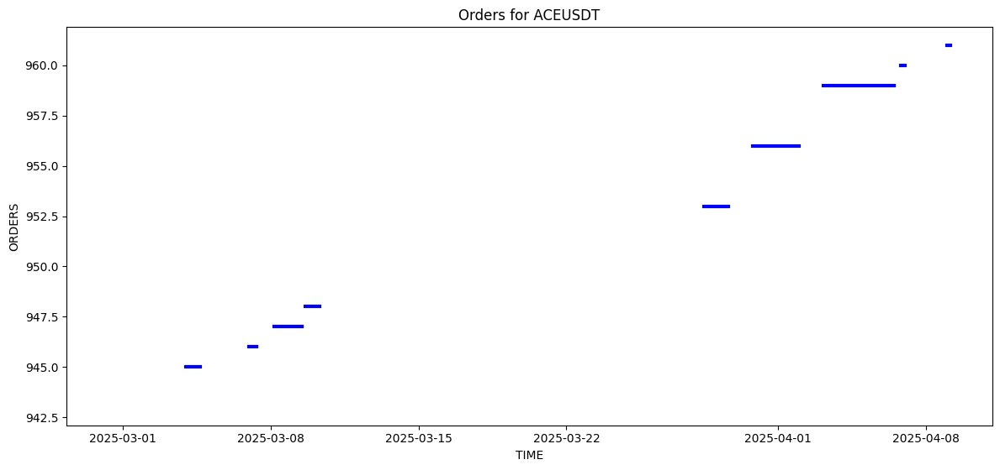

In [ ]:
import matplotlib.pyplot as plt

def plot_trades_for_symbol(symbol):
    symbol_df = trade_log_df[trade_log_df['symbol'] == symbol]
    fig, ax = plt.subplots(figsize=(12, len(symbol_df) * 0.3))

    for i, row in symbol_df.iterrows():
        ax.plot([row['EntryTime'], row['ExitTime']], [i, i], color='blue', lw=3)

    ax.set_title(f"Orders for {symbol}")
    ax.set_xlabel("TIME")
    ax.set_ylabel("ORDERS")
    plt.tight_layout()
    plt.show()

plot_trades_for_symbol("ACEUSDT")


#### Bayes

In [ ]:
import pandas as pd
import scipy.stats as stats


# Функция для байесовского доверительного интервала на основе Beta распределения
def bayesian_ci(successes, trials, confidence=0.95):
    alpha_prior = 1  # неинформативный prior (Beta(1,1))
    beta_prior = 1

    alpha_post = alpha_prior + successes
    beta_post = beta_prior + (trials - successes)

    lower_bound = stats.beta.ppf((1 - confidence) / 2, alpha_post, beta_post)
    upper_bound = stats.beta.ppf(1 - (1 - confidence) / 2, alpha_post, beta_post)
    return lower_bound, upper_bound

# Вычисляем байесовские интервалы
bayes_results = []

for _, row in results_df.iterrows():
    # Convert 'Total Trades' and 'Win Rate' to numeric, handling errors
    total_trades = pd.to_numeric(row['Total Trades'], errors='coerce')
    win_rate = pd.to_numeric(row['Win Rate'], errors='coerce') / 100
    symbol = row['symbol']

    # Skip rows with NaN values
    if pd.isna(total_trades) or pd.isna(win_rate):
        print(f"Skipping symbol {symbol} due to NaN values in Total Trades or Win Rate")
        continue

    wins = round(total_trades * win_rate)

    lower, upper = bayesian_ci(wins, total_trades)

    bayes_results.append({
        'symbol': symbol,
        'Total Trades': total_trades,
        'Win Rate [%]': round(win_rate * 100, 2),
        'CI Lower [%]': round(lower * 100, 2),
        'CI Upper [%]': round(upper * 100, 2),
    })

bayes_df = pd.DataFrame(bayes_results)
bayes_df

,symbol,Total Trades,Win Rate [%],CI Lower [%],CI Upper [%]
0,SCUSDT,23,26.09,12.62,46.71
1,TNSRUSDT,23,30.43,15.63,51.09
2,VANAUSDT,23,21.74,9.77,42.15
3,MEMEUSDT,22,27.27,13.21,48.41
4,KNCUSDT,24,20.83,9.36,40.70
...,...,...,...,...,...
150,VICUSDT,12,25.00,9.09,53.81
151,BMTUSDT,10,30.00,10.93,60.97
152,NILUSDT,3,33.33,6.76,80.59
153,PAXGUSDT,11,27.27,9.92,57.19


In [ ]:
# Твои параметры стратегии

take_profit_multiplier = 2.25
stop_loss_multiplier = 0.45


loss_to_cover = stop_loss_multiplier / take_profit_multiplier
reward_to_risk = take_profit_multiplier / stop_loss_multiplier


# Вычисляем минимальный винрейт для безубыточности
breakeven_win_rate = stop_loss_multiplier / (stop_loss_multiplier + take_profit_multiplier)
breakeven_win_rate_percent = breakeven_win_rate * 100

print(f" tp: {take_profit_multiplier}")
print(f" sl: {stop_loss_multiplier}")
print(f"Breakeven Win Rate: {breakeven_win_rate_percent:.2f}%")

print(f"Нужно {loss_to_cover:.2f} профитных сделок, чтобы покрыть одну убыточную.")
print(f"Одна профитная сделка покрывает примерно {reward_to_risk:.2f} убыточных.")

 tp: 2.25
 sl: 0.45
Breakeven Win Rate: 16.67%
Нужно 0.20 профитных сделок, чтобы покрыть одну убыточную.
Одна профитная сделка покрывает примерно 5.00 убыточных.


In [ ]:
threshold = 17  # Минимальный винрейт для безубыточности

# Фильтруем монеты с надёжным нижним винрейтом
profitable_df = bayes_df[bayes_df["CI Lower [%]"] >= threshold].copy()


profitable_df = profitable_df.sort_values(by="CI Lower [%]", ascending=False).reset_index(drop=True)

display(profitable_df)

,symbol,Total Trades,Win Rate [%],CI Lower [%],CI Upper [%]
0,COOKIEUSDT,12,50.00,25.13,74.87
1,THEUSDT,12,50.00,25.13,74.87
2,MEUSDT,20,40.00,21.82,61.56
3,CHESSUSDT,14,42.86,21.27,67.71
4,TRBUSDT,15,40.00,19.75,64.57
5,ZROUSDT,22,36.36,19.71,57.27
6,NEOUSDT,22,36.36,19.71,57.27
7,JASMYUSDT,22,36.36,19.71,57.27
8,IOUSDT,19,36.84,19.12,59.22
9,GLMRUSDT,27,33.33,18.64,52.35


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import beta
import math


# Function for Bayesian intervals
def bayesian_confidence_interval(wins, total, alpha_prior=1, beta_prior=1, conf=0.95):
    a = wins + alpha_prior
    b = total - wins + beta_prior
    lower = beta.ppf((1 - conf) / 2, a, b)
    upper = beta.ppf(1 - (1 - conf) / 2, a, b)
    mean = a / (a + b)
    return mean * 100, lower * 100, upper * 100

# Add to DataFrame
results_df["Bayes Win Rate [%]"] = np.nan  # Initialize with NaN
results_df["CI Lower [%]"] = np.nan
results_df["CI Upper [%]"] = np.nan

for index, row in results_df.iterrows():  # Iterate with index
    # Convert 'Total Trades' and 'Win Rate' to numeric, handling errors
    total_trades = pd.to_numeric(row['Total Trades'], errors='coerce')
    win_rate = pd.to_numeric(row['Win Rate'], errors='coerce') / 100

    # Skip rows with NaN values
    if pd.isna(total_trades) or pd.isna(win_rate):
        print(f"Skipping symbol {row['symbol']} due to NaN values in Total Trades or Win Rate")
        continue

    wins = int(total_trades * win_rate)
    total = int(total_trades)
    mean, lower, upper = bayesian_confidence_interval(wins, total)

    # Assign values using index
    results_df.loc[index, "Bayes Win Rate [%]"] = mean
    results_df.loc[index, "CI Lower [%]"] = lower
    results_df.loc[index, "CI Upper [%]"] = upper

# === Plotting graphs by pages ===
symbols_per_plot = 30
num_chunks = math.ceil(len(results_df) / symbols_per_plot)

for i in range(num_chunks):
    chunk = results_df.iloc[i * symbols_per_plot:(i + 1) * symbols_per_plot]

    plt.figure(figsize=(14, 6))

    yerr = [
        chunk["Bayes Win Rate [%]"] - chunk["CI Lower [%]"],
        chunk["CI Upper [%]"] - chunk["Bayes Win Rate [%]"]
    ]

    plt.errorbar(
        chunk["symbol"],
        chunk["Bayes Win Rate [%]"],
        yerr=yerr,
        fmt='o',
        capsize=5,
        label="Bayesian Win Rate ± 95% CI",
        color='royalblue',
        ecolor='gray',
        elinewidth=2
    )

    plt.axhline(50, linestyle='--', color='red', label='Random baseline (50%)')
    plt.title(f"Bayesian Estimated Win Rates (Symbols {i * symbols_per_plot + 1}–{min((i + 1) * symbols_per_plot, len(results_df))})")
    plt.ylabel("Win Rate [%]")
    plt.xlabel("Symbol")
    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()

In [ ]:
# Сортировка по Bayesian Win Rate в порядке убывания
sorted_df = results_df.sort_values(by="Bayes Win Rate [%]", ascending=False).reset_index(drop=True)

# Просмотр топа
sorted_df.head(10)  # Показывает топ-10, можешь изменить число

# Если хочешь увидеть весь датафрейм:
pd.set_option('display.max_rows', None)
display(sorted_df)

### Backtest tradingview BTC filter Two Takes

In [ ]:
# !pip install vectorbt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 527.6/527.6 kB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.7/295.7 kB 16.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.4/119.4 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 29.0 MB/s eta 0:00:00


In [ ]:
# url = 'https://anaconda.org/conda-forge/libta-lib/0.4.0/download/linux-64/libta-lib-0.4.0-h166bdaf_1.tar.bz2'
# !curl -L $url | tar xj -C /usr/lib/x86_64-linux-gnu/ lib --strip-components=1
# !pip install conda-package-handling
# !wget https://anaconda.org/conda-forge/ta-lib/0.5.1/download/linux-64/ta-lib-0.5.1-py311h9ecbd09_0.conda
# !cph x ta-lib-0.5.1-py311h9ecbd09_0.conda
# !mv ./ta-lib-0.5.1-py311h9ecbd09_0/lib/python3.11/site-packages/talib /usr/local/lib/python3.11/dist-packages/
# import talib

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  4051    0  4051    0     0  14229      0 --:--:-- --:--:-- --:--:-- 14264
100  517k  100  517k    0     0   606k      0 --:--:-- --:--:-- --:--:-- 2002k
--2025-04-13 01:52:29--  https://anaconda.org/conda-forge/ta-lib/0.5.1/download/linux-64/ta-lib-0.5.1-py311h9ecbd09_0.conda
Resolving anaconda.org (anaconda.org)... 104.19.145.37, 104.19.144.37, 2606:4700::6813:9125, ...
Connecting to anaconda.org (anaconda.org)|104.19.145.37|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://binstar-cio-packages-prod.s3.amazonaws.com/5f738b4b78d4370a69f82984/673b62920c609ff6945bb24d?response-content-disposition=attachment%3B%20filename%3D%22ta-lib-0.5.1-py311h9ecbd09_0.conda%22%3B%20filename%2A%3DUTF-8%27%27ta-lib-0.5.1-py311h9ecbd09_0.conda&response-content-type=application%2Foctet-stream&X-Amz-Algorithm=

In [ ]:
# import pandas as pd
# import numpy as np
# import vectorbt as vbt

# def apply_signal_strategy_with_tp2(data, signals_df, symbol, interval,
#                                    sl_mult=0.45, tp_mult=2.5, tp1_ratio=0.7):
#     # Приводим индексы в нужный интервал
#     # data['Date'] = pd.to_datetime(data['Date']).dt.floor(interval)
#     # data.set_index("Date", inplace=True)

#     # signals_df["utc_time"] = pd.to_datetime(signals_df["utc_time"]).dt.floor(interval)

#     # Цена и ATR
#     price = data['Close']
#     high = data['High']
#     low = data['Low']
#     close = data['Close']
#     atr = vbt.IndicatorFactory.from_talib('ATR').run(high, low, close, timeperiod=14).real

#     # BTC сигналы из того же файла
#     btc_signals_df = signals_df[signals_df["symbol"] == "BTCUSDT"]

#     # Фильтруем сигналы по символу
#     symbol_signals = signals_df[signals_df["symbol"] == symbol]

#     # Пустые серии для сигналов и уровней
#     entries_long = pd.Series(False, index=price.index)
#     entries_short = pd.Series(False, index=price.index)
#     sl_array = pd.Series(np.nan, index=price.index)
#     tp1_array = pd.Series(np.nan, index=price.index)
#     tp2_array = pd.Series(np.nan, index=price.index)

#     for i, row in symbol_signals.iterrows():
#         utc_time = row["utc_time"]
#         tf = row["timeframe"]
#         sig = row["signal"]

#         if utc_time not in price.index:
#             continue

#         btc_row = btc_signals_df[(btc_signals_df["utc_time"] == utc_time) & (btc_signals_df["timeframe"] == tf)]
#         btc_sig = btc_row["signal"].values[0] if not btc_row.empty else None

#         idx = price.index.get_loc(utc_time)
#         price_now = price.iloc[idx]
#         atr_now = atr.iloc[idx]

#         if sig == "STRONG_BUY" and btc_sig in ["BUY", "STRONG_BUY", "NEUTRAL"]:
#             entries_long.iloc[idx] = True
#             sl_array.iloc[idx] = price_now - sl_mult * atr_now
#             tp1_array.iloc[idx] = price_now + tp1_ratio * tp_mult * atr_now
#             tp2_array.iloc[idx] = price_now + tp_mult * atr_now

#         elif sig == "STRONG_SELL" and btc_sig in ["SELL", "STRONG_SELL", "NEUTRAL"]:
#             entries_short.iloc[idx] = True
#             sl_array.iloc[idx] = price_now + sl_mult * atr_now
#             tp1_array.iloc[idx] = price_now - tp1_ratio * tp_mult * atr_now
#             tp2_array.iloc[idx] = price_now - tp_mult * atr_now

#     # Сигналы на вход
#     entries = entries_long | entries_short
#     directions = np.where(entries_long, 1, np.where(entries_short, -1, 0))

#     # Заполнение пропущенных значений (по желанию)
#     sl_array.ffill(inplace=True)
#     tp2_array.ffill(inplace=True)

#     # Создание портфеля
#     portfolio = vbt.Portfolio.from_signals(
#         close=price,
#         entries=entries,
#         exits=None,
#         direction=directions,
#         sl_stop=sl_array,
#         tp_stop=tp2_array,
#         freq=interval,
#         init_cash=1_000_000,
#     )

#     return portfolio

# symbol = "MEMEUSDT"
# portfolio = apply_signal_strategy_with_tp2(klines_df, signals_df, symbol, interval)
# portfolio.stats()

,0
Start,2025-02-21 20:00:00+00:00
End,2025-04-11 16:00:00+00:00
Period,15712 days 08:00:00
Start Value,1000000.0
End Value,-13.140966
Total Return [%],-100.001314
Benchmark Return [%],-99.998932
Max Gross Exposure [%],100.0
Total Fees Paid,0.0
Max Drawdown [%],15224.562219


In [ ]:
import pandas as pd
import numpy as np
import pandas_ta as ta
from backtesting import Backtest, Strategy


strategy = SignalStrategyBTCTwoTakes
results_list = []
all_trade_logs = []  # Место для сохранения всех сделок

for symbol in successful_signals['symbol'].unique():
# for symbol in successful_symbols:
# for symbol in klines_df["Symbol"].unique():
    print(f"🔍 Testing {symbol}...")

    # Фильтрация данных по текущему символу
    data = klines_df[klines_df["Symbol"] == symbol].copy()

    # Check if data is empty before proceeding
    if data.empty:
        print(f"⚠️ Data for symbol {symbol} is empty, skipping...")
        continue  # Skip to the next symbol if data is empty

    data['Date'] = pd.to_datetime(data['Date'])
    data.set_index("Date", inplace=True)

    if not isinstance(data.index, pd.DatetimeIndex):
        data.index = pd.to_datetime(data.index)

    data.drop(columns=["Symbol"], inplace=True)


    symbol_signals = signals_df[(signals_df["symbol"] == symbol) & (signals_df["timeframe"] == f"{interval}")]
    unique_signals_count = symbol_signals["utc_time"].nunique()

    if symbol_signals.empty:
        print(f"⚠️ No signals for {symbol}, skipping...")
        continue

    print(f"📊 Found {len(symbol_signals)} signals ({unique_signals_count} unique) for {symbol}")


    strategy.signals_df = signals_df
    strategy.symbol = symbol


    bt = Backtest(data, strategy, cash=1_000_000, commission=0.0005)
    stats = bt.run()

    long_count = 0
    short_count = 0
    long_return = 0
    short_return = 0
    long_winrate = 0
    short_winrate = 0

    if stats["_trades"] is not None and not stats["_trades"].empty:
        trade_log = stats["_trades"].copy()

        if "ReturnPct" in trade_log.columns:
            trade_log["Win"] = (trade_log["ReturnPct"] > 0).astype(int)

            for idx, trade in trade_log.iterrows():
                all_trade_logs.append({
                    "symbol": symbol,
                    "EntryBar": trade["EntryBar"],
                    "ExitBar": trade["ExitBar"],
                    "EntryPrice": trade["EntryPrice"],
                    "ExitPrice": trade["ExitPrice"],
                    "Size": trade["Size"],
                    "PnL": trade["PnL"],
                    "ReturnPct": trade["ReturnPct"],
                    "EntryTime": trade["EntryTime"],
                    "ExitTime": trade["ExitTime"],
                    "Duration": trade["Duration"]
                })


            longs = trade_log[trade_log["Size"] > 0]
            shorts = trade_log[trade_log["Size"] < 0]

            long_count = len(longs)
            short_count = len(shorts)

            long_return = longs["ReturnPct"].sum() if not longs.empty else 0
            short_return = shorts["ReturnPct"].sum() if not shorts.empty else 0

            long_winrate = longs["Win"].mean() * 100 if not longs.empty else 0
            short_winrate = shorts["Win"].mean() * 100 if not shorts.empty else 0
        else:
            print(f"⚠️ Warning: 'ReturnPct' column not found in trades for {symbol}")



    results = {
        "symbol": symbol,
        "timeframe": interval,
        "start_date": data.index.min(),
        "end_date": data.index.max(),
        'stop_loss_multiplier': strategy.stop_loss_multiplier,
        'take_profit_multiplier': strategy.take_profit_multiplier,
        "Total Trades": stats["# Trades"],
        "Win Rate": stats["Win Rate [%]"],
        "return [%]": stats["Return [%]"],
        "long_trades": long_count,
        "short_trades": short_count,
        "long_return [%]": long_return,
        "short_return [%]": short_return,
        "long_win_rate [%]": long_winrate,
        "short_win_rate [%]": short_winrate,
    }
    results_list.append(results)

    print(f"✅ {symbol} — Return: {results['return [%]']:.2f}%, Trades: {results['Total Trades']}, "
          f"Win Rate: {results['Win Rate']:.2f}%, Longs: {long_count}, Shorts: {short_count}, "
          f"Long Return: {long_return:.2f}%, Short Return: {short_return:.2f}%, "
          f"Long Win Rate: {long_winrate:.2f}%, Short Win Rate: {short_winrate:.2f}%\n")


results_df = pd.DataFrame(results_list)
results_df.to_csv(f"backtest_results_{interval}_2takes.csv", index=False)


if all_trade_logs:
    trades_df = pd.DataFrame(all_trade_logs)
    trades_df.to_csv(f"all_trades_df_{interval}_2takes.csv", index=False)


print("Backtest completed! Results saved in backtest_results.csv")
print("All trade log saved in all_trade_log.csv")

display(results_df)

🔍 Testing SCUSDT...
📊 Found 53 signals (53 unique) for SCUSDT


Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT SCUSDT | 2025-02-26 08:00:00+00:00 | Price: 0.003709 | SL: 0.003757155295786506, TP1: 0.0034414705789638576, TP2: 0.003173941157927715
✅ TP1 hit 0.0034414705789638576! Moved SL to BE: 0.00367191
🛑 SL after TP1 (BE+)! SL: 0.00367191
🚨 SHORT SCUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.003498 | SL: 0.0035495045312365974, TP1: 0.0032118637153522346, TP2: 0.00292572743070447
🛑 SL before TP1! SL: 0.0035495045312365974
🚨 SHORT SCUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.003511 | SL: 0.003559033031397235, TP1: 0.003244149825570914, TP2: 0.0029772996511418285
✅ TP1 hit 0.003244149825570914! Moved SL to BE: 0.00347589
🛑 SL after TP1 (BE+)! SL: 0.0034758899999999997
🚀 LONG SCUSDT | 2025-03-25 12:00:00+00:00 | Price: 0.003464 | SL: 0.0034334397564605777, TP1: 0.0036337791307745693, TP2: 0.0038035582615491385
🛑 SL before TP1! SL: 0.0034334397564605777
🚨 SHORT SCUSDT | 2025-03-28 08:00:00+00:00 | Price: 0.003309 | SL: 0.0033366720233809336, TP1: 0.0031552665367725894, TP2: 0.003001533073

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚀 LONG TNSRUSDT | 2025-03-01 20:00:00+00:00 | Price: 0.5242 | SL: 0.5140055912438298, TP1: 0.5808356042009456, TP2: 0.6374712084018913
🛑 SL before TP1! SL: 0.5140055912438298
🚀 LONG TNSRUSDT | 2025-03-02 16:00:00+00:00 | Price: 0.5355 | SL: 0.5252976584911707, TP1: 0.5921796750490512, TP2: 0.6488593500981026
🛑 SL before TP1! SL: 0.5252976584911707
🚨 SHORT TNSRUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.4134 | SL: 0.4242543881913701, TP1: 0.35309784338127703, TP2: 0.292795686762554
🛑 SL before TP1! SL: 0.4242543881913701
🚨 SHORT TNSRUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.4305 | SL: 0.4403381007640771, TP1: 0.3758438846440162, TP2: 0.32118776928803244
🛑 SL before TP1! SL: 0.4403381007640771
🚨 SHORT TNSRUSDT | 2025-03-10 04:00:00+00:00 | Price: 0.3141 | SL: 0.3249815389692789, TP1: 0.2536470057262282, TP2: 0.19319401145245646
✅ TP1 hit 0.2536470057262282! Moved SL to BE: 0.31095900
🎯 TP2 hit 0.19319401145245646! Closing remaining.
🚨 SHORT TNSRUSDT | 2025-03-26 20:00:00+00:00 | Price:

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT VANAUSDT | 2025-03-03 20:00:00+00:00 | Price: 6.574 | SL: 6.82553576580538, TP1: 5.176579078858994, TP2: 3.7791581577179896
✅ TP1 hit 5.176579078858994! Moved SL to BE: 6.50826000
🛑 SL after TP1 (BE+)! SL: 6.50826
🚀 LONG VANAUSDT | 2025-03-17 04:00:00+00:00 | Price: 6.956 | SL: 6.800619309684544, TP1: 7.819226057308092, TP2: 8.682452114616183
🛑 SL before TP1! SL: 6.800619309684544
🚨 SHORT VANAUSDT | 2025-03-19 08:00:00+00:00 | Price: 5.693 | SL: 5.816699640516351, TP1: 5.0057797749091595, TP2: 4.318559549818319
🛑 SL before TP1! SL: 5.816699640516351
🚀 LONG VANAUSDT | 2025-03-20 16:00:00+00:00 | Price: 6.374 | SL: 6.2405452723782195, TP1: 7.115415153454332, TP2: 7.856830306908664
✅ TP1 hit 7.115415153454332! Moved SL to BE: 6.43774000
🎯 TP2 hit 7.856830306908664! Closing remaining.
🚀 LONG VANAUSDT | 2025-03-23 04:00:00+00:00 | Price: 7.693 | SL: 7.434175410648988, TP1: 9.130914385283397, TP2: 10.568828770566792
🛑 SL before TP1! SL: 7.434175410648988
🚀 LONG VANAUSDT | 2025-03-27 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT MEMEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.00351 | SL: 0.003589295396184889, TP1: 0.003069470021195063, TP2: 0.002628940042390126
🛑 SL before TP1! SL: 0.003589295396184889
🚨 SHORT MEMEUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.00329 | SL: 0.003371961868065169, TP1: 0.0028346562885268396, TP2: 0.0023793125770536793
✅ TP1 hit 0.0028346562885268396! Moved SL to BE: 0.00325710
🎯 TP2 hit 0.0023793125770536793! Closing remaining.
🚨 SHORT MEMEUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.002416 | SL: 0.002480734756014232, TP1: 0.0020563624665875997, TP2: 0.001696724933175199
🛑 SL before TP1! SL: 0.002480734756014232
🚨 SHORT MEMEUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.002315 | SL: 0.0023532689066998644, TP1: 0.0021023949627785293, TP2: 0.001889789925557059
🛑 SL before TP1! SL: 0.0023532689066998644
🚨 SHORT MEMEUSDT | 2025-03-18 12:00:00+00:00 | Price: 0.002333 | SL: 0.0023703466371847335, TP1: 0.002125518682307035, TP2: 0.00191803736461407
🛑 SL before TP1! SL: 0.002370346637184

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT KNCUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.3695 | SL: 0.3749724694846275, TP1: 0.33909739175206943, TP2: 0.30869478350413887
🛑 SL before TP1! SL: 0.3749724694846275
🚀 LONG KNCUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.4228 | SL: 0.4180583951945554, TP1: 0.44914224891913673, TP2: 0.47548449783827346
🛑 SL before TP1! SL: 0.4180583951945554
🚨 SHORT KNCUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.365 | SL: 0.37082724819783236, TP1: 0.33262639890093126, TP2: 0.30025279780186254
🛑 SL before TP1! SL: 0.37082724819783236
🚨 SHORT KNCUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.3607 | SL: 0.365578871918244, TP1: 0.3335951560097557, TP2: 0.3064903120195114
✅ TP1 hit 0.3335951560097557! Moved SL to BE: 0.35709300
🛑 SL after TP1 (BE+)! SL: 0.357093
🚨 SHORT KNCUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.3535 | SL: 0.3574664890584391, TP1: 0.33146394967533843, TP2: 0.3094278993506768
🛑 SL before TP1! SL: 0.3574664890584391
🚀 LONG KNCUSDT | 2025-03-24 08:00:00+00:00 | Price: 0.3898 | SL: 0.

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT TURBOUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.003056 | SL: 0.003123991862077605, TP1: 0.002678267432902194, TP2: 0.002300534865804388
🛑 SL before TP1! SL: 0.003123991862077605
🚨 SHORT TURBOUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.003048 | SL: 0.003123944040941356, TP1: 0.0026260886614369126, TP2: 0.002204177322873825
✅ TP1 hit 0.0026260886614369126! Moved SL to BE: 0.00301752
🎯 TP2 hit 0.002204177322873825! Closing remaining.
🚨 SHORT TURBOUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.00208 | SL: 0.002138262593612031, TP1: 0.001756318924377602, TP2: 0.0014326378487552042
🛑 SL before TP1! SL: 0.002138262593612031
🚨 SHORT TURBOUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.002052 | SL: 0.0021161102963742854, TP1: 0.0016958316868095264, TP2: 0.0013396633736190528
🛑 SL before TP1! SL: 0.0021161102963742854
🚨 SHORT TURBOUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.002077 | SL: 0.002136266789635126, TP1: 0.0017477400575826333, TP2: 0.001418480115165267
🛑 SL before TP1! SL: 0.002136266

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT BIOUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.1067 | SL: 0.10995392100014346, TP1: 0.08862266111031412, TP2: 0.07054532222062823
🛑 SL before TP1! SL: 0.10995392100014346
🚨 SHORT BIOUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0993 | SL: 0.10165512973656757, TP1: 0.08621594590795799, TP2: 0.07313189181591598
✅ TP1 hit 0.08621594590795799! Moved SL to BE: 0.09830700
🛑 SL after TP1 (BE+)! SL: 0.09830699999999999
🚨 SHORT BIOUSDT | 2025-03-28 08:00:00+00:00 | Price: 0.0877 | SL: 0.08933946447868522, TP1: 0.07859186400730431, TP2: 0.06948372801460861
🛑 SL before TP1! SL: 0.08933946447868522
🚨 SHORT BIOUSDT | 2025-03-31 00:00:00+00:00 | Price: 0.0767 | SL: 0.07810956646988464, TP1: 0.06886907516730759, TP2: 0.06103815033461516
✅ TP1 hit 0.06886907516730759! Moved SL to BE: 0.07593300
🎯 TP2 hit 0.06103815033461516! Closing remaining.
🚨 SHORT BIOUSDT | 2025-04-06 20:00:00+00:00 | Price: 0.0544 | SL: 0.055580609116589796, TP1: 0.04784106046339001, TP2: 0.041282120926780026
🛑 SL before TP

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT NOTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.002622 | SL: 0.0026791074650091467, TP1: 0.002304736305504742, TP2: 0.001987472611009484
🛑 SL before TP1! SL: 0.0026791074650091467
🚨 SHORT NOTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.002668 | SL: 0.002730265855195715, TP1: 0.0023220785822460266, TP2: 0.001976157164492053
🛑 SL before TP1! SL: 0.002730265855195715
🚨 SHORT NOTUSDT | 2025-03-05 08:00:00+00:00 | Price: 0.002568 | SL: 0.002637650658661254, TP1: 0.0021810518963263667, TP2: 0.0017941037926527334
🛑 SL before TP1! SL: 0.002637650658661254
🚨 SHORT NOTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.002575 | SL: 0.0026337356133047016, TP1: 0.0022486910371961022, TP2: 0.0019223820743922042
✅ TP1 hit 0.0022486910371961022! Moved SL to BE: 0.00254925
🛑 SL after TP1 (BE+)! SL: 0.00254925
🚀 LONG NOTUSDT | 2025-03-24 16:00:00+00:00 | Price: 0.002645 | SL: 0.002608953116525058, TP1: 0.002845260463749678, TP2: 0.003045520927499356
🛑 SL before TP1! SL: 0.002608953116525058
🚀 LONG NOTUSD

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT CGPTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1233 | SL: 0.12608480771375152, TP1: 0.10782884603471374, TP2: 0.09235769206942746
🛑 SL before TP1! SL: 0.12608480771375152
🚨 SHORT CGPTUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.1294 | SL: 0.1316132929378009, TP1: 0.11710392812332814, TP2: 0.10480785624665628
🛑 SL before TP1! SL: 0.1316132929378009
🚨 SHORT CGPTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1204 | SL: 0.12325195813437133, TP1: 0.10455578814238145, TP2: 0.08871157628476292
✅ TP1 hit 0.10455578814238145! Moved SL to BE: 0.11919600
🎯 TP2 hit 0.08871157628476292! Closing remaining.
🚨 SHORT CGPTUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.0908 | SL: 0.09281785126444754, TP1: 0.07958971519751368, TP2: 0.06837943039502734
🛑 SL before TP1! SL: 0.09281785126444754
🚨 SHORT CGPTUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.0953 | SL: 0.09650808094135613, TP1: 0.08858843921468815, TP2: 0.0818768784293763
🛑 SL before TP1! SL: 0.09650808094135613
🚨 SHORT CGPTUSDT | 2025-03-18 16:00:

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT UMAUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.42 | SL: 1.4485945335997865, TP1: 1.2611414800011853, TP2: 1.1022829600023705
🛑 SL before TP1! SL: 1.4485945335997865
🚨 SHORT UMAUSDT | 2025-03-03 16:00:00+00:00 | Price: 1.356 | SL: 1.3820281620781392, TP1: 1.211399099565894, TP2: 1.066798199131788
✅ TP1 hit 1.211399099565894! Moved SL to BE: 1.34244000
🛑 SL after TP1 (BE+)! SL: 1.34244
🚀 LONG UMAUSDT | 2025-03-26 08:00:00+00:00 | Price: 1.43 | SL: 1.4095937487360708, TP1: 1.5433680625773838, TP2: 1.6567361251547674
🛑 SL before TP1! SL: 1.4095937487360708
🚨 SHORT UMAUSDT | 2025-03-28 08:00:00+00:00 | Price: 1.284 | SL: 1.3040861944029065, TP1: 1.1724100310949646, TP2: 1.0608200621899289
✅ TP1 hit 1.1724100310949646! Moved SL to BE: 1.27116000
🎯 TP2 hit 1.0608200621899289! Closing remaining.
🚨 SHORT UMAUSDT | 2025-04-06 16:00:00+00:00 | Price: 0.998 | SL: 1.0130522691068284, TP1: 0.9143762827398415, TP2: 0.830752565479683
🛑 SL before TP1! SL: 1.0130522691068284
🚨 SHORT UMAUSDT | 20

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT LISTAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2211 | SL: 0.22580400194627331, TP1: 0.1949666558540371, TP2: 0.1688333117080742
🛑 SL before TP1! SL: 0.22580400194627331
🚨 SHORT LISTAUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.2125 | SL: 0.2169128514640054, TP1: 0.18798415853330322, TP2: 0.16346831706660644
✅ TP1 hit 0.18798415853330322! Moved SL to BE: 0.21037500
🎯 TP2 hit 0.16346831706660644! Closing remaining.
🚨 SHORT LISTAUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.1603 | SL: 0.16333359379404844, TP1: 0.14344670114417532, TP2: 0.12659340228835064
🛑 SL before TP1! SL: 0.16333359379404844
🚨 SHORT LISTAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.164 | SL: 0.16781659857060804, TP1: 0.1427966746077332, TP2: 0.12159334921546641
🛑 SL before TP1! SL: 0.16781659857060804
🚨 SHORT LISTAUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.1665 | SL: 0.16961247544406735, TP1: 0.1492084697551815, TP2: 0.131916939510363
🛑 SL before TP1! SL: 0.16961247544406735
🚨 SHORT LISTAUSDT | 2025-03-19 08:00

Backtest.run:   0%|          | 0/205 [00:00<?, ?bar/s]

🚨 SHORT LINAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.002139 | SL: 0.002179965050072882, TP1: 0.0019114163884839876, TP2: 0.0016838327769679753
✅ TP1 hit 0.0019114163884839876! Moved SL to BE: 0.00211761
🛑 SL after TP1 (BE+)! SL: 0.00211761
🚨 SHORT LINAUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.002037 | SL: 0.0020704923298446145, TP1: 0.0018509315008632548, TP2: 0.0016648630017265095
✅ TP1 hit 0.0018509315008632548! Moved SL to BE: 0.00201663
🎯 TP2 hit 0.0016648630017265095! Closing remaining.
🚨 SHORT LINAUSDT | 2025-03-18 08:00:00+00:00 | Price: 0.001664 | SL: 0.0016890846849395508, TP1: 0.001524640639224717, TP2: 0.0013852812784494344
✅ TP1 hit 0.001524640639224717! Moved SL to BE: 0.00164736
🛑 SL after TP1 (BE+)! SL: 0.0016473599999999998
🚨 SHORT LINAUSDT | 2025-03-21 04:00:00+00:00 | Price: 0.001389 | SL: 0.0014548885742668128, TP1: 0.0010229523651843733, TP2: 0.0006569047303687464
✅ TP1 hit 0.0010229523651843733! Moved SL to BE: 0.00137511
🎯 TP2 hit 0.0006569047303687464! Closi

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚀 LONG SOLVUSDT | 2025-03-02 16:00:00+00:00 | Price: 0.0429 | SL: 0.041729441481845396, TP1: 0.049403102878636695, TP2: 0.05590620575727338
🛑 SL before TP1! SL: 0.041729441481845396
🚀 LONG SOLVUSDT | 2025-03-05 12:00:00+00:00 | Price: 0.041 | SL: 0.03968220113975844, TP1: 0.04832110477911977, TP2: 0.05564220955823955
🛑 SL before TP1! SL: 0.03968220113975844
🚀 LONG SOLVUSDT | 2025-03-07 12:00:00+00:00 | Price: 0.04614 | SL: 0.044896960936486985, TP1: 0.0530457725750723, TP2: 0.0599515451501446
🛑 SL before TP1! SL: 0.044896960936486985
🚨 SHORT SOLVUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.03735 | SL: 0.03809347309142906, TP1: 0.03321959393650524, TP2: 0.029089187873010482
🛑 SL before TP1! SL: 0.03809347309142906
🚨 SHORT SOLVUSDT | 2025-03-20 16:00:00+00:00 | Price: 0.03711 | SL: 0.03776217337752772, TP1: 0.03348681456929043, TP2: 0.029863629138580865
✅ TP1 hit 0.03348681456929043! Moved SL to BE: 0.03673890
🎯 TP2 hit 0.029863629138580865! Closing remaining.
🚨 SHORT SOLVUSDT | 2025-03-3

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT MEUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.296 | SL: 1.3212514310354224, TP1: 1.155714272025431, TP2: 1.0154285440508617
🛑 SL before TP1! SL: 1.3212514310354224
🚨 SHORT MEUSDT | 2025-03-03 16:00:00+00:00 | Price: 1.194 | SL: 1.2169025105175955, TP1: 1.0667638304578029, TP2: 0.9395276609156058
✅ TP1 hit 1.0667638304578029! Moved SL to BE: 1.18206000
🛑 SL after TP1 (BE+)! SL: 1.1820599999999999
🚀 LONG MEUSDT | 2025-03-21 04:00:00+00:00 | Price: 1.175 | SL: 1.1581544621538638, TP1: 1.2685863213674242, TP2: 1.3621726427348486
🛑 SL before TP1! SL: 1.1581544621538638
🚀 LONG MEUSDT | 2025-03-25 04:00:00+00:00 | Price: 1.229 | SL: 1.2145659424683901, TP1: 1.309189208508944, TP2: 1.389378417017888
🛑 SL before TP1! SL: 1.2145659424683901
🚨 SHORT MEUSDT | 2025-03-28 08:00:00+00:00 | Price: 1.149 | SL: 1.1656385539611902, TP1: 1.0565635891044993, TP2: 0.9641271782089987
✅ TP1 hit 1.0565635891044993! Moved SL to BE: 1.13751000
🎯 TP2 hit 0.9641271782089987! Closing remaining.
🚨 SHORT MEUS

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT MOVRUSDT | 2025-02-28 04:00:00+00:00 | Price: 6.856 | SL: 6.987835316686075, TP1: 6.123581573966248, TP2: 5.391163147932495
🛑 SL before TP1! SL: 6.987835316686075
🚨 SHORT MOVRUSDT | 2025-03-03 16:00:00+00:00 | Price: 6.601 | SL: 6.727235547170793, TP1: 5.899691404606704, TP2: 5.19838280921341
🛑 SL before TP1! SL: 6.727235547170793
🚨 SHORT MOVRUSDT | 2025-03-06 20:00:00+00:00 | Price: 6.577 | SL: 6.699376268099275, TP1: 5.897131843892916, TP2: 5.217263687785832
🛑 SL before TP1! SL: 6.699376268099275
🚨 SHORT MOVRUSDT | 2025-03-08 00:00:00+00:00 | Price: 6.581 | SL: 6.7007477831871105, TP1: 5.9157345378493895, TP2: 5.2504690756987795
✅ TP1 hit 5.9157345378493895! Moved SL to BE: 6.51519000
🎯 TP2 hit 5.2504690756987795! Closing remaining.
🚨 SHORT MOVRUSDT | 2025-03-11 04:00:00+00:00 | Price: 5.303 | SL: 5.424789975099302, TP1: 4.626389027226098, TP2: 3.9497780544521977
🛑 SL before TP1! SL: 5.424789975099302
🚀 LONG MOVRUSDT | 2025-03-24 16:00:00+00:00 | Price: 6.563 | SL: 6.48074230

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ARPAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0321 | SL: 0.03262756475925068, TP1: 0.02916908467082953, TP2: 0.02623816934165906
🛑 SL before TP1! SL: 0.03262756475925068
🚨 SHORT ARPAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0311 | SL: 0.03162894464184011, TP1: 0.02816141865644385, TP2: 0.025222837312887703
✅ TP1 hit 0.02816141865644385! Moved SL to BE: 0.03078900
🛑 SL after TP1 (BE+)! SL: 0.030789
🚀 LONG ARPAUSDT | 2025-03-22 04:00:00+00:00 | Price: 0.02988 | SL: 0.029331941817817377, TP1: 0.03292476767879235, TP2: 0.035969535357584695
🛑 SL before TP1! SL: 0.029331941817817377
🚨 SHORT ARPAUSDT | 2025-03-28 08:00:00+00:00 | Price: 0.02772 | SL: 0.0280428014304789, TP1: 0.025926658719561672, TP2: 0.02413331743912334
✅ TP1 hit 0.025926658719561672! Moved SL to BE: 0.02744280
🎯 TP2 hit 0.02413331743912334! Closing remaining.
🚨 SHORT ARPAUSDT | 2025-04-03 00:00:00+00:00 | Price: 0.02409 | SL: 0.02447461599654602, TP1: 0.021953244463633212, TP2: 0.019816488927266424
✅ TP1 hit 0.0

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT SSVUSDT | 2025-02-28 04:00:00+00:00 | Price: 10.12 | SL: 10.358972031597922, TP1: 8.792377602233763, TP2: 7.464755204467527
🛑 SL before TP1! SL: 10.358972031597922
🚨 SHORT SSVUSDT | 2025-03-02 04:00:00+00:00 | Price: 10.23 | SL: 10.413144395953573, TP1: 9.212531133591263, TP2: 8.195062267182527
🛑 SL before TP1! SL: 10.413144395953573
🚨 SHORT SSVUSDT | 2025-03-03 16:00:00+00:00 | Price: 9.92 | SL: 10.173565153100077, TP1: 8.511304704999572, TP2: 7.102609409999146
✅ TP1 hit 8.511304704999572! Moved SL to BE: 9.82080000
🎯 TP2 hit 7.102609409999146! Closing remaining.
🚨 SHORT SSVUSDT | 2025-03-11 00:00:00+00:00 | Price: 6.85 | SL: 7.043523168340856, TP1: 5.774871286995242, TP2: 4.699742573990484
🛑 SL before TP1! SL: 7.043523168340856
🚨 SHORT SSVUSDT | 2025-03-20 16:00:00+00:00 | Price: 7.74 | SL: 7.862453246377, TP1: 7.059704186794447, TP2: 6.379408373588892
🛑 SL before TP1! SL: 7.862453246377
🚀 LONG SSVUSDT | 2025-03-24 12:00:00+00:00 | Price: 8.29 | SL: 8.192888648994034, TP1: 8.

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ACEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.889 | SL: 0.9056860128788246, TP1: 0.7962999284509747, TP2: 0.7035998569019495
🛑 SL before TP1! SL: 0.9056860128788246
🚀 LONG ACEUSDT | 2025-03-02 20:00:00+00:00 | Price: 1.038 | SL: 1.0227165020909097, TP1: 1.1229083217171691, TP2: 1.2078166434343383
🛑 SL before TP1! SL: 1.0227165020909097
🚨 SHORT ACEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.845 | SL: 0.8637819624414224, TP1: 0.7406557642143199, TP2: 0.6363115284286398
✅ TP1 hit 0.7406557642143199! Moved SL to BE: 0.83655000
🎯 TP2 hit 0.6363115284286398! Closing remaining.
🚨 SHORT ACEUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.625 | SL: 0.6412372816677163, TP1: 0.5347928796237983, TP2: 0.44458575924759663
🛑 SL before TP1! SL: 0.6412372816677163
🚨 SHORT ACEUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.662 | SL: 0.6711455163008581, TP1: 0.6111915761063441, TP2: 0.5603831522126881
🛑 SL before TP1! SL: 0.6711455163008581
🚨 SHORT ACEUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.675 | SL:

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT PEOPLEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.01945 | SL: 0.019873787350070195, TP1: 0.017095625832943356, TP2: 0.014741251665886714
🛑 SL before TP1! SL: 0.019873787350070195
🚀 LONG PEOPLEUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.02352 | SL: 0.02306955697740112, TP1: 0.02602246123666043, TP2: 0.028524922473320866
🛑 SL before TP1! SL: 0.02306955697740112
🚨 SHORT PEOPLEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.01955 | SL: 0.020057432097993145, TP1: 0.01673093278892699, TP2: 0.013911865577853979
✅ TP1 hit 0.01673093278892699! Moved SL to BE: 0.01935450
🎯 TP2 hit 0.013911865577853979! Closing remaining.
🚨 SHORT PEOPLEUSDT | 2025-04-03 00:00:00+00:00 | Price: 0.01345 | SL: 0.013769729059957412, TP1: 0.011673727444681044, TP2: 0.00989745488936209
✅ TP1 hit 0.011673727444681044! Moved SL to BE: 0.01331550
✅ PEOPLEUSDT — Return: 23.01%, Trades: 5, Win Rate: 60.00%, Longs: 1, Shorts: 4, Long Return: -0.05%, Short Return: 0.51%, Long Win Rate: 0.00%, Short Win Rate: 75.00%

🔍 Tes

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT CHRUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.1213 | SL: 0.12334035545596078, TP1: 0.10996469191132903, TP2: 0.09862938382265804
✅ TP1 hit 0.10996469191132903! Moved SL to BE: 0.12008700
🛑 SL after TP1 (BE+)! SL: 0.120087
🚀 LONG CHRUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1318 | SL: 0.12974156817303995, TP1: 0.14323573237200032, TP2: 0.15467146474400068
🛑 SL before TP1! SL: 0.12974156817303995
🚨 SHORT CHRUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1115 | SL: 0.11381429687081765, TP1: 0.09864279516212421, TP2: 0.08578559032424841
🛑 SL before TP1! SL: 0.11381429687081765
🚨 SHORT CHRUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1096 | SL: 0.11158227781806627, TP1: 0.09858734545518735, TP2: 0.0875746909103747
🛑 SL before TP1! SL: 0.11158227781806627
🚨 SHORT CHRUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1082 | SL: 0.11014873706514271, TP1: 0.0973736829714294, TP2: 0.0865473659428588
✅ TP1 hit 0.0973736829714294! Moved SL to BE: 0.10711800
🛑 SL after TP1 (BE+)! SL: 0.107118
🚀 LONG

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT METISUSDT | 2025-02-28 04:00:00+00:00 | Price: 21.32 | SL: 21.870035812278275, TP1: 18.264245487342922, TP2: 15.208490974685848
🛑 SL before TP1! SL: 21.870035812278275
🚨 SHORT METISUSDT | 2025-03-03 20:00:00+00:00 | Price: 20.87 | SL: 21.35331690076116, TP1: 18.184906106882455, TP2: 15.499812213764907
✅ TP1 hit 18.184906106882455! Moved SL to BE: 20.66130000
🎯 TP2 hit 15.499812213764907! Closing remaining.
🚨 SHORT METISUSDT | 2025-03-11 00:00:00+00:00 | Price: 15.4 | SL: 15.792200939443461, TP1: 13.221105891980777, TP2: 11.042211783961552
🛑 SL before TP1! SL: 15.792200939443461
🚨 SHORT METISUSDT | 2025-03-13 08:00:00+00:00 | Price: 16.51 | SL: 16.822095900937153, TP1: 14.776133883682496, TP2: 13.04226776736499
🛑 SL before TP1! SL: 16.822095900937153
🚀 LONG METISUSDT | 2025-03-24 00:00:00+00:00 | Price: 18.52 | SL: 18.35504685257335, TP1: 19.43640637459251, TP2: 20.352812749185023
🛑 SL before TP1! SL: 18.35504685257335
🚀 LONG METISUSDT | 2025-03-26 08:00:00+00:00 | Price: 19.28 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT DYMUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.407 | SL: 0.41577636243234095, TP1: 0.358242430931439, TP2: 0.30948486186287794
🛑 SL before TP1! SL: 0.41577636243234095
🚨 SHORT DYMUSDT | 2025-03-02 04:00:00+00:00 | Price: 0.416 | SL: 0.42341158721909705, TP1: 0.37482451544946066, TP2: 0.33364903089892134
🛑 SL before TP1! SL: 0.42341158721909705
🚨 SHORT DYMUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.366 | SL: 0.37519682256017667, TP1: 0.3149065413323518, TP2: 0.2638130826647036
✅ TP1 hit 0.3149065413323518! Moved SL to BE: 0.36234000
🛑 SL after TP1 (BE+)! SL: 0.36234
🚨 SHORT DYMUSDT | 2025-03-25 04:00:00+00:00 | Price: 0.364 | SL: 0.36991825756993263, TP1: 0.3311207912781519, TP2: 0.2982415825563038
🛑 SL before TP1! SL: 0.36991825756993263
🚨 SHORT DYMUSDT | 2025-03-26 16:00:00+00:00 | Price: 0.354 | SL: 0.35949155442309516, TP1: 0.3234913643161379, TP2: 0.2929827286322758
🛑 SL before TP1! SL: 0.35949155442309516
🚨 SHORT DYMUSDT | 2025-03-28 08:00:00+00:00 | Price: 0.335 | SL: 0.3

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT IOUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.133 | SL: 1.1577800451478584, TP1: 0.9953330825118978, TP2: 0.8576661650237957
🛑 SL before TP1! SL: 1.1577800451478584
🚨 SHORT IOUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.137 | SL: 1.1639588382550403, TP1: 0.9872286763608868, TP2: 0.8374573527217737
✅ TP1 hit 0.9872286763608868! Moved SL to BE: 1.12563000
🎯 TP2 hit 0.8374573527217737! Closing remaining.
🚨 SHORT IOUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.808 | SL: 0.8267704887484941, TP1: 0.7037195069528105, TP2: 0.5994390139056209
🛑 SL before TP1! SL: 0.8267704887484941
🚨 SHORT IOUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.758 | SL: 0.7792483008271349, TP1: 0.6399538842936949, TP2: 0.5219077685873897
🛑 SL before TP1! SL: 0.7792483008271349
🚨 SHORT IOUSDT | 2025-03-17 00:00:00+00:00 | Price: 0.845 | SL: 0.8587875699690711, TP1: 0.7684023890607158, TP2: 0.6918047781214316
🛑 SL before TP1! SL: 0.8587875699690711
🚨 SHORT IOUSDT | 2025-03-21 08:00:00+00:00 | Price: 0.792 | SL: 0.803

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT HOTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.001321 | SL: 0.0013443305967713252, TP1: 0.0011913855734926376, TP2: 0.0010617711469852753
🛑 SL before TP1! SL: 0.0013443305967713252
🚨 SHORT HOTUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.001378 | SL: 0.0013963560495221696, TP1: 0.001276021947099058, TP2: 0.001174043894198116
🛑 SL before TP1! SL: 0.0013963560495221696
🚨 SHORT HOTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.001292 | SL: 0.0013159619863537465, TP1: 0.0011588778535902972, TP2: 0.0010257557071805944
🛑 SL before TP1! SL: 0.0013159619863537465
🚨 SHORT HOTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.001285 | SL: 0.0013065513345672743, TP1: 0.001165270363515142, TP2: 0.0010455407270302838
🛑 SL before TP1! SL: 0.0013065513345672743
🚨 SHORT HOTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.001263 | SL: 0.0012833240316151814, TP1: 0.0011500887132489923, TP2: 0.0010371774264979847
✅ TP1 hit 0.0011500887132489923! Moved SL to BE: 0.00125037
🎯 TP2 hit 0.0010371774264979847! Closing 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT COOKIEUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.1915 | SL: 0.19654217539262567, TP1: 0.16348791448541294, TP2: 0.13547582897082586
🛑 SL before TP1! SL: 0.19654217539262567
🚨 SHORT COOKIEUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.1905 | SL: 0.19658156775257715, TP1: 0.1567135124856825, TP2: 0.12292702497136498
✅ TP1 hit 0.1567135124856825! Moved SL to BE: 0.18859500
🎯 TP2 hit 0.12292702497136498! Closing remaining.
🚨 SHORT COOKIEUSDT | 2025-03-28 08:00:00+00:00 | Price: 0.1218 | SL: 0.12435517404560306, TP1: 0.10760458863553857, TP2: 0.09340917727107712
✅ TP1 hit 0.10760458863553857! Moved SL to BE: 0.12058200
🎯 TP2 hit 0.09340917727107712! Closing remaining.
🚨 SHORT COOKIEUSDT | 2025-04-04 12:00:00+00:00 | Price: 0.0938 | SL: 0.0956843740354355, TP1: 0.08333125535869157, TP2: 0.07286251071738314
✅ TP1 hit 0.08333125535869157! Moved SL to BE: 0.09286200
✅ COOKIEUSDT — Return: 72.58%, Trades: 6, Win Rate: 83.33%, Longs: 0, Shorts: 6, Long Return: 0.00%, Short Return: 1.00%, Lo

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT MAVUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0742 | SL: 0.07568685418401015, TP1: 0.06593969897772141, TP2: 0.05767939795544282
🛑 SL before TP1! SL: 0.07568685418401015
🚨 SHORT MAVUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0729 | SL: 0.07443327603426553, TP1: 0.064381799809636, TP2: 0.055863599619272
🛑 SL before TP1! SL: 0.07443327603426553
🚨 SHORT MAVUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.06769 | SL: 0.06923429817370338, TP1: 0.05911056570164784, TP2: 0.05053113140329568
🛑 SL before TP1! SL: 0.06923429817370338
🚨 SHORT MAVUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.06315 | SL: 0.06483093112556687, TP1: 0.053811493746850673, TP2: 0.04447298749370135
🛑 SL before TP1! SL: 0.06483093112556687
🚨 SHORT MAVUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.06415 | SL: 0.06561438034050646, TP1: 0.05601455366385302, TP2: 0.04787910732770604
🛑 SL before TP1! SL: 0.06561438034050646
🚀 LONG MAVUSDT | 2025-03-24 08:00:00+00:00 | Price: 0.08089 | SL: 0.07981495493654847, TP1: 0.08686247257

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT STRKUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2004 | SL: 0.2041933204108773, TP1: 0.17932599771734845, TP2: 0.15825199543469687
🛑 SL before TP1! SL: 0.2041933204108773
🚨 SHORT STRKUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1863 | SL: 0.19055785709257056, TP1: 0.162645238374608, TP2: 0.13899047674921605
🛑 SL before TP1! SL: 0.19055785709257056
🚨 SHORT STRKUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.1856 | SL: 0.18907119919527746, TP1: 0.1663155600262362, TP2: 0.14703112005247243
🛑 SL before TP1! SL: 0.18907119919527746
🚨 SHORT STRKUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1831 | SL: 0.18653694083216193, TP1: 0.1640058842657671, TP2: 0.1449117685315342
✅ TP1 hit 0.1640058842657671! Moved SL to BE: 0.18126900
🎯 TP2 hit 0.1449117685315342! Closing remaining.
🚨 SHORT STRKUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.1499 | SL: 0.1535116107581987, TP1: 0.12983549578778514, TP2: 0.10977099157557026
🛑 SL before TP1! SL: 0.1535116107581987
🚨 SHORT STRKUSDT | 2025-03-18 16:00:00+00:00

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚀 LONG OMUSDT | 2025-03-02 16:00:00+00:00 | Price: 7.7696 | SL: 7.647478315859745, TP1: 8.448053800779194, TP2: 9.126507601558387
🛑 SL before TP1! SL: 7.647478315859745
🚨 SHORT OMUSDT | 2025-03-07 04:00:00+00:00 | Price: 6.66 | SL: 6.779191471544784, TP1: 5.997825158084535, TP2: 5.335650316169072
🛑 SL before TP1! SL: 6.779191471544784
🚀 LONG OMUSDT | 2025-03-17 20:00:00+00:00 | Price: 7.0006 | SL: 6.935533812048472, TP1: 7.362078821952935, TP2: 7.7235576439058695
🛑 SL before TP1! SL: 6.935533812048472
🚨 SHORT OMUSDT | 2025-03-20 16:00:00+00:00 | Price: 6.6726 | SL: 6.751275198436142, TP1: 6.235515564243656, TP2: 5.798431128487312
✅ TP1 hit 6.235515564243656! Moved SL to BE: 6.60587400
🛑 SL after TP1 (BE+)! SL: 6.605874
🚀 LONG OMUSDT | 2025-03-23 12:00:00+00:00 | Price: 6.5262 | SL: 6.444984752914986, TP1: 6.9773958171389685, TP2: 7.428591634277937
🛑 SL before TP1! SL: 6.444984752914986
🚀 LONG OMUSDT | 2025-03-25 20:00:00+00:00 | Price: 6.8372 | SL: 6.755063518174723, TP1: 7.29351378791

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT VANRYUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0399 | SL: 0.04070294239425271, TP1: 0.035439208920818255, TP2: 0.03097841784163652
🛑 SL before TP1! SL: 0.04070294239425271
🚨 SHORT VANRYUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0344 | SL: 0.035225648059706724, TP1: 0.02981306633496265, TP2: 0.0252261326699253
✅ TP1 hit 0.02981306633496265! Moved SL to BE: 0.03405600
🎯 TP2 hit 0.0252261326699253! Closing remaining.
🚨 SHORT VANRYUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0239 | SL: 0.024624940430374595, TP1: 0.0198725531645856, TP2: 0.015845106329171195
🛑 SL before TP1! SL: 0.024624940430374595
🚨 SHORT VANRYUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.0277 | SL: 0.02817764196064885, TP1: 0.025046433551950836, TP2: 0.022392867103901676
🛑 SL before TP1! SL: 0.02817764196064885
🚨 SHORT VANRYUSDT | 2025-03-21 12:00:00+00:00 | Price: 0.0276 | SL: 0.02805583809304853, TP1: 0.025067566149730377, TP2: 0.022535132299460754
🛑 SL before TP1! SL: 0.02805583809304853
🚀 LONG VANRYUSDT | 202

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT GUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.0176 | SL: 0.017953616607864285, TP1: 0.01563546328964286, TP2: 0.01367092657928572
✅ TP1 hit 0.01563546328964286! Moved SL to BE: 0.01742400
🎯 TP2 hit 0.01367092657928572! Closing remaining.
🚨 SHORT GUSDT | 2025-04-06 20:00:00+00:00 | Price: 0.01277 | SL: 0.012935933677131495, TP1: 0.011848146238158361, TP2: 0.010926292476316723
🛑 SL before TP1! SL: 0.012935933677131495
✅ GUSDT — Return: 21.11%, Trades: 3, Win Rate: 66.67%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.34%, Long Win Rate: 0.00%, Short Win Rate: 66.67%

🔍 Testing ETCUSDT...
📊 Found 57 signals (57 unique) for ETCUSDT


Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ETCUSDT | 2025-02-28 04:00:00+00:00 | Price: 17.99 | SL: 18.253013011653984, TP1: 16.528816601922312, TP2: 15.067633203844625
🛑 SL before TP1! SL: 18.253013011653984
🚨 SHORT ETCUSDT | 2025-03-03 20:00:00+00:00 | Price: 18.7 | SL: 18.997393156754537, TP1: 17.04781579580812, TP2: 15.395631591616244
🛑 SL before TP1! SL: 18.997393156754537
🚨 SHORT ETCUSDT | 2025-03-09 12:00:00+00:00 | Price: 18.76 | SL: 19.030077123121586, TP1: 17.259571538213418, TP2: 15.759143076426836
✅ TP1 hit 17.259571538213418! Moved SL to BE: 18.57240000
🛑 SL after TP1 (BE+)! SL: 18.572400000000002
🚨 SHORT ETCUSDT | 2025-03-27 12:00:00+00:00 | Price: 17.93 | SL: 18.062780029719974, TP1: 17.19233316822237, TP2: 16.45466633644474
✅ TP1 hit 17.19233316822237! Moved SL to BE: 17.75070000
🎯 TP2 hit 16.45466633644474! Closing remaining.
🚨 SHORT ETCUSDT | 2025-03-31 04:00:00+00:00 | Price: 16.33 | SL: 16.472440463148587, TP1: 15.53866409361896, TP2: 14.747328187237924
🛑 SL before TP1! SL: 16.472440463148587
🚨 SHORT

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT MBOXUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1056 | SL: 0.10769997516878724, TP1: 0.09393347128451532, TP2: 0.08226694256903064
🛑 SL before TP1! SL: 0.10769997516878724
🚨 SHORT MBOXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1007 | SL: 0.10272591778311439, TP1: 0.08944490120492005, TP2: 0.07818980240984011
✅ TP1 hit 0.08944490120492005! Moved SL to BE: 0.09969300
🎯 TP2 hit 0.07818980240984011! Closing remaining.
🚨 SHORT MBOXUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0776 | SL: 0.07945096643646055, TP1: 0.06731685313077479, TP2: 0.05703370626154958
🛑 SL before TP1! SL: 0.07945096643646055
🚨 SHORT MBOXUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.0859 | SL: 0.08710945777659614, TP1: 0.07918079013002147, TP2: 0.07246158026004292
🛑 SL before TP1! SL: 0.08710945777659614
🚨 SHORT MBOXUSDT | 2025-03-19 08:00:00+00:00 | Price: 0.0889 | SL: 0.09007774883004595, TP1: 0.0823569509441892, TP2: 0.07581390188837837
✅ TP1 hit 0.0823569509441892! Moved SL to BE: 0.08801100
🎯 TP2 hit 0.075813

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT NMRUSDT | 2025-02-26 16:00:00+00:00 | Price: 9.74 | SL: 9.950132556320607, TP1: 8.572596909329963, TP2: 7.405193818659928
🛑 SL before TP1! SL: 9.950132556320607
🚨 SHORT NMRUSDT | 2025-03-03 16:00:00+00:00 | Price: 9.16 | SL: 9.341876020489162, TP1: 8.149577663949099, TP2: 7.139155327898198
✅ TP1 hit 8.149577663949099! Moved SL to BE: 9.06840000
🛑 SL after TP1 (BE+)! SL: 9.0684
🚀 LONG NMRUSDT | 2025-03-17 20:00:00+00:00 | Price: 10.9 | SL: 10.647595140637506, TP1: 12.30224921868052, TP2: 13.704498437361039
🛑 SL before TP1! SL: 10.647595140637506
🚨 SHORT NMRUSDT | 2025-03-26 20:00:00+00:00 | Price: 8.91 | SL: 9.00291476392175, TP1: 8.393806867101395, TP2: 7.877613734202789
🛑 SL before TP1! SL: 9.00291476392175
🚨 SHORT NMRUSDT | 2025-03-28 04:00:00+00:00 | Price: 8.53 | SL: 8.630482435301895, TP1: 7.9717642483228035, TP2: 7.413528496645608
🛑 SL before TP1! SL: 8.630482435301895
🚨 SHORT NMRUSDT | 2025-03-28 16:00:00+00:00 | Price: 8.56 | SL: 8.657313742247256, TP1: 8.01936809862635

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT RIFUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0463 | SL: 0.04706844022696789, TP1: 0.04203088762795616, TP2: 0.03776177525591232
🛑 SL before TP1! SL: 0.04706844022696789
🚨 SHORT RIFUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.0453 | SL: 0.045992691750049886, TP1: 0.04145171249972287, TP2: 0.03760342499944573
✅ TP1 hit 0.04145171249972287! Moved SL to BE: 0.04484700
🛑 SL after TP1 (BE+)! SL: 0.044847
🚀 LONG RIFUSDT | 2025-03-24 12:00:00+00:00 | Price: 0.0473 | SL: 0.046895134425415014, TP1: 0.049549253192138834, TP2: 0.05179850638427766
🛑 SL before TP1! SL: 0.046895134425415014
🚨 SHORT RIFUSDT | 2025-03-28 04:00:00+00:00 | Price: 0.0438 | SL: 0.044234498089940816, TP1: 0.04138612172255102, TP2: 0.03897224344510204
✅ TP1 hit 0.04138612172255102! Moved SL to BE: 0.04336200
🎯 TP2 hit 0.03897224344510204! Closing remaining.
🚨 SHORT RIFUSDT | 2025-04-02 08:00:00+00:00 | Price: 0.0395 | SL: 0.040032722479973686, TP1: 0.036540430666812854, TP2: 0.03358086133362571
🛑 SL before TP1! SL: 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT GLMRUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1113 | SL: 0.11312144514381199, TP1: 0.10118086031215556, TP2: 0.09106172062431113
🛑 SL before TP1! SL: 0.11312144514381199
🚨 SHORT GLMRUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.1161 | SL: 0.11749290816472552, TP1: 0.10836162130708041, TP2: 0.10062324261416082
🛑 SL before TP1! SL: 0.11749290816472552
🚀 LONG GLMRUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1285 | SL: 0.12682363736459165, TP1: 0.13781312575226862, TP2: 0.14712625150453723
🛑 SL before TP1! SL: 0.12682363736459165
🚨 SHORT GLMRUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1115 | SL: 0.11336132728128268, TP1: 0.10115929288176294, TP2: 0.09081858576352586
✅ TP1 hit 0.10115929288176294! Moved SL to BE: 0.11038500
🎯 TP2 hit 0.09081858576352586! Closing remaining.
🚨 SHORT GLMRUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.0897 | SL: 0.09128167649444338, TP1: 0.08091290836420348, TP2: 0.07212581672840697
🛑 SL before TP1! SL: 0.09128167649444338
🚨 SHORT GLMRUSDT | 2025-03-10 16:0

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚀 LONG COTIUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.09039 | SL: 0.08863104047312947, TP1: 0.10016199737150289, TP2: 0.10993399474300578
🛑 SL before TP1! SL: 0.08863104047312947
🚀 LONG COTIUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.08278 | SL: 0.08072130928254856, TP1: 0.09421717065250806, TP2: 0.10565434130501611
🛑 SL before TP1! SL: 0.08072130928254856
🚨 SHORT COTIUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.07334 | SL: 0.07517693350942894, TP1: 0.0631348138365059, TP2: 0.05292962767301182
✅ TP1 hit 0.0631348138365059! Moved SL to BE: 0.07260660
🛑 SL after TP1 (BE+)! SL: 0.07260660000000001
🚀 LONG COTIUSDT | 2025-03-22 00:00:00+00:00 | Price: 0.07296 | SL: 0.07166940878210083, TP1: 0.0801299512105509, TP2: 0.08729990242110179
✅ TP1 hit 0.0801299512105509! Moved SL to BE: 0.07368960
🎯 TP2 hit 0.08729990242110179! Closing remaining.
🚀 LONG COTIUSDT | 2025-03-26 16:00:00+00:00 | Price: 0.08552 | SL: 0.08399400967394656, TP1: 0.0939977240336302, TP2: 0.1024754480672604
🛑 SL before TP1!

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT PIXELUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0508 | SL: 0.051878453433270584, TP1: 0.044808592037385644, TP2: 0.0388171840747713
🛑 SL before TP1! SL: 0.051878453433270584
🚨 SHORT PIXELUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.0542 | SL: 0.05504271150870021, TP1: 0.049518269396109954, TP2: 0.04483653879221991
🛑 SL before TP1! SL: 0.05504271150870021
🚨 SHORT PIXELUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0484 | SL: 0.0494559826916883, TP1: 0.04253342949062056, TP2: 0.03666685898124113
✅ TP1 hit 0.04253342949062056! Moved SL to BE: 0.04791600
🎯 TP2 hit 0.03666685898124113! Closing remaining.
🚨 SHORT PIXELUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.03562 | SL: 0.03660219568497001, TP1: 0.030163357305722158, TP2: 0.024706714611444313
🛑 SL before TP1! SL: 0.03660219568497001
🚨 SHORT PIXELUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.03676 | SL: 0.0376445621571429, TP1: 0.031845765793650546, TP2: 0.02693153158730109
🛑 SL before TP1! SL: 0.0376445621571429
🚨 SHORT PIXELUSDT | 202

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ALTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.03925 | SL: 0.040102589298250266, TP1: 0.03451339278749854, TP2: 0.029776785574997085
🛑 SL before TP1! SL: 0.040102589298250266
🚨 SHORT ALTUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.03718 | SL: 0.03778154752140932, TP1: 0.03383806932550377, TP2: 0.030496138651007535
✅ TP1 hit 0.03383806932550377! Moved SL to BE: 0.03680820
🛑 SL after TP1 (BE+)! SL: 0.0368082
🚀 LONG ALTUSDT | 2025-03-23 04:00:00+00:00 | Price: 0.04033 | SL: 0.03966380936282226, TP1: 0.04403105909543189, TP2: 0.04773211819086377
🛑 SL before TP1! SL: 0.03966380936282226
🚨 SHORT ALTUSDT | 2025-03-26 16:00:00+00:00 | Price: 0.03991 | SL: 0.0406506995070683, TP1: 0.03579500273850942, TP2: 0.03168000547701884
🛑 SL before TP1! SL: 0.0406506995070683
🚀 LONG ALTUSDT | 2025-03-27 04:00:00+00:00 | Price: 0.04004 | SL: 0.03928011175791477, TP1: 0.044261601344917925, TP2: 0.048483202689835844
🛑 SL before TP1! SL: 0.03928011175791477
🚨 SHORT ALTUSDT | 2025-03-28 08:00:00+00:00 |

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT OPUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.056 | SL: 1.0766234771901033, TP1: 0.9414251267216491, TP2: 0.8268502534432982
🛑 SL before TP1! SL: 1.0766234771901033
🚀 LONG OPUSDT | 2025-03-02 20:00:00+00:00 | Price: 1.169 | SL: 1.1501511071163582, TP1: 1.2737160715757887, TP2: 1.3784321431515774
🛑 SL before TP1! SL: 1.1501511071163582
🚨 SHORT OPUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.994 | SL: 1.015359402620621, TP1: 0.8753366521076619, TP2: 0.7566733042153236
🛑 SL before TP1! SL: 1.015359402620621
🚨 SHORT OPUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.954 | SL: 0.9727325231020402, TP1: 0.8499304272108874, TP2: 0.7458608544217749
🛑 SL before TP1! SL: 0.9727325231020402
🚨 SHORT OPUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.947 | SL: 0.9644018372455172, TP1: 0.8503231264137928, TP2: 0.7536462528275857
✅ TP1 hit 0.8503231264137928! Moved SL to BE: 0.93753000
🎯 TP2 hit 0.7536462528275857! Closing remaining.
🚨 SHORT OPUSDT | 2025-03-30 16:00:00+00:00 | Price: 0.756 | SL: 0.766267

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT GRTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1126 | SL: 0.11474568215548453, TP1: 0.10067954358064152, TP2: 0.08875908716128303
🛑 SL before TP1! SL: 0.11474568215548453
🚨 SHORT GRTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1091 | SL: 0.11123801399451602, TP1: 0.097222144474911, TP2: 0.08534428894982199
🛑 SL before TP1! SL: 0.11123801399451602
🚨 SHORT GRTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1074 | SL: 0.10926490860074874, TP1: 0.09703939666250702, TP2: 0.08667879332501405
✅ TP1 hit 0.09703939666250702! Moved SL to BE: 0.10632600
🎯 TP2 hit 0.08667879332501405! Closing remaining.
🚨 SHORT GRTUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0844 | SL: 0.08625724983930057, TP1: 0.0740819453372191, TP2: 0.0637638906744382
🛑 SL before TP1! SL: 0.08625724983930057
🚨 SHORT GRTUSDT | 2025-03-13 20:00:00+00:00 | Price: 0.0891 | SL: 0.0907047841021773, TP1: 0.08018453276568166, TP2: 0.07126906553136331
🛑 SL before TP1! SL: 0.0907047841021773
🚨 SHORT GRTUSDT | 2025-03-16 12:00:00+00:00 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚀 LONG WIFUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.761 | SL: 0.7439609092530605, TP1: 0.8556616152607751, TP2: 0.9503232305215502
🛑 SL before TP1! SL: 0.7439609092530605
🚨 SHORT WIFUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.605 | SL: 0.6242256076429935, TP1: 0.498191068650036, TP2: 0.391382137300072
✅ TP1 hit 0.498191068650036! Moved SL to BE: 0.59895000
🎯 TP2 hit 0.391382137300072! Closing remaining.
🚨 SHORT WIFUSDT | 2025-04-03 00:00:00+00:00 | Price: 0.388 | SL: 0.39719567250945975, TP1: 0.3369129305030016, TP2: 0.28582586100600316
✅ TP1 hit 0.3369129305030016! Moved SL to BE: 0.38412000
🛑 SL after TP1 (BE+)! SL: 0.38412
✅ WIFUSDT — Return: 32.73%, Trades: 5, Win Rate: 80.00%, Longs: 1, Shorts: 4, Long Return: -0.05%, Short Return: 0.73%, Long Win Rate: 0.00%, Short Win Rate: 100.00%

🔍 Testing AIUSDT...
📊 Found 53 signals (53 unique) for AIUSDT


Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT AIUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2236 | SL: 0.22815030613028, TP1: 0.19832052149844442, TP2: 0.17304104299688883
🛑 SL before TP1! SL: 0.22815030613028
🚨 SHORT AIUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2121 | SL: 0.2167630312640278, TP1: 0.18619427075540124, TP2: 0.1602885415108025
✅ TP1 hit 0.18619427075540124! Moved SL to BE: 0.20997900
🎯 TP2 hit 0.1602885415108025! Closing remaining.
🚨 SHORT AIUSDT | 2025-03-29 12:00:00+00:00 | Price: 0.1601 | SL: 0.16252689209761523, TP1: 0.14661726612435974, TP2: 0.13313453224871952
✅ TP1 hit 0.14661726612435974! Moved SL to BE: 0.15849900
🎯 TP2 hit 0.13313453224871952! Closing remaining.
🚨 SHORT AIUSDT | 2025-04-06 16:00:00+00:00 | Price: 0.1201 | SL: 0.12230545268432387, TP1: 0.10784748508708962, TP2: 0.09559497017417923
🛑 SL before TP1! SL: 0.12230545268432387
✅ AIUSDT — Return: 26.32%, Trades: 6, Win Rate: 66.67%, Longs: 0, Shorts: 6, Long Return: 0.00%, Short Return: 0.56%, Long Win Rate: 0.00%, Short Win Rate: 66.67%


Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT SCRTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2127 | SL: 0.21636302232976284, TP1: 0.19234987594576203, TP2: 0.17199975189152406
🛑 SL before TP1! SL: 0.21636302232976284
🚨 SHORT SCRTUSDT | 2025-03-02 04:00:00+00:00 | Price: 0.2126 | SL: 0.21580978285172425, TP1: 0.19476787304597643, TP2: 0.17693574609195287
🛑 SL before TP1! SL: 0.21580978285172425
🚨 SHORT SCRTUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.207 | SL: 0.21090841171055114, TP1: 0.18528660160804916, TP2: 0.16357320321609833
🛑 SL before TP1! SL: 0.21090841171055114
🚨 SHORT SCRTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2034 | SL: 0.20668213497048996, TP1: 0.18516591683061134, TP2: 0.16693183366122272
🛑 SL before TP1! SL: 0.20668213497048996
🚨 SHORT SCRTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.201 | SL: 0.20423829905863636, TP1: 0.18300944967424254, TP2: 0.1650188993484851
✅ TP1 hit 0.18300944967424254! Moved SL to BE: 0.19899000
🛑 SL after TP1 (BE+)! SL: 0.19899
🚨 SHORT SCRTUSDT | 2025-03-13 20:00:00+00:00 | Price

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT POLUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2597 | SL: 0.26405778971482025, TP1: 0.23549005713988735, TP2: 0.21128011427977472
🛑 SL before TP1! SL: 0.26405778971482025
🚨 SHORT POLUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.2517 | SL: 0.25660713597945345, TP1: 0.22443813344748062, TP2: 0.1971762668949613
🛑 SL before TP1! SL: 0.25660713597945345
🚨 SHORT POLUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2495 | SL: 0.25340113383481916, TP1: 0.22782703425100465, TP2: 0.20615406850200926
✅ TP1 hit 0.22782703425100465! Moved SL to BE: 0.24700500
🎯 TP2 hit 0.20615406850200926! Closing remaining.
🚨 SHORT POLUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.2031 | SL: 0.20725626520921508, TP1: 0.18000963772658293, TP2: 0.15691927545316584
🛑 SL before TP1! SL: 0.20725626520921508
🚨 SHORT POLUSDT | 2025-03-13 20:00:00+00:00 | Price: 0.2108 | SL: 0.2142174456444376, TP1: 0.19181419086423548, TP2: 0.17282838172847098
🛑 SL before TP1! SL: 0.2142174456444376
🚨 SHORT POLUSDT | 2025-03-16 20:00:00+00:

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT MANTAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.338 | SL: 0.34503674955900066, TP1: 0.29890694689444086, TP2: 0.25981389378888164
🛑 SL before TP1! SL: 0.34503674955900066
🚨 SHORT MANTAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.329 | SL: 0.33694845099055293, TP1: 0.28484193894137283, TP2: 0.24068387788274564
✅ TP1 hit 0.28484193894137283! Moved SL to BE: 0.32571000
🎯 TP2 hit 0.24068387788274564! Closing remaining.
🚨 SHORT MANTAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.227 | SL: 0.23343196979829878, TP1: 0.19126683445389575, TP2: 0.15553366890779152
🛑 SL before TP1! SL: 0.23343196979829878
🚨 SHORT MANTAUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.248 | SL: 0.2518011677951725, TP1: 0.22688240113793065, TP2: 0.20576480227586127
🛑 SL before TP1! SL: 0.2518011677951725
🚨 SHORT MANTAUSDT | 2025-03-21 12:00:00+00:00 | Price: 0.257 | SL: 0.260784331299311, TP1: 0.2359759372260502, TP2: 0.21495187445210037
🛑 SL before TP1! SL: 0.260784331299311
🚨 SHORT MANTAUSDT | 2025-03-28 04:00:00+

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT TRBUSDT | 2025-02-28 04:00:00+00:00 | Price: 33.61 | SL: 34.275802778263206, TP1: 29.911095676315508, TP2: 26.212191352631013
🛑 SL before TP1! SL: 34.275802778263206
🚨 SHORT TRBUSDT | 2025-03-03 20:00:00+00:00 | Price: 33.69 | SL: 34.32008596268009, TP1: 30.189522429555062, TP2: 26.689044859110123
✅ TP1 hit 30.189522429555062! Moved SL to BE: 33.35310000
🎯 TP2 hit 26.689044859110123! Closing remaining.
🚨 SHORT TRBUSDT | 2025-03-09 20:00:00+00:00 | Price: 26.48 | SL: 26.994628042723498, TP1: 23.620955318202796, TP2: 20.761910636405595
🛑 SL before TP1! SL: 26.994628042723498
🚨 SHORT TRBUSDT | 2025-03-11 00:00:00+00:00 | Price: 25.18 | SL: 25.819898715162036, TP1: 21.625007137988693, TP2: 18.070014275977385
🛑 SL before TP1! SL: 25.819898715162036
🚨 SHORT TRBUSDT | 2025-03-16 20:00:00+00:00 | Price: 28.11 | SL: 28.543543257870095, TP1: 25.70142634516613, TP2: 23.29285269033226
🛑 SL before TP1! SL: 28.543543257870095
🚀 LONG TRBUSDT | 2025-03-19 08:00:00+00:00 | Price: 31.18 | SL: 30

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT BBUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1541 | SL: 0.15753126026228706, TP1: 0.13503744298729403, TP2: 0.11597488597458805
🛑 SL before TP1! SL: 0.15753126026228706
🚀 LONG BBUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1752 | SL: 0.1721131568164396, TP1: 0.1923491287975577, TP2: 0.2094982575951154
🛑 SL before TP1! SL: 0.1721131568164396
🚨 SHORT BBUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1454 | SL: 0.1488431439764454, TP1: 0.12627142235308106, TP2: 0.10714284470616214
✅ TP1 hit 0.12627142235308106! Moved SL to BE: 0.14394600
🎯 TP2 hit 0.10714284470616214! Closing remaining.
🚨 SHORT BBUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.1074 | SL: 0.11028881204314744, TP1: 0.09135104420473643, TP2: 0.07530208840947286
🛑 SL before TP1! SL: 0.11028881204314744
🚨 SHORT BBUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.1178 | SL: 0.11959821445973504, TP1: 0.10780991966813869, TP2: 0.09781983933627737
🛑 SL before TP1! SL: 0.11959821445973504
🚨 SHORT BBUSDT | 2025-03-21 12:00:00+00:00 | Pric

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT XVSUSDT | 2025-02-28 04:00:00+00:00 | Price: 7.0 | SL: 7.146506404555081, TP1: 6.186075530249551, TP2: 5.372151060499101
🛑 SL before TP1! SL: 7.146506404555081
🚨 SHORT XVSUSDT | 2025-03-01 20:00:00+00:00 | Price: 7.09 | SL: 7.2241807246654535, TP1: 6.344551529636367, TP2: 5.599103059272734
🛑 SL before TP1! SL: 7.2241807246654535
🚀 LONG XVSUSDT | 2025-03-02 20:00:00+00:00 | Price: 7.61 | SL: 7.463064301127781, TP1: 8.426309438178999, TP2: 9.242618876357998
🛑 SL before TP1! SL: 7.463064301127781
🚨 SHORT XVSUSDT | 2025-03-04 00:00:00+00:00 | Price: 6.03 | SL: 6.206612347352437, TP1: 5.048820292486459, TP2: 4.067640584972918
🛑 SL before TP1! SL: 6.206612347352437
🚨 SHORT XVSUSDT | 2025-03-06 20:00:00+00:00 | Price: 6.17 | SL: 6.276141730145113, TP1: 5.580323721416038, TP2: 4.990647442832076
🛑 SL before TP1! SL: 6.276141730145113
🚨 SHORT XVSUSDT | 2025-03-08 00:00:00+00:00 | Price: 6.19 | SL: 6.286896165636514, TP1: 5.651687968686035, TP2: 5.11337593737207
✅ TP1 hit 5.65168796868603

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚀 LONG DUSKUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1343 | SL: 0.1322892221032762, TP1: 0.14547098831513222, TP2: 0.15664197663026447
🛑 SL before TP1! SL: 0.1322892221032762
🚨 SHORT DUSKUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1124 | SL: 0.11465528674655368, TP1: 0.09987062918581295, TP2: 0.0873412583716259
🛑 SL before TP1! SL: 0.11465528674655368
🚨 SHORT DUSKUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.1112 | SL: 0.11313507553080634, TP1: 0.10044958038440913, TP2: 0.08969916076881826
🛑 SL before TP1! SL: 0.11313507553080634
🚨 SHORT DUSKUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1098 | SL: 0.11173063882184894, TP1: 0.09907422876750585, TP2: 0.08834845753501169
✅ TP1 hit 0.09907422876750585! Moved SL to BE: 0.10870200
🎯 TP2 hit 0.08834845753501169! Closing remaining.
🚨 SHORT DUSKUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.09 | SL: 0.09213718799333151, TP1: 0.07812673337038044, TP2: 0.0662534667407609
🛑 SL before TP1! SL: 0.09213718799333151
🚨 SHORT DUSKUSDT | 2025-03-13 16:00:00+0

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT CHESSUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1033 | SL: 0.10523384131983135, TP1: 0.09255643711204804, TP2: 0.0818128742240961
🛑 SL before TP1! SL: 0.10523384131983135
🚨 SHORT CHESSUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.103 | SL: 0.10498530112781594, TP1: 0.09197054928991143, TP2: 0.08094109857982287
✅ TP1 hit 0.09197054928991143! Moved SL to BE: 0.10197000
🎯 TP2 hit 0.08094109857982287! Closing remaining.
🚨 SHORT CHESSUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.0832 | SL: 0.08500108102399107, TP1: 0.07319399431116075, TP2: 0.06318798862232149
🛑 SL before TP1! SL: 0.08500108102399107
🚨 SHORT CHESSUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.0887 | SL: 0.08970311705078562, TP1: 0.08312712749563539, TP2: 0.07755425499127079
🛑 SL before TP1! SL: 0.08970311705078562
🚨 SHORT CHESSUSDT | 2025-03-27 12:00:00+00:00 | Price: 0.0947 | SL: 0.09580937130046678, TP1: 0.0885368261085179, TP2: 0.08237365221703578
✅ TP1 hit 0.0885368261085179! Moved SL to BE: 0.09375300
🎯 TP2 hit 0.082

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ROSEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.03671 | SL: 0.037417847848999014, TP1: 0.032777511950005465, TP2: 0.028845023900010928
🛑 SL before TP1! SL: 0.037417847848999014
🚨 SHORT ROSEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.03659 | SL: 0.03733486006830963, TP1: 0.03245188850939091, TP2: 0.02831377701878182
🛑 SL before TP1! SL: 0.03733486006830963
🚨 SHORT ROSEUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.03592 | SL: 0.03657845288517371, TP1: 0.0322619284157016, TP2: 0.0286038568314032
🛑 SL before TP1! SL: 0.03657845288517371
🚨 SHORT ROSEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.03547 | SL: 0.03612669721017526, TP1: 0.031821682165693026, TP2: 0.028173364331386057
✅ TP1 hit 0.031821682165693026! Moved SL to BE: 0.03511530
🎯 TP2 hit 0.028173364331386057! Closing remaining.
🚨 SHORT ROSEUSDT | 2025-03-31 08:00:00+00:00 | Price: 0.02821 | SL: 0.028565547591253064, TP1: 0.02623473560414963, TP2: 0.024259471208299264
🛑 SL before TP1! SL: 0.028565547591253064
🚨 SHORT ROSEUSDT | 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT PORTALUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1273 | SL: 0.12982575576751626, TP1: 0.11326802351379847, TP2: 0.09923604702759695
🛑 SL before TP1! SL: 0.12982575576751626
🚨 SHORT PORTALUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.1306 | SL: 0.1326090106637005, TP1: 0.11943882964610822, TP2: 0.10827765929221646
🛑 SL before TP1! SL: 0.1326090106637005
🚨 SHORT PORTALUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.1195 | SL: 0.12203447790841637, TP1: 0.10541956717546458, TP2: 0.09133913435092918
✅ TP1 hit 0.10541956717546458! Moved SL to BE: 0.11830500
🎯 TP2 hit 0.09133913435092918! Closing remaining.
🚨 SHORT PORTALUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0876 | SL: 0.08990533595692007, TP1: 0.07479257801711066, TP2: 0.06198515603422132
🛑 SL before TP1! SL: 0.08990533595692007
🚨 SHORT PORTALUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.0888 | SL: 0.09090145875082843, TP1: 0.07712522916206432, TP2: 0.06545045832412866
🛑 SL before TP1! SL: 0.09090145875082843
🚨 SHORT PORTALUSDT | 2025

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT C98USDT | 2025-02-28 04:00:00+00:00 | Price: 0.0811 | SL: 0.08259646508115322, TP1: 0.07278630510470441, TP2: 0.06447261020940881
🛑 SL before TP1! SL: 0.08259646508115322
🚨 SHORT C98USDT | 2025-03-02 08:00:00+00:00 | Price: 0.0843 | SL: 0.08543872920704178, TP1: 0.07797372662754572, TP2: 0.07164745325509142
🛑 SL before TP1! SL: 0.08543872920704178
🚨 SHORT C98USDT | 2025-03-03 16:00:00+00:00 | Price: 0.0786 | SL: 0.08012053838363596, TP1: 0.07015256453535576, TP2: 0.06170512907071153
✅ TP1 hit 0.07015256453535576! Moved SL to BE: 0.07781400
🎯 TP2 hit 0.06170512907071153! Closing remaining.
🚨 SHORT C98USDT | 2025-03-11 04:00:00+00:00 | Price: 0.0634 | SL: 0.06488437527917071, TP1: 0.055153470671273824, TP2: 0.04690694134254765
🛑 SL before TP1! SL: 0.06488437527917071
🚨 SHORT C98USDT | 2025-03-18 16:00:00+00:00 | Price: 0.0723 | SL: 0.07331511902863751, TP1: 0.06666044984090279, TP2: 0.061020899681805574
🛑 SL before TP1! SL: 0.07331511902863751
🚨 SHORT C98USDT | 2025-03-21 12:00:0

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ALPHAUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.0446 | SL: 0.045236240682745774, TP1: 0.041065329540301274, TP2: 0.037530659080602546
🛑 SL before TP1! SL: 0.045236240682745774
🚨 SHORT ALPHAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0412 | SL: 0.042011947245484176, TP1: 0.03668918196953236, TP2: 0.032178363939064716
🛑 SL before TP1! SL: 0.042011947245484176
🚨 SHORT ALPHAUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.0403 | SL: 0.041285801793290805, TP1: 0.03482332337060667, TP2: 0.02934664674121333
🛑 SL before TP1! SL: 0.041285801793290805
🚀 LONG ALPHAUSDT | 2025-03-26 08:00:00+00:00 | Price: 0.0425 | SL: 0.04209402714446335, TP1: 0.04475540475298139, TP2: 0.04701080950596277
🛑 SL before TP1! SL: 0.04209402714446335
🚨 SHORT ALPHAUSDT | 2025-03-27 12:00:00+00:00 | Price: 0.0404 | SL: 0.04086637070663619, TP1: 0.03780905162979892, TP2: 0.035218103259597844
✅ TP1 hit 0.03780905162979892! Moved SL to BE: 0.03999600
🎯 TP2 hit 0.035218103259597844! Closing remaining.
🚨 SHORT ALPHAUSDT 

Backtest.run:   0%|          | 0/205 [00:00<?, ?bar/s]

🚨 SHORT COMBOUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2699 | SL: 0.2746438312768761, TP1: 0.2435453817951327, TP2: 0.2171907635902654
🛑 SL before TP1! SL: 0.2746438312768761
🚀 LONG COMBOUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.3092 | SL: 0.3050119293429916, TP1: 0.33246705920560216, TP2: 0.3557341184112043
🛑 SL before TP1! SL: 0.3050119293429916
🚨 SHORT COMBOUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2652 | SL: 0.2702078980512109, TP1: 0.2373783441599394, TP2: 0.20955668831987878
✅ TP1 hit 0.2373783441599394! Moved SL to BE: 0.26254800
🎯 TP2 hit 0.20955668831987878! Closing remaining.
🚨 SHORT COMBOUSDT | 2025-03-04 16:00:00+00:00 | Price: 0.2014 | SL: 0.2080151189250908, TP1: 0.164649339305051, TP2: 0.12789867861010196
✅ TP1 hit 0.164649339305051! Moved SL to BE: 0.19938600
🎯 TP2 hit 0.12789867861010196! Closing remaining.
🚨 SHORT COMBOUSDT | 2025-03-22 12:00:00+00:00 | Price: 0.1251 | SL: 0.12900228492374288, TP1: 0.10342063931253939, TP2: 0.08174127862507881
✅ TP1 hit 0.103420

Backtest.run:   0%|          | 0/259 [00:00<?, ?bar/s]

🚨 SHORT SHELLUSDT | 2025-03-02 00:00:00+00:00 | Price: 0.5102 | SL: 0.5334543027999569, TP1: 0.38100942888912814, TP2: 0.25181885777825636
✅ TP1 hit 0.38100942888912814! Moved SL to BE: 0.50509800
🎯 TP2 hit 0.25181885777825636! Closing remaining.
🚨 SHORT SHELLUSDT | 2025-03-21 08:00:00+00:00 | Price: 0.29 | SL: 0.2961249756111615, TP1: 0.2559723577157692, TP2: 0.22194471543153843
🛑 SL before TP1! SL: 0.2961249756111615
🚨 SHORT SHELLUSDT | 2025-03-23 00:00:00+00:00 | Price: 0.2826 | SL: 0.2876987089936724, TP1: 0.2542738389240423, TP2: 0.22594767784808464
✅ TP1 hit 0.2542738389240423! Moved SL to BE: 0.27977400
🎯 TP2 hit 0.22594767784808464! Closing remaining.
🚨 SHORT SHELLUSDT | 2025-04-03 00:00:00+00:00 | Price: 0.1787 | SL: 0.18309431830477002, TP1: 0.15428712052905538, TP2: 0.12987424105811077
✅ TP1 hit 0.15428712052905538! Moved SL to BE: 0.17691300
🎯 TP2 hit 0.12987424105811077! Closing remaining.
🚨 SHORT SHELLUSDT | 2025-04-10 20:00:00+00:00 | Price: 0.1289 | SL: 0.13171251642182

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT LINKUSDT | 2025-02-28 04:00:00+00:00 | Price: 13.67 | SL: 13.955110304676419, TP1: 12.086053862908788, TP2: 10.502107725817575
🛑 SL before TP1! SL: 13.955110304676419
🚨 SHORT LINKUSDT | 2025-03-03 20:00:00+00:00 | Price: 14.46 | SL: 14.79608648421249, TP1: 12.59285286548618, TP2: 10.725705730972358
🛑 SL before TP1! SL: 14.79608648421249
🚨 SHORT LINKUSDT | 2025-03-08 12:00:00+00:00 | Price: 15.31 | SL: 15.632468786623802, TP1: 13.518506740978879, TP2: 11.727013481957755
✅ TP1 hit 13.518506740978879! Moved SL to BE: 15.15690000
🛑 SL after TP1 (BE+)! SL: 15.1569
🚀 LONG LINKUSDT | 2025-03-25 08:00:00+00:00 | Price: 15.44 | SL: 15.296347063495078, TP1: 16.23807186947179, TP2: 17.036143738943576
🛑 SL before TP1! SL: 15.296347063495078
🚀 LONG LINKUSDT | 2025-03-27 04:00:00+00:00 | Price: 15.63 | SL: 15.463696149461905, TP1: 16.553910280767198, TP2: 17.477820561534397
🛑 SL before TP1! SL: 15.463696149461905
🚨 SHORT LINKUSDT | 2025-03-28 08:00:00+00:00 | Price: 14.39 | SL: 14.5718262480

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT PHBUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.696 | SL: 0.7111582511280713, TP1: 0.6117874937329366, TP2: 0.5275749874658733
✅ TP1 hit 0.6117874937329366! Moved SL to BE: 0.68904000
🎯 TP2 hit 0.5275749874658733! Closing remaining.
🚨 SHORT PHBUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.541 | SL: 0.5549898207887113, TP1: 0.4632787733960487, TP2: 0.38555754679209747
🛑 SL before TP1! SL: 0.5549898207887113
🚨 SHORT PHBUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.567 | SL: 0.5746655416112488, TP1: 0.5244136577152841, TP2: 0.4818273154305682
🛑 SL before TP1! SL: 0.5746655416112488
🚨 SHORT PHBUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.573 | SL: 0.5815377901090408, TP1: 0.5255678327275508, TP2: 0.4781356654551018
🛑 SL before TP1! SL: 0.5815377901090408
🚨 SHORT PHBUSDT | 2025-03-19 08:00:00+00:00 | Price: 0.606 | SL: 0.6144782173068061, TP1: 0.5588987927399663, TP2: 0.5117975854799328
🛑 SL before TP1! SL: 0.6144782173068061
🚨 SHORT PHBUSDT | 2025-03-21 08:00:00+00:00 | Price: 0.579 | SL

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT DENTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.000796 | SL: 0.000810927343468289, TP1: 0.0007130703140650612, TP2: 0.0006301406281301224
🛑 SL before TP1! SL: 0.000810927343468289
🚀 LONG DENTUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.000939 | SL: 0.0009256364337021154, TP1: 0.0010132420349882472, TP2: 0.0010874840699764945
🛑 SL before TP1! SL: 0.0009256364337021154
🚨 SHORT DENTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.00083 | SL: 0.0008450478575531827, TP1: 0.0007464007913712075, TP2: 0.0006628015827424152
✅ TP1 hit 0.0007464007913712075! Moved SL to BE: 0.00082170
🛑 SL after TP1 (BE+)! SL: 0.0008217
🚀 LONG DENTUSDT | 2025-03-25 12:00:00+00:00 | Price: 0.000811 | SL: 0.0008038708361074379, TP1: 0.0008506064660697896, TP2: 0.0008902129321395793
🛑 SL before TP1! SL: 0.0008038708361074379
🚨 SHORT DENTUSDT | 2025-03-28 04:00:00+00:00 | Price: 0.000745 | SL: 0.000753889022295462, TP1: 0.0006956165428029888, TP2: 0.0006462330856059777
✅ TP1 hit 0.0006956165428029888! Moved SL to B

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT AAVEUSDT | 2025-03-03 20:00:00+00:00 | Price: 180.91 | SL: 185.33725410805152, TP1: 156.31414384415822, TP2: 131.71828768831648
🛑 SL before TP1! SL: 185.33725410805152
🚨 SHORT AAVEUSDT | 2025-03-08 00:00:00+00:00 | Price: 193.92 | SL: 198.21808147498044, TP1: 170.041769583442, TP2: 146.163539166884
✅ TP1 hit 170.041769583442! Moved SL to BE: 191.98080000
🛑 SL after TP1 (BE+)! SL: 191.9808
🚨 SHORT AAVEUSDT | 2025-03-28 08:00:00+00:00 | Price: 173.79 | SL: 176.0343768646399, TP1: 161.32123964088942, TP2: 148.8524792817788
🛑 SL before TP1! SL: 176.0343768646399
🚨 SHORT AAVEUSDT | 2025-03-29 12:00:00+00:00 | Price: 171.99 | SL: 174.3440719295977, TP1: 158.91182261334617, TP2: 145.83364522669234
✅ TP1 hit 158.91182261334617! Moved SL to BE: 170.27010000
🎯 TP2 hit 145.83364522669234! Closing remaining.
🚨 SHORT AAVEUSDT | 2025-04-06 16:00:00+00:00 | Price: 132.76 | SL: 135.03394309433799, TP1: 120.12698280923334, TP2: 107.49396561846669
✅ TP1 hit 120.12698280923334! Moved SL to BE: 13

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ICXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1112 | SL: 0.11285861051121063, TP1: 0.10198549715994093, TP2: 0.09277099431988187
🛑 SL before TP1! SL: 0.11285861051121063
🚨 SHORT ICXUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.1111 | SL: 0.11259393604936604, TP1: 0.1028003552812998, TP2: 0.09450071056259961
✅ TP1 hit 0.1028003552812998! Moved SL to BE: 0.10998900
🎯 TP2 hit 0.09450071056259961! Closing remaining.
🚨 SHORT ICXUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.093 | SL: 0.09639470127222763, TP1: 0.07414054848762432, TP2: 0.05528109697524863
🛑 SL before TP1! SL: 0.09639470127222763
🚨 SHORT ICXUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.0996 | SL: 0.10069238358404582, TP1: 0.0935312023108565, TP2: 0.087462404621713
🛑 SL before TP1! SL: 0.10069238358404582
🚨 SHORT ICXUSDT | 2025-03-20 16:00:00+00:00 | Price: 0.1016 | SL: 0.1025164764776085, TP1: 0.09650846401328607, TP2: 0.09141692802657214
🛑 SL before TP1! SL: 0.1025164764776085
🚨 SHORT ICXUSDT | 2025-03-28 08:00:00+00:00 | 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT KSMUSDT | 2025-02-28 04:00:00+00:00 | Price: 18.32 | SL: 18.703704716652215, TP1: 16.18830712970991, TP2: 14.056614259419819
🛑 SL before TP1! SL: 18.703704716652215
🚨 SHORT KSMUSDT | 2025-03-02 04:00:00+00:00 | Price: 18.99 | SL: 19.27350532420288, TP1: 17.4149704210951, TP2: 15.839940842190197
🛑 SL before TP1! SL: 19.27350532420288
🚀 LONG KSMUSDT | 2025-03-02 20:00:00+00:00 | Price: 21.07 | SL: 20.752145713735107, TP1: 22.835857145916084, TP2: 24.601714291832167
🛑 SL before TP1! SL: 20.752145713735107
🚨 SHORT KSMUSDT | 2025-03-03 20:00:00+00:00 | Price: 17.96 | SL: 18.321593854064492, TP1: 15.951145255197272, TP2: 13.942290510394542
🛑 SL before TP1! SL: 18.321593854064492
🚨 SHORT KSMUSDT | 2025-03-06 20:00:00+00:00 | Price: 18.19 | SL: 18.490218459380547, TP1: 16.522119670108086, TP2: 14.85423934021617
✅ TP1 hit 16.522119670108086! Moved SL to BE: 18.00810000
🛑 SL after TP1 (BE+)! SL: 18.008100000000002
🚀 LONG KSMUSDT | 2025-03-19 20:00:00+00:00 | Price: 18.38 | SL: 18.1863174

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT FIDAUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.116 | SL: 0.11768510372712015, TP1: 0.10663831262711032, TP2: 0.09727662525422064
🛑 SL before TP1! SL: 0.11768510372712015
🚨 SHORT FIDAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1161 | SL: 0.11887875847182534, TP1: 0.10066245293430365, TP2: 0.0852249058686073
🛑 SL before TP1! SL: 0.11887875847182534
🚨 SHORT FIDAUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1176 | SL: 0.11985806324444791, TP1: 0.1050552041975116, TP2: 0.09251040839502322
✅ TP1 hit 0.1050552041975116! Moved SL to BE: 0.11642400
🛑 SL after TP1 (BE+)! SL: 0.116424
🚀 LONG FIDAUSDT | 2025-03-26 00:00:00+00:00 | Price: 0.1153 | SL: 0.11414780293953677, TP1: 0.1217010947803513, TP2: 0.12810218956070257
🛑 SL before TP1! SL: 0.11414780293953677
🚨 SHORT FIDAUSDT | 2025-03-27 12:00:00+00:00 | Price: 0.1098 | SL: 0.1112522720343912, TP1: 0.10173182203115996, TP2: 0.09366364406231993
✅ TP1 hit 0.10173182203115996! Moved SL to BE: 0.10870200
🎯 TP2 hit 0.09366364406231993! Closing

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT XAIUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0822 | SL: 0.08389575719134341, TP1: 0.07277912671475881, TP2: 0.06335825342951762
🛑 SL before TP1! SL: 0.08389575719134341
🚨 SHORT XAIUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.0788 | SL: 0.08059194803996185, TP1: 0.06884473311132303, TP2: 0.058889466222646056
🛑 SL before TP1! SL: 0.08059194803996185
🚨 SHORT XAIUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0749 | SL: 0.07638428124438369, TP1: 0.06665399308675722, TP2: 0.058407986173514455
✅ TP1 hit 0.06665399308675722! Moved SL to BE: 0.07415100
🎯 TP2 hit 0.058407986173514455! Closing remaining.
🚨 SHORT XAIUSDT | 2025-04-02 04:00:00+00:00 | Price: 0.0555 | SL: 0.05647188617229151, TP1: 0.05010063237615826, TP2: 0.04470126475231652
🛑 SL before TP1! SL: 0.05647188617229151
🚨 SHORT XAIUSDT | 2025-04-03 00:00:00+00:00 | Price: 0.0528 | SL: 0.05393028878231738, TP1: 0.04652061787601456, TP2: 0.04024123575202911
✅ TP1 hit 0.04652061787601456! Moved SL to BE: 0.05227200
✅ XAIUSDT — Return

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT SYNUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2818 | SL: 0.28763923814597087, TP1: 0.24935978807793951, TP2: 0.21691957615587903
🛑 SL before TP1! SL: 0.28763923814597087
🚨 SHORT SYNUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2697 | SL: 0.27506709476778346, TP1: 0.2398828068456475, TP2: 0.21006561369129503
✅ TP1 hit 0.2398828068456475! Moved SL to BE: 0.26700300
🎯 TP2 hit 0.21006561369129503! Closing remaining.
🚨 SHORT SYNUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.2062 | SL: 0.21048163626758026, TP1: 0.1824131318467763, TP2: 0.1586262636935526
✅ TP1 hit 0.1824131318467763! Moved SL to BE: 0.20413800
🎯 TP2 hit 0.1586262636935526! Closing remaining.
🚨 SHORT SYNUSDT | 2025-04-03 00:00:00+00:00 | Price: 0.1535 | SL: 0.1566498998060482, TP1: 0.1360005566330655, TP2: 0.11850111326613101
✅ TP1 hit 0.1360005566330655! Moved SL to BE: 0.15196500
🛑 SL after TP1 (BE+)! SL: 0.151965
✅ SYNUSDT — Return: 39.75%, Trades: 6, Win Rate: 83.33%, Longs: 0, Shorts: 6, Long Return: 0.00%, Short Ret

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT RVNUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.01246 | SL: 0.012665962663793464, TP1: 0.011315762978925208, TP2: 0.010171525957850416
🛑 SL before TP1! SL: 0.012665962663793464
🚀 LONG RVNUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.01486 | SL: 0.01466995881700556, TP1: 0.015915784349969108, TP2: 0.016971568699938218
🛑 SL before TP1! SL: 0.01466995881700556
🚨 SHORT RVNUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.01254 | SL: 0.012768054941190803, TP1: 0.011273028104495538, TP2: 0.010006056208991075
🛑 SL before TP1! SL: 0.012768054941190803
🚨 SHORT RVNUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.01272 | SL: 0.012925277330396882, TP1: 0.011579570386683991, TP2: 0.010439140773367982
🛑 SL before TP1! SL: 0.012925277330396882
🚨 SHORT RVNUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.01266 | SL: 0.012864473395366205, TP1: 0.011524036692409968, TP2: 0.010388073384819934
✅ TP1 hit 0.011524036692409968! Moved SL to BE: 0.01253340
🛑 SL after TP1 (BE+)! SL: 0.0125334
🚨 SHORT RVNUSDT | 2025-03-21 1

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT HIGHUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.815 | SL: 0.8297444840888933, TP1: 0.7330861995061477, TP2: 0.6511723990122955
🛑 SL before TP1! SL: 0.8297444840888933
🚨 SHORT HIGHUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.763 | SL: 0.7777795443673502, TP1: 0.680891420181388, TP2: 0.5987828403627762
✅ TP1 hit 0.680891420181388! Moved SL to BE: 0.75537000
🎯 TP2 hit 0.5987828403627762! Closing remaining.
🚨 SHORT HIGHUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.577 | SL: 0.5913283389759385, TP1: 0.4973981168003416, TP2: 0.41779623360068324
🛑 SL before TP1! SL: 0.5913283389759385
🚨 SHORT HIGHUSDT | 2025-03-17 00:00:00+00:00 | Price: 0.642 | SL: 0.6502393051393893, TP1: 0.5962260825589482, TP2: 0.5504521651178962
🛑 SL before TP1! SL: 0.6502393051393893
🚨 SHORT HIGHUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.651 | SL: 0.6588295873927605, TP1: 0.6075022922624419, TP2: 0.5640045845248838
🛑 SL before TP1! SL: 0.6588295873927605
🚨 SHORT HIGHUSDT | 2025-03-21 12:00:00+00:00 | Price: 0.637 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT 1000CATUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0094 | SL: 0.00961974109387022, TP1: 0.008179216145165445, TP2: 0.006958432290330888
🛑 SL before TP1! SL: 0.00961974109387022
🚨 SHORT 1000CATUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.00856 | SL: 0.00879517417876638, TP1: 0.007253476784631221, TP2: 0.0059469535692624415
✅ TP1 hit 0.007253476784631221! Moved SL to BE: 0.00847440
🛑 SL after TP1 (BE+)! SL: 0.0084744
🚀 LONG 1000CATUSDT | 2025-03-27 04:00:00+00:00 | Price: 0.00828 | SL: 0.008161752199924998, TP1: 0.008936932222638898, TP2: 0.009593864445277798
🛑 SL before TP1! SL: 0.008161752199924998
🚀 LONG 1000CATUSDT | 2025-03-27 16:00:00+00:00 | Price: 0.00822 | SL: 0.00809150203170589, TP1: 0.008933877601633939, TP2: 0.009647755203267877
🛑 SL before TP1! SL: 0.00809150203170589
🚨 SHORT 1000CATUSDT | 2025-03-28 08:00:00+00:00 | Price: 0.00738 | SL: 0.007517029350889811, TP1: 0.006618725828389942, TP2: 0.005857451656779885
✅ TP1 hit 0.006618725828389942! Moved SL to BE: 0.007306

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT VOXELUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0932 | SL: 0.09490390970415336, TP1: 0.08373383497692581, TP2: 0.07426766995385162
🛑 SL before TP1! SL: 0.09490390970415336
🚨 SHORT VOXELUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0919 | SL: 0.09364547578684947, TP1: 0.08220291229528068, TP2: 0.07250582459056136
✅ TP1 hit 0.08220291229528068! Moved SL to BE: 0.09098100
🎯 TP2 hit 0.07250582459056136! Closing remaining.
🚨 SHORT VOXELUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0703 | SL: 0.07193799670798345, TP1: 0.061200018288980834, TP2: 0.05210003657796166
🛑 SL before TP1! SL: 0.07193799670798345
🚨 SHORT VOXELUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.0758 | SL: 0.0766469072772805, TP1: 0.07109495957066388, TP2: 0.06638991914132775
🛑 SL before TP1! SL: 0.0766469072772805
🚨 SHORT VOXELUSDT | 2025-03-21 08:00:00+00:00 | Price: 0.0785 | SL: 0.07933139022947357, TP1: 0.07388116539181352, TP2: 0.06926233078362704
🛑 SL before TP1! SL: 0.07933139022947357
🚨 SHORT VOXELUSDT | 2025-03-2

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT NFPUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1068 | SL: 0.10885123813243769, TP1: 0.09540423259756843, TP2: 0.08400846519513686
🛑 SL before TP1! SL: 0.10885123813243769
🚨 SHORT NFPUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.1116 | SL: 0.11324871124624035, TP1: 0.10244049307644251, TP2: 0.09328098615288502
🛑 SL before TP1! SL: 0.11324871124624035
🚨 SHORT NFPUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1001 | SL: 0.10227452700955386, TP1: 0.08801929439136738, TP2: 0.07593858878273478
✅ TP1 hit 0.08801929439136738! Moved SL to BE: 0.09909900
🎯 TP2 hit 0.07593858878273478! Closing remaining.
🚨 SHORT NFPUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.0781 | SL: 0.08005495916264557, TP1: 0.06723911576308014, TP2: 0.05637823152616027
🛑 SL before TP1! SL: 0.08005495916264557
🚨 SHORT NFPUSDT | 2025-03-13 20:00:00+00:00 | Price: 0.0805 | SL: 0.0819888177961978, TP1: 0.07222879002112335, TP2: 0.0639575800422467
🛑 SL before TP1! SL: 0.0819888177961978
🚨 SHORT NFPUSDT | 2025-03-16 20:00:00+00:

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT BICOUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1469 | SL: 0.14962694553532713, TP1: 0.13175030258151596, TP2: 0.11660060516303193
🛑 SL before TP1! SL: 0.14962694553532713
🚨 SHORT BICOUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.1552 | SL: 0.15727048127582405, TP1: 0.14369732624542206, TP2: 0.1321946524908441
🛑 SL before TP1! SL: 0.15727048127582405
🚀 LONG BICOUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1723 | SL: 0.16990821577589665, TP1: 0.18558769013390747, TP2: 0.19887538026781496
🛑 SL before TP1! SL: 0.16990821577589665
🚨 SHORT BICOUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1443 | SL: 0.14712204510171029, TP1: 0.1286219716571651, TP2: 0.11294394331433019
✅ TP1 hit 0.1286219716571651! Moved SL to BE: 0.14285700
🎯 TP2 hit 0.11294394331433019! Closing remaining.
🚨 SHORT BICOUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.1105 | SL: 0.11286247915167416, TP1: 0.09737511582403245, TP2: 0.08425023164806492
🛑 SL before TP1! SL: 0.11286247915167416
🚨 SHORT BICOUSDT | 2025-03-18 16:00:0

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT SCRUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.585 | SL: 0.595975761360373, TP1: 0.5240235479979274, TP2: 0.4630470959958548
🛑 SL before TP1! SL: 0.595975761360373
🚨 SHORT SCRUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.539 | SL: 0.5497515515610666, TP1: 0.4792691579940746, TP2: 0.41953831598814917
🛑 SL before TP1! SL: 0.5497515515610666
🚨 SHORT SCRUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.495 | SL: 0.505542553670802, TP1: 0.436430257384433, TP2: 0.37786051476886595
✅ TP1 hit 0.436430257384433! Moved SL to BE: 0.49005000
🎯 TP2 hit 0.37786051476886595! Closing remaining.
🚨 SHORT SCRUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.373 | SL: 0.38159165022338254, TP1: 0.3252686098700969, TP2: 0.2775372197401938
🛑 SL before TP1! SL: 0.38159165022338254
🚨 SHORT SCRUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.341 | SL: 0.35093835175402166, TP1: 0.2857869346998797, TP2: 0.23057386939975932
🛑 SL before TP1! SL: 0.35093835175402166
🚨 SHORT SCRUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.331 | 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT GALAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.01807 | SL: 0.018433568576193597, TP1: 0.016050174576702235, TP2: 0.014030349153404474
🛑 SL before TP1! SL: 0.018433568576193597
🚨 SHORT GALAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0184 | SL: 0.01881959703583068, TP1: 0.016068905356496223, TP2: 0.01373781071299245
🛑 SL before TP1! SL: 0.01881959703583068
🚨 SHORT GALAUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.01803 | SL: 0.018390162361311177, TP1: 0.016029097992715693, TP2: 0.014028195985431386
✅ TP1 hit 0.016029097992715693! Moved SL to BE: 0.01784970
🛑 SL after TP1 (BE+)! SL: 0.0178497
🚀 LONG GALAUSDT | 2025-03-26 08:00:00+00:00 | Price: 0.019 | SL: 0.01881948328935989, TP1: 0.020002870614667264, TP2: 0.021005741229334525
🛑 SL before TP1! SL: 0.01881948328935989
🚨 SHORT GALAUSDT | 2025-03-28 08:00:00+00:00 | Price: 0.01703 | SL: 0.017245848935499814, TP1: 0.01583083924722326, TP2: 0.014631678494446517
✅ TP1 hit 0.01583083924722326! Moved SL to BE: 0.01685970
🎯 TP2 hit 0.0146

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT WUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.117 | SL: 0.11966329364804827, TP1: 0.10220392417750966, TP2: 0.08740784835501932
✅ TP1 hit 0.10220392417750966! Moved SL to BE: 0.11583000
🎯 TP2 hit 0.08740784835501932! Closing remaining.
🚨 SHORT WUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0817 | SL: 0.08414059643454157, TP1: 0.06814113091921345, TP2: 0.054582261838426904
🛑 SL before TP1! SL: 0.08414059643454157
🚨 SHORT WUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.0834 | SL: 0.08564028548459603, TP1: 0.07095396953002205, TP2: 0.058507939060044103
🛑 SL before TP1! SL: 0.08564028548459603
🚨 SHORT WUSDT | 2025-03-14 00:00:00+00:00 | Price: 0.0851 | SL: 0.08687303075915342, TP1: 0.07524982911581427, TP2: 0.06539965823162854
🛑 SL before TP1! SL: 0.08687303075915342
🚨 SHORT WUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.0847 | SL: 0.08604593913547809, TP1: 0.07722256035845503, TP2: 0.06974512071691005
🛑 SL before TP1! SL: 0.08604593913547809
🚨 SHORT WUSDT | 2025-03-19 08:00:00+00:00 | Pri

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ONGUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2335 | SL: 0.2369680049760741, TP1: 0.21423330568847743, TP2: 0.1949666113769548
🛑 SL before TP1! SL: 0.2369680049760741
🚨 SHORT ONGUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2298 | SL: 0.23337724889896466, TP1: 0.20992639500575186, TP2: 0.1900527900115037
🛑 SL before TP1! SL: 0.23337724889896466
🚨 SHORT ONGUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2312 | SL: 0.2340840157343263, TP1: 0.21517769036485382, TP2: 0.19915538072970768
🛑 SL before TP1! SL: 0.2340840157343263
🚨 SHORT ONGUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2286 | SL: 0.23158545221726634, TP1: 0.21201415434852036, TP2: 0.19542830869704073
✅ TP1 hit 0.21201415434852036! Moved SL to BE: 0.22631400
🎯 TP2 hit 0.19542830869704073! Closing remaining.
🚨 SHORT ONGUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1919 | SL: 0.19528631037036395, TP1: 0.17308716460908902, TP2: 0.15427432921817802
🛑 SL before TP1! SL: 0.19528631037036395
🚨 SHORT ONGUSDT | 2025-03-28 04:00:00+00:00 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚀 LONG AGLDUSDT | 2025-03-02 20:00:00+00:00 | Price: 1.401 | SL: 1.3776946185697394, TP1: 1.5304743412792252, TP2: 1.6599486825584502
🛑 SL before TP1! SL: 1.3776946185697394
🚨 SHORT AGLDUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.205 | SL: 1.2296924169590477, TP1: 1.0678199057830684, TP2: 0.930639811566137
🛑 SL before TP1! SL: 1.2296924169590477
🚨 SHORT AGLDUSDT | 2025-03-06 20:00:00+00:00 | Price: 1.237 | SL: 1.2582472147463066, TP1: 1.1189599180760743, TP2: 1.0009198361521485
🛑 SL before TP1! SL: 1.2582472147463066
🚨 SHORT AGLDUSDT | 2025-03-08 00:00:00+00:00 | Price: 1.211 | SL: 1.2333023342195466, TP1: 1.087098143224742, TP2: 0.9631962864494839
✅ TP1 hit 1.087098143224742! Moved SL to BE: 1.19889000
🎯 TP2 hit 0.9631962864494839! Closing remaining.
🚨 SHORT AGLDUSDT | 2025-03-13 16:00:00+00:00 | Price: 0.933 | SL: 0.9514276235767589, TP1: 0.8306243134624509, TP2: 0.7282486269249019
🛑 SL before TP1! SL: 0.9514276235767589
🚨 SHORT AGLDUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.93 | SL

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ASTRUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0358 | SL: 0.036507524009610895, TP1: 0.03186931105771724, TP2: 0.027938622115434485
🛑 SL before TP1! SL: 0.036507524009610895
🚨 SHORT ASTRUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.034 | SL: 0.034589026142946545, TP1: 0.030727632539185874, TP2: 0.027455265078371746
🛑 SL before TP1! SL: 0.034589026142946545
🚨 SHORT ASTRUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.03347 | SL: 0.03395284698085228, TP1: 0.030787516773042853, TP2: 0.028105033546085706
✅ TP1 hit 0.030787516773042853! Moved SL to BE: 0.03313530
🛑 SL after TP1 (BE+)! SL: 0.0331353
🚨 SHORT ASTRUSDT | 2025-03-21 12:00:00+00:00 | Price: 0.03135 | SL: 0.0316197669997788, TP1: 0.029851294445673335, TP2: 0.028352588891346665
🛑 SL before TP1! SL: 0.0316197669997788
🚀 LONG ASTRUSDT | 2025-03-26 12:00:00+00:00 | Price: 0.03391 | SL: 0.033647796228370025, TP1: 0.03536668762016655, TP2: 0.0368233752403331
🛑 SL before TP1! SL: 0.033647796228370025
🚨 SHORT ASTRUSDT | 2025-03-28 08:00

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT OXTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0841 | SL: 0.0857419471970849, TP1: 0.07497807112730608, TP2: 0.06585614225461216
🛑 SL before TP1! SL: 0.0857419471970849
🚨 SHORT OXTUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.0868 | SL: 0.08803547997040474, TP1: 0.0799362223866403, TP2: 0.07307244477328059
🛑 SL before TP1! SL: 0.08803547997040474
🚨 SHORT OXTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0833 | SL: 0.08484742307056728, TP1: 0.07470320516351509, TP2: 0.06610641032703016
✅ TP1 hit 0.07470320516351509! Moved SL to BE: 0.08246700
🎯 TP2 hit 0.06610641032703016! Closing remaining.
🚨 SHORT OXTUSDT | 2025-03-28 20:00:00+00:00 | Price: 0.0668 | SL: 0.06752926036283594, TP1: 0.06274855353980033, TP2: 0.05869710707960066
✅ TP1 hit 0.06274855353980033! Moved SL to BE: 0.06613200
🎯 TP2 hit 0.05869710707960066! Closing remaining.
🚨 SHORT OXTUSDT | 2025-04-06 20:00:00+00:00 | Price: 0.0555 | SL: 0.05631059735786371, TP1: 0.050996681345201605, TP2: 0.04649336269040322
🛑 SL before TP

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT IMXUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.655 | SL: 0.6680231025991784, TP1: 0.5826494300045643, TP2: 0.5102988600091285
🛑 SL before TP1! SL: 0.6680231025991784
🚨 SHORT IMXUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.696 | SL: 0.7059755870794103, TP1: 0.6405800717810535, TP2: 0.585160143562107
🛑 SL before TP1! SL: 0.7059755870794103
🚀 LONG IMXUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.751 | SL: 0.7401726143175962, TP1: 0.8111521426800213, TP2: 0.8713042853600426
🛑 SL before TP1! SL: 0.7401726143175962
🚨 SHORT IMXUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.638 | SL: 0.6506107686195157, TP1: 0.5679401743360235, TP2: 0.4978803486720471
🛑 SL before TP1! SL: 0.6506107686195157
🚨 SHORT IMXUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.624 | SL: 0.63430449884443, TP1: 0.5667527841976114, TP2: 0.5095055683952229
✅ TP1 hit 0.5667527841976114! Moved SL to BE: 0.61776000
🎯 TP2 hit 0.5095055683952229! Closing remaining.
🚨 SHORT IMXUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.482 | SL: 0.4

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT COSUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.00432 | SL: 0.004391491795567253, TP1: 0.003922823357959707, TP2: 0.003525646715919413
🛑 SL before TP1! SL: 0.004391491795567253
🚨 SHORT COSUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.004141 | SL: 0.004216525470790967, TP1: 0.0037214140511612963, TP2: 0.0033018281023225932
✅ TP1 hit 0.0037214140511612963! Moved SL to BE: 0.00409959
🛑 SL after TP1 (BE+)! SL: 0.004099589999999999
🚨 SHORT COSUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.004069 | SL: 0.00411057498802122, TP1: 0.003838027844326554, TP2: 0.003607055688653108
🛑 SL before TP1! SL: 0.00411057498802122
🚨 SHORT COSUSDT | 2025-03-21 16:00:00+00:00 | Price: 0.004038 | SL: 0.004078800501174716, TP1: 0.003811330549029354, TP2: 0.003584661098058708
🛑 SL before TP1! SL: 0.004078800501174716
🚨 SHORT COSUSDT | 2025-03-26 04:00:00+00:00 | Price: 0.004106 | SL: 0.004143997181816769, TP1: 0.0038949045454623947, TP2: 0.0036838090909247887
✅ TP1 hit 0.0038949045454623947! Moved SL to BE: 0.

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT RDNTUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.0294 | SL: 0.029953338900064574, TP1: 0.02632589499964124, TP2: 0.023251789999282478
🛑 SL before TP1! SL: 0.029953338900064574
🚨 SHORT RDNTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0281 | SL: 0.028682116710656548, TP1: 0.0248660182741303, TP2: 0.021632036548260593
🛑 SL before TP1! SL: 0.028682116710656548
🚨 SHORT RDNTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.027 | SL: 0.027581606490567602, TP1: 0.02376885283017998, TP2: 0.020537705660359958
🛑 SL before TP1! SL: 0.027581606490567602
🚨 SHORT RDNTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.02761 | SL: 0.02808488345351705, TP1: 0.02497175859157195, TP2: 0.022333517183143903
✅ TP1 hit 0.02497175859157195! Moved SL to BE: 0.02733390
🛑 SL after TP1 (BE+)! SL: 0.027333899999999998
🚀 LONG RDNTUSDT | 2025-03-26 08:00:00+00:00 | Price: 0.02751 | SL: 0.027229856272794995, TP1: 0.02906635404002781, TP2: 0.030622708080055624
🛑 SL before TP1! SL: 0.027229856272794995
🚨 SHORT RDNTUSDT | 2025-

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ANIMEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0238 | SL: 0.0244735544086509, TP1: 0.020058031063050565, TP2: 0.016316062126101125
🛑 SL before TP1! SL: 0.0244735544086509
🚨 SHORT ANIMEUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.0215 | SL: 0.02201569084571321, TP1: 0.018635050857148824, TP2: 0.015770101714297654
✅ TP1 hit 0.018635050857148824! Moved SL to BE: 0.02128500
🛑 SL after TP1 (BE+)! SL: 0.021285
🚀 LONG ANIMEUSDT | 2025-03-27 04:00:00+00:00 | Price: 0.02046 | SL: 0.02009222559593983, TP1: 0.022503191133667593, TP2: 0.024546382267335187
🛑 SL before TP1! SL: 0.02009222559593983
🚨 SHORT ANIMEUSDT | 2025-03-28 08:00:00+00:00 | Price: 0.01837 | SL: 0.01870233625134732, TP1: 0.016523687492514892, TP2: 0.014677374985029783
✅ TP1 hit 0.016523687492514892! Moved SL to BE: 0.01818630
🎯 TP2 hit 0.014677374985029783! Closing remaining.
🚨 SHORT ANIMEUSDT | 2025-04-06 20:00:00+00:00 | Price: 0.01375 | SL: 0.013970821963273554, TP1: 0.012523211315146925, TP2: 0.011296422630293849
🛑 S

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT SFPUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.5989 | SL: 0.6048722576609148, TP1: 0.5657207907726954, TP2: 0.5325415815453908
🛑 SL before TP1! SL: 0.6048722576609148
🚨 SHORT SFPUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.6113 | SL: 0.6160774646297267, TP1: 0.5847585298348512, TP2: 0.5582170596697025
🛑 SL before TP1! SL: 0.6160774646297267
🚨 SHORT SFPUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.5829 | SL: 0.5893958604059497, TP1: 0.5468118866336125, TP2: 0.5107237732672251
🛑 SL before TP1! SL: 0.5893958604059497
🚨 SHORT SFPUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.5786 | SL: 0.5839607139292022, TP1: 0.5488182559488766, TP2: 0.519036511897753
✅ TP1 hit 0.5488182559488766! Moved SL to BE: 0.57281400
🎯 TP2 hit 0.519036511897753! Closing remaining.
🚨 SHORT SFPUSDT | 2025-03-28 04:00:00+00:00 | Price: 0.5016 | SL: 0.5054740718430845, TP1: 0.4800773786495311, TP2: 0.45855475729906214
🛑 SL before TP1! SL: 0.5054740718430845
🚨 SHORT SFPUSDT | 2025-03-29 00:00:00+00:00 | Price: 0.4937 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ALICEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.605 | SL: 0.6161845718358057, TP1: 0.5428634898010795, TP2: 0.48072697960215904
🛑 SL before TP1! SL: 0.6161845718358057
🚨 SHORT ALICEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.594 | SL: 0.605870439298363, TP1: 0.528053115009094, TP2: 0.46210623001818807
✅ TP1 hit 0.528053115009094! Moved SL to BE: 0.58806000
🎯 TP2 hit 0.46210623001818807! Closing remaining.
🚨 SHORT ALICEUSDT | 2025-03-30 16:00:00+00:00 | Price: 0.454 | SL: 0.4598779741624845, TP1: 0.4213445879861973, TP2: 0.38868917597239455
✅ TP1 hit 0.4213445879861973! Moved SL to BE: 0.44946000
🎯 TP2 hit 0.38868917597239455! Closing remaining.
🚨 SHORT ALICEUSDT | 2025-04-05 12:00:00+00:00 | Price: 0.399 | SL: 0.4049211869642874, TP1: 0.3661045168650702, TP2: 0.3332090337301403
✅ TP1 hit 0.3661045168650702! Moved SL to BE: 0.39501000
🛑 SL after TP1 (BE+)! SL: 0.39501000000000003
✅ ALICEUSDT — Return: 32.94%, Trades: 7, Win Rate: 85.71%, Longs: 0, Shorts: 7, Long Return: 0.00%,

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT EDUUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2156 | SL: 0.21966753453123783, TP1: 0.19300258593756775, TP2: 0.17040517187513549
🛑 SL before TP1! SL: 0.21966753453123783
🚨 SHORT EDUUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1964 | SL: 0.2004785912944243, TP1: 0.17374115947542051, TP2: 0.15108231895084104
✅ TP1 hit 0.17374115947542051! Moved SL to BE: 0.19443600
🎯 TP2 hit 0.15108231895084104! Closing remaining.
🚨 SHORT EDUUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.151 | SL: 0.15392921978864807, TP1: 0.134726556729733, TP2: 0.11845311345946599
🛑 SL before TP1! SL: 0.15392921978864807
🚨 SHORT EDUUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1473 | SL: 0.150855000364078, TP1: 0.1275499979773443, TP2: 0.10779999595468859
🛑 SL before TP1! SL: 0.150855000364078
🚨 SHORT EDUUSDT | 2025-03-18 04:00:00+00:00 | Price: 0.1512 | SL: 0.15331285638540787, TP1: 0.13946190896995628, TP2: 0.12772381793991255
🛑 SL before TP1! SL: 0.15331285638540787
🚨 SHORT EDUUSDT | 2025-03-20 20:00:00+00:00 | P

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚀 LONG BERAUSDT | 2025-03-01 20:00:00+00:00 | Price: 8.267 | SL: 8.065114722594846, TP1: 9.388584874473075, TP2: 10.51016974894615
🛑 SL before TP1! SL: 8.065114722594846
🚨 SHORT BERAUSDT | 2025-03-03 20:00:00+00:00 | Price: 6.815 | SL: 7.018389020821939, TP1: 5.685060995433677, TP2: 4.555121990867353
✅ TP1 hit 5.685060995433677! Moved SL to BE: 6.74685000
🛑 SL after TP1 (BE+)! SL: 6.74685
🚨 SHORT BERAUSDT | 2025-03-18 16:00:00+00:00 | Price: 5.895 | SL: 5.988682036540701, TP1: 5.374544241440546, TP2: 4.854088482881092
🛑 SL before TP1! SL: 5.988682036540701
🚨 SHORT BERAUSDT | 2025-03-20 16:00:00+00:00 | Price: 6.019 | SL: 6.096111612525507, TP1: 5.590602152636071, TP2: 5.162204305272143
🛑 SL before TP1! SL: 6.096111612525507
🚀 LONG BERAUSDT | 2025-03-24 08:00:00+00:00 | Price: 6.986 | SL: 6.901572413002902, TP1: 7.455042149983874, TP2: 7.924084299967749
✅ TP1 hit 7.455042149983874! Moved SL to BE: 7.05586000
🎯 TP2 hit 7.924084299967749! Closing remaining.
🚀 LONG BERAUSDT | 2025-03-25 12

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT STPTUSDT | 2025-03-04 12:00:00+00:00 | Price: 0.07781 | SL: 0.08107366279606386, TP1: 0.05967854002186747, TP2: 0.04154708004373494
🛑 SL before TP1! SL: 0.08107366279606386
🚨 SHORT STPTUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.0783 | SL: 0.08102599005788157, TP1: 0.06315561078954685, TP2: 0.04801122157909371
🛑 SL before TP1! SL: 0.08102599005788157
🚨 SHORT STPTUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.07208 | SL: 0.07425033739864947, TP1: 0.060022570007502926, TP2: 0.04796514001500585
🛑 SL before TP1! SL: 0.07425033739864947
🚨 SHORT STPTUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.07354 | SL: 0.0754286347898679, TP1: 0.06304758450073386, TP2: 0.05255516900146774
✅ TP1 hit 0.06304758450073386! Moved SL to BE: 0.07280460
🎯 TP2 hit 0.05255516900146774! Closing remaining.
🚨 SHORT STPTUSDT | 2025-03-18 12:00:00+00:00 | Price: 0.0511 | SL: 0.05186796641213523, TP1: 0.04683351993258206, TP2: 0.042567039865164115
🛑 SL before TP1! SL: 0.05186796641213523
🚨 SHORT STPTUSDT | 2025-03-25

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT APEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.593 | SL: 0.6050590142254857, TP1: 0.5260054765250796, TP2: 0.45901095305015915
🛑 SL before TP1! SL: 0.6050590142254857
🚨 SHORT APEUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.565 | SL: 0.5778920626534744, TP1: 0.4933774297029201, TP2: 0.4217548594058402
🛑 SL before TP1! SL: 0.5778920626534744
🚨 SHORT APEUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.5613 | SL: 0.5724345236473606, TP1: 0.4994415352924413, TP2: 0.43758307058488255
🛑 SL before TP1! SL: 0.5724345236473606
🚨 SHORT APEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.5533 | SL: 0.564214301272315, TP1: 0.4926649929315833, TP2: 0.4320299858631666
✅ TP1 hit 0.4926649929315833! Moved SL to BE: 0.54776700
🛑 SL after TP1 (BE+)! SL: 0.547767
🚨 SHORT APEUSDT | 2025-03-28 04:00:00+00:00 | Price: 0.508 | SL: 0.5153226266849942, TP1: 0.4673187406389213, TP2: 0.4266374812778426
✅ TP1 hit 0.4673187406389213! Moved SL to BE: 0.50292000
🎯 TP2 hit 0.4266374812778426! Closing remaining.
🚨 SHORT A

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT JUPUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.6864 | SL: 0.6993824414267573, TP1: 0.6142753254069035, TP2: 0.5421506508138071
🛑 SL before TP1! SL: 0.6993824414267573
🚀 LONG JUPUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.8357 | SL: 0.8219734553233302, TP1: 0.9119585815370541, TP2: 0.9882171630741083
🛑 SL before TP1! SL: 0.8219734553233302
🚨 SHORT JUPUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.6811 | SL: 0.6970855075623813, TP1: 0.5922916246534373, TP2: 0.5034832493068746
✅ TP1 hit 0.5922916246534373! Moved SL to BE: 0.67428900
🎯 TP2 hit 0.5034832493068746! Closing remaining.
🚨 SHORT JUPUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.4956 | SL: 0.5064030027905791, TP1: 0.4355833178301157, TP2: 0.37556663566023146
🛑 SL before TP1! SL: 0.5064030027905791
🚨 SHORT JUPUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.4935 | SL: 0.5049226200833768, TP1: 0.4300409995367953, TP2: 0.3665819990735906
🛑 SL before TP1! SL: 0.5049226200833768
🚨 SHORT JUPUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.5112

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ZENUSDT | 2025-03-02 08:00:00+00:00 | Price: 13.05 | SL: 13.300133843679813, TP1: 11.660367535112156, TP2: 10.270735070224312
🛑 SL before TP1! SL: 13.300133843679813
🚨 SHORT ZENUSDT | 2025-03-03 16:00:00+00:00 | Price: 11.6 | SL: 11.910205237902554, TP1: 9.876637567208029, TP2: 8.153275134416056
✅ TP1 hit 9.876637567208029! Moved SL to BE: 11.48400000
🎯 TP2 hit 8.153275134416056! Closing remaining.
🚨 SHORT ZENUSDT | 2025-03-11 00:00:00+00:00 | Price: 8.12 | SL: 8.35716792586881, TP1: 6.802400411839939, TP2: 5.484800823679879
🛑 SL before TP1! SL: 8.35716792586881
🚨 SHORT ZENUSDT | 2025-03-16 12:00:00+00:00 | Price: 8.96 | SL: 9.099089754182161, TP1: 8.187279143432438, TP2: 7.414558286864875
🛑 SL before TP1! SL: 9.099089754182161
🚨 SHORT ZENUSDT | 2025-03-18 12:00:00+00:00 | Price: 8.85 | SL: 8.993355158004636, TP1: 8.053582455529796, TP2: 7.25716491105959
🛑 SL before TP1! SL: 8.993355158004636
🚨 SHORT ZENUSDT | 2025-03-20 16:00:00+00:00 | Price: 9.19 | SL: 9.323931012525541, TP1

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT BEAMXUSDT | 2025-03-02 12:00:00+00:00 | Price: 0.00807 | SL: 0.0082017460993098, TP1: 0.007338077226056674, TP2: 0.006606154452113348
🛑 SL before TP1! SL: 0.0082017460993098
🚨 SHORT BEAMXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.00719 | SL: 0.0073595647218047885, TP1: 0.006247973767751174, TP2: 0.005305947535502348
✅ TP1 hit 0.006247973767751174! Moved SL to BE: 0.00711810
🎯 TP2 hit 0.005305947535502348! Closing remaining.
🚨 SHORT BEAMXUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.00515 | SL: 0.005298639779879493, TP1: 0.0043242234451139235, TP2: 0.0034984468902278473
🛑 SL before TP1! SL: 0.005298639779879493
🚨 SHORT BEAMXUSDT | 2025-03-17 00:00:00+00:00 | Price: 0.00621 | SL: 0.006303636657072924, TP1: 0.005689796349594868, TP2: 0.005169592699189736
🛑 SL before TP1! SL: 0.006303636657072924
🚀 LONG BEAMXUSDT | 2025-03-23 20:00:00+00:00 | Price: 0.00828 | SL: 0.008095332527809779, TP1: 0.009305930401056777, TP2: 0.010331860802113554
✅ TP1 hit 0.009305930401056777! Moved SL to BE

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚀 LONG AUCTIONUSDT | 2025-03-03 12:00:00+00:00 | Price: 13.35 | SL: 13.020881530566928, TP1: 15.178435941294842, TP2: 17.006871882589685
🛑 SL before TP1! SL: 13.020881530566928
🚨 SHORT AUCTIONUSDT | 2025-03-04 04:00:00+00:00 | Price: 11.63 | SL: 11.955054809717323, TP1: 9.824139946014874, TP2: 8.01827989202975
🛑 SL before TP1! SL: 11.955054809717323
🚀 LONG AUCTIONUSDT | 2025-03-07 12:00:00+00:00 | Price: 15.09 | SL: 14.771366774758322, TP1: 16.860184584675984, TP2: 18.63036916935197
✅ TP1 hit 16.860184584675984! Moved SL to BE: 15.24090000
🎯 TP2 hit 18.63036916935197! Closing remaining.
🚀 LONG AUCTIONUSDT | 2025-03-14 12:00:00+00:00 | Price: 27.03 | SL: 26.17486249153445, TP1: 31.780763935919715, TP2: 36.53152787183943
🛑 SL before TP1! SL: 26.17486249153445
🚀 LONG AUCTIONUSDT | 2025-03-16 08:00:00+00:00 | Price: 33.39 | SL: 32.37112616435348, TP1: 39.05041019803625, TP2: 44.710820396072506
🛑 SL before TP1! SL: 32.37112616435348
🚀 LONG AUCTIONUSDT | 2025-03-19 16:00:00+00:00 | Price: 39

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT KAITOUSDT | 2025-03-04 00:00:00+00:00 | Price: 1.558 | SL: 1.640771042513277, TP1: 1.0981608749262384, TP2: 0.6383217498524767
🛑 SL before TP1! SL: 1.640771042513277
🚨 SHORT KAITOUSDT | 2025-03-09 04:00:00+00:00 | Price: 1.5906 | SL: 1.639088070926162, TP1: 1.3212218281879893, TP2: 1.0518436563759785
✅ TP1 hit 1.3212218281879893! Moved SL to BE: 1.57469400
🎯 TP2 hit 1.0518436563759785! Closing remaining.
🚨 SHORT KAITOUSDT | 2025-03-30 08:00:00+00:00 | Price: 1.0593 | SL: 1.0786926655247062, TP1: 0.9515629693071873, TP2: 0.8438259386143747
✅ TP1 hit 0.9515629693071873! Moved SL to BE: 1.04870700
🎯 TP2 hit 0.8438259386143747! Closing remaining.
🚨 SHORT KAITOUSDT | 2025-04-06 20:00:00+00:00 | Price: 0.8066 | SL: 0.8274561073066218, TP1: 0.6907327371854346, TP2: 0.5748654743708692
🛑 SL before TP1! SL: 0.8274561073066218
🚨 SHORT KAITOUSDT | 2025-04-08 20:00:00+00:00 | Price: 0.8635 | SL: 0.8862679577628751, TP1: 0.7370113457618053, TP2: 0.6105226915236106
🛑 SL before TP1! SL: 0.8862

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚀 LONG LTCUSDT | 2025-03-02 20:00:00+00:00 | Price: 127.89 | SL: 125.66551869431497, TP1: 140.24822947602797, TP2: 152.60645895205593
🛑 SL before TP1! SL: 125.66551869431497
🚨 SHORT LTCUSDT | 2025-03-03 16:00:00+00:00 | Price: 107.63 | SL: 110.1396576792505, TP1: 93.68745733749716, TP2: 79.74491467499435
✅ TP1 hit 93.68745733749716! Moved SL to BE: 106.55370000
🎯 TP2 hit 79.74491467499435! Closing remaining.
🚨 SHORT LTCUSDT | 2025-04-06 16:00:00+00:00 | Price: 72.88 | SL: 73.8581030517477, TP1: 67.44609415695717, TP2: 62.01218831391435
✅ TP1 hit 67.44609415695717! Moved SL to BE: 72.15120000
🛑 SL after TP1 (BE+)! SL: 72.15119999999999
🚨 SHORT LTCUSDT | 2025-04-09 04:00:00+00:00 | Price: 70.57 | SL: 71.83010138302642, TP1: 63.5694367609643, TP2: 56.56887352192861
🛑 SL before TP1! SL: 71.83010138302642
🚨 SHORT LTCUSDT | 2025-04-10 16:00:00+00:00 | Price: 72.72 | SL: 73.95511172196555, TP1: 65.85826821130252, TP2: 58.99653642260502
🛑 SL before TP1! SL: 73.95511172196555
✅ LTCUSDT — Return

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ICPUSDT | 2025-02-28 04:00:00+00:00 | Price: 6.132 | SL: 6.238656395546425, TP1: 5.539464469186527, TP2: 4.946928938373054
🛑 SL before TP1! SL: 6.238656395546425
🚀 LONG ICPUSDT | 2025-03-03 00:00:00+00:00 | Price: 7.051 | SL: 6.950144095358586, TP1: 7.6113105813411925, TP2: 8.171621162682385
🛑 SL before TP1! SL: 6.950144095358586
🚨 SHORT ICPUSDT | 2025-03-03 20:00:00+00:00 | Price: 6.173 | SL: 6.285196468133124, TP1: 5.549686288149312, TP2: 4.926372576298624
🛑 SL before TP1! SL: 6.285196468133124
🚨 SHORT ICPUSDT | 2025-03-06 20:00:00+00:00 | Price: 6.193 | SL: 6.289995660673817, TP1: 5.654135218478789, TP2: 5.115270436957578
✅ TP1 hit 5.654135218478789! Moved SL to BE: 6.13107000
🎯 TP2 hit 5.115270436957578! Closing remaining.
🚨 SHORT ICPUSDT | 2025-03-11 00:00:00+00:00 | Price: 5.176 | SL: 5.27958907157331, TP1: 4.600505157926058, TP2: 4.025010315852115
🛑 SL before TP1! SL: 5.27958907157331
🚨 SHORT ICPUSDT | 2025-03-16 20:00:00+00:00 | Price: 5.568 | SL: 5.6333281196560705, TP

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT MAGICUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1936 | SL: 0.19748849447018088, TP1: 0.1719972529434395, TP2: 0.15039450588687903
🛑 SL before TP1! SL: 0.19748849447018088
🚨 SHORT MAGICUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.1897 | SL: 0.19406806105690955, TP1: 0.16543299412828028, TP2: 0.14116598825656054
✅ TP1 hit 0.16543299412828028! Moved SL to BE: 0.18780300
🎯 TP2 hit 0.14116598825656054! Closing remaining.
🚨 SHORT MAGICUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.1395 | SL: 0.14252625152740214, TP1: 0.12268749151443259, TP2: 0.10587498302886517
🛑 SL before TP1! SL: 0.14252625152740214
🚨 SHORT MAGICUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.1496 | SL: 0.15263670856100023, TP1: 0.13272939688333207, TP2: 0.11585879376666414
✅ TP1 hit 0.13272939688333207! Moved SL to BE: 0.14810400
🛑 SL after TP1 (BE+)! SL: 0.148104
🚨 SHORT MAGICUSDT | 2025-03-21 12:00:00+00:00 | Price: 0.1374 | SL: 0.13991020547999697, TP1: 0.12345441400001676, TP2: 0.10950882800003353
🛑 SL before TP1! S

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT AEVOUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1388 | SL: 0.14212917483841347, TP1: 0.1203045842310363, TP2: 0.1018091684620726
🛑 SL before TP1! SL: 0.14212917483841347
🚨 SHORT AEVOUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.138 | SL: 0.1415597603425556, TP1: 0.11822355365246896, TP2: 0.09844710730493791
✅ TP1 hit 0.11822355365246896! Moved SL to BE: 0.13662000
🎯 TP2 hit 0.09844710730493791! Closing remaining.
🚨 SHORT AEVOUSDT | 2025-04-03 00:00:00+00:00 | Price: 0.1005 | SL: 0.10255450258377825, TP1: 0.08908609675678754, TP2: 0.07767219351357507
✅ TP1 hit 0.08908609675678754! Moved SL to BE: 0.09949500
✅ AEVOUSDT — Return: 22.10%, Trades: 4, Win Rate: 75.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: 0.49%, Long Win Rate: 0.00%, Short Win Rate: 75.00%

🔍 Testing RONINUSDT...
📊 Found 66 signals (65 unique) for RONINUSDT


Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT RONINUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.911 | SL: 0.928369091789979, TP1: 0.8145050456112283, TP2: 0.7180100912224566
🛑 SL before TP1! SL: 0.928369091789979
🚨 SHORT RONINUSDT | 2025-03-02 04:00:00+00:00 | Price: 0.946 | SL: 0.9584705182481702, TP1: 0.8767193430657211, TP2: 0.8074386861314422
🛑 SL before TP1! SL: 0.9584705182481702
🚨 SHORT RONINUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.914 | SL: 0.9299670382002785, TP1: 0.8252942322206757, TP2: 0.7365884644413512
🛑 SL before TP1! SL: 0.9299670382002785
🚨 SHORT RONINUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.91 | SL: 0.9236144496472615, TP1: 0.8343641686263255, TP2: 0.7587283372526509
✅ TP1 hit 0.8343641686263255! Moved SL to BE: 0.90090000
🎯 TP2 hit 0.7587283372526509! Closing remaining.
🚨 SHORT RONINUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.701 | SL: 0.7148668085367216, TP1: 0.6239621747959909, TP2: 0.546924349591982
🛑 SL before TP1! SL: 0.7148668085367216
🚨 SHORT RONINUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.7

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT PENGUUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.007648 | SL: 0.007832662191189088, TP1: 0.0066220989378384006, TP2: 0.005596197875676801
🛑 SL before TP1! SL: 0.007832662191189088
🚨 SHORT PENGUUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.007119 | SL: 0.007325404640846261, TP1: 0.005972307550854105, TP2: 0.004825615101708209
✅ TP1 hit 0.005972307550854105! Moved SL to BE: 0.00704781
🛑 SL after TP1 (BE+)! SL: 0.00704781
🚨 SHORT PENGUUSDT | 2025-03-18 04:00:00+00:00 | Price: 0.006406 | SL: 0.0065560305710833135, TP1: 0.005572496827314928, TP2: 0.004738993654629855
🛑 SL before TP1! SL: 0.0065560305710833135
🚨 SHORT PENGUUSDT | 2025-03-21 04:00:00+00:00 | Price: 0.006343 | SL: 0.006504992903659617, TP1: 0.005443039424113237, TP2: 0.004543078848226474
🛑 SL before TP1! SL: 0.006504992903659617
🚀 LONG PENGUUSDT | 2025-03-26 08:00:00+00:00 | Price: 0.007365 | SL: 0.0072588956395442, TP1: 0.007954468669198888, TP2: 0.008543937338397775
🛑 SL before TP1! SL: 0.0072588956395442
🚨 SHORT PENGU

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT INJUSDT | 2025-02-26 12:00:00+00:00 | Price: 13.34 | SL: 13.62836174351764, TP1: 11.73799031379089, TP2: 10.13598062758178
🛑 SL before TP1! SL: 13.62836174351764
🚨 SHORT INJUSDT | 2025-02-28 04:00:00+00:00 | Price: 12.33 | SL: 12.60507301809221, TP1: 10.80181656615439, TP2: 9.273633132308781
🛑 SL before TP1! SL: 12.60507301809221
🚨 SHORT INJUSDT | 2025-03-03 16:00:00+00:00 | Price: 12.19 | SL: 12.467487577505809, TP1: 10.648402347189949, TP2: 9.106804694379896
🛑 SL before TP1! SL: 12.467487577505809
🚨 SHORT INJUSDT | 2025-03-08 04:00:00+00:00 | Price: 11.17 | SL: 11.400001287556163, TP1: 9.892215069132426, TP2: 8.614430138264854
🛑 SL before TP1! SL: 11.400001287556163
🚨 SHORT INJUSDT | 2025-03-09 04:00:00+00:00 | Price: 10.94 | SL: 11.145134577189115, TP1: 9.800363460060474, TP2: 8.660726920120949
✅ TP1 hit 9.800363460060474! Moved SL to BE: 10.83060000
🛑 SL after TP1 (BE+)! SL: 10.830599999999999
🚨 SHORT INJUSDT | 2025-03-28 08:00:00+00:00 | Price: 9.52 | SL: 9.657240054730048

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT COWUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.3411 | SL: 0.3549620670871827, TP1: 0.2640885161823183, TP2: 0.1870770323646367
🛑 SL before TP1! SL: 0.3549620670871827
🚨 SHORT COWUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.2934 | SL: 0.30156480898703675, TP1: 0.2480399500720181, TP2: 0.2026799001440362
🛑 SL before TP1! SL: 0.30156480898703675
🚨 SHORT COWUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2941 | SL: 0.301113424158195, TP1: 0.2551365324544721, TP2: 0.21617306490894417
✅ TP1 hit 0.2551365324544721! Moved SL to BE: 0.29115900
🛑 SL after TP1 (BE+)! SL: 0.29115899999999995
🚨 SHORT COWUSDT | 2025-03-17 00:00:00+00:00 | Price: 0.2898 | SL: 0.29431474605934294, TP1: 0.2647180774480948, TP2: 0.23963615489618956
🛑 SL before TP1! SL: 0.29431474605934294
🚀 LONG COWUSDT | 2025-03-24 12:00:00+00:00 | Price: 0.3186 | SL: 0.314882153262489, TP1: 0.33925470409728353, TP2: 0.35990940819456707
🛑 SL before TP1! SL: 0.314882153262489
🚀 LONG COWUSDT | 2025-03-26 08:00:00+00:00 | Price: 0.3287

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT BADGERUSDT | 2025-02-28 04:00:00+00:00 | Price: 3.087 | SL: 3.1373281954650594, TP1: 2.807398914083006, TP2: 2.5277978281660114
🛑 SL before TP1! SL: 3.1373281954650594
🚀 LONG BADGERUSDT | 2025-03-02 20:00:00+00:00 | Price: 3.688 | SL: 3.636871043039943, TP1: 3.9720497608892074, TP2: 4.256099521778414
🛑 SL before TP1! SL: 3.636871043039943
🚨 SHORT BADGERUSDT | 2025-03-04 04:00:00+00:00 | Price: 3.002 | SL: 3.0744627452835216, TP1: 2.599429192869323, TP2: 2.1968583857386457
🛑 SL before TP1! SL: 3.0744627452835216
🚨 SHORT BADGERUSDT | 2025-03-06 20:00:00+00:00 | Price: 2.943 | SL: 2.9994114831940366, TP1: 2.629602871144241, TP2: 2.316205742288482
🛑 SL before TP1! SL: 2.9994114831940366
🚨 SHORT BADGERUSDT | 2025-03-08 00:00:00+00:00 | Price: 2.985 | SL: 3.0362906479315606, TP1: 2.7000519559357743, TP2: 2.415103911871549
🛑 SL before TP1! SL: 3.0362906479315606
🚨 SHORT BADGERUSDT | 2025-03-09 16:00:00+00:00 | Price: 2.905 | SL: 2.945519176092975, TP1: 2.6798934661501392, TP2: 2.45478

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT CFXUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.106 | SL: 0.1077887470641278, TP1: 0.09606251631040105, TP2: 0.08612503262080212
🛑 SL before TP1! SL: 0.1077887470641278
🚨 SHORT CFXUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.1121 | SL: 0.11347198183552495, TP1: 0.10447787869152804, TP2: 0.09685575738305607
🛑 SL before TP1! SL: 0.11347198183552495
🚀 LONG CFXUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1227 | SL: 0.12113680149180503, TP1: 0.13138443615663872, TP2: 0.14006887231327744
🛑 SL before TP1! SL: 0.12113680149180503
🚨 SHORT CFXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1028 | SL: 0.10471545937371972, TP1: 0.09215855903489047, TP2: 0.08151711806978093
✅ TP1 hit 0.09215855903489047! Moved SL to BE: 0.10177200
🎯 TP2 hit 0.08151711806978093! Closing remaining.
🚨 SHORT CFXUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.081 | SL: 0.08279376592975415, TP1: 0.07103463372358806, TP2: 0.06106926744717612
🛑 SL before TP1! SL: 0.08279376592975415
🚨 SHORT CFXUSDT | 2025-03-10 16:00:00+00:00

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ZROUSDT | 2025-03-02 08:00:00+00:00 | Price: 2.558 | SL: 2.59662565907157, TP1: 2.343413005157943, TP2: 2.128826010315886
🛑 SL before TP1! SL: 2.59662565907157
🚀 LONG ZROUSDT | 2025-03-02 20:00:00+00:00 | Price: 2.789 | SL: 2.743737122074153, TP1: 3.0404604329213742, TP2: 3.291920865842748
🛑 SL before TP1! SL: 2.743737122074153
🚨 SHORT ZROUSDT | 2025-03-03 20:00:00+00:00 | Price: 2.342 | SL: 2.3925170388490944, TP1: 2.0613497841716977, TP2: 1.7806995683433955
✅ TP1 hit 2.0613497841716977! Moved SL to BE: 2.31858000
🎯 TP2 hit 1.7806995683433955! Closing remaining.
🚨 SHORT ZROUSDT | 2025-03-10 16:00:00+00:00 | Price: 1.634 | SL: 1.6781808711929098, TP1: 1.388550715594945, TP2: 1.1431014311898902
🛑 SL before TP1! SL: 1.6781808711929098
🚀 LONG ZROUSDT | 2025-03-16 04:00:00+00:00 | Price: 2.366 | SL: 2.307110547851836, TP1: 2.693163623045355, TP2: 3.0203272460907096
🛑 SL before TP1! SL: 2.307110547851836
🚀 LONG ZROUSDT | 2025-03-19 12:00:00+00:00 | Price: 2.437 | SL: 2.3790155049826

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT BANANAUSDT | 2025-02-28 04:00:00+00:00 | Price: 16.83 | SL: 17.221736391343732, TP1: 14.653686714757022, TP2: 12.477373429514044
🛑 SL before TP1! SL: 17.221736391343732
🚨 SHORT BANANAUSDT | 2025-03-02 08:00:00+00:00 | Price: 17.64 | SL: 17.91412695674264, TP1: 16.11707246254091, TP2: 14.59414492508182
🛑 SL before TP1! SL: 17.91412695674264
🚨 SHORT BANANAUSDT | 2025-03-03 20:00:00+00:00 | Price: 15.71 | SL: 16.07388737525162, TP1: 13.68840347082435, TP2: 11.666806941648698
✅ TP1 hit 13.68840347082435! Moved SL to BE: 15.55290000
🎯 TP2 hit 11.666806941648698! Closing remaining.
🚨 SHORT BANANAUSDT | 2025-03-11 00:00:00+00:00 | Price: 11.02 | SL: 11.308630943631146, TP1: 9.416494757604745, TP2: 7.812989515209492
🛑 SL before TP1! SL: 11.308630943631146
🚀 LONG BANANAUSDT | 2025-03-16 04:00:00+00:00 | Price: 18.77 | SL: 18.161822437881582, TP1: 22.148764233991198, TP2: 25.527528467982396
🛑 SL before TP1! SL: 18.161822437881582
🚀 LONG BANANAUSDT | 2025-03-20 16:00:00+00:00 | Price: 22.

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT API3USDT | 2025-02-28 04:00:00+00:00 | Price: 0.705 | SL: 0.7174668582159616, TP1: 0.6357396765779908, TP2: 0.5664793531559817
🛑 SL before TP1! SL: 0.7174668582159616
🚨 SHORT API3USDT | 2025-03-02 08:00:00+00:00 | Price: 0.734 | SL: 0.7434895486327808, TP1: 0.6812802853734398, TP2: 0.6285605707468795
🛑 SL before TP1! SL: 0.7434895486327808
🚨 SHORT API3USDT | 2025-03-03 20:00:00+00:00 | Price: 0.67 | SL: 0.6830940442584961, TP1: 0.5972553096750222, TP2: 0.5245106193500443
✅ TP1 hit 0.5972553096750222! Moved SL to BE: 0.66330000
🎯 TP2 hit 0.5245106193500443! Closing remaining.
🚨 SHORT API3USDT | 2025-03-11 04:00:00+00:00 | Price: 0.54 | SL: 0.554549281153968, TP1: 0.4591706602557337, TP2: 0.3783413205114674
🛑 SL before TP1! SL: 0.554549281153968
🚀 LONG API3USDT | 2025-03-18 00:00:00+00:00 | Price: 0.816 | SL: 0.7924013570757931, TP1: 0.947103571801149, TP2: 1.0782071436022982
✅ TP1 hit 0.947103571801149! Moved SL to BE: 0.82416000
🎯 TP2 hit 1.0782071436022982! Closing remaining.


Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT OGNUSDT | 2025-02-26 16:00:00+00:00 | Price: 0.0689 | SL: 0.07025995183828547, TP1: 0.06134471200952515, TP2: 0.05378942401905029
🛑 SL before TP1! SL: 0.07025995183828547
🚨 SHORT OGNUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.0695 | SL: 0.07041670068379503, TP1: 0.06440721842336093, TP2: 0.05931443684672187
🛑 SL before TP1! SL: 0.07041670068379503
🚀 LONG OGNUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.0768 | SL: 0.07574172609592693, TP1: 0.08267929946707257, TP2: 0.08855859893414514
🛑 SL before TP1! SL: 0.07574172609592693
🚨 SHORT OGNUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0666 | SL: 0.06779760333549685, TP1: 0.059946648136128676, TP2: 0.053293296272257346
🛑 SL before TP1! SL: 0.06779760333549685
🚨 SHORT OGNUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0662 | SL: 0.06721961868343027, TP1: 0.06053545175872069, TP2: 0.05487090351744137
🛑 SL before TP1! SL: 0.06721961868343027
🚨 SHORT OGNUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0659 | SL: 0.06691438097823893, TP1: 0.0602645501

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT DOGSUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0001614 | SL: 0.00016504054313318226, TP1: 0.0001411747603712097, TP2: 0.00012094952074241938
🛑 SL before TP1! SL: 0.00016504054313318226
🚨 SHORT DOGSUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.000173 | SL: 0.00017605895621627287, TP1: 0.00015600579879848409, TP2: 0.00013901159759696817
🛑 SL before TP1! SL: 0.00017605895621627287
🚨 SHORT DOGSUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0001618 | SL: 0.00016599664655590188, TP1: 0.0001384852969116562, TP2: 0.00011517059382331236
✅ TP1 hit 0.0001384852969116562! Moved SL to BE: 0.00016018
🛑 SL after TP1 (BE+)! SL: 0.000160182
🚀 LONG DOGSUSDT | 2025-03-22 08:00:00+00:00 | Price: 0.0001953 | SL: 0.00019119535528562968, TP1: 0.00021810358174650178, TP2: 0.0002409071634930036
🛑 SL before TP1! SL: 0.00019119535528562968
🚀 LONG DOGSUSDT | 2025-03-26 00:00:00+00:00 | Price: 0.0001629 | SL: 0.00015999607721461665, TP1: 0.0001790329043632409, TP2: 0.00019516580872648177
🛑 SL before TP1! SL: 0

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT SPELLUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0007046 | SL: 0.0007180565485628538, TP1: 0.0006298413968730343, TP2: 0.0005550827937460686
🛑 SL before TP1! SL: 0.0007180565485628538
🚨 SHORT SPELLUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0006881 | SL: 0.0007020334443793481, TP1: 0.000610691975670288, TP2: 0.0005332839513405759
🛑 SL before TP1! SL: 0.0007020334443793481
🚨 SHORT SPELLUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0006777 | SL: 0.000689304433007413, TP1: 0.0006132309277365951, TP2: 0.0005487618554731902
✅ TP1 hit 0.0006132309277365951! Moved SL to BE: 0.00067092
🛑 SL after TP1 (BE+)! SL: 0.000670923
🚀 LONG SPELLUSDT | 2025-03-16 08:00:00+00:00 | Price: 0.000763 | SL: 0.0007415612505277856, TP1: 0.0008821041637345241, TP2: 0.0010012083274690481
🛑 SL before TP1! SL: 0.0007415612505277856
🚨 SHORT SPELLUSDT | 2025-03-21 08:00:00+00:00 | Price: 0.0006492 | SL: 0.0006589575650396154, TP1: 0.0005949913053354695, TP2: 0.000540782610670939
🛑 SL before TP1! SL: 0.0006589575

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT FLOWUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.45 | SL: 0.45697063049140574, TP1: 0.41127427504774583, TP2: 0.3725485500954917
🛑 SL before TP1! SL: 0.45697063049140574
🚨 SHORT FLOWUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.447 | SL: 0.4545729091648212, TP1: 0.4049282824176601, TP2: 0.36285656483532025
🛑 SL before TP1! SL: 0.4545729091648212
🚨 SHORT FLOWUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.438 | SL: 0.44452805762583963, TP1: 0.40173301318977983, TP2: 0.3654660263795597
🛑 SL before TP1! SL: 0.44452805762583963
🚨 SHORT FLOWUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.435 | SL: 0.44129288649796333, TP1: 0.4000395194557594, TP2: 0.3650790389115188
✅ TP1 hit 0.4000395194557594! Moved SL to BE: 0.43065000
🛑 SL after TP1 (BE+)! SL: 0.43065
🚨 SHORT FLOWUSDT | 2025-03-21 16:00:00+00:00 | Price: 0.414 | SL: 0.4177123812718555, TP1: 0.3933756596008025, TP2: 0.37275131920160504
🛑 SL before TP1! SL: 0.4177123812718555
🚨 SHORT FLOWUSDT | 2025-03-28 08:00:00+00:00 | Price: 0.401 | SL: 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT HIFIUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.3739 | SL: 0.3803249662416363, TP1: 0.3382057431020206, TP2: 0.3025114862040412
🛑 SL before TP1! SL: 0.3803249662416363
🚨 SHORT HIFIUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.3691 | SL: 0.3754475104412757, TP1: 0.33383605310402376, TP2: 0.2985721062080476
🛑 SL before TP1! SL: 0.3754475104412757
🚨 SHORT HIFIUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.3629 | SL: 0.3681039207844016, TP1: 0.3339893289755468, TP2: 0.30507865795109357
🛑 SL before TP1! SL: 0.3681039207844016
🚨 SHORT HIFIUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.357 | SL: 0.36232909698827, TP1: 0.3273939056207222, TP2: 0.29778781124144443
✅ TP1 hit 0.3273939056207222! Moved SL to BE: 0.35343000
🛑 SL after TP1 (BE+)! SL: 0.35342999999999997
🚀 LONG HIFIUSDT | 2025-03-19 08:00:00+00:00 | Price: 0.3593 | SL: 0.35361805333704505, TP1: 0.3908663703497499, TP2: 0.4224327406994998
🛑 SL before TP1! SL: 0.35361805333704505
🚨 SHORT HIFIUSDT | 2025-03-20 16:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ONTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1588 | SL: 0.16117643762894548, TP1: 0.1455975687280806, TP2: 0.13239513745616122
🛑 SL before TP1! SL: 0.16117643762894548
🚨 SHORT ONTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1584 | SL: 0.16098036323353837, TP1: 0.14406464870256477, TP2: 0.12972929740512953
🛑 SL before TP1! SL: 0.16098036323353837
🚨 SHORT ONTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1566 | SL: 0.15865159171798868, TP1: 0.14520226823339624, TP2: 0.1338045364667925
🛑 SL before TP1! SL: 0.15865159171798868
🚨 SHORT ONTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1565 | SL: 0.1585962103761534, TP1: 0.14485438679914778, TP2: 0.13320877359829555
✅ TP1 hit 0.14485438679914778! Moved SL to BE: 0.15493500
🎯 TP2 hit 0.13320877359829555! Closing remaining.
🚨 SHORT ONTUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1325 | SL: 0.13502418440606923, TP1: 0.11847675329961552, TP2: 0.10445350659923103
🛑 SL before TP1! SL: 0.13502418440606923
🚨 SHORT ONTUSDT | 2025-03-28 08:00:00+00:

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT TUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.0193 | SL: 0.019545052659873895, TP1: 0.017938596334033916, TP2: 0.016577192668067828
🛑 SL before TP1! SL: 0.019545052659873895
🚨 SHORT TUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.01796 | SL: 0.018245967505075403, TP1: 0.016371291638469974, TP2: 0.01478258327693995
✅ TP1 hit 0.016371291638469974! Moved SL to BE: 0.01778040
🛑 SL after TP1 (BE+)! SL: 0.017780400000000002
🚨 SHORT TUSDT | 2025-03-22 12:00:00+00:00 | Price: 0.01654 | SL: 0.01669766134896581, TP1: 0.015664103616856603, TP2: 0.01478820723371321
🛑 SL before TP1! SL: 0.01669766134896581
🚀 LONG TUSDT | 2025-03-26 08:00:00+00:00 | Price: 0.01714 | SL: 0.0170106666821382, TP1: 0.017858518432565553, TP2: 0.018577036865131107
🛑 SL before TP1! SL: 0.0170106666821382
🚨 SHORT TUSDT | 2025-03-27 12:00:00+00:00 | Price: 0.01688 | SL: 0.017016094681277537, TP1: 0.016123918437347003, TP2: 0.015367836874694007
✅ TP1 hit 0.016123918437347003! Moved SL to BE: 0.01671120
🎯 TP2 hit 0.0153678

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT THETAUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.075 | SL: 1.0963699591737424, TP1: 0.9562780045903199, TP2: 0.8375560091806399
🛑 SL before TP1! SL: 1.0963699591737424
🚨 SHORT THETAUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.087 | SL: 1.1099731550062795, TP1: 0.9593713610762251, TP2: 0.8317427221524504
✅ TP1 hit 0.9593713610762251! Moved SL to BE: 1.07613000
🎯 TP2 hit 0.8317427221524504! Closing remaining.
🚨 SHORT THETAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.807 | SL: 0.827008376258796, TP1: 0.6958423541178006, TP2: 0.5846847082356011
🛑 SL before TP1! SL: 0.827008376258796
🚨 SHORT THETAUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.861 | SL: 0.872967379966373, TP1: 0.7945145557423722, TP2: 0.7280291114847443
🛑 SL before TP1! SL: 0.872967379966373
🚨 SHORT THETAUSDT | 2025-03-21 12:00:00+00:00 | Price: 0.911 | SL: 0.9217246006254651, TP1: 0.8514188854140828, TP2: 0.7918377708281658
🛑 SL before TP1! SL: 0.9217246006254651
🚨 SHORT THETAUSDT | 2025-03-28 08:00:00+00:00 | Price: 0.9

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT STEEMUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1426 | SL: 0.14477152397634088, TP1: 0.13053597790921742, TP2: 0.11847195581843482
🛑 SL before TP1! SL: 0.14477152397634088
🚨 SHORT STEEMUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1424 | SL: 0.14465369857013097, TP1: 0.12987945238816131, TP2: 0.11735890477632266
🛑 SL before TP1! SL: 0.14465369857013097
🚨 SHORT STEEMUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1421 | SL: 0.1440064064502013, TP1: 0.1315088530544372, TP2: 0.1209177061088744
✅ TP1 hit 0.1315088530544372! Moved SL to BE: 0.14067900
🎯 TP2 hit 0.1209177061088744! Closing remaining.
🚨 SHORT STEEMUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.1221 | SL: 0.12420431409242677, TP1: 0.11040936615318457, TP2: 0.09871873230636916
🛑 SL before TP1! SL: 0.12420431409242677
🚨 SHORT STEEMUSDT | 2025-03-21 16:00:00+00:00 | Price: 0.1355 | SL: 0.13669660602125377, TP1: 0.1288521887708124, TP2: 0.12220437754162478
🛑 SL before TP1! SL: 0.13669660602125377
🚀 LONG STEEMUSDT | 2025-03-26 08:0

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT NEOUSDT | 2025-02-28 04:00:00+00:00 | Price: 8.83 | SL: 8.977541131335197, TP1: 8.010327048137793, TP2: 7.190654096275584
🛑 SL before TP1! SL: 8.977541131335197
🚨 SHORT NEOUSDT | 2025-03-03 20:00:00+00:00 | Price: 8.72 | SL: 8.885126524604733, TP1: 7.8026304188625994, TP2: 6.885260837725198
🛑 SL before TP1! SL: 8.885126524604733
🚨 SHORT NEOUSDT | 2025-03-08 00:00:00+00:00 | Price: 8.84 | SL: 8.971221150838927, TP1: 8.110993606450405, TP2: 7.38198721290081
✅ TP1 hit 8.110993606450405! Moved SL to BE: 8.75160000
🎯 TP2 hit 7.38198721290081! Closing remaining.
🚨 SHORT NEOUSDT | 2025-03-11 04:00:00+00:00 | Price: 7.51 | SL: 7.65110095432124, TP1: 6.726105809326441, TP2: 5.942211618652882
🛑 SL before TP1! SL: 7.65110095432124
🚨 SHORT NEOUSDT | 2025-03-16 12:00:00+00:00 | Price: 7.86 | SL: 7.940365018407508, TP1: 7.413527675513845, TP2: 6.967055351027691
🛑 SL before TP1! SL: 7.940365018407508
🚨 SHORT NEOUSDT | 2025-03-18 16:00:00+00:00 | Price: 8.02 | SL: 8.103831157496934, TP1: 7.554

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT BOMEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.00172 | SL: 0.0017592160724477464, TP1: 0.001502132930845853, TP2: 0.0012842658616917064
🛑 SL before TP1! SL: 0.0017592160724477464
🚨 SHORT BOMEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.001736 | SL: 0.0017799482009602588, TP1: 0.0014918433279985615, TP2: 0.0012476866559971234
✅ TP1 hit 0.0014918433279985615! Moved SL to BE: 0.00171864
🎯 TP2 hit 0.0012476866559971234! Closing remaining.
🚨 SHORT BOMEUSDT | 2025-04-02 04:00:00+00:00 | Price: 0.001209 | SL: 0.0012321092971537867, TP1: 0.001080615015812296, TP2: 0.0009522300316245919
🛑 SL before TP1! SL: 0.0012321092971537867
🚨 SHORT BOMEUSDT | 2025-04-03 00:00:00+00:00 | Price: 0.001194 | SL: 0.001220411914769957, TP1: 0.0010472671401669054, TP2: 0.0009005342803338109
✅ TP1 hit 0.0010472671401669054! Moved SL to BE: 0.00118206
✅ BOMEUSDT — Return: 18.35%, Trades: 5, Win Rate: 60.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: 0.48%, Long Win Rate: 0.00%, Short Win Rate: 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚀 LONG EGLDUSDT | 2025-03-02 20:00:00+00:00 | Price: 25.49 | SL: 25.13173809675703, TP1: 27.480343906905375, TP2: 29.470687813810756
🛑 SL before TP1! SL: 25.13173809675703
🚨 SHORT EGLDUSDT | 2025-03-04 04:00:00+00:00 | Price: 21.63 | SL: 22.052897399452974, TP1: 19.280570003039035, TP2: 16.931140006078074
✅ TP1 hit 19.280570003039035! Moved SL to BE: 21.41370000
🎯 TP2 hit 16.931140006078074! Closing remaining.
🚨 SHORT EGLDUSDT | 2025-03-31 00:00:00+00:00 | Price: 16.09 | SL: 16.277650135253182, TP1: 15.047499248593423, TP2: 14.004998497186845
🛑 SL before TP1! SL: 16.277650135253182
🚨 SHORT EGLDUSDT | 2025-04-02 04:00:00+00:00 | Price: 16.09 | SL: 16.276326692047604, TP1: 15.054851710846638, TP2: 14.019703421693276
🛑 SL before TP1! SL: 16.276326692047604
🚨 SHORT EGLDUSDT | 2025-04-03 00:00:00+00:00 | Price: 15.71 | SL: 15.942662582753831, TP1: 14.41743009581205, TP2: 13.124860191624098
✅ TP1 hit 14.41743009581205! Moved SL to BE: 15.55290000
🎯 TP2 hit 13.124860191624098! Closing remaini

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT LOKAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1177 | SL: 0.11979405361688027, TP1: 0.1060663687951096, TP2: 0.0944327375902192
🛑 SL before TP1! SL: 0.11979405361688027
🚀 LONG LOKAUSDT | 2025-03-02 12:00:00+00:00 | Price: 0.1303 | SL: 0.12822156268466442, TP1: 0.14184687397408652, TP2: 0.15339374794817306
🛑 SL before TP1! SL: 0.12822156268466442
🚨 SHORT LOKAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1198 | SL: 0.12215531269737767, TP1: 0.10671492945901294, TP2: 0.09362985891802586
🛑 SL before TP1! SL: 0.12215531269737767
🚨 SHORT LOKAUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1185 | SL: 0.12039955976980948, TP1: 0.10794689016772502, TP2: 0.09739378033545004
🛑 SL before TP1! SL: 0.12039955976980948
🚨 SHORT LOKAUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1207 | SL: 0.122638788781676, TP1: 0.10992895121291114, TP2: 0.09915790242582229
✅ TP1 hit 0.10992895121291114! Moved SL to BE: 0.11949300
🛑 SL after TP1 (BE+)! SL: 0.119493
🚨 SHORT LOKAUSDT | 2025-03-21 08:00:00+00:00 | Price:

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT THEUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.4913 | SL: 0.5041949406164874, TP1: 0.41966144101951475, TP2: 0.3480228820390294
✅ TP1 hit 0.41966144101951475! Moved SL to BE: 0.48638700
🎯 TP2 hit 0.3480228820390294! Closing remaining.
🚨 SHORT THEUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.3305 | SL: 0.33823240941849153, TP1: 0.28754216989726933, TP2: 0.2445843397945386
🛑 SL before TP1! SL: 0.33823240941849153
🚨 SHORT THEUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.3235 | SL: 0.33182123570967664, TP1: 0.27727091272401877, TP2: 0.23104182544803759
🛑 SL before TP1! SL: 0.33182123570967664
🚨 SHORT THEUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.328 | SL: 0.33610779962123893, TP1: 0.28295666877089476, TP2: 0.2379133375417895
🛑 SL before TP1! SL: 0.33610779962123893
🚨 SHORT THEUSDT | 2025-03-20 16:00:00+00:00 | Price: 0.3495 | SL: 0.3570491456201804, TP1: 0.30756030211010854, TP2: 0.2656206042202171
🛑 SL before TP1! SL: 0.3570491456201804
🚨 SHORT THEUSDT | 2025-03-28 08:00:00+00:00 | P

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT TWTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.9282 | SL: 0.9438720210958601, TP1: 0.8411332161341107, TP2: 0.7540664322682215
🛑 SL before TP1! SL: 0.9438720210958601
🚀 LONG TWTUSDT | 2025-03-02 12:00:00+00:00 | Price: 1.0354 | SL: 1.021718062823926, TP1: 1.1114107620893012, TP2: 1.1874215241786024
🛑 SL before TP1! SL: 1.021718062823926
🚨 SHORT TWTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.9809 | SL: 0.9950470055922245, TP1: 0.9023055244876416, TP2: 0.823711048975283
🛑 SL before TP1! SL: 0.9950470055922245
🚀 LONG TWTUSDT | 2025-03-05 12:00:00+00:00 | Price: 1.0352 | SL: 1.0191545084145506, TP1: 1.1243416199191623, TP2: 1.2134832398383246
🛑 SL before TP1! SL: 1.0191545084145506
🚨 SHORT TWTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.9912 | SL: 1.0041056457361557, TP1: 0.9195019681324681, TP2: 0.8478039362649363
✅ TP1 hit 0.9195019681324681! Moved SL to BE: 0.98128800
🎯 TP2 hit 0.8478039362649363! Closing remaining.
🚨 SHORT TWTUSDT | 2025-03-12 12:00:00+00:00 | Price: 0.8581 | SL

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT VTHOUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.002731 | SL: 0.002779598542160685, TP1: 0.0024610080991073055, TP2: 0.0021910161982146106
🛑 SL before TP1! SL: 0.002779598542160685
🚨 SHORT VTHOUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.002739 | SL: 0.0028006674948666353, TP1: 0.002396402806296472, TP2: 0.002053805612592944
✅ TP1 hit 0.002396402806296472! Moved SL to BE: 0.00271161
🛑 SL after TP1 (BE+)! SL: 0.00271161
🚨 SHORT VTHOUSDT | 2025-03-21 04:00:00+00:00 | Price: 0.002488 | SL: 0.002515364493994592, TP1: 0.0023359750333633786, TP2: 0.0021839500667267565
🛑 SL before TP1! SL: 0.002515364493994592
🚨 SHORT VTHOUSDT | 2025-03-28 08:00:00+00:00 | Price: 0.002417 | SL: 0.002452037446385554, TP1: 0.002222347520080255, TP2: 0.00202769504016051
✅ TP1 hit 0.002222347520080255! Moved SL to BE: 0.00239283
🎯 TP2 hit 0.00202769504016051! Closing remaining.
🚨 SHORT VTHOUSDT | 2025-04-06 16:00:00+00:00 | Price: 0.001886 | SL: 0.0019126062360457555, TP1: 0.0017381875775235812, TP2: 0.0015

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT SUSHIUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.746 | SL: 0.7610854435366806, TP1: 0.6621919803517742, TP2: 0.5783839607035484
🛑 SL before TP1! SL: 0.7610854435366806
🚨 SHORT SUSHIUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.733 | SL: 0.7493172434879117, TP1: 0.6423486472893793, TP2: 0.5516972945787588
✅ TP1 hit 0.6423486472893793! Moved SL to BE: 0.72567000
🛑 SL after TP1 (BE+)! SL: 0.7256699999999999
🚨 SHORT SUSHIUSDT | 2025-03-28 16:00:00+00:00 | Price: 0.62 | SL: 0.6285854850195702, TP1: 0.5723028610023878, TP2: 0.5246057220047756
✅ TP1 hit 0.5723028610023878! Moved SL to BE: 0.61380000
🎯 TP2 hit 0.5246057220047756! Closing remaining.
🚨 SHORT SUSHIUSDT | 2025-04-06 20:00:00+00:00 | Price: 0.488 | SL: 0.49665181460248353, TP1: 0.43993436331953595, TP2: 0.3918687266390719
🛑 SL before TP1! SL: 0.49665181460248353
🚨 SHORT SUSHIUSDT | 2025-04-07 20:00:00+00:00 | Price: 0.514 | SL: 0.5248938615704976, TP1: 0.4534785468305695, TP2: 0.39295709366113896
🛑 SL before TP1! SL: 0.524893

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚀 LONG SEIUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.27 | SL: 0.26561050619183374, TP1: 0.2943860767120349, TP2: 0.31877215342406984
🛑 SL before TP1! SL: 0.26561050619183374
🚨 SHORT SEIUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2283 | SL: 0.23291352713068, TP1: 0.2026692937184445, TP2: 0.177038587436889
🛑 SL before TP1! SL: 0.23291352713068
🚨 SHORT SEIUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2226 | SL: 0.22661754867716025, TP1: 0.20028028512688748, TP2: 0.17796057025377493
🛑 SL before TP1! SL: 0.22661754867716025
🚨 SHORT SEIUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2234 | SL: 0.2275186941645261, TP1: 0.2005183657526327, TP2: 0.17763673150526546
✅ TP1 hit 0.2005183657526327! Moved SL to BE: 0.22116600
🎯 TP2 hit 0.17763673150526546! Closing remaining.
🚨 SHORT SEIUSDT | 2025-03-30 16:00:00+00:00 | Price: 0.1773 | SL: 0.1793900032872961, TP1: 0.16568887062613288, TP2: 0.15407774125226578
✅ TP1 hit 0.16568887062613288! Moved SL to BE: 0.17552700
🎯 TP2 hit 0.15407774125226578! Closing

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT SAGAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.437 | SL: 0.44901983330432743, TP1: 0.3702231483092921, TP2: 0.30344629661858424
✅ TP1 hit 0.3702231483092921! Moved SL to BE: 0.43263000
🎯 TP2 hit 0.30344629661858424! Closing remaining.
🚨 SHORT SAGAUSDT | 2025-03-31 12:00:00+00:00 | Price: 0.2974 | SL: 0.302574101871245, TP1: 0.2686549896041945, TP2: 0.23990997920838897
🛑 SL before TP1! SL: 0.302574101871245
🚨 SHORT SAGAUSDT | 2025-04-02 04:00:00+00:00 | Price: 0.2795 | SL: 0.284246431855737, TP1: 0.25313093413479454, TP2: 0.22676186826958902
🛑 SL before TP1! SL: 0.284246431855737
🚨 SHORT SAGAUSDT | 2025-04-03 00:00:00+00:00 | Price: 0.2689 | SL: 0.27422634347570196, TP1: 0.2393092029127668, TP2: 0.20971840582553364
✅ TP1 hit 0.2393092029127668! Moved SL to BE: 0.26621100
✅ SAGAUSDT — Return: 42.23%, Trades: 5, Win Rate: 60.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: 0.59%, Long Win Rate: 0.00%, Short Win Rate: 60.00%

🔍 Testing ARBUSDT...
📊 Found 41 signals (41 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ARBUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.3899 | SL: 0.3972523855655356, TP1: 0.3490534135248023, TP2: 0.30820682704960456
🛑 SL before TP1! SL: 0.3972523855655356
🚀 LONG ARBUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.463 | SL: 0.4563832968209657, TP1: 0.4997594621057465, TP2: 0.5365189242114929
🛑 SL before TP1! SL: 0.4563832968209657
🚨 SHORT ARBUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.3918 | SL: 0.39949242902944276, TP1: 0.34906428316976224, TP2: 0.30632856633952443
🛑 SL before TP1! SL: 0.39949242902944276
🚨 SHORT ARBUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.3937 | SL: 0.40060676755472774, TP1: 0.3553290691404015, TP2: 0.31695813828080305
🛑 SL before TP1! SL: 0.40060676755472774
🚨 SHORT ARBUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.388 | SL: 0.39399959743141255, TP1: 0.3546689031588193, TP2: 0.3213378063176387
✅ TP1 hit 0.3546689031588193! Moved SL to BE: 0.38412000
🎯 TP2 hit 0.3213378063176387! Closing remaining.
🚨 SHORT ARBUSDT | 2025-03-11 00:00:00+00:00 | Price: 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ILVUSDT | 2025-02-28 04:00:00+00:00 | Price: 16.2 | SL: 16.499744271743257, TP1: 14.534754045870791, TP2: 12.869508091741583
🛑 SL before TP1! SL: 16.499744271743257
🚨 SHORT ILVUSDT | 2025-03-03 20:00:00+00:00 | Price: 16.37 | SL: 16.716237840235777, TP1: 14.446456443134576, TP2: 12.52291288626915
🛑 SL before TP1! SL: 16.716237840235777
🚨 SHORT ILVUSDT | 2025-03-06 20:00:00+00:00 | Price: 15.98 | SL: 16.265775122206964, TP1: 14.39236043218353, TP2: 12.80472086436706
🛑 SL before TP1! SL: 16.265775122206964
🚨 SHORT ILVUSDT | 2025-03-08 00:00:00+00:00 | Price: 15.86 | SL: 16.140181788295326, TP1: 14.303434509470403, TP2: 12.746869018940805
✅ TP1 hit 14.303434509470403! Moved SL to BE: 15.70140000
🛑 SL after TP1 (BE+)! SL: 15.7014
🚀 LONG ILVUSDT | 2025-03-25 00:00:00+00:00 | Price: 15.59 | SL: 15.362295743787563, TP1: 16.85502364562465, TP2: 18.120047291249307
🛑 SL before TP1! SL: 15.362295743787563
🚨 SHORT ILVUSDT | 2025-03-28 08:00:00+00:00 | Price: 14.13 | SL: 14.306190898512229,

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT JASMYUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.01714 | SL: 0.01751051963116049, TP1: 0.015081557604663936, TP2: 0.013023115209327873
🛑 SL before TP1! SL: 0.01751051963116049
🚨 SHORT JASMYUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.01711 | SL: 0.017493398484587683, TP1: 0.014980008418957323, TP2: 0.012850016837914644
🛑 SL before TP1! SL: 0.017493398484587683
🚨 SHORT JASMYUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.01708 | SL: 0.017407610977385073, TP1: 0.015259939014527381, TP2: 0.013439878029054761
✅ TP1 hit 0.015259939014527381! Moved SL to BE: 0.01690920
🎯 TP2 hit 0.013439878029054761! Closing remaining.
🚨 SHORT JASMYUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.01224 | SL: 0.012618326732112118, TP1: 0.010138184821599335, TP2: 0.00803636964319867
🛑 SL before TP1! SL: 0.012618326732112118
🚨 SHORT JASMYUSDT | 2025-03-21 00:00:00+00:00 | Price: 0.01367 | SL: 0.013860761836986249, TP1: 0.012610212016743063, TP2: 0.011550424033486124
✅ TP1 hit 0.012610212016743063! Moved SL to BE:

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT IOSTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.004338 | SL: 0.004406832116686496, TP1: 0.003955599351741689, TP2: 0.0035731987034833784
🛑 SL before TP1! SL: 0.004406832116686496
🚨 SHORT IOSTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.004373 | SL: 0.004429186314052232, TP1: 0.0040608538108209335, TP2: 0.0037487076216418678
✅ TP1 hit 0.0040608538108209335! Moved SL to BE: 0.00432927
🛑 SL after TP1 (BE+)! SL: 0.0043292700000000005
🚀 LONG IOSTUSDT | 2025-03-14 12:00:00+00:00 | Price: 0.005496 | SL: 0.00535035217867877, TP1: 0.0063051545628957225, TP2: 0.007114309125791446
🛑 SL before TP1! SL: 0.00535035217867877
🚨 SHORT IOSTUSDT | 2025-03-18 04:00:00+00:00 | Price: 0.004397 | SL: 0.0044725803621122944, TP1: 0.003977109099376141, TP2: 0.0035572181987522833
✅ TP1 hit 0.003977109099376141! Moved SL to BE: 0.00435303
🎯 TP2 hit 0.0035572181987522833! Closing remaining.
🚨 SHORT IOSTUSDT | 2025-04-03 16:00:00+00:00 | Price: 0.003613 | SL: 0.003664971446186867, TP1: 0.0033242697434062935,

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT VELODROMEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0562 | SL: 0.057423633629295236, TP1: 0.04940203539280425, TP2: 0.0426040707856085
🛑 SL before TP1! SL: 0.057423633629295236
🚨 SHORT VELODROMEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0582 | SL: 0.05939759262775973, TP1: 0.051546707623557037, TP2: 0.04489341524711407
🛑 SL before TP1! SL: 0.05939759262775973
🚨 SHORT VELODROMEUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0559 | SL: 0.05708077374722518, TP1: 0.04934014584874899, TP2: 0.042780291697497974
✅ TP1 hit 0.04934014584874899! Moved SL to BE: 0.05534100
🛑 SL after TP1 (BE+)! SL: 0.055340999999999994
🚀 LONG VELODROMEUSDT | 2025-03-26 00:00:00+00:00 | Price: 0.0589 | SL: 0.058052994642463954, TP1: 0.06360558531964469, TP2: 0.06831117063928939
🛑 SL before TP1! SL: 0.058052994642463954
🚨 SHORT VELODROMEUSDT | 2025-03-28 04:00:00+00:00 | Price: 0.0542 | SL: 0.055041043705899365, TP1: 0.049527534967225735, TP2: 0.04485506993445147
🛑 SL before TP1! SL: 0.055041043705899365
🚨 SH

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT 1INCHUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2242 | SL: 0.22779667712435855, TP1: 0.20421846042023034, TP2: 0.1842369208404607
🛑 SL before TP1! SL: 0.22779667712435855
🚨 SHORT 1INCHUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2326 | SL: 0.23578575120998183, TP1: 0.21490138216676766, TP2: 0.19720276433353529
✅ TP1 hit 0.21490138216676766! Moved SL to BE: 0.23027400
🎯 TP2 hit 0.19720276433353529! Closing remaining.
🚨 SHORT 1INCHUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1917 | SL: 0.19528137729558034, TP1: 0.17180345946899814, TP2: 0.1519069189379963
🛑 SL before TP1! SL: 0.19528137729558034
🚨 SHORT 1INCHUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.1934 | SL: 0.19685881933276944, TP1: 0.1741843370401697, TP2: 0.1549686740803394
🛑 SL before TP1! SL: 0.19685881933276944
🚨 SHORT 1INCHUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.1987 | SL: 0.20164840015726088, TP1: 0.18231999912632832, TP2: 0.16593999825265665
🛑 SL before TP1! SL: 0.20164840015726088
🚨 SHORT 1INCHUSDT | 2025-03-18 1

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT STGUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.2382 | SL: 0.24118695417378838, TP1: 0.22160581014562003, TP2: 0.2050116202912401
✅ TP1 hit 0.22160581014562003! Moved SL to BE: 0.23581800
🎯 TP2 hit 0.2050116202912401! Closing remaining.
🚨 SHORT STGUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1973 | SL: 0.1997743723742888, TP1: 0.18355348680950664, TP2: 0.16980697361901326
🛑 SL before TP1! SL: 0.1997743723742888
🚀 LONG STGUSDT | 2025-03-27 04:00:00+00:00 | Price: 0.2258 | SL: 0.2237661136526493, TP1: 0.23709936859639277, TP2: 0.24839873719278557
🛑 SL before TP1! SL: 0.2237661136526493
🚨 SHORT STGUSDT | 2025-03-28 16:00:00+00:00 | Price: 0.2101 | SL: 0.2122976564033497, TP1: 0.19789079775916854, TP2: 0.18568159551833704
🛑 SL before TP1! SL: 0.2122976564033497
🚨 SHORT STGUSDT | 2025-03-30 12:00:00+00:00 | Price: 0.2001 | SL: 0.20192533419380257, TP1: 0.18995925447887457, TP2: 0.17981850895774917
🛑 SL before TP1! SL: 0.20192533419380257
🚨 SHORT STGUSDT | 2025-03-31 00:00:00+00:00 | P

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT WOOUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1036 | SL: 0.10570747874392701, TP1: 0.09189178475596108, TP2: 0.08018356951192214
🛑 SL before TP1! SL: 0.10570747874392701
🚀 LONG WOOUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1202 | SL: 0.11838704502563978, TP1: 0.13027197207977906, TP2: 0.1403439441595581
🛑 SL before TP1! SL: 0.11838704502563978
🚨 SHORT WOOUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1004 | SL: 0.1024813452090788, TP1: 0.08883697106067337, TP2: 0.07727394212134672
🛑 SL before TP1! SL: 0.1024813452090788
🚨 SHORT WOOUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1002 | SL: 0.1019972611351757, TP1: 0.09021521591569055, TP2: 0.08023043183138112
✅ TP1 hit 0.09021521591569055! Moved SL to BE: 0.09919800
🎯 TP2 hit 0.08023043183138112! Closing remaining.
🚨 SHORT WOOUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0772 | SL: 0.07913961564170359, TP1: 0.06642435754609119, TP2: 0.05564871509218237
🛑 SL before TP1! SL: 0.07913961564170359
🚨 SHORT WOOUSDT | 2025-03-12 00:00:00+00:00

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT FETUSDT | 2025-02-26 08:00:00+00:00 | Price: 0.656 | SL: 0.6685391201335474, TP1: 0.5863382214802925, TP2: 0.5166764429605849
🛑 SL before TP1! SL: 0.6685391201335474
🚨 SHORT FETUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.617 | SL: 0.631319289677363, TP1: 0.5374483906813169, TP2: 0.4578967813626339
🛑 SL before TP1! SL: 0.631319289677363
🚨 SHORT FETUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.611 | SL: 0.6239330902614887, TP1: 0.5391494985472848, TP2: 0.46729899709456946
✅ TP1 hit 0.5391494985472848! Moved SL to BE: 0.60489000
🎯 TP2 hit 0.46729899709456946! Closing remaining.
🚨 SHORT FETUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.447 | SL: 0.4616455047395945, TP1: 0.36563608478003073, TP2: 0.2842721695600614
🛑 SL before TP1! SL: 0.4616455047395945
🚨 SHORT FETUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.465 | SL: 0.4781120462691642, TP1: 0.3921552985046435, TP2: 0.3193105970092869
🛑 SL before TP1! SL: 0.4781120462691642
🚨 SHORT FETUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.5 | SL: 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT AXSUSDT | 2025-02-28 04:00:00+00:00 | Price: 3.369 | SL: 3.4279399032924465, TP1: 3.041556092819743, TP2: 2.714112185639485
🛑 SL before TP1! SL: 3.4279399032924465
🚨 SHORT AXSUSDT | 2025-03-03 20:00:00+00:00 | Price: 3.451 | SL: 3.5127143496288276, TP1: 3.1081425020620697, TP2: 2.7652850041241392
🛑 SL before TP1! SL: 3.5127143496288276
🚨 SHORT AXSUSDT | 2025-03-09 04:00:00+00:00 | Price: 3.365 | SL: 3.4123661031496564, TP1: 3.101854982501911, TP2: 2.8387099650038214
✅ TP1 hit 3.101854982501911! Moved SL to BE: 3.33135000
🛑 SL after TP1 (BE+)! SL: 3.33135
🚀 LONG AXSUSDT | 2025-03-26 08:00:00+00:00 | Price: 3.62 | SL: 3.5888731913022327, TP1: 3.7929267149875963, TP2: 3.9658534299751924
🛑 SL before TP1! SL: 3.5888731913022327
🚨 SHORT AXSUSDT | 2025-03-28 04:00:00+00:00 | Price: 3.182 | SL: 3.2175622265956303, TP1: 2.984432074468721, TP2: 2.786864148937442
✅ TP1 hit 2.984432074468721! Moved SL to BE: 3.15018000
🎯 TP2 hit 2.786864148937442! Closing remaining.
🚨 SHORT AXSUSDT | 2025-

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT OMNIUSDT | 2025-02-28 04:00:00+00:00 | Price: 4.15 | SL: 4.237836872978886, TP1: 3.6620173723395233, TP2: 3.1740347446790467
🛑 SL before TP1! SL: 4.237836872978886
🚨 SHORT OMNIUSDT | 2025-03-04 04:00:00+00:00 | Price: 3.96 | SL: 4.066603898638151, TP1: 3.367756118676939, TP2: 2.775512237353878
🛑 SL before TP1! SL: 4.066603898638151
🚨 SHORT OMNIUSDT | 2025-03-05 16:00:00+00:00 | Price: 4.21 | SL: 4.303357535985865, TP1: 3.691347022300751, TP2: 3.1726940446015015
✅ TP1 hit 3.691347022300751! Moved SL to BE: 4.16790000
🎯 TP2 hit 3.1726940446015015! Closing remaining.
🚨 SHORT OMNIUSDT | 2025-03-10 16:00:00+00:00 | Price: 3.08 | SL: 3.161243107999937, TP1: 2.6286494000003513, TP2: 2.177298800000702
🛑 SL before TP1! SL: 3.161243107999937
🚨 SHORT OMNIUSDT | 2025-03-16 20:00:00+00:00 | Price: 3.12 | SL: 3.1662185598508708, TP1: 2.8632302230507194, TP2: 2.6064604461014387
🛑 SL before TP1! SL: 3.1662185598508708
🚨 SHORT OMNIUSDT | 2025-03-18 08:00:00+00:00 | Price: 3.27 | SL: 3.317721308

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT WAXPUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.02971 | SL: 0.030093442914578543, TP1: 0.02757976158567477, TP2: 0.02544952317134954
🛑 SL before TP1! SL: 0.030093442914578543
🚨 SHORT WAXPUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.02795 | SL: 0.028378056570926753, TP1: 0.025571907939295813, TP2: 0.02319381587859163
🛑 SL before TP1! SL: 0.028378056570926753
🚀 LONG WAXPUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.0317 | SL: 0.03131913175157389, TP1: 0.03381593471347835, TP2: 0.035931869426956704
🛑 SL before TP1! SL: 0.03131913175157389
🚨 SHORT WAXPUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.02753 | SL: 0.027966680812428445, TP1: 0.02510399548650864, TP2: 0.02267799097301728
🛑 SL before TP1! SL: 0.027966680812428445
🚨 SHORT WAXPUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.02681 | SL: 0.02718779282036078, TP1: 0.024711150997995663, TP2: 0.022612301995991325
✅ TP1 hit 0.024711150997995663! Moved SL to BE: 0.02654190
🎯 TP2 hit 0.022612301995991325! Closing remaining.
🚨 SHORT WAXPUSDT |

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT NULSUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2286 | SL: 0.2326157670113827, TP1: 0.20629018327009616, TP2: 0.1839803665401923
🛑 SL before TP1! SL: 0.2326157670113827
🚨 SHORT NULSUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2219 | SL: 0.2261009250108048, TP1: 0.19856152771775104, TP2: 0.1752230554355021
✅ TP1 hit 0.19856152771775104! Moved SL to BE: 0.21968100
🎯 TP2 hit 0.1752230554355021! Closing remaining.
🚨 SHORT NULSUSDT | 2025-03-04 16:00:00+00:00 | Price: 0.162 | SL: 0.1678743613039422, TP1: 0.12936465942254338, TP2: 0.09672931884508676
✅ TP1 hit 0.12936465942254338! Moved SL to BE: 0.16038000
🎯 TP2 hit 0.09672931884508676! Closing remaining.
🚨 SHORT NULSUSDT | 2025-04-03 00:00:00+00:00 | Price: 0.0938 | SL: 0.09602908557820548, TP1: 0.08141619123219172, TP2: 0.06903238246438345
✅ TP1 hit 0.08141619123219172! Moved SL to BE: 0.09286200
🎯 TP2 hit 0.06903238246438345! Closing remaining.
🚨 SHORT NULSUSDT | 2025-04-08 08:00:00+00:00 | Price: 0.0427 | SL: 0.045863894092891676

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT SUIUSDT | 2025-02-28 04:00:00+00:00 | Price: 2.5746 | SL: 2.6373894941342875, TP1: 2.2257694770317387, TP2: 1.8769389540634769
🛑 SL before TP1! SL: 2.6373894941342875
🚨 SHORT SUIUSDT | 2025-03-03 20:00:00+00:00 | Price: 2.6179 | SL: 2.6796318762505886, TP1: 2.274945131941175, TP2: 1.9319902638823496
🛑 SL before TP1! SL: 2.6796318762505886
🚨 SHORT SUIUSDT | 2025-03-08 04:00:00+00:00 | Price: 2.5885 | SL: 2.6514298815575312, TP1: 2.2388895469026022, TP2: 1.8892790938052046
✅ TP1 hit 2.2388895469026022! Moved SL to BE: 2.56261500
🛑 SL after TP1 (BE+)! SL: 2.5626149999999996
🚀 LONG SUIUSDT | 2025-03-26 12:00:00+00:00 | Price: 2.5629 | SL: 2.532381375005798, TP1: 2.732447916634454, TP2: 2.901995833268909
✅ TP1 hit 2.732447916634454! Moved SL to BE: 2.58852900
🛑 SL after TP1 (BE+)! SL: 2.588529
🚨 SHORT SUIUSDT | 2025-03-29 12:00:00+00:00 | Price: 2.2947 | SL: 2.3349221370925335, TP1: 2.0712436828192606, TP2: 1.8477873656385213
🛑 SL before TP1! SL: 2.3349221370925335
🚨 SHORT SUIUSDT |

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ZKUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0909 | SL: 0.09267665746922853, TP1: 0.08102968072650812, TP2: 0.07115936145301627
🛑 SL before TP1! SL: 0.09267665746922853
🚀 LONG ZKUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1041 | SL: 0.1025745717487664, TP1: 0.11257460139574223, TP2: 0.12104920279148446
🛑 SL before TP1! SL: 0.1025745717487664
🚨 SHORT ZKUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0882 | SL: 0.08993763324079426, TP1: 0.07854648199558746, TP2: 0.06889296399117491
✅ TP1 hit 0.07854648199558746! Moved SL to BE: 0.08731800
🎯 TP2 hit 0.06889296399117491! Closing remaining.
🚨 SHORT ZKUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0637 | SL: 0.06540367993861824, TP1: 0.05423511145212088, TP2: 0.04477022290424175
🛑 SL before TP1! SL: 0.06540367993861824
🚨 SHORT ZKUSDT | 2025-03-13 20:00:00+00:00 | Price: 0.066 | SL: 0.06742015082109767, TP1: 0.05811027321612404, TP2: 0.05022054643224807
🛑 SL before TP1! SL: 0.06742015082109767
🚨 SHORT ZKUSDT | 2025-03-15 00:00:00+00:00 | Pr

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT GASUSDT | 2025-02-28 04:00:00+00:00 | Price: 3.23 | SL: 3.2798049549827737, TP1: 2.9533058056512576, TP2: 2.6766116113025156
🛑 SL before TP1! SL: 3.2798049549827737
🚨 SHORT GASUSDT | 2025-03-03 20:00:00+00:00 | Price: 3.187 | SL: 3.236630596856759, TP1: 2.9112744619068938, TP2: 2.6355489238137877
🛑 SL before TP1! SL: 3.236630596856759
🚨 SHORT GASUSDT | 2025-03-06 20:00:00+00:00 | Price: 3.179 | SL: 3.2205550058675034, TP1: 2.9481388562916475, TP2: 2.717277712583295
✅ TP1 hit 2.9481388562916475! Moved SL to BE: 3.14721000
🎯 TP2 hit 2.717277712583295! Closing remaining.
🚨 SHORT GASUSDT | 2025-03-11 00:00:00+00:00 | Price: 2.676 | SL: 2.7253059855407584, TP1: 2.4020778581068996, TP2: 2.128155716213799
🛑 SL before TP1! SL: 2.7253059855407584
🚨 SHORT GASUSDT | 2025-03-16 12:00:00+00:00 | Price: 2.877 | SL: 2.9026061514984765, TP1: 2.7347436027862413, TP2: 2.5924872055724824
🛑 SL before TP1! SL: 2.9026061514984765
🚨 SHORT GASUSDT | 2025-03-21 12:00:00+00:00 | Price: 2.918 | SL: 2.944

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT NTRNUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1614 | SL: 0.16398065958067495, TP1: 0.14706300232958358, TP2: 0.13272600465916717
🛑 SL before TP1! SL: 0.16398065958067495
🚨 SHORT NTRNUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.1529 | SL: 0.15562585100380197, TP1: 0.1377563833122114, TP2: 0.12261276662442279
🛑 SL before TP1! SL: 0.15562585100380197
🚨 SHORT NTRNUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1501 | SL: 0.15248436696254442, TP1: 0.1368535168747533, TP2: 0.1236070337495066
✅ TP1 hit 0.1368535168747533! Moved SL to BE: 0.14859900
🎯 TP2 hit 0.1236070337495066! Closing remaining.
🚨 SHORT NTRNUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1174 | SL: 0.12000097772770923, TP1: 0.10295012373494869, TP2: 0.08850024746989739
🛑 SL before TP1! SL: 0.12000097772770923
🚨 SHORT NTRNUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.1303 | SL: 0.13311185905328654, TP1: 0.11467856081507471, TP2: 0.09905712163014944
🛑 SL before TP1! SL: 0.13311185905328654
🚀 LONG NTRNUSDT | 2025-03-19 12:00:00+

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT GMXUSDT | 2025-03-03 20:00:00+00:00 | Price: 15.9 | SL: 16.232277806390492, TP1: 14.054012186719495, TP2: 12.20802437343899
🛑 SL before TP1! SL: 16.232277806390492
🚨 SHORT GMXUSDT | 2025-03-06 20:00:00+00:00 | Price: 15.93 | SL: 16.195015976469335, TP1: 14.457689019614804, TP2: 12.985378039229609
✅ TP1 hit 14.457689019614804! Moved SL to BE: 15.77070000
🎯 TP2 hit 12.985378039229609! Closing remaining.
🚨 SHORT GMXUSDT | 2025-03-16 20:00:00+00:00 | Price: 14.47 | SL: 14.740364784810634, TP1: 12.967973417718706, TP2: 11.46594683543741
🛑 SL before TP1! SL: 14.740364784810634
🚨 SHORT GMXUSDT | 2025-03-19 08:00:00+00:00 | Price: 14.91 | SL: 15.110278027715133, TP1: 13.797344290471488, TP2: 12.684688580942973
✅ TP1 hit 13.797344290471488! Moved SL to BE: 14.76090000
🎯 TP2 hit 12.684688580942973! Closing remaining.
🚨 SHORT GMXUSDT | 2025-03-31 04:00:00+00:00 | Price: 11.77 | SL: 11.923811814744683, TP1: 10.915489918085093, TP2: 10.060979836170189
🛑 SL before TP1! SL: 11.923811814744683

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT TRUMPUSDT | 2025-02-26 04:00:00+00:00 | Price: 12.97 | SL: 13.247175817238372, TP1: 11.43013434867572, TP2: 9.890268697351438
🛑 SL before TP1! SL: 13.247175817238372
🚨 SHORT TRUMPUSDT | 2025-02-28 04:00:00+00:00 | Price: 11.29 | SL: 11.558747868935026, TP1: 9.796956283694294, TP2: 8.30391256738859
🛑 SL before TP1! SL: 11.558747868935026
🚨 SHORT TRUMPUSDT | 2025-03-03 20:00:00+00:00 | Price: 12.83 | SL: 13.324295600948643, TP1: 10.083913328063096, TP2: 7.337826656126191
🛑 SL before TP1! SL: 13.324295600948643
🚨 SHORT TRUMPUSDT | 2025-03-05 16:00:00+00:00 | Price: 13.13 | SL: 13.536242054083685, TP1: 10.873099699535091, TP2: 8.61619939907018
🛑 SL before TP1! SL: 13.536242054083685
🚨 SHORT TRUMPUSDT | 2025-03-06 20:00:00+00:00 | Price: 13.08 | SL: 13.40641356028171, TP1: 11.26659133176828, TP2: 9.453182663536563
✅ TP1 hit 11.26659133176828! Moved SL to BE: 12.94920000
🎯 TP2 hit 9.453182663536563! Closing remaining.
🚨 SHORT TRUMPUSDT | 2025-04-03 00:00:00+00:00 | Price: 9.33 | SL: 

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT BAKEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1682 | SL: 0.17152638977024828, TP1: 0.1497200568319539, TP2: 0.1312401136639078
🛑 SL before TP1! SL: 0.17152638977024828
🚀 LONG BAKEUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1913 | SL: 0.18827516596372207, TP1: 0.2081046335348774, TP2: 0.2249092670697548
🛑 SL before TP1! SL: 0.18827516596372207
🚨 SHORT BAKEUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1395 | SL: 0.14197205142285405, TP1: 0.1257663809841443, TP2: 0.1120327619682886
✅ TP1 hit 0.1257663809841443! Moved SL to BE: 0.13810500
🛑 SL after TP1 (BE+)! SL: 0.138105
🚀 LONG BAKEUSDT | 2025-03-17 08:00:00+00:00 | Price: 0.1588 | SL: 0.1551928854667416, TP1: 0.1788395251847689, TP2: 0.1988790503695378
🛑 SL before TP1! SL: 0.1551928854667416
🚀 LONG BAKEUSDT | 2025-03-26 08:00:00+00:00 | Price: 0.1535 | SL: 0.1517542976981594, TP1: 0.16319834612133668, TP2: 0.17289669224267337
🛑 SL before TP1! SL: 0.1517542976981594
🚨 SHORT BAKEUSDT | 2025-03-28 04:00:00+00:00 | Price: 0.138 | SL

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ADAUSDT | 2025-02-26 16:00:00+00:00 | Price: 0.6403 | SL: 0.6529320190571902, TP1: 0.5701221163489429, TP2: 0.4999442326978858
🛑 SL before TP1! SL: 0.6529320190571902
🚀 LONG ADAUSDT | 2025-03-02 16:00:00+00:00 | Price: 1.0402 | SL: 1.0146794899033735, TP1: 1.181980611647925, TP2: 1.32376122329585
🛑 SL before TP1! SL: 1.0146794899033735
🚨 SHORT ADAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.7313 | SL: 0.7506798561528936, TP1: 0.6236341324839245, TP2: 0.5159682649678492
🛑 SL before TP1! SL: 0.7506798561528936
🚨 SHORT ADAUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.6891 | SL: 0.7090142398819756, TP1: 0.5784653339890244, TP2: 0.46783066797804895
🛑 SL before TP1! SL: 0.7090142398819756
🚨 SHORT ADAUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.7283 | SL: 0.7426463831962048, TP1: 0.6485978711321951, TP2: 0.5688957422643903
🛑 SL before TP1! SL: 0.7426463831962048
🚨 SHORT ADAUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.7044 | SL: 0.7140926197502026, TP1: 0.6505521124988748, TP2: 0.5967042249

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT CELOUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.366 | SL: 0.37188047499628063, TP1: 0.33333069446510744, TP2: 0.3006613889302149
🛑 SL before TP1! SL: 0.37188047499628063
🚨 SHORT CELOUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.3709 | SL: 0.37723927107225746, TP1: 0.33568182737634733, TP2: 0.3004636547526947
🛑 SL before TP1! SL: 0.37723927107225746
🚨 SHORT CELOUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.3752 | SL: 0.38079218292593503, TP1: 0.34413231707813846, TP2: 0.31306463415627694
🛑 SL before TP1! SL: 0.38079218292593503
🚨 SHORT CELOUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.3773 | SL: 0.3827434864922509, TP1: 0.3470584083763841, TP2: 0.3168168167527681
✅ TP1 hit 0.3470584083763841! Moved SL to BE: 0.37352700
🎯 TP2 hit 0.3168168167527681! Closing remaining.
🚨 SHORT CELOUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.3168 | SL: 0.3229462977847256, TP1: 0.28265390119596917, TP2: 0.24850780239193826
🛑 SL before TP1! SL: 0.3229462977847256
🚨 SHORT CELOUSDT | 2025-03-12 00:00:00+00:0

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT ACXUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.242 | SL: 0.2467606155239427, TP1: 0.21555213597809594, TP2: 0.18910427195619192
🛑 SL before TP1! SL: 0.2467606155239427
🚨 SHORT ACXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2485 | SL: 0.2538021090566098, TP1: 0.21904383857438975, TP2: 0.18958767714877953
🛑 SL before TP1! SL: 0.2538021090566098
🚨 SHORT ACXUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2467 | SL: 0.2518684451014174, TP1: 0.21798641610323666, TP2: 0.18927283220647334
🛑 SL before TP1! SL: 0.2518684451014174
🚨 SHORT ACXUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2441 | SL: 0.2488636095194745, TP1: 0.21763550266958623, TP2: 0.19117100533917245
✅ TP1 hit 0.21763550266958623! Moved SL to BE: 0.24165900
🛑 SL after TP1 (BE+)! SL: 0.241659
🚀 LONG ACXUSDT | 2025-03-20 16:00:00+00:00 | Price: 0.2793 | SL: 0.2747811956164406, TP1: 0.30440446879755206, TP2: 0.32950893759510413
✅ TP1 hit 0.30440446879755206! Moved SL to BE: 0.28209300
🎯 TP2 hit 0.32950893759510413! Closing remaini

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT TONUSDT | 2025-02-28 04:00:00+00:00 | Price: 3.183 | SL: 3.231107085918398, TP1: 2.915738411564455, TP2: 2.6484768231289104
🛑 SL before TP1! SL: 3.231107085918398
🚨 SHORT TONUSDT | 2025-03-03 20:00:00+00:00 | Price: 3.063 | SL: 3.111504909244077, TP1: 2.79352828197735, TP2: 2.5240565639547
🛑 SL before TP1! SL: 3.111504909244077
🚨 SHORT TONUSDT | 2025-03-05 08:00:00+00:00 | Price: 3.016 | SL: 3.0766072459318585, TP1: 2.6792930781563427, TP2: 2.3425861563126853
🛑 SL before TP1! SL: 3.0766072459318585
🚨 SHORT TONUSDT | 2025-03-06 20:00:00+00:00 | Price: 3.037 | SL: 3.082199962436162, TP1: 2.7858890975768764, TP2: 2.5347781951537534
🛑 SL before TP1! SL: 3.082199962436162
🚨 SHORT TONUSDT | 2025-03-07 20:00:00+00:00 | Price: 2.99 | SL: 3.031937441630375, TP1: 2.7570142131645845, TP2: 2.524028426329169
✅ TP1 hit 2.7570142131645845! Moved SL to BE: 2.96010000
🎯 TP2 hit 2.524028426329169! Closing remaining.
🚨 SHORT TONUSDT | 2025-03-11 00:00:00+00:00 | Price: 2.533 | SL: 2.5792604371964

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT FXSUSDT | 2025-02-26 16:00:00+00:00 | Price: 1.521 | SL: 1.5496753054450665, TP1: 1.3616927475274079, TP2: 1.2023854950548158
🛑 SL before TP1! SL: 1.5496753054450665
🚨 SHORT FXSUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.531 | SL: 1.562378623785384, TP1: 1.3566743123034217, TP2: 1.1823486246068435
🛑 SL before TP1! SL: 1.562378623785384
🚨 SHORT FXSUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.57 | SL: 1.5964170338456547, TP1: 1.4232387008574745, TP2: 1.2764774017149492
✅ TP1 hit 1.4232387008574745! Moved SL to BE: 1.55430000
🛑 SL after TP1 (BE+)! SL: 1.5543
🚀 LONG FXSUSDT | 2025-03-15 04:00:00+00:00 | Price: 1.769 | SL: 1.7350277583772833, TP1: 1.9577346756817593, TP2: 2.1464693513635185
✅ TP1 hit 1.9577346756817593! Moved SL to BE: 1.78669000
🎯 TP2 hit 2.1464693513635185! Closing remaining.
🚀 LONG FXSUSDT | 2025-03-19 12:00:00+00:00 | Price: 2.165 | SL: 2.1275221945288907, TP1: 2.3732100303950516, TP2: 2.581420060790103
🛑 SL before TP1! SL: 2.1275221945288907
🚀 LONG FXSUSDT | 202

Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚨 SHORT VICUSDT | 2025-03-18 12:00:00+00:00 | Price: 0.2562 | SL: 0.2637198546496838, TP1: 0.21442302972397892, TP2: 0.17264605944795786
🛑 SL before TP1! SL: 0.2637198546496838
🚨 SHORT VICUSDT | 2025-03-20 16:00:00+00:00 | Price: 0.2636 | SL: 0.2691624647804951, TP1: 0.2326974178861382, TP2: 0.20179483577227642
✅ TP1 hit 0.2326974178861382! Moved SL to BE: 0.26096400
🎯 TP2 hit 0.20179483577227642! Closing remaining.
🚨 SHORT VICUSDT | 2025-04-03 00:00:00+00:00 | Price: 0.2076 | SL: 0.21135361686776122, TP1: 0.18674657295688224, TP2: 0.16589314591376447
🛑 SL before TP1! SL: 0.21135361686776122
🚨 SHORT VICUSDT | 2025-04-04 12:00:00+00:00 | Price: 0.2049 | SL: 0.20856809235763973, TP1: 0.1845217091242236, TP2: 0.16414341824844725
✅ TP1 hit 0.1845217091242236! Moved SL to BE: 0.20285100
✅ VICUSDT — Return: 15.94%, Trades: 5, Win Rate: 60.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: 0.39%, Long Win Rate: 0.00%, Short Win Rate: 60.00%

🔍 Testing BMTUSDT...
📊 Found 23 signals (2

Backtest.run:   0%|          | 0/145 [00:00<?, ?bar/s]

🚨 SHORT BMTUSDT | 2025-03-21 12:00:00+00:00 | Price: 0.1792 | SL: 0.18726564839115828, TP1: 0.13439084227134282, TP2: 0.08958168454268564
✅ TP1 hit 0.13439084227134282! Moved SL to BE: 0.17740800
🎯 TP2 hit 0.08958168454268564! Closing remaining.
🚨 SHORT BMTUSDT | 2025-04-06 20:00:00+00:00 | Price: 0.0875 | SL: 0.09012966207703464, TP1: 0.07289076623869642, TP2: 0.05828153247739283
✅ BMTUSDT — Return: 46.73%, Trades: 2, Win Rate: 100.00%, Longs: 0, Shorts: 2, Long Return: 0.00%, Short Return: 0.77%, Long Win Rate: 0.00%, Short Win Rate: 100.00%

🔍 Testing NILUSDT...
📊 Found 19 signals (19 unique) for NILUSDT


Backtest.run:   0%|          | 0/109 [00:00<?, ?bar/s]

🚨 SHORT NILUSDT | 2025-03-26 20:00:00+00:00 | Price: 0.561 | SL: 0.5913397226286045, TP1: 0.39244598539664216, TP2: 0.22389197079328427
🛑 SL before TP1! SL: 0.5913397226286045
🚨 SHORT NILUSDT | 2025-03-28 12:00:00+00:00 | Price: 0.55 | SL: 0.5733824434801272, TP1: 0.4200975362215154, TP2: 0.2901950724430308
✅ TP1 hit 0.4200975362215154! Moved SL to BE: 0.54450000
✅ NILUSDT — Return: 12.22%, Trades: 2, Win Rate: 50.00%, Longs: 0, Shorts: 2, Long Return: 0.00%, Short Return: 0.15%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing PAXGUSDT...
📊 Found 27 signals (27 unique) for PAXGUSDT


Backtest.run:   0%|          | 0/293 [00:00<?, ?bar/s]

🚀 LONG PAXGUSDT | 2025-03-27 08:00:00+00:00 | Price: 3062.0 | SL: 3055.984785173796, TP1: 3095.417860145577, TP2: 3128.8357202911543
✅ TP1 hit 3095.417860145577! Moved SL to BE: 3092.62000000
🎯 TP2 hit 3128.8357202911543! Closing remaining.
🚀 LONG PAXGUSDT | 2025-04-01 04:00:00+00:00 | Price: 3155.0 | SL: 3146.2134087496856, TP1: 3203.814395835079, TP2: 3252.628791670157
🛑 SL before TP1! SL: 3146.2134087496856
🚨 SHORT PAXGUSDT | 2025-04-04 16:00:00+00:00 | Price: 3062.0 | SL: 3076.4348131382058, TP1: 2981.806593676635, TP2: 2901.6131873532704
🛑 SL before TP1! SL: 3076.4348131382058
🚀 LONG PAXGUSDT | 2025-04-10 04:00:00+00:00 | Price: 3129.0 | SL: 3114.953554890042, TP1: 3207.0358061664324, TP2: 3285.0716123328652
✅ TP1 hit 3207.0358061664324! Moved SL to BE: 3160.29000000
✅ PAXGUSDT — Return: 4.54%, Trades: 5, Win Rate: 60.00%, Longs: 4, Shorts: 1, Long Return: 0.06%, Short Return: -0.01%, Long Win Rate: 75.00%, Short Win Rate: 0.00%

🔍 Testing BANANAS31USDT...
📊 Found 24 signals (24 u

Backtest.run:   0%|          | 0/89 [00:00<?, ?bar/s]

🚨 SHORT BANANAS31USDT | 2025-03-30 08:00:00+00:00 | Price: 0.005277 | SL: 0.005512031540771108, TP1: 0.003971269217938285, TP2: 0.00266553843587657
🛑 SL before TP1! SL: 0.005512031540771108
🚨 SHORT BANANAS31USDT | 2025-03-31 04:00:00+00:00 | Price: 0.005416 | SL: 0.0056127728719757896, TP1: 0.0043228173779122775, TP2: 0.003229634755824556
🛑 SL before TP1! SL: 0.0056127728719757896
🚀 LONG BANANAS31USDT | 2025-04-01 08:00:00+00:00 | Price: 0.005063 | SL: 0.004855589293952802, TP1: 0.006215281700262209, TP2: 0.007367563400524418
✅ BANANAS31USDT — Return: -1.64%, Trades: 2, Win Rate: 0.00%, Longs: 0, Shorts: 2, Long Return: 0.00%, Short Return: -0.11%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

Backtest completed! Results saved in backtest_results.csv
All trade log saved in all_trade_log.csv


,symbol,timeframe,start_date,end_date,stop_loss_multiplier,take_profit_multiplier,Total Trades,Win Rate,return [%],long_trades,short_trades,long_return [%],short_return [%],long_win_rate [%],short_win_rate [%]
0,SCUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-11 16:00:00+00:00,0.45,5,14,57.142857,5.578152,1,13,-0.040704,0.430666,0.000000,61.538462
1,TNSRUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-11 16:00:00+00:00,0.45,5,13,53.846154,72.128815,2,11,-0.070231,1.259058,0.000000,63.636364
2,VANAUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-11 16:00:00+00:00,0.45,5,14,35.714286,1.606834,6,8,0.302818,0.352490,33.333333,37.500000
3,MEMEUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-11 16:00:00+00:00,0.45,5,14,42.857143,28.995662,0,14,0.000000,0.725751,0.000000,42.857143
4,KNCUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-11 16:00:00+00:00,0.45,5,16,37.500000,4.021494,5,11,-0.092383,0.433175,0.000000,54.545455
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150,VICUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-11 16:00:00+00:00,0.45,5,5,60.000000,15.939166,0,5,0.000000,0.391753,0.000000,60.000000
151,BMTUSDT,4h,2025-03-18 12:00:00+00:00,2025-04-11 16:00:00+00:00,0.45,5,2,100.000000,46.730028,0,2,0.000000,0.771205,0.000000,100.000000
152,NILUSDT,4h,2025-03-24 12:00:00+00:00,2025-04-11 16:00:00+00:00,0.45,5,2,50.000000,12.215570,0,2,0.000000,0.152188,0.000000,50.000000
153,PAXGUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-11 16:00:00+00:00,0.45,5,5,60.000000,4.542155,4,1,0.057049,-0.007511,75.000000,0.000000


In [ ]:
strategy_instance = stats._strategy
strategy_instance.report()


📊 Deal Outcome Stats:
  ✅ TP2 hit: 0
  ⚠️ TP1 only, then SL: 0
  ❌ SL before TP1: 2


In [ ]:
results_df["return [%]"].sum()

2640.7380193139097

In [ ]:
import pandas as pd
# interval = "4h"
# results_df = pd.read_csv(f"successful_signals_{interval}_BTC.csv")
# results_df = pd.read_csv('backtest_results_4h_BTC.csv')
# results_df.head()

In [ ]:
successful_signals = results_df[(results_df["return [%]"] > 0) & (results_df['Win Rate'] > 35)].copy()
successful_signals.to_csv(f"successful_signals_{interval}_2takes.csv", index=False)
len(successful_signals['symbol'].unique())
successful_signals['symbol'].unique()

array(['TNSRUSDT', '1000CHEEMSUSDT', 'MEMEUSDT', 'ZECUSDT', 'TURBOUSDT',
       'BIOUSDT', 'NOTUSDT', 'CGPTUSDT', 'DUSDT', 'WLDUSDT', 'UMAUSDT',
       'LINAUSDT', 'SOLVUSDT', 'MEUSDT', 'ACEUSDT', 'DYMUSDT', 'IOUSDT',
       'COOKIEUSDT', 'STRKUSDT', 'PERPUSDT', 'OMUSDT', 'VANRYUSDT',
       'GUSDT', 'MBOXUSDT', 'NMRUSDT', 'RIFUSDT', 'GLMRUSDT', 'GTCUSDT',
       'COTIUSDT', 'ALTUSDT', 'NKNUSDT', 'ALPACAUSDT', 'AIUSDT',
       'MANTAUSDT', 'TAOUSDT', 'CKBUSDT', 'TRBUSDT', 'BNXUSDT', 'FLMUSDT',
       'BBUSDT', 'DUSKUSDT', 'CHESSUSDT', 'PORTALUSDT', 'C98USDT',
       'COMBOUSDT', 'SHELLUSDT', 'PHBUSDT', 'ARUSDT', 'FIDAUSDT',
       'SYNUSDT', 'HIGHUSDT', '1000CATUSDT', 'SKLUSDT', 'VOXELUSDT',
       'NFPUSDT', 'BICOUSDT', 'GALAUSDT', 'AGLDUSDT', 'ASTRUSDT',
       'OXTUSDT', 'IMXUSDT', 'COSUSDT', 'RDNTUSDT', 'ANIMEUSDT',
       'ALICEUSDT', 'BERAUSDT', 'XLMUSDT', 'STPTUSDT', 'LEVERUSDT',
       'BSWUSDT', 'JUPUSDT', 'ORDIUSDT', 'AIXBTUSDT', '1000SATSUSDT',
       'ICPUSDT', 'MAGICUSDT',

In [ ]:
len(successful_signals)

155

In [ ]:
successful_signals["return [%]"].sum()

3007.8382933469666

In [ ]:
# successful_signals.info()

In [ ]:
successful_symbols = ['TNSRUSDT', 'VANAUSDT', 'TSTUSDT', 'TURBOUSDT', 'UMAUSDT',
       'LINAUSDT', 'MEUSDT', 'LRCUSDT', 'MOVRUSDT', 'SSVUSDT', 'ACEUSDT',
       'CHRUSDT', 'METISUSDT', 'IOUSDT', 'HOTUSDT', 'PHAUSDT', 'STRKUSDT',
       'VANRYUSDT', 'MBOXUSDT', 'NMRUSDT', 'GLMRUSDT',
       'GTCUSDT', 'COTIUSDT', 'MINAUSDT', 'ALTUSDT', 'OPUSDT', 'NKNUSDT',
       'WIFUSDT', 'AIUSDT', 'FLMUSDT', 'BBUSDT', 'CHESSUSDT',
       'PORTALUSDT', 'COMBOUSDT', 'SHELLUSDT', 'PHBUSDT', 'ICXUSDT',
       'XAIUSDT', 'SYNUSDT', 'VIDTUSDT', 'KDAUSDT', 'SCRUSDT', 'OXTUSDT',
       'IMXUSDT', 'RDNTUSDT', 'ALICEUSDT', 'STORJUSDT', 'LEVERUSDT',
       'ALGOUSDT', 'JUPUSDT', 'LAYERUSDT', 'AUCTIONUSDT',
       'ICPUSDT', 'MAGICUSDT', 'AEVOUSDT', 'CYBERUSDT', 'PENGUUSDT',
       'INJUSDT', 'ARKMUSDT', 'CFXUSDT', 'ZROUSDT', 'DOGSUSDT',
       'FLOWUSDT', 'HIFIUSDT', 'ONTUSDT', 'TUSDT', 'NEOUSDT', 'LOKAUSDT',
       'THEUSDT', 'SAGAUSDT', 'RENDERUSDT', 'JASMYUSDT', '1MBABYDOGEUSDT',
       'YGGUSDT', 'FLUXUSDT', 'STGUSDT', 'HFTUSDT', 'OMNIUSDT',
       'WAXPUSDT', 'NULSUSDT', 'ZKUSDT', 'GASUSDT', 'NTRNUSDT', 'GMXUSDT',
       'CELOUSDT', 'ACXUSDT', 'FIOUSDT'] # 'YFIUSDT' # QNTUSDT

In [ ]:
import pandas as pd

# trades_df = pd.read_csv('all_trade_log.csv')
trade_log_df = trades_df.copy()

In [ ]:
trade_log_df['EntryTime'] = pd.to_datetime(trade_log_df['EntryTime'])
trade_log_df['ExitTime'] = pd.to_datetime(trade_log_df['ExitTime'])


trade_log_df = trade_log_df.sort_values(by='ExitTime')

initial_balance = 100
current_balance = initial_balance
trade_log_df['Deposit'] = 0.0


for index, trade in trade_log_df.iterrows():

    current_balance += trade['PnL']
    trade_log_df.at[index, 'Deposit'] = current_balance


    if current_balance <= 0:
        print(f"❌ Депозит ушел в ноль после сделки {trade['symbol']} на {trade['ExitTime']}")
        break


trade_log_df.to_csv(f"all_trades_deposit_{interval}_2takes.csv", index=False)
trade_log_df

❌ Депозит ушел в ноль после сделки COOKIEUSDT на 2025-02-26 20:00:00+00:00


,symbol,EntryBar,ExitBar,EntryPrice,ExitPrice,Size,PnL,ReturnPct,EntryTime,ExitTime,Duration,Deposit
281,COOKIEUSDT,29,30,0.191500,0.199700,-5219322.0,-42798.440400,-0.042820,2025-02-26 16:00:00+00:00,2025-02-26 20:00:00+00:00,0 days 04:00:00,-42698.4404
1745,FXSUSDT,30,31,1.523000,1.614000,-656270.0,-59720.570000,-0.059750,2025-02-26 20:00:00+00:00,2025-02-27 00:00:00+00:00,0 days 04:00:00,0.0000
1234,OGNUSDT,30,31,0.068900,0.071100,-14506534.0,-31914.374800,-0.031930,2025-02-26 20:00:00+00:00,2025-02-27 00:00:00+00:00,0 days 04:00:00,0.0000
368,NMRUSDT,30,31,9.730000,10.130000,-102723.0,-41089.200000,-0.041110,2025-02-26 20:00:00+00:00,2025-02-27 00:00:00+00:00,0 days 04:00:00,0.0000
1673,TRUMPUSDT,27,31,12.980000,13.300000,-77003.0,-24640.960000,-0.024653,2025-02-26 08:00:00+00:00,2025-02-27 00:00:00+00:00,0 days 16:00:00,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...
1347,STEEMUSDT,285,292,0.134400,0.129400,8214414.0,-41072.070000,-0.037202,2025-04-10 08:00:00+00:00,2025-04-11 12:00:00+00:00,1 days 04:00:00,0.0000
1046,ZENUSDT,242,292,8.240000,8.260000,-105139.0,-2102.780000,-0.002427,2025-04-03 04:00:00+00:00,2025-04-11 12:00:00+00:00,8 days 08:00:00,0.0000
478,WIFUSDT,242,292,0.388000,0.384000,-3198204.0,12792.816000,0.010309,2025-04-03 04:00:00+00:00,2025-04-11 12:00:00+00:00,8 days 08:00:00,0.0000
1271,SPELLUSDT,292,293,0.000637,0.000611,978325041.0,-25240.786058,-0.040534,2025-04-11 12:00:00+00:00,2025-04-11 16:00:00+00:00,0 days 04:00:00,0.0000


In [ ]:
len(trade_log_df['symbol'].unique())

155

In [ ]:
trade_log_df['EntryTime'] = pd.to_datetime(trade_log_df['EntryTime'])
trade_log_df['ExitTime'] = pd.to_datetime(trade_log_df['ExitTime'])

trade_log_df = trade_log_df.sort_values(by='ExitTime')


initial_balance = 1_000_000
current_balance = initial_balance


trade_log_df['Deposit'] = 0.0
trade_log_df['Pct_from_initial'] = 0.0


for index, trade in trade_log_df.iterrows():

    current_balance += trade['PnL']
    trade_log_df.at[index, 'Deposit'] = current_balance

    # Calculate the percentage of the initial deposit
    trade_log_df.at[index, 'Pct_from_initial'] = (trade['PnL'] / initial_balance) * 100


def calculate_consecutive(trades, is_profitable=True):
    max_count = 0
    current_count = 0
    consecutive_counts = []

    for _, trade in trades.iterrows():
        if (trade['PnL'] > 0 and is_profitable) or (trade['PnL'] < 0 and not is_profitable):
            current_count += 1
        else:
            if current_count > 0:
                consecutive_counts.append(current_count)
            current_count = 0

    if current_count > 0:  # The sequence may end at the last trade
        consecutive_counts.append(current_count)

    # If there are no sequences, return 0
    if consecutive_counts:
        return max(consecutive_counts), sum(consecutive_counts) / len(consecutive_counts)
    else:
        return 0, 0


max_profitable_consecutive, avg_profitable_consecutive = calculate_consecutive(trade_log_df, is_profitable=True)
max_losing_consecutive, avg_losing_consecutive = calculate_consecutive(trade_log_df, is_profitable=False)


print(f"Maximum number of profitable trades in a row: {max_profitable_consecutive}")
print(f"Average number of profitable trades in a row: {avg_profitable_consecutive:.2f}")
print(f"Maximum number of losing trades in a row: {max_losing_consecutive}")
print(f"Average number of losing trades in a row: {avg_losing_consecutive:.2f}")

print()

trade_log_df

Maximum number of profitable trades in a row: 137
Average number of profitable trades in a row: 6.19
Maximum number of losing trades in a row: 105
Average number of losing trades in a row: 7.76



,symbol,EntryBar,ExitBar,EntryPrice,ExitPrice,Size,PnL,ReturnPct,EntryTime,ExitTime,Duration,Deposit,Pct_from_initial
281,COOKIEUSDT,29,30,0.191500,0.199700,-5219322.0,-42798.440400,-0.042820,2025-02-26 16:00:00+00:00,2025-02-26 20:00:00+00:00,0 days 04:00:00,9.572016e+05,-4.279844
1745,FXSUSDT,30,31,1.523000,1.614000,-656270.0,-59720.570000,-0.059750,2025-02-26 20:00:00+00:00,2025-02-27 00:00:00+00:00,0 days 04:00:00,8.974810e+05,-5.972057
1234,OGNUSDT,30,31,0.068900,0.071100,-14506534.0,-31914.374800,-0.031930,2025-02-26 20:00:00+00:00,2025-02-27 00:00:00+00:00,0 days 04:00:00,8.655666e+05,-3.191437
368,NMRUSDT,30,31,9.730000,10.130000,-102723.0,-41089.200000,-0.041110,2025-02-26 20:00:00+00:00,2025-02-27 00:00:00+00:00,0 days 04:00:00,8.244774e+05,-4.108920
1673,TRUMPUSDT,27,31,12.980000,13.300000,-77003.0,-24640.960000,-0.024653,2025-02-26 08:00:00+00:00,2025-02-27 00:00:00+00:00,0 days 16:00:00,7.998365e+05,-2.464096
...,...,...,...,...,...,...,...,...,...,...,...,...,...
653,SHELLUSDT,255,258,0.129000,0.132100,-17383433.0,-53888.642300,-0.024031,2025-04-11 00:00:00+00:00,2025-04-11 12:00:00+00:00,0 days 12:00:00,2.215655e+07,-5.388864
1347,STEEMUSDT,285,292,0.134400,0.129400,8214414.0,-41072.070000,-0.037202,2025-04-10 08:00:00+00:00,2025-04-11 12:00:00+00:00,1 days 04:00:00,2.211548e+07,-4.107207
478,WIFUSDT,242,292,0.388000,0.384000,-3198204.0,12792.816000,0.010309,2025-04-03 04:00:00+00:00,2025-04-11 12:00:00+00:00,8 days 08:00:00,2.212827e+07,1.279282
1271,SPELLUSDT,292,293,0.000637,0.000611,978325041.0,-25240.786058,-0.040534,2025-04-11 12:00:00+00:00,2025-04-11 16:00:00+00:00,0 days 04:00:00,2.210303e+07,-2.524079


In [ ]:
active_counts = []

for time in all_times:
    active_trades = trade_log_df[(trade_log_df['EntryTime'] <= time) & (trade_log_df['ExitTime'] > time)]
    active_symbols = active_trades['symbol'].nunique()
    active_counts.append(active_symbols)

max_active = max(active_counts)
avg_active = sum(active_counts) / len(active_counts)

print(f"Maximum number of simultaneously active characters: {max_active}")
print(f"Average number of simultaneously active characters: {avg_active:.2f}")


NameError: name 'all_times' is not defined

In [ ]:
import matplotlib.pyplot as plt

def plot_trades_for_symbol(symbol):
    symbol_df = trade_log_df[trade_log_df['symbol'] == symbol]
    fig, ax = plt.subplots(figsize=(12, len(symbol_df) * 0.3))

    for i, row in symbol_df.iterrows():
        ax.plot([row['EntryTime'], row['ExitTime']], [i, i], color='blue', lw=3)

    ax.set_title(f"Orders for {symbol}")
    ax.set_xlabel("TIME")
    ax.set_ylabel("ORDERS")
    plt.tight_layout()
    plt.show()

plot_trades_for_symbol("ACEUSDT")


#### Bayes

In [ ]:
import pandas as pd
import scipy.stats as stats


# Функция для байесовского доверительного интервала на основе Beta распределения
def bayesian_ci(successes, trials, confidence=0.95):
    alpha_prior = 1  # неинформативный prior (Beta(1,1))
    beta_prior = 1

    alpha_post = alpha_prior + successes
    beta_post = beta_prior + (trials - successes)

    lower_bound = stats.beta.ppf((1 - confidence) / 2, alpha_post, beta_post)
    upper_bound = stats.beta.ppf(1 - (1 - confidence) / 2, alpha_post, beta_post)
    return lower_bound, upper_bound

# Вычисляем байесовские интервалы
bayes_results = []

for _, row in results_df.iterrows():
    # Convert 'Total Trades' and 'Win Rate' to numeric, handling errors
    total_trades = pd.to_numeric(row['Total Trades'], errors='coerce')
    win_rate = pd.to_numeric(row['Win Rate'], errors='coerce') / 100
    symbol = row['symbol']

    # Skip rows with NaN values
    if pd.isna(total_trades) or pd.isna(win_rate):
        print(f"Skipping symbol {symbol} due to NaN values in Total Trades or Win Rate")
        continue

    wins = round(total_trades * win_rate)

    lower, upper = bayesian_ci(wins, total_trades)

    bayes_results.append({
        'symbol': symbol,
        'Total Trades': total_trades,
        'Win Rate [%]': round(win_rate * 100, 2),
        'CI Lower [%]': round(lower * 100, 2),
        'CI Upper [%]': round(upper * 100, 2),
    })

bayes_df = pd.DataFrame(bayes_results)
bayes_df

,symbol,Total Trades,Win Rate [%],CI Lower [%],CI Upper [%]
0,SCUSDT,14,57.14,32.29,78.73
1,TNSRUSDT,13,53.85,28.86,76.96
2,VANAUSDT,14,35.71,16.34,61.62
3,MEMEUSDT,14,42.86,21.27,67.71
4,KNCUSDT,16,37.50,18.44,61.67
...,...,...,...,...,...
150,VICUSDT,5,60.00,22.28,88.19
151,BMTUSDT,2,100.00,29.24,99.16
152,NILUSDT,2,50.00,9.43,90.57
153,PAXGUSDT,5,60.00,22.28,88.19


In [ ]:
# Твои параметры стратегии

take_profit_multiplier = 5
stop_loss_multiplier = 0.45


loss_to_cover = stop_loss_multiplier / take_profit_multiplier
reward_to_risk = take_profit_multiplier / stop_loss_multiplier


# Вычисляем минимальный винрейт для безубыточности
breakeven_win_rate = stop_loss_multiplier / (stop_loss_multiplier + take_profit_multiplier)
breakeven_win_rate_percent = breakeven_win_rate * 100

print(f" tp: {take_profit_multiplier}")
print(f" sl: {stop_loss_multiplier}")
print(f"Breakeven Win Rate: {breakeven_win_rate_percent:.2f}%")

print(f"Нужно {loss_to_cover:.2f} профитных сделок, чтобы покрыть одну убыточную.")
print(f"Одна профитная сделка покрывает примерно {reward_to_risk:.2f} убыточных.")

 tp: 5
 sl: 0.45
Breakeven Win Rate: 8.26%
Нужно 0.09 профитных сделок, чтобы покрыть одну убыточную.
Одна профитная сделка покрывает примерно 11.11 убыточных.


In [ ]:
threshold = 10 # Минимальный винрейт для безубыточности

# Фильтруем монеты с надёжным нижним винрейтом
profitable_df = bayes_df[bayes_df["CI Lower [%]"] >= threshold].copy()


profitable_df = profitable_df.sort_values(by="CI Lower [%]", ascending=False).reset_index(drop=True)

display(profitable_df)

,symbol,Total Trades,Win Rate [%],CI Lower [%],CI Upper [%]
0,LINAUSDT,8,87.50,51.75,97.19
1,ALICEUSDT,7,85.71,47.35,96.81
2,COMBOUSDT,9,77.78,44.39,93.33
3,SYNUSDT,6,83.33,42.13,96.33
4,COOKIEUSDT,6,83.33,42.13,96.33
...,...,...,...,...,...
144,ICPUSDT,13,30.77,12.76,58.10
145,MAVUSDT,9,33.33,12.16,65.25
146,SOLVUSDT,9,33.33,12.16,65.25
147,POLUSDT,15,26.67,11.02,52.38


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import beta
import math


# Function for Bayesian intervals
def bayesian_confidence_interval(wins, total, alpha_prior=1, beta_prior=1, conf=0.95):
    a = wins + alpha_prior
    b = total - wins + beta_prior
    lower = beta.ppf((1 - conf) / 2, a, b)
    upper = beta.ppf(1 - (1 - conf) / 2, a, b)
    mean = a / (a + b)
    return mean * 100, lower * 100, upper * 100

# Add to DataFrame
results_df["Bayes Win Rate [%]"] = np.nan  # Initialize with NaN
results_df["CI Lower [%]"] = np.nan
results_df["CI Upper [%]"] = np.nan

for index, row in results_df.iterrows():  # Iterate with index
    # Convert 'Total Trades' and 'Win Rate' to numeric, handling errors
    total_trades = pd.to_numeric(row['Total Trades'], errors='coerce')
    win_rate = pd.to_numeric(row['Win Rate'], errors='coerce') / 100

    # Skip rows with NaN values
    if pd.isna(total_trades) or pd.isna(win_rate):
        print(f"Skipping symbol {row['symbol']} due to NaN values in Total Trades or Win Rate")
        continue

    wins = int(total_trades * win_rate)
    total = int(total_trades)
    mean, lower, upper = bayesian_confidence_interval(wins, total)

    # Assign values using index
    results_df.loc[index, "Bayes Win Rate [%]"] = mean
    results_df.loc[index, "CI Lower [%]"] = lower
    results_df.loc[index, "CI Upper [%]"] = upper

# === Plotting graphs by pages ===
symbols_per_plot = 30
num_chunks = math.ceil(len(results_df) / symbols_per_plot)

for i in range(num_chunks):
    chunk = results_df.iloc[i * symbols_per_plot:(i + 1) * symbols_per_plot]

    plt.figure(figsize=(14, 6))

    yerr = [
        chunk["Bayes Win Rate [%]"] - chunk["CI Lower [%]"],
        chunk["CI Upper [%]"] - chunk["Bayes Win Rate [%]"]
    ]

    plt.errorbar(
        chunk["symbol"],
        chunk["Bayes Win Rate [%]"],
        yerr=yerr,
        fmt='o',
        capsize=5,
        label="Bayesian Win Rate ± 95% CI",
        color='royalblue',
        ecolor='gray',
        elinewidth=2
    )

    plt.axhline(50, linestyle='--', color='red', label='Random baseline (50%)')
    plt.title(f"Bayesian Estimated Win Rates (Symbols {i * symbols_per_plot + 1}–{min((i + 1) * symbols_per_plot, len(results_df))})")
    plt.ylabel("Win Rate [%]")
    plt.xlabel("Symbol")
    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()

In [ ]:
# Сортировка по Bayesian Win Rate в порядке убывания
sorted_df = results_df.sort_values(by="Bayes Win Rate [%]", ascending=False).reset_index(drop=True)

# Просмотр топа
sorted_df.head(10)  # Показывает топ-10, можешь изменить число

# Если хочешь увидеть весь датафрейм:
pd.set_option('display.max_rows', None)
display(sorted_df)

## Random trades simulation

In [ ]:
import random

def simulate_trades(
    num_trades=200,
    position_size=10,          # номинал сделки
    leverage=20,
    stop_loss_pct=0.0125,      # 1.25% стоп
    take_profit_pct=0.025,     # 2.5% тейк
    winrate=0.5,               # 50% сделок прибыльны
    commission_pct=0.0004,     # 0.04% комиссия вход+выход
    initial_balance=100
):
    balance = initial_balance
    margin_per_trade = position_size / leverage
    max_drawdown = 0
    peak = initial_balance
    losses_in_a_row = 0
    max_losses_in_a_row = 0

    for i in range(num_trades):
        is_win = random.random() < winrate

        # комиссии считаем от номинала в обе стороны
        commission = position_size * commission_pct * 2

        if is_win:
            profit = position_size * take_profit_pct
            balance += profit - commission
            losses_in_a_row = 0
        else:
            loss = position_size * stop_loss_pct
            balance -= loss + commission
            losses_in_a_row += 1
            max_losses_in_a_row = max(max_losses_in_a_row, losses_in_a_row)

        peak = max(peak, balance)
        drawdown = peak - balance
        max_drawdown = max(max_drawdown, drawdown)

        if balance <= 0:
            print(f"💥 Банкрот после {i+1} сделок.")
            break

    print(f"📊 Финальный баланс: ${balance:.2f}")
    print(f"📉 Макс. просадка: ${max_drawdown:.2f}")
    print(f"🔥 Макс. серия убытков: {max_losses_in_a_row}")

simulate_trades()


📊 Финальный баланс: $108.28
📉 Макс. просадка: $1.51
🔥 Макс. серия убытков: 7


In [ ]:
simulate_trades(
    num_trades=890,
    stop_loss_pct=0.012,
    take_profit_pct=0.036,
    winrate=0.30,
    initial_balance=100
)

📊 Финальный баланс: $109.44
📉 Макс. просадка: $3.42
🔥 Макс. серия убытков: 15


In [ ]:
import pandas as pd


# Преобразуем временные метки в формат datetime и округляем до минут
signals_df["utc_time"] = pd.to_datetime(signals_df["utc_time"]).dt.floor("min")
btc_signals = signals_df[signals_df["symbol"] == "BTCUSDT"].copy()

# Фильтруем BTC сигналы, если данные есть
if not btc_signals.empty:
    btc_signals["utc_time"] = pd.to_datetime(btc_signals["utc_time"]).dt.floor("min")
else:
    btc_signals = None  # Отключаем проверку, если данных нет
    print("⚠️ Нет сигналов BTCUSDT! Проверка отключена.")

# Округляем сигналы по другим активам до минут
signals_df = signals_df[signals_df["symbol"] != "BTCUSDT"]
signals_df["utc_time"] = pd.to_datetime(signals_df["utc_time"]).dt.floor("min")

# Теперь фильтруем только те сигналы, которые соответствуют условиям по BTC
filtered_signals = []

for index, signal in signals_df.iterrows():
    # Проверяем сигнал BTC для текущего времени
    current_time = signal["utc_time"]
    if btc_signals is not None:
        btc_signal = btc_signals[btc_signals["utc_time"] == current_time]["signal"].values
        if len(btc_signal) > 0:
            btc_signal = btc_signal[0]
        else:
            btc_signal = None

        # Условие фильтрации для LONG и SHORT сигналов
        if btc_signal in ["BUY", "STRONG_BUY", "NEUTRAL"] and signal["signal"] == "STRONG_BUY":
            filtered_signals.append(signal)
        elif btc_signal in ["SELL", "STRONG_SELL", "NEUTRAL"] and signal["signal"] == "STRONG_SELL":
            filtered_signals.append(signal)

# Преобразуем отфильтрованные сигналы в DataFrame
filtered_signals_df = pd.DataFrame(filtered_signals)

# Сохраняем результат в новый файл
filtered_signals_df.to_csv("filtered_signals.csv", index=False)

print(f"Отфильтровано {len(filtered_signals_df)} сигналов для дальнейшего бэк-тестирования.")
filtered_signals_df

<ipython-input-112-c474cfba92dd>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  signals_df["utc_time"] = pd.to_datetime(signals_df["utc_time"]).dt.floor("min")


Отфильтровано 8503 сигналов для дальнейшего бэк-тестирования.


,#,id,symbol,timeframe,signal,entry_price,unix_timestamp,utc_time,local_time,atr
35,36,62,TRUMPUSDT,4h,STRONG_SELL,13.079013,1740543915,2025-02-26 04:00:00+00:00,2025-02-26 11:25:15.958282,NaN
37,38,64,CTSIUSDT,4h,STRONG_SELL,0.090300,1740543957,2025-02-26 04:00:00+00:00,2025-02-26 11:25:57.229205,NaN
101,102,128,TAOUSDT,4h,STRONG_SELL,371.186724,1740555682,2025-02-26 07:00:00+00:00,2025-02-26 14:41:22.317101,NaN
103,104,130,SOLUSDT,4h,STRONG_SELL,139.920000,1740555705,2025-02-26 07:00:00+00:00,2025-02-26 14:41:45.046820,NaN
104,105,131,MDTUSDT,4h,STRONG_SELL,0.029054,1740555714,2025-02-26 07:00:00+00:00,2025-02-26 14:41:54.534973,NaN
...,...,...,...,...,...,...,...,...,...,...
130306,128855,128855,PENDLEUSDT,4h,STRONG_BUY,2.831700,1743480026,2025-04-01 04:00:00+00:00,2025-04-01 11:00:26.000000,0.093650
130428,128977,128977,REZUSDT,4h,STRONG_BUY,0.021140,1743480031,2025-04-01 04:00:00+00:00,2025-04-01 11:00:31.000000,0.002246
130452,129001,129001,BANANAUSDT,4h,STRONG_BUY,20.926000,1743480032,2025-04-01 04:00:00+00:00,2025-04-01 11:00:32.000000,0.773500
130572,129121,129121,LAYERUSDT,4h,STRONG_BUY,1.535300,1743480036,2025-04-01 04:00:00+00:00,2025-04-01 11:00:36.000000,0.082171


In [ ]:
!pip install vectorbt

In [ ]:
import pandas as pd

# Расчёт ATR (Average True Range)
def calculate_atr(df, window=14):
    df['high_low'] = df['High'] - df['Low']
    df['high_close'] = abs(df['High'] - df['Close'].shift())
    df['low_close'] = abs(df['Low'] - df['Close'].shift())
    df['true_range'] = df[['high_low', 'high_close', 'low_close']].max(axis=1)
    df['atr'] = df['true_range'].rolling(window=window).mean()
    return df

# # Применим расчёт ATR на исходных данных
# klines_df = calculate_atr(klines_df)

# # Проверим, как выглядит результат
# print(klines_df[['Date', 'High', 'Low', 'Close', 'atr']].head())

In [ ]:
import pandas as pd

# Загружаем отфильтрованные сигналы и данные по свечам
signals_df = pd.read_csv("filtered_signals.csv")
klines_data = pd.read_csv("klines_data_4h.csv")
klines_df = klines_data.copy()

# Преобразуем данные времени в нужный формат
klines_df['Date'] = pd.to_datetime(klines_df['Date'])
signals_df['utc_time'] = pd.to_datetime(signals_df['utc_time'])

In [ ]:
klines_df = calculate_atr(klines_df)
klines_df

,Date,Open,High,Low,Close,Volume,Symbol,high_low,high_close,low_close,true_range,atr
0,2025-02-21 20:00:00+00:00,639.560000,647.500000,639.010000,647.470000,3.784454e+04,BNBUSDT,8.490000,NaN,NaN,8.490000,NaN
1,2025-02-22 00:00:00+00:00,647.470000,651.750000,645.210000,650.210000,2.722717e+04,BNBUSDT,6.540000,4.280000,2.260000,6.540000,NaN
2,2025-02-22 04:00:00+00:00,650.210000,659.970000,649.560000,654.750000,3.142869e+04,BNBUSDT,10.410000,9.760000,0.650000,10.410000,NaN
3,2025-02-22 08:00:00+00:00,654.740000,658.860000,653.160000,656.140000,2.188198e+04,BNBUSDT,5.700000,4.110000,1.590000,5.700000,NaN
4,2025-02-22 12:00:00+00:00,656.140000,659.420000,654.410000,658.400000,2.105107e+04,BNBUSDT,5.010000,3.280000,1.730000,5.010000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
82347,2025-04-05 00:00:00+00:00,0.005545,0.005887,0.005457,0.005814,4.197118e+08,FUNUSDT,0.000430,0.000333,0.000097,0.000430,0.000669
82348,2025-04-05 04:00:00+00:00,0.005814,0.010217,0.005725,0.009421,3.362618e+09,FUNUSDT,0.004492,0.004403,0.000089,0.004492,0.000968
82349,2025-04-05 08:00:00+00:00,0.009413,0.009783,0.009037,0.009404,1.379890e+09,FUNUSDT,0.000746,0.000362,0.000384,0.000746,0.000995
82350,2025-04-05 12:00:00+00:00,0.009402,0.010216,0.008121,0.008687,1.723315e+09,FUNUSDT,0.002095,0.000812,0.001283,0.002095,0.001059


In [ ]:
signals_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8503 entries, 0 to 8502
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype              
---  ------          --------------  -----              
 0   #               8503 non-null   int64              
 1   id              8503 non-null   int64              
 2   symbol          8503 non-null   object             
 3   timeframe       8503 non-null   object             
 4   signal          8503 non-null   object             
 5   entry_price     8503 non-null   float64            
 6   unix_timestamp  8503 non-null   int64              
 7   utc_time        8503 non-null   datetime64[ns, UTC]
 8   local_time      8503 non-null   object             
 9   atr             157 non-null    float64            
dtypes: datetime64[ns, UTC](1), float64(2), int64(3), object(4)
memory usage: 664.4+ KB


In [ ]:
signals_df

,#,id,symbol,timeframe,signal,entry_price,unix_timestamp,utc_time,local_time,atr
0,36,62,TRUMPUSDT,4h,STRONG_SELL,13.079013,1740543915,2025-02-26 04:00:00+00:00,2025-02-26 11:25:15.958282,NaN
1,38,64,CTSIUSDT,4h,STRONG_SELL,0.090300,1740543957,2025-02-26 04:00:00+00:00,2025-02-26 11:25:57.229205,NaN
2,102,128,TAOUSDT,4h,STRONG_SELL,371.186724,1740555682,2025-02-26 07:00:00+00:00,2025-02-26 14:41:22.317101,NaN
3,104,130,SOLUSDT,4h,STRONG_SELL,139.920000,1740555705,2025-02-26 07:00:00+00:00,2025-02-26 14:41:45.046820,NaN
4,105,131,MDTUSDT,4h,STRONG_SELL,0.029054,1740555714,2025-02-26 07:00:00+00:00,2025-02-26 14:41:54.534973,NaN
...,...,...,...,...,...,...,...,...,...,...
8498,128855,128855,PENDLEUSDT,4h,STRONG_BUY,2.831700,1743480026,2025-04-01 04:00:00+00:00,2025-04-01 11:00:26.000000,0.093650
8499,128977,128977,REZUSDT,4h,STRONG_BUY,0.021140,1743480031,2025-04-01 04:00:00+00:00,2025-04-01 11:00:31.000000,0.002246
8500,129001,129001,BANANAUSDT,4h,STRONG_BUY,20.926000,1743480032,2025-04-01 04:00:00+00:00,2025-04-01 11:00:32.000000,0.773500
8501,129121,129121,LAYERUSDT,4h,STRONG_BUY,1.535300,1743480036,2025-04-01 04:00:00+00:00,2025-04-01 11:00:36.000000,0.082171


## Vectorbt

### 1

In [ ]:
import pandas as pd
import numpy as np
import vectorbt as vbt

# Загружаем отфильтрованные сигналы и данные по свечам
signals_df = pd.read_csv("filtered_signals.csv")
klines_data = pd.read_csv("klines_data_4h.csv")
klines_df = klines_data.copy()
klines_df = calculate_atr(klines_df)
# Преобразуем данные времени в нужный формат
klines_df['Date'] = pd.to_datetime(klines_df['Date'])
signals_df['utc_time'] = pd.to_datetime(signals_df['utc_time'])

# Округляем временные метки сигналов и свечей до ближайших 4-х часов
signals_df['candle_time'] = signals_df['utc_time'].dt.floor('4h')
klines_df['Date'] = klines_df['Date'].dt.floor('4h')

# Печатаем первые несколько строк для проверки меток времени
print("Пример сигналов и их меток времени:")
print(signals_df[['symbol', 'utc_time', 'candle_time']].head())

print("Пример данных по свечам и их меток времени:")
print(klines_df[['Symbol', 'Date']].head())

# Проверим количество совпавших записей
merged_df = pd.merge(
    signals_df,
    klines_df.reset_index(),  # Используем reset_index(), если данные по свечам имеют DatetimeIndex
    left_on=['symbol', 'candle_time'],
    right_on=['Symbol', 'Date'],
    how='left'
)

print(f"Количество совпавших записей: {merged_df.shape[0]}")

# Рассчитываем ATR для текущих данных по свечам
merged_df['entry_time'] = merged_df['Date']
entry_klines = klines_df.reset_index()[['Date', 'Symbol', 'Open', 'atr']]
entry_klines.columns = ['entry_time', 'Symbol', 'entry_price_actual', 'entry_atr']

merged_df = pd.merge(
    merged_df,
    entry_klines,
    on=['entry_time', 'Symbol'],
    how='left'
)

# Рассчитываем SL и TP
merged_df['sl'] = merged_df['entry_price_actual'] - merged_df['entry_atr'] * 0.45
merged_df['tp'] = merged_df['entry_price_actual'] + merged_df['entry_atr'] * 1.25

# Для STRONG_SELL поменяем местами TP и SL
sell_mask = merged_df['signal'] == 'STRONG_SELL'
merged_df.loc[sell_mask, 'sl'] = merged_df.loc[sell_mask, 'entry_price_actual'] + merged_df.loc[sell_mask, 'entry_atr'] * 0.45
merged_df.loc[sell_mask, 'tp'] = merged_df.loc[sell_mask, 'entry_price_actual'] - merged_df.loc[sell_mask, 'entry_atr'] * 1.25

# Печать значений SL и TP для проверки
print("Печать значений entry_price, SL и TP для некоторых сигналов:")
print(merged_df[['symbol', 'entry_price_actual', 'sl', 'tp']].head())

# Убедимся, что временные метки имеют одинаковое временное пространство (UTC)
klines_df.index = pd.to_datetime(klines_df.index).tz_localize('UTC')
merged_df['entry_time'] = pd.to_datetime(merged_df['entry_time']).dt.tz_convert('UTC')

# Получаем индексы для сигналов внутри свечей
entry_indices = klines_df.index.get_indexer(merged_df['entry_time'], method='nearest')

# Отфильтруем -1 (когда время вне диапазона свечей)
valid_mask = entry_indices != -1
valid_indices = entry_indices[valid_mask]
valid_rows = merged_df.iloc[valid_mask]

# Инициализируем массивы для хранения результатов
entry_price_arr = np.full(klines_df.shape[0], np.nan)
sl_arr = np.full_like(entry_price_arr, np.nan)
tp_arr = np.full_like(entry_price_arr, np.nan)

# Заполняем массивы на основе индексов
entry_price_arr[valid_indices] = valid_rows['entry_price_actual'].values
sl_arr[valid_indices] = valid_rows['sl'].values
tp_arr[valid_indices] = valid_rows['tp'].values

# Проверим, сколько ордеров записано
print(f"Записано entry_price: {np.sum(~np.isnan(entry_price_arr))}")

# Создаём портфель на основе сигналов (добавляем exits)
portfolio = vbt.Portfolio.from_signals(
    close=klines_df['Close'].values,
    entries=~np.isnan(entry_price_arr),
    exits=~np.isnan(entry_price_arr),  # Убедитесь, что добавлен выход
    sl_stop=sl_arr,
    tp_stop=tp_arr,
    size=1,
    direction='both',
    freq='4H'  # Убедитесь, что указана частота
)

# Выводим статистику по портфелю
portfolio_stats = portfolio.stats()
print("\n📊 Параметры портфеля:")
print(portfolio_stats)

Пример сигналов и их меток времени:
      symbol                  utc_time               candle_time
0  TRUMPUSDT 2025-02-26 04:00:00+00:00 2025-02-26 04:00:00+00:00
1   CTSIUSDT 2025-02-26 04:00:00+00:00 2025-02-26 04:00:00+00:00
2    TAOUSDT 2025-02-26 07:00:00+00:00 2025-02-26 04:00:00+00:00
3    SOLUSDT 2025-02-26 07:00:00+00:00 2025-02-26 04:00:00+00:00
4    MDTUSDT 2025-02-26 07:00:00+00:00 2025-02-26 04:00:00+00:00
Пример данных по свечам и их меток времени:
    Symbol                      Date
0  BNBUSDT 2025-02-21 20:00:00+00:00
1  BNBUSDT 2025-02-22 00:00:00+00:00
2  BNBUSDT 2025-02-22 04:00:00+00:00
3  BNBUSDT 2025-02-22 08:00:00+00:00
4  BNBUSDT 2025-02-22 12:00:00+00:00
Количество совпавших записей: 8503
Печать значений entry_price, SL и TP для некоторых сигналов:
      symbol  entry_price_actual          sl          tp
0  TRUMPUSDT             13.1400   13.477821   12.201607
1   CTSIUSDT              0.0897    0.091632    0.084334
2    TAOUSDT            381.3000  392.810

/usr/local/lib/python3.11/dist-packages/vectorbt/utils/datetime_.py:24: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  return pd.Timedelta(arg)


### 2

In [ ]:
import pandas as pd
import vectorbt as vbt

# Загрузка данных
klines_df = pd.read_csv("klines_data_4h.csv")
signals_df = pd.read_csv("filtered_signals.csv")

# Преобразуем столбцы времени в нужный формат
klines_df['Date'] = pd.to_datetime(klines_df['Date'])
signals_df['utc_time'] = pd.to_datetime(signals_df['utc_time'])

# Рассчитываем ATR для klines (если не рассчитан)
def calculate_atr(df, window=14):
    df['high_low'] = df['High'] - df['Low']
    df['high_close'] = abs(df['High'] - df['Close'].shift())
    df['low_close'] = abs(df['Low'] - df['Close'].shift())
    df['true_range'] = df[['high_low', 'high_close', 'low_close']].max(axis=1)
    df['atr'] = df['true_range'].rolling(window=window).mean()
    return df

klines_df = calculate_atr(klines_df)

# Добавляем ATR в signals_df для соответствующих монет и времени
def add_atr_to_signals(signals_df, klines_df):
    signals_df['atr'] = signals_df.apply(lambda row: klines_df[(klines_df['Date'] == row['utc_time']) & (klines_df['Symbol'] == row['symbol'])]['atr'].values[0] if len(klines_df[(klines_df['Date'] == row['utc_time']) & (klines_df['Symbol'] == row['symbol'])]) > 0 else None, axis=1)
    return signals_df

signals_df = add_atr_to_signals(signals_df, klines_df)

In [ ]:
# Создаем сигналы для открытия сделок
buy_signals = signals_df[signals_df['signal'] == "STRONG_BUY"]
sell_signals = signals_df[signals_df['signal'] == "STRONG_SELL"]

# Открытие сделок (LONG и SHORT) по сигналам
entries = pd.Series(False, index=klines_df.index)
exits = pd.Series(False, index=klines_df.index)

for idx, signal in buy_signals.iterrows():
    entries.loc[(klines_df['Date'] == signal['utc_time']) & (klines_df['Symbol'] == signal['symbol'])] = True

for idx, signal in sell_signals.iterrows():
    entries.loc[(klines_df['Date'] == signal['utc_time']) & (klines_df['Symbol'] == signal['symbol'])] = True

In [ ]:
# Моделируем портфель
portfolio = vbt.Portfolio.from_signals(
    klines_df['Close'], entries, exits,
    sl_stop=klines_df['atr'] * 0.45, tp_stop=klines_df['atr'] * 1.25,  # Changed parameters
    init_cash=10000, size=0.1
)

# Получаем результаты
portfolio.total_return()

0.9330959833599998

In [ ]:
# Выводим статистику по портфелю
portfolio_stats = portfolio.stats()
print("\n📊 Параметры портфеля:")
print(portfolio_stats)

/usr/local/lib/python3.11/dist-packages/vectorbt/generic/stats_builder.py:396: UserWarning: Metric 'sharpe_ratio' requires frequency to be set
  warnings.warn(warning_message)
/usr/local/lib/python3.11/dist-packages/vectorbt/generic/stats_builder.py:396: UserWarning: Metric 'calmar_ratio' requires frequency to be set
  warnings.warn(warning_message)
/usr/local/lib/python3.11/dist-packages/vectorbt/generic/stats_builder.py:396: UserWarning: Metric 'omega_ratio' requires frequency to be set
  warnings.warn(warning_message)
/usr/local/lib/python3.11/dist-packages/vectorbt/generic/stats_builder.py:396: UserWarning: Metric 'sortino_ratio' requires frequency to be set
  warnings.warn(warning_message)



📊 Параметры портфеля:
Start                         0.000000e+00
End                           8.235100e+04
Period                        8.235200e+04
Start Value                   1.000000e+04
End Value                     1.933096e+04
Total Return [%]              9.330960e+01
Benchmark Return [%]         -9.999871e+01
Max Gross Exposure [%]        3.064864e+00
Total Fees Paid               0.000000e+00
Max Drawdown [%]              3.064864e+00
Max Drawdown Duration         4.948900e+04
Total Trades                  2.000000e+00
Total Closed Trades           1.000000e+00
Total Open Trades             1.000000e+00
Open Trade PnL               -2.296282e+02
Win Rate [%]                  1.000000e+02
Best Trade [%]                1.659536e+04
Worst Trade [%]               1.659536e+04
Avg Winning Trade [%]         1.659536e+04
Avg Losing Trade [%]                   NaN
Avg Winning Trade Duration    1.980000e+02
Avg Losing Trade Duration              NaN
Profit Factor                  

## Backtesting

In [ ]:
import pandas as pd
import numpy as np
import pandas_ta as ta
from backtesting import Backtest, Strategy


strategy = SignalStrategy



results_list = []


for symbol in klines_df["Symbol"].unique():
    print(f"🔍 Testing {symbol}...")

    data = klines_df[klines_df["Symbol"] == symbol].copy()
    data['Date'] = pd.to_datetime(data['Date'])
    data.set_index("Date", inplace=True)

    if not isinstance(data.index, pd.DatetimeIndex):
        print(f"⚠️ Index for {symbol} is not DatetimeIndex, attempting to convert...")
        data.index = pd.to_datetime(data.index)

    data.drop(columns=["Symbol"], inplace=True)

    symbol_signals = signals_df[(signals_df["symbol"] == symbol) & (signals_df["timeframe"] == f"{interval}")]
    unique_signals_count = symbol_signals["utc_time"].nunique()

    if symbol_signals.empty:
        print(f"⚠️ No signals for {symbol}, skipping...")
        continue

    print(f"📊 Found {len(symbol_signals)} signals ({unique_signals_count} unique) for {symbol}")

    strategy.signals_df = signals_df
    strategy.symbol = symbol

    bt = Backtest(data, strategy, cash=1_000_000, commission=0.0005)
    stats = bt.run()

    total_profit = sum(t["Return [%]"] for t in trade_log if t["Return [%]"] > 0)
    total_loss = sum(t["Return [%]"] for t in trade_log if t["Return [%]"] < 0)

    results = {
        "Symbol": symbol,
        "Total Trades": stats["# Trades"],
        "Win Rate": stats["Win Rate [%]"],
        "Return [%]": stats["Return [%]"],
        "Total Profit [%]": total_profit,
        "Total Loss [%]": total_loss,
        "Final Return [%]": total_profit + total_loss
    }
    results_list.append(results)

    print(f"✅ {symbol} — Return: {results['Return [%]']:.2f}%, Trades: {results['Total Trades']}, Win Rate: {results['Win Rate']:.2f}%, Profit: {results['Total Profit [%]']:.2f}%, Loss: {results['Total Loss [%]']:.2f}%\n")

results_df = pd.DataFrame(results_list)
results_df.to_csv(f"backtest_results_{interval}.csv", index=False)
trade_log_df = pd.DataFrame(trade_log)
trade_log_df.to_csv("trade_log.csv", index=False)

print("📌 Backtest completed! Results saved in backtest_results.csv")
print("📌 Trade log saved in trade_log.csv")

display(results_df)


🔍 Testing BNBUSDT...
📊 Found 103 signals (103 unique) for BNBUSDT


Backtest.run:   0%|          | 0/768 [00:00<?, ?it/s]

🚨 SHORT BNBUSDT | 2025-02-26 13:00:00+00:00 | BTC: SELL | Price: 617.07 | SL: 619.8929 | TP: 609.2286
🚨 SHORT BNBUSDT | 2025-02-26 16:00:00+00:00 | BTC: SELL | Price: 619.16 | SL: 622.1638 | TP: 610.8162
🚨 SHORT BNBUSDT | 2025-02-26 17:00:00+00:00 | BTC: SELL | Price: 609.98 | SL: 613.1348 | TP: 601.2166
🚨 SHORT BNBUSDT | 2025-02-28 00:00:00+00:00 | BTC: STRONG_SELL | Price: 601.65 | SL: 604.2882 | TP: 594.3215
🚨 SHORT BNBUSDT | 2025-02-28 01:00:00+00:00 | BTC: STRONG_SELL | Price: 587.92 | SL: 590.9107 | TP: 579.6124
🚀 LONG BNBUSDT | 2025-03-01 16:00:00+00:00 | BTC: NEUTRAL | Price: 606.63 | SL: 604.2321 | TP: 613.2910
🚀 LONG BNBUSDT | 2025-03-02 17:00:00+00:00 | BTC: STRONG_BUY | Price: 631.01 | SL: 628.1686 | TP: 638.9027
🚀 LONG BNBUSDT | 2025-03-02 18:00:00+00:00 | BTC: STRONG_BUY | Price: 627.93 | SL: 625.0062 | TP: 636.0518
🚀 LONG BNBUSDT | 2025-03-02 23:00:00+00:00 | BTC: BUY | Price: 623.94 | SL: 621.1091 | TP: 631.8037
🚀 LONG BNBUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Pr

/usr/local/lib/python3.11/dist-packages/backtesting/backtesting.py:955: UserWarning: time=431: Broker canceled the relative-sized order due to insufficient margin.
  warnings.warn(


🚀 LONG BNBUSDT | 2025-03-20 01:00:00+00:00 | BTC: BUY | Price: 618.64 | SL: 615.9460 | TP: 626.1233
🚀 LONG BNBUSDT | 2025-03-20 03:00:00+00:00 | BTC: STRONG_BUY | Price: 624.7 | SL: 622.0266 | TP: 632.1261
🚀 LONG BNBUSDT | 2025-03-20 04:00:00+00:00 | BTC: STRONG_BUY | Price: 626.71 | SL: 624.0974 | TP: 633.9672
🚀 LONG BNBUSDT | 2025-03-20 15:00:00+00:00 | BTC: BUY | Price: 624.09 | SL: 621.2935 | TP: 631.8582
🚀 LONG BNBUSDT | 2025-03-21 03:00:00+00:00 | BTC: BUY | Price: 629.95 | SL: 627.7547 | TP: 636.0481
🚀 LONG BNBUSDT | 2025-03-21 05:00:00+00:00 | BTC: NEUTRAL | Price: 633.5 | SL: 631.4233 | TP: 639.2685


/usr/local/lib/python3.11/dist-packages/backtesting/backtesting.py:955: UserWarning: time=564: Broker canceled the relative-sized order due to insufficient margin.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/backtesting/backtesting.py:955: UserWarning: time=589: Broker canceled the relative-sized order due to insufficient margin.
  warnings.warn(


🚀 LONG BNBUSDT | 2025-03-24 09:00:00+00:00 | BTC: STRONG_BUY | Price: 627.94 | SL: 626.6207 | TP: 631.6046
🚀 LONG BNBUSDT | 2025-03-24 10:00:00+00:00 | BTC: BUY | Price: 629.23 | SL: 627.9384 | TP: 632.8177
🚀 LONG BNBUSDT | 2025-03-24 16:00:00+00:00 | BTC: STRONG_BUY | Price: 635.78 | SL: 634.0828 | TP: 640.4944
🚀 LONG BNBUSDT | 2025-03-24 17:00:00+00:00 | BTC: STRONG_BUY | Price: 638.06 | SL: 636.3490 | TP: 642.8126
🚀 LONG BNBUSDT | 2025-03-24 18:00:00+00:00 | BTC: BUY | Price: 636.81 | SL: 635.1097 | TP: 641.5330
🚀 LONG BNBUSDT | 2025-03-25 00:00:00+00:00 | BTC: NEUTRAL | Price: 636.55 | SL: 634.9135 | TP: 641.0960
🚀 LONG BNBUSDT | 2025-03-25 01:00:00+00:00 | BTC: BUY | Price: 636.26 | SL: 634.6098 | TP: 640.8438
🚀 LONG BNBUSDT | 2025-03-25 03:00:00+00:00 | BTC: NEUTRAL | Price: 640.09 | SL: 638.3850 | TP: 644.8262
🚀 LONG BNBUSDT | 2025-03-25 04:00:00+00:00 | BTC: NEUTRAL | Price: 639.97 | SL: 638.3257 | TP: 644.5375
🚀 LONG BNBUSDT | 2025-03-25 06:00:00+00:00 | BTC: BUY | Price: 643.

/usr/local/lib/python3.11/dist-packages/backtesting/backtesting.py:955: UserWarning: time=673: Broker canceled the relative-sized order due to insufficient margin.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/backtesting/backtesting.py:955: UserWarning: time=674: Broker canceled the relative-sized order due to insufficient margin.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/backtesting/backtesting.py:955: UserWarning: time=684: Broker canceled the relative-sized order due to insufficient margin.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/backtesting/backtesting.py:955: UserWarning: time=749: Broker canceled the relative-sized order due to insufficient margin.
  warnings.warn(


🚨 SHORT BNBUSDT | 2025-03-28 14:00:00+00:00 | BTC: SELL | Price: 625.62 | SL: 627.5457 | TP: 620.2708
🚨 SHORT BNBUSDT | 2025-03-28 17:00:00+00:00 | BTC: STRONG_SELL | Price: 625.26 | SL: 627.1901 | TP: 619.8987


TypeError: string indices must be integers, not 'str'

### Hypeopt_by_month

In [ ]:
symbol_1 = 'BTCUSDT'
interval_1 = '1h'
start_date_1 = '2023-12'
end_date_1 = '2025-02'
max_evals_1 = 50


# Параметры для оптимизации
params_to_optimize_1 = {
    'atr_period': {'type': 'quniform', 'range': (7, 50, 1)},
    'multiplier': {'type': 'uniform', 'range': (1.0, 3.5)},
    'ema_period': {'type': 'quniform', 'range': (7, 50, 1)}

}

fixed_params_1 = {}
# # Фиксированные параметры
# fixed_params_1 = {
#     'min_space': 5,
#     # 'window_length': 50,
#     # 'sloping_atr_length': 20,
#     # 'take_profit_multiplier': 1.5,
#     # 'stop_loss_multiplier': 0.5
# }
fixed_params_1 = {}

In [ ]:
# Настройка и вызов оптимизации
# symbol = 'SUIUSDT'
# interval = '1h'
# start_date = '2024-11'
# end_date = '2024-11'

symbol = symbol_1
interval = interval_1
start_date = start_date_1
end_date = end_date_1
max_evals = max_evals_1
params_to_optimize=params_to_optimize_1
fixed_params=fixed_params_1
strategy = SuperTrendStrategy

# Загрузка данных
df = download_klines(symbol, interval, start_date, end_date)
print(symbol, interval)
print(f"Общее количество строк в загруженных данных: {len(df)}")
print(f"Диапазон дат: {df.index.min()} - {df.index.max()}")

## Final data

In [ ]:
import pandas as pd

klines_df = pd.read_csv("klines_data_1h.csv")
signals_df = pd.read_csv("tradingview_signals_server.csv")
interval = '1h'

df = signals_df[(signals_df["timeframe"] == f"{interval}")]
df.sort_values(by=["symbol", 'utc_time'], inplace=True)
df.to_csv(f"signals_{interval}.csv", index=False)
df

<ipython-input-6-64dd86021997>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.sort_values(by=["symbol", 'utc_time'], inplace=True)


,#,id,symbol,timeframe,signal,entry_price,unix_timestamp,utc_time,local_time
234,235,235,1000CATUSDT,1h,STRONG_SELL,0.009621,1740855634,2025-03-01 19:00:34.000000,2025-03-02 02:00:34.000000
296,297,297,1000CATUSDT,1h,STRONG_SELL,0.009602,1740859218,2025-03-01 20:00:18.000000,2025-03-02 03:00:18.000000
1490,1491,1491,1000CATUSDT,1h,STRONG_BUY,0.010320,1740935011,2025-03-02 17:03:31.000000,2025-03-03 00:03:31.000000
1638,1639,1639,1000CATUSDT,1h,STRONG_BUY,0.010530,1740938482,2025-03-02 18:01:22.000000,2025-03-03 01:01:22.000000
1767,1768,1768,1000CATUSDT,1h,STRONG_BUY,0.010600,1740942037,2025-03-02 19:00:37.000000,2025-03-03 02:00:37.000000
...,...,...,...,...,...,...,...,...,...
27415,27416,27416,ZRXUSDT,1h,STRONG_SELL,0.253400,1741536006,2025-03-09 16:00:06.000000,2025-03-09 23:00:06.000000
28300,28301,28301,ZRXUSDT,1h,STRONG_SELL,0.247200,1741539613,2025-03-09 17:00:13.000000,2025-03-10 00:00:13.000000
29211,29212,29212,ZRXUSDT,1h,STRONG_SELL,0.244000,1741543229,2025-03-09 18:00:29.000000,2025-03-10 01:00:29.000000
30151,30152,30152,ZRXUSDT,1h,STRONG_SELL,0.241900,1741557632,2025-03-09 22:00:32.000000,2025-03-10 05:00:32.000000
